<a href="https://colab.research.google.com/github/xia0gui/YOLOv8-Classification-Pneumothorax/blob/main/EDA_DataPreprocessing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Import Library**

In [1]:
# -*- coding: utf-8 -*-
# Google Colab Setup and Library Imports
from google.colab import drive
import os
import glob
import numpy as np
from PIL import Image
import cv2
import keras
import matplotlib.pyplot as plt
import pandas as pd

# Mount Google Drive
drive.mount('/content/drive')

Mounted at /content/drive


# **EDA**

## **Distribution of Empty vs Non-empty Masks**

Total training masks: 10842
Empty masks in training: 8440
Non-empty masks in training: 2402
Total validation masks: 1205
Empty masks in validation: 938
Non-empty masks in validation: 267


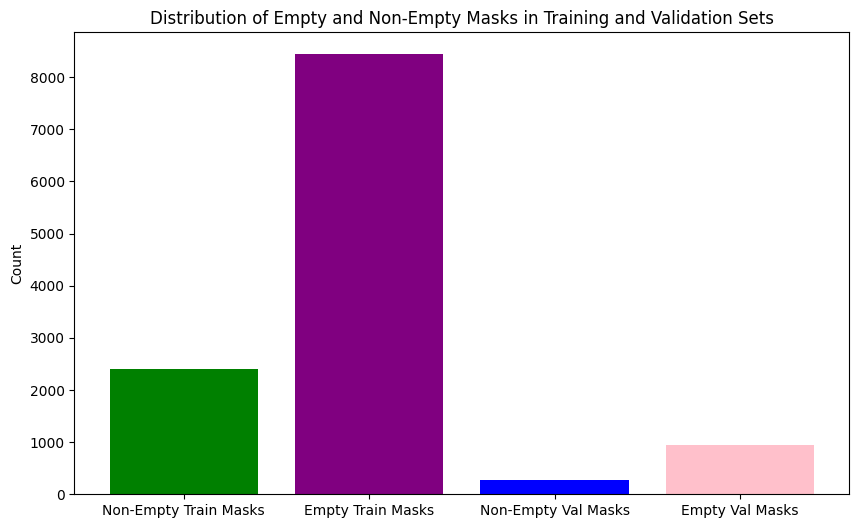

In [2]:
import os
import glob
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# Define paths to the files in Google Drive
mask_train_path = '/content/drive/MyDrive/kaggle_dataset/keras_mask_train/masks'
mask_val_path = '/content/drive/MyDrive/kaggle_dataset/keras_mask_val/masks'

# Load all training and validation masks
all_train_masks = glob.glob(os.path.join(mask_train_path, '*'))
all_val_masks = glob.glob(os.path.join(mask_val_path, '*'))

# Function to check if a mask is empty
def is_mask_empty(mask_path):
    mask = np.array(Image.open(mask_path))
    return np.all(mask == 0)

# Count empty and non-empty masks in training
empty_train_masks = [mask for mask in all_train_masks if is_mask_empty(mask)]
non_empty_train_masks = [mask for mask in all_train_masks if not is_mask_empty(mask)]

# Count empty and non-empty masks in validation
empty_val_masks = [mask for mask in all_val_masks if is_mask_empty(mask)]
non_empty_val_masks = [mask for mask in all_val_masks if not is_mask_empty(mask)]

# Output the analysis results
print(f"Total training masks: {len(all_train_masks)}")
print(f"Empty masks in training: {len(empty_train_masks)}")
print(f"Non-empty masks in training: {len(non_empty_train_masks)}")

print(f"Total validation masks: {len(all_val_masks)}")
print(f"Empty masks in validation: {len(empty_val_masks)}")
print(f"Non-empty masks in validation: {len(non_empty_val_masks)}")

# Visualizing the data
labels = ['Non-Empty Train Masks', 'Empty Train Masks', 'Non-Empty Val Masks', 'Empty Val Masks']
counts = [
    len(non_empty_train_masks),
    len(empty_train_masks),
    len(non_empty_val_masks),
    len(empty_val_masks)
]

plt.figure(figsize=(10, 6))
plt.bar(labels, counts, color=['green', 'purple', 'blue', 'pink'])
plt.ylabel('Count')
plt.title('Distribution of Empty and Non-Empty Masks in Training and Validation Sets')
plt.show()


# **Data Preprocessing**

## **Classifying Masks into 0 (no pneumothorax) and 1 (pneumothorax) and saving them in new folders**

In [ ]:
import os
import glob
import numpy as np
from PIL import Image
import shutil

# Define paths to the files in Google Drive
mask_train_path = '/content/drive/MyDrive/kaggle_dataset/keras_mask_train/masks'
mask_val_path = '/content/drive/MyDrive/kaggle_dataset/keras_mask_val/masks'
im_train_path = '/content/drive/MyDrive/kaggle_dataset/keras_im_train/train'
im_val_path = '/content/drive/MyDrive/kaggle_dataset/keras_im_val/train'

# Define output directories for class 0 and class 1 images
output_class_0_dir = '/content/drive/MyDrive/kaggle_dataset/class_0'
output_class_1_dir = '/content/drive/MyDrive/kaggle_dataset/class_1'

# Create directories if they don't exist
os.makedirs(output_class_0_dir, exist_ok=True)
os.makedirs(output_class_1_dir, exist_ok=True)

# Function to check if a mask is empty
def is_mask_empty(mask_path):
    mask = np.array(Image.open(mask_path))
    return np.all(mask == 0)

# Function to copy images to respective class folders
def copy_images_by_class(mask_paths, image_dir, output_dir_0, output_dir_1):
    for mask_path in mask_paths:
        mask_name = os.path.basename(mask_path)
        # Determine the corresponding image path
        image_path = os.path.join(image_dir, mask_name)
        if not os.path.exists(image_path):
            continue  # Skip if corresponding image is not found

        # Check if the mask is empty
        if is_mask_empty(mask_path):
            shutil.copy(image_path, os.path.join(output_dir_0, mask_name))
        else:
            shutil.copy(image_path, os.path.join(output_dir_1, mask_name))

# Copy training images
copy_images_by_class(
    glob.glob(os.path.join(mask_train_path, '*')),
    im_train_path,
    output_class_0_dir,
    output_class_1_dir
)

# Copy validation images
copy_images_by_class(
    glob.glob(os.path.join(mask_val_path, '*')),
    im_val_path,
    output_class_0_dir,
    output_class_1_dir
)

print(f"Images have been successfully separated into '{output_class_0_dir}' and '{output_class_1_dir}'")


Images have been successfully separated into '/content/drive/MyDrive/kaggle_dataset/class_0' and '/content/drive/MyDrive/kaggle_dataset/class_1'


Checking total number of images in class 0 and 1

In [ ]:
import os

# Define the directories
output_class_0_dir = '/content/drive/MyDrive/kaggle_dataset/class_0'
output_class_1_dir = '/content/drive/MyDrive/kaggle_dataset/class_1'

# Function to count images in a directory
def count_images(directory):
    # List all files in the directory
    files = os.listdir(directory)
    # Filter for image files (e.g., .jpg, .png, .jpeg)
    image_files = [file for file in files if file.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.tif', '.tiff'))]
    return len(image_files)

# Count images in each directory
class_0_count = count_images(output_class_0_dir)
class_1_count = count_images(output_class_1_dir)

# Print the results
print(f"Number of images in class_0 directory: {class_0_count}")
print(f"Number of images in class_1 directory: {class_1_count}")


Number of images in class_0 directory: 9378
Number of images in class_1 directory: 2669


## **K-meas Clustering (old)**

**Normalise pixel value, flatten image to 1D array**

In [ ]:
import cv2
import os
import numpy as np

# Define image folder path
image_folder = '/content/drive/MyDrive/kaggle_dataset/class_0'
image_data = []

# Load and preprocess images
for image_name in os.listdir(image_folder):
    image_path = os.path.join(image_folder, image_name)
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)  # Load as grayscale
    if image is not None:  # Ensure the image was loaded correctly
        image_data.append(image)

# Convert list to NumPy array
image_data = np.array(image_data, dtype=np.float32)

# Normalize pixel values to the range [0, 1]
image_data /= 255.0

print(f"Shape of image data: {image_data.shape}")

# Flatten images
num_images, height, width = image_data.shape
flattened_images = image_data.reshape(num_images, height * width)  # (num_images, height*width)
print("Shape of flattened images:", flattened_images.shape)  # (num_images, height*width)


Shape of image data: (9378, 256, 256)
Shape of flattened images: (9378, 65536)


**Reducing features to 100**

In [ ]:
from sklearn.decomposition import PCA

pca = PCA(n_components=100, random_state=42)  # Reduce to 100 features
reduced_images = pca.fit_transform(flattened_images)
print("Shape after PCA:", reduced_images.shape)  # (9378, 100)


Shape after PCA: (9378, 100)


**k-means clustering - ELbow Method**

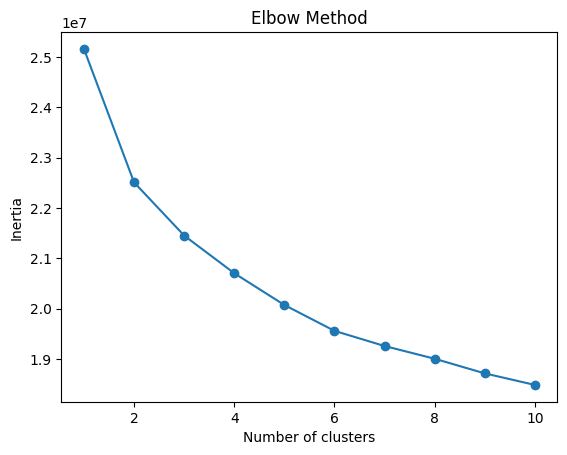

In [ ]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Determine the optimal number of clusters
inertia = []
for k in range(1, 11):  # Test for k=1 to k=10
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(flattened_images)
    inertia.append(kmeans.inertia_)

# Plot the Elbow Curve
plt.plot(range(1, 11), inertia, marker='o')
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.show()


**Silhouette Score**

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

silhouette_scores = []

# Test for different values of k
for k in range(2, 11):  # Start from k=2 (k=1 isn't meaningful for clustering)
    kmeans = KMeans(n_clusters=k, random_state=42)
    cluster_labels = kmeans.fit_predict(flattened_images)
    silhouette_avg = silhouette_score(flattened_images, cluster_labels)
    silhouette_scores.append(silhouette_avg)
    print(f"Silhouette Score for k={k}: {silhouette_avg}")


Silhouette Score for k=2: 0.09564562141895294
Silhouette Score for k=3: 0.06143558770418167
Silhouette Score for k=4: 0.06237092614173889
Silhouette Score for k=5: 0.06231064721941948
Silhouette Score for k=6: 0.05798806995153427
Silhouette Score for k=7: 0.053485091775655746
Silhouette Score for k=8: 0.045120589435100555
Silhouette Score for k=9: 0.04532394930720329
Silhouette Score for k=10: 0.04466155916452408


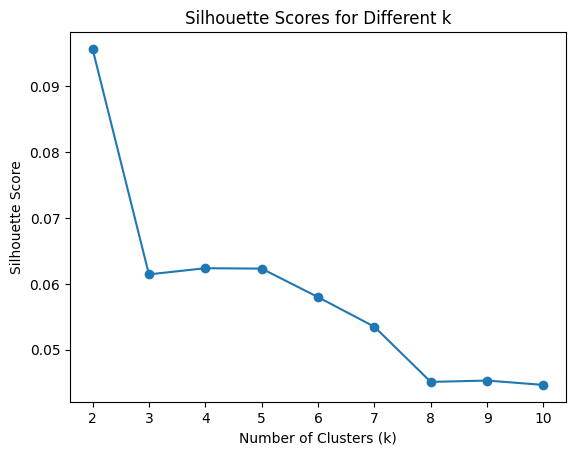

In [ ]:
import matplotlib.pyplot as plt

plt.plot(range(2, 11), silhouette_scores, marker='o')
plt.title('Silhouette Scores for Different k')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Silhouette Score')
plt.show()


**Euclidean Distance 2D Graph**

Shape of flattened images: (9378, 65536)


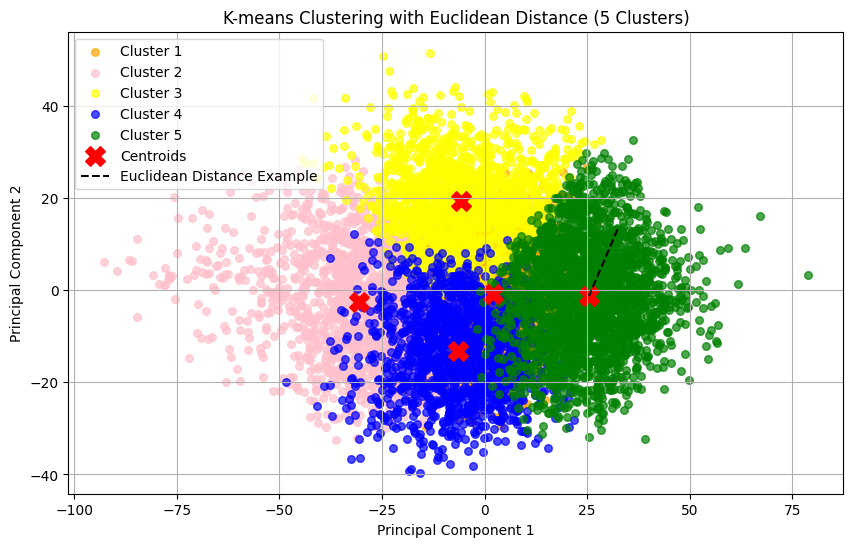

In [ ]:
import cv2
import os
import numpy as np
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Step 1: Load and preprocess X-ray images
image_folder = '/content/drive/MyDrive/kaggle_dataset/class_0'  # Update the path if needed
image_data = []

# Load and preprocess images
for image_name in os.listdir(image_folder):
    image_path = os.path.join(image_folder, image_name)
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)  # Load as grayscale
    if image is not None:  # Ensure the image was loaded correctly
        image_data.append(image)

# Convert list to NumPy array
image_data = np.array(image_data, dtype=np.float32)

# Normalize pixel values to the range [0, 1]
image_data /= 255.0

# Flatten images
num_images, height, width = image_data.shape
flattened_images = image_data.reshape(num_images, height * width)  # (num_images, height*width)

print("Shape of flattened images:", flattened_images.shape)

# Step 2: Apply KMeans clustering with 5 clusters
kmeans = KMeans(n_clusters=5, random_state=42)
labels = kmeans.fit_predict(flattened_images)
centroids = kmeans.cluster_centers_

# Step 3: Reduce dimensions for visualization using PCA
pca = PCA(n_components=2)
flattened_images_2d = pca.fit_transform(flattened_images)  # Reduce data to 2D
centroids_2d = pca.transform(centroids)  # Transform centroids to 2D

# Step 4: Plot the clusters
plt.figure(figsize=(10, 6))
colors = ['orange', 'pink', 'yellow', 'blue', 'green']

for i in range(5):  # 5 clusters
    cluster_data = flattened_images_2d[labels == i]
    plt.scatter(cluster_data[:, 0], cluster_data[:, 1], label=f'Cluster {i+1}', alpha=0.7, s=30, color=colors[i])

# Plot centroids
plt.scatter(centroids_2d[:, 0], centroids_2d[:, 1], c='red', marker='X', s=200, label='Centroids')

# Example Euclidean distance (from a point to its centroid)
example_point = flattened_images_2d[0]  # Pick a point from the dataset
assigned_centroid = centroids_2d[labels[0]]  # Get its corresponding centroid
plt.plot([example_point[0], assigned_centroid[0]], [example_point[1], assigned_centroid[1]],
         'k--', label='Euclidean Distance Example')

# Plot formatting
plt.title('K-means Clustering with Euclidean Distance (5 Clusters)')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend()
plt.grid()
plt.show()


**Euclidean Distance 3D Graph**

Shape of flattened images: (9378, 65536)


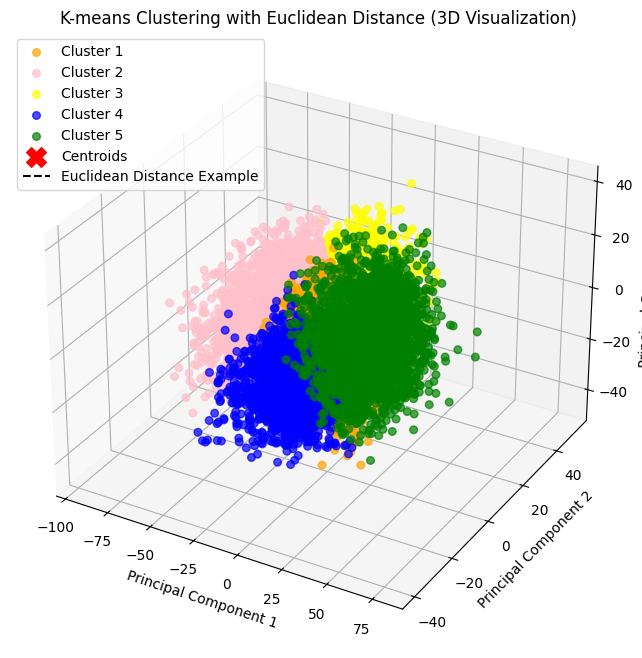

In [ ]:
import cv2
import os
import numpy as np
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Step 1: Load and preprocess X-ray images
image_folder = '/content/drive/MyDrive/kaggle_dataset/class_0'  # Update the path if needed
image_data = []

# Load and preprocess images
for image_name in os.listdir(image_folder):
    image_path = os.path.join(image_folder, image_name)
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)  # Load as grayscale
    if image is not None:  # Ensure the image was loaded correctly
        image_data.append(image)

# Convert list to NumPy array
image_data = np.array(image_data, dtype=np.float32)

# Normalize pixel values to the range [0, 1]
image_data /= 255.0

# Flatten images
num_images, height, width = image_data.shape
flattened_images = image_data.reshape(num_images, height * width)  # (num_images, height*width)

print("Shape of flattened images:", flattened_images.shape)

# Step 2: Apply KMeans clustering with 5 clusters
kmeans = KMeans(n_clusters=5, random_state=42)
labels = kmeans.fit_predict(flattened_images)
centroids = kmeans.cluster_centers_

# Step 3: Reduce dimensions for visualization using PCA
pca = PCA(n_components=3)
flattened_images_3d = pca.fit_transform(flattened_images)  # Reduce data to 3D
centroids_3d = pca.transform(centroids)  # Transform centroids to 3D

# Step 4: Plot the clusters in 3D
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
colors = ['orange', 'pink', 'yellow', 'blue', 'green']

for i in range(5):  # 5 clusters
    cluster_data = flattened_images_3d[labels == i]
    ax.scatter(cluster_data[:, 0], cluster_data[:, 1], cluster_data[:, 2], label=f'Cluster {i+1}', alpha=0.7, s=30, color=colors[i])

# Plot centroids
ax.scatter(centroids_3d[:, 0], centroids_3d[:, 1], centroids_3d[:, 2], c='red', marker='X', s=200, label='Centroids')

# Example Euclidean distance (optional for illustration)
example_point = flattened_images_3d[0]  # Pick a point from the dataset
assigned_centroid = centroids_3d[labels[0]]  # Get its corresponding centroid
ax.plot([example_point[0], assigned_centroid[0]],
        [example_point[1], assigned_centroid[1]],
        [example_point[2], assigned_centroid[2]],
        'k--', label='Euclidean Distance Example')

# Plot formatting
ax.set_title('K-means Clustering with Euclidean Distance (3D Visualization)')
ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_zlabel('Principal Component 3')
ax.legend()
plt.show()


**cluster images**

Cluster labels: [4 3 2 ... 4 4 4]


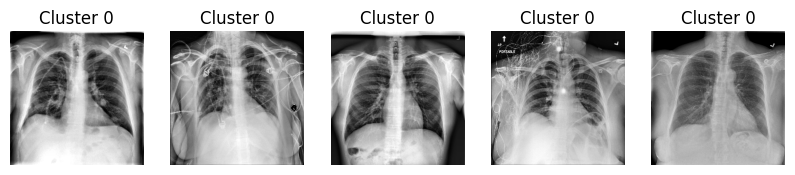

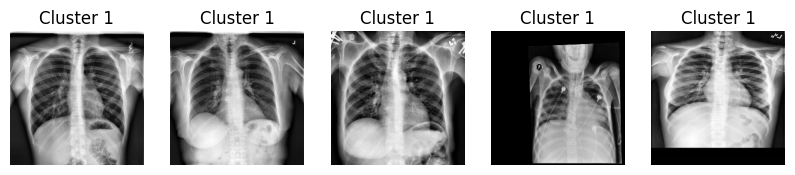

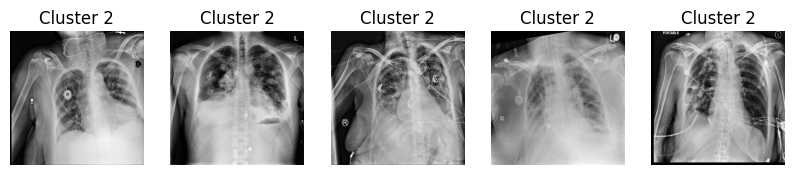

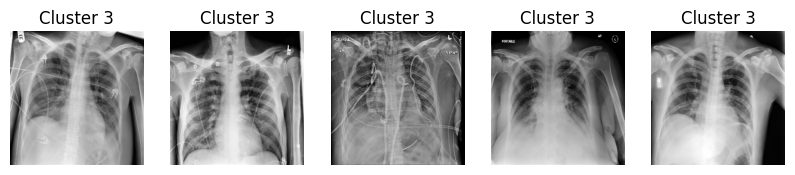

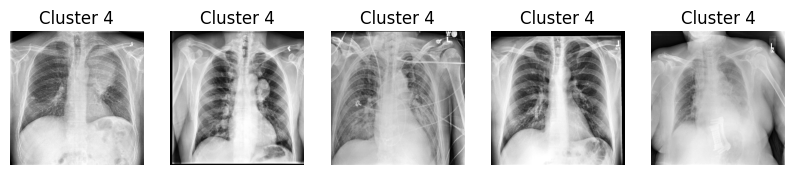

In [ ]:
import random
import matplotlib.pyplot as plt

# Apply K-Means with optimal k
optimal_k = 5  # Replace with your chosen k
kmeans = KMeans(n_clusters=optimal_k, random_state=42)
cluster_labels = kmeans.fit_predict(flattened_images)

print("Cluster labels:", cluster_labels)  # Each image is assigned a cluster label

# Visualize some images from each cluster
for cluster_id in range(optimal_k):
    cluster_indices = np.where(cluster_labels == cluster_id)[0]  # Indices of images in this cluster
    cluster_sample_indices = random.sample(list(cluster_indices), 5)  # Select 5 random images
    plt.figure(figsize=(10, 5))
    for i, idx in enumerate(cluster_sample_indices):
        plt.subplot(1, 5, i + 1)
        plt.imshow(image_data[idx], cmap='gray')
        plt.title(f"Cluster {cluster_id}")
        plt.axis('off')
    plt.show()


## **ResNet 50**

In [ ]:
import os
from PIL import Image
import torch
from torchvision import transforms
from tqdm import tqdm


# Define the directory containing your images
output_class_0_dir = '/content/drive/MyDrive/kaggle_dataset/class_0'

# Define the output directory for processed images
processed_output_dir = '/content/drive/MyDrive/kaggle_dataset/processed_class_0'
os.makedirs(processed_output_dir, exist_ok=True)  # Create directory if it doesn't exist

# Define the preprocessing pipeline
preprocess = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize to 224x224 (input size for ResNet)
    transforms.ToTensor(),          # Convert to PyTorch tensor
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalize
])

# Function to load, preprocess, and save images
def load_preprocess_and_save_images(image_dir, preprocess, output_dir):
    file_list = [f for f in os.listdir(image_dir) if f.endswith(('.png', '.jpg', '.jpeg'))]
    for filename in tqdm(file_list, desc="Processing Images", unit="image"):
        img_path = os.path.join(image_dir, filename)
        image = Image.open(img_path).convert('RGB')  # Convert to RGB if grayscale

        # Apply preprocessing (excluding tensor normalization for saving)
        resized_image = preprocess.transforms[0](image)  # Resize
        tensor_image = preprocess.transforms[1](resized_image)  # Convert to Tensor

        # Convert back to PIL Image for saving (scale tensor values to 0-255)
        processed_image = transforms.ToPILImage()(tensor_image)

        # Save the processed image
        output_path = os.path.join(output_dir, filename)
        processed_image.save(output_path)

# Preprocess and save images with a progress bar
load_preprocess_and_save_images(output_class_0_dir, preprocess, processed_output_dir)

print(f"Processed images saved to: {processed_output_dir}")


Processing Images: 100%|██████████| 9378/9378 [10:15<00:00, 15.24image/s]

Processed images saved to: /content/drive/MyDrive/kaggle_dataset/processed_class_0


**Load a pre-trained ResNet model: ResNet-50**

In [ ]:
import os
from PIL import Image
import torch
from torchvision import transforms
from tqdm import tqdm
import torchvision.models as models
import torch.nn as nn
import numpy as np

# Define directories
processed_output_dir = '/content/drive/MyDrive/kaggle_dataset/processed_class_0'
feature_output_dir = '/content/drive/MyDrive/kaggle_dataset/features_class_0'
os.makedirs(feature_output_dir, exist_ok=True)  # Create directory to store features

# Define the preprocessing pipeline for loading preprocessed images
preprocess_for_tensor = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Load the ResNet model for feature extraction
resnet = models.resnet50(pretrained=True)
feature_extractor = nn.Sequential(*list(resnet.children())[:-1])  # Remove FC layer
feature_extractor.eval()

# Define a function to extract features from preprocessed images
def extract_features(image_dir, model, preprocess, output_dir):
    features_list = []
    filenames = []

    image_files = [f for f in os.listdir(image_dir) if f.endswith(('.png', '.jpg', '.jpeg'))]
    print(f"Number of valid image files: {len(image_files)}")

    for filename in tqdm(image_files, desc="Extracting Features", unit="image"):
        print(f"Processing file: {filename}")  # Debugging print statement
        img_path = os.path.join(image_dir, filename)

        # Load and preprocess image
        image = Image.open(img_path).convert('RGB')
        tensor_image = preprocess(image).unsqueeze(0)  # Add batch dimension

        # Pass through the feature extractor
        with torch.no_grad():
            features = model(tensor_image).squeeze()  # Remove batch dimension
        features_list.append(features.numpy())
        filenames.append(filename)

        # Save the feature with the same name as the image file (replace extension with .npy)
        feature_path = os.path.join(output_dir, f'{os.path.splitext(filename)[0]}.npy')
        print(f"Saving feature to: {feature_path}")  # Debugging print statement
        with open(feature_path, 'wb') as f:
            np.save(f, features)

    return features_list, filenames

# Extract features and save them
features, filenames = extract_features(processed_output_dir, feature_extractor, preprocess_for_tensor, feature_output_dir)

print(f"Number of features extracted: {len(features)}")
print(f"Extracted features saved to: {feature_output_dir}")
print(f"Number of saved features: {len(os.listdir(feature_output_dir))}")


Number of valid image files: 9378


Extracting Features:   0%|          | 0/9378 [00:00<?, ?image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.10780.1517875225.617448.png


Extracting Features:   0%|          | 1/9378 [00:00<1:03:18,  2.47image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10780.1517875225.617448.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10800.1517875225.675753.png


Extracting Features:   0%|          | 2/9378 [00:00<1:04:38,  2.42image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10800.1517875225.675753.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10805.1517875225.697867.png


Extracting Features:   0%|          | 3/9378 [00:01<1:02:33,  2.50image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10805.1517875225.697867.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10794.1517875225.648898.png


Extracting Features:   0%|          | 4/9378 [00:01<1:01:36,  2.54image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10794.1517875225.648898.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10785.1517875225.615365.png


Extracting Features:   0%|          | 5/9378 [00:01<52:45,  2.96image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10785.1517875225.615365.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10802.1517875225.674663.png


Extracting Features:   0%|          | 6/9378 [00:02<47:34,  3.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10802.1517875225.674663.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10790.1517875225.641224.png


Extracting Features:   0%|          | 7/9378 [00:02<48:00,  3.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10790.1517875225.641224.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10789.1517875225.634641.png


Extracting Features:   0%|          | 8/9378 [00:02<46:14,  3.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10789.1517875225.634641.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10795.1517875225.653481.png


Extracting Features:   0%|          | 9/9378 [00:03<49:40,  3.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10795.1517875225.653481.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10797.1517875225.664914.png


Extracting Features:   0%|          | 10/9378 [00:03<53:23,  2.92image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10797.1517875225.664914.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10806.1517875225.697838.png


Extracting Features:   0%|          | 11/9378 [00:03<58:17,  2.68image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10806.1517875225.697838.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10803.1517875225.688630.png


Extracting Features:   0%|          | 12/9378 [00:04<58:54,  2.65image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10803.1517875225.688630.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10807.1517875225.709130.png


Extracting Features:   0%|          | 13/9378 [00:04<59:27,  2.63image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10807.1517875225.709130.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10788.1517875225.632041.png


Extracting Features:   0%|          | 14/9378 [00:05<1:00:01,  2.60image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10788.1517875225.632041.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10799.1517875225.673201.png


Extracting Features:   0%|          | 15/9378 [00:05<58:27,  2.67image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10799.1517875225.673201.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10783.1517875225.615915.png


Extracting Features:   0%|          | 16/9378 [00:05<58:42,  2.66image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10783.1517875225.615915.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1078.1517875166.227967.png


Extracting Features:   0%|          | 17/9378 [00:06<58:44,  2.66image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1078.1517875166.227967.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10782.1517875225.614295.png


Extracting Features:   0%|          | 18/9378 [00:06<1:03:41,  2.45image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10782.1517875225.614295.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10828.1517875225.813209.png


Extracting Features:   0%|          | 19/9378 [00:07<1:02:38,  2.49image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10828.1517875225.813209.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10826.1517875225.797349.png


Extracting Features:   0%|          | 20/9378 [00:07<1:00:51,  2.56image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10826.1517875225.797349.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10830.1517875225.822040.png


Extracting Features:   0%|          | 21/9378 [00:07<59:52,  2.60image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10830.1517875225.822040.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10833.1517875225.845843.png


Extracting Features:   0%|          | 22/9378 [00:08<1:01:10,  2.55image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10833.1517875225.845843.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10823.1517875225.792071.png


Extracting Features:   0%|          | 23/9378 [00:08<1:04:23,  2.42image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10823.1517875225.792071.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10834.1517875225.849835.png


Extracting Features:   0%|          | 24/9378 [00:09<1:11:51,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10834.1517875225.849835.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1082.1517875166.234899.png


Extracting Features:   0%|          | 25/9378 [00:09<1:11:01,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1082.1517875166.234899.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10812.1517875225.740371.png


Extracting Features:   0%|          | 26/9378 [00:10<1:19:41,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10812.1517875225.740371.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10808.1517875225.709534.png


Extracting Features:   0%|          | 27/9378 [00:10<1:23:51,  1.86image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10808.1517875225.709534.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1081.1517875166.228103.png


Extracting Features:   0%|          | 28/9378 [00:11<1:25:02,  1.83image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1081.1517875166.228103.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10835.1517875225.849175.png


Extracting Features:   0%|          | 29/9378 [00:11<1:25:11,  1.83image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10835.1517875225.849175.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10811.1517875225.737197.png


Extracting Features:   0%|          | 30/9378 [00:12<1:25:26,  1.82image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10811.1517875225.737197.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10820.1517875225.770645.png


Extracting Features:   0%|          | 31/9378 [00:13<1:24:59,  1.83image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10820.1517875225.770645.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10831.1517875225.830206.png


Extracting Features:   0%|          | 32/9378 [00:13<1:27:21,  1.78image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10831.1517875225.830206.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10816.1517875225.764150.png


Extracting Features:   0%|          | 33/9378 [00:14<1:26:13,  1.81image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10816.1517875225.764150.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10827.1517875225.808062.png


Extracting Features:   0%|          | 34/9378 [00:14<1:27:37,  1.78image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10827.1517875225.808062.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10837.1517875225.855484.png


Extracting Features:   0%|          | 35/9378 [00:15<1:25:26,  1.82image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10837.1517875225.855484.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10819.1517875225.772223.png


Extracting Features:   0%|          | 36/9378 [00:15<1:20:51,  1.93image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10819.1517875225.772223.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10825.1517875225.796519.png


Extracting Features:   0%|          | 37/9378 [00:16<1:19:59,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10825.1517875225.796519.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10824.1517875225.793726.png


Extracting Features:   0%|          | 38/9378 [00:16<1:26:27,  1.80image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10824.1517875225.793726.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10813.1517875225.746233.png


Extracting Features:   0%|          | 39/9378 [00:17<1:25:14,  1.83image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10813.1517875225.746233.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10821.1517875225.774184.png


Extracting Features:   0%|          | 40/9378 [00:17<1:19:21,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10821.1517875225.774184.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10848.1517875225.939482.png


Extracting Features:   0%|          | 41/9378 [00:18<1:11:10,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10848.1517875225.939482.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10853.1517875225.963892.png


Extracting Features:   0%|          | 42/9378 [00:18<1:11:57,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10853.1517875225.963892.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10840.1517875225.892114.png


Extracting Features:   0%|          | 43/9378 [00:19<1:10:18,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10840.1517875225.892114.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10850.1517875225.943460.png


Extracting Features:   0%|          | 44/9378 [00:19<1:05:01,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10850.1517875225.943460.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10846.1517875225.927140.png


Extracting Features:   0%|          | 45/9378 [00:19<1:04:20,  2.42image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10846.1517875225.927140.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10861.1517875225.1530.png


Extracting Features:   0%|          | 46/9378 [00:20<1:02:46,  2.48image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10861.1517875225.1530.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10847.1517875225.925010.png


Extracting Features:   1%|          | 47/9378 [00:20<1:00:03,  2.59image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10847.1517875225.925010.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10849.1517875225.943179.png


Extracting Features:   1%|          | 48/9378 [00:20<57:54,  2.69image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10849.1517875225.943179.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10856.1517875225.972890.png


Extracting Features:   1%|          | 49/9378 [00:21<57:43,  2.69image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10856.1517875225.972890.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10860.1517875225.990476.png


Extracting Features:   1%|          | 50/9378 [00:21<57:03,  2.72image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10860.1517875225.990476.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10855.1517875225.968199.png


Extracting Features:   1%|          | 51/9378 [00:21<56:02,  2.77image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10855.1517875225.968199.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10864.1517875226.16468.png


Extracting Features:   1%|          | 52/9378 [00:22<57:42,  2.69image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10864.1517875226.16468.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10863.1517875226.15428.png


Extracting Features:   1%|          | 53/9378 [00:22<58:34,  2.65image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10863.1517875226.15428.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10852.1517875225.962701.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10852.1517875225.962701.npy


Extracting Features:   1%|          | 54/9378 [00:23<1:11:21,  2.18image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.1086.1517875166.262172.png


Extracting Features:   1%|          | 55/9378 [00:23<1:06:08,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1086.1517875166.262172.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10857.1517875225.988260.png


Extracting Features:   1%|          | 56/9378 [00:24<1:03:10,  2.46image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10857.1517875225.988260.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10843.1517875225.915764.png


Extracting Features:   1%|          | 57/9378 [00:24<1:03:30,  2.45image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10843.1517875225.915764.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10838.1517875225.876422.png


Extracting Features:   1%|          | 58/9378 [00:24<1:01:54,  2.51image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10838.1517875225.876422.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10859.1517875225.990057.png


Extracting Features:   1%|          | 59/9378 [00:25<1:01:10,  2.54image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10859.1517875225.990057.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10839.1517875225.891591.png


Extracting Features:   1%|          | 60/9378 [00:25<1:00:25,  2.57image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10839.1517875225.891591.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10865.1517875226.22461.png


Extracting Features:   1%|          | 61/9378 [00:26<58:37,  2.65image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10865.1517875226.22461.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10842.1517875225.923249.png


Extracting Features:   1%|          | 62/9378 [00:26<58:35,  2.65image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10842.1517875225.923249.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12066.1517875237.199621.png


Extracting Features:   1%|          | 63/9378 [00:26<58:05,  2.67image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12066.1517875237.199621.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11921.1517875236.474727.png


Extracting Features:   1%|          | 64/9378 [00:27<57:29,  2.70image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11921.1517875236.474727.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12147.1517875237.697141.png


Extracting Features:   1%|          | 65/9378 [00:27<57:14,  2.71image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12147.1517875237.697141.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12019.1517875236.927067.png


Extracting Features:   1%|          | 66/9378 [00:27<56:46,  2.73image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12019.1517875236.927067.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11904.1517875236.378676.png


Extracting Features:   1%|          | 67/9378 [00:28<58:42,  2.64image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11904.1517875236.378676.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11995.1517875236.819121.png


Extracting Features:   1%|          | 68/9378 [00:28<1:00:51,  2.55image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11995.1517875236.819121.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11935.1517875236.541131.png


Extracting Features:   1%|          | 69/9378 [00:29<1:02:38,  2.48image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11935.1517875236.541131.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12176.1517875237.843053.png


Extracting Features:   1%|          | 70/9378 [00:29<1:02:23,  2.49image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12176.1517875237.843053.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11979.1517875236.734008.png


Extracting Features:   1%|          | 71/9378 [00:30<1:09:21,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11979.1517875236.734008.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12171.1517875237.820077.png


Extracting Features:   1%|          | 72/9378 [00:30<1:09:26,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12171.1517875237.820077.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12185.1517875237.874943.png


Extracting Features:   1%|          | 73/9378 [00:30<1:05:06,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12185.1517875237.874943.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12207.1517875237.962711.png


Extracting Features:   1%|          | 74/9378 [00:31<1:01:44,  2.51image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12207.1517875237.962711.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12063.1517875237.180897.png


Extracting Features:   1%|          | 75/9378 [00:31<59:26,  2.61image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12063.1517875237.180897.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12191.1517875237.895586.png


Extracting Features:   1%|          | 76/9378 [00:31<57:44,  2.69image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12191.1517875237.895586.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12009.1517875236.881190.png


Extracting Features:   1%|          | 77/9378 [00:32<56:15,  2.76image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12009.1517875236.881190.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12031.1517875237.6270.png


Extracting Features:   1%|          | 78/9378 [00:32<56:28,  2.74image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12031.1517875237.6270.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12035.1517875237.37522.png


Extracting Features:   1%|          | 79/9378 [00:32<56:02,  2.77image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12035.1517875237.37522.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11913.1517875236.440746.png


Extracting Features:   1%|          | 80/9378 [00:33<56:26,  2.75image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11913.1517875236.440746.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12092.1517875237.346649.png


Extracting Features:   1%|          | 81/9378 [00:33<56:28,  2.74image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12092.1517875237.346649.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1235.1517875166.903964.png


Extracting Features:   1%|          | 82/9378 [00:34<56:18,  2.75image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1235.1517875166.903964.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12431.1517875239.86815.png


Extracting Features:   1%|          | 83/9378 [00:34<56:36,  2.74image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12431.1517875239.86815.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1243.1517875166.938629.png


Extracting Features:   1%|          | 84/9378 [00:34<56:25,  2.75image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1243.1517875166.938629.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12457.1517875239.199999.png


Extracting Features:   1%|          | 85/9378 [00:35<56:27,  2.74image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12457.1517875239.199999.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12230.1517875238.85181.png


Extracting Features:   1%|          | 86/9378 [00:35<51:24,  3.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12230.1517875238.85181.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12408.1517875239.6404.png


Extracting Features:   1%|          | 87/9378 [00:35<46:49,  3.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12408.1517875239.6404.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12296.1517875238.439802.png


Extracting Features:   1%|          | 88/9378 [00:35<43:21,  3.57image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12296.1517875238.439802.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12448.1517875239.156922.png


Extracting Features:   1%|          | 89/9378 [00:36<42:24,  3.65image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12448.1517875239.156922.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12442.1517875239.140568.png


Extracting Features:   1%|          | 90/9378 [00:36<40:35,  3.81image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12442.1517875239.140568.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12295.1517875238.429632.png


Extracting Features:   1%|          | 91/9378 [00:36<39:45,  3.89image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12295.1517875238.429632.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12400.1517875238.965459.png


Extracting Features:   1%|          | 92/9378 [00:36<38:02,  4.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12400.1517875238.965459.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12418.1517875239.55709.png


Extracting Features:   1%|          | 93/9378 [00:37<36:59,  4.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12418.1517875239.55709.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12268.1517875238.329792.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12268.1517875238.329792.npy


Extracting Features:   1%|          | 94/9378 [01:54<59:58:06, 23.25s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.12380.1517875238.884264.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12380.1517875238.884264.npy


Extracting Features:   1%|          | 95/9378 [04:07<145:16:45, 56.34s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.1230.1517875166.881841.png


Extracting Features:   1%|          | 96/9378 [04:07<101:58:31, 39.55s/image]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1230.1517875166.881841.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12279.1517875238.367554.png


Extracting Features:   1%|          | 97/9378 [04:08<71:38:55, 27.79s/image] 

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12279.1517875238.367554.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12263.1517875238.298329.png


Extracting Features:   1%|          | 98/9378 [04:08<50:26:27, 19.57s/image]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12263.1517875238.298329.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12401.1517875238.972395.png


Extracting Features:   1%|          | 99/9378 [04:08<35:31:06, 13.78s/image]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12401.1517875238.972395.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12266.1517875238.313460.png


Extracting Features:   1%|          | 100/9378 [04:09<25:02:06,  9.71s/image]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12266.1517875238.313460.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12458.1517875239.202465.png


Extracting Features:   1%|          | 101/9378 [04:09<17:50:46,  6.93s/image]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12458.1517875239.202465.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12430.1517875239.83386.png


Extracting Features:   1%|          | 102/9378 [04:09<12:46:36,  4.96s/image]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12430.1517875239.83386.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12428.1517875239.79052.png


Extracting Features:   1%|          | 103/9378 [04:10<9:12:22,  3.57s/image] 

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12428.1517875239.79052.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12466.1517875239.238077.png


Extracting Features:   1%|          | 104/9378 [04:10<6:43:00,  2.61s/image]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12466.1517875239.238077.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1262.1517875167.11459.png


Extracting Features:   1%|          | 105/9378 [04:11<4:59:01,  1.93s/image]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1262.1517875167.11459.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12623.1517875240.174304.png


Extracting Features:   1%|          | 106/9378 [04:11<3:46:03,  1.46s/image]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12623.1517875240.174304.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12512.1517875239.479876.png


Extracting Features:   1%|          | 107/9378 [04:11<2:56:46,  1.14s/image]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12512.1517875239.479876.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12559.1517875239.716051.png


Extracting Features:   1%|          | 108/9378 [04:12<2:24:20,  1.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12559.1517875239.716051.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12698.1517875241.222836.png


Extracting Features:   1%|          | 109/9378 [04:12<1:59:16,  1.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12698.1517875241.222836.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12517.1517875239.497225.png


Extracting Features:   1%|          | 110/9378 [04:13<1:48:40,  1.42image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12517.1517875239.497225.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12598.1517875240.34872.png


Extracting Features:   1%|          | 111/9378 [04:13<1:44:00,  1.49image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12598.1517875240.34872.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12521.1517875239.524745.png


Extracting Features:   1%|          | 112/9378 [04:14<1:33:04,  1.66image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12521.1517875239.524745.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12781.1517875241.802291.png


Extracting Features:   1%|          | 113/9378 [04:14<1:27:43,  1.76image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12781.1517875241.802291.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1274.1517875167.73899.png


Extracting Features:   1%|          | 114/9378 [04:15<1:28:54,  1.74image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1274.1517875167.73899.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12557.1517875239.707485.png


Extracting Features:   1%|          | 115/9378 [04:15<1:23:35,  1.85image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12557.1517875239.707485.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1250.1517875166.960152.png


Extracting Features:   1%|          | 116/9378 [04:16<1:25:12,  1.81image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1250.1517875166.960152.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12486.1517875239.355652.png


Extracting Features:   1%|          | 117/9378 [04:16<1:19:39,  1.94image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12486.1517875239.355652.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12625.1517875240.194497.png


Extracting Features:   1%|▏         | 118/9378 [04:17<1:17:47,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12625.1517875240.194497.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12564.1517875239.750326.png


Extracting Features:   1%|▏         | 119/9378 [04:17<1:16:13,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12564.1517875239.750326.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12628.1517875240.200238.png


Extracting Features:   1%|▏         | 120/9378 [04:18<1:18:29,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12628.1517875240.200238.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12622.1517875240.170043.png


Extracting Features:   1%|▏         | 121/9378 [04:18<1:18:05,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12622.1517875240.170043.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12618.1517875240.171091.png


Extracting Features:   1%|▏         | 122/9378 [04:19<1:15:44,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12618.1517875240.171091.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12607.1517875240.133521.png


Extracting Features:   1%|▏         | 123/9378 [04:19<1:15:42,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12607.1517875240.133521.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12689.1517875241.184000.png


Extracting Features:   1%|▏         | 124/9378 [04:20<1:20:10,  1.92image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12689.1517875241.184000.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12717.1517875241.297402.png


Extracting Features:   1%|▏         | 125/9378 [04:20<1:17:04,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12717.1517875241.297402.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12735.1517875241.549576.png


Extracting Features:   1%|▏         | 126/9378 [04:21<1:24:36,  1.82image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12735.1517875241.549576.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12740.1517875241.573194.png


Extracting Features:   1%|▏         | 127/9378 [04:21<1:20:52,  1.91image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12740.1517875241.573194.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12664.1517875241.34925.png


Extracting Features:   1%|▏         | 128/9378 [04:22<1:18:40,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12664.1517875241.34925.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12788.1517875241.861064.png


Extracting Features:   1%|▏         | 129/9378 [04:22<1:14:55,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12788.1517875241.861064.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12883.1517875242.349828.png


Extracting Features:   1%|▏         | 130/9378 [04:23<1:12:45,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12883.1517875242.349828.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1303.1517875167.181459.png


Extracting Features:   1%|▏         | 131/9378 [04:23<1:07:49,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1303.1517875167.181459.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13025.1517875243.155983.png


Extracting Features:   1%|▏         | 132/9378 [04:23<1:04:22,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13025.1517875243.155983.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13024.1517875243.151731.png


Extracting Features:   1%|▏         | 133/9378 [04:24<1:02:11,  2.48image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13024.1517875243.151731.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12881.1517875242.348099.png


Extracting Features:   1%|▏         | 134/9378 [04:24<56:23,  2.73image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12881.1517875242.348099.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12961.1517875242.740764.png


Extracting Features:   1%|▏         | 135/9378 [04:24<55:29,  2.78image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12961.1517875242.740764.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13047.1517875243.285342.png


Extracting Features:   1%|▏         | 136/9378 [04:25<52:15,  2.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13047.1517875243.285342.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12919.1517875242.528466.png


Extracting Features:   1%|▏         | 137/9378 [04:25<47:37,  3.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12919.1517875242.528466.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1287.1517875167.127725.png


Extracting Features:   1%|▏         | 138/9378 [04:25<51:58,  2.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1287.1517875167.127725.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12863.1517875242.247577.png


Extracting Features:   1%|▏         | 139/9378 [04:26<1:01:58,  2.48image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12863.1517875242.247577.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12846.1517875242.141253.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12846.1517875242.141253.npy


Extracting Features:   1%|▏         | 140/9378 [04:27<1:28:56,  1.73image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.12802.1517875241.934506.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12802.1517875241.934506.npy


Extracting Features:   2%|▏         | 141/9378 [04:28<1:58:59,  1.29image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.13004.1517875242.974017.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13004.1517875242.974017.npy


Extracting Features:   2%|▏         | 142/9378 [04:29<2:17:34,  1.12image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.12857.1517875242.220095.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12857.1517875242.220095.npy


Extracting Features:   2%|▏         | 143/9378 [04:31<2:33:05,  1.01image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.12804.1517875241.931739.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12804.1517875241.931739.npy


Extracting Features:   2%|▏         | 144/9378 [04:32<2:46:33,  1.08s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.12906.1517875242.471193.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12906.1517875242.471193.npy


Extracting Features:   2%|▏         | 145/9378 [04:33<2:57:33,  1.15s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.12782.1517875241.803603.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12782.1517875241.803603.npy


Extracting Features:   2%|▏         | 146/9378 [04:35<3:19:29,  1.30s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.12999.1517875242.934107.png


Extracting Features:   2%|▏         | 147/9378 [04:36<2:58:27,  1.16s/image]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12999.1517875242.934107.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12843.1517875242.121374.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12843.1517875242.121374.npy


Extracting Features:   2%|▏         | 148/9378 [04:37<3:21:33,  1.31s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.13011.1517875243.59060.png


Extracting Features:   2%|▏         | 149/9378 [04:38<3:00:31,  1.17s/image]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13011.1517875243.59060.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12966.1517875242.774363.png


Extracting Features:   2%|▏         | 150/9378 [04:39<2:36:27,  1.02s/image]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12966.1517875242.774363.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12859.1517875242.226874.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12859.1517875242.226874.npy


Extracting Features:   2%|▏         | 151/9378 [04:40<2:51:48,  1.12s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.12890.1517875242.395072.png


Extracting Features:   2%|▏         | 152/9378 [04:41<2:21:04,  1.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12890.1517875242.395072.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12825.1517875242.34839.png


Extracting Features:   2%|▏         | 153/9378 [04:41<2:04:59,  1.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12825.1517875242.34839.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1280.1517875167.98621.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1280.1517875167.98621.npy


Extracting Features:   2%|▏         | 154/9378 [04:42<2:24:15,  1.07image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.12829.1517875242.57475.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12829.1517875242.57475.npy


Extracting Features:   2%|▏         | 155/9378 [04:44<2:37:35,  1.03s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.13222.1517875244.202923.png


Extracting Features:   2%|▏         | 156/9378 [04:44<2:06:53,  1.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13222.1517875244.202923.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13104.1517875243.628352.png


Extracting Features:   2%|▏         | 157/9378 [04:44<1:46:20,  1.45image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13104.1517875243.628352.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13048.1517875243.311021.png


Extracting Features:   2%|▏         | 158/9378 [04:45<1:31:49,  1.67image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13048.1517875243.311021.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13052.1517875243.321216.png


Extracting Features:   2%|▏         | 159/9378 [04:45<1:20:37,  1.91image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13052.1517875243.321216.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13049.1517875243.287134.png


Extracting Features:   2%|▏         | 160/9378 [04:45<1:13:38,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13049.1517875243.287134.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13292.1517875244.548453.png


Extracting Features:   2%|▏         | 161/9378 [04:46<1:08:37,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13292.1517875244.548453.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1310.1517875167.208354.png


Extracting Features:   2%|▏         | 162/9378 [04:46<1:05:46,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1310.1517875167.208354.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13210.1517875244.151461.png


Extracting Features:   2%|▏         | 163/9378 [04:47<1:02:11,  2.47image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13210.1517875244.151461.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13286.1517875244.519570.png


Extracting Features:   2%|▏         | 164/9378 [04:47<1:01:12,  2.51image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13286.1517875244.519570.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1316.1517875167.222425.png


Extracting Features:   2%|▏         | 165/9378 [04:47<59:17,  2.59image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1316.1517875167.222425.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13105.1517875243.626818.png


Extracting Features:   2%|▏         | 166/9378 [04:48<57:59,  2.65image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13105.1517875243.626818.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13201.1517875244.111168.png


Extracting Features:   2%|▏         | 167/9378 [04:48<58:41,  2.62image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13201.1517875244.111168.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13207.1517875244.139708.png


Extracting Features:   2%|▏         | 168/9378 [04:48<57:32,  2.67image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13207.1517875244.139708.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13279.1517875244.488660.png


Extracting Features:   2%|▏         | 169/9378 [04:49<1:00:07,  2.55image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13279.1517875244.488660.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13183.1517875244.36014.png


Extracting Features:   2%|▏         | 170/9378 [04:49<1:04:19,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13183.1517875244.36014.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13086.1517875243.514324.png


Extracting Features:   2%|▏         | 171/9378 [04:50<1:10:19,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13086.1517875243.514324.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13251.1517875244.358956.png


Extracting Features:   2%|▏         | 172/9378 [04:50<1:07:46,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13251.1517875244.358956.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13143.1517875243.861463.png


Extracting Features:   2%|▏         | 173/9378 [04:51<1:03:17,  2.42image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13143.1517875243.861463.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13232.1517875244.243032.png


Extracting Features:   2%|▏         | 174/9378 [04:51<1:11:57,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13232.1517875244.243032.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13154.1517875243.909638.png


Extracting Features:   2%|▏         | 175/9378 [04:52<1:18:34,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13154.1517875243.909638.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13146.1517875243.903648.png


Extracting Features:   2%|▏         | 176/9378 [04:52<1:18:33,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13146.1517875243.903648.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13234.1517875244.270166.png


Extracting Features:   2%|▏         | 177/9378 [04:53<1:14:59,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13234.1517875244.270166.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1309.1517875167.210689.png


Extracting Features:   2%|▏         | 178/9378 [04:53<1:14:22,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1309.1517875167.210689.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13199.1517875244.107782.png


Extracting Features:   2%|▏         | 179/9378 [04:54<1:16:39,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13199.1517875244.107782.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13375.1517875244.924290.png


Extracting Features:   2%|▏         | 180/9378 [04:54<1:14:11,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13375.1517875244.924290.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13431.1517875245.279113.png


Extracting Features:   2%|▏         | 181/9378 [04:55<1:10:32,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13431.1517875245.279113.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13482.1517875245.521536.png


Extracting Features:   2%|▏         | 182/9378 [04:55<1:12:31,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13482.1517875245.521536.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13371.1517875244.888670.png


Extracting Features:   2%|▏         | 183/9378 [04:56<1:18:08,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13371.1517875244.888670.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13382.1517875245.51471.png


Extracting Features:   2%|▏         | 184/9378 [04:56<1:14:03,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13382.1517875245.51471.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13529.1517875246.484933.png


Extracting Features:   2%|▏         | 185/9378 [04:57<1:13:07,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13529.1517875246.484933.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13495.1517875245.570864.png


Extracting Features:   2%|▏         | 186/9378 [04:57<1:11:35,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13495.1517875245.570864.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1344.1517875167.320441.png


Extracting Features:   2%|▏         | 187/9378 [04:58<1:10:52,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1344.1517875167.320441.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13409.1517875245.177891.png


Extracting Features:   2%|▏         | 188/9378 [04:58<1:09:31,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13409.1517875245.177891.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13394.1517875245.110918.png


Extracting Features:   2%|▏         | 189/9378 [04:58<1:06:09,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13394.1517875245.110918.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13342.1517875244.722209.png


Extracting Features:   2%|▏         | 190/9378 [04:59<1:05:28,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13342.1517875244.722209.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13325.1517875244.657556.png


Extracting Features:   2%|▏         | 191/9378 [04:59<1:02:17,  2.46image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13325.1517875244.657556.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1350.1517875167.344740.png


Extracting Features:   2%|▏         | 192/9378 [04:59<1:00:16,  2.54image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1350.1517875167.344740.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13339.1517875244.703028.png


Extracting Features:   2%|▏         | 193/9378 [05:00<59:22,  2.58image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13339.1517875244.703028.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13327.1517875244.666953.png


Extracting Features:   2%|▏         | 194/9378 [05:00<59:42,  2.56image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13327.1517875244.666953.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13571.1517875246.655059.png


Extracting Features:   2%|▏         | 195/9378 [05:01<58:56,  2.60image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13571.1517875246.655059.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13407.1517875245.171909.png


Extracting Features:   2%|▏         | 196/9378 [05:01<59:05,  2.59image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13407.1517875245.171909.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13507.1517875245.690958.png


Extracting Features:   2%|▏         | 197/9378 [05:01<59:54,  2.55image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13507.1517875245.690958.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13567.1517875246.655379.png


Extracting Features:   2%|▏         | 198/9378 [05:02<1:00:19,  2.54image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13567.1517875246.655379.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13385.1517875245.59652.png


Extracting Features:   2%|▏         | 199/9378 [05:02<1:00:00,  2.55image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13385.1517875245.59652.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13530.1517875246.476557.png


Extracting Features:   2%|▏         | 200/9378 [05:03<59:10,  2.58image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13530.1517875246.476557.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13365.1517875244.850940.png


Extracting Features:   2%|▏         | 201/9378 [05:03<59:43,  2.56image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13365.1517875244.850940.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1340.1517875167.307866.png


Extracting Features:   2%|▏         | 202/9378 [05:03<59:29,  2.57image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1340.1517875167.307866.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13619.1517875246.877085.png


Extracting Features:   2%|▏         | 203/9378 [05:04<58:31,  2.61image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13619.1517875246.877085.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13632.1517875246.960645.png


Extracting Features:   2%|▏         | 204/9378 [05:04<58:50,  2.60image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13632.1517875246.960645.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13630.1517875246.947616.png


Extracting Features:   2%|▏         | 205/9378 [05:04<57:17,  2.67image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13630.1517875246.947616.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13740.1517875247.667909.png


Extracting Features:   2%|▏         | 206/9378 [05:05<56:22,  2.71image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13740.1517875247.667909.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13651.1517875247.47241.png


Extracting Features:   2%|▏         | 207/9378 [05:05<57:40,  2.65image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13651.1517875247.47241.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13581.1517875246.719860.png


Extracting Features:   2%|▏         | 208/9378 [05:06<57:59,  2.64image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13581.1517875246.719860.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1373.1517875167.436022.png


Extracting Features:   2%|▏         | 209/9378 [05:06<1:01:08,  2.50image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1373.1517875167.436022.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13754.1517875247.739807.png


Extracting Features:   2%|▏         | 210/9378 [05:06<59:45,  2.56image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13754.1517875247.739807.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13745.1517875247.703220.png


Extracting Features:   2%|▏         | 211/9378 [05:07<57:53,  2.64image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13745.1517875247.703220.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1378.1517875167.457297.png


Extracting Features:   2%|▏         | 212/9378 [05:07<58:45,  2.60image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1378.1517875167.457297.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13726.1517875247.412197.png


Extracting Features:   2%|▏         | 213/9378 [05:08<59:11,  2.58image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13726.1517875247.412197.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13810.1517875248.55827.png


Extracting Features:   2%|▏         | 214/9378 [05:08<58:00,  2.63image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13810.1517875248.55827.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13678.1517875247.182689.png


Extracting Features:   2%|▏         | 215/9378 [05:08<1:00:56,  2.51image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13678.1517875247.182689.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13663.1517875247.108813.png


Extracting Features:   2%|▏         | 216/9378 [05:09<1:01:39,  2.48image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13663.1517875247.108813.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13767.1517875247.809409.png


Extracting Features:   2%|▏         | 217/9378 [05:09<1:04:58,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13767.1517875247.809409.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13765.1517875247.817849.png


Extracting Features:   2%|▏         | 218/9378 [05:10<1:12:15,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13765.1517875247.817849.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13612.1517875246.848598.png


Extracting Features:   2%|▏         | 219/9378 [05:10<1:16:27,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13612.1517875246.848598.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13845.1517875248.254365.png


Extracting Features:   2%|▏         | 220/9378 [05:11<1:19:21,  1.92image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13845.1517875248.254365.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13660.1517875247.99520.png


Extracting Features:   2%|▏         | 221/9378 [05:11<1:17:53,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13660.1517875247.99520.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13777.1517875247.870286.png


Extracting Features:   2%|▏         | 222/9378 [05:12<1:22:37,  1.85image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13777.1517875247.870286.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13704.1517875247.297857.png


Extracting Features:   2%|▏         | 223/9378 [05:13<1:21:35,  1.87image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13704.1517875247.297857.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1407.1517875167.596214.png


Extracting Features:   2%|▏         | 224/9378 [05:13<1:25:51,  1.78image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1407.1517875167.596214.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14050.1517875249.339978.png


Extracting Features:   2%|▏         | 225/9378 [05:14<1:22:30,  1.85image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14050.1517875249.339978.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14046.1517875249.318016.png


Extracting Features:   2%|▏         | 226/9378 [05:14<1:16:38,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14046.1517875249.318016.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14022.1517875249.175508.png


Extracting Features:   2%|▏         | 227/9378 [05:15<1:20:00,  1.91image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14022.1517875249.175508.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14014.1517875249.140139.png


Extracting Features:   2%|▏         | 228/9378 [05:15<1:16:10,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14014.1517875249.140139.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14007.1517875249.100020.png


Extracting Features:   2%|▏         | 229/9378 [05:16<1:19:27,  1.92image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14007.1517875249.100020.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1413.1517875167.641430.png


Extracting Features:   2%|▏         | 230/9378 [05:16<1:14:31,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1413.1517875167.641430.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14061.1517875249.435503.png


Extracting Features:   2%|▏         | 231/9378 [05:17<1:20:11,  1.90image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14061.1517875249.435503.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13880.1517875248.462303.png


Extracting Features:   2%|▏         | 232/9378 [05:17<1:21:47,  1.86image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13880.1517875248.462303.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14086.1517875249.557492.png


Extracting Features:   2%|▏         | 233/9378 [05:18<1:19:05,  1.93image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14086.1517875249.557492.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13889.1517875248.510043.png


Extracting Features:   2%|▏         | 234/9378 [05:18<1:16:16,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13889.1517875248.510043.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13914.1517875248.626295.png


Extracting Features:   3%|▎         | 235/9378 [05:19<1:14:34,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13914.1517875248.626295.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13852.1517875248.298148.png


Extracting Features:   3%|▎         | 236/9378 [05:19<1:10:15,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13852.1517875248.298148.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1398.1517875167.552850.png


Extracting Features:   3%|▎         | 237/9378 [05:20<1:06:32,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1398.1517875167.552850.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14002.1517875249.75674.png


Extracting Features:   3%|▎         | 238/9378 [05:20<1:03:32,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14002.1517875249.75674.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13962.1517875248.863342.png


Extracting Features:   3%|▎         | 239/9378 [05:20<1:01:30,  2.48image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13962.1517875248.863342.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13854.1517875248.316103.png


Extracting Features:   3%|▎         | 240/9378 [05:21<1:00:27,  2.52image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13854.1517875248.316103.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14028.1517875249.222200.png


Extracting Features:   3%|▎         | 241/9378 [05:21<58:13,  2.62image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14028.1517875249.222200.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13877.1517875248.443809.png


Extracting Features:   3%|▎         | 242/9378 [05:21<55:20,  2.75image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13877.1517875248.443809.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13912.1517875248.622658.png


Extracting Features:   3%|▎         | 243/9378 [05:22<48:39,  3.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13912.1517875248.622658.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14043.1517875249.310459.png


Extracting Features:   3%|▎         | 244/9378 [05:22<57:50,  2.63image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14043.1517875249.310459.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13856.1517875248.341735.png


Extracting Features:   3%|▎         | 245/9378 [05:22<58:01,  2.62image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13856.1517875248.341735.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13886.1517875248.494260.png


Extracting Features:   3%|▎         | 246/9378 [05:23<59:43,  2.55image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13886.1517875248.494260.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14084.1517875249.556045.png


Extracting Features:   3%|▎         | 247/9378 [05:23<59:01,  2.58image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14084.1517875249.556045.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14020.1517875249.171540.png


Extracting Features:   3%|▎         | 248/9378 [05:24<58:16,  2.61image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14020.1517875249.171540.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14219.1517875250.277879.png


Extracting Features:   3%|▎         | 249/9378 [05:24<58:06,  2.62image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14219.1517875250.277879.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14227.1517875250.321383.png


Extracting Features:   3%|▎         | 250/9378 [05:24<59:35,  2.55image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14227.1517875250.321383.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14262.1517875250.487328.png


Extracting Features:   3%|▎         | 251/9378 [05:25<58:50,  2.59image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14262.1517875250.487328.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14260.1517875250.466329.png


Extracting Features:   3%|▎         | 252/9378 [05:25<58:42,  2.59image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14260.1517875250.466329.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14348.1517875251.447222.png


Extracting Features:   3%|▎         | 253/9378 [05:26<58:33,  2.60image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14348.1517875251.447222.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14196.1517875250.190439.png


Extracting Features:   3%|▎         | 254/9378 [05:26<57:33,  2.64image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14196.1517875250.190439.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14310.1517875250.731055.png


Extracting Features:   3%|▎         | 255/9378 [05:26<57:34,  2.64image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14310.1517875250.731055.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14278.1517875250.547242.png


Extracting Features:   3%|▎         | 256/9378 [05:27<58:08,  2.61image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14278.1517875250.547242.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1437.1517875167.769573.png


Extracting Features:   3%|▎         | 257/9378 [05:27<58:36,  2.59image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1437.1517875167.769573.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14238.1517875250.377329.png


Extracting Features:   3%|▎         | 258/9378 [05:27<57:44,  2.63image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14238.1517875250.377329.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1439.1517875167.780288.png


Extracting Features:   3%|▎         | 259/9378 [05:28<59:12,  2.57image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1439.1517875167.780288.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14199.1517875250.218349.png


Extracting Features:   3%|▎         | 260/9378 [05:28<58:55,  2.58image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14199.1517875250.218349.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14286.1517875250.579828.png


Extracting Features:   3%|▎         | 261/9378 [05:29<57:19,  2.65image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14286.1517875250.579828.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14282.1517875250.561446.png


Extracting Features:   3%|▎         | 262/9378 [05:29<57:19,  2.65image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14282.1517875250.561446.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1430.1517875167.721954.png


Extracting Features:   3%|▎         | 263/9378 [05:29<1:01:21,  2.48image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1430.1517875167.721954.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14257.1517875250.451397.png


Extracting Features:   3%|▎         | 264/9378 [05:30<1:05:29,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14257.1517875250.451397.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14167.1517875249.969723.png


Extracting Features:   3%|▎         | 265/9378 [05:30<1:08:53,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14167.1517875249.969723.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14217.1517875250.282721.png


Extracting Features:   3%|▎         | 266/9378 [05:31<1:12:47,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14217.1517875250.282721.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14254.1517875250.452010.png


Extracting Features:   3%|▎         | 267/9378 [05:31<1:10:32,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14254.1517875250.452010.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14289.1517875250.589754.png


Extracting Features:   3%|▎         | 268/9378 [05:32<1:14:39,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14289.1517875250.589754.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14142.1517875249.825576.png


Extracting Features:   3%|▎         | 269/9378 [05:32<1:12:37,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14142.1517875249.825576.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14145.1517875249.828548.png


Extracting Features:   3%|▎         | 270/9378 [05:33<1:15:11,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14145.1517875249.828548.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14173.1517875250.95417.png


Extracting Features:   3%|▎         | 271/9378 [05:33<1:16:57,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14173.1517875250.95417.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14131.1517875249.763927.png


Extracting Features:   3%|▎         | 272/9378 [05:34<1:18:21,  1.94image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14131.1517875249.763927.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14269.1517875250.501682.png


Extracting Features:   3%|▎         | 273/9378 [05:34<1:14:51,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14269.1517875250.501682.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14228.1517875250.330549.png


Extracting Features:   3%|▎         | 274/9378 [05:35<1:12:33,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14228.1517875250.330549.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14495.1517875252.382232.png


Extracting Features:   3%|▎         | 275/9378 [05:35<1:14:12,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14495.1517875252.382232.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14409.1517875251.955814.png


Extracting Features:   3%|▎         | 276/9378 [05:36<1:08:22,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14409.1517875251.955814.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1506.1517875168.149550.png


Extracting Features:   3%|▎         | 277/9378 [05:36<1:06:34,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1506.1517875168.149550.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14523.1517875252.516827.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14523.1517875252.516827.npy


Extracting Features:   3%|▎         | 278/9378 [05:38<1:54:35,  1.32image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.14550.1517875252.649646.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14550.1517875252.649646.npy


Extracting Features:   3%|▎         | 279/9378 [05:39<2:25:51,  1.04image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.1484.1517875168.37882.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1484.1517875168.37882.npy


Extracting Features:   3%|▎         | 280/9378 [05:40<2:33:58,  1.02s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.14419.1517875252.27864.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14419.1517875252.27864.npy


Extracting Features:   3%|▎         | 281/9378 [05:42<2:47:00,  1.10s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.1531.1517875168.248619.png


Extracting Features:   3%|▎         | 282/9378 [05:42<2:19:05,  1.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1531.1517875168.248619.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14536.1517875252.591963.png


Extracting Features:   3%|▎         | 283/9378 [05:42<1:58:39,  1.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14536.1517875252.591963.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14473.1517875252.266892.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14473.1517875252.266892.npy


Extracting Features:   3%|▎         | 284/9378 [05:44<2:24:26,  1.05image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.14552.1517875252.673900.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14552.1517875252.673900.npy


Extracting Features:   3%|▎         | 285/9378 [05:45<2:41:14,  1.06s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.1542.1517875168.300833.png


Extracting Features:   3%|▎         | 286/9378 [05:46<2:09:57,  1.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1542.1517875168.300833.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14432.1517875252.85565.png


Extracting Features:   3%|▎         | 287/9378 [05:46<1:50:12,  1.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14432.1517875252.85565.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1525.1517875168.230589.png


Extracting Features:   3%|▎         | 288/9378 [05:46<1:34:59,  1.59image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1525.1517875168.230589.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14429.1517875252.73321.png


Extracting Features:   3%|▎         | 289/9378 [05:47<1:24:16,  1.80image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14429.1517875252.73321.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14540.1517875252.606892.png


Extracting Features:   3%|▎         | 290/9378 [05:47<1:15:59,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14540.1517875252.606892.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1482.1517875168.22269.png


Extracting Features:   3%|▎         | 291/9378 [05:47<1:09:17,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1482.1517875168.22269.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14586.1517875252.846806.png


Extracting Features:   3%|▎         | 292/9378 [05:48<1:07:17,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14586.1517875252.846806.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1517.1517875168.192790.png


Extracting Features:   3%|▎         | 293/9378 [05:48<1:05:17,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1517.1517875168.192790.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1559.1517875168.403745.png


Extracting Features:   3%|▎         | 294/9378 [05:49<1:04:52,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1559.1517875168.403745.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1465.1517875167.930617.png


Extracting Features:   3%|▎         | 295/9378 [05:49<1:07:30,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1465.1517875167.930617.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14584.1517875252.832769.png


Extracting Features:   3%|▎         | 296/9378 [05:50<1:15:03,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14584.1517875252.832769.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1617.1517875168.608017.png


Extracting Features:   3%|▎         | 297/9378 [05:50<1:21:40,  1.85image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1617.1517875168.608017.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1659.1517875168.790062.png


Extracting Features:   3%|▎         | 298/9378 [05:51<1:23:04,  1.82image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1659.1517875168.790062.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1817.1517875169.712170.png


Extracting Features:   3%|▎         | 299/9378 [05:51<1:15:19,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1817.1517875169.712170.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1604.1517875168.558783.png


Extracting Features:   3%|▎         | 300/9378 [05:52<1:17:15,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1604.1517875168.558783.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1822.1517875169.745506.png


Extracting Features:   3%|▎         | 301/9378 [05:52<1:15:11,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1822.1517875169.745506.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1722.1517875169.105378.png


Extracting Features:   3%|▎         | 302/9378 [05:53<1:14:06,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1722.1517875169.105378.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1578.1517875168.477050.png


Extracting Features:   3%|▎         | 303/9378 [05:53<1:18:32,  1.93image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1578.1517875168.477050.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1665.1517875168.814837.png


Extracting Features:   3%|▎         | 304/9378 [05:54<1:16:46,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1665.1517875168.814837.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1757.1517875169.283626.png


Extracting Features:   3%|▎         | 305/9378 [05:54<1:13:50,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1757.1517875169.283626.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1834.1517875169.847603.png


Extracting Features:   3%|▎         | 306/9378 [05:55<1:12:33,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1834.1517875169.847603.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1635.1517875168.672171.png


Extracting Features:   3%|▎         | 307/9378 [05:55<1:11:26,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1635.1517875168.672171.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1696.1517875168.981150.png


Extracting Features:   3%|▎         | 308/9378 [05:56<1:08:48,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1696.1517875168.981150.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1593.1517875168.530966.png


Extracting Features:   3%|▎         | 309/9378 [05:56<1:10:58,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1593.1517875168.530966.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1782.1517875169.407814.png


Extracting Features:   3%|▎         | 310/9378 [05:57<1:18:06,  1.93image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1782.1517875169.407814.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1707.1517875169.58985.png


Extracting Features:   3%|▎         | 311/9378 [05:57<1:12:21,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1707.1517875169.58985.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1731.1517875169.148664.png


Extracting Features:   3%|▎         | 312/9378 [05:58<1:13:43,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1731.1517875169.148664.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1587.1517875168.515865.png


Extracting Features:   3%|▎         | 313/9378 [05:58<1:12:41,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1587.1517875168.515865.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1837.1517875169.851397.png


Extracting Features:   3%|▎         | 314/9378 [05:59<1:10:20,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1837.1517875169.851397.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1645.1517875168.725282.png


Extracting Features:   3%|▎         | 315/9378 [05:59<1:01:52,  2.44image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1645.1517875168.725282.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1898.1517875170.148923.png


Extracting Features:   3%|▎         | 316/9378 [05:59<1:01:45,  2.45image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1898.1517875170.148923.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1943.1517875170.352273.png


Extracting Features:   3%|▎         | 317/9378 [06:00<59:28,  2.54image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1943.1517875170.352273.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2130.1517875171.288778.png


Extracting Features:   3%|▎         | 318/9378 [06:00<1:00:52,  2.48image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2130.1517875171.288778.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1998.1517875170.639555.png


Extracting Features:   3%|▎         | 319/9378 [06:00<58:33,  2.58image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1998.1517875170.639555.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1858.1517875169.946702.png


Extracting Features:   3%|▎         | 320/9378 [06:01<58:55,  2.56image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1858.1517875169.946702.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2139.1517875171.325964.png


Extracting Features:   3%|▎         | 321/9378 [06:01<58:51,  2.56image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2139.1517875171.325964.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2137.1517875171.310660.png


Extracting Features:   3%|▎         | 322/9378 [06:02<57:44,  2.61image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2137.1517875171.310660.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1852.1517875169.927555.png


Extracting Features:   3%|▎         | 323/9378 [06:02<58:48,  2.57image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1852.1517875169.927555.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1925.1517875170.268826.png


Extracting Features:   3%|▎         | 324/9378 [06:02<58:15,  2.59image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1925.1517875170.268826.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2142.1517875171.344422.png


Extracting Features:   3%|▎         | 325/9378 [06:03<57:12,  2.64image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2142.1517875171.344422.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2111.1517875171.225040.png


Extracting Features:   3%|▎         | 326/9378 [06:03<59:47,  2.52image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2111.1517875171.225040.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2179.1517875171.512878.png


Extracting Features:   3%|▎         | 327/9378 [06:04<1:02:08,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2179.1517875171.512878.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1981.1517875170.548553.png


Extracting Features:   3%|▎         | 328/9378 [06:04<59:30,  2.53image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1981.1517875170.548553.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1849.1517875169.913171.png


Extracting Features:   4%|▎         | 329/9378 [06:04<59:33,  2.53image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1849.1517875169.913171.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2021.1517875170.729412.png


Extracting Features:   4%|▎         | 330/9378 [06:05<57:56,  2.60image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2021.1517875170.729412.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1882.1517875170.78802.png


Extracting Features:   4%|▎         | 331/9378 [06:05<58:45,  2.57image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1882.1517875170.78802.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1881.1517875170.72240.png


Extracting Features:   4%|▎         | 332/9378 [06:06<57:45,  2.61image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1881.1517875170.72240.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1990.1517875170.595364.png


Extracting Features:   4%|▎         | 333/9378 [06:06<56:30,  2.67image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1990.1517875170.595364.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1884.1517875170.87142.png


Extracting Features:   4%|▎         | 334/9378 [06:06<59:07,  2.55image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1884.1517875170.87142.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2152.1517875171.393102.png


Extracting Features:   4%|▎         | 335/9378 [06:07<57:51,  2.60image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2152.1517875171.393102.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1965.1517875170.455195.png


Extracting Features:   4%|▎         | 336/9378 [06:07<57:35,  2.62image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1965.1517875170.455195.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2151.1517875171.380914.png


Extracting Features:   4%|▎         | 337/9378 [06:07<58:37,  2.57image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2151.1517875171.380914.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1856.1517875169.941456.png


Extracting Features:   4%|▎         | 338/9378 [06:08<58:22,  2.58image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1856.1517875169.941456.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1910.1517875170.206599.png


Extracting Features:   4%|▎         | 339/9378 [06:08<58:55,  2.56image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1910.1517875170.206599.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2103.1517875171.193199.png


Extracting Features:   4%|▎         | 340/9378 [06:09<58:24,  2.58image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2103.1517875171.193199.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2348.1517875172.295231.png


Extracting Features:   4%|▎         | 341/9378 [06:09<1:03:33,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2348.1517875172.295231.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2370.1517875172.391819.png


Extracting Features:   4%|▎         | 342/9378 [06:10<1:07:30,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2370.1517875172.391819.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2290.1517875171.953551.png


Extracting Features:   4%|▎         | 343/9378 [06:10<1:08:20,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2290.1517875171.953551.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2398.1517875172.527284.png


Extracting Features:   4%|▎         | 344/9378 [06:11<1:10:52,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2398.1517875172.527284.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2383.1517875172.454865.png


Extracting Features:   4%|▎         | 345/9378 [06:11<1:07:25,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2383.1517875172.454865.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2270.1517875171.880924.png


Extracting Features:   4%|▎         | 346/9378 [06:11<1:08:24,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2270.1517875171.880924.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2238.1517875171.755240.png


Extracting Features:   4%|▎         | 347/9378 [06:12<1:12:59,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2238.1517875171.755240.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2283.1517875171.933168.png


Extracting Features:   4%|▎         | 348/9378 [06:13<1:12:54,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2283.1517875171.933168.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2243.1517875171.788718.png


Extracting Features:   4%|▎         | 349/9378 [06:13<1:08:20,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2243.1517875171.788718.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2437.1517875172.726797.png


Extracting Features:   4%|▎         | 350/9378 [06:13<1:11:50,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2437.1517875172.726797.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2194.1517875171.587976.png


Extracting Features:   4%|▎         | 351/9378 [06:14<1:16:36,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2194.1517875171.587976.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2197.1517875171.597892.png


Extracting Features:   4%|▍         | 352/9378 [06:15<1:16:48,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2197.1517875171.597892.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2384.1517875172.462098.png


Extracting Features:   4%|▍         | 353/9378 [06:15<1:19:58,  1.88image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2384.1517875172.462098.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2252.1517875171.820694.png


Extracting Features:   4%|▍         | 354/9378 [06:16<1:15:58,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2252.1517875171.820694.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2325.1517875172.188747.png


Extracting Features:   4%|▍         | 355/9378 [06:16<1:13:16,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2325.1517875172.188747.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2255.1517875171.823981.png


Extracting Features:   4%|▍         | 356/9378 [06:17<1:22:15,  1.83image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2255.1517875171.823981.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2257.1517875171.830491.png


Extracting Features:   4%|▍         | 357/9378 [06:17<1:19:16,  1.90image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2257.1517875171.830491.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2240.1517875171.766846.png


Extracting Features:   4%|▍         | 358/9378 [06:18<1:13:48,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2240.1517875171.766846.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2217.1517875171.677412.png


Extracting Features:   4%|▍         | 359/9378 [06:18<1:09:26,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2217.1517875171.677412.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2349.1517875172.293273.png


Extracting Features:   4%|▍         | 360/9378 [06:18<1:06:05,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2349.1517875172.293273.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2203.1517875171.624700.png


Extracting Features:   4%|▍         | 361/9378 [06:19<1:02:37,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2203.1517875171.624700.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2193.1517875171.585207.png


Extracting Features:   4%|▍         | 362/9378 [06:19<1:00:04,  2.50image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2193.1517875171.585207.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2314.1517875172.124381.png


Extracting Features:   4%|▍         | 363/9378 [06:19<58:45,  2.56image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2314.1517875172.124381.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2444.1517875172.777970.png


Extracting Features:   4%|▍         | 364/9378 [06:20<58:02,  2.59image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2444.1517875172.777970.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2686.1517875174.57880.png


Extracting Features:   4%|▍         | 365/9378 [06:20<58:03,  2.59image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2686.1517875174.57880.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2520.1517875173.151156.png


Extracting Features:   4%|▍         | 366/9378 [06:21<58:49,  2.55image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2520.1517875173.151156.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2481.1517875172.986461.png


Extracting Features:   4%|▍         | 367/9378 [06:21<57:57,  2.59image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2481.1517875172.986461.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2488.1517875173.14450.png


Extracting Features:   4%|▍         | 368/9378 [06:21<59:02,  2.54image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2488.1517875173.14450.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2626.1517875173.758324.png


Extracting Features:   4%|▍         | 369/9378 [06:22<56:38,  2.65image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2626.1517875173.758324.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2675.1517875173.998476.png


Extracting Features:   4%|▍         | 370/9378 [06:22<56:00,  2.68image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2675.1517875173.998476.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2570.1517875173.477427.png


Extracting Features:   4%|▍         | 371/9378 [06:23<57:03,  2.63image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2570.1517875173.477427.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2774.1517875174.639065.png


Extracting Features:   4%|▍         | 372/9378 [06:23<57:47,  2.60image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2774.1517875174.639065.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2610.1517875173.707251.png


Extracting Features:   4%|▍         | 373/9378 [06:23<58:46,  2.55image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2610.1517875173.707251.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2708.1517875174.155227.png


Extracting Features:   4%|▍         | 374/9378 [06:24<1:01:16,  2.45image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2708.1517875174.155227.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2652.1517875173.890612.png


Extracting Features:   4%|▍         | 375/9378 [06:24<59:54,  2.50image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2652.1517875173.890612.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2559.1517875173.405559.png


Extracting Features:   4%|▍         | 376/9378 [06:24<58:20,  2.57image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2559.1517875173.405559.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2619.1517875173.748102.png


Extracting Features:   4%|▍         | 377/9378 [06:25<57:51,  2.59image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2619.1517875173.748102.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2546.1517875173.309904.png


Extracting Features:   4%|▍         | 378/9378 [06:25<58:09,  2.58image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2546.1517875173.309904.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2514.1517875173.113515.png


Extracting Features:   4%|▍         | 379/9378 [06:26<57:57,  2.59image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2514.1517875173.113515.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2588.1517875173.611062.png


Extracting Features:   4%|▍         | 380/9378 [06:26<59:13,  2.53image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2588.1517875173.611062.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2631.1517875173.800967.png


Extracting Features:   4%|▍         | 381/9378 [06:26<52:12,  2.87image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2631.1517875173.800967.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2500.1517875173.66941.png


Extracting Features:   4%|▍         | 382/9378 [06:27<46:56,  3.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2500.1517875173.66941.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2566.1517875173.452535.png


Extracting Features:   4%|▍         | 383/9378 [06:27<53:43,  2.79image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2566.1517875173.452535.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2527.1517875173.208561.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2527.1517875173.208561.npy


Extracting Features:   4%|▍         | 384/9378 [06:28<1:12:26,  2.07image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.2712.1517875174.175024.png


Extracting Features:   4%|▍         | 385/9378 [06:29<1:25:31,  1.75image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2712.1517875174.175024.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2897.1517875175.270439.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2897.1517875175.270439.npy


Extracting Features:   4%|▍         | 386/9378 [06:30<2:16:53,  1.09image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.2838.1517875175.15424.png


Extracting Features:   4%|▍         | 387/9378 [06:31<2:00:18,  1.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2838.1517875175.15424.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2977.1517875175.530309.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2977.1517875175.530309.npy


Extracting Features:   4%|▍         | 388/9378 [06:32<2:36:52,  1.05s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.3074.1517875175.933790.png


Extracting Features:   4%|▍         | 389/9378 [06:33<2:30:24,  1.00s/image]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3074.1517875175.933790.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2888.1517875175.237777.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2888.1517875175.237777.npy


Extracting Features:   4%|▍         | 390/9378 [06:35<3:06:18,  1.24s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.3021.1517875175.690250.png


Extracting Features:   4%|▍         | 391/9378 [06:36<2:35:25,  1.04s/image]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3021.1517875175.690250.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2973.1517875175.507224.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2973.1517875175.507224.npy


Extracting Features:   4%|▍         | 392/9378 [06:37<2:46:44,  1.11s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.2822.1517875174.891989.png


Extracting Features:   4%|▍         | 393/9378 [06:37<2:17:02,  1.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2822.1517875174.891989.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2998.1517875175.609831.png


Extracting Features:   4%|▍         | 394/9378 [06:38<1:52:26,  1.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2998.1517875175.609831.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2901.1517875175.285026.png


Extracting Features:   4%|▍         | 395/9378 [06:38<1:36:43,  1.55image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2901.1517875175.285026.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2966.1517875175.490358.png


Extracting Features:   4%|▍         | 396/9378 [06:39<1:24:50,  1.76image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2966.1517875175.490358.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2941.1517875175.444230.png


Extracting Features:   4%|▍         | 397/9378 [06:39<1:15:53,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2941.1517875175.444230.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2899.1517875175.276004.png


Extracting Features:   4%|▍         | 398/9378 [06:39<1:11:15,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2899.1517875175.276004.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2876.1517875175.177589.png


Extracting Features:   4%|▍         | 399/9378 [06:40<1:08:02,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2876.1517875175.177589.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2976.1517875175.516337.png


Extracting Features:   4%|▍         | 400/9378 [06:40<1:05:20,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2976.1517875175.516337.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3058.1517875175.831767.png


Extracting Features:   4%|▍         | 401/9378 [06:41<1:03:45,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3058.1517875175.831767.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3030.1517875175.721335.png


Extracting Features:   4%|▍         | 402/9378 [06:41<1:01:25,  2.44image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3030.1517875175.721335.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2993.1517875175.586359.png


Extracting Features:   4%|▍         | 403/9378 [06:41<58:44,  2.55image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2993.1517875175.586359.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2926.1517875175.420479.png


Extracting Features:   4%|▍         | 404/9378 [06:42<58:33,  2.55image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2926.1517875175.420479.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2898.1517875175.275951.png


Extracting Features:   4%|▍         | 405/9378 [06:42<57:23,  2.61image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2898.1517875175.275951.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3084.1517875175.991018.png


Extracting Features:   4%|▍         | 406/9378 [06:42<56:46,  2.63image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3084.1517875175.991018.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3077.1517875175.944825.png


Extracting Features:   4%|▍         | 407/9378 [06:43<56:07,  2.66image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3077.1517875175.944825.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31830.1517875157.86706.png


Extracting Features:   4%|▍         | 408/9378 [06:43<56:16,  2.66image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31830.1517875157.86706.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31855.1517875157.166692.png


Extracting Features:   4%|▍         | 409/9378 [06:44<56:38,  2.64image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31855.1517875157.166692.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31827.1517875157.64043.png


Extracting Features:   4%|▍         | 410/9378 [06:44<57:10,  2.61image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31827.1517875157.64043.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31734.1517875156.528454.png


Extracting Features:   4%|▍         | 411/9378 [06:44<57:31,  2.60image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31734.1517875156.528454.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31851.1517875157.141847.png


Extracting Features:   4%|▍         | 412/9378 [06:45<1:05:17,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31851.1517875157.141847.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31674.1517875156.260558.png


Extracting Features:   4%|▍         | 413/9378 [06:45<1:08:13,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31674.1517875156.260558.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31815.1517875157.4202.png


Extracting Features:   4%|▍         | 414/9378 [06:46<1:08:17,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31815.1517875157.4202.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31719.1517875156.463113.png


Extracting Features:   4%|▍         | 415/9378 [06:46<1:12:45,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31719.1517875156.463113.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3087.1517875176.28043.png


Extracting Features:   4%|▍         | 416/9378 [06:47<1:15:05,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3087.1517875176.28043.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3147.1517875176.324541.png


Extracting Features:   4%|▍         | 417/9378 [06:47<1:16:51,  1.94image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3147.1517875176.324541.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3154.1517875176.366648.png


Extracting Features:   4%|▍         | 418/9378 [06:48<1:13:21,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3154.1517875176.366648.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31737.1517875156.542938.png


Extracting Features:   4%|▍         | 419/9378 [06:48<1:10:45,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31737.1517875156.542938.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31752.1517875156.624975.png


Extracting Features:   4%|▍         | 420/9378 [06:49<1:21:08,  1.84image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31752.1517875156.624975.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31647.1517875156.72602.png


Extracting Features:   4%|▍         | 421/9378 [06:50<1:17:59,  1.91image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31647.1517875156.72602.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31773.1517875156.775880.png


Extracting Features:   4%|▍         | 422/9378 [06:50<1:14:34,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31773.1517875156.775880.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31788.1517875156.843172.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31788.1517875156.843172.npy


Extracting Features:   5%|▍         | 423/9378 [06:52<2:14:45,  1.11image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.31653.1517875156.110002.png


Extracting Features:   5%|▍         | 424/9378 [06:53<2:15:04,  1.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31653.1517875156.110002.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31710.1517875156.423205.png


Extracting Features:   5%|▍         | 425/9378 [06:53<2:06:14,  1.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31710.1517875156.423205.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3119.1517875176.186502.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3119.1517875176.186502.npy


Extracting Features:   5%|▍         | 426/9378 [06:55<2:24:12,  1.03image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.3079.1517875175.957058.png


Extracting Features:   5%|▍         | 427/9378 [06:55<2:05:48,  1.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3079.1517875175.957058.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31858.1517875157.183346.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31858.1517875157.183346.npy


Extracting Features:   5%|▍         | 428/9378 [06:57<2:26:30,  1.02image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.32101.1517875158.440069.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32101.1517875158.440069.npy


Extracting Features:   5%|▍         | 429/9378 [06:57<2:19:31,  1.07image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.32050.1517875158.202694.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32050.1517875158.202694.npy


Extracting Features:   5%|▍         | 430/9378 [06:58<2:28:03,  1.01image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.32077.1517875158.326904.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32077.1517875158.326904.npy


Extracting Features:   5%|▍         | 431/9378 [06:59<2:15:54,  1.10image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.31881.1517875157.298451.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31881.1517875157.298451.npy


Extracting Features:   5%|▍         | 432/9378 [07:00<2:29:22,  1.00s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.31916.1517875157.488143.png


Extracting Features:   5%|▍         | 433/9378 [07:01<2:04:00,  1.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31916.1517875157.488143.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32084.1517875158.354609.png


Extracting Features:   5%|▍         | 434/9378 [07:01<1:43:34,  1.44image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32084.1517875158.354609.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31998.1517875157.944101.png


Extracting Features:   5%|▍         | 435/9378 [07:02<1:29:26,  1.67image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31998.1517875157.944101.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32061.1517875158.241756.png


Extracting Features:   5%|▍         | 436/9378 [07:02<1:20:40,  1.85image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32061.1517875158.241756.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31922.1517875157.507737.png


Extracting Features:   5%|▍         | 437/9378 [07:02<1:13:05,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31922.1517875157.507737.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32019.1517875158.39030.png


Extracting Features:   5%|▍         | 438/9378 [07:03<1:08:10,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32019.1517875158.39030.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31996.1517875157.923956.png


Extracting Features:   5%|▍         | 439/9378 [07:03<1:06:48,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31996.1517875157.923956.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32047.1517875158.179610.png


Extracting Features:   5%|▍         | 440/9378 [07:04<1:04:34,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32047.1517875158.179610.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32107.1517875158.463275.png


Extracting Features:   5%|▍         | 441/9378 [07:04<1:06:53,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32107.1517875158.463275.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32103.1517875158.456414.png


Extracting Features:   5%|▍         | 442/9378 [07:05<1:07:59,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32103.1517875158.456414.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31889.1517875157.337314.png


Extracting Features:   5%|▍         | 443/9378 [07:05<1:16:16,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31889.1517875157.337314.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31962.1517875157.736511.png


Extracting Features:   5%|▍         | 444/9378 [07:06<1:20:00,  1.86image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31962.1517875157.736511.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32071.1517875158.276518.png


Extracting Features:   5%|▍         | 445/9378 [07:06<1:21:42,  1.82image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32071.1517875158.276518.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32033.1517875158.120160.png


Extracting Features:   5%|▍         | 446/9378 [07:07<1:17:25,  1.92image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32033.1517875158.120160.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32095.1517875158.398013.png


Extracting Features:   5%|▍         | 447/9378 [07:07<1:19:15,  1.88image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32095.1517875158.398013.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31877.1517875157.290848.png


Extracting Features:   5%|▍         | 448/9378 [07:08<1:19:32,  1.87image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31877.1517875157.290848.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32075.1517875158.306157.png


Extracting Features:   5%|▍         | 449/9378 [07:09<1:21:39,  1.82image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32075.1517875158.306157.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31868.1517875157.234230.png


Extracting Features:   5%|▍         | 450/9378 [07:09<1:17:27,  1.92image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31868.1517875157.234230.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31973.1517875157.789037.png


Extracting Features:   5%|▍         | 451/9378 [07:09<1:15:09,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31973.1517875157.789037.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31882.1517875157.307899.png


Extracting Features:   5%|▍         | 452/9378 [07:10<1:12:09,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31882.1517875157.307899.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31990.1517875157.880307.png


Extracting Features:   5%|▍         | 453/9378 [07:10<1:11:34,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31990.1517875157.880307.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32347.1517875160.149206.png


Extracting Features:   5%|▍         | 454/9378 [07:11<1:13:06,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32347.1517875160.149206.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3225.1517875176.717969.png


Extracting Features:   5%|▍         | 455/9378 [07:11<1:12:48,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3225.1517875176.717969.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32153.1517875158.718548.png


Extracting Features:   5%|▍         | 456/9378 [07:12<1:10:33,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32153.1517875158.718548.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32220.1517875159.82373.png


Extracting Features:   5%|▍         | 457/9378 [07:12<1:06:41,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32220.1517875159.82373.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32285.1517875159.416899.png


Extracting Features:   5%|▍         | 458/9378 [07:13<1:04:22,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32285.1517875159.416899.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32257.1517875159.274210.png


Extracting Features:   5%|▍         | 459/9378 [07:13<1:02:30,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32257.1517875159.274210.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32192.1517875158.952106.png


Extracting Features:   5%|▍         | 460/9378 [07:14<1:13:57,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32192.1517875158.952106.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32332.1517875160.85280.png


Extracting Features:   5%|▍         | 461/9378 [07:14<1:09:09,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32332.1517875160.85280.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32116.1517875158.507259.png


Extracting Features:   5%|▍         | 462/9378 [07:14<1:05:30,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32116.1517875158.507259.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32346.1517875160.146014.png


Extracting Features:   5%|▍         | 463/9378 [07:15<1:03:34,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32346.1517875160.146014.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32369.1517875160.246329.png


Extracting Features:   5%|▍         | 464/9378 [07:15<1:01:41,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32369.1517875160.246329.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32349.1517875160.162290.png


Extracting Features:   5%|▍         | 465/9378 [07:16<59:34,  2.49image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32349.1517875160.162290.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32427.1517875160.533863.png


Extracting Features:   5%|▍         | 466/9378 [07:16<58:21,  2.55image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32427.1517875160.533863.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32331.1517875160.71707.png


Extracting Features:   5%|▍         | 467/9378 [07:16<1:00:47,  2.44image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32331.1517875160.71707.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32329.1517875160.91430.png


Extracting Features:   5%|▍         | 468/9378 [07:17<58:04,  2.56image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32329.1517875160.91430.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3241.1517875176.838942.png


Extracting Features:   5%|▌         | 469/9378 [07:17<57:07,  2.60image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3241.1517875176.838942.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32230.1517875159.146791.png


Extracting Features:   5%|▌         | 470/9378 [07:17<57:10,  2.60image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32230.1517875159.146791.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32135.1517875158.629724.png


Extracting Features:   5%|▌         | 471/9378 [07:18<55:59,  2.65image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32135.1517875158.629724.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32362.1517875160.233721.png


Extracting Features:   5%|▌         | 472/9378 [07:18<57:19,  2.59image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32362.1517875160.233721.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32410.1517875160.466574.png


Extracting Features:   5%|▌         | 473/9378 [07:19<55:36,  2.67image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32410.1517875160.466574.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32186.1517875158.929340.png


Extracting Features:   5%|▌         | 474/9378 [07:19<55:00,  2.70image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32186.1517875158.929340.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32365.1517875160.240936.png


Extracting Features:   5%|▌         | 475/9378 [07:19<56:56,  2.61image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32365.1517875160.240936.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32193.1517875158.955825.png


Extracting Features:   5%|▌         | 476/9378 [07:20<56:53,  2.61image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32193.1517875158.955825.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32144.1517875158.674742.png


Extracting Features:   5%|▌         | 477/9378 [07:20<57:27,  2.58image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32144.1517875158.674742.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32225.1517875159.101306.png


Extracting Features:   5%|▌         | 478/9378 [07:21<57:25,  2.58image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32225.1517875159.101306.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32156.1517875158.745288.png


Extracting Features:   5%|▌         | 479/9378 [07:21<56:24,  2.63image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32156.1517875158.745288.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32124.1517875158.567263.png


Extracting Features:   5%|▌         | 480/9378 [07:21<57:00,  2.60image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32124.1517875158.567263.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32137.1517875158.636117.png


Extracting Features:   5%|▌         | 481/9378 [07:22<58:10,  2.55image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32137.1517875158.636117.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32514.1517875160.961839.png


Extracting Features:   5%|▌         | 482/9378 [07:22<57:50,  2.56image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32514.1517875160.961839.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32630.1517875161.551067.png


Extracting Features:   5%|▌         | 483/9378 [07:23<59:13,  2.50image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32630.1517875161.551067.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32663.1517875161.689996.png


Extracting Features:   5%|▌         | 484/9378 [07:23<58:37,  2.53image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32663.1517875161.689996.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32538.1517875161.80505.png


Extracting Features:   5%|▌         | 485/9378 [07:23<59:01,  2.51image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32538.1517875161.80505.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32505.1517875160.911821.png


Extracting Features:   5%|▌         | 486/9378 [07:24<1:00:39,  2.44image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32505.1517875160.911821.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3256.1517875176.943202.png


Extracting Features:   5%|▌         | 487/9378 [07:24<1:00:41,  2.44image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3256.1517875176.943202.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32633.1517875161.557657.png


Extracting Features:   5%|▌         | 488/9378 [07:25<1:09:02,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32633.1517875161.557657.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3255.1517875176.904870.png


Extracting Features:   5%|▌         | 489/9378 [07:25<1:17:54,  1.90image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3255.1517875176.904870.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32553.1517875161.159177.png


Extracting Features:   5%|▌         | 490/9378 [07:26<1:16:47,  1.93image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32553.1517875161.159177.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32443.1517875160.623375.png


Extracting Features:   5%|▌         | 491/9378 [07:26<1:19:29,  1.86image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32443.1517875160.623375.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32519.1517875160.990399.png


Extracting Features:   5%|▌         | 492/9378 [07:27<1:13:01,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32519.1517875160.990399.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32559.1517875161.194432.png


Extracting Features:   5%|▌         | 493/9378 [07:27<1:14:32,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32559.1517875161.194432.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32670.1517875161.717858.png


Extracting Features:   5%|▌         | 494/9378 [07:28<1:15:03,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32670.1517875161.717858.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32661.1517875161.688353.png


Extracting Features:   5%|▌         | 495/9378 [07:28<1:16:47,  1.93image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32661.1517875161.688353.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32705.1517875161.889465.png


Extracting Features:   5%|▌         | 496/9378 [07:29<1:15:08,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32705.1517875161.889465.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32484.1517875160.819523.png


Extracting Features:   5%|▌         | 497/9378 [07:30<1:22:31,  1.79image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32484.1517875160.819523.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3245.1517875176.864282.png


Extracting Features:   5%|▌         | 498/9378 [07:30<1:25:46,  1.73image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3245.1517875176.864282.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3246.1517875176.864519.png


Extracting Features:   5%|▌         | 499/9378 [07:31<1:23:20,  1.78image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3246.1517875176.864519.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32534.1517875161.37655.png


Extracting Features:   5%|▌         | 500/9378 [07:31<1:28:54,  1.66image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32534.1517875161.37655.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32687.1517875161.809750.png


Extracting Features:   5%|▌         | 501/9378 [07:32<1:31:03,  1.62image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32687.1517875161.809750.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32622.1517875161.528466.png


Extracting Features:   5%|▌         | 502/9378 [07:33<1:26:35,  1.71image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32622.1517875161.528466.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32507.1517875160.922367.png


Extracting Features:   5%|▌         | 503/9378 [07:33<1:21:52,  1.81image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32507.1517875160.922367.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32694.1517875161.855264.png


Extracting Features:   5%|▌         | 504/9378 [07:34<1:15:28,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32694.1517875161.855264.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32590.1517875161.376601.png


Extracting Features:   5%|▌         | 505/9378 [07:34<1:09:35,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32590.1517875161.376601.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32629.1517875161.548667.png


Extracting Features:   5%|▌         | 506/9378 [07:34<1:07:21,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32629.1517875161.548667.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32547.1517875161.119001.png


Extracting Features:   5%|▌         | 507/9378 [07:35<1:04:00,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32547.1517875161.119001.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32695.1517875161.860724.png


Extracting Features:   5%|▌         | 508/9378 [07:35<1:01:43,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32695.1517875161.860724.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3338.1517875177.328683.png


Extracting Features:   5%|▌         | 509/9378 [07:35<1:00:01,  2.46image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3338.1517875177.328683.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32724.1517875161.985602.png


Extracting Features:   5%|▌         | 510/9378 [07:36<59:09,  2.50image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32724.1517875161.985602.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32739.1517875162.92963.png


Extracting Features:   5%|▌         | 511/9378 [07:36<58:03,  2.55image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32739.1517875162.92963.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3416.1517875177.737798.png


Extracting Features:   5%|▌         | 512/9378 [07:37<57:22,  2.58image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3416.1517875177.737798.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.344.1517875162.485361.png


Extracting Features:   5%|▌         | 513/9378 [07:37<56:09,  2.63image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.344.1517875162.485361.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32759.1517875162.212558.png


Extracting Features:   5%|▌         | 514/9378 [07:37<57:17,  2.58image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32759.1517875162.212558.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3421.1517875177.781044.png


Extracting Features:   5%|▌         | 515/9378 [07:38<56:31,  2.61image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3421.1517875177.781044.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3399.1517875177.666491.png


Extracting Features:   6%|▌         | 516/9378 [07:38<56:11,  2.63image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3399.1517875177.666491.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3377.1517875177.561423.png


Extracting Features:   6%|▌         | 517/9378 [07:38<55:39,  2.65image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3377.1517875177.561423.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32708.1517875161.904664.png


Extracting Features:   6%|▌         | 518/9378 [07:39<58:23,  2.53image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32708.1517875161.904664.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32754.1517875162.176078.png


Extracting Features:   6%|▌         | 519/9378 [07:39<57:37,  2.56image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32754.1517875162.176078.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32746.1517875162.145832.png


Extracting Features:   6%|▌         | 520/9378 [07:40<56:27,  2.62image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32746.1517875162.145832.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3443.1517875177.871597.png


Extracting Features:   6%|▌         | 521/9378 [07:40<57:26,  2.57image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3443.1517875177.871597.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3303.1517875177.177601.png


Extracting Features:   6%|▌         | 522/9378 [07:40<56:21,  2.62image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3303.1517875177.177601.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3362.1517875177.486289.png


Extracting Features:   6%|▌         | 523/9378 [07:41<56:59,  2.59image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3362.1517875177.486289.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3337.1517875177.319558.png


Extracting Features:   6%|▌         | 524/9378 [07:41<55:45,  2.65image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3337.1517875177.319558.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3428.1517875177.801212.png


Extracting Features:   6%|▌         | 525/9378 [07:42<53:36,  2.75image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3428.1517875177.801212.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32718.1517875161.960583.png


Extracting Features:   6%|▌         | 526/9378 [07:42<47:45,  3.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32718.1517875161.960583.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3388.1517875177.614646.png


Extracting Features:   6%|▌         | 527/9378 [07:42<46:08,  3.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3388.1517875177.614646.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3298.1517875177.148786.png


Extracting Features:   6%|▌         | 528/9378 [07:42<47:53,  3.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3298.1517875177.148786.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3414.1517875177.733109.png


Extracting Features:   6%|▌         | 529/9378 [07:43<51:45,  2.85image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3414.1517875177.733109.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3413.1517875177.732414.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3413.1517875177.732414.npy


Extracting Features:   6%|▌         | 530/9378 [07:44<1:25:34,  1.72image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.3315.1517875177.208838.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3315.1517875177.208838.npy


Extracting Features:   6%|▌         | 531/9378 [07:45<1:47:51,  1.37image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.32763.1517875162.240215.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32763.1517875162.240215.npy


Extracting Features:   6%|▌         | 532/9378 [07:46<1:55:56,  1.27image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.32722.1517875161.963602.png


Extracting Features:   6%|▌         | 533/9378 [07:47<1:51:40,  1.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32722.1517875161.963602.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3470.1517875177.987213.png


Extracting Features:   6%|▌         | 534/9378 [07:47<1:42:54,  1.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3470.1517875177.987213.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3633.1517875178.761935.png


Extracting Features:   6%|▌         | 535/9378 [07:48<1:33:35,  1.57image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3633.1517875178.761935.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3598.1517875178.640742.png


Extracting Features:   6%|▌         | 536/9378 [07:48<1:30:02,  1.64image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3598.1517875178.640742.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3565.1517875178.457817.png


Extracting Features:   6%|▌         | 537/9378 [07:49<1:19:40,  1.85image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3565.1517875178.457817.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3497.1517875178.99618.png


Extracting Features:   6%|▌         | 538/9378 [07:49<1:21:24,  1.81image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3497.1517875178.99618.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.350.1517875162.508837.png


Extracting Features:   6%|▌         | 539/9378 [07:50<1:15:06,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.350.1517875162.508837.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3620.1517875178.707361.png


Extracting Features:   6%|▌         | 540/9378 [07:50<1:16:31,  1.92image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3620.1517875178.707361.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3621.1517875178.714716.png


Extracting Features:   6%|▌         | 541/9378 [07:51<1:14:35,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3621.1517875178.714716.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3576.1517875178.521213.png


Extracting Features:   6%|▌         | 542/9378 [07:51<1:10:46,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3576.1517875178.521213.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3614.1517875178.690994.png


Extracting Features:   6%|▌         | 543/9378 [07:51<1:05:36,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3614.1517875178.690994.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.364.1517875162.570994.png


Extracting Features:   6%|▌         | 544/9378 [07:52<1:02:12,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.364.1517875162.570994.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3540.1517875178.313832.png


Extracting Features:   6%|▌         | 545/9378 [07:52<1:01:29,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3540.1517875178.313832.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3520.1517875178.206735.png


Extracting Features:   6%|▌         | 546/9378 [07:53<59:16,  2.48image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3520.1517875178.206735.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3536.1517875178.281518.png


Extracting Features:   6%|▌         | 547/9378 [07:53<58:06,  2.53image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3536.1517875178.281518.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3624.1517875178.725347.png


Extracting Features:   6%|▌         | 548/9378 [07:53<57:54,  2.54image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3624.1517875178.725347.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3634.1517875178.762261.png


Extracting Features:   6%|▌         | 549/9378 [07:54<57:45,  2.55image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3634.1517875178.762261.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3600.1517875178.649004.png


Extracting Features:   6%|▌         | 550/9378 [07:54<57:37,  2.55image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3600.1517875178.649004.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3546.1517875178.336593.png


Extracting Features:   6%|▌         | 551/9378 [07:54<56:40,  2.60image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3546.1517875178.336593.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.357.1517875162.533920.png


Extracting Features:   6%|▌         | 552/9378 [07:55<56:34,  2.60image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.357.1517875162.533920.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3578.1517875178.526339.png


Extracting Features:   6%|▌         | 553/9378 [07:55<58:10,  2.53image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3578.1517875178.526339.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3609.1517875178.670024.png


Extracting Features:   6%|▌         | 554/9378 [07:56<57:26,  2.56image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3609.1517875178.670024.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3612.1517875178.684725.png


Extracting Features:   6%|▌         | 555/9378 [07:56<57:55,  2.54image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3612.1517875178.684725.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.351.1517875162.512468.png


Extracting Features:   6%|▌         | 556/9378 [07:56<56:17,  2.61image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.351.1517875162.512468.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3557.1517875178.403984.png


Extracting Features:   6%|▌         | 557/9378 [07:57<56:30,  2.60image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3557.1517875178.403984.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3539.1517875178.294802.png


Extracting Features:   6%|▌         | 558/9378 [07:57<57:42,  2.55image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3539.1517875178.294802.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3570.1517875178.472245.png


Extracting Features:   6%|▌         | 559/9378 [07:58<57:04,  2.58image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3570.1517875178.472245.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3580.1517875178.545846.png


Extracting Features:   6%|▌         | 560/9378 [07:58<56:48,  2.59image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3580.1517875178.545846.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3510.1517875178.162841.png


Extracting Features:   6%|▌         | 561/9378 [07:58<54:12,  2.71image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3510.1517875178.162841.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3463.1517875177.949983.png


Extracting Features:   6%|▌         | 562/9378 [07:59<52:02,  2.82image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3463.1517875177.949983.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3774.1517875179.366243.png


Extracting Features:   6%|▌         | 563/9378 [07:59<54:39,  2.69image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3774.1517875179.366243.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3698.1517875179.36045.png


Extracting Features:   6%|▌         | 564/9378 [07:59<54:29,  2.70image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3698.1517875179.36045.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3873.1517875179.921486.png


Extracting Features:   6%|▌         | 565/9378 [08:00<54:15,  2.71image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3873.1517875179.921486.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3916.1517875180.111120.png


Extracting Features:   6%|▌         | 566/9378 [08:00<48:23,  3.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3916.1517875180.111120.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3876.1517875179.942573.png


Extracting Features:   6%|▌         | 567/9378 [08:00<52:53,  2.78image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3876.1517875179.942573.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3776.1517875179.374457.png


Extracting Features:   6%|▌         | 568/9378 [08:01<54:08,  2.71image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3776.1517875179.374457.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3732.1517875179.193151.png


Extracting Features:   6%|▌         | 569/9378 [08:01<57:22,  2.56image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3732.1517875179.193151.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3775.1517875179.372719.png


Extracting Features:   6%|▌         | 570/9378 [08:02<1:00:24,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3775.1517875179.372719.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3919.1517875180.132514.png


Extracting Features:   6%|▌         | 571/9378 [08:02<1:04:03,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3919.1517875180.132514.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3803.1517875179.565300.png


Extracting Features:   6%|▌         | 572/9378 [08:03<1:12:40,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3803.1517875179.565300.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3799.1517875179.527536.png


Extracting Features:   6%|▌         | 573/9378 [08:03<1:13:00,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3799.1517875179.527536.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3905.1517875180.58330.png


Extracting Features:   6%|▌         | 574/9378 [08:04<1:16:33,  1.92image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3905.1517875180.58330.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3715.1517875179.123946.png


Extracting Features:   6%|▌         | 575/9378 [08:04<1:16:42,  1.91image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3715.1517875179.123946.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3717.1517875179.141620.png


Extracting Features:   6%|▌         | 576/9378 [08:05<1:14:06,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3717.1517875179.141620.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3781.1517875179.402647.png


Extracting Features:   6%|▌         | 577/9378 [08:05<1:17:52,  1.88image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3781.1517875179.402647.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3730.1517875179.179252.png


Extracting Features:   6%|▌         | 578/9378 [08:06<1:16:43,  1.91image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3730.1517875179.179252.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3760.1517875179.307505.png


Extracting Features:   6%|▌         | 579/9378 [08:07<1:17:00,  1.90image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3760.1517875179.307505.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3872.1517875179.922962.png


Extracting Features:   6%|▌         | 580/9378 [08:07<1:16:05,  1.93image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3872.1517875179.922962.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3819.1517875179.639009.png


Extracting Features:   6%|▌         | 581/9378 [08:07<1:13:04,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3819.1517875179.639009.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3869.1517875179.900267.png


Extracting Features:   6%|▌         | 582/9378 [08:08<1:09:42,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3869.1517875179.900267.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3695.1517875179.17724.png


Extracting Features:   6%|▌         | 583/9378 [08:08<1:08:44,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3695.1517875179.17724.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3888.1517875179.984542.png


Extracting Features:   6%|▌         | 584/9378 [08:09<1:10:32,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3888.1517875179.984542.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3884.1517875179.968052.png


Extracting Features:   6%|▌         | 585/9378 [08:09<1:10:22,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3884.1517875179.968052.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3982.1517875180.494905.png


Extracting Features:   6%|▌         | 586/9378 [08:10<1:09:25,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3982.1517875180.494905.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3980.1517875180.483873.png


Extracting Features:   6%|▋         | 587/9378 [08:10<1:06:02,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3980.1517875180.483873.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4081.1517875181.14258.png


Extracting Features:   6%|▋         | 588/9378 [08:11<1:07:28,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4081.1517875181.14258.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4092.1517875181.87993.png


Extracting Features:   6%|▋         | 589/9378 [08:11<1:04:22,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4092.1517875181.87993.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4147.1517875181.343696.png


Extracting Features:   6%|▋         | 590/9378 [08:11<1:01:28,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4147.1517875181.343696.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4065.1517875180.940515.png


Extracting Features:   6%|▋         | 591/9378 [08:12<59:56,  2.44image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4065.1517875180.940515.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4053.1517875180.877079.png


Extracting Features:   6%|▋         | 592/9378 [08:12<59:12,  2.47image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4053.1517875180.877079.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4170.1517875181.492614.png


Extracting Features:   6%|▋         | 593/9378 [08:13<1:09:42,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4170.1517875181.492614.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4055.1517875180.891261.png


Extracting Features:   6%|▋         | 594/9378 [08:13<1:08:12,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4055.1517875180.891261.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4108.1517875181.158353.png


Extracting Features:   6%|▋         | 595/9378 [08:14<1:04:00,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4108.1517875181.158353.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3931.1517875180.186680.png


Extracting Features:   6%|▋         | 596/9378 [08:14<1:01:52,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3931.1517875180.186680.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3991.1517875180.551936.png


Extracting Features:   6%|▋         | 597/9378 [08:14<1:00:24,  2.42image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3991.1517875180.551936.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4152.1517875181.386920.png


Extracting Features:   6%|▋         | 598/9378 [08:15<1:00:42,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4152.1517875181.386920.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4111.1517875181.158595.png


Extracting Features:   6%|▋         | 599/9378 [08:15<1:01:29,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4111.1517875181.158595.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.400.1517875162.793632.png


Extracting Features:   6%|▋         | 600/9378 [08:16<58:41,  2.49image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.400.1517875162.793632.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3973.1517875180.420141.png


Extracting Features:   6%|▋         | 601/9378 [08:16<59:59,  2.44image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3973.1517875180.420141.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4069.1517875180.960742.png


Extracting Features:   6%|▋         | 602/9378 [08:16<58:57,  2.48image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4069.1517875180.960742.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4128.1517875181.238960.png


Extracting Features:   6%|▋         | 603/9378 [08:17<56:43,  2.58image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4128.1517875181.238960.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3949.1517875180.284939.png


Extracting Features:   6%|▋         | 604/9378 [08:17<53:32,  2.73image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3949.1517875180.284939.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4091.1517875181.79322.png


Extracting Features:   6%|▋         | 605/9378 [08:17<49:02,  2.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4091.1517875181.79322.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4011.1517875180.632915.png


Extracting Features:   6%|▋         | 606/9378 [08:18<51:44,  2.83image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4011.1517875180.632915.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4100.1517875181.112573.png


Extracting Features:   6%|▋         | 607/9378 [08:18<53:46,  2.72image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4100.1517875181.112573.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4039.1517875180.816116.png


Extracting Features:   6%|▋         | 608/9378 [08:19<54:17,  2.69image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4039.1517875180.816116.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.394.1517875162.744284.png


Extracting Features:   6%|▋         | 609/9378 [08:19<56:33,  2.58image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.394.1517875162.744284.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3933.1517875180.193108.png


Extracting Features:   7%|▋         | 610/9378 [08:19<56:50,  2.57image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3933.1517875180.193108.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4202.1517875181.695624.png


Extracting Features:   7%|▋         | 611/9378 [08:20<55:51,  2.62image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4202.1517875181.695624.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4184.1517875181.554902.png


Extracting Features:   7%|▋         | 612/9378 [08:20<57:15,  2.55image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4184.1517875181.554902.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.432.1517875162.913455.png


Extracting Features:   7%|▋         | 613/9378 [08:21<56:29,  2.59image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.432.1517875162.913455.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4400.1517875182.649687.png


Extracting Features:   7%|▋         | 614/9378 [08:21<59:01,  2.47image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4400.1517875182.649687.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4248.1517875181.884878.png


Extracting Features:   7%|▋         | 615/9378 [08:22<1:04:28,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4248.1517875181.884878.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4215.1517875181.761322.png


Extracting Features:   7%|▋         | 616/9378 [08:22<1:09:27,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4215.1517875181.761322.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.429.1517875162.899237.png


Extracting Features:   7%|▋         | 617/9378 [08:23<1:13:39,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.429.1517875162.899237.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4332.1517875182.323304.png


Extracting Features:   7%|▋         | 618/9378 [08:23<1:15:44,  1.93image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4332.1517875182.323304.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4355.1517875182.446855.png


Extracting Features:   7%|▋         | 619/9378 [08:24<1:11:38,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4355.1517875182.446855.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4330.1517875182.317774.png


Extracting Features:   7%|▋         | 620/9378 [08:24<1:07:48,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4330.1517875182.317774.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.431.1517875162.902494.png


Extracting Features:   7%|▋         | 621/9378 [08:25<1:13:08,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.431.1517875162.902494.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4315.1517875182.247808.png


Extracting Features:   7%|▋         | 622/9378 [08:25<1:12:16,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4315.1517875182.247808.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4302.1517875182.185238.png


Extracting Features:   7%|▋         | 623/9378 [08:26<1:15:41,  1.93image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4302.1517875182.185238.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4411.1517875182.703161.png


Extracting Features:   7%|▋         | 624/9378 [08:26<1:13:13,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4411.1517875182.703161.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4370.1517875182.541003.png


Extracting Features:   7%|▋         | 625/9378 [08:27<1:12:20,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4370.1517875182.541003.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4187.1517875181.576465.png


Extracting Features:   7%|▋         | 626/9378 [08:27<1:11:21,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4187.1517875181.576465.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4328.1517875182.311839.png


Extracting Features:   7%|▋         | 627/9378 [08:28<1:09:59,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4328.1517875182.311839.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4339.1517875182.352123.png


Extracting Features:   7%|▋         | 628/9378 [08:28<1:12:39,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4339.1517875182.352123.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4382.1517875182.587704.png


Extracting Features:   7%|▋         | 629/9378 [08:29<1:22:01,  1.78image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4382.1517875182.587704.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4376.1517875182.569263.png


Extracting Features:   7%|▋         | 630/9378 [08:29<1:20:10,  1.82image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4376.1517875182.569263.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4303.1517875182.187113.png


Extracting Features:   7%|▋         | 631/9378 [08:30<1:16:10,  1.91image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4303.1517875182.187113.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4570.1517875183.538880.png


Extracting Features:   7%|▋         | 632/9378 [08:30<1:14:58,  1.94image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4570.1517875183.538880.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4433.1517875182.844574.png


Extracting Features:   7%|▋         | 633/9378 [08:31<1:12:11,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4433.1517875182.844574.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4582.1517875183.593705.png


Extracting Features:   7%|▋         | 634/9378 [08:31<1:07:20,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4582.1517875183.593705.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4708.1517875184.252508.png


Extracting Features:   7%|▋         | 635/9378 [08:32<1:04:12,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4708.1517875184.252508.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4447.1517875182.904519.png


Extracting Features:   7%|▋         | 636/9378 [08:32<1:00:34,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4447.1517875182.904519.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.442.1517875162.952364.png


Extracting Features:   7%|▋         | 637/9378 [08:32<1:01:03,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.442.1517875162.952364.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4556.1517875183.428965.png


Extracting Features:   7%|▋         | 638/9378 [08:33<1:00:44,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4556.1517875183.428965.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4684.1517875184.110755.png


Extracting Features:   7%|▋         | 639/9378 [08:33<59:00,  2.47image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4684.1517875184.110755.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4666.1517875184.38245.png


Extracting Features:   7%|▋         | 640/9378 [08:33<58:58,  2.47image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4666.1517875184.38245.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4647.1517875183.972236.png


Extracting Features:   7%|▋         | 641/9378 [08:34<56:52,  2.56image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4647.1517875183.972236.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4418.1517875182.743172.png


Extracting Features:   7%|▋         | 642/9378 [08:34<53:23,  2.73image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4418.1517875182.743172.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4713.1517875184.270961.png


Extracting Features:   7%|▋         | 643/9378 [08:34<47:52,  3.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4713.1517875184.270961.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4642.1517875183.945919.png


Extracting Features:   7%|▋         | 644/9378 [08:35<45:11,  3.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4642.1517875183.945919.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4517.1517875183.263954.png


Extracting Features:   7%|▋         | 645/9378 [08:35<55:35,  2.62image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4517.1517875183.263954.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4597.1517875183.651531.png


Extracting Features:   7%|▋         | 646/9378 [08:36<55:38,  2.62image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4597.1517875183.651531.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4446.1517875182.896387.png


Extracting Features:   7%|▋         | 647/9378 [08:36<56:03,  2.60image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4446.1517875182.896387.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4550.1517875183.400273.png


Extracting Features:   7%|▋         | 648/9378 [08:36<56:00,  2.60image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4550.1517875183.400273.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4586.1517875183.618893.png


Extracting Features:   7%|▋         | 649/9378 [08:37<57:36,  2.53image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4586.1517875183.618893.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4583.1517875183.600645.png


Extracting Features:   7%|▋         | 650/9378 [08:37<57:30,  2.53image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4583.1517875183.600645.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4690.1517875184.131020.png


Extracting Features:   7%|▋         | 651/9378 [08:38<57:13,  2.54image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4690.1517875184.131020.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4717.1517875184.288478.png


Extracting Features:   7%|▋         | 652/9378 [08:38<56:25,  2.58image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4717.1517875184.288478.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4508.1517875183.206740.png


Extracting Features:   7%|▋         | 653/9378 [08:38<56:51,  2.56image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4508.1517875183.206740.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4709.1517875184.260543.png


Extracting Features:   7%|▋         | 654/9378 [08:39<56:35,  2.57image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4709.1517875184.260543.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4458.1517875182.952112.png


Extracting Features:   7%|▋         | 655/9378 [08:39<56:07,  2.59image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4458.1517875182.952112.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4860.1517875185.145872.png


Extracting Features:   7%|▋         | 656/9378 [08:40<56:55,  2.55image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4860.1517875185.145872.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4724.1517875184.311054.png


Extracting Features:   7%|▋         | 657/9378 [08:40<57:50,  2.51image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4724.1517875184.311054.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4845.1517875185.98840.png


Extracting Features:   7%|▋         | 658/9378 [08:40<57:44,  2.52image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4845.1517875185.98840.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4726.1517875184.321845.png


Extracting Features:   7%|▋         | 659/9378 [08:41<56:33,  2.57image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4726.1517875184.321845.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4870.1517875185.184951.png


Extracting Features:   7%|▋         | 660/9378 [08:41<58:55,  2.47image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4870.1517875185.184951.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4895.1517875185.306243.png


Extracting Features:   7%|▋         | 661/9378 [08:42<1:07:45,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4895.1517875185.306243.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4753.1517875184.611783.png


Extracting Features:   7%|▋         | 662/9378 [08:42<1:06:12,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4753.1517875184.611783.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4850.1517875185.99494.png


Extracting Features:   7%|▋         | 663/9378 [08:43<1:12:24,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4850.1517875185.99494.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4787.1517875184.801199.png


Extracting Features:   7%|▋         | 664/9378 [08:43<1:11:23,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4787.1517875184.801199.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4900.1517875185.341693.png


Extracting Features:   7%|▋         | 665/9378 [08:44<1:17:46,  1.87image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4900.1517875185.341693.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4833.1517875185.33576.png


Extracting Features:   7%|▋         | 666/9378 [08:44<1:16:30,  1.90image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4833.1517875185.33576.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4878.1517875185.215154.png


Extracting Features:   7%|▋         | 667/9378 [08:45<1:13:52,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4878.1517875185.215154.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4789.1517875184.815983.png


Extracting Features:   7%|▋         | 668/9378 [08:45<1:09:20,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4789.1517875184.815983.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4840.1517875185.77114.png


Extracting Features:   7%|▋         | 669/9378 [08:46<1:09:49,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4840.1517875185.77114.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4907.1517875185.371715.png


Extracting Features:   7%|▋         | 670/9378 [08:46<1:08:36,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4907.1517875185.371715.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4718.1517875184.290003.png


Extracting Features:   7%|▋         | 671/9378 [08:47<1:07:54,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4718.1517875184.290003.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4921.1517875185.476270.png


Extracting Features:   7%|▋         | 672/9378 [08:47<1:08:38,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4921.1517875185.476270.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4918.1517875185.471615.png


Extracting Features:   7%|▋         | 673/9378 [08:48<1:07:43,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4918.1517875185.471615.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4851.1517875185.112037.png


Extracting Features:   7%|▋         | 674/9378 [08:48<1:10:48,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4851.1517875185.112037.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5100.1517875186.402552.png


Extracting Features:   7%|▋         | 675/9378 [08:49<1:09:20,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5100.1517875186.402552.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5188.1517875186.881687.png


Extracting Features:   7%|▋         | 676/9378 [08:49<1:04:42,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5188.1517875186.881687.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5174.1517875186.806078.png


Extracting Features:   7%|▋         | 677/9378 [08:49<1:03:40,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5174.1517875186.806078.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5055.1517875186.181565.png


Extracting Features:   7%|▋         | 678/9378 [08:50<1:06:07,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5055.1517875186.181565.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4993.1517875185.880829.png


Extracting Features:   7%|▋         | 679/9378 [08:50<1:08:19,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4993.1517875185.880829.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5112.1517875186.463466.png


Extracting Features:   7%|▋         | 680/9378 [08:51<1:10:47,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5112.1517875186.463466.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5000.1517875185.907576.png


Extracting Features:   7%|▋         | 681/9378 [08:51<1:08:22,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5000.1517875185.907576.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5134.1517875186.579900.png


Extracting Features:   7%|▋         | 682/9378 [08:52<1:06:03,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5134.1517875186.579900.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5023.1517875185.999033.png


Extracting Features:   7%|▋         | 683/9378 [08:52<56:21,  2.57image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5023.1517875185.999033.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5060.1517875186.208158.png


Extracting Features:   7%|▋         | 684/9378 [08:52<55:17,  2.62image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5060.1517875186.208158.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5136.1517875186.589587.png


Extracting Features:   7%|▋         | 685/9378 [08:53<57:15,  2.53image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5136.1517875186.589587.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4964.1517875185.724315.png


Extracting Features:   7%|▋         | 686/9378 [08:53<57:10,  2.53image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4964.1517875185.724315.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.519.1517875163.296150.png


Extracting Features:   7%|▋         | 687/9378 [08:54<56:36,  2.56image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.519.1517875163.296150.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4971.1517875185.779316.png


Extracting Features:   7%|▋         | 688/9378 [08:54<56:27,  2.57image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4971.1517875185.779316.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5089.1517875186.366787.png


Extracting Features:   7%|▋         | 689/9378 [08:54<56:07,  2.58image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5089.1517875186.366787.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5131.1517875186.557572.png


Extracting Features:   7%|▋         | 690/9378 [08:55<55:49,  2.59image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5131.1517875186.557572.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5017.1517875185.963355.png


Extracting Features:   7%|▋         | 691/9378 [08:55<55:57,  2.59image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5017.1517875185.963355.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5182.1517875186.855893.png


Extracting Features:   7%|▋         | 692/9378 [08:55<55:26,  2.61image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5182.1517875186.855893.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5012.1517875185.962358.png


Extracting Features:   7%|▋         | 693/9378 [08:56<56:30,  2.56image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5012.1517875185.962358.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5054.1517875186.162674.png


Extracting Features:   7%|▋         | 694/9378 [08:56<56:49,  2.55image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5054.1517875186.162674.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5103.1517875186.419384.png


Extracting Features:   7%|▋         | 695/9378 [08:57<55:57,  2.59image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5103.1517875186.419384.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5206.1517875186.975162.png


Extracting Features:   7%|▋         | 696/9378 [08:57<56:39,  2.55image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5206.1517875186.975162.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5125.1517875186.535281.png


Extracting Features:   7%|▋         | 697/9378 [08:57<56:02,  2.58image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5125.1517875186.535281.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5448.1517875188.197600.png


Extracting Features:   7%|▋         | 698/9378 [08:58<56:26,  2.56image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5448.1517875188.197600.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5309.1517875187.548204.png


Extracting Features:   7%|▋         | 699/9378 [08:58<56:53,  2.54image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5309.1517875187.548204.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5350.1517875187.732471.png


Extracting Features:   7%|▋         | 700/9378 [08:59<55:31,  2.60image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5350.1517875187.732471.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5499.1517875188.512797.png


Extracting Features:   7%|▋         | 701/9378 [08:59<54:27,  2.66image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5499.1517875188.512797.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5388.1517875187.890892.png


Extracting Features:   7%|▋         | 702/9378 [08:59<55:46,  2.59image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5388.1517875187.890892.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.538.1517875163.339559.png


Extracting Features:   7%|▋         | 703/9378 [09:00<55:58,  2.58image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.538.1517875163.339559.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5486.1517875188.423086.png


Extracting Features:   8%|▊         | 704/9378 [09:00<55:29,  2.61image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5486.1517875188.423086.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5432.1517875188.91693.png


Extracting Features:   8%|▊         | 705/9378 [09:01<55:22,  2.61image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5432.1517875188.91693.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5344.1517875187.692558.png


Extracting Features:   8%|▊         | 706/9378 [09:01<55:22,  2.61image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5344.1517875187.692558.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5328.1517875187.647031.png


Extracting Features:   8%|▊         | 707/9378 [09:01<57:14,  2.52image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5328.1517875187.647031.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5228.1517875187.95605.png


Extracting Features:   8%|▊         | 708/9378 [09:02<57:31,  2.51image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5228.1517875187.95605.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5352.1517875187.726140.png


Extracting Features:   8%|▊         | 709/9378 [09:02<1:03:29,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5352.1517875187.726140.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5385.1517875187.870575.png


Extracting Features:   8%|▊         | 710/9378 [09:03<1:07:53,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5385.1517875187.870575.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5251.1517875187.175624.png


Extracting Features:   8%|▊         | 711/9378 [09:03<1:07:58,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5251.1517875187.175624.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.540.1517875163.355534.png


Extracting Features:   8%|▊         | 712/9378 [09:04<1:12:34,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.540.1517875163.355534.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5395.1517875187.912180.png


Extracting Features:   8%|▊         | 713/9378 [09:04<1:12:32,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5395.1517875187.912180.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5353.1517875187.726137.png


Extracting Features:   8%|▊         | 714/9378 [09:05<1:09:16,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5353.1517875187.726137.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.522.1517875163.293103.png


Extracting Features:   8%|▊         | 715/9378 [09:05<1:04:54,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.522.1517875163.293103.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.552.1517875163.403094.png


Extracting Features:   8%|▊         | 716/9378 [09:06<1:04:49,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.552.1517875163.403094.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.521.1517875163.304733.png


Extracting Features:   8%|▊         | 717/9378 [09:06<1:03:53,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.521.1517875163.304733.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5360.1517875187.764365.png


Extracting Features:   8%|▊         | 718/9378 [09:07<1:05:08,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5360.1517875187.764365.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5332.1517875187.653175.png


Extracting Features:   8%|▊         | 719/9378 [09:07<1:13:03,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5332.1517875187.653175.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5483.1517875188.407990.png


Extracting Features:   8%|▊         | 720/9378 [09:08<1:10:00,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5483.1517875188.407990.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5223.1517875187.59220.png


Extracting Features:   8%|▊         | 721/9378 [09:08<1:11:15,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5223.1517875187.59220.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5576.1517875188.871028.png


Extracting Features:   8%|▊         | 722/9378 [09:09<1:12:21,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5576.1517875188.871028.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5777.1517875190.510458.png


Extracting Features:   8%|▊         | 723/9378 [09:09<1:10:49,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5777.1517875190.510458.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5852.1517875191.735562.png


Extracting Features:   8%|▊         | 724/9378 [09:10<1:08:30,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5852.1517875191.735562.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5622.1517875189.161384.png


Extracting Features:   8%|▊         | 725/9378 [09:10<1:12:58,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5622.1517875189.161384.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5754.1517875190.174926.png


Extracting Features:   8%|▊         | 726/9378 [09:11<1:10:06,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5754.1517875190.174926.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5744.1517875190.92680.png


Extracting Features:   8%|▊         | 727/9378 [09:11<1:05:24,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5744.1517875190.92680.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5663.1517875189.374501.png


Extracting Features:   8%|▊         | 728/9378 [09:11<1:03:20,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5663.1517875189.374501.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5824.1517875191.323606.png


Extracting Features:   8%|▊         | 729/9378 [09:12<1:03:03,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5824.1517875191.323606.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5608.1517875189.21451.png


Extracting Features:   8%|▊         | 730/9378 [09:12<1:02:33,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5608.1517875189.21451.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5634.1517875189.213070.png


Extracting Features:   8%|▊         | 731/9378 [09:13<59:24,  2.43image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5634.1517875189.213070.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5832.1517875191.454262.png


Extracting Features:   8%|▊         | 732/9378 [09:13<57:57,  2.49image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5832.1517875191.454262.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5806.1517875190.997408.png


Extracting Features:   8%|▊         | 733/9378 [09:13<57:40,  2.50image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5806.1517875190.997408.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5668.1517875189.396252.png


Extracting Features:   8%|▊         | 734/9378 [09:14<56:14,  2.56image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5668.1517875189.396252.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5578.1517875188.875587.png


Extracting Features:   8%|▊         | 735/9378 [09:14<55:37,  2.59image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5578.1517875188.875587.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5783.1517875190.560461.png


Extracting Features:   8%|▊         | 736/9378 [09:14<55:07,  2.61image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5783.1517875190.560461.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5815.1517875191.185989.png


Extracting Features:   8%|▊         | 737/9378 [09:15<55:18,  2.60image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5815.1517875191.185989.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5825.1517875191.342287.png


Extracting Features:   8%|▊         | 738/9378 [09:15<55:20,  2.60image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5825.1517875191.342287.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5653.1517875189.322282.png


Extracting Features:   8%|▊         | 739/9378 [09:16<55:48,  2.58image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5653.1517875189.322282.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5862.1517875191.859607.png


Extracting Features:   8%|▊         | 740/9378 [09:16<55:31,  2.59image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5862.1517875191.859607.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5684.1517875189.608347.png


Extracting Features:   8%|▊         | 741/9378 [09:16<56:49,  2.53image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5684.1517875189.608347.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5743.1517875190.76572.png


Extracting Features:   8%|▊         | 742/9378 [09:17<56:10,  2.56image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5743.1517875190.76572.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5624.1517875189.147458.png


Extracting Features:   8%|▊         | 743/9378 [09:17<57:04,  2.52image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5624.1517875189.147458.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.579.1517875163.536413.png


Extracting Features:   8%|▊         | 744/9378 [09:18<57:41,  2.49image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.579.1517875163.536413.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5733.1517875189.885120.png


Extracting Features:   8%|▊         | 745/9378 [09:18<58:25,  2.46image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5733.1517875189.885120.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5562.1517875188.816238.png


Extracting Features:   8%|▊         | 746/9378 [09:18<56:19,  2.55image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5562.1517875188.816238.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.603.1517875163.641240.png


Extracting Features:   8%|▊         | 747/9378 [09:19<54:59,  2.62image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.603.1517875163.641240.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5871.1517875191.986435.png


Extracting Features:   8%|▊         | 748/9378 [09:19<54:44,  2.63image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5871.1517875191.986435.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6081.1517875196.408460.png


Extracting Features:   8%|▊         | 749/9378 [09:20<54:39,  2.63image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6081.1517875196.408460.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5986.1517875193.521679.png


Extracting Features:   8%|▊         | 750/9378 [09:20<54:55,  2.62image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5986.1517875193.521679.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5863.1517875191.863727.png


Extracting Features:   8%|▊         | 751/9378 [09:20<55:32,  2.59image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5863.1517875191.863727.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6078.1517875196.221892.png


Extracting Features:   8%|▊         | 752/9378 [09:21<59:19,  2.42image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6078.1517875196.221892.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6079.1517875196.264177.png


Extracting Features:   8%|▊         | 753/9378 [09:21<59:06,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6079.1517875196.264177.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6002.1517875193.795315.png


Extracting Features:   8%|▊         | 754/9378 [09:22<1:00:34,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6002.1517875193.795315.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6117.1517875196.621187.png


Extracting Features:   8%|▊         | 755/9378 [09:22<1:01:36,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6117.1517875196.621187.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6012.1517875193.983866.png


Extracting Features:   8%|▊         | 756/9378 [09:23<1:03:28,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6012.1517875193.983866.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5911.1517875192.469371.png


Extracting Features:   8%|▊         | 757/9378 [09:23<1:04:30,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5911.1517875192.469371.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6026.1517875194.75724.png


Extracting Features:   8%|▊         | 758/9378 [09:23<1:04:22,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6026.1517875194.75724.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5957.1517875193.69736.png


Extracting Features:   8%|▊         | 759/9378 [09:24<59:42,  2.41image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5957.1517875193.69736.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5912.1517875192.475170.png


Extracting Features:   8%|▊         | 760/9378 [09:24<1:00:51,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5912.1517875192.475170.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6112.1517875196.590742.png


Extracting Features:   8%|▊         | 761/9378 [09:25<1:13:31,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6112.1517875196.590742.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6009.1517875193.839979.png


Extracting Features:   8%|▊         | 762/9378 [09:25<1:10:34,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6009.1517875193.839979.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5966.1517875193.154952.png


Extracting Features:   8%|▊         | 763/9378 [09:26<1:07:24,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5966.1517875193.154952.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6024.1517875194.37124.png


Extracting Features:   8%|▊         | 764/9378 [09:26<1:05:12,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6024.1517875194.37124.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6162.1517875196.811008.png


Extracting Features:   8%|▊         | 765/9378 [09:27<1:05:22,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6162.1517875196.811008.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6168.1517875196.836589.png


Extracting Features:   8%|▊         | 766/9378 [09:27<1:04:19,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6168.1517875196.836589.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6202.1517875196.998681.png


Extracting Features:   8%|▊         | 767/9378 [09:28<1:04:44,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6202.1517875196.998681.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6214.1517875197.83920.png


Extracting Features:   8%|▊         | 768/9378 [09:28<1:11:06,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6214.1517875197.83920.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.622.1517875163.738840.png


Extracting Features:   8%|▊         | 769/9378 [09:29<1:15:14,  1.91image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.622.1517875163.738840.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6269.1517875197.383445.png


Extracting Features:   8%|▊         | 770/9378 [09:29<1:15:03,  1.91image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6269.1517875197.383445.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6291.1517875197.459402.png


Extracting Features:   8%|▊         | 771/9378 [09:30<1:12:27,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6291.1517875197.459402.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6326.1517875197.630277.png


Extracting Features:   8%|▊         | 772/9378 [09:30<1:07:57,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6326.1517875197.630277.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6175.1517875196.877372.png


Extracting Features:   8%|▊         | 773/9378 [09:31<1:03:48,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6175.1517875196.877372.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6380.1517875197.881893.png


Extracting Features:   8%|▊         | 774/9378 [09:31<1:02:18,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6380.1517875197.881893.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6220.1517875197.172313.png


Extracting Features:   8%|▊         | 775/9378 [09:31<1:00:20,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6220.1517875197.172313.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6188.1517875196.937263.png


Extracting Features:   8%|▊         | 776/9378 [09:32<59:05,  2.43image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6188.1517875196.937263.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6328.1517875197.648207.png


Extracting Features:   8%|▊         | 777/9378 [09:32<57:58,  2.47image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6328.1517875197.648207.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6272.1517875197.397550.png


Extracting Features:   8%|▊         | 778/9378 [09:32<56:44,  2.53image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6272.1517875197.397550.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6129.1517875196.661887.png


Extracting Features:   8%|▊         | 779/9378 [09:33<58:06,  2.47image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6129.1517875196.661887.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6314.1517875197.568407.png


Extracting Features:   8%|▊         | 780/9378 [09:33<57:12,  2.50image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6314.1517875197.568407.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.634.1517875163.807796.png


Extracting Features:   8%|▊         | 781/9378 [09:34<56:30,  2.54image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.634.1517875163.807796.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6325.1517875197.622786.png


Extracting Features:   8%|▊         | 782/9378 [09:34<58:08,  2.46image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6325.1517875197.622786.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6304.1517875197.506126.png


Extracting Features:   8%|▊         | 783/9378 [09:34<56:24,  2.54image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6304.1517875197.506126.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6345.1517875197.718900.png


Extracting Features:   8%|▊         | 784/9378 [09:35<56:08,  2.55image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6345.1517875197.718900.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6231.1517875197.195718.png


Extracting Features:   8%|▊         | 785/9378 [09:35<56:05,  2.55image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6231.1517875197.195718.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.613.1517875163.694257.png


Extracting Features:   8%|▊         | 786/9378 [09:36<55:01,  2.60image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.613.1517875163.694257.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6209.1517875197.56795.png


Extracting Features:   8%|▊         | 787/9378 [09:36<54:04,  2.65image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6209.1517875197.56795.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6119.1517875196.635530.png


Extracting Features:   8%|▊         | 788/9378 [09:36<54:33,  2.62image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6119.1517875196.635530.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6290.1517875197.455787.png


Extracting Features:   8%|▊         | 789/9378 [09:37<53:41,  2.67image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6290.1517875197.455787.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6352.1517875197.763294.png


Extracting Features:   8%|▊         | 790/9378 [09:37<54:31,  2.63image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6352.1517875197.763294.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.639.1517875163.837692.png


Extracting Features:   8%|▊         | 791/9378 [09:37<53:08,  2.69image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.639.1517875163.837692.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6604.1517875199.148127.png


Extracting Features:   8%|▊         | 792/9378 [09:38<54:24,  2.63image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6604.1517875199.148127.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6528.1517875198.775711.png


Extracting Features:   8%|▊         | 793/9378 [09:38<50:21,  2.84image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6528.1517875198.775711.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6567.1517875198.951391.png


Extracting Features:   8%|▊         | 794/9378 [09:39<51:29,  2.78image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6567.1517875198.951391.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6453.1517875198.315883.png


Extracting Features:   8%|▊         | 795/9378 [09:39<52:15,  2.74image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6453.1517875198.315883.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6430.1517875198.140985.png


Extracting Features:   8%|▊         | 796/9378 [09:39<54:31,  2.62image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6430.1517875198.140985.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6445.1517875198.270925.png


Extracting Features:   8%|▊         | 797/9378 [09:40<54:39,  2.62image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6445.1517875198.270925.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6399.1517875197.973142.png


Extracting Features:   9%|▊         | 798/9378 [09:40<57:01,  2.51image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6399.1517875197.973142.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6588.1517875199.69177.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6588.1517875199.69177.npy


Extracting Features:   9%|▊         | 799/9378 [09:42<1:39:19,  1.44image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.6422.1517875198.101240.png


Extracting Features:   9%|▊         | 800/9378 [09:42<1:42:04,  1.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6422.1517875198.101240.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6542.1517875198.826821.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6542.1517875198.826821.npy


Extracting Features:   9%|▊         | 801/9378 [09:44<2:06:29,  1.13image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.6589.1517875199.80517.png


Extracting Features:   9%|▊         | 802/9378 [09:44<2:00:26,  1.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6589.1517875199.80517.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6424.1517875198.109252.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6424.1517875198.109252.npy


Extracting Features:   9%|▊         | 803/9378 [09:46<2:29:26,  1.05s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.6576.1517875198.998708.png


Extracting Features:   9%|▊         | 804/9378 [09:47<2:12:51,  1.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6576.1517875198.998708.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6488.1517875198.544466.png


Extracting Features:   9%|▊         | 805/9378 [09:47<1:58:55,  1.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6488.1517875198.544466.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6460.1517875198.378416.png


Extracting Features:   9%|▊         | 806/9378 [09:48<1:41:09,  1.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6460.1517875198.378416.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6531.1517875198.771655.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6531.1517875198.771655.npy


Extracting Features:   9%|▊         | 807/9378 [09:49<2:03:28,  1.16image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.6519.1517875198.710393.png


Extracting Features:   9%|▊         | 808/9378 [09:49<1:53:04,  1.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6519.1517875198.710393.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6837.1517875201.470973.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6837.1517875201.470973.npy


Extracting Features:   9%|▊         | 809/9378 [09:51<2:09:52,  1.10image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.6739.1517875199.911844.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6739.1517875199.911844.npy


Extracting Features:   9%|▊         | 810/9378 [09:52<2:26:51,  1.03s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.6755.1517875199.968684.png


Extracting Features:   9%|▊         | 811/9378 [09:52<1:59:18,  1.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6755.1517875199.968684.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6880.1517875201.741038.png


Extracting Features:   9%|▊         | 812/9378 [09:53<1:40:35,  1.42image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6880.1517875201.741038.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6867.1517875201.621169.png


Extracting Features:   9%|▊         | 813/9378 [09:53<1:29:38,  1.59image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6867.1517875201.621169.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.667.1517875163.961533.png


Extracting Features:   9%|▊         | 814/9378 [09:53<1:19:10,  1.80image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.667.1517875163.961533.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6802.1517875201.218423.png


Extracting Features:   9%|▊         | 815/9378 [09:54<1:12:18,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6802.1517875201.218423.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6911.1517875201.889332.png


Extracting Features:   9%|▊         | 816/9378 [09:54<1:07:48,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6911.1517875201.889332.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6750.1517875199.968613.png


Extracting Features:   9%|▊         | 817/9378 [09:55<1:03:59,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6750.1517875199.968613.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6742.1517875199.938420.png


Extracting Features:   9%|▊         | 818/9378 [09:55<1:03:33,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6742.1517875199.938420.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6710.1517875199.646714.png


Extracting Features:   9%|▊         | 819/9378 [09:55<1:00:34,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6710.1517875199.646714.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6866.1517875201.609401.png


Extracting Features:   9%|▊         | 820/9378 [09:56<58:21,  2.44image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6866.1517875201.609401.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6836.1517875201.458630.png


Extracting Features:   9%|▉         | 821/9378 [09:56<59:06,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6836.1517875201.458630.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6681.1517875199.520870.png


Extracting Features:   9%|▉         | 822/9378 [09:57<57:07,  2.50image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6681.1517875199.520870.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6855.1517875201.544939.png


Extracting Features:   9%|▉         | 823/9378 [09:57<57:20,  2.49image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6855.1517875201.544939.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6785.1517875201.139181.png


Extracting Features:   9%|▉         | 824/9378 [09:58<59:50,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6785.1517875201.139181.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6869.1517875201.629299.png


Extracting Features:   9%|▉         | 825/9378 [09:58<1:01:56,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6869.1517875201.629299.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6801.1517875201.217275.png


Extracting Features:   9%|▉         | 826/9378 [09:58<1:03:43,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6801.1517875201.217275.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6864.1517875201.606556.png


Extracting Features:   9%|▉         | 827/9378 [09:59<1:03:00,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6864.1517875201.606556.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6714.1517875199.656366.png


Extracting Features:   9%|▉         | 828/9378 [09:59<1:05:07,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6714.1517875199.656366.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6856.1517875201.558218.png


Extracting Features:   9%|▉         | 829/9378 [10:00<1:04:11,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6856.1517875201.558218.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6798.1517875201.210781.png


Extracting Features:   9%|▉         | 830/9378 [10:00<1:02:10,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6798.1517875201.210781.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6900.1517875201.836204.png


Extracting Features:   9%|▉         | 831/9378 [10:01<1:01:55,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6900.1517875201.836204.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6754.1517875199.970404.png


Extracting Features:   9%|▉         | 832/9378 [10:01<1:02:38,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6754.1517875199.970404.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6651.1517875199.406393.png


Extracting Features:   9%|▉         | 833/9378 [10:02<1:03:04,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6651.1517875199.406393.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6803.1517875201.222978.png


Extracting Features:   9%|▉         | 834/9378 [10:02<1:03:45,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6803.1517875201.222978.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6954.1517875202.93995.png


Extracting Features:   9%|▉         | 835/9378 [10:02<1:04:20,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6954.1517875202.93995.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6963.1517875202.125428.png


Extracting Features:   9%|▉         | 836/9378 [10:03<1:04:57,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6963.1517875202.125428.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6979.1517875202.202861.png


Extracting Features:   9%|▉         | 837/9378 [10:03<1:04:18,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6979.1517875202.202861.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.7050.1517875202.507168.png


Extracting Features:   9%|▉         | 838/9378 [10:04<1:06:58,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.7050.1517875202.507168.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.7034.1517875202.438663.png


Extracting Features:   9%|▉         | 839/9378 [10:04<1:09:24,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.7034.1517875202.438663.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.703.1517875164.145334.png


Extracting Features:   9%|▉         | 840/9378 [10:05<1:15:12,  1.89image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.703.1517875164.145334.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.7047.1517875202.497314.png


Extracting Features:   9%|▉         | 841/9378 [10:06<1:17:42,  1.83image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.7047.1517875202.497314.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6964.1517875202.125199.png


Extracting Features:   9%|▉         | 842/9378 [10:06<1:18:02,  1.82image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6964.1517875202.125199.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6943.1517875202.40300.png


Extracting Features:   9%|▉         | 843/9378 [10:07<1:13:00,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6943.1517875202.40300.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6967.1517875202.154226.png


Extracting Features:   9%|▉         | 844/9378 [10:07<1:15:07,  1.89image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6967.1517875202.154226.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10063.1517875221.813178.png


Extracting Features:   9%|▉         | 845/9378 [10:08<1:08:22,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10063.1517875221.813178.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10150.1517875222.349174.png


Extracting Features:   9%|▉         | 846/9378 [10:08<1:05:56,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10150.1517875222.349174.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10029.1517875221.30621.png


Extracting Features:   9%|▉         | 847/9378 [10:08<1:02:59,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10029.1517875221.30621.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10072.1517875221.849471.png


Extracting Features:   9%|▉         | 848/9378 [10:09<1:00:44,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10072.1517875221.849471.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10102.1517875222.93719.png


Extracting Features:   9%|▉         | 849/9378 [10:09<1:01:30,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10102.1517875222.93719.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10071.1517875221.840835.png


Extracting Features:   9%|▉         | 850/9378 [10:10<1:08:25,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10071.1517875221.840835.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1006.1517875165.891341.png


Extracting Features:   9%|▉         | 851/9378 [10:10<1:12:44,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1006.1517875165.891341.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10166.1517875222.430291.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10166.1517875222.430291.npy


Extracting Features:   9%|▉         | 852/9378 [10:11<1:26:30,  1.64image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.10108.1517875222.137481.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10108.1517875222.137481.npy


Extracting Features:   9%|▉         | 853/9378 [10:13<1:58:56,  1.19image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.10181.1517875222.501595.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10181.1517875222.501595.npy


Extracting Features:   9%|▉         | 854/9378 [10:14<2:12:04,  1.08image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.10054.1517875221.775443.png


Extracting Features:   9%|▉         | 855/9378 [10:14<1:49:09,  1.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10054.1517875221.775443.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10035.1517875221.57974.png


Extracting Features:   9%|▉         | 856/9378 [10:15<1:32:42,  1.53image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10035.1517875221.57974.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10300.1517875223.39283.png


Extracting Features:   9%|▉         | 857/9378 [10:15<1:21:11,  1.75image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10300.1517875223.39283.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10339.1517875223.226786.png


Extracting Features:   9%|▉         | 858/9378 [10:15<1:13:46,  1.92image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10339.1517875223.226786.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10355.1517875223.312989.png


Extracting Features:   9%|▉         | 859/9378 [10:16<1:09:44,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10355.1517875223.312989.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10424.1517875223.644962.png


Extracting Features:   9%|▉         | 860/9378 [10:16<1:05:49,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10424.1517875223.644962.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10261.1517875222.888235.png


Extracting Features:   9%|▉         | 861/9378 [10:17<1:03:13,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10261.1517875222.888235.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10301.1517875223.41207.png


Extracting Features:   9%|▉         | 862/9378 [10:17<1:01:53,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10301.1517875223.41207.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10347.1517875223.283677.png


Extracting Features:   9%|▉         | 863/9378 [10:17<1:02:12,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10347.1517875223.283677.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10372.1517875223.414390.png


Extracting Features:   9%|▉         | 864/9378 [10:18<1:02:41,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10372.1517875223.414390.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10292.1517875222.809.png


Extracting Features:   9%|▉         | 865/9378 [10:18<1:03:55,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10292.1517875222.809.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10201.1517875222.607069.png


Extracting Features:   9%|▉         | 866/9378 [10:19<1:05:56,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10201.1517875222.607069.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10190.1517875222.547393.png


Extracting Features:   9%|▉         | 867/9378 [10:19<1:08:34,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10190.1517875222.547393.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10247.1517875222.801473.png


Extracting Features:   9%|▉         | 868/9378 [10:20<1:08:25,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10247.1517875222.801473.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10335.1517875223.204485.png


Extracting Features:   9%|▉         | 869/9378 [10:20<1:06:33,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10335.1517875223.204485.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1045.1517875166.42113.png


Extracting Features:   9%|▉         | 870/9378 [10:21<1:06:54,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1045.1517875166.42113.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10288.1517875222.874.png


Extracting Features:   9%|▉         | 871/9378 [10:21<1:03:35,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10288.1517875222.874.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10369.1517875223.403784.png


Extracting Features:   9%|▉         | 872/9378 [10:22<1:06:32,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10369.1517875223.403784.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10325.1517875223.158905.png


Extracting Features:   9%|▉         | 873/9378 [10:22<1:09:56,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10325.1517875223.158905.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10319.1517875223.124249.png


Extracting Features:   9%|▉         | 874/9378 [10:23<1:10:52,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10319.1517875223.124249.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10398.1517875223.525354.png


Extracting Features:   9%|▉         | 875/9378 [10:23<1:07:46,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10398.1517875223.525354.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10364.1517875223.382171.png


Extracting Features:   9%|▉         | 876/9378 [10:24<1:07:49,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10364.1517875223.382171.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10494.1517875223.949927.png


Extracting Features:   9%|▉         | 877/9378 [10:24<1:04:31,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10494.1517875223.949927.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10669.1517875224.969281.png


Extracting Features:   9%|▉         | 878/9378 [10:24<1:04:39,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10669.1517875224.969281.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10546.1517875224.225942.png


Extracting Features:   9%|▉         | 879/9378 [10:25<1:07:38,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10546.1517875224.225942.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10615.1517875224.556472.png


Extracting Features:   9%|▉         | 880/9378 [10:26<1:09:04,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10615.1517875224.556472.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10622.1517875224.582455.png


Extracting Features:   9%|▉         | 881/9378 [10:26<1:07:41,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10622.1517875224.582455.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10553.1517875224.247554.png


Extracting Features:   9%|▉         | 882/9378 [10:26<1:06:56,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10553.1517875224.247554.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10534.1517875224.166224.png


Extracting Features:   9%|▉         | 883/9378 [10:27<1:05:42,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10534.1517875224.166224.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10514.1517875224.42928.png


Extracting Features:   9%|▉         | 884/9378 [10:27<1:02:32,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10514.1517875224.42928.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10654.1517875224.914608.png


Extracting Features:   9%|▉         | 885/9378 [10:28<55:20,  2.56image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10654.1517875224.914608.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10633.1517875224.647724.png


Extracting Features:   9%|▉         | 886/9378 [10:28<48:38,  2.91image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10633.1517875224.647724.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10560.1517875224.269497.png


Extracting Features:   9%|▉         | 887/9378 [10:28<45:52,  3.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10560.1517875224.269497.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10573.1517875224.349415.png


Extracting Features:   9%|▉         | 888/9378 [10:28<50:51,  2.78image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10573.1517875224.349415.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10619.1517875224.568788.png


Extracting Features:   9%|▉         | 889/9378 [10:29<52:13,  2.71image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10619.1517875224.568788.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10598.1517875224.483607.png


Extracting Features:   9%|▉         | 890/9378 [10:29<53:29,  2.64image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10598.1517875224.483607.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10555.1517875224.248770.png


Extracting Features:  10%|▉         | 891/9378 [10:30<54:42,  2.59image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10555.1517875224.248770.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10510.1517875224.32321.png


Extracting Features:  10%|▉         | 892/9378 [10:30<54:39,  2.59image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10510.1517875224.32321.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10597.1517875224.480957.png


Extracting Features:  10%|▉         | 893/9378 [10:30<54:38,  2.59image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10597.1517875224.480957.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10645.1517875224.708994.png


Extracting Features:  10%|▉         | 894/9378 [10:31<54:54,  2.58image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10645.1517875224.708994.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10652.1517875224.876861.png


Extracting Features:  10%|▉         | 895/9378 [10:31<55:44,  2.54image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10652.1517875224.876861.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1047.1517875166.51539.png


Extracting Features:  10%|▉         | 896/9378 [10:32<55:51,  2.53image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1047.1517875166.51539.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10492.1517875223.942497.png


Extracting Features:  10%|▉         | 897/9378 [10:32<54:50,  2.58image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10492.1517875223.942497.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1064.1517875166.120137.png


Extracting Features:  10%|▉         | 898/9378 [10:32<54:47,  2.58image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1064.1517875166.120137.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10589.1517875224.444595.png


Extracting Features:  10%|▉         | 899/9378 [10:33<55:30,  2.55image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10589.1517875224.444595.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10504.1517875223.886.png


Extracting Features:  10%|▉         | 900/9378 [10:33<55:22,  2.55image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10504.1517875223.886.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1070.1517875166.153175.png


Extracting Features:  10%|▉         | 901/9378 [10:34<54:56,  2.57image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1070.1517875166.153175.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10563.1517875224.287071.png


Extracting Features:  10%|▉         | 902/9378 [10:34<55:37,  2.54image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10563.1517875224.287071.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10776.1517875225.578770.png


Extracting Features:  10%|▉         | 903/9378 [10:34<54:07,  2.61image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10776.1517875225.578770.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10702.1517875225.164617.png


Extracting Features:  10%|▉         | 904/9378 [10:35<53:42,  2.63image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10702.1517875225.164617.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11067.1517875230.844427.png


Extracting Features:  10%|▉         | 905/9378 [10:35<54:53,  2.57image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11067.1517875230.844427.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10754.1517875225.477546.png


Extracting Features:  10%|▉         | 906/9378 [10:36<55:05,  2.56image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10754.1517875225.477546.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10954.1517875228.456083.png


Extracting Features:  10%|▉         | 907/9378 [10:36<55:44,  2.53image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10954.1517875228.456083.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11055.1517875230.475221.png


Extracting Features:  10%|▉         | 908/9378 [10:36<57:02,  2.48image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11055.1517875230.475221.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1073.1517875166.186056.png


Extracting Features:  10%|▉         | 909/9378 [10:37<56:17,  2.51image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1073.1517875166.186056.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10762.1517875225.525177.png


Extracting Features:  10%|▉         | 910/9378 [10:37<58:39,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10762.1517875225.525177.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10970.1517875228.857718.png


Extracting Features:  10%|▉         | 911/9378 [10:38<1:02:20,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10970.1517875228.857718.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10701.1517875225.156682.png


Extracting Features:  10%|▉         | 912/9378 [10:38<1:02:07,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10701.1517875225.156682.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1079.1517875166.224401.png


Extracting Features:  10%|▉         | 913/9378 [10:39<1:06:31,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1079.1517875166.224401.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10711.1517875225.218406.png


Extracting Features:  10%|▉         | 914/9378 [10:39<1:04:50,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10711.1517875225.218406.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10714.1517875225.228564.png


Extracting Features:  10%|▉         | 915/9378 [10:40<1:09:09,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10714.1517875225.228564.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10787.1517875225.620766.png


Extracting Features:  10%|▉         | 916/9378 [10:40<1:05:42,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10787.1517875225.620766.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10822.1517875225.787986.png


Extracting Features:  10%|▉         | 917/9378 [10:41<1:09:25,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10822.1517875225.787986.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10869.1517875226.41725.png


Extracting Features:  10%|▉         | 918/9378 [10:41<1:09:26,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10869.1517875226.41725.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10926.1517875228.44817.png


Extracting Features:  10%|▉         | 919/9378 [10:42<1:05:12,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10926.1517875228.44817.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11037.1517875230.27029.png


Extracting Features:  10%|▉         | 920/9378 [10:42<1:02:18,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11037.1517875230.27029.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10809.1517875225.720240.png


Extracting Features:  10%|▉         | 921/9378 [10:42<1:01:36,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10809.1517875225.720240.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11026.1517875229.975210.png


Extracting Features:  10%|▉         | 922/9378 [10:43<1:02:18,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11026.1517875229.975210.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10929.1517875228.116197.png


Extracting Features:  10%|▉         | 923/9378 [10:43<1:04:04,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10929.1517875228.116197.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10814.1517875225.750266.png


Extracting Features:  10%|▉         | 924/9378 [10:44<1:07:03,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10814.1517875225.750266.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10845.1517875225.921484.png


Extracting Features:  10%|▉         | 925/9378 [10:44<1:07:37,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10845.1517875225.921484.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11328.1517875232.360650.png


Extracting Features:  10%|▉         | 926/9378 [10:45<1:11:16,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11328.1517875232.360650.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11076.1517875230.932012.png


Extracting Features:  10%|▉         | 927/9378 [10:45<1:09:58,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11076.1517875230.932012.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11404.1517875232.810212.png


Extracting Features:  10%|▉         | 928/9378 [10:46<1:15:45,  1.86image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11404.1517875232.810212.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11325.1517875232.338037.png


Extracting Features:  10%|▉         | 929/9378 [10:47<1:19:56,  1.76image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11325.1517875232.338037.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11212.1517875231.744290.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11212.1517875231.744290.npy


Extracting Features:  10%|▉         | 930/9378 [10:48<1:47:47,  1.31image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.11287.1517875232.167752.png


Extracting Features:  10%|▉         | 931/9378 [10:48<1:40:24,  1.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11287.1517875232.167752.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11303.1517875232.238925.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11303.1517875232.238925.npy


Extracting Features:  10%|▉         | 932/9378 [10:50<2:03:48,  1.14image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.11330.1517875232.375199.png


Extracting Features:  10%|▉         | 933/9378 [10:50<1:48:30,  1.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11330.1517875232.375199.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11093.1517875230.991870.png


Extracting Features:  10%|▉         | 934/9378 [10:51<1:37:25,  1.44image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11093.1517875230.991870.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11293.1517875232.191299.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11293.1517875232.191299.npy


Extracting Features:  10%|▉         | 935/9378 [10:52<2:00:26,  1.17image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.11363.1517875232.613514.png


Extracting Features:  10%|▉         | 936/9378 [10:52<1:45:48,  1.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11363.1517875232.613514.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11128.1517875231.311295.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11128.1517875231.311295.npy


Extracting Features:  10%|▉         | 937/9378 [10:54<2:11:36,  1.07image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.11190.1517875231.637717.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11190.1517875231.637717.npy


Extracting Features:  10%|█         | 938/9378 [10:55<2:25:57,  1.04s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.11354.1517875232.557775.png


Extracting Features:  10%|█         | 939/9378 [10:56<2:02:43,  1.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11354.1517875232.557775.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11111.1517875231.215341.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11111.1517875231.215341.npy


Extracting Features:  10%|█         | 940/9378 [10:57<2:16:59,  1.03image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.11235.1517875231.880000.png


Extracting Features:  10%|█         | 941/9378 [10:57<1:55:55,  1.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11235.1517875231.880000.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11398.1517875232.769937.png


Extracting Features:  10%|█         | 942/9378 [10:58<1:42:51,  1.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11398.1517875232.769937.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11200.1517875231.680801.png


Extracting Features:  10%|█         | 943/9378 [10:58<1:35:02,  1.48image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11200.1517875231.680801.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1124.1517875166.400361.png


Extracting Features:  10%|█         | 944/9378 [10:59<1:22:54,  1.70image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1124.1517875166.400361.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11102.1517875231.19520.png


Extracting Features:  10%|█         | 945/9378 [10:59<1:22:20,  1.71image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11102.1517875231.19520.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11306.1517875232.253578.png


Extracting Features:  10%|█         | 946/9378 [11:00<1:21:36,  1.72image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11306.1517875232.253578.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11390.1517875232.747228.png


Extracting Features:  10%|█         | 947/9378 [11:00<1:18:12,  1.80image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11390.1517875232.747228.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11213.1517875231.756707.png


Extracting Features:  10%|█         | 948/9378 [11:01<1:17:07,  1.82image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11213.1517875231.756707.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11543.1517875233.530577.png


Extracting Features:  10%|█         | 949/9378 [11:01<1:15:24,  1.86image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11543.1517875233.530577.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11571.1517875233.675809.png


Extracting Features:  10%|█         | 950/9378 [11:02<1:15:25,  1.86image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11571.1517875233.675809.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11516.1517875233.300096.png


Extracting Features:  10%|█         | 951/9378 [11:02<1:11:19,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11516.1517875233.300096.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11482.1517875233.160611.png


Extracting Features:  10%|█         | 952/9378 [11:03<1:07:37,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11482.1517875233.160611.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11477.1517875233.135121.png


Extracting Features:  10%|█         | 953/9378 [11:03<1:06:26,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11477.1517875233.135121.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11627.1517875233.981375.png


Extracting Features:  10%|█         | 954/9378 [11:04<1:04:39,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11627.1517875233.981375.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1154.1517875166.500614.png


Extracting Features:  10%|█         | 955/9378 [11:04<1:04:22,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1154.1517875166.500614.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11597.1517875233.831877.png


Extracting Features:  10%|█         | 956/9378 [11:05<1:02:03,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11597.1517875233.831877.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11592.1517875233.783099.png


Extracting Features:  10%|█         | 957/9378 [11:05<1:02:09,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11592.1517875233.783099.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11603.1517875233.867947.png


Extracting Features:  10%|█         | 958/9378 [11:06<1:05:57,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11603.1517875233.867947.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11519.1517875233.327687.png


Extracting Features:  10%|█         | 959/9378 [11:06<1:10:44,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11519.1517875233.327687.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11445.1517875232.983200.png


Extracting Features:  10%|█         | 960/9378 [11:07<1:07:56,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11445.1517875232.983200.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11466.1517875233.83054.png


Extracting Features:  10%|█         | 961/9378 [11:07<1:04:07,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11466.1517875233.83054.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11642.1517875234.70572.png


Extracting Features:  10%|█         | 962/9378 [11:07<1:03:01,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11642.1517875234.70572.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11443.1517875232.965485.png


Extracting Features:  10%|█         | 963/9378 [11:08<59:53,  2.34image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11443.1517875232.965485.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11581.1517875233.715317.png


Extracting Features:  10%|█         | 964/9378 [11:08<57:40,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11581.1517875233.715317.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1152.1517875166.494725.png


Extracting Features:  10%|█         | 965/9378 [11:09<56:12,  2.49image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1152.1517875166.494725.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11492.1517875233.203793.png


Extracting Features:  10%|█         | 966/9378 [11:09<54:24,  2.58image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11492.1517875233.203793.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11630.1517875234.4286.png


Extracting Features:  10%|█         | 967/9378 [11:09<55:39,  2.52image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11630.1517875234.4286.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11415.1517875232.830837.png


Extracting Features:  10%|█         | 968/9378 [11:10<55:28,  2.53image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11415.1517875232.830837.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11529.1517875233.414733.png


Extracting Features:  10%|█         | 969/9378 [11:10<54:57,  2.55image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11529.1517875233.414733.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11487.1517875233.183885.png


Extracting Features:  10%|█         | 970/9378 [11:10<55:37,  2.52image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11487.1517875233.183885.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11582.1517875233.727952.png


Extracting Features:  10%|█         | 971/9378 [11:11<55:10,  2.54image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11582.1517875233.727952.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11452.1517875233.11582.png


Extracting Features:  10%|█         | 972/9378 [11:11<55:13,  2.54image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11452.1517875233.11582.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11783.1517875234.776002.png


Extracting Features:  10%|█         | 973/9378 [11:12<56:40,  2.47image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11783.1517875234.776002.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11686.1517875234.306587.png


Extracting Features:  10%|█         | 974/9378 [11:12<50:41,  2.76image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11686.1517875234.306587.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11681.1517875234.282132.png


Extracting Features:  10%|█         | 975/9378 [11:12<52:21,  2.67image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11681.1517875234.282132.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11808.1517875235.97343.png


Extracting Features:  10%|█         | 976/9378 [11:13<53:11,  2.63image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11808.1517875235.97343.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11823.1517875235.280930.png


Extracting Features:  10%|█         | 977/9378 [11:13<54:14,  2.58image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11823.1517875235.280930.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1182.1517875166.681377.png


Extracting Features:  10%|█         | 978/9378 [11:14<53:33,  2.61image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1182.1517875166.681377.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11831.1517875235.928224.png


Extracting Features:  10%|█         | 979/9378 [11:14<54:21,  2.58image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11831.1517875235.928224.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11692.1517875234.333834.png


Extracting Features:  10%|█         | 980/9378 [11:14<58:01,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11692.1517875234.333834.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11820.1517875235.237660.png


Extracting Features:  10%|█         | 981/9378 [11:15<57:31,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11820.1517875235.237660.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11822.1517875235.266167.png


Extracting Features:  10%|█         | 982/9378 [11:15<57:01,  2.45image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11822.1517875235.266167.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11797.1517875234.898478.png


Extracting Features:  10%|█         | 983/9378 [11:16<56:16,  2.49image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11797.1517875234.898478.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11652.1517875234.131740.png


Extracting Features:  10%|█         | 984/9378 [11:16<55:00,  2.54image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11652.1517875234.131740.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11677.1517875234.262218.png


Extracting Features:  11%|█         | 985/9378 [11:16<54:45,  2.55image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11677.1517875234.262218.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11773.1517875234.728639.png


Extracting Features:  11%|█         | 986/9378 [11:17<54:17,  2.58image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11773.1517875234.728639.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11901.1517875236.373005.png


Extracting Features:  11%|█         | 987/9378 [11:17<55:23,  2.52image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11901.1517875236.373005.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11775.1517875234.740023.png


Extracting Features:  11%|█         | 988/9378 [11:18<56:35,  2.47image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11775.1517875234.740023.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11762.1517875234.651791.png


Extracting Features:  11%|█         | 989/9378 [11:18<1:00:51,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11762.1517875234.651791.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11830.1517875235.891640.png


Extracting Features:  11%|█         | 990/9378 [11:19<1:04:13,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11830.1517875235.891640.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11851.1517875236.27268.png


Extracting Features:  11%|█         | 991/9378 [11:19<1:07:42,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11851.1517875236.27268.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11847.1517875236.6617.png


Extracting Features:  11%|█         | 992/9378 [11:20<1:05:25,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11847.1517875236.6617.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11654.1517875234.152900.png


Extracting Features:  11%|█         | 993/9378 [11:20<1:10:55,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11654.1517875234.152900.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11747.1517875234.580518.png


Extracting Features:  11%|█         | 994/9378 [11:21<1:07:58,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11747.1517875234.580518.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11845.1517875235.983923.png


Extracting Features:  11%|█         | 995/9378 [11:21<1:12:47,  1.92image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11845.1517875235.983923.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11717.1517875234.442839.png


Extracting Features:  11%|█         | 996/9378 [11:22<1:13:41,  1.90image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11717.1517875234.442839.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12046.1517875237.84300.png


Extracting Features:  11%|█         | 997/9378 [11:22<1:13:43,  1.89image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12046.1517875237.84300.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12056.1517875237.161487.png


Extracting Features:  11%|█         | 998/9378 [11:23<1:10:44,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12056.1517875237.161487.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11989.1517875236.784229.png


Extracting Features:  11%|█         | 999/9378 [11:23<1:08:26,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11989.1517875236.784229.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12135.1517875237.599115.png


Extracting Features:  11%|█         | 1000/9378 [11:24<1:07:34,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12135.1517875237.599115.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1132.1517875166.422349.png


Extracting Features:  11%|█         | 1001/9378 [11:24<1:06:19,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1132.1517875166.422349.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11317.1517875232.293125.png


Extracting Features:  11%|█         | 1002/9378 [11:25<1:11:59,  1.94image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11317.1517875232.293125.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11332.1517875232.397270.png


Extracting Features:  11%|█         | 1003/9378 [11:25<1:15:03,  1.86image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11332.1517875232.397270.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11337.1517875232.467234.png


Extracting Features:  11%|█         | 1004/9378 [11:26<1:13:41,  1.89image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11337.1517875232.467234.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11347.1517875232.513413.png


Extracting Features:  11%|█         | 1005/9378 [11:26<1:08:18,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11347.1517875232.513413.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11350.1517875232.525722.png


Extracting Features:  11%|█         | 1006/9378 [11:27<1:05:00,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11350.1517875232.525722.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1133.1517875166.434041.png


Extracting Features:  11%|█         | 1007/9378 [11:27<1:04:24,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1133.1517875166.434041.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11329.1517875232.368981.png


Extracting Features:  11%|█         | 1008/9378 [11:27<59:52,  2.33image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11329.1517875232.368981.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11334.1517875232.426028.png


Extracting Features:  11%|█         | 1009/9378 [11:28<57:41,  2.42image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11334.1517875232.426028.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11344.1517875232.494206.png


Extracting Features:  11%|█         | 1010/9378 [11:28<56:29,  2.47image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11344.1517875232.494206.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1135.1517875166.429148.png


Extracting Features:  11%|█         | 1011/9378 [11:29<55:59,  2.49image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1135.1517875166.429148.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11356.1517875232.561463.png


Extracting Features:  11%|█         | 1012/9378 [11:29<56:05,  2.49image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11356.1517875232.561463.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11335.1517875232.442759.png


Extracting Features:  11%|█         | 1013/9378 [11:29<56:33,  2.46image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11335.1517875232.442759.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11331.1517875232.384296.png


Extracting Features:  11%|█         | 1014/9378 [11:30<54:58,  2.54image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11331.1517875232.384296.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11352.1517875232.537185.png


Extracting Features:  11%|█         | 1015/9378 [11:30<49:15,  2.83image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11352.1517875232.537185.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11351.1517875232.526960.png


Extracting Features:  11%|█         | 1016/9378 [11:30<45:48,  3.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11351.1517875232.526960.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11324.1517875232.330896.png


Extracting Features:  11%|█         | 1017/9378 [11:31<51:38,  2.70image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11324.1517875232.330896.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11327.1517875232.351642.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11327.1517875232.351642.npy


Extracting Features:  11%|█         | 1018/9378 [11:32<1:28:09,  1.58image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.11353.1517875232.542696.png


Extracting Features:  11%|█         | 1019/9378 [11:33<1:25:47,  1.62image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11353.1517875232.542696.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1134.1517875166.435911.png


Extracting Features:  11%|█         | 1020/9378 [11:33<1:23:26,  1.67image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1134.1517875166.435911.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11346.1517875232.496950.png


Extracting Features:  11%|█         | 1021/9378 [11:34<1:21:57,  1.70image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11346.1517875232.496950.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11341.1517875232.465352.png


Extracting Features:  11%|█         | 1022/9378 [11:34<1:22:34,  1.69image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11341.1517875232.465352.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11348.1517875232.513857.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11348.1517875232.513857.npy


Extracting Features:  11%|█         | 1023/9378 [11:36<1:49:37,  1.27image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.11338.1517875232.452485.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11338.1517875232.452485.npy


Extracting Features:  11%|█         | 1024/9378 [11:37<2:12:23,  1.05image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.11339.1517875232.464906.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11339.1517875232.464906.npy


Extracting Features:  11%|█         | 1025/9378 [11:38<2:30:08,  1.08s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.11343.1517875232.501543.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11343.1517875232.501543.npy


Extracting Features:  11%|█         | 1026/9378 [11:40<2:51:18,  1.23s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.11355.1517875232.547768.png


Extracting Features:  11%|█         | 1027/9378 [11:41<2:34:52,  1.11s/image]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11355.1517875232.547768.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11326.1517875232.345769.png


Extracting Features:  11%|█         | 1028/9378 [11:41<2:18:54,  1.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11326.1517875232.345769.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11333.1517875232.425174.png


Extracting Features:  11%|█         | 1029/9378 [11:42<1:59:30,  1.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11333.1517875232.425174.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11365.1517875232.614724.png


Extracting Features:  11%|█         | 1030/9378 [11:43<1:50:29,  1.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11365.1517875232.614724.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11384.1517875232.711757.png


Extracting Features:  11%|█         | 1031/9378 [11:43<1:41:00,  1.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11384.1517875232.711757.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11375.1517875232.676429.png


Extracting Features:  11%|█         | 1032/9378 [11:44<1:32:00,  1.51image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11375.1517875232.676429.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11376.1517875232.682743.png


Extracting Features:  11%|█         | 1033/9378 [11:44<1:24:44,  1.64image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11376.1517875232.682743.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11368.1517875232.635843.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11368.1517875232.635843.npy


Extracting Features:  11%|█         | 1034/9378 [11:45<1:49:49,  1.27image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.11360.1517875232.583238.png


Extracting Features:  11%|█         | 1035/9378 [11:46<1:38:14,  1.42image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11360.1517875232.583238.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1137.1517875166.441613.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1137.1517875166.441613.npy


Extracting Features:  11%|█         | 1036/9378 [11:47<2:01:29,  1.14image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.11371.1517875232.642373.png


Extracting Features:  11%|█         | 1037/9378 [11:48<1:47:36,  1.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11371.1517875232.642373.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11379.1517875232.686921.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11379.1517875232.686921.npy


Extracting Features:  11%|█         | 1038/9378 [11:49<2:13:34,  1.04image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.11361.1517875232.587112.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11361.1517875232.587112.npy


Extracting Features:  11%|█         | 1039/9378 [11:50<2:28:01,  1.07s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.11364.1517875232.606684.png


Extracting Features:  11%|█         | 1040/9378 [11:51<2:01:12,  1.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11364.1517875232.606684.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11372.1517875232.660406.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11372.1517875232.660406.npy


Extracting Features:  11%|█         | 1041/9378 [11:52<1:57:29,  1.18image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.11386.1517875232.727539.png


Extracting Features:  11%|█         | 1042/9378 [11:52<1:39:21,  1.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11386.1517875232.727539.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11367.1517875232.631523.png


Extracting Features:  11%|█         | 1043/9378 [11:52<1:26:55,  1.60image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11367.1517875232.631523.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11373.1517875232.661917.png


Extracting Features:  11%|█         | 1044/9378 [11:53<1:17:27,  1.79image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11373.1517875232.661917.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11358.1517875232.574927.png


Extracting Features:  11%|█         | 1045/9378 [11:53<1:11:48,  1.93image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11358.1517875232.574927.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11382.1517875232.703062.png


Extracting Features:  11%|█         | 1046/9378 [11:54<1:07:22,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11382.1517875232.703062.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11359.1517875232.579520.png


Extracting Features:  11%|█         | 1047/9378 [11:54<1:06:24,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11359.1517875232.579520.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11369.1517875232.636755.png


Extracting Features:  11%|█         | 1048/9378 [11:55<1:07:57,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11369.1517875232.636755.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11380.1517875232.685818.png


Extracting Features:  11%|█         | 1049/9378 [11:55<1:11:18,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11380.1517875232.685818.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11378.1517875232.686579.png


Extracting Features:  11%|█         | 1050/9378 [11:56<1:08:16,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11378.1517875232.686579.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11362.1517875232.588832.png


Extracting Features:  11%|█         | 1051/9378 [11:56<1:10:58,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11362.1517875232.588832.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11370.1517875232.645517.png


Extracting Features:  11%|█         | 1052/9378 [11:57<1:08:41,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11370.1517875232.645517.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11374.1517875232.662027.png


Extracting Features:  11%|█         | 1053/9378 [11:57<1:10:45,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11374.1517875232.662027.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11393.1517875232.744519.png


Extracting Features:  11%|█         | 1054/9378 [11:58<1:09:41,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11393.1517875232.744519.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1139.1517875166.444702.png


Extracting Features:  11%|█         | 1055/9378 [11:58<1:12:50,  1.90image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1139.1517875166.444702.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11395.1517875232.772861.png


Extracting Features:  11%|█▏        | 1056/9378 [11:59<1:11:45,  1.93image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11395.1517875232.772861.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11387.1517875232.737592.png


Extracting Features:  11%|█▏        | 1057/9378 [11:59<1:08:28,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11387.1517875232.737592.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11408.1517875232.802439.png


Extracting Features:  11%|█▏        | 1058/9378 [12:00<1:03:02,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11408.1517875232.802439.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11399.1517875232.775791.png


Extracting Features:  11%|█▏        | 1059/9378 [12:00<1:03:00,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11399.1517875232.775791.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1141.1517875166.462272.png


Extracting Features:  11%|█▏        | 1060/9378 [12:01<1:06:13,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1141.1517875166.462272.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11411.1517875232.809263.png


Extracting Features:  11%|█▏        | 1061/9378 [12:01<1:07:57,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11411.1517875232.809263.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11414.1517875232.830824.png


Extracting Features:  11%|█▏        | 1062/9378 [12:02<1:09:55,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11414.1517875232.830824.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11396.1517875232.775244.png


Extracting Features:  11%|█▏        | 1063/9378 [12:02<1:13:38,  1.88image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11396.1517875232.775244.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11392.1517875232.747731.png


Extracting Features:  11%|█▏        | 1064/9378 [12:03<1:13:34,  1.88image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11392.1517875232.747731.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11407.1517875232.807719.png


Extracting Features:  11%|█▏        | 1065/9378 [12:03<1:10:41,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11407.1517875232.807719.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11405.1517875232.807474.png


Extracting Features:  11%|█▏        | 1066/9378 [12:04<1:05:33,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11405.1517875232.807474.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11388.1517875232.728253.png


Extracting Features:  11%|█▏        | 1067/9378 [12:04<1:00:07,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11388.1517875232.728253.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11406.1517875232.810324.png


Extracting Features:  11%|█▏        | 1068/9378 [12:04<54:14,  2.55image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11406.1517875232.810324.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11394.1517875232.753046.png


Extracting Features:  11%|█▏        | 1069/9378 [12:05<53:44,  2.58image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11394.1517875232.753046.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11410.1517875232.807205.png


Extracting Features:  11%|█▏        | 1070/9378 [12:05<56:49,  2.44image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11410.1517875232.807205.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11401.1517875232.774157.png


Extracting Features:  11%|█▏        | 1071/9378 [12:05<55:09,  2.51image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11401.1517875232.774157.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11413.1517875232.826993.png


Extracting Features:  11%|█▏        | 1072/9378 [12:06<54:27,  2.54image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11413.1517875232.826993.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11412.1517875232.813126.png


Extracting Features:  11%|█▏        | 1073/9378 [12:06<56:38,  2.44image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11412.1517875232.813126.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11403.1517875232.786094.png


Extracting Features:  11%|█▏        | 1074/9378 [12:07<54:47,  2.53image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11403.1517875232.786094.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11389.1517875232.737833.png


Extracting Features:  11%|█▏        | 1075/9378 [12:07<54:08,  2.56image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11389.1517875232.737833.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11436.1517875232.932897.png


Extracting Features:  11%|█▏        | 1076/9378 [12:07<54:35,  2.53image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11436.1517875232.932897.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11416.1517875232.838145.png


Extracting Features:  11%|█▏        | 1077/9378 [12:08<54:33,  2.54image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11416.1517875232.838145.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11428.1517875232.885841.png


Extracting Features:  11%|█▏        | 1078/9378 [12:08<54:22,  2.54image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11428.1517875232.885841.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11438.1517875232.952647.png


Extracting Features:  12%|█▏        | 1079/9378 [12:09<53:54,  2.57image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11438.1517875232.952647.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11429.1517875232.899732.png


Extracting Features:  12%|█▏        | 1080/9378 [12:09<53:36,  2.58image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11429.1517875232.899732.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11418.1517875232.855534.png


Extracting Features:  12%|█▏        | 1081/9378 [12:09<55:12,  2.50image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11418.1517875232.855534.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11423.1517875232.869116.png


Extracting Features:  12%|█▏        | 1082/9378 [12:10<53:47,  2.57image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11423.1517875232.869116.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11439.1517875232.961750.png


Extracting Features:  12%|█▏        | 1083/9378 [12:10<53:44,  2.57image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11439.1517875232.961750.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11430.1517875232.901712.png


Extracting Features:  12%|█▏        | 1084/9378 [12:11<55:16,  2.50image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11430.1517875232.901712.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11427.1517875232.887229.png


Extracting Features:  12%|█▏        | 1085/9378 [12:11<55:00,  2.51image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11427.1517875232.887229.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11432.1517875232.905528.png


Extracting Features:  12%|█▏        | 1086/9378 [12:11<54:29,  2.54image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11432.1517875232.905528.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11431.1517875232.910638.png


Extracting Features:  12%|█▏        | 1087/9378 [12:12<54:50,  2.52image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11431.1517875232.910638.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11437.1517875232.932286.png


Extracting Features:  12%|█▏        | 1088/9378 [12:12<54:10,  2.55image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11437.1517875232.932286.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11424.1517875232.878433.png


Extracting Features:  12%|█▏        | 1089/9378 [12:13<55:09,  2.50image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11424.1517875232.878433.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11421.1517875232.860080.png


Extracting Features:  12%|█▏        | 1090/9378 [12:13<53:48,  2.57image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11421.1517875232.860080.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1142.1517875166.463093.png


Extracting Features:  12%|█▏        | 1091/9378 [12:13<58:33,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1142.1517875166.463093.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11420.1517875232.858888.png


Extracting Features:  12%|█▏        | 1092/9378 [12:14<1:00:53,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11420.1517875232.858888.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11419.1517875232.851105.png


Extracting Features:  12%|█▏        | 1093/9378 [12:14<1:03:10,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11419.1517875232.851105.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1143.1517875166.464727.png


Extracting Features:  12%|█▏        | 1094/9378 [12:15<1:01:57,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1143.1517875166.464727.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11460.1517875233.41334.png


Extracting Features:  12%|█▏        | 1095/9378 [12:15<1:02:07,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11460.1517875233.41334.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11467.1517875233.84535.png


Extracting Features:  12%|█▏        | 1096/9378 [12:16<1:03:40,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11467.1517875233.84535.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11450.1517875233.3023.png


Extracting Features:  12%|█▏        | 1097/9378 [12:16<1:01:19,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11450.1517875233.3023.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11446.1517875232.986896.png


Extracting Features:  12%|█▏        | 1098/9378 [12:17<1:01:23,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11446.1517875232.986896.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1144.1517875166.464567.png


Extracting Features:  12%|█▏        | 1099/9378 [12:17<1:01:57,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1144.1517875166.464567.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11449.1517875232.514.png


Extracting Features:  12%|█▏        | 1100/9378 [12:18<1:02:31,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11449.1517875232.514.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1145.1517875166.470151.png


Extracting Features:  12%|█▏        | 1101/9378 [12:18<1:01:06,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1145.1517875166.470151.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11464.1517875233.62251.png


Extracting Features:  12%|█▏        | 1102/9378 [12:18<57:47,  2.39image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11464.1517875233.62251.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11456.1517875233.26698.png


Extracting Features:  12%|█▏        | 1103/9378 [12:19<1:00:32,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11456.1517875233.26698.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11441.1517875232.962914.png


Extracting Features:  12%|█▏        | 1104/9378 [12:19<1:03:07,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11441.1517875232.962914.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11468.1517875233.84782.png


Extracting Features:  12%|█▏        | 1105/9378 [12:20<1:02:45,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11468.1517875233.84782.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11447.1517875232.987223.png


Extracting Features:  12%|█▏        | 1106/9378 [12:20<1:04:37,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11447.1517875232.987223.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11454.1517875233.21630.png


Extracting Features:  12%|█▏        | 1107/9378 [12:21<1:08:28,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11454.1517875233.21630.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11458.1517875233.35953.png


Extracting Features:  12%|█▏        | 1108/9378 [12:21<1:10:47,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11458.1517875233.35953.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11469.1517875233.87490.png


Extracting Features:  12%|█▏        | 1109/9378 [12:22<1:15:25,  1.83image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11469.1517875233.87490.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11461.1517875233.57514.png


Extracting Features:  12%|█▏        | 1110/9378 [12:23<1:14:00,  1.86image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11461.1517875233.57514.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11444.1517875232.977506.png


Extracting Features:  12%|█▏        | 1111/9378 [12:23<1:11:43,  1.92image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11444.1517875232.977506.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11453.1517875233.12619.png


Extracting Features:  12%|█▏        | 1112/9378 [12:23<1:02:45,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11453.1517875233.12619.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1146.1517875166.475187.png


Extracting Features:  12%|█▏        | 1113/9378 [12:24<54:15,  2.54image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1146.1517875166.475187.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11465.1517875233.66696.png


Extracting Features:  12%|█▏        | 1114/9378 [12:24<55:13,  2.49image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11465.1517875233.66696.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11457.1517875233.44950.png


Extracting Features:  12%|█▏        | 1115/9378 [12:24<57:29,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11457.1517875233.44950.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11455.1517875233.24365.png


Extracting Features:  12%|█▏        | 1116/9378 [12:25<56:21,  2.44image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11455.1517875233.24365.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11500.1517875233.226977.png


Extracting Features:  12%|█▏        | 1117/9378 [12:25<56:01,  2.46image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11500.1517875233.226977.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11495.1517875233.215738.png


Extracting Features:  12%|█▏        | 1118/9378 [12:26<56:28,  2.44image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11495.1517875233.215738.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1148.1517875166.497982.png


Extracting Features:  12%|█▏        | 1119/9378 [12:26<56:45,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1148.1517875166.497982.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11473.1517875233.105977.png


Extracting Features:  12%|█▏        | 1120/9378 [12:26<54:35,  2.52image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11473.1517875233.105977.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11474.1517875233.108356.png


Extracting Features:  12%|█▏        | 1121/9378 [12:27<54:49,  2.51image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11474.1517875233.108356.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11472.1517875233.106001.png


Extracting Features:  12%|█▏        | 1122/9378 [12:27<54:54,  2.51image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11472.1517875233.106001.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11470.1517875233.99266.png


Extracting Features:  12%|█▏        | 1123/9378 [12:28<54:23,  2.53image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11470.1517875233.99266.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11486.1517875233.168749.png


Extracting Features:  12%|█▏        | 1124/9378 [12:28<54:11,  2.54image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11486.1517875233.168749.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1150.1517875166.498759.png


Extracting Features:  12%|█▏        | 1125/9378 [12:28<54:07,  2.54image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1150.1517875166.498759.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1149.1517875166.489424.png


Extracting Features:  12%|█▏        | 1126/9378 [12:29<56:05,  2.45image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1149.1517875166.489424.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11481.1517875233.147256.png


Extracting Features:  12%|█▏        | 1127/9378 [12:29<55:39,  2.47image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11481.1517875233.147256.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11475.1517875233.110584.png


Extracting Features:  12%|█▏        | 1128/9378 [12:30<54:05,  2.54image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11475.1517875233.110584.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1147.1517875166.485201.png


Extracting Features:  12%|█▏        | 1129/9378 [12:30<52:33,  2.62image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1147.1517875166.485201.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11485.1517875233.169190.png


Extracting Features:  12%|█▏        | 1130/9378 [12:30<52:29,  2.62image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11485.1517875233.169190.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11494.1517875233.202067.png


Extracting Features:  12%|█▏        | 1131/9378 [12:31<52:20,  2.63image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11494.1517875233.202067.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11491.1517875233.203793.png


Extracting Features:  12%|█▏        | 1132/9378 [12:31<53:54,  2.55image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11491.1517875233.203793.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11493.1517875233.198070.png


Extracting Features:  12%|█▏        | 1133/9378 [12:32<54:28,  2.52image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11493.1517875233.198070.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11479.1517875233.133428.png


Extracting Features:  12%|█▏        | 1134/9378 [12:32<55:11,  2.49image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11479.1517875233.133428.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11501.1517875233.236607.png


Extracting Features:  12%|█▏        | 1135/9378 [12:32<56:13,  2.44image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11501.1517875233.236607.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11471.1517875233.100146.png


Extracting Features:  12%|█▏        | 1136/9378 [12:33<54:57,  2.50image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11471.1517875233.100146.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11496.1517875233.217194.png


Extracting Features:  12%|█▏        | 1137/9378 [12:33<55:52,  2.46image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11496.1517875233.217194.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11490.1517875233.194234.png


Extracting Features:  12%|█▏        | 1138/9378 [12:34<53:16,  2.58image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11490.1517875233.194234.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11488.1517875233.182549.png


Extracting Features:  12%|█▏        | 1139/9378 [12:34<56:11,  2.44image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11488.1517875233.182549.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11532.1517875233.445995.png


Extracting Features:  12%|█▏        | 1140/9378 [12:34<55:51,  2.46image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11532.1517875233.445995.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11503.1517875233.245596.png


Extracting Features:  12%|█▏        | 1141/9378 [12:35<1:01:29,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11503.1517875233.245596.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1153.1517875166.501237.png


Extracting Features:  12%|█▏        | 1142/9378 [12:35<1:01:31,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1153.1517875166.501237.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11509.1517875233.263695.png


Extracting Features:  12%|█▏        | 1143/9378 [12:36<1:02:02,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11509.1517875233.263695.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11526.1517875233.416591.png


Extracting Features:  12%|█▏        | 1144/9378 [12:36<59:26,  2.31image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11526.1517875233.416591.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11507.1517875233.257403.png


Extracting Features:  12%|█▏        | 1145/9378 [12:37<1:00:31,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11507.1517875233.257403.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11525.1517875233.365834.png


Extracting Features:  12%|█▏        | 1146/9378 [12:37<1:03:50,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11525.1517875233.365834.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11521.1517875233.343314.png


Extracting Features:  12%|█▏        | 1147/9378 [12:38<1:03:53,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11521.1517875233.343314.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11504.1517875233.247533.png


Extracting Features:  12%|█▏        | 1148/9378 [12:38<1:07:24,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11504.1517875233.247533.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11513.1517875233.279600.png


Extracting Features:  12%|█▏        | 1149/9378 [12:39<1:07:37,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11513.1517875233.279600.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11523.1517875233.347321.png


Extracting Features:  12%|█▏        | 1150/9378 [12:39<1:07:53,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11523.1517875233.347321.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11518.1517875233.314479.png


Extracting Features:  12%|█▏        | 1151/9378 [12:40<1:11:27,  1.92image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11518.1517875233.314479.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11512.1517875233.270680.png


Extracting Features:  12%|█▏        | 1152/9378 [12:40<1:08:55,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11512.1517875233.270680.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11531.1517875233.424262.png


Extracting Features:  12%|█▏        | 1153/9378 [12:41<1:11:02,  1.93image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11531.1517875233.424262.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11502.1517875233.236320.png


Extracting Features:  12%|█▏        | 1154/9378 [12:41<1:11:50,  1.91image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11502.1517875233.236320.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11511.1517875233.267414.png


Extracting Features:  12%|█▏        | 1155/9378 [12:42<1:07:15,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11511.1517875233.267414.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11528.1517875233.388343.png


Extracting Features:  12%|█▏        | 1156/9378 [12:42<1:08:15,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11528.1517875233.388343.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11508.1517875233.253248.png


Extracting Features:  12%|█▏        | 1157/9378 [12:43<1:10:32,  1.94image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11508.1517875233.253248.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11520.1517875233.336781.png


Extracting Features:  12%|█▏        | 1158/9378 [12:43<1:06:16,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11520.1517875233.336781.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11530.1517875233.415423.png


Extracting Features:  12%|█▏        | 1159/9378 [12:44<1:03:08,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11530.1517875233.415423.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11517.1517875233.304723.png


Extracting Features:  12%|█▏        | 1160/9378 [12:44<1:01:56,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11517.1517875233.304723.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11515.1517875233.298791.png


Extracting Features:  12%|█▏        | 1161/9378 [12:44<59:14,  2.31image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11515.1517875233.298791.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11522.1517875233.347581.png


Extracting Features:  12%|█▏        | 1162/9378 [12:45<1:00:29,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11522.1517875233.347581.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11505.1517875233.255441.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11505.1517875233.255441.npy


Extracting Features:  12%|█▏        | 1163/9378 [12:46<1:30:10,  1.52image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.11506.1517875233.249017.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11506.1517875233.249017.npy


Extracting Features:  12%|█▏        | 1164/9378 [12:47<1:57:09,  1.17image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.11510.1517875233.262262.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11510.1517875233.262262.npy


Extracting Features:  12%|█▏        | 1165/9378 [12:49<2:12:22,  1.03image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.1151.1517875166.497668.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1151.1517875166.497668.npy


Extracting Features:  12%|█▏        | 1166/9378 [12:50<2:20:59,  1.03s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.11556.1517875233.604509.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11556.1517875233.604509.npy


Extracting Features:  12%|█▏        | 1167/9378 [12:51<2:29:28,  1.09s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.11546.1517875233.543483.png


Extracting Features:  12%|█▏        | 1168/9378 [12:52<2:03:27,  1.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11546.1517875233.543483.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11559.1517875233.613858.png


Extracting Features:  12%|█▏        | 1169/9378 [12:52<1:41:49,  1.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11559.1517875233.613858.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11537.1517875233.463316.png


Extracting Features:  12%|█▏        | 1170/9378 [12:52<1:27:03,  1.57image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11537.1517875233.463316.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11558.1517875233.603025.png


Extracting Features:  12%|█▏        | 1171/9378 [12:53<1:17:28,  1.77image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11558.1517875233.603025.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11552.1517875233.573555.png


Extracting Features:  12%|█▏        | 1172/9378 [12:53<1:12:39,  1.88image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11552.1517875233.573555.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11550.1517875233.567414.png


Extracting Features:  13%|█▎        | 1173/9378 [12:54<1:09:25,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11550.1517875233.567414.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11541.1517875233.516884.png


Extracting Features:  13%|█▎        | 1174/9378 [12:54<1:04:36,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11541.1517875233.516884.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1155.1517875166.510705.png


Extracting Features:  13%|█▎        | 1175/9378 [12:54<1:03:53,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1155.1517875166.510705.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11555.1517875233.584507.png


Extracting Features:  13%|█▎        | 1176/9378 [12:55<1:08:21,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11555.1517875233.584507.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1156.1517875166.513917.png


Extracting Features:  13%|█▎        | 1177/9378 [12:55<1:04:51,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1156.1517875166.513917.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11534.1517875233.447483.png


Extracting Features:  13%|█▎        | 1178/9378 [12:56<1:02:00,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11534.1517875233.447483.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11536.1517875233.457763.png


Extracting Features:  13%|█▎        | 1179/9378 [12:56<1:06:38,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11536.1517875233.457763.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11561.1517875233.626716.png


Extracting Features:  13%|█▎        | 1180/9378 [12:57<1:07:14,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11561.1517875233.626716.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11535.1517875233.453088.png


Extracting Features:  13%|█▎        | 1181/9378 [12:57<1:07:10,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11535.1517875233.453088.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11548.1517875233.551045.png


Extracting Features:  13%|█▎        | 1182/9378 [12:58<1:10:08,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11548.1517875233.551045.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11547.1517875233.545360.png


Extracting Features:  13%|█▎        | 1183/9378 [12:58<1:08:34,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11547.1517875233.545360.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11544.1517875233.525074.png


Extracting Features:  13%|█▎        | 1184/9378 [12:59<1:09:22,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11544.1517875233.525074.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11533.1517875233.440801.png


Extracting Features:  13%|█▎        | 1185/9378 [12:59<1:09:56,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11533.1517875233.440801.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11540.1517875233.498485.png


Extracting Features:  13%|█▎        | 1186/9378 [13:00<1:10:18,  1.94image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11540.1517875233.498485.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11551.1517875233.572495.png


Extracting Features:  13%|█▎        | 1187/9378 [13:00<1:08:07,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11551.1517875233.572495.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11542.1517875233.527935.png


Extracting Features:  13%|█▎        | 1188/9378 [13:01<1:03:46,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11542.1517875233.527935.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11545.1517875233.546368.png


Extracting Features:  13%|█▎        | 1189/9378 [13:01<1:03:25,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11545.1517875233.546368.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11562.1517875233.621578.png


Extracting Features:  13%|█▎        | 1190/9378 [13:02<1:07:17,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11562.1517875233.621578.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11579.1517875233.706067.png


Extracting Features:  13%|█▎        | 1191/9378 [13:02<1:07:57,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11579.1517875233.706067.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11568.1517875233.658294.png


Extracting Features:  13%|█▎        | 1192/9378 [13:03<1:06:07,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11568.1517875233.658294.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11572.1517875233.675564.png


Extracting Features:  13%|█▎        | 1193/9378 [13:03<1:03:02,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11572.1517875233.675564.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11587.1517875233.749389.png


Extracting Features:  13%|█▎        | 1194/9378 [13:04<1:00:29,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11587.1517875233.749389.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11590.1517875233.767296.png


Extracting Features:  13%|█▎        | 1195/9378 [13:04<59:12,  2.30image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11590.1517875233.767296.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1158.1517875166.516788.png


Extracting Features:  13%|█▎        | 1196/9378 [13:04<57:26,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1158.1517875166.516788.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11588.1517875233.762991.png


Extracting Features:  13%|█▎        | 1197/9378 [13:05<56:06,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11588.1517875233.762991.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11583.1517875233.727029.png


Extracting Features:  13%|█▎        | 1198/9378 [13:05<55:09,  2.47image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11583.1517875233.727029.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11585.1517875233.741599.png


Extracting Features:  13%|█▎        | 1199/9378 [13:06<54:05,  2.52image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11585.1517875233.741599.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11570.1517875233.675809.png


Extracting Features:  13%|█▎        | 1200/9378 [13:06<51:59,  2.62image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11570.1517875233.675809.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11574.1517875233.671886.png


Extracting Features:  13%|█▎        | 1201/9378 [13:06<46:39,  2.92image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11574.1517875233.671886.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11575.1517875233.679358.png


Extracting Features:  13%|█▎        | 1202/9378 [13:07<47:13,  2.89image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11575.1517875233.679358.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11586.1517875233.745119.png


Extracting Features:  13%|█▎        | 1203/9378 [13:07<51:30,  2.65image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11586.1517875233.745119.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11573.1517875233.677189.png


Extracting Features:  13%|█▎        | 1204/9378 [13:07<52:35,  2.59image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11573.1517875233.677189.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11563.1517875233.625145.png


Extracting Features:  13%|█▎        | 1205/9378 [13:08<53:09,  2.56image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11563.1517875233.625145.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11578.1517875233.705534.png


Extracting Features:  13%|█▎        | 1206/9378 [13:08<53:18,  2.55image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11578.1517875233.705534.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11596.1517875233.827186.png


Extracting Features:  13%|█▎        | 1207/9378 [13:09<54:20,  2.51image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11596.1517875233.827186.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11591.1517875233.765500.png


Extracting Features:  13%|█▎        | 1208/9378 [13:09<55:18,  2.46image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11591.1517875233.765500.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1157.1517875166.516622.png


Extracting Features:  13%|█▎        | 1209/9378 [13:09<54:56,  2.48image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1157.1517875166.516622.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11564.1517875233.637312.png


Extracting Features:  13%|█▎        | 1210/9378 [13:10<55:08,  2.47image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11564.1517875233.637312.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11565.1517875233.635888.png


Extracting Features:  13%|█▎        | 1211/9378 [13:10<53:53,  2.53image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11565.1517875233.635888.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11594.1517875233.812567.png


Extracting Features:  13%|█▎        | 1212/9378 [13:11<53:24,  2.55image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11594.1517875233.812567.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11589.1517875233.761333.png


Extracting Features:  13%|█▎        | 1213/9378 [13:11<53:42,  2.53image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11589.1517875233.761333.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1159.1517875166.521328.png


Extracting Features:  13%|█▎        | 1214/9378 [13:11<54:48,  2.48image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1159.1517875166.521328.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11569.1517875233.663215.png


Extracting Features:  13%|█▎        | 1215/9378 [13:12<55:33,  2.45image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11569.1517875233.663215.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11593.1517875233.789258.png


Extracting Features:  13%|█▎        | 1216/9378 [13:12<54:16,  2.51image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11593.1517875233.789258.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11611.1517875233.900347.png


Extracting Features:  13%|█▎        | 1217/9378 [13:13<54:30,  2.50image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11611.1517875233.900347.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11610.1517875233.906872.png


Extracting Features:  13%|█▎        | 1218/9378 [13:13<55:28,  2.45image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11610.1517875233.906872.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11624.1517875233.973107.png


Extracting Features:  13%|█▎        | 1219/9378 [13:13<56:04,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11624.1517875233.973107.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11606.1517875233.894360.png


Extracting Features:  13%|█▎        | 1220/9378 [13:14<58:34,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11606.1517875233.894360.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11608.1517875233.902268.png


Extracting Features:  13%|█▎        | 1221/9378 [13:14<1:00:56,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11608.1517875233.902268.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11600.1517875233.854116.png


Extracting Features:  13%|█▎        | 1222/9378 [13:15<1:02:12,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11600.1517875233.854116.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11609.1517875233.898736.png


Extracting Features:  13%|█▎        | 1223/9378 [13:15<1:06:25,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11609.1517875233.898736.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1161.1517875166.535594.png


Extracting Features:  13%|█▎        | 1224/9378 [13:16<1:06:39,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1161.1517875166.535594.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11626.1517875233.977676.png


Extracting Features:  13%|█▎        | 1225/9378 [13:16<1:05:37,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11626.1517875233.977676.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11616.1517875233.921891.png


Extracting Features:  13%|█▎        | 1226/9378 [13:17<1:11:33,  1.90image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11616.1517875233.921891.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1160.1517875166.532133.png


Extracting Features:  13%|█▎        | 1227/9378 [13:18<1:12:48,  1.87image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1160.1517875166.532133.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11628.1517875233.985088.png


Extracting Features:  13%|█▎        | 1228/9378 [13:18<1:12:35,  1.87image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11628.1517875233.985088.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1162.1517875166.537365.png


Extracting Features:  13%|█▎        | 1229/9378 [13:19<1:11:17,  1.91image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1162.1517875166.537365.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11621.1517875233.953897.png


Extracting Features:  13%|█▎        | 1230/9378 [13:19<1:06:15,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11621.1517875233.953897.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11619.1517875233.947661.png


Extracting Features:  13%|█▎        | 1231/9378 [13:20<1:06:35,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11619.1517875233.947661.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11598.1517875233.839442.png


Extracting Features:  13%|█▎        | 1232/9378 [13:20<1:07:32,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11598.1517875233.839442.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11620.1517875233.958334.png


Extracting Features:  13%|█▎        | 1233/9378 [13:20<1:04:56,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11620.1517875233.958334.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11615.1517875233.931862.png


Extracting Features:  13%|█▎        | 1234/9378 [13:21<1:01:56,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11615.1517875233.931862.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11604.1517875233.868943.png


Extracting Features:  13%|█▎        | 1235/9378 [13:22<1:09:47,  1.94image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11604.1517875233.868943.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11625.1517875233.971407.png


Extracting Features:  13%|█▎        | 1236/9378 [13:22<1:04:09,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11625.1517875233.971407.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11612.1517875233.907610.png


Extracting Features:  13%|█▎        | 1237/9378 [13:22<1:03:21,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11612.1517875233.907610.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11643.1517875234.81576.png


Extracting Features:  13%|█▎        | 1238/9378 [13:23<1:02:45,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11643.1517875234.81576.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11653.1517875234.140877.png


Extracting Features:  13%|█▎        | 1239/9378 [13:23<59:40,  2.27image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11653.1517875234.140877.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11637.1517875234.42061.png


Extracting Features:  13%|█▎        | 1240/9378 [13:24<57:24,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11637.1517875234.42061.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11645.1517875234.99311.png


Extracting Features:  13%|█▎        | 1241/9378 [13:24<56:10,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11645.1517875234.99311.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1163.1517875166.557263.png


Extracting Features:  13%|█▎        | 1242/9378 [13:24<54:46,  2.48image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1163.1517875166.557263.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11632.1517875234.17040.png


Extracting Features:  13%|█▎        | 1243/9378 [13:25<54:46,  2.47image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11632.1517875234.17040.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11656.1517875234.164704.png


Extracting Features:  13%|█▎        | 1244/9378 [13:25<54:35,  2.48image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11656.1517875234.164704.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11649.1517875234.130543.png


Extracting Features:  13%|█▎        | 1245/9378 [13:26<53:23,  2.54image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11649.1517875234.130543.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11658.1517875234.186345.png


Extracting Features:  13%|█▎        | 1246/9378 [13:26<49:09,  2.76image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11658.1517875234.186345.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11655.1517875234.164801.png


Extracting Features:  13%|█▎        | 1247/9378 [13:26<46:44,  2.90image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11655.1517875234.164801.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11650.1517875234.121115.png


Extracting Features:  13%|█▎        | 1248/9378 [13:27<48:16,  2.81image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11650.1517875234.121115.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11636.1517875234.38826.png


Extracting Features:  13%|█▎        | 1249/9378 [13:27<49:46,  2.72image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11636.1517875234.38826.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11644.1517875234.88041.png


Extracting Features:  13%|█▎        | 1250/9378 [13:27<49:38,  2.73image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11644.1517875234.88041.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11631.1517875234.10868.png


Extracting Features:  13%|█▎        | 1251/9378 [13:28<50:42,  2.67image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11631.1517875234.10868.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11634.1517875234.32434.png


Extracting Features:  13%|█▎        | 1252/9378 [13:28<50:52,  2.66image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11634.1517875234.32434.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11651.1517875234.126644.png


Extracting Features:  13%|█▎        | 1253/9378 [13:28<50:55,  2.66image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11651.1517875234.126644.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11647.1517875234.109150.png


Extracting Features:  13%|█▎        | 1254/9378 [13:29<52:00,  2.60image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11647.1517875234.109150.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11641.1517875234.65057.png


Extracting Features:  13%|█▎        | 1255/9378 [13:29<53:20,  2.54image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11641.1517875234.65057.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11629.1517875233.993495.png


Extracting Features:  13%|█▎        | 1256/9378 [13:30<53:47,  2.52image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11629.1517875233.993495.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11646.1517875234.100197.png


Extracting Features:  13%|█▎        | 1257/9378 [13:30<53:42,  2.52image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11646.1517875234.100197.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11640.1517875234.57061.png


Extracting Features:  13%|█▎        | 1258/9378 [13:30<52:40,  2.57image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11640.1517875234.57061.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11638.1517875234.50689.png


Extracting Features:  13%|█▎        | 1259/9378 [13:31<52:46,  2.56image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11638.1517875234.50689.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11661.1517875234.195400.png


Extracting Features:  13%|█▎        | 1260/9378 [13:31<53:21,  2.54image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11661.1517875234.195400.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11685.1517875234.307261.png


Extracting Features:  13%|█▎        | 1261/9378 [13:32<52:08,  2.59image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11685.1517875234.307261.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11671.1517875234.246195.png


Extracting Features:  13%|█▎        | 1262/9378 [13:32<53:11,  2.54image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11671.1517875234.246195.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11668.1517875234.227949.png


Extracting Features:  13%|█▎        | 1263/9378 [13:32<53:52,  2.51image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11668.1517875234.227949.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11676.1517875234.255808.png


Extracting Features:  13%|█▎        | 1264/9378 [13:33<54:33,  2.48image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11676.1517875234.255808.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11660.1517875234.179406.png


Extracting Features:  13%|█▎        | 1265/9378 [13:33<57:07,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11660.1517875234.179406.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11663.1517875234.211913.png


Extracting Features:  13%|█▎        | 1266/9378 [13:34<55:05,  2.45image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11663.1517875234.211913.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11679.1517875234.275199.png


Extracting Features:  14%|█▎        | 1267/9378 [13:34<57:16,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11679.1517875234.275199.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11674.1517875234.256388.png


Extracting Features:  14%|█▎        | 1268/9378 [13:35<1:03:59,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11674.1517875234.256388.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11665.1517875234.224143.png


Extracting Features:  14%|█▎        | 1269/9378 [13:35<1:01:59,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11665.1517875234.224143.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1167.1517875166.598246.png


Extracting Features:  14%|█▎        | 1270/9378 [13:36<1:03:58,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1167.1517875166.598246.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11667.1517875234.215818.png


Extracting Features:  14%|█▎        | 1271/9378 [13:36<1:03:25,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11667.1517875234.215818.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11675.1517875234.262220.png


Extracting Features:  14%|█▎        | 1272/9378 [13:37<1:07:13,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11675.1517875234.262220.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11684.1517875234.296718.png


Extracting Features:  14%|█▎        | 1273/9378 [13:37<1:09:02,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11684.1517875234.296718.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11664.1517875234.224184.png


Extracting Features:  14%|█▎        | 1274/9378 [13:38<1:13:36,  1.83image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11664.1517875234.224184.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11682.1517875234.285679.png


Extracting Features:  14%|█▎        | 1275/9378 [13:38<1:09:40,  1.94image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11682.1517875234.285679.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11678.1517875234.269005.png


Extracting Features:  14%|█▎        | 1276/9378 [13:39<1:10:14,  1.92image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11678.1517875234.269005.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11673.1517875234.249925.png


Extracting Features:  14%|█▎        | 1277/9378 [13:39<1:08:52,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11673.1517875234.249925.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11716.1517875234.429405.png


Extracting Features:  14%|█▎        | 1278/9378 [13:40<1:06:38,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11716.1517875234.429405.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11704.1517875234.384628.png


Extracting Features:  14%|█▎        | 1279/9378 [13:40<1:08:57,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11704.1517875234.384628.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11708.1517875234.399613.png


Extracting Features:  14%|█▎        | 1280/9378 [13:41<1:12:30,  1.86image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11708.1517875234.399613.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11714.1517875234.433824.png


Extracting Features:  14%|█▎        | 1281/9378 [13:41<1:10:21,  1.92image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11714.1517875234.433824.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1170.1517875166.613486.png


Extracting Features:  14%|█▎        | 1282/9378 [13:42<1:05:15,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1170.1517875166.613486.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11691.1517875234.327235.png


Extracting Features:  14%|█▎        | 1283/9378 [13:42<1:05:48,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11691.1517875234.327235.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11706.1517875234.406356.png


Extracting Features:  14%|█▎        | 1284/9378 [13:43<1:05:59,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11706.1517875234.406356.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11701.1517875234.373651.png


Extracting Features:  14%|█▎        | 1285/9378 [13:43<1:02:39,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11701.1517875234.373651.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11710.1517875234.420424.png


Extracting Features:  14%|█▎        | 1286/9378 [13:44<59:56,  2.25image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11710.1517875234.420424.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11697.1517875234.363660.png


Extracting Features:  14%|█▎        | 1287/9378 [13:44<57:10,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11697.1517875234.363660.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11699.1517875234.369253.png


Extracting Features:  14%|█▎        | 1288/9378 [13:44<58:26,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11699.1517875234.369253.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11703.1517875234.380040.png


Extracting Features:  14%|█▎        | 1289/9378 [13:45<57:21,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11703.1517875234.380040.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11690.1517875234.327263.png


Extracting Features:  14%|█▍        | 1290/9378 [13:45<56:01,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11690.1517875234.327263.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11713.1517875234.421582.png


Extracting Features:  14%|█▍        | 1291/9378 [13:46<53:52,  2.50image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11713.1517875234.421582.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11711.1517875234.414446.png


Extracting Features:  14%|█▍        | 1292/9378 [13:46<48:05,  2.80image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11711.1517875234.414446.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11695.1517875234.340562.png


Extracting Features:  14%|█▍        | 1293/9378 [13:46<51:35,  2.61image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11695.1517875234.340562.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11718.1517875234.443942.png


Extracting Features:  14%|█▍        | 1294/9378 [13:47<52:20,  2.57image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11718.1517875234.443942.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11707.1517875234.409277.png


Extracting Features:  14%|█▍        | 1295/9378 [13:47<53:17,  2.53image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11707.1517875234.409277.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11715.1517875234.436469.png


Extracting Features:  14%|█▍        | 1296/9378 [13:47<53:42,  2.51image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11715.1517875234.436469.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11696.1517875234.350160.png


Extracting Features:  14%|█▍        | 1297/9378 [13:48<53:35,  2.51image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11696.1517875234.350160.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11705.1517875234.394538.png


Extracting Features:  14%|█▍        | 1298/9378 [13:48<51:35,  2.61image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11705.1517875234.394538.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1169.1517875166.603496.png


Extracting Features:  14%|█▍        | 1299/9378 [13:49<52:16,  2.58image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1169.1517875166.603496.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11687.1517875234.313007.png


Extracting Features:  14%|█▍        | 1300/9378 [13:49<55:34,  2.42image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11687.1517875234.313007.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11700.1517875234.361897.png


Extracting Features:  14%|█▍        | 1301/9378 [13:49<54:35,  2.47image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11700.1517875234.361897.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11739.1517875234.540371.png


Extracting Features:  14%|█▍        | 1302/9378 [13:50<54:15,  2.48image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11739.1517875234.540371.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11735.1517875234.530732.png


Extracting Features:  14%|█▍        | 1303/9378 [13:50<53:19,  2.52image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11735.1517875234.530732.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11749.1517875234.587253.png


Extracting Features:  14%|█▍        | 1304/9378 [13:51<53:17,  2.53image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11749.1517875234.587253.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1172.1517875166.624365.png


Extracting Features:  14%|█▍        | 1305/9378 [13:51<51:55,  2.59image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1172.1517875166.624365.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11725.1517875234.497613.png


Extracting Features:  14%|█▍        | 1306/9378 [13:51<52:42,  2.55image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11725.1517875234.497613.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11728.1517875234.504481.png


Extracting Features:  14%|█▍        | 1307/9378 [13:52<52:55,  2.54image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11728.1517875234.504481.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11724.1517875234.486355.png


Extracting Features:  14%|█▍        | 1308/9378 [13:52<52:19,  2.57image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11724.1517875234.486355.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1174.1517875166.639867.png


Extracting Features:  14%|█▍        | 1309/9378 [13:53<52:10,  2.58image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1174.1517875166.639867.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11720.1517875234.468290.png


Extracting Features:  14%|█▍        | 1310/9378 [13:53<53:51,  2.50image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11720.1517875234.468290.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11721.1517875234.471809.png


Extracting Features:  14%|█▍        | 1311/9378 [13:53<53:40,  2.51image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11721.1517875234.471809.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11730.1517875234.501837.png


Extracting Features:  14%|█▍        | 1312/9378 [13:54<56:21,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11730.1517875234.501837.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11743.1517875234.555676.png


Extracting Features:  14%|█▍        | 1313/9378 [13:54<1:01:54,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11743.1517875234.555676.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11729.1517875234.511546.png


Extracting Features:  14%|█▍        | 1314/9378 [13:55<1:06:16,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11729.1517875234.511546.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11732.1517875234.518247.png


Extracting Features:  14%|█▍        | 1315/9378 [13:55<1:05:53,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11732.1517875234.518247.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11737.1517875234.532935.png


Extracting Features:  14%|█▍        | 1316/9378 [13:56<1:06:07,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11737.1517875234.532935.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11722.1517875234.477801.png


Extracting Features:  14%|█▍        | 1317/9378 [13:56<1:06:21,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11722.1517875234.477801.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11733.1517875234.529860.png


Extracting Features:  14%|█▍        | 1318/9378 [13:57<1:10:22,  1.91image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11733.1517875234.529860.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11738.1517875234.545006.png


Extracting Features:  14%|█▍        | 1319/9378 [13:58<1:07:08,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11738.1517875234.545006.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11746.1517875234.573361.png


Extracting Features:  14%|█▍        | 1320/9378 [13:58<1:12:15,  1.86image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11746.1517875234.573361.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11726.1517875234.501393.png


Extracting Features:  14%|█▍        | 1321/9378 [13:59<1:08:41,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11726.1517875234.501393.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11734.1517875234.520605.png


Extracting Features:  14%|█▍        | 1322/9378 [13:59<1:04:56,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11734.1517875234.520605.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11723.1517875234.475730.png


Extracting Features:  14%|█▍        | 1323/9378 [13:59<1:03:07,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11723.1517875234.475730.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11760.1517875234.645318.png


Extracting Features:  14%|█▍        | 1324/9378 [14:00<1:04:36,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11760.1517875234.645318.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11769.1517875234.711646.png


Extracting Features:  14%|█▍        | 1325/9378 [14:00<1:05:57,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11769.1517875234.711646.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11754.1517875234.606100.png


Extracting Features:  14%|█▍        | 1326/9378 [14:01<1:08:33,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11754.1517875234.606100.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11758.1517875234.637151.png


Extracting Features:  14%|█▍        | 1327/9378 [14:02<1:09:44,  1.92image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11758.1517875234.637151.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1177.1517875166.651360.png


Extracting Features:  14%|█▍        | 1328/9378 [14:02<1:05:16,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1177.1517875166.651360.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1175.1517875166.658868.png


Extracting Features:  14%|█▍        | 1329/9378 [14:02<1:02:25,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1175.1517875166.658868.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11776.1517875234.743673.png


Extracting Features:  14%|█▍        | 1330/9378 [14:03<58:10,  2.31image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11776.1517875234.743673.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11757.1517875234.629363.png


Extracting Features:  14%|█▍        | 1331/9378 [14:03<56:21,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11757.1517875234.629363.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11765.1517875234.686228.png


Extracting Features:  14%|█▍        | 1332/9378 [14:04<55:33,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11765.1517875234.686228.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1176.1517875166.647850.png


Extracting Features:  14%|█▍        | 1333/9378 [14:04<52:59,  2.53image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1176.1517875166.647850.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11768.1517875234.713828.png


Extracting Features:  14%|█▍        | 1334/9378 [14:04<53:12,  2.52image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11768.1517875234.713828.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11753.1517875234.591796.png


Extracting Features:  14%|█▍        | 1335/9378 [14:05<54:37,  2.45image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11753.1517875234.591796.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11755.1517875234.607744.png


Extracting Features:  14%|█▍        | 1336/9378 [14:05<50:15,  2.67image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11755.1517875234.607744.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11759.1517875234.639908.png


Extracting Features:  14%|█▍        | 1337/9378 [14:05<44:44,  3.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11759.1517875234.639908.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11774.1517875234.731490.png


Extracting Features:  14%|█▍        | 1338/9378 [14:06<45:57,  2.92image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11774.1517875234.731490.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11750.1517875234.597236.png


Extracting Features:  14%|█▍        | 1339/9378 [14:06<47:42,  2.81image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11750.1517875234.597236.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11766.1517875234.687508.png


Extracting Features:  14%|█▍        | 1340/9378 [14:06<49:41,  2.70image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11766.1517875234.687508.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11761.1517875234.645905.png


Extracting Features:  14%|█▍        | 1341/9378 [14:07<51:07,  2.62image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11761.1517875234.645905.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11751.1517875234.597378.png


Extracting Features:  14%|█▍        | 1342/9378 [14:07<53:17,  2.51image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11751.1517875234.597378.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11767.1517875234.698399.png


Extracting Features:  14%|█▍        | 1343/9378 [14:08<53:09,  2.52image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11767.1517875234.698399.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11752.1517875234.591903.png


Extracting Features:  14%|█▍        | 1344/9378 [14:08<53:08,  2.52image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11752.1517875234.591903.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11782.1517875234.780410.png


Extracting Features:  14%|█▍        | 1345/9378 [14:08<52:19,  2.56image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11782.1517875234.780410.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1178.1517875166.652016.png


Extracting Features:  14%|█▍        | 1346/9378 [14:09<51:04,  2.62image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1178.1517875166.652016.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11802.1517875234.938131.png


Extracting Features:  14%|█▍        | 1347/9378 [14:09<51:09,  2.62image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11802.1517875234.938131.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11796.1517875234.897335.png


Extracting Features:  14%|█▍        | 1348/9378 [14:10<51:06,  2.62image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11796.1517875234.897335.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11789.1517875234.844124.png


Extracting Features:  14%|█▍        | 1349/9378 [14:10<49:36,  2.70image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11789.1517875234.844124.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11781.1517875234.774593.png


Extracting Features:  14%|█▍        | 1350/9378 [14:10<50:21,  2.66image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11781.1517875234.774593.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11779.1517875234.756127.png


Extracting Features:  14%|█▍        | 1351/9378 [14:11<52:21,  2.56image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11779.1517875234.756127.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11791.1517875234.847450.png


Extracting Features:  14%|█▍        | 1352/9378 [14:11<52:54,  2.53image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11791.1517875234.847450.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11787.1517875234.823701.png


Extracting Features:  14%|█▍        | 1353/9378 [14:12<52:03,  2.57image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11787.1517875234.823701.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11799.1517875234.907634.png


Extracting Features:  14%|█▍        | 1354/9378 [14:12<52:12,  2.56image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11799.1517875234.907634.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11800.1517875234.914439.png


Extracting Features:  14%|█▍        | 1355/9378 [14:12<53:36,  2.49image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11800.1517875234.914439.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11801.1517875234.923117.png


Extracting Features:  14%|█▍        | 1356/9378 [14:13<52:14,  2.56image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11801.1517875234.923117.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11785.1517875234.809536.png


Extracting Features:  14%|█▍        | 1357/9378 [14:13<54:22,  2.46image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11785.1517875234.809536.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11795.1517875234.880007.png


Extracting Features:  14%|█▍        | 1358/9378 [14:14<58:02,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11795.1517875234.880007.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11806.1517875235.13448.png


Extracting Features:  14%|█▍        | 1359/9378 [14:14<55:22,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11806.1517875235.13448.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11803.1517875234.931932.png


Extracting Features:  15%|█▍        | 1360/9378 [14:14<58:09,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11803.1517875234.931932.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1179.1517875166.661223.png


Extracting Features:  15%|█▍        | 1361/9378 [14:15<1:02:30,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1179.1517875166.661223.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11790.1517875234.854576.png


Extracting Features:  15%|█▍        | 1362/9378 [14:16<1:03:36,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11790.1517875234.854576.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11786.1517875234.815551.png


Extracting Features:  15%|█▍        | 1363/9378 [14:16<1:00:17,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11786.1517875234.815551.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11836.1517875235.930405.png


Extracting Features:  15%|█▍        | 1364/9378 [14:16<1:02:56,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11836.1517875235.930405.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11819.1517875235.193563.png


Extracting Features:  15%|█▍        | 1365/9378 [14:17<1:01:35,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11819.1517875235.193563.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11809.1517875235.113616.png


Extracting Features:  15%|█▍        | 1366/9378 [14:17<1:00:57,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11809.1517875235.113616.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11818.1517875235.186726.png


Extracting Features:  15%|█▍        | 1367/9378 [14:18<1:04:33,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11818.1517875235.186726.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11833.1517875235.920878.png


Extracting Features:  15%|█▍        | 1368/9378 [14:18<1:04:16,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11833.1517875235.920878.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11841.1517875235.970217.png


Extracting Features:  15%|█▍        | 1369/9378 [14:19<1:03:53,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11841.1517875235.970217.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11825.1517875235.323261.png


Extracting Features:  15%|█▍        | 1370/9378 [14:19<1:00:33,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11825.1517875235.323261.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11821.1517875235.241110.png


Extracting Features:  15%|█▍        | 1371/9378 [14:20<1:02:08,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11821.1517875235.241110.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11817.1517875235.158071.png


Extracting Features:  15%|█▍        | 1372/9378 [14:20<1:04:44,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11817.1517875235.158071.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11843.1517875235.963720.png


Extracting Features:  15%|█▍        | 1373/9378 [14:21<1:02:22,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11843.1517875235.963720.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11828.1517875235.912897.png


Extracting Features:  15%|█▍        | 1374/9378 [14:21<1:00:32,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11828.1517875235.912897.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11827.1517875235.899133.png


Extracting Features:  15%|█▍        | 1375/9378 [14:22<1:01:38,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11827.1517875235.899133.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11826.1517875235.390308.png


Extracting Features:  15%|█▍        | 1376/9378 [14:22<1:06:34,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11826.1517875235.390308.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11813.1517875235.148473.png


Extracting Features:  15%|█▍        | 1377/9378 [14:23<1:02:32,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11813.1517875235.148473.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11840.1517875235.990670.png


Extracting Features:  15%|█▍        | 1378/9378 [14:23<58:38,  2.27image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11840.1517875235.990670.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11838.1517875235.971159.png


Extracting Features:  15%|█▍        | 1379/9378 [14:23<56:29,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11838.1517875235.971159.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11834.1517875235.914766.png


Extracting Features:  15%|█▍        | 1380/9378 [14:24<56:11,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11834.1517875235.914766.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11815.1517875235.140399.png


Extracting Features:  15%|█▍        | 1381/9378 [14:24<56:15,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11815.1517875235.140399.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11842.1517875235.986727.png


Extracting Features:  15%|█▍        | 1382/9378 [14:25<55:37,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11842.1517875235.986727.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11816.1517875235.159060.png


Extracting Features:  15%|█▍        | 1383/9378 [14:25<56:13,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11816.1517875235.159060.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11832.1517875235.929649.png


Extracting Features:  15%|█▍        | 1384/9378 [14:26<1:05:08,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11832.1517875235.929649.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11829.1517875235.905593.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11829.1517875235.905593.npy


Extracting Features:  15%|█▍        | 1385/9378 [14:26<1:14:55,  1.78image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.11814.1517875235.119252.png


Extracting Features:  15%|█▍        | 1386/9378 [14:27<1:16:43,  1.74image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11814.1517875235.119252.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11810.1517875235.122212.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11810.1517875235.122212.npy


Extracting Features:  15%|█▍        | 1387/9378 [14:28<1:44:54,  1.27image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.11811.1517875235.149039.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11811.1517875235.149039.npy


Extracting Features:  15%|█▍        | 1388/9378 [14:29<1:41:21,  1.31image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.11855.1517875236.54071.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11855.1517875236.54071.npy


Extracting Features:  15%|█▍        | 1389/9378 [14:30<2:03:29,  1.08image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.11853.1517875236.41207.png


Extracting Features:  15%|█▍        | 1390/9378 [14:31<1:43:33,  1.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11853.1517875236.41207.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11857.1517875236.61381.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11857.1517875236.61381.npy


Extracting Features:  15%|█▍        | 1391/9378 [14:32<1:57:07,  1.14image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.11865.1517875236.84943.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11865.1517875236.84943.npy


Extracting Features:  15%|█▍        | 1392/9378 [14:33<2:16:26,  1.03s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.11868.1517875236.111665.png


Extracting Features:  15%|█▍        | 1393/9378 [14:34<2:09:52,  1.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11868.1517875236.111665.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11866.1517875236.100668.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11866.1517875236.100668.npy


Extracting Features:  15%|█▍        | 1394/9378 [14:36<2:34:18,  1.16s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.11873.1517875236.136156.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11873.1517875236.136156.npy


Extracting Features:  15%|█▍        | 1395/9378 [14:37<2:25:23,  1.09s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.11859.1517875236.70649.png


Extracting Features:  15%|█▍        | 1396/9378 [14:37<2:10:40,  1.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11859.1517875236.70649.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11848.1517875236.22922.png


Extracting Features:  15%|█▍        | 1397/9378 [14:38<2:06:16,  1.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11848.1517875236.22922.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11871.1517875236.125065.png


Extracting Features:  15%|█▍        | 1398/9378 [14:39<1:47:15,  1.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11871.1517875236.125065.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11846.1517875235.990103.png


Extracting Features:  15%|█▍        | 1399/9378 [14:39<1:33:55,  1.42image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11846.1517875235.990103.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11852.1517875236.34787.png


Extracting Features:  15%|█▍        | 1400/9378 [14:40<1:22:07,  1.62image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11852.1517875236.34787.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11854.1517875236.41656.png


Extracting Features:  15%|█▍        | 1401/9378 [14:40<1:12:10,  1.84image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11854.1517875236.41656.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11850.1517875236.39056.png


Extracting Features:  15%|█▍        | 1402/9378 [14:40<1:06:46,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11850.1517875236.39056.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11867.1517875236.101413.png


Extracting Features:  15%|█▍        | 1403/9378 [14:41<1:02:18,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11867.1517875236.101413.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1185.1517875166.703494.png


Extracting Features:  15%|█▍        | 1404/9378 [14:41<1:00:56,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1185.1517875166.703494.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11870.1517875236.119943.png


Extracting Features:  15%|█▍        | 1405/9378 [14:42<59:35,  2.23image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11870.1517875236.119943.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11860.1517875236.62687.png


Extracting Features:  15%|█▍        | 1406/9378 [14:42<56:51,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11860.1517875236.62687.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11875.1517875236.150859.png


Extracting Features:  15%|█▌        | 1407/9378 [14:42<55:48,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11875.1517875236.150859.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11849.1517875236.15545.png


Extracting Features:  15%|█▌        | 1408/9378 [14:43<54:39,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11849.1517875236.15545.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11862.1517875236.77647.png


Extracting Features:  15%|█▌        | 1409/9378 [14:43<53:05,  2.50image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11862.1517875236.77647.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11863.1517875236.89253.png


Extracting Features:  15%|█▌        | 1410/9378 [14:43<52:39,  2.52image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11863.1517875236.89253.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11874.1517875236.126341.png


Extracting Features:  15%|█▌        | 1411/9378 [14:44<52:07,  2.55image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11874.1517875236.126341.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11864.1517875236.86380.png


Extracting Features:  15%|█▌        | 1412/9378 [14:44<53:03,  2.50image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11864.1517875236.86380.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11876.1517875236.143591.png


Extracting Features:  15%|█▌        | 1413/9378 [14:45<52:56,  2.51image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11876.1517875236.143591.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11869.1517875236.125706.png


Extracting Features:  15%|█▌        | 1414/9378 [14:45<53:49,  2.47image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11869.1517875236.125706.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11856.1517875236.54874.png


Extracting Features:  15%|█▌        | 1415/9378 [14:46<53:46,  2.47image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11856.1517875236.54874.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11872.1517875236.123168.png


Extracting Features:  15%|█▌        | 1416/9378 [14:46<53:12,  2.49image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11872.1517875236.123168.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1000.1517875165.878027.png


Extracting Features:  15%|█▌        | 1417/9378 [14:46<53:54,  2.46image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1000.1517875165.878027.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10019.1517875220.2752.png


Extracting Features:  15%|█▌        | 1418/9378 [14:47<54:10,  2.45image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10019.1517875220.2752.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10017.1517875220.530.png


Extracting Features:  15%|█▌        | 1419/9378 [14:47<53:25,  2.48image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10017.1517875220.530.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10022.1517875221.8093.png


Extracting Features:  15%|█▌        | 1420/9378 [14:48<52:56,  2.50image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10022.1517875221.8093.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10003.1517875220.942420.png


Extracting Features:  15%|█▌        | 1421/9378 [14:48<51:17,  2.59image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10003.1517875220.942420.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10020.1517875221.5514.png


Extracting Features:  15%|█▌        | 1422/9378 [14:48<51:59,  2.55image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10020.1517875221.5514.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10021.1517875221.7239.png


Extracting Features:  15%|█▌        | 1423/9378 [14:49<52:52,  2.51image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10021.1517875221.7239.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10008.1517875220.957633.png


Extracting Features:  15%|█▌        | 1424/9378 [14:49<53:11,  2.49image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10008.1517875220.957633.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10027.1517875221.30689.png


Extracting Features:  15%|█▌        | 1425/9378 [14:50<53:42,  2.47image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10027.1517875221.30689.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1002.1517875165.878183.png


Extracting Features:  15%|█▌        | 1426/9378 [14:50<53:05,  2.50image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1002.1517875165.878183.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10023.1517875221.9111.png


Extracting Features:  15%|█▌        | 1427/9378 [14:50<53:00,  2.50image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10023.1517875221.9111.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10028.1517875221.43326.png


Extracting Features:  15%|█▌        | 1428/9378 [14:51<57:15,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10028.1517875221.43326.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10013.1517875220.968509.png


Extracting Features:  15%|█▌        | 1429/9378 [14:51<1:04:05,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10013.1517875220.968509.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1003.1517875165.884550.png


Extracting Features:  15%|█▌        | 1430/9378 [14:52<1:05:24,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1003.1517875165.884550.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10009.1517875220.958288.png


Extracting Features:  15%|█▌        | 1431/9378 [14:52<1:03:23,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10009.1517875220.958288.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10004.1517875220.929537.png


Extracting Features:  15%|█▌        | 1432/9378 [14:53<1:07:06,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10004.1517875220.929537.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10030.1517875221.43821.png


Extracting Features:  15%|█▌        | 1433/9378 [14:53<1:07:09,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10030.1517875221.43821.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10002.1517875220.939397.png


Extracting Features:  15%|█▌        | 1434/9378 [14:54<1:05:51,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10002.1517875220.939397.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10018.1517875220.991906.png


Extracting Features:  15%|█▌        | 1435/9378 [14:54<1:07:04,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10018.1517875220.991906.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10010.1517875220.972783.png


Extracting Features:  15%|█▌        | 1436/9378 [14:55<1:08:41,  1.93image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10010.1517875220.972783.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10007.1517875220.954767.png


Extracting Features:  15%|█▌        | 1437/9378 [14:56<1:08:47,  1.92image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10007.1517875220.954767.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10015.1517875220.981738.png


Extracting Features:  15%|█▌        | 1438/9378 [14:56<1:10:36,  1.87image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10015.1517875220.981738.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10001.1517875220.930580.png


Extracting Features:  15%|█▌        | 1439/9378 [14:57<1:22:19,  1.61image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10001.1517875220.930580.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10000.1517875220.938530.png


Extracting Features:  15%|█▌        | 1440/9378 [14:57<1:20:06,  1.65image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10000.1517875220.938530.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10024.1517875221.9162.png


Extracting Features:  15%|█▌        | 1441/9378 [14:58<1:14:15,  1.78image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10024.1517875221.9162.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10006.1517875220.954474.png


Extracting Features:  15%|█▌        | 1442/9378 [14:58<1:12:13,  1.83image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10006.1517875220.954474.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1001.1517875165.882090.png


Extracting Features:  15%|█▌        | 1443/9378 [14:59<1:06:21,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1001.1517875165.882090.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10014.1517875220.973684.png


Extracting Features:  15%|█▌        | 1444/9378 [14:59<1:01:47,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10014.1517875220.973684.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10053.1517875221.775463.png


Extracting Features:  15%|█▌        | 1445/9378 [15:00<1:00:37,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10053.1517875221.775463.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10041.1517875221.697952.png


Extracting Features:  15%|█▌        | 1446/9378 [15:00<59:02,  2.24image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10041.1517875221.697952.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10036.1517875221.68521.png


Extracting Features:  15%|█▌        | 1447/9378 [15:00<56:33,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10036.1517875221.68521.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10045.1517875221.717888.png


Extracting Features:  15%|█▌        | 1448/9378 [15:01<56:46,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10045.1517875221.717888.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10065.1517875221.814524.png


Extracting Features:  15%|█▌        | 1449/9378 [15:01<55:42,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10065.1517875221.814524.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10051.1517875221.752712.png


Extracting Features:  15%|█▌        | 1450/9378 [15:02<55:43,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10051.1517875221.752712.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10052.1517875221.759905.png


Extracting Features:  15%|█▌        | 1451/9378 [15:02<55:02,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10052.1517875221.759905.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10056.1517875221.779426.png


Extracting Features:  15%|█▌        | 1452/9378 [15:03<54:00,  2.45image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10056.1517875221.779426.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10040.1517875221.692042.png


Extracting Features:  15%|█▌        | 1453/9378 [15:03<54:33,  2.42image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10040.1517875221.692042.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10059.1517875221.797139.png


Extracting Features:  16%|█▌        | 1454/9378 [15:03<54:44,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10059.1517875221.797139.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10062.1517875221.809128.png


Extracting Features:  16%|█▌        | 1455/9378 [15:04<54:47,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10062.1517875221.809128.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10066.1517875221.814660.png


Extracting Features:  16%|█▌        | 1456/9378 [15:04<53:35,  2.46image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10066.1517875221.814660.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10039.1517875221.692906.png


Extracting Features:  16%|█▌        | 1457/9378 [15:05<54:41,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10039.1517875221.692906.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10055.1517875221.772494.png


Extracting Features:  16%|█▌        | 1458/9378 [15:05<55:00,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10055.1517875221.772494.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10049.1517875221.738029.png


Extracting Features:  16%|█▌        | 1459/9378 [15:05<54:16,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10049.1517875221.738029.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10058.1517875221.794341.png


Extracting Features:  16%|█▌        | 1460/9378 [15:06<52:21,  2.52image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10058.1517875221.794341.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10061.1517875221.812925.png


Extracting Features:  16%|█▌        | 1461/9378 [15:06<53:11,  2.48image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10061.1517875221.812925.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10044.1517875221.721779.png


Extracting Features:  16%|█▌        | 1462/9378 [15:07<52:52,  2.50image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10044.1517875221.721779.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10033.1517875221.45305.png


Extracting Features:  16%|█▌        | 1463/9378 [15:07<53:27,  2.47image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10033.1517875221.45305.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10067.1517875221.824278.png


Extracting Features:  16%|█▌        | 1464/9378 [15:07<52:43,  2.50image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10067.1517875221.824278.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10038.1517875221.671133.png


Extracting Features:  16%|█▌        | 1465/9378 [15:08<53:09,  2.48image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10038.1517875221.671133.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10043.1517875221.723806.png


Extracting Features:  16%|█▌        | 1466/9378 [15:08<53:34,  2.46image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10043.1517875221.723806.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10048.1517875221.751979.png


Extracting Features:  16%|█▌        | 1467/9378 [15:09<55:01,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10048.1517875221.751979.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10075.1517875221.868899.png


Extracting Features:  16%|█▌        | 1468/9378 [15:09<54:24,  2.42image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10075.1517875221.868899.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10090.1517875221.916484.png


Extracting Features:  16%|█▌        | 1469/9378 [15:09<52:44,  2.50image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10090.1517875221.916484.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10074.1517875221.856200.png


Extracting Features:  16%|█▌        | 1470/9378 [15:10<57:58,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10074.1517875221.856200.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10096.1517875222.7406.png


Extracting Features:  16%|█▌        | 1471/9378 [15:11<1:06:09,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10096.1517875222.7406.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1010.1517875165.904185.png


Extracting Features:  16%|█▌        | 1472/9378 [15:11<1:09:00,  1.91image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1010.1517875165.904185.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10083.1517875221.883874.png


Extracting Features:  16%|█▌        | 1473/9378 [15:12<1:03:53,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10083.1517875221.883874.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10091.1517875221.931187.png


Extracting Features:  16%|█▌        | 1474/9378 [15:12<1:04:49,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10091.1517875221.931187.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10073.1517875221.847522.png


Extracting Features:  16%|█▌        | 1475/9378 [15:13<1:02:58,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10073.1517875221.847522.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10086.1517875221.892727.png


Extracting Features:  16%|█▌        | 1476/9378 [15:13<1:03:04,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10086.1517875221.892727.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1008.1517875165.893982.png


Extracting Features:  16%|█▌        | 1477/9378 [15:13<1:01:42,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1008.1517875165.893982.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10085.1517875221.892556.png


Extracting Features:  16%|█▌        | 1478/9378 [15:14<1:01:28,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10085.1517875221.892556.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10068.1517875221.829412.png


Extracting Features:  16%|█▌        | 1479/9378 [15:14<59:13,  2.22image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10068.1517875221.829412.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10081.1517875221.868352.png


Extracting Features:  16%|█▌        | 1480/9378 [15:15<59:15,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10081.1517875221.868352.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10087.1517875221.915722.png


Extracting Features:  16%|█▌        | 1481/9378 [15:15<56:21,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10087.1517875221.915722.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10082.1517875221.881619.png


Extracting Features:  16%|█▌        | 1482/9378 [15:16<58:57,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10082.1517875221.881619.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10084.1517875221.884191.png


Extracting Features:  16%|█▌        | 1483/9378 [15:16<56:11,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10084.1517875221.884191.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1009.1517875165.901384.png


Extracting Features:  16%|█▌        | 1484/9378 [15:16<56:27,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1009.1517875165.901384.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10079.1517875221.858501.png


Extracting Features:  16%|█▌        | 1485/9378 [15:17<57:42,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10079.1517875221.858501.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10097.1517875222.32876.png


Extracting Features:  16%|█▌        | 1486/9378 [15:17<58:25,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10097.1517875222.32876.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10070.1517875221.834132.png


Extracting Features:  16%|█▌        | 1487/9378 [15:18<57:06,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10070.1517875221.834132.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10089.1517875221.908702.png


Extracting Features:  16%|█▌        | 1488/9378 [15:18<55:48,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10089.1517875221.908702.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10077.1517875221.868899.png


Extracting Features:  16%|█▌        | 1489/9378 [15:19<54:44,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10077.1517875221.868899.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10092.1517875221.932883.png


Extracting Features:  16%|█▌        | 1490/9378 [15:19<54:37,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10092.1517875221.932883.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10103.1517875222.105132.png


Extracting Features:  16%|█▌        | 1491/9378 [15:19<53:51,  2.44image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10103.1517875222.105132.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10106.1517875222.107967.png


Extracting Features:  16%|█▌        | 1492/9378 [15:20<53:23,  2.46image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10106.1517875222.107967.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10101.1517875222.86863.png


Extracting Features:  16%|█▌        | 1493/9378 [15:20<52:48,  2.49image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10101.1517875222.86863.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10120.1517875222.195577.png


Extracting Features:  16%|█▌        | 1494/9378 [15:21<51:34,  2.55image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10120.1517875222.195577.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10123.1517875222.206419.png


Extracting Features:  16%|█▌        | 1495/9378 [15:21<53:06,  2.47image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10123.1517875222.206419.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10119.1517875222.194182.png


Extracting Features:  16%|█▌        | 1496/9378 [15:21<53:41,  2.45image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10119.1517875222.194182.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10104.1517875222.109785.png


Extracting Features:  16%|█▌        | 1497/9378 [15:22<53:20,  2.46image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10104.1517875222.109785.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10121.1517875222.198983.png


Extracting Features:  16%|█▌        | 1498/9378 [15:22<54:54,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10121.1517875222.198983.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10116.1517875222.175756.png


Extracting Features:  16%|█▌        | 1499/9378 [15:23<53:36,  2.45image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10116.1517875222.175756.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10124.1517875222.223963.png


Extracting Features:  16%|█▌        | 1500/9378 [15:23<54:40,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10124.1517875222.223963.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10113.1517875222.165075.png


Extracting Features:  16%|█▌        | 1501/9378 [15:24<54:14,  2.42image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10113.1517875222.165075.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10109.1517875222.147175.png


Extracting Features:  16%|█▌        | 1502/9378 [15:24<53:30,  2.45image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10109.1517875222.147175.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10127.1517875222.232331.png


Extracting Features:  16%|█▌        | 1503/9378 [15:24<53:48,  2.44image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10127.1517875222.232331.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1011.1517875165.904974.png


Extracting Features:  16%|█▌        | 1504/9378 [15:25<52:57,  2.48image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1011.1517875165.904974.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10117.1517875222.178545.png


Extracting Features:  16%|█▌        | 1505/9378 [15:25<52:30,  2.50image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10117.1517875222.178545.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10115.1517875222.173738.png


Extracting Features:  16%|█▌        | 1506/9378 [15:26<54:00,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10115.1517875222.173738.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10126.1517875222.228168.png


Extracting Features:  16%|█▌        | 1507/9378 [15:26<53:02,  2.47image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10126.1517875222.228168.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10114.1517875222.187763.png


Extracting Features:  16%|█▌        | 1508/9378 [15:26<52:34,  2.49image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10114.1517875222.187763.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10112.1517875222.161205.png


Extracting Features:  16%|█▌        | 1509/9378 [15:27<53:07,  2.47image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10112.1517875222.161205.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10141.1517875222.297299.png


Extracting Features:  16%|█▌        | 1510/9378 [15:27<52:48,  2.48image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10141.1517875222.297299.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10128.1517875222.232331.png


Extracting Features:  16%|█▌        | 1511/9378 [15:28<54:15,  2.42image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10128.1517875222.232331.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1014.1517875165.916103.png


Extracting Features:  16%|█▌        | 1512/9378 [15:28<55:41,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1014.1517875165.916103.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10155.1517875222.388500.png


Extracting Features:  16%|█▌        | 1513/9378 [15:28<56:12,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10155.1517875222.388500.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10152.1517875222.366802.png


Extracting Features:  16%|█▌        | 1514/9378 [15:29<59:27,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10152.1517875222.366802.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10154.1517875222.381206.png


Extracting Features:  16%|█▌        | 1515/9378 [15:29<57:41,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10154.1517875222.381206.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10146.1517875222.331902.png


Extracting Features:  16%|█▌        | 1516/9378 [15:30<58:21,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10146.1517875222.331902.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1013.1517875165.907198.png


Extracting Features:  16%|█▌        | 1517/9378 [15:30<56:02,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1013.1517875165.907198.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10142.1517875222.309665.png


Extracting Features:  16%|█▌        | 1518/9378 [15:31<1:02:14,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10142.1517875222.309665.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10135.1517875222.265015.png


Extracting Features:  16%|█▌        | 1519/9378 [15:31<1:01:06,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10135.1517875222.265015.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10139.1517875222.296237.png


Extracting Features:  16%|█▌        | 1520/9378 [15:32<1:04:50,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10139.1517875222.296237.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10132.1517875222.244780.png


Extracting Features:  16%|█▌        | 1521/9378 [15:32<1:08:34,  1.91image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10132.1517875222.244780.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10140.1517875222.285481.png


Extracting Features:  16%|█▌        | 1522/9378 [15:33<1:12:18,  1.81image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10140.1517875222.285481.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10133.1517875222.254186.png


Extracting Features:  16%|█▌        | 1523/9378 [15:33<1:09:07,  1.89image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10133.1517875222.254186.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10136.1517875222.272303.png


Extracting Features:  16%|█▋        | 1524/9378 [15:34<1:10:40,  1.85image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10136.1517875222.272303.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10149.1517875222.359705.png


Extracting Features:  16%|█▋        | 1525/9378 [15:35<1:10:14,  1.86image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10149.1517875222.359705.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10130.1517875222.282238.png


Extracting Features:  16%|█▋        | 1526/9378 [15:35<1:12:50,  1.80image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10130.1517875222.282238.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10148.1517875222.344315.png


Extracting Features:  16%|█▋        | 1527/9378 [15:36<1:15:14,  1.74image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10148.1517875222.344315.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10144.1517875222.322310.png


Extracting Features:  16%|█▋        | 1528/9378 [15:36<1:17:35,  1.69image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10144.1517875222.322310.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10145.1517875222.327605.png


Extracting Features:  16%|█▋        | 1529/9378 [15:37<1:15:52,  1.72image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10145.1517875222.327605.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10147.1517875222.345669.png


Extracting Features:  16%|█▋        | 1530/9378 [15:38<1:18:46,  1.66image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10147.1517875222.345669.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10137.1517875222.275005.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10137.1517875222.275005.npy


Extracting Features:  16%|█▋        | 1531/9378 [15:39<1:46:29,  1.23image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.1015.1517875165.916103.png


Extracting Features:  16%|█▋        | 1532/9378 [15:40<1:38:03,  1.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1015.1517875165.916103.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1016.1517875165.922067.png


Extracting Features:  16%|█▋        | 1533/9378 [15:40<1:31:59,  1.42image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1016.1517875165.922067.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10176.1517875222.469649.png


Extracting Features:  16%|█▋        | 1534/9378 [15:41<1:27:10,  1.50image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10176.1517875222.469649.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10159.1517875222.401591.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10159.1517875222.401591.npy


Extracting Features:  16%|█▋        | 1535/9378 [15:42<1:34:50,  1.38image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.10184.1517875222.519436.png


Extracting Features:  16%|█▋        | 1536/9378 [15:42<1:24:10,  1.55image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10184.1517875222.519436.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10185.1517875222.523417.png


Extracting Features:  16%|█▋        | 1537/9378 [15:43<1:20:48,  1.62image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10185.1517875222.523417.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10183.1517875222.515643.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10183.1517875222.515643.npy


Extracting Features:  16%|█▋        | 1538/9378 [15:44<1:47:07,  1.22image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.1018.1517875165.930636.png


Extracting Features:  16%|█▋        | 1539/9378 [15:44<1:34:14,  1.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1018.1517875165.930636.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10162.1517875222.412421.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10162.1517875222.412421.npy


Extracting Features:  16%|█▋        | 1540/9378 [15:46<1:53:54,  1.15image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.10167.1517875222.434245.png


Extracting Features:  16%|█▋        | 1541/9378 [15:46<1:43:11,  1.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10167.1517875222.434245.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10171.1517875222.452936.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10171.1517875222.452936.npy


Extracting Features:  16%|█▋        | 1542/9378 [15:47<1:43:21,  1.26image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.10186.1517875222.524504.png


Extracting Features:  16%|█▋        | 1543/9378 [15:47<1:31:11,  1.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10186.1517875222.524504.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10164.1517875222.418058.png


Extracting Features:  16%|█▋        | 1544/9378 [15:48<1:19:43,  1.64image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10164.1517875222.418058.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10188.1517875222.537325.png


Extracting Features:  16%|█▋        | 1545/9378 [15:48<1:13:23,  1.78image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10188.1517875222.537325.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10170.1517875222.449980.png


Extracting Features:  16%|█▋        | 1546/9378 [15:49<1:06:12,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10170.1517875222.449980.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10160.1517875222.409275.png


Extracting Features:  16%|█▋        | 1547/9378 [15:49<1:06:17,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10160.1517875222.409275.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10180.1517875222.496195.png


Extracting Features:  17%|█▋        | 1548/9378 [15:50<1:04:47,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10180.1517875222.496195.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10187.1517875222.531834.png


Extracting Features:  17%|█▋        | 1549/9378 [15:50<1:06:05,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10187.1517875222.531834.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10172.1517875222.458627.png


Extracting Features:  17%|█▋        | 1550/9378 [15:51<1:07:53,  1.92image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10172.1517875222.458627.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10177.1517875222.472715.png


Extracting Features:  17%|█▋        | 1551/9378 [15:51<1:05:53,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10177.1517875222.472715.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10161.1517875222.410822.png


Extracting Features:  17%|█▋        | 1552/9378 [15:52<1:04:21,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10161.1517875222.410822.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10158.1517875222.392332.png


Extracting Features:  17%|█▋        | 1553/9378 [15:52<1:07:58,  1.92image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10158.1517875222.392332.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10163.1517875222.437349.png


Extracting Features:  17%|█▋        | 1554/9378 [15:53<1:08:29,  1.90image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10163.1517875222.437349.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10165.1517875222.438188.png


Extracting Features:  17%|█▋        | 1555/9378 [15:53<1:05:46,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10165.1517875222.438188.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10182.1517875222.500153.png


Extracting Features:  17%|█▋        | 1556/9378 [15:54<1:04:19,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10182.1517875222.500153.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1019.1517875165.936673.png


Extracting Features:  17%|█▋        | 1557/9378 [15:54<1:03:17,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1019.1517875165.936673.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10212.1517875222.646614.png


Extracting Features:  17%|█▋        | 1558/9378 [15:55<1:00:18,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10212.1517875222.646614.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10217.1517875222.658165.png


Extracting Features:  17%|█▋        | 1559/9378 [15:55<1:00:06,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10217.1517875222.658165.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10206.1517875222.624433.png


Extracting Features:  17%|█▋        | 1560/9378 [15:56<1:03:02,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10206.1517875222.624433.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1021.1517875165.948219.png


Extracting Features:  17%|█▋        | 1561/9378 [15:56<1:04:50,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1021.1517875165.948219.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10202.1517875222.620531.png


Extracting Features:  17%|█▋        | 1562/9378 [15:57<1:01:37,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10202.1517875222.620531.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10211.1517875222.639355.png


Extracting Features:  17%|█▋        | 1563/9378 [15:57<1:03:40,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10211.1517875222.639355.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10215.1517875222.665366.png


Extracting Features:  17%|█▋        | 1564/9378 [15:58<1:00:00,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10215.1517875222.665366.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10221.1517875222.683783.png


Extracting Features:  17%|█▋        | 1565/9378 [15:58<1:00:21,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10221.1517875222.683783.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10198.1517875222.594581.png


Extracting Features:  17%|█▋        | 1566/9378 [15:58<59:27,  2.19image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10198.1517875222.594581.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10214.1517875222.661566.png


Extracting Features:  17%|█▋        | 1567/9378 [15:59<58:04,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10214.1517875222.661566.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10194.1517875222.571179.png


Extracting Features:  17%|█▋        | 1568/9378 [15:59<55:51,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10194.1517875222.571179.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10219.1517875222.667089.png


Extracting Features:  17%|█▋        | 1569/9378 [16:00<54:17,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10219.1517875222.667089.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10200.1517875222.607319.png


Extracting Features:  17%|█▋        | 1570/9378 [16:00<55:36,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10200.1517875222.607319.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10213.1517875222.655887.png


Extracting Features:  17%|█▋        | 1571/9378 [16:00<48:37,  2.68image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10213.1517875222.655887.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10220.1517875222.665546.png


Extracting Features:  17%|█▋        | 1572/9378 [16:01<44:39,  2.91image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10220.1517875222.665546.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10204.1517875222.613636.png


Extracting Features:  17%|█▋        | 1573/9378 [16:01<54:27,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10204.1517875222.613636.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1020.1517875165.935324.png


Extracting Features:  17%|█▋        | 1574/9378 [16:02<54:36,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1020.1517875165.935324.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10209.1517875222.631111.png


Extracting Features:  17%|█▋        | 1575/9378 [16:02<53:26,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10209.1517875222.631111.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10203.1517875222.620532.png


Extracting Features:  17%|█▋        | 1576/9378 [16:02<52:15,  2.49image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10203.1517875222.620532.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10218.1517875222.667655.png


Extracting Features:  17%|█▋        | 1577/9378 [16:03<52:10,  2.49image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10218.1517875222.667655.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10208.1517875222.627915.png


Extracting Features:  17%|█▋        | 1578/9378 [16:03<52:20,  2.48image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10208.1517875222.627915.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10193.1517875222.568132.png


Extracting Features:  17%|█▋        | 1579/9378 [16:04<52:53,  2.46image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10193.1517875222.568132.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10189.1517875222.538484.png


Extracting Features:  17%|█▋        | 1580/9378 [16:04<53:47,  2.42image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10189.1517875222.538484.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10207.1517875222.629380.png


Extracting Features:  17%|█▋        | 1581/9378 [16:04<52:23,  2.48image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10207.1517875222.629380.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10223.1517875222.698890.png


Extracting Features:  17%|█▋        | 1582/9378 [16:05<52:30,  2.47image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10223.1517875222.698890.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10240.1517875222.768371.png


Extracting Features:  17%|█▋        | 1583/9378 [16:05<55:05,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10240.1517875222.768371.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10236.1517875222.757856.png


Extracting Features:  17%|█▋        | 1584/9378 [16:06<53:13,  2.44image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10236.1517875222.757856.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10229.1517875222.722108.png


Extracting Features:  17%|█▋        | 1585/9378 [16:06<52:44,  2.46image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10229.1517875222.722108.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10225.1517875222.707860.png


Extracting Features:  17%|█▋        | 1586/9378 [16:06<53:48,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10225.1517875222.707860.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10238.1517875222.763876.png


Extracting Features:  17%|█▋        | 1587/9378 [16:07<53:11,  2.44image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10238.1517875222.763876.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1025.1517875165.962119.png


Extracting Features:  17%|█▋        | 1588/9378 [16:07<54:01,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1025.1517875165.962119.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10251.1517875222.833349.png


Extracting Features:  17%|█▋        | 1589/9378 [16:08<53:03,  2.45image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10251.1517875222.833349.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10241.1517875222.767488.png


Extracting Features:  17%|█▋        | 1590/9378 [16:08<55:19,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10241.1517875222.767488.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10254.1517875222.852517.png


Extracting Features:  17%|█▋        | 1591/9378 [16:09<55:58,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10254.1517875222.852517.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10235.1517875222.754411.png


Extracting Features:  17%|█▋        | 1592/9378 [16:09<56:43,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10235.1517875222.754411.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10246.1517875222.793319.png


Extracting Features:  17%|█▋        | 1593/9378 [16:09<55:11,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10246.1517875222.793319.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10228.1517875222.722942.png


Extracting Features:  17%|█▋        | 1594/9378 [16:10<56:07,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10228.1517875222.722942.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1024.1517875165.953650.png


Extracting Features:  17%|█▋        | 1595/9378 [16:10<57:46,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1024.1517875165.953650.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10242.1517875222.781045.png


Extracting Features:  17%|█▋        | 1596/9378 [16:11<59:08,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10242.1517875222.781045.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10232.1517875222.744769.png


Extracting Features:  17%|█▋        | 1597/9378 [16:11<1:02:17,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10232.1517875222.744769.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10244.1517875222.793709.png


Extracting Features:  17%|█▋        | 1598/9378 [16:12<59:25,  2.18image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10244.1517875222.793709.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10249.1517875222.824497.png


Extracting Features:  17%|█▋        | 1599/9378 [16:12<58:02,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10249.1517875222.824497.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10245.1517875222.792596.png


Extracting Features:  17%|█▋        | 1600/9378 [16:13<1:02:41,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10245.1517875222.792596.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10234.1517875222.745005.png


Extracting Features:  17%|█▋        | 1601/9378 [16:13<59:26,  2.18image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10234.1517875222.745005.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10255.1517875222.866458.png


Extracting Features:  17%|█▋        | 1602/9378 [16:14<1:01:50,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10255.1517875222.866458.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10243.1517875222.781389.png


Extracting Features:  17%|█▋        | 1603/9378 [16:14<1:02:17,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10243.1517875222.781389.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10237.1517875222.771801.png


Extracting Features:  17%|█▋        | 1604/9378 [16:15<59:15,  2.19image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10237.1517875222.771801.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10239.1517875222.769919.png


Extracting Features:  17%|█▋        | 1605/9378 [16:15<1:00:46,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10239.1517875222.769919.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10276.1517875222.942696.png


Extracting Features:  17%|█▋        | 1606/9378 [16:16<1:00:27,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10276.1517875222.942696.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1026.1517875165.965008.png


Extracting Features:  17%|█▋        | 1607/9378 [16:16<57:18,  2.26image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1026.1517875165.965008.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1027.1517875165.972191.png


Extracting Features:  17%|█▋        | 1608/9378 [16:16<59:23,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1027.1517875165.972191.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10284.1517875222.984412.png


Extracting Features:  17%|█▋        | 1609/9378 [16:17<1:00:49,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10284.1517875222.984412.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10278.1517875222.961566.png


Extracting Features:  17%|█▋        | 1610/9378 [16:17<1:02:53,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10278.1517875222.961566.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10268.1517875222.913507.png


Extracting Features:  17%|█▋        | 1611/9378 [16:18<1:04:25,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10268.1517875222.913507.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10282.1517875222.969695.png


Extracting Features:  17%|█▋        | 1612/9378 [16:18<1:04:00,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10282.1517875222.969695.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10257.1517875222.866510.png


Extracting Features:  17%|█▋        | 1613/9378 [16:19<1:01:10,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10257.1517875222.866510.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10274.1517875222.943697.png


Extracting Features:  17%|█▋        | 1614/9378 [16:19<57:27,  2.25image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10274.1517875222.943697.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10275.1517875222.941173.png


Extracting Features:  17%|█▋        | 1615/9378 [16:20<55:37,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10275.1517875222.941173.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10270.1517875222.923370.png


Extracting Features:  17%|█▋        | 1616/9378 [16:20<54:04,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10270.1517875222.923370.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10283.1517875222.964622.png


Extracting Features:  17%|█▋        | 1617/9378 [16:21<54:50,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10283.1517875222.964622.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10259.1517875222.874630.png


Extracting Features:  17%|█▋        | 1618/9378 [16:21<53:47,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10259.1517875222.874630.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10263.1517875222.888485.png


Extracting Features:  17%|█▋        | 1619/9378 [16:21<51:12,  2.53image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10263.1517875222.888485.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10264.1517875222.900250.png


Extracting Features:  17%|█▋        | 1620/9378 [16:22<45:31,  2.84image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10264.1517875222.900250.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10262.1517875222.886824.png


Extracting Features:  17%|█▋        | 1621/9378 [16:22<46:09,  2.80image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10262.1517875222.886824.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10258.1517875222.884067.png


Extracting Features:  17%|█▋        | 1622/9378 [16:22<47:59,  2.69image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10258.1517875222.884067.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10280.1517875222.968568.png


Extracting Features:  17%|█▋        | 1623/9378 [16:23<50:09,  2.58image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10280.1517875222.968568.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10271.1517875222.926896.png


Extracting Features:  17%|█▋        | 1624/9378 [16:23<51:11,  2.52image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10271.1517875222.926896.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10281.1517875222.963837.png


Extracting Features:  17%|█▋        | 1625/9378 [16:24<51:11,  2.52image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10281.1517875222.963837.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10285.1517875222.993969.png


Extracting Features:  17%|█▋        | 1626/9378 [16:24<51:23,  2.51image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10285.1517875222.993969.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10286.1517875222.997479.png


Extracting Features:  17%|█▋        | 1627/9378 [16:24<51:26,  2.51image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10286.1517875222.997479.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10297.1517875223.21679.png


Extracting Features:  17%|█▋        | 1628/9378 [16:25<51:53,  2.49image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10297.1517875223.21679.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1031.1517875165.984834.png


Extracting Features:  17%|█▋        | 1629/9378 [16:25<51:57,  2.49image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1031.1517875165.984834.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10293.1517875223.11307.png


Extracting Features:  17%|█▋        | 1630/9378 [16:26<52:40,  2.45image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10293.1517875223.11307.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10309.1517875223.97545.png


Extracting Features:  17%|█▋        | 1631/9378 [16:26<51:37,  2.50image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10309.1517875223.97545.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1029.1517875165.979559.png


Extracting Features:  17%|█▋        | 1632/9378 [16:26<52:06,  2.48image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1029.1517875165.979559.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10315.1517875223.121268.png


Extracting Features:  17%|█▋        | 1633/9378 [16:27<51:16,  2.52image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10315.1517875223.121268.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10296.1517875223.33520.png


Extracting Features:  17%|█▋        | 1634/9378 [16:27<52:33,  2.46image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10296.1517875223.33520.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10294.1517875223.21647.png


Extracting Features:  17%|█▋        | 1635/9378 [16:28<52:04,  2.48image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10294.1517875223.21647.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10304.1517875223.70625.png


Extracting Features:  17%|█▋        | 1636/9378 [16:28<52:25,  2.46image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10304.1517875223.70625.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10302.1517875223.55541.png


Extracting Features:  17%|█▋        | 1637/9378 [16:28<52:45,  2.45image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10302.1517875223.55541.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10311.1517875223.102284.png


Extracting Features:  17%|█▋        | 1638/9378 [16:29<53:20,  2.42image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10311.1517875223.102284.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10299.1517875223.29737.png


Extracting Features:  17%|█▋        | 1639/9378 [16:29<54:01,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10299.1517875223.29737.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1032.1517875165.2886.png


Extracting Features:  17%|█▋        | 1640/9378 [16:30<56:26,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1032.1517875165.2886.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10298.1517875223.34606.png


Extracting Features:  17%|█▋        | 1641/9378 [16:30<57:59,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10298.1517875223.34606.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10307.1517875223.84357.png


Extracting Features:  18%|█▊        | 1642/9378 [16:31<57:24,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10307.1517875223.84357.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10306.1517875223.80016.png


Extracting Features:  18%|█▊        | 1643/9378 [16:31<59:23,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10306.1517875223.80016.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10289.1517875222.540.png


Extracting Features:  18%|█▊        | 1644/9378 [16:32<1:01:10,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10289.1517875222.540.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10290.1517875223.4189.png


Extracting Features:  18%|█▊        | 1645/9378 [16:32<1:04:15,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10290.1517875223.4189.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10291.1517875222.993825.png


Extracting Features:  18%|█▊        | 1646/9378 [16:33<1:01:09,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10291.1517875222.993825.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10321.1517875223.146502.png


Extracting Features:  18%|█▊        | 1647/9378 [16:33<59:44,  2.16image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10321.1517875223.146502.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10320.1517875223.142884.png


Extracting Features:  18%|█▊        | 1648/9378 [16:34<1:00:27,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10320.1517875223.142884.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10313.1517875223.118701.png


Extracting Features:  18%|█▊        | 1649/9378 [16:34<1:00:53,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10313.1517875223.118701.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10308.1517875223.95282.png


Extracting Features:  18%|█▊        | 1650/9378 [16:34<59:53,  2.15image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10308.1517875223.95282.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10344.1517875223.245532.png


Extracting Features:  18%|█▊        | 1651/9378 [16:35<58:39,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10344.1517875223.245532.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10323.1517875223.149007.png


Extracting Features:  18%|█▊        | 1652/9378 [16:35<1:00:55,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10323.1517875223.149007.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10352.1517875223.321225.png


Extracting Features:  18%|█▊        | 1653/9378 [16:36<1:02:13,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10352.1517875223.321225.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10349.1517875223.289849.png


Extracting Features:  18%|█▊        | 1654/9378 [16:36<1:00:38,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10349.1517875223.289849.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10343.1517875223.257023.png


Extracting Features:  18%|█▊        | 1655/9378 [16:37<58:04,  2.22image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10343.1517875223.257023.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10338.1517875223.226784.png


Extracting Features:  18%|█▊        | 1656/9378 [16:37<57:51,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10338.1517875223.226784.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10334.1517875223.206651.png


Extracting Features:  18%|█▊        | 1657/9378 [16:38<1:00:25,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10334.1517875223.206651.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10332.1517875223.197162.png


Extracting Features:  18%|█▊        | 1658/9378 [16:38<1:02:14,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10332.1517875223.197162.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10331.1517875223.184824.png


Extracting Features:  18%|█▊        | 1659/9378 [16:39<1:00:40,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10331.1517875223.184824.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10350.1517875223.302863.png


Extracting Features:  18%|█▊        | 1660/9378 [16:39<57:40,  2.23image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10350.1517875223.302863.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1034.1517875166.8504.png


Extracting Features:  18%|█▊        | 1661/9378 [16:39<54:53,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1034.1517875166.8504.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10327.1517875223.167355.png


Extracting Features:  18%|█▊        | 1662/9378 [16:40<53:37,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10327.1517875223.167355.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10330.1517875223.181464.png


Extracting Features:  18%|█▊        | 1663/9378 [16:40<53:34,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10330.1517875223.181464.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1035.1517875166.4496.png


Extracting Features:  18%|█▊        | 1664/9378 [16:41<52:21,  2.46image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1035.1517875166.4496.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10353.1517875223.323222.png


Extracting Features:  18%|█▊        | 1665/9378 [16:41<52:33,  2.45image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10353.1517875223.323222.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10326.1517875223.162365.png


Extracting Features:  18%|█▊        | 1666/9378 [16:41<51:54,  2.48image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10326.1517875223.162365.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10333.1517875223.203601.png


Extracting Features:  18%|█▊        | 1667/9378 [16:42<51:57,  2.47image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10333.1517875223.203601.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10324.1517875223.149084.png


Extracting Features:  18%|█▊        | 1668/9378 [16:42<49:15,  2.61image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10324.1517875223.149084.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10337.1517875223.223660.png


Extracting Features:  18%|█▊        | 1669/9378 [16:42<44:53,  2.86image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10337.1517875223.223660.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10341.1517875223.241225.png


Extracting Features:  18%|█▊        | 1670/9378 [16:43<47:23,  2.71image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10341.1517875223.241225.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10329.1517875223.183308.png


Extracting Features:  18%|█▊        | 1671/9378 [16:43<48:40,  2.64image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10329.1517875223.183308.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10342.1517875223.256454.png


Extracting Features:  18%|█▊        | 1672/9378 [16:44<49:17,  2.61image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10342.1517875223.256454.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10345.1517875223.274580.png


Extracting Features:  18%|█▊        | 1673/9378 [16:44<48:10,  2.67image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10345.1517875223.274580.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10376.1517875223.429095.png


Extracting Features:  18%|█▊        | 1674/9378 [16:44<50:20,  2.55image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10376.1517875223.429095.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10357.1517875223.339028.png


Extracting Features:  18%|█▊        | 1675/9378 [16:45<50:41,  2.53image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10357.1517875223.339028.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10363.1517875223.368553.png


Extracting Features:  18%|█▊        | 1676/9378 [16:45<52:20,  2.45image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10363.1517875223.368553.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10383.1517875223.454393.png


Extracting Features:  18%|█▊        | 1677/9378 [16:46<53:24,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10383.1517875223.454393.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10365.1517875223.381024.png


Extracting Features:  18%|█▊        | 1678/9378 [16:46<52:58,  2.42image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10365.1517875223.381024.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10377.1517875223.434027.png


Extracting Features:  18%|█▊        | 1679/9378 [16:47<56:13,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10377.1517875223.434027.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10356.1517875223.334898.png


Extracting Features:  18%|█▊        | 1680/9378 [16:47<55:14,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10356.1517875223.334898.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1037.1517875166.14849.png


Extracting Features:  18%|█▊        | 1681/9378 [16:47<54:53,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1037.1517875166.14849.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10361.1517875223.364492.png


Extracting Features:  18%|█▊        | 1682/9378 [16:48<54:34,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10361.1517875223.364492.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10385.1517875223.470677.png


Extracting Features:  18%|█▊        | 1683/9378 [16:48<53:48,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10385.1517875223.470677.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10382.1517875223.452821.png


Extracting Features:  18%|█▊        | 1684/9378 [16:49<52:58,  2.42image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10382.1517875223.452821.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10375.1517875223.426688.png


Extracting Features:  18%|█▊        | 1685/9378 [16:49<53:19,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10375.1517875223.426688.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10384.1517875223.463900.png


Extracting Features:  18%|█▊        | 1686/9378 [16:50<55:39,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10384.1517875223.463900.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10368.1517875223.398829.png


Extracting Features:  18%|█▊        | 1687/9378 [16:50<56:04,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10368.1517875223.398829.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10381.1517875223.453980.png


Extracting Features:  18%|█▊        | 1688/9378 [16:51<59:41,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10381.1517875223.453980.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1036.1517875166.13055.png


Extracting Features:  18%|█▊        | 1689/9378 [16:51<1:00:19,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1036.1517875166.13055.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10379.1517875223.440795.png


Extracting Features:  18%|█▊        | 1690/9378 [16:52<1:01:55,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10379.1517875223.440795.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10354.1517875223.309773.png


Extracting Features:  18%|█▊        | 1691/9378 [16:52<59:21,  2.16image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10354.1517875223.309773.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1038.1517875166.7134.png


Extracting Features:  18%|█▊        | 1692/9378 [16:53<1:05:02,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1038.1517875166.7134.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10373.1517875223.414905.png


Extracting Features:  18%|█▊        | 1693/9378 [16:53<1:05:56,  1.94image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10373.1517875223.414905.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1040.1517875166.31087.png


Extracting Features:  18%|█▊        | 1694/9378 [16:54<1:05:16,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1040.1517875166.31087.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10413.1517875223.594611.png


Extracting Features:  18%|█▊        | 1695/9378 [16:54<1:02:49,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10413.1517875223.594611.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10396.1517875223.523722.png


Extracting Features:  18%|█▊        | 1696/9378 [16:55<1:01:17,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10396.1517875223.523722.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10406.1517875223.562904.png


Extracting Features:  18%|█▊        | 1697/9378 [16:55<1:00:19,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10406.1517875223.562904.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1041.1517875166.34628.png


Extracting Features:  18%|█▊        | 1698/9378 [16:55<58:28,  2.19image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1041.1517875166.34628.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10416.1517875223.611323.png


Extracting Features:  18%|█▊        | 1699/9378 [16:56<1:02:44,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10416.1517875223.611323.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10412.1517875223.591901.png


Extracting Features:  18%|█▊        | 1700/9378 [16:57<1:07:11,  1.90image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10412.1517875223.591901.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10391.1517875223.493957.png


Extracting Features:  18%|█▊        | 1701/9378 [16:57<1:11:08,  1.80image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10391.1517875223.493957.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10386.1517875223.475035.png


Extracting Features:  18%|█▊        | 1702/9378 [16:58<1:11:26,  1.79image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10386.1517875223.475035.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10404.1517875223.554870.png


Extracting Features:  18%|█▊        | 1703/9378 [16:58<1:11:10,  1.80image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10404.1517875223.554870.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10414.1517875223.595972.png


Extracting Features:  18%|█▊        | 1704/9378 [16:59<1:05:18,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10414.1517875223.595972.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10415.1517875223.604571.png


Extracting Features:  18%|█▊        | 1705/9378 [16:59<1:00:41,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10415.1517875223.604571.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10390.1517875223.490686.png


Extracting Features:  18%|█▊        | 1706/9378 [17:00<59:58,  2.13image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10390.1517875223.490686.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10388.1517875223.479249.png


Extracting Features:  18%|█▊        | 1707/9378 [17:00<1:00:11,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10388.1517875223.479249.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10399.1517875223.532953.png


Extracting Features:  18%|█▊        | 1708/9378 [17:00<58:51,  2.17image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10399.1517875223.532953.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10400.1517875223.541219.png


Extracting Features:  18%|█▊        | 1709/9378 [17:01<57:09,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10400.1517875223.541219.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10408.1517875223.570007.png


Extracting Features:  18%|█▊        | 1710/9378 [17:01<55:50,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10408.1517875223.570007.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10394.1517875223.514392.png


Extracting Features:  18%|█▊        | 1711/9378 [17:02<55:43,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10394.1517875223.514392.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10387.1517875223.475144.png


Extracting Features:  18%|█▊        | 1712/9378 [17:02<55:42,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10387.1517875223.475144.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10410.1517875223.583269.png


Extracting Features:  18%|█▊        | 1713/9378 [17:03<1:00:21,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10410.1517875223.583269.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10417.1517875223.617426.png


Extracting Features:  18%|█▊        | 1714/9378 [17:03<58:49,  2.17image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10417.1517875223.617426.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10389.1517875223.486485.png


Extracting Features:  18%|█▊        | 1715/9378 [17:04<56:38,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10389.1517875223.486485.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10395.1517875223.513440.png


Extracting Features:  18%|█▊        | 1716/9378 [17:04<53:05,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10395.1517875223.513440.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10401.1517875223.545793.png


Extracting Features:  18%|█▊        | 1717/9378 [17:04<47:09,  2.71image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10401.1517875223.545793.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10397.1517875223.521707.png


Extracting Features:  18%|█▊        | 1718/9378 [17:04<43:15,  2.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10397.1517875223.521707.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10419.1517875223.626705.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10419.1517875223.626705.npy


Extracting Features:  18%|█▊        | 1719/9378 [17:05<54:59,  2.32image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.10402.1517875223.553315.png


Extracting Features:  18%|█▊        | 1720/9378 [17:06<59:39,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10402.1517875223.553315.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10403.1517875223.553178.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10403.1517875223.553178.npy


Extracting Features:  18%|█▊        | 1721/9378 [17:07<1:25:25,  1.49image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.10411.1517875223.585461.png


Extracting Features:  18%|█▊        | 1722/9378 [17:07<1:23:41,  1.52image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10411.1517875223.585461.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10430.1517875223.687046.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10430.1517875223.687046.npy


Extracting Features:  18%|█▊        | 1723/9378 [17:09<1:49:05,  1.17image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.10422.1517875223.642249.png


Extracting Features:  18%|█▊        | 1724/9378 [17:09<1:37:51,  1.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10422.1517875223.642249.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10431.1517875223.701523.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10431.1517875223.701523.npy


Extracting Features:  18%|█▊        | 1725/9378 [17:11<2:05:09,  1.02image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.10432.1517875223.696626.png


Extracting Features:  18%|█▊        | 1726/9378 [17:11<1:54:10,  1.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10432.1517875223.696626.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10421.1517875223.634376.png


Extracting Features:  18%|█▊        | 1727/9378 [17:12<1:51:58,  1.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10421.1517875223.634376.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10438.1517875223.742233.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10438.1517875223.742233.npy


Extracting Features:  18%|█▊        | 1728/9378 [17:13<1:50:26,  1.15image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.10437.1517875223.719014.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10437.1517875223.719014.npy


Extracting Features:  18%|█▊        | 1729/9378 [17:15<2:21:47,  1.11s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.10434.1517875223.714045.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10434.1517875223.714045.npy


Extracting Features:  18%|█▊        | 1730/9378 [17:16<2:41:57,  1.27s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.10446.1517875223.762752.png


Extracting Features:  18%|█▊        | 1731/9378 [17:17<2:14:30,  1.06s/image]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10446.1517875223.762752.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10444.1517875223.755891.png


Extracting Features:  18%|█▊        | 1732/9378 [17:18<1:52:25,  1.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10444.1517875223.755891.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10450.1517875223.775276.png


Extracting Features:  18%|█▊        | 1733/9378 [17:18<1:40:50,  1.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10450.1517875223.775276.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10435.1517875223.711707.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10435.1517875223.711707.npy


Extracting Features:  18%|█▊        | 1734/9378 [17:20<2:04:43,  1.02image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.10433.1517875223.713202.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10433.1517875223.713202.npy


Extracting Features:  19%|█▊        | 1735/9378 [17:21<2:20:09,  1.10s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.10447.1517875223.762334.png


Extracting Features:  19%|█▊        | 1736/9378 [17:21<1:58:55,  1.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10447.1517875223.762334.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10442.1517875223.738807.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10442.1517875223.738807.npy


Extracting Features:  19%|█▊        | 1737/9378 [17:23<2:10:15,  1.02s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.10420.1517875223.633200.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10420.1517875223.633200.npy


Extracting Features:  19%|█▊        | 1738/9378 [17:24<2:19:53,  1.10s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.10427.1517875223.678987.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10427.1517875223.678987.npy


Extracting Features:  19%|█▊        | 1739/9378 [17:25<2:29:15,  1.17s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.10436.1517875223.716700.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10436.1517875223.716700.npy


Extracting Features:  19%|█▊        | 1740/9378 [17:26<2:25:21,  1.14s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.10429.1517875223.681534.png


Extracting Features:  19%|█▊        | 1741/9378 [17:27<2:00:15,  1.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10429.1517875223.681534.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10423.1517875223.644270.png


Extracting Features:  19%|█▊        | 1742/9378 [17:27<1:39:40,  1.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10423.1517875223.644270.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10448.1517875223.769690.png


Extracting Features:  19%|█▊        | 1743/9378 [17:28<1:24:29,  1.51image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10448.1517875223.769690.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10441.1517875223.739805.png


Extracting Features:  19%|█▊        | 1744/9378 [17:28<1:16:53,  1.65image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10441.1517875223.739805.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10428.1517875223.681255.png


Extracting Features:  19%|█▊        | 1745/9378 [17:29<1:13:29,  1.73image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10428.1517875223.681255.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10443.1517875223.739494.png


Extracting Features:  19%|█▊        | 1746/9378 [17:29<1:12:50,  1.75image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10443.1517875223.739494.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1046.1517875166.44372.png


Extracting Features:  19%|█▊        | 1747/9378 [17:30<1:09:51,  1.82image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1046.1517875166.44372.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10470.1517875223.855420.png


Extracting Features:  19%|█▊        | 1748/9378 [17:30<1:05:02,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10470.1517875223.855420.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10479.1517875223.895383.png


Extracting Features:  19%|█▊        | 1749/9378 [17:31<1:07:49,  1.87image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10479.1517875223.895383.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10459.1517875223.809547.png


Extracting Features:  19%|█▊        | 1750/9378 [17:31<1:07:41,  1.88image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10459.1517875223.809547.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10455.1517875223.798302.png


Extracting Features:  19%|█▊        | 1751/9378 [17:32<1:06:50,  1.90image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10455.1517875223.798302.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10476.1517875223.875757.png


Extracting Features:  19%|█▊        | 1752/9378 [17:32<1:03:45,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10476.1517875223.875757.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10477.1517875223.875271.png


Extracting Features:  19%|█▊        | 1753/9378 [17:33<1:01:41,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10477.1517875223.875271.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10471.1517875223.850833.png


Extracting Features:  19%|█▊        | 1754/9378 [17:33<1:01:31,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10471.1517875223.850833.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10454.1517875223.791347.png


Extracting Features:  19%|█▊        | 1755/9378 [17:34<59:18,  2.14image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10454.1517875223.791347.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10465.1517875223.832302.png


Extracting Features:  19%|█▊        | 1756/9378 [17:34<58:16,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10465.1517875223.832302.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10468.1517875223.839887.png


Extracting Features:  19%|█▊        | 1757/9378 [17:34<58:50,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10468.1517875223.839887.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10461.1517875223.818458.png


Extracting Features:  19%|█▊        | 1758/9378 [17:35<1:00:14,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10461.1517875223.818458.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10460.1517875223.812334.png


Extracting Features:  19%|█▉        | 1759/9378 [17:35<1:00:18,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10460.1517875223.812334.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10462.1517875223.816149.png


Extracting Features:  19%|█▉        | 1760/9378 [17:36<56:57,  2.23image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10462.1517875223.816149.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10463.1517875223.817304.png


Extracting Features:  19%|█▉        | 1761/9378 [17:36<57:20,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10463.1517875223.817304.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10478.1517875223.892920.png


Extracting Features:  19%|█▉        | 1762/9378 [17:37<56:37,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10478.1517875223.892920.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10473.1517875223.860348.png


Extracting Features:  19%|█▉        | 1763/9378 [17:37<57:26,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10473.1517875223.860348.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10458.1517875223.809547.png


Extracting Features:  19%|█▉        | 1764/9378 [17:38<56:09,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10458.1517875223.809547.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10467.1517875223.840920.png


Extracting Features:  19%|█▉        | 1765/9378 [17:38<54:53,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10467.1517875223.840920.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10453.1517875223.790717.png


Extracting Features:  19%|█▉        | 1766/9378 [17:38<54:07,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10453.1517875223.790717.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10456.1517875223.799528.png


Extracting Features:  19%|█▉        | 1767/9378 [17:39<53:36,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10456.1517875223.799528.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10469.1517875223.845043.png


Extracting Features:  19%|█▉        | 1768/9378 [17:39<53:15,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10469.1517875223.845043.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10474.1517875223.866104.png


Extracting Features:  19%|█▉        | 1769/9378 [17:40<53:54,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10474.1517875223.866104.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10475.1517875223.869933.png


Extracting Features:  19%|█▉        | 1770/9378 [17:40<52:47,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10475.1517875223.869933.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10483.1517875223.896446.png


Extracting Features:  19%|█▉        | 1771/9378 [17:40<52:48,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10483.1517875223.896446.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10499.1517875223.984223.png


Extracting Features:  19%|█▉        | 1772/9378 [17:41<53:19,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10499.1517875223.984223.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10502.1517875223.985014.png


Extracting Features:  19%|█▉        | 1773/9378 [17:41<52:48,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10502.1517875223.985014.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10481.1517875223.892191.png


Extracting Features:  19%|█▉        | 1774/9378 [17:42<53:01,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10481.1517875223.892191.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10501.1517875223.977887.png


Extracting Features:  19%|█▉        | 1775/9378 [17:42<51:53,  2.44image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10501.1517875223.977887.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10484.1517875223.907337.png


Extracting Features:  19%|█▉        | 1776/9378 [17:43<51:34,  2.46image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10484.1517875223.907337.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10500.1517875223.984433.png


Extracting Features:  19%|█▉        | 1777/9378 [17:43<52:04,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10500.1517875223.984433.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1048.1517875166.56276.png


Extracting Features:  19%|█▉        | 1778/9378 [17:43<52:36,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1048.1517875166.56276.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10489.1517875223.924987.png


Extracting Features:  19%|█▉        | 1779/9378 [17:44<51:49,  2.44image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10489.1517875223.924987.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1050.1517875166.61982.png


Extracting Features:  19%|█▉        | 1780/9378 [17:44<50:44,  2.50image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1050.1517875166.61982.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10480.1517875223.885178.png


Extracting Features:  19%|█▉        | 1781/9378 [17:45<49:39,  2.55image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10480.1517875223.885178.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10488.1517875223.918610.png


Extracting Features:  19%|█▉        | 1782/9378 [17:45<45:02,  2.81image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10488.1517875223.918610.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1049.1517875166.66031.png


Extracting Features:  19%|█▉        | 1783/9378 [17:45<43:24,  2.92image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1049.1517875166.66031.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10490.1517875223.928911.png


Extracting Features:  19%|█▉        | 1784/9378 [17:45<45:08,  2.80image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10490.1517875223.928911.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10498.1517875223.970402.png


Extracting Features:  19%|█▉        | 1785/9378 [17:46<47:02,  2.69image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10498.1517875223.970402.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10505.1517875224.8079.png


Extracting Features:  19%|█▉        | 1786/9378 [17:46<49:09,  2.57image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10505.1517875224.8079.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10482.1517875223.902106.png


Extracting Features:  19%|█▉        | 1787/9378 [17:47<49:12,  2.57image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10482.1517875223.902106.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10486.1517875223.915304.png


Extracting Features:  19%|█▉        | 1788/9378 [17:47<50:09,  2.52image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10486.1517875223.915304.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10485.1517875223.917033.png


Extracting Features:  19%|█▉        | 1789/9378 [17:48<49:33,  2.55image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10485.1517875223.917033.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10506.1517875224.18209.png


Extracting Features:  19%|█▉        | 1790/9378 [17:48<51:14,  2.47image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10506.1517875224.18209.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10503.1517875223.988998.png


Extracting Features:  19%|█▉        | 1791/9378 [17:48<55:36,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10503.1517875223.988998.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10497.1517875223.957581.png


Extracting Features:  19%|█▉        | 1792/9378 [17:49<57:58,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10497.1517875223.957581.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10523.1517875224.107465.png


Extracting Features:  19%|█▉        | 1793/9378 [17:49<58:40,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10523.1517875224.107465.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10521.1517875224.91521.png


Extracting Features:  19%|█▉        | 1794/9378 [17:50<1:03:11,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10521.1517875224.91521.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10526.1517875224.127073.png


Extracting Features:  19%|█▉        | 1795/9378 [17:50<59:30,  2.12image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10526.1517875224.127073.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10519.1517875224.74787.png


Extracting Features:  19%|█▉        | 1796/9378 [17:51<1:02:58,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10519.1517875224.74787.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10518.1517875224.70348.png


Extracting Features:  19%|█▉        | 1797/9378 [17:52<1:06:07,  1.91image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10518.1517875224.70348.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10515.1517875224.57128.png


Extracting Features:  19%|█▉        | 1798/9378 [17:52<1:04:50,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10515.1517875224.57128.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10529.1517875224.145905.png


Extracting Features:  19%|█▉        | 1799/9378 [17:52<1:01:44,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10529.1517875224.145905.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10517.1517875224.67179.png


Extracting Features:  19%|█▉        | 1800/9378 [17:53<1:00:51,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10517.1517875224.67179.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10525.1517875224.106600.png


Extracting Features:  19%|█▉        | 1801/9378 [17:53<59:13,  2.13image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10525.1517875224.106600.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10528.1517875224.130397.png


Extracting Features:  19%|█▉        | 1802/9378 [17:54<59:00,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10528.1517875224.130397.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10532.1517875224.159382.png


Extracting Features:  19%|█▉        | 1803/9378 [17:54<1:03:26,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10532.1517875224.159382.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10522.1517875224.90148.png


Extracting Features:  19%|█▉        | 1804/9378 [17:55<59:31,  2.12image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10522.1517875224.90148.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10516.1517875224.62049.png


Extracting Features:  19%|█▉        | 1805/9378 [17:55<58:08,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10516.1517875224.62049.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10513.1517875224.45249.png


Extracting Features:  19%|█▉        | 1806/9378 [17:56<1:00:35,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10513.1517875224.45249.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1052.1517875166.81072.png


Extracting Features:  19%|█▉        | 1807/9378 [17:56<1:01:34,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1052.1517875166.81072.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1053.1517875166.78060.png


Extracting Features:  19%|█▉        | 1808/9378 [17:57<1:00:36,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1053.1517875166.78060.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10512.1517875224.38699.png


Extracting Features:  19%|█▉        | 1809/9378 [17:57<58:53,  2.14image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10512.1517875224.38699.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10511.1517875224.35728.png


Extracting Features:  19%|█▉        | 1810/9378 [17:58<56:11,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10511.1517875224.35728.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10548.1517875224.229077.png


Extracting Features:  19%|█▉        | 1811/9378 [17:58<54:56,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10548.1517875224.229077.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10552.1517875224.237283.png


Extracting Features:  19%|█▉        | 1812/9378 [17:58<54:43,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10552.1517875224.237283.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1056.1517875166.87722.png


Extracting Features:  19%|█▉        | 1813/9378 [17:59<54:59,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1056.1517875166.87722.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1055.1517875166.90196.png


Extracting Features:  19%|█▉        | 1814/9378 [17:59<54:45,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1055.1517875166.90196.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10545.1517875224.212907.png


Extracting Features:  19%|█▉        | 1815/9378 [18:00<53:03,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10545.1517875224.212907.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10568.1517875224.312784.png


Extracting Features:  19%|█▉        | 1816/9378 [18:00<53:40,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10568.1517875224.312784.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10543.1517875224.201570.png


Extracting Features:  19%|█▉        | 1817/9378 [18:01<51:57,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10543.1517875224.201570.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10549.1517875224.221870.png


Extracting Features:  19%|█▉        | 1818/9378 [18:01<52:34,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10549.1517875224.221870.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10547.1517875224.225673.png


Extracting Features:  19%|█▉        | 1819/9378 [18:01<51:42,  2.44image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10547.1517875224.225673.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10556.1517875224.254884.png


Extracting Features:  19%|█▉        | 1820/9378 [18:02<52:52,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10556.1517875224.254884.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10559.1517875224.273587.png


Extracting Features:  19%|█▉        | 1821/9378 [18:02<51:59,  2.42image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10559.1517875224.273587.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10565.1517875224.295814.png


Extracting Features:  19%|█▉        | 1822/9378 [18:03<51:47,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10565.1517875224.295814.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10551.1517875224.237339.png


Extracting Features:  19%|█▉        | 1823/9378 [18:03<51:44,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10551.1517875224.237339.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10554.1517875224.245718.png


Extracting Features:  19%|█▉        | 1824/9378 [18:03<50:54,  2.47image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10554.1517875224.245718.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10535.1517875224.169960.png


Extracting Features:  19%|█▉        | 1825/9378 [18:04<49:59,  2.52image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10535.1517875224.169960.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10541.1517875224.198335.png


Extracting Features:  19%|█▉        | 1826/9378 [18:04<51:35,  2.44image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10541.1517875224.198335.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10566.1517875224.308117.png


Extracting Features:  19%|█▉        | 1827/9378 [18:05<52:00,  2.42image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10566.1517875224.308117.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1054.1517875166.79791.png


Extracting Features:  19%|█▉        | 1828/9378 [18:05<53:13,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1054.1517875166.79791.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10569.1517875224.312447.png


Extracting Features:  20%|█▉        | 1829/9378 [18:06<52:48,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10569.1517875224.312447.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10537.1517875224.182916.png


Extracting Features:  20%|█▉        | 1830/9378 [18:06<51:21,  2.45image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10537.1517875224.182916.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10536.1517875224.184231.png


Extracting Features:  20%|█▉        | 1831/9378 [18:06<45:51,  2.74image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10536.1517875224.184231.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10540.1517875224.199284.png


Extracting Features:  20%|█▉        | 1832/9378 [18:07<46:11,  2.72image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10540.1517875224.199284.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10544.1517875224.213810.png


Extracting Features:  20%|█▉        | 1833/9378 [18:07<48:40,  2.58image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10544.1517875224.213810.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10564.1517875224.291850.png


Extracting Features:  20%|█▉        | 1834/9378 [18:07<51:43,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10564.1517875224.291850.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10539.1517875224.186786.png


Extracting Features:  20%|█▉        | 1835/9378 [18:08<49:49,  2.52image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10539.1517875224.186786.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10550.1517875224.230189.png


Extracting Features:  20%|█▉        | 1836/9378 [18:08<47:55,  2.62image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10550.1517875224.230189.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10562.1517875224.276393.png


Extracting Features:  20%|█▉        | 1837/9378 [18:09<50:39,  2.48image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10562.1517875224.276393.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10578.1517875224.387222.png


Extracting Features:  20%|█▉        | 1838/9378 [18:09<50:44,  2.48image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10578.1517875224.387222.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10587.1517875224.435766.png


Extracting Features:  20%|█▉        | 1839/9378 [18:09<54:11,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10587.1517875224.435766.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10592.1517875224.456209.png


Extracting Features:  20%|█▉        | 1840/9378 [18:10<56:06,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10592.1517875224.456209.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10572.1517875224.357540.png


Extracting Features:  20%|█▉        | 1841/9378 [18:10<57:36,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10572.1517875224.357540.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10579.1517875224.397841.png


Extracting Features:  20%|█▉        | 1842/9378 [18:11<57:29,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10579.1517875224.397841.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1058.1517875166.100769.png


Extracting Features:  20%|█▉        | 1843/9378 [18:11<58:33,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1058.1517875166.100769.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10593.1517875224.460944.png


Extracting Features:  20%|█▉        | 1844/9378 [18:12<54:53,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10593.1517875224.460944.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10591.1517875224.447491.png


Extracting Features:  20%|█▉        | 1845/9378 [18:12<56:37,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10591.1517875224.447491.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10596.1517875224.469006.png


Extracting Features:  20%|█▉        | 1846/9378 [18:13<57:07,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10596.1517875224.469006.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10594.1517875224.465601.png


Extracting Features:  20%|█▉        | 1847/9378 [18:13<57:37,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10594.1517875224.465601.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10595.1517875224.463659.png


Extracting Features:  20%|█▉        | 1848/9378 [18:14<55:09,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10595.1517875224.463659.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10574.1517875224.355228.png


Extracting Features:  20%|█▉        | 1849/9378 [18:14<55:53,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10574.1517875224.355228.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10580.1517875224.409132.png


Extracting Features:  20%|█▉        | 1850/9378 [18:14<55:48,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10580.1517875224.409132.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10590.1517875224.446778.png


Extracting Features:  20%|█▉        | 1851/9378 [18:15<56:04,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10590.1517875224.446778.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10585.1517875224.426603.png


Extracting Features:  20%|█▉        | 1852/9378 [18:15<54:38,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10585.1517875224.426603.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10583.1517875224.422137.png


Extracting Features:  20%|█▉        | 1853/9378 [18:16<54:17,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10583.1517875224.422137.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10584.1517875224.421886.png


Extracting Features:  20%|█▉        | 1854/9378 [18:16<57:14,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10584.1517875224.421886.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1059.1517875166.100046.png


Extracting Features:  20%|█▉        | 1855/9378 [18:17<1:00:51,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1059.1517875166.100046.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10575.1517875224.367392.png


Extracting Features:  20%|█▉        | 1856/9378 [18:17<1:00:46,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10575.1517875224.367392.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10577.1517875224.378912.png


Extracting Features:  20%|█▉        | 1857/9378 [18:18<56:59,  2.20image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10577.1517875224.378912.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10621.1517875224.576628.png


Extracting Features:  20%|█▉        | 1858/9378 [18:18<54:01,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10621.1517875224.576628.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10601.1517875224.491940.png


Extracting Features:  20%|█▉        | 1859/9378 [18:18<53:29,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10601.1517875224.491940.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10608.1517875224.535201.png


Extracting Features:  20%|█▉        | 1860/9378 [18:19<52:33,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10608.1517875224.535201.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1062.1517875166.111264.png


Extracting Features:  20%|█▉        | 1861/9378 [18:19<50:40,  2.47image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1062.1517875166.111264.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1061.1517875166.104673.png


Extracting Features:  20%|█▉        | 1862/9378 [18:20<51:12,  2.45image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1061.1517875166.104673.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10628.1517875224.609116.png


Extracting Features:  20%|█▉        | 1863/9378 [18:20<52:10,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10628.1517875224.609116.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10625.1517875224.590629.png


Extracting Features:  20%|█▉        | 1864/9378 [18:21<52:42,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10625.1517875224.590629.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10606.1517875224.513437.png


Extracting Features:  20%|█▉        | 1865/9378 [18:21<51:59,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10606.1517875224.513437.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10614.1517875224.551905.png


Extracting Features:  20%|█▉        | 1866/9378 [18:21<51:55,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10614.1517875224.551905.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10600.1517875224.488885.png


Extracting Features:  20%|█▉        | 1867/9378 [18:22<52:25,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10600.1517875224.488885.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10611.1517875224.539928.png


Extracting Features:  20%|█▉        | 1868/9378 [18:22<49:46,  2.51image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10611.1517875224.539928.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10610.1517875224.537160.png


Extracting Features:  20%|█▉        | 1869/9378 [18:23<49:37,  2.52image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10610.1517875224.537160.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10604.1517875224.510226.png


Extracting Features:  20%|█▉        | 1870/9378 [18:23<49:26,  2.53image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10604.1517875224.510226.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10623.1517875224.585561.png


Extracting Features:  20%|█▉        | 1871/9378 [18:23<48:58,  2.56image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10623.1517875224.585561.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10618.1517875224.564262.png


Extracting Features:  20%|█▉        | 1872/9378 [18:24<50:02,  2.50image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10618.1517875224.564262.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10609.1517875224.531023.png


Extracting Features:  20%|█▉        | 1873/9378 [18:24<44:06,  2.84image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10609.1517875224.531023.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10607.1517875224.529205.png


Extracting Features:  20%|█▉        | 1874/9378 [18:24<45:12,  2.77image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10607.1517875224.529205.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10617.1517875224.559540.png


Extracting Features:  20%|█▉        | 1875/9378 [18:25<47:34,  2.63image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10617.1517875224.559540.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1060.1517875166.102302.png


Extracting Features:  20%|██        | 1876/9378 [18:25<48:44,  2.57image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1060.1517875166.102302.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10612.1517875224.544355.png


Extracting Features:  20%|██        | 1877/9378 [18:26<48:49,  2.56image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10612.1517875224.544355.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10605.1517875224.512766.png


Extracting Features:  20%|██        | 1878/9378 [18:26<48:48,  2.56image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10605.1517875224.512766.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10656.1517875224.911682.png


Extracting Features:  20%|██        | 1879/9378 [18:26<49:45,  2.51image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10656.1517875224.911682.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10630.1517875224.627381.png


Extracting Features:  20%|██        | 1880/9378 [18:27<49:30,  2.52image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10630.1517875224.627381.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10637.1517875224.673167.png


Extracting Features:  20%|██        | 1881/9378 [18:27<49:12,  2.54image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10637.1517875224.673167.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10641.1517875224.691760.png


Extracting Features:  20%|██        | 1882/9378 [18:28<51:25,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10641.1517875224.691760.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10644.1517875224.700610.png


Extracting Features:  20%|██        | 1883/9378 [18:28<53:36,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10644.1517875224.700610.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10642.1517875224.699591.png


Extracting Features:  20%|██        | 1884/9378 [18:29<57:45,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10642.1517875224.699591.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10639.1517875224.676252.png


Extracting Features:  20%|██        | 1885/9378 [18:29<1:01:48,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10639.1517875224.676252.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10657.1517875224.945128.png


Extracting Features:  20%|██        | 1886/9378 [18:30<59:21,  2.10image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10657.1517875224.945128.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10635.1517875224.649482.png


Extracting Features:  20%|██        | 1887/9378 [18:30<57:47,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10635.1517875224.649482.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1066.1517875166.134239.png


Extracting Features:  20%|██        | 1888/9378 [18:31<1:00:57,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1066.1517875166.134239.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10658.1517875224.950294.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10658.1517875224.950294.npy


Extracting Features:  20%|██        | 1889/9378 [18:32<1:39:07,  1.26image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.10636.1517875224.655271.png


Extracting Features:  20%|██        | 1890/9378 [18:33<1:40:53,  1.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10636.1517875224.655271.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10650.1517875224.835154.png


Extracting Features:  20%|██        | 1891/9378 [18:34<1:40:26,  1.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10650.1517875224.835154.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1063.1517875166.112494.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1063.1517875166.112494.npy


Extracting Features:  20%|██        | 1892/9378 [18:35<2:05:29,  1.01s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.10649.1517875224.754724.png


Extracting Features:  20%|██        | 1893/9378 [18:36<1:51:00,  1.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10649.1517875224.754724.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10655.1517875224.920628.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10655.1517875224.920628.npy


Extracting Features:  20%|██        | 1894/9378 [18:37<2:05:09,  1.00s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.1065.1517875166.126456.png


Extracting Features:  20%|██        | 1895/9378 [18:38<1:49:28,  1.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1065.1517875166.126456.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10651.1517875224.846171.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10651.1517875224.846171.npy


Extracting Features:  20%|██        | 1896/9378 [18:39<2:09:15,  1.04s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.10640.1517875224.676817.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10640.1517875224.676817.npy


Extracting Features:  20%|██        | 1897/9378 [18:40<2:16:40,  1.10s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.10634.1517875224.647661.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10634.1517875224.647661.npy


Extracting Features:  20%|██        | 1898/9378 [18:42<2:24:49,  1.16s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.10653.1517875224.916293.png


Extracting Features:  20%|██        | 1899/9378 [18:42<2:02:48,  1.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10653.1517875224.916293.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10629.1517875224.621662.png


Extracting Features:  20%|██        | 1900/9378 [18:43<1:42:16,  1.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10629.1517875224.621662.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10686.1517875225.70711.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10686.1517875225.70711.npy


Extracting Features:  20%|██        | 1901/9378 [18:44<1:57:26,  1.06image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.10668.1517875224.978115.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10668.1517875224.978115.npy


Extracting Features:  20%|██        | 1902/9378 [18:45<1:51:54,  1.11image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.10676.1517875225.27816.png


Extracting Features:  20%|██        | 1903/9378 [18:45<1:36:34,  1.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10676.1517875225.27816.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10682.1517875225.54466.png


Extracting Features:  20%|██        | 1904/9378 [18:46<1:26:38,  1.44image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10682.1517875225.54466.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10687.1517875225.75980.png


Extracting Features:  20%|██        | 1905/9378 [18:46<1:19:08,  1.57image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10687.1517875225.75980.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10663.1517875224.942595.png


Extracting Features:  20%|██        | 1906/9378 [18:47<1:15:33,  1.65image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10663.1517875224.942595.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10661.1517875224.956340.png


Extracting Features:  20%|██        | 1907/9378 [18:47<1:11:05,  1.75image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10661.1517875224.956340.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10673.1517875224.2651.png


Extracting Features:  20%|██        | 1908/9378 [18:48<1:09:25,  1.79image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10673.1517875224.2651.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10688.1517875225.92203.png


Extracting Features:  20%|██        | 1909/9378 [18:48<1:07:21,  1.85image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10688.1517875225.92203.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1069.1517875166.146485.png


Extracting Features:  20%|██        | 1910/9378 [18:49<1:08:17,  1.82image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1069.1517875166.146485.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10678.1517875225.10877.png


Extracting Features:  20%|██        | 1911/9378 [18:49<1:02:20,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10678.1517875225.10877.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10689.1517875225.89681.png


Extracting Features:  20%|██        | 1912/9378 [18:50<1:00:49,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10689.1517875225.89681.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10680.1517875225.30484.png


Extracting Features:  20%|██        | 1913/9378 [18:50<57:27,  2.17image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10680.1517875225.30484.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10685.1517875225.68487.png


Extracting Features:  20%|██        | 1914/9378 [18:50<55:55,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10685.1517875225.68487.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10671.1517875224.985672.png


Extracting Features:  20%|██        | 1915/9378 [18:51<55:15,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10671.1517875224.985672.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10675.1517875225.3610.png


Extracting Features:  20%|██        | 1916/9378 [18:51<53:52,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10675.1517875225.3610.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10670.1517875224.983492.png


Extracting Features:  20%|██        | 1917/9378 [18:52<56:20,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10670.1517875224.983492.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10681.1517875225.25046.png


Extracting Features:  20%|██        | 1918/9378 [18:52<56:52,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10681.1517875225.25046.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10667.1517875224.976406.png


Extracting Features:  20%|██        | 1919/9378 [18:53<56:51,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10667.1517875224.976406.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10666.1517875224.962823.png


Extracting Features:  20%|██        | 1920/9378 [18:53<55:14,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10666.1517875224.962823.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10664.1517875224.946594.png


Extracting Features:  20%|██        | 1921/9378 [18:54<59:50,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10664.1517875224.946594.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10665.1517875224.947570.png


Extracting Features:  20%|██        | 1922/9378 [18:54<58:28,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10665.1517875224.947570.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1071.1517875166.156682.png


Extracting Features:  21%|██        | 1923/9378 [18:55<56:24,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1071.1517875166.156682.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10708.1517875225.188247.png


Extracting Features:  21%|██        | 1924/9378 [18:55<57:32,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10708.1517875225.188247.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10718.1517875225.262900.png


Extracting Features:  21%|██        | 1925/9378 [18:56<56:30,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10718.1517875225.262900.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10703.1517875225.168774.png


Extracting Features:  21%|██        | 1926/9378 [18:56<55:27,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10703.1517875225.168774.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10698.1517875225.137793.png


Extracting Features:  21%|██        | 1927/9378 [18:56<54:22,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10698.1517875225.137793.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10715.1517875225.231769.png


Extracting Features:  21%|██        | 1928/9378 [18:57<53:38,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10715.1517875225.231769.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10700.1517875225.146923.png


Extracting Features:  21%|██        | 1929/9378 [18:57<54:19,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10700.1517875225.146923.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10694.1517875225.115568.png


Extracting Features:  21%|██        | 1930/9378 [18:58<52:22,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10694.1517875225.115568.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10695.1517875225.121093.png


Extracting Features:  21%|██        | 1931/9378 [18:58<51:34,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10695.1517875225.121093.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10719.1517875225.274048.png


Extracting Features:  21%|██        | 1932/9378 [18:58<50:59,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10719.1517875225.274048.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10693.1517875225.111346.png


Extracting Features:  21%|██        | 1933/9378 [18:59<49:04,  2.53image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10693.1517875225.111346.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10699.1517875225.148311.png


Extracting Features:  21%|██        | 1934/9378 [18:59<52:02,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10699.1517875225.148311.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10696.1517875225.120082.png


Extracting Features:  21%|██        | 1935/9378 [19:00<52:04,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10696.1517875225.120082.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10713.1517875225.217665.png


Extracting Features:  21%|██        | 1936/9378 [19:00<51:59,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10713.1517875225.217665.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10706.1517875225.180100.png


Extracting Features:  21%|██        | 1937/9378 [19:01<52:33,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10706.1517875225.180100.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10690.1517875225.99194.png


Extracting Features:  21%|██        | 1938/9378 [19:01<51:48,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10690.1517875225.99194.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10709.1517875225.211333.png


Extracting Features:  21%|██        | 1939/9378 [19:01<50:59,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10709.1517875225.211333.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10717.1517875225.256378.png


Extracting Features:  21%|██        | 1940/9378 [19:02<50:44,  2.44image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10717.1517875225.256378.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10704.1517875225.167311.png


Extracting Features:  21%|██        | 1941/9378 [19:02<51:11,  2.42image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10704.1517875225.167311.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10705.1517875225.192789.png


Extracting Features:  21%|██        | 1942/9378 [19:03<50:18,  2.46image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10705.1517875225.192789.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10697.1517875225.126974.png


Extracting Features:  21%|██        | 1943/9378 [19:03<44:47,  2.77image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10697.1517875225.126974.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10692.1517875225.123332.png


Extracting Features:  21%|██        | 1944/9378 [19:03<42:36,  2.91image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10692.1517875225.123332.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10722.1517875225.293697.png


Extracting Features:  21%|██        | 1945/9378 [19:04<45:55,  2.70image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10722.1517875225.293697.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10740.1517875225.404275.png


Extracting Features:  21%|██        | 1946/9378 [19:04<47:25,  2.61image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10740.1517875225.404275.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10739.1517875225.397338.png


Extracting Features:  21%|██        | 1947/9378 [19:04<47:20,  2.62image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10739.1517875225.397338.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10743.1517875225.434771.png


Extracting Features:  21%|██        | 1948/9378 [19:05<48:14,  2.57image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10743.1517875225.434771.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10724.1517875225.304992.png


Extracting Features:  21%|██        | 1949/9378 [19:05<49:25,  2.51image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10724.1517875225.304992.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10738.1517875225.391103.png


Extracting Features:  21%|██        | 1950/9378 [19:06<51:00,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10738.1517875225.391103.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1074.1517875166.199707.png


Extracting Features:  21%|██        | 1951/9378 [19:06<52:23,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1074.1517875166.199707.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10733.1517875225.376542.png


Extracting Features:  21%|██        | 1952/9378 [19:07<55:26,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10733.1517875225.376542.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10721.1517875225.301828.png


Extracting Features:  21%|██        | 1953/9378 [19:07<53:45,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10721.1517875225.301828.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1072.1517875166.176122.png


Extracting Features:  21%|██        | 1954/9378 [19:07<55:35,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1072.1517875166.176122.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10731.1517875225.339875.png


Extracting Features:  21%|██        | 1955/9378 [19:08<54:20,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10731.1517875225.339875.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10741.1517875225.413374.png


Extracting Features:  21%|██        | 1956/9378 [19:08<53:09,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10741.1517875225.413374.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10720.1517875225.284263.png


Extracting Features:  21%|██        | 1957/9378 [19:09<56:05,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10720.1517875225.284263.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10728.1517875225.326830.png


Extracting Features:  21%|██        | 1958/9378 [19:09<58:46,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10728.1517875225.326830.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10727.1517875225.328460.png


Extracting Features:  21%|██        | 1959/9378 [19:10<59:38,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10727.1517875225.328460.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10736.1517875225.389291.png


Extracting Features:  21%|██        | 1960/9378 [19:11<1:12:18,  1.71image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10736.1517875225.389291.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10744.1517875225.423918.png


Extracting Features:  21%|██        | 1961/9378 [19:11<1:07:15,  1.84image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10744.1517875225.423918.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10726.1517875225.318892.png


Extracting Features:  21%|██        | 1962/9378 [19:12<1:05:38,  1.88image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10726.1517875225.318892.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10723.1517875225.300620.png


Extracting Features:  21%|██        | 1963/9378 [19:12<1:01:34,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10723.1517875225.300620.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10742.1517875225.421952.png


Extracting Features:  21%|██        | 1964/9378 [19:12<57:36,  2.14image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10742.1517875225.421952.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10729.1517875225.333715.png


Extracting Features:  21%|██        | 1965/9378 [19:13<56:38,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10729.1517875225.333715.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10730.1517875225.343511.png


Extracting Features:  21%|██        | 1966/9378 [19:13<1:00:43,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10730.1517875225.343511.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10759.1517875225.505048.png


Extracting Features:  21%|██        | 1967/9378 [19:14<58:08,  2.12image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10759.1517875225.505048.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10774.1517875225.583514.png


Extracting Features:  21%|██        | 1968/9378 [19:14<57:57,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10774.1517875225.583514.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10764.1517875225.547504.png


Extracting Features:  21%|██        | 1969/9378 [19:15<58:57,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10764.1517875225.547504.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10771.1517875225.566198.png


Extracting Features:  21%|██        | 1970/9378 [19:15<58:05,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10771.1517875225.566198.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10752.1517875225.500872.png


Extracting Features:  21%|██        | 1971/9378 [19:16<1:00:10,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10752.1517875225.500872.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10745.1517875225.421270.png


Extracting Features:  21%|██        | 1972/9378 [19:16<58:41,  2.10image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10745.1517875225.421270.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10757.1517875225.493541.png


Extracting Features:  21%|██        | 1973/9378 [19:17<56:27,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10757.1517875225.493541.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1076.1517875166.212353.png


Extracting Features:  21%|██        | 1974/9378 [19:17<53:04,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1076.1517875166.212353.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10769.1517875225.550618.png


Extracting Features:  21%|██        | 1975/9378 [19:17<50:36,  2.44image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10769.1517875225.550618.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10746.1517875225.439931.png


Extracting Features:  21%|██        | 1976/9378 [19:18<50:42,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10746.1517875225.439931.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10767.1517875225.546591.png


Extracting Features:  21%|██        | 1977/9378 [19:18<50:21,  2.45image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10767.1517875225.546591.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10748.1517875225.442854.png


Extracting Features:  21%|██        | 1978/9378 [19:19<50:07,  2.46image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10748.1517875225.442854.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10772.1517875225.571089.png


Extracting Features:  21%|██        | 1979/9378 [19:19<50:28,  2.44image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10772.1517875225.571089.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10749.1517875225.449414.png


Extracting Features:  21%|██        | 1980/9378 [19:19<51:24,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10749.1517875225.449414.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10753.1517875225.474691.png


Extracting Features:  21%|██        | 1981/9378 [19:20<51:07,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10753.1517875225.474691.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10765.1517875225.572082.png


Extracting Features:  21%|██        | 1982/9378 [19:20<51:26,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10765.1517875225.572082.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10747.1517875225.441276.png


Extracting Features:  21%|██        | 1983/9378 [19:21<51:41,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10747.1517875225.441276.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10768.1517875225.579291.png


Extracting Features:  21%|██        | 1984/9378 [19:21<50:30,  2.44image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10768.1517875225.579291.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10751.1517875225.461506.png


Extracting Features:  21%|██        | 1985/9378 [19:21<49:33,  2.49image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10751.1517875225.461506.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10755.1517875225.483674.png


Extracting Features:  21%|██        | 1986/9378 [19:22<49:56,  2.47image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10755.1517875225.483674.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10760.1517875225.523011.png


Extracting Features:  21%|██        | 1987/9378 [19:22<50:10,  2.45image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10760.1517875225.523011.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10775.1517875225.586502.png


Extracting Features:  21%|██        | 1988/9378 [19:23<49:47,  2.47image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10775.1517875225.586502.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10770.1517875225.564818.png


Extracting Features:  21%|██        | 1989/9378 [19:23<51:14,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10770.1517875225.564818.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10756.1517875225.515620.png


Extracting Features:  21%|██        | 1990/9378 [19:24<51:13,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10756.1517875225.515620.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10758.1517875225.499504.png


Extracting Features:  21%|██        | 1991/9378 [19:24<52:23,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10758.1517875225.499504.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10763.1517875225.534396.png


Extracting Features:  21%|██        | 1992/9378 [19:24<52:11,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10763.1517875225.534396.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10773.1517875225.585811.png


Extracting Features:  21%|██▏       | 1993/9378 [19:25<49:12,  2.50image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10773.1517875225.585811.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10778.1517875225.610254.png


Extracting Features:  21%|██▏       | 1994/9378 [19:25<44:28,  2.77image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10778.1517875225.610254.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1075.1517875166.202853.png


Extracting Features:  21%|██▏       | 1995/9378 [19:25<45:27,  2.71image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1075.1517875166.202853.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10766.1517875225.551647.png


Extracting Features:  21%|██▏       | 1996/9378 [19:26<47:18,  2.60image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10766.1517875225.551647.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10781.1517875225.623646.png


Extracting Features:  21%|██▏       | 1997/9378 [19:26<48:36,  2.53image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10781.1517875225.623646.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10791.1517875225.649541.png


Extracting Features:  21%|██▏       | 1998/9378 [19:27<48:25,  2.54image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10791.1517875225.649541.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10804.1517875225.700266.png


Extracting Features:  21%|██▏       | 1999/9378 [19:27<51:18,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10804.1517875225.700266.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10784.1517875225.617068.png


Extracting Features:  21%|██▏       | 2000/9378 [19:28<55:49,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10784.1517875225.617068.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1204.1517875166.753950.png


Extracting Features:  21%|██▏       | 2001/9378 [19:28<53:55,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1204.1517875166.753950.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12077.1517875237.256625.png


Extracting Features:  21%|██▏       | 2002/9378 [19:28<53:21,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12077.1517875237.256625.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12090.1517875237.322816.png


Extracting Features:  21%|██▏       | 2003/9378 [19:29<52:24,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12090.1517875237.322816.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12088.1517875237.296480.png


Extracting Features:  21%|██▏       | 2004/9378 [19:29<52:33,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12088.1517875237.296480.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1208.1517875166.774484.png


Extracting Features:  21%|██▏       | 2005/9378 [19:30<50:57,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1208.1517875166.774484.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1209.1517875166.788484.png


Extracting Features:  21%|██▏       | 2006/9378 [19:30<50:12,  2.45image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1209.1517875166.788484.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12091.1517875237.326942.png


Extracting Features:  21%|██▏       | 2007/9378 [19:31<51:10,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12091.1517875237.326942.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12082.1517875237.267550.png


Extracting Features:  21%|██▏       | 2008/9378 [19:31<52:10,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12082.1517875237.267550.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12075.1517875237.236284.png


Extracting Features:  21%|██▏       | 2009/9378 [19:31<52:26,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12075.1517875237.236284.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12065.1517875237.204940.png


Extracting Features:  21%|██▏       | 2010/9378 [19:32<51:35,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12065.1517875237.204940.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12089.1517875237.319867.png


Extracting Features:  21%|██▏       | 2011/9378 [19:32<51:28,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12089.1517875237.319867.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12069.1517875237.206592.png


Extracting Features:  21%|██▏       | 2012/9378 [19:33<52:19,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12069.1517875237.206592.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12081.1517875237.260260.png


Extracting Features:  21%|██▏       | 2013/9378 [19:33<55:54,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12081.1517875237.260260.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12085.1517875237.282636.png


Extracting Features:  21%|██▏       | 2014/9378 [19:34<54:10,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12085.1517875237.282636.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12076.1517875237.250640.png


Extracting Features:  21%|██▏       | 2015/9378 [19:34<54:57,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12076.1517875237.250640.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12086.1517875237.288167.png


Extracting Features:  21%|██▏       | 2016/9378 [19:34<53:44,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12086.1517875237.288167.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12087.1517875237.296214.png


Extracting Features:  22%|██▏       | 2017/9378 [19:35<57:11,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12087.1517875237.296214.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12084.1517875237.281809.png


Extracting Features:  22%|██▏       | 2018/9378 [19:36<1:05:54,  1.86image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12084.1517875237.281809.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12083.1517875237.270398.png


Extracting Features:  22%|██▏       | 2019/9378 [19:36<1:02:48,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12083.1517875237.270398.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12072.1517875237.231920.png


Extracting Features:  22%|██▏       | 2020/9378 [19:37<1:00:41,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12072.1517875237.231920.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12064.1517875237.189926.png


Extracting Features:  22%|██▏       | 2021/9378 [19:37<55:35,  2.21image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12064.1517875237.189926.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12070.1517875237.213459.png


Extracting Features:  22%|██▏       | 2022/9378 [19:37<53:59,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12070.1517875237.213459.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12080.1517875237.260215.png


Extracting Features:  22%|██▏       | 2023/9378 [19:38<51:37,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12080.1517875237.260215.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12079.1517875237.258665.png


Extracting Features:  22%|██▏       | 2024/9378 [19:38<51:18,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12079.1517875237.258665.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12071.1517875237.215572.png


Extracting Features:  22%|██▏       | 2025/9378 [19:39<51:20,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12071.1517875237.215572.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12095.1517875237.355858.png


Extracting Features:  22%|██▏       | 2026/9378 [19:39<50:39,  2.42image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12095.1517875237.355858.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12112.1517875237.441591.png


Extracting Features:  22%|██▏       | 2027/9378 [19:39<51:16,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12112.1517875237.441591.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12117.1517875237.455115.png


Extracting Features:  22%|██▏       | 2028/9378 [19:40<49:36,  2.47image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12117.1517875237.455115.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12104.1517875237.407520.png


Extracting Features:  22%|██▏       | 2029/9378 [19:40<50:18,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12104.1517875237.407520.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12116.1517875237.458593.png


Extracting Features:  22%|██▏       | 2030/9378 [19:41<51:03,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12116.1517875237.458593.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1210.1517875166.793787.png


Extracting Features:  22%|██▏       | 2031/9378 [19:41<52:39,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1210.1517875166.793787.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12100.1517875237.378707.png


Extracting Features:  22%|██▏       | 2032/9378 [19:41<50:41,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12100.1517875237.378707.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12107.1517875237.415329.png


Extracting Features:  22%|██▏       | 2033/9378 [19:42<50:27,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12107.1517875237.415329.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12120.1517875237.485278.png


Extracting Features:  22%|██▏       | 2034/9378 [19:42<50:38,  2.42image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12120.1517875237.485278.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12118.1517875237.465519.png


Extracting Features:  22%|██▏       | 2035/9378 [19:43<50:53,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12118.1517875237.465519.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12110.1517875237.432879.png


Extracting Features:  22%|██▏       | 2036/9378 [19:43<50:47,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12110.1517875237.432879.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12094.1517875237.349948.png


Extracting Features:  22%|██▏       | 2037/9378 [19:43<47:50,  2.56image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12094.1517875237.349948.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12111.1517875237.434414.png


Extracting Features:  22%|██▏       | 2038/9378 [19:44<51:26,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12111.1517875237.434414.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1211.1517875166.797054.png


Extracting Features:  22%|██▏       | 2039/9378 [19:44<51:05,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1211.1517875166.797054.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12115.1517875237.449310.png


Extracting Features:  22%|██▏       | 2040/9378 [19:45<50:23,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12115.1517875237.449310.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12106.1517875237.411853.png


Extracting Features:  22%|██▏       | 2041/9378 [19:45<49:45,  2.46image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12106.1517875237.411853.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12105.1517875237.414582.png


Extracting Features:  22%|██▏       | 2042/9378 [19:46<49:52,  2.45image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12105.1517875237.414582.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1212.1517875166.819496.png


Extracting Features:  22%|██▏       | 2043/9378 [19:46<50:02,  2.44image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1212.1517875166.819496.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12121.1517875237.479998.png


Extracting Features:  22%|██▏       | 2044/9378 [19:46<51:09,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12121.1517875237.479998.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12099.1517875237.384337.png


Extracting Features:  22%|██▏       | 2045/9378 [19:47<52:59,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12099.1517875237.384337.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12096.1517875237.360223.png


Extracting Features:  22%|██▏       | 2046/9378 [19:47<53:34,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12096.1517875237.360223.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12114.1517875237.447839.png


Extracting Features:  22%|██▏       | 2047/9378 [19:48<57:21,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12114.1517875237.447839.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12102.1517875237.394438.png


Extracting Features:  22%|██▏       | 2048/9378 [19:48<1:02:40,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12102.1517875237.394438.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12093.1517875237.343630.png


Extracting Features:  22%|██▏       | 2049/9378 [19:49<58:37,  2.08image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12093.1517875237.343630.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12109.1517875237.432879.png


Extracting Features:  22%|██▏       | 2050/9378 [19:49<57:30,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12109.1517875237.432879.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12101.1517875237.393639.png


Extracting Features:  22%|██▏       | 2051/9378 [19:50<58:42,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12101.1517875237.393639.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12103.1517875237.397110.png


Extracting Features:  22%|██▏       | 2052/9378 [19:50<57:22,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12103.1517875237.397110.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12123.1517875237.491574.png


Extracting Features:  22%|██▏       | 2053/9378 [19:51<58:01,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12123.1517875237.491574.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12136.1517875237.607468.png


Extracting Features:  22%|██▏       | 2054/9378 [19:51<58:49,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12136.1517875237.607468.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12127.1517875237.541844.png


Extracting Features:  22%|██▏       | 2055/9378 [19:52<1:06:02,  1.85image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12127.1517875237.541844.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12128.1517875237.555681.png


Extracting Features:  22%|██▏       | 2056/9378 [19:52<1:05:29,  1.86image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12128.1517875237.555681.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12122.1517875237.485883.png


Extracting Features:  22%|██▏       | 2057/9378 [19:53<1:04:19,  1.90image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12122.1517875237.485883.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12141.1517875237.654171.png


Extracting Features:  22%|██▏       | 2058/9378 [19:53<1:00:37,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12141.1517875237.654171.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12144.1517875237.663371.png


Extracting Features:  22%|██▏       | 2059/9378 [19:54<59:20,  2.06image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12144.1517875237.663371.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12150.1517875237.704751.png


Extracting Features:  22%|██▏       | 2060/9378 [19:54<56:02,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12150.1517875237.704751.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12126.1517875237.530954.png


Extracting Features:  22%|██▏       | 2061/9378 [19:55<57:38,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12126.1517875237.530954.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12142.1517875237.650986.png


Extracting Features:  22%|██▏       | 2062/9378 [19:55<58:17,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12142.1517875237.650986.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12140.1517875237.634506.png


Extracting Features:  22%|██▏       | 2063/9378 [19:56<58:57,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12140.1517875237.634506.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1214.1517875166.812240.png


Extracting Features:  22%|██▏       | 2064/9378 [19:56<57:50,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1214.1517875166.812240.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12137.1517875237.612324.png


Extracting Features:  22%|██▏       | 2065/9378 [19:57<55:48,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12137.1517875237.612324.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12151.1517875237.705245.png


Extracting Features:  22%|██▏       | 2066/9378 [19:57<54:33,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12151.1517875237.705245.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12124.1517875237.498760.png


Extracting Features:  22%|██▏       | 2067/9378 [19:57<53:22,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12124.1517875237.498760.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12138.1517875237.639625.png


Extracting Features:  22%|██▏       | 2068/9378 [19:58<52:10,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12138.1517875237.639625.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12134.1517875237.599668.png


Extracting Features:  22%|██▏       | 2069/9378 [19:58<51:15,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12134.1517875237.599668.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1215.1517875166.817758.png


Extracting Features:  22%|██▏       | 2070/9378 [19:59<50:29,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1215.1517875166.817758.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12130.1517875237.569357.png


Extracting Features:  22%|██▏       | 2071/9378 [19:59<50:15,  2.42image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12130.1517875237.569357.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12131.1517875237.586703.png


Extracting Features:  22%|██▏       | 2072/9378 [20:00<50:48,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12131.1517875237.586703.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12132.1517875237.582657.png


Extracting Features:  22%|██▏       | 2073/9378 [20:00<51:41,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12132.1517875237.582657.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12139.1517875237.629670.png


Extracting Features:  22%|██▏       | 2074/9378 [20:00<51:50,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12139.1517875237.629670.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12125.1517875237.502474.png


Extracting Features:  22%|██▏       | 2075/9378 [20:01<51:11,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12125.1517875237.502474.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12145.1517875237.673356.png


Extracting Features:  22%|██▏       | 2076/9378 [20:01<51:32,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12145.1517875237.673356.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1213.1517875166.807170.png


Extracting Features:  22%|██▏       | 2077/9378 [20:02<52:07,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1213.1517875166.807170.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12149.1517875237.720135.png


Extracting Features:  22%|██▏       | 2078/9378 [20:02<51:53,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12149.1517875237.720135.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12163.1517875237.785801.png


Extracting Features:  22%|██▏       | 2079/9378 [20:03<51:59,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12163.1517875237.785801.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12175.1517875237.844471.png


Extracting Features:  22%|██▏       | 2080/9378 [20:03<52:21,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12175.1517875237.844471.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12156.1517875237.748784.png


Extracting Features:  22%|██▏       | 2081/9378 [20:03<52:10,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12156.1517875237.748784.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12169.1517875237.810574.png


Extracting Features:  22%|██▏       | 2082/9378 [20:04<51:37,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12169.1517875237.810574.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12158.1517875237.760000.png


Extracting Features:  22%|██▏       | 2083/9378 [20:04<51:39,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12158.1517875237.760000.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12173.1517875237.829976.png


Extracting Features:  22%|██▏       | 2084/9378 [20:05<51:11,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12173.1517875237.829976.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12153.1517875237.720535.png


Extracting Features:  22%|██▏       | 2085/9378 [20:05<51:26,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12153.1517875237.720535.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12177.1517875237.845301.png


Extracting Features:  22%|██▏       | 2086/9378 [20:06<51:54,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12177.1517875237.845301.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12178.1517875237.850151.png


Extracting Features:  22%|██▏       | 2087/9378 [20:06<51:42,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12178.1517875237.850151.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12152.1517875237.724215.png


Extracting Features:  22%|██▏       | 2088/9378 [20:06<51:48,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12152.1517875237.724215.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12159.1517875237.766302.png


Extracting Features:  22%|██▏       | 2089/9378 [20:07<50:14,  2.42image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12159.1517875237.766302.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1218.1517875166.835029.png


Extracting Features:  22%|██▏       | 2090/9378 [20:07<52:26,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1218.1517875166.835029.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12160.1517875237.788776.png


Extracting Features:  22%|██▏       | 2091/9378 [20:08<1:02:05,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12160.1517875237.788776.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12161.1517875237.783120.png


Extracting Features:  22%|██▏       | 2092/9378 [20:08<1:03:26,  1.91image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12161.1517875237.783120.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12165.1517875237.801164.png


Extracting Features:  22%|██▏       | 2093/9378 [20:09<1:01:39,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12165.1517875237.801164.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1217.1517875166.828219.png


Extracting Features:  22%|██▏       | 2094/9378 [20:09<1:00:50,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1217.1517875166.828219.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12157.1517875237.757528.png


Extracting Features:  22%|██▏       | 2095/9378 [20:10<1:00:16,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12157.1517875237.757528.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12170.1517875237.816780.png


Extracting Features:  22%|██▏       | 2096/9378 [20:10<1:01:56,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12170.1517875237.816780.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12155.1517875237.758681.png


Extracting Features:  22%|██▏       | 2097/9378 [20:11<58:41,  2.07image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12155.1517875237.758681.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12168.1517875237.802637.png


Extracting Features:  22%|██▏       | 2098/9378 [20:11<57:44,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12168.1517875237.802637.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12164.1517875237.801121.png


Extracting Features:  22%|██▏       | 2099/9378 [20:12<55:27,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12164.1517875237.801121.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12174.1517875237.829149.png


Extracting Features:  22%|██▏       | 2100/9378 [20:12<54:53,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12174.1517875237.829149.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12209.1517875237.971375.png


Extracting Features:  22%|██▏       | 2101/9378 [20:13<57:33,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12209.1517875237.971375.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1220.1517875166.837537.png


Extracting Features:  22%|██▏       | 2102/9378 [20:13<1:07:38,  1.79image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1220.1517875166.837537.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12200.1517875237.936349.png


Extracting Features:  22%|██▏       | 2103/9378 [20:14<1:02:31,  1.94image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12200.1517875237.936349.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12195.1517875237.907994.png


Extracting Features:  22%|██▏       | 2104/9378 [20:14<1:00:31,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12195.1517875237.907994.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12198.1517875237.919986.png


Extracting Features:  22%|██▏       | 2105/9378 [20:15<1:05:47,  1.84image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12198.1517875237.919986.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12189.1517875237.884971.png


Extracting Features:  22%|██▏       | 2106/9378 [20:15<1:01:12,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12189.1517875237.884971.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12182.1517875237.857605.png


Extracting Features:  22%|██▏       | 2107/9378 [20:16<57:50,  2.10image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12182.1517875237.857605.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12196.1517875237.918426.png


Extracting Features:  22%|██▏       | 2108/9378 [20:16<54:53,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12196.1517875237.918426.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12203.1517875237.942732.png


Extracting Features:  22%|██▏       | 2109/9378 [20:17<55:57,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12203.1517875237.942732.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12186.1517875237.882449.png


Extracting Features:  22%|██▏       | 2110/9378 [20:17<54:14,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12186.1517875237.882449.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12205.1517875237.954742.png


Extracting Features:  23%|██▎       | 2111/9378 [20:18<54:02,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12205.1517875237.954742.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12206.1517875237.959257.png


Extracting Features:  23%|██▎       | 2112/9378 [20:18<52:21,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12206.1517875237.959257.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12181.1517875237.856642.png


Extracting Features:  23%|██▎       | 2113/9378 [20:18<52:22,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12181.1517875237.856642.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12208.1517875237.964275.png


Extracting Features:  23%|██▎       | 2114/9378 [20:19<53:29,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12208.1517875237.964275.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12184.1517875237.875180.png


Extracting Features:  23%|██▎       | 2115/9378 [20:19<53:42,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12184.1517875237.875180.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12187.1517875237.884182.png


Extracting Features:  23%|██▎       | 2116/9378 [20:20<51:35,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12187.1517875237.884182.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12193.1517875237.908516.png


Extracting Features:  23%|██▎       | 2117/9378 [20:20<51:34,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12193.1517875237.908516.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12202.1517875237.945086.png


Extracting Features:  23%|██▎       | 2118/9378 [20:21<50:46,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12202.1517875237.945086.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12194.1517875237.906606.png


Extracting Features:  23%|██▎       | 2119/9378 [20:21<48:46,  2.48image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12194.1517875237.906606.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1221.1517875166.844950.png


Extracting Features:  23%|██▎       | 2120/9378 [20:21<48:35,  2.49image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1221.1517875166.844950.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12180.1517875237.856563.png


Extracting Features:  23%|██▎       | 2121/9378 [20:22<51:14,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12180.1517875237.856563.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12190.1517875237.896055.png


Extracting Features:  23%|██▎       | 2122/9378 [20:22<52:17,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12190.1517875237.896055.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1219.1517875166.835208.png


Extracting Features:  23%|██▎       | 2123/9378 [20:23<51:47,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1219.1517875166.835208.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12192.1517875237.910043.png


Extracting Features:  23%|██▎       | 2124/9378 [20:23<51:26,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12192.1517875237.910043.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12229.1517875238.89475.png


Extracting Features:  23%|██▎       | 2125/9378 [20:23<50:21,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12229.1517875238.89475.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12242.1517875238.173792.png


Extracting Features:  23%|██▎       | 2126/9378 [20:24<49:28,  2.44image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12242.1517875238.173792.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12228.1517875238.72225.png


Extracting Features:  23%|██▎       | 2127/9378 [20:24<50:37,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12228.1517875238.72225.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1222.1517875166.842991.png


Extracting Features:  23%|██▎       | 2128/9378 [20:25<50:02,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1222.1517875166.842991.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12235.1517875238.124093.png


Extracting Features:  23%|██▎       | 2129/9378 [20:25<50:30,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12235.1517875238.124093.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12210.1517875237.978284.png


Extracting Features:  23%|██▎       | 2130/9378 [20:25<49:50,  2.42image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12210.1517875237.978284.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12243.1517875238.170905.png


Extracting Features:  23%|██▎       | 2131/9378 [20:26<48:59,  2.47image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12243.1517875238.170905.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12220.1517875238.33367.png


Extracting Features:  23%|██▎       | 2132/9378 [20:26<49:24,  2.44image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12220.1517875238.33367.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12217.1517875238.15322.png


Extracting Features:  23%|██▎       | 2133/9378 [20:27<49:41,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12217.1517875238.15322.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12238.1517875238.146725.png


Extracting Features:  23%|██▎       | 2134/9378 [20:27<48:15,  2.50image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12238.1517875238.146725.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12219.1517875238.32810.png


Extracting Features:  23%|██▎       | 2135/9378 [20:28<51:13,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12219.1517875238.32810.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12237.1517875238.139697.png


Extracting Features:  23%|██▎       | 2136/9378 [20:28<54:23,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12237.1517875238.139697.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12213.1517875237.987612.png


Extracting Features:  23%|██▎       | 2137/9378 [20:29<53:44,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12213.1517875237.987612.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12212.1517875237.981193.png


Extracting Features:  23%|██▎       | 2138/9378 [20:29<54:54,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12212.1517875237.981193.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12226.1517875238.63330.png


Extracting Features:  23%|██▎       | 2139/9378 [20:29<55:46,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12226.1517875238.63330.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12227.1517875238.72542.png


Extracting Features:  23%|██▎       | 2140/9378 [20:30<57:31,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12227.1517875238.72542.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12232.1517875238.104756.png


Extracting Features:  23%|██▎       | 2141/9378 [20:30<55:35,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12232.1517875238.104756.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12223.1517875238.47629.png


Extracting Features:  23%|██▎       | 2142/9378 [20:31<55:56,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12223.1517875238.47629.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12234.1517875238.114422.png


Extracting Features:  23%|██▎       | 2143/9378 [20:31<57:59,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12234.1517875238.114422.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12221.1517875238.40889.png


Extracting Features:  23%|██▎       | 2144/9378 [20:32<56:31,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12221.1517875238.40889.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12241.1517875238.163011.png


Extracting Features:  23%|██▎       | 2145/9378 [20:32<55:40,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12241.1517875238.163011.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12214.1517875237.992188.png


Extracting Features:  23%|██▎       | 2146/9378 [20:33<55:16,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12214.1517875237.992188.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12222.1517875238.41347.png


Extracting Features:  23%|██▎       | 2147/9378 [20:33<53:23,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12222.1517875238.41347.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12215.1517875238.7165.png


Extracting Features:  23%|██▎       | 2148/9378 [20:34<53:30,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12215.1517875238.7165.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12216.1517875238.13825.png


Extracting Features:  23%|██▎       | 2149/9378 [20:34<52:11,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12216.1517875238.13825.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12231.1517875238.106665.png


Extracting Features:  23%|██▎       | 2150/9378 [20:34<53:57,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12231.1517875238.106665.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12261.1517875238.275944.png


Extracting Features:  23%|██▎       | 2151/9378 [20:35<54:13,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12261.1517875238.275944.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1226.1517875166.862141.png


Extracting Features:  23%|██▎       | 2152/9378 [20:35<54:08,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1226.1517875166.862141.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12253.1517875238.229227.png


Extracting Features:  23%|██▎       | 2153/9378 [20:36<53:57,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12253.1517875238.229227.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12255.1517875238.247437.png


Extracting Features:  23%|██▎       | 2154/9378 [20:36<53:29,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12255.1517875238.247437.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12257.1517875238.251622.png


Extracting Features:  23%|██▎       | 2155/9378 [20:37<53:13,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12257.1517875238.251622.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12273.1517875238.343822.png


Extracting Features:  23%|██▎       | 2156/9378 [20:37<53:30,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12273.1517875238.343822.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12244.1517875238.175745.png


Extracting Features:  23%|██▎       | 2157/9378 [20:38<52:21,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12244.1517875238.175745.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12252.1517875238.230318.png


Extracting Features:  23%|██▎       | 2158/9378 [20:38<50:54,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12252.1517875238.230318.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12246.1517875238.183326.png


Extracting Features:  23%|██▎       | 2159/9378 [20:38<51:36,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12246.1517875238.183326.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12260.1517875238.274298.png


Extracting Features:  23%|██▎       | 2160/9378 [20:39<50:32,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12260.1517875238.274298.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12258.1517875238.264802.png


Extracting Features:  23%|██▎       | 2161/9378 [20:39<45:55,  2.62image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12258.1517875238.264802.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12254.1517875238.238549.png


Extracting Features:  23%|██▎       | 2162/9378 [20:39<41:24,  2.90image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12254.1517875238.238549.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12270.1517875238.348414.png


Extracting Features:  23%|██▎       | 2163/9378 [20:40<46:54,  2.56image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12270.1517875238.348414.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12249.1517875238.206995.png


Extracting Features:  23%|██▎       | 2164/9378 [20:40<49:14,  2.44image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12249.1517875238.206995.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12247.1517875238.187323.png


Extracting Features:  23%|██▎       | 2165/9378 [20:41<48:40,  2.47image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12247.1517875238.187323.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12259.1517875238.261224.png


Extracting Features:  23%|██▎       | 2166/9378 [20:41<49:25,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12259.1517875238.261224.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1227.1517875166.865613.png


Extracting Features:  23%|██▎       | 2167/9378 [20:42<51:05,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1227.1517875166.865613.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12272.1517875238.343722.png


Extracting Features:  23%|██▎       | 2168/9378 [20:42<50:43,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12272.1517875238.343722.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12265.1517875238.302631.png


Extracting Features:  23%|██▎       | 2169/9378 [20:42<51:47,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12265.1517875238.302631.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12269.1517875238.321867.png


Extracting Features:  23%|██▎       | 2170/9378 [20:43<50:21,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12269.1517875238.321867.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12262.1517875238.279624.png


Extracting Features:  23%|██▎       | 2171/9378 [20:43<49:38,  2.42image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12262.1517875238.279624.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12250.1517875238.207530.png


Extracting Features:  23%|██▎       | 2172/9378 [20:44<49:29,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12250.1517875238.207530.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12256.1517875238.251349.png


Extracting Features:  23%|██▎       | 2173/9378 [20:44<50:19,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12256.1517875238.251349.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12288.1517875238.391004.png


Extracting Features:  23%|██▎       | 2174/9378 [20:44<49:16,  2.44image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12288.1517875238.391004.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12284.1517875238.386388.png


Extracting Features:  23%|██▎       | 2175/9378 [20:45<48:32,  2.47image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12284.1517875238.386388.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12298.1517875238.439593.png


Extracting Features:  23%|██▎       | 2176/9378 [20:45<48:09,  2.49image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12298.1517875238.439593.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12278.1517875238.352109.png


Extracting Features:  23%|██▎       | 2177/9378 [20:46<47:18,  2.54image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12278.1517875238.352109.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12293.1517875238.412247.png


Extracting Features:  23%|██▎       | 2178/9378 [20:46<49:19,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12293.1517875238.412247.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12274.1517875238.338517.png


Extracting Features:  23%|██▎       | 2179/9378 [20:46<48:21,  2.48image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12274.1517875238.338517.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12304.1517875238.474454.png


Extracting Features:  23%|██▎       | 2180/9378 [20:47<48:29,  2.47image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12304.1517875238.474454.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12299.1517875238.450255.png


Extracting Features:  23%|██▎       | 2181/9378 [20:47<51:32,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12299.1517875238.450255.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12275.1517875238.341146.png


Extracting Features:  23%|██▎       | 2182/9378 [20:48<54:25,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12275.1517875238.341146.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12289.1517875238.398488.png


Extracting Features:  23%|██▎       | 2183/9378 [20:48<56:54,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12289.1517875238.398488.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12303.1517875238.466194.png


Extracting Features:  23%|██▎       | 2184/9378 [20:49<58:46,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12303.1517875238.466194.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12276.1517875238.350816.png


Extracting Features:  23%|██▎       | 2185/9378 [20:49<57:07,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12276.1517875238.350816.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1228.1517875166.868196.png


Extracting Features:  23%|██▎       | 2186/9378 [20:50<58:57,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1228.1517875166.868196.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12291.1517875238.404883.png


Extracting Features:  23%|██▎       | 2187/9378 [20:50<59:04,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12291.1517875238.404883.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12282.1517875238.378394.png


Extracting Features:  23%|██▎       | 2188/9378 [20:51<59:35,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12282.1517875238.378394.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12286.1517875238.386407.png


Extracting Features:  23%|██▎       | 2189/9378 [20:51<1:00:07,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12286.1517875238.386407.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12287.1517875238.384942.png


Extracting Features:  23%|██▎       | 2190/9378 [20:52<1:02:03,  1.93image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12287.1517875238.384942.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12285.1517875238.387306.png


Extracting Features:  23%|██▎       | 2191/9378 [20:52<56:37,  2.12image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12285.1517875238.387306.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12281.1517875238.364947.png


Extracting Features:  23%|██▎       | 2192/9378 [20:53<54:50,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12281.1517875238.364947.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12297.1517875238.433576.png


Extracting Features:  23%|██▎       | 2193/9378 [20:53<58:01,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12297.1517875238.433576.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12292.1517875238.407967.png


Extracting Features:  23%|██▎       | 2194/9378 [20:54<56:25,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12292.1517875238.407967.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12321.1517875238.555349.png


Extracting Features:  23%|██▎       | 2195/9378 [20:54<56:21,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12321.1517875238.555349.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12314.1517875238.521158.png


Extracting Features:  23%|██▎       | 2196/9378 [20:55<55:27,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12314.1517875238.521158.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1231.1517875166.883143.png


Extracting Features:  23%|██▎       | 2197/9378 [20:55<56:39,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1231.1517875166.883143.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12313.1517875238.510667.png


Extracting Features:  23%|██▎       | 2198/9378 [20:56<55:42,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12313.1517875238.510667.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12311.1517875238.498302.png


Extracting Features:  23%|██▎       | 2199/9378 [20:56<53:33,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12311.1517875238.498302.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12305.1517875238.471535.png


Extracting Features:  23%|██▎       | 2200/9378 [20:56<53:39,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12305.1517875238.471535.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1232.1517875166.883693.png


Extracting Features:  23%|██▎       | 2201/9378 [20:57<51:38,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1232.1517875166.883693.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12327.1517875238.597821.png


Extracting Features:  23%|██▎       | 2202/9378 [20:57<51:49,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12327.1517875238.597821.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12330.1517875238.612652.png


Extracting Features:  23%|██▎       | 2203/9378 [20:58<54:49,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12330.1517875238.612652.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12320.1517875238.552388.png


Extracting Features:  24%|██▎       | 2204/9378 [20:58<53:10,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12320.1517875238.552388.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12328.1517875238.615185.png


Extracting Features:  24%|██▎       | 2205/9378 [20:59<52:05,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12328.1517875238.615185.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12324.1517875238.582784.png


Extracting Features:  24%|██▎       | 2206/9378 [20:59<52:05,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12324.1517875238.582784.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12307.1517875238.480106.png


Extracting Features:  24%|██▎       | 2207/9378 [20:59<50:32,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12307.1517875238.480106.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12329.1517875238.606742.png


Extracting Features:  24%|██▎       | 2208/9378 [21:00<51:51,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12329.1517875238.606742.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1233.1517875166.884840.png


Extracting Features:  24%|██▎       | 2209/9378 [21:00<50:23,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1233.1517875166.884840.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12319.1517875238.551805.png


Extracting Features:  24%|██▎       | 2210/9378 [21:01<49:53,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12319.1517875238.551805.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12331.1517875238.620353.png


Extracting Features:  24%|██▎       | 2211/9378 [21:01<50:43,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12331.1517875238.620353.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12316.1517875238.530164.png


Extracting Features:  24%|██▎       | 2212/9378 [21:02<51:15,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12316.1517875238.530164.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12308.1517875238.479554.png


Extracting Features:  24%|██▎       | 2213/9378 [21:02<51:26,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12308.1517875238.479554.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12309.1517875238.486859.png


Extracting Features:  24%|██▎       | 2214/9378 [21:02<50:54,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12309.1517875238.486859.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12312.1517875238.503678.png


Extracting Features:  24%|██▎       | 2215/9378 [21:03<50:23,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12312.1517875238.503678.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12322.1517875238.573370.png


Extracting Features:  24%|██▎       | 2216/9378 [21:03<49:48,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12322.1517875238.573370.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12310.1517875238.494857.png


Extracting Features:  24%|██▎       | 2217/9378 [21:04<44:03,  2.71image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12310.1517875238.494857.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12347.1517875238.697964.png


Extracting Features:  24%|██▎       | 2218/9378 [21:04<44:13,  2.70image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12347.1517875238.697964.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12337.1517875238.650635.png


Extracting Features:  24%|██▎       | 2219/9378 [21:04<47:14,  2.53image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12337.1517875238.650635.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12342.1517875238.672376.png


Extracting Features:  24%|██▎       | 2220/9378 [21:05<48:27,  2.46image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12342.1517875238.672376.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12333.1517875238.638487.png


Extracting Features:  24%|██▎       | 2221/9378 [21:05<50:12,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12333.1517875238.638487.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12353.1517875238.743706.png


Extracting Features:  24%|██▎       | 2222/9378 [21:06<50:52,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12353.1517875238.743706.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12346.1517875238.698926.png


Extracting Features:  24%|██▎       | 2223/9378 [21:06<48:40,  2.45image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12346.1517875238.698926.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12357.1517875238.756444.png


Extracting Features:  24%|██▎       | 2224/9378 [21:06<49:09,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12357.1517875238.756444.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12338.1517875238.655367.png


Extracting Features:  24%|██▎       | 2225/9378 [21:07<49:02,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12338.1517875238.655367.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1234.1517875166.893452.png


Extracting Features:  24%|██▎       | 2226/9378 [21:07<48:51,  2.44image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1234.1517875166.893452.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12332.1517875238.637823.png


Extracting Features:  24%|██▎       | 2227/9378 [21:08<48:56,  2.44image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12332.1517875238.637823.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12359.1517875238.782017.png


Extracting Features:  24%|██▍       | 2228/9378 [21:08<49:31,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12359.1517875238.782017.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12340.1517875238.660977.png


Extracting Features:  24%|██▍       | 2229/9378 [21:09<50:11,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12340.1517875238.660977.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12352.1517875238.729496.png


Extracting Features:  24%|██▍       | 2230/9378 [21:09<55:18,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12352.1517875238.729496.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12360.1517875238.785599.png


Extracting Features:  24%|██▍       | 2231/9378 [21:10<58:19,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12360.1517875238.785599.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12351.1517875238.718857.png


Extracting Features:  24%|██▍       | 2232/9378 [21:10<58:02,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12351.1517875238.718857.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12355.1517875238.747383.png


Extracting Features:  24%|██▍       | 2233/9378 [21:11<1:04:30,  1.85image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12355.1517875238.747383.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12343.1517875238.674757.png


Extracting Features:  24%|██▍       | 2234/9378 [21:12<1:10:02,  1.70image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12343.1517875238.674757.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12344.1517875238.676972.png


Extracting Features:  24%|██▍       | 2235/9378 [21:12<1:20:15,  1.48image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12344.1517875238.676972.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12334.1517875238.637298.png


Extracting Features:  24%|██▍       | 2236/9378 [21:13<1:17:32,  1.54image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12334.1517875238.637298.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12339.1517875238.662876.png


Extracting Features:  24%|██▍       | 2237/9378 [21:14<1:19:33,  1.50image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12339.1517875238.662876.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12336.1517875238.636145.png


Extracting Features:  24%|██▍       | 2238/9378 [21:14<1:22:57,  1.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12336.1517875238.636145.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1236.1517875166.906065.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1236.1517875166.906065.npy


Extracting Features:  24%|██▍       | 2239/9378 [21:16<1:53:28,  1.05image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.12335.1517875238.637820.png


Extracting Features:  24%|██▍       | 2240/9378 [21:17<1:39:59,  1.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12335.1517875238.637820.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12341.1517875238.665936.png


Extracting Features:  24%|██▍       | 2241/9378 [21:17<1:29:41,  1.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12341.1517875238.665936.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12379.1517875238.875174.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12379.1517875238.875174.npy


Extracting Features:  24%|██▍       | 2242/9378 [21:18<1:48:13,  1.10image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.12383.1517875238.883049.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12383.1517875238.883049.npy


Extracting Features:  24%|██▍       | 2243/9378 [21:20<1:57:26,  1.01image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.12390.1517875238.923121.png


Extracting Features:  24%|██▍       | 2244/9378 [21:20<1:43:11,  1.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12390.1517875238.923121.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12377.1517875238.859529.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12377.1517875238.859529.npy


Extracting Features:  24%|██▍       | 2245/9378 [21:21<1:57:53,  1.01image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.12384.1517875238.897374.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12384.1517875238.897374.npy


Extracting Features:  24%|██▍       | 2246/9378 [21:23<2:03:43,  1.04s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.1238.1517875166.919970.png


Extracting Features:  24%|██▍       | 2247/9378 [21:23<1:49:28,  1.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1238.1517875166.919970.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12387.1517875238.906448.png


Extracting Features:  24%|██▍       | 2248/9378 [21:24<1:37:17,  1.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12387.1517875238.906448.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12386.1517875238.895848.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12386.1517875238.895848.npy


Extracting Features:  24%|██▍       | 2249/9378 [21:25<1:51:25,  1.07image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.12361.1517875238.784537.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12361.1517875238.784537.npy


Extracting Features:  24%|██▍       | 2250/9378 [21:26<2:06:14,  1.06s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.12375.1517875238.869995.png


Extracting Features:  24%|██▍       | 2251/9378 [21:27<1:47:55,  1.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12375.1517875238.869995.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12369.1517875238.832909.png


Extracting Features:  24%|██▍       | 2252/9378 [21:27<1:30:58,  1.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12369.1517875238.832909.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12381.1517875238.874299.png


Extracting Features:  24%|██▍       | 2253/9378 [21:28<1:19:28,  1.49image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12381.1517875238.874299.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12372.1517875238.841811.png


Extracting Features:  24%|██▍       | 2254/9378 [21:28<1:10:56,  1.67image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12372.1517875238.841811.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12382.1517875238.894201.png


Extracting Features:  24%|██▍       | 2255/9378 [21:29<1:05:37,  1.81image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12382.1517875238.894201.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12371.1517875238.833871.png


Extracting Features:  24%|██▍       | 2256/9378 [21:29<1:03:30,  1.87image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12371.1517875238.833871.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12374.1517875238.849615.png


Extracting Features:  24%|██▍       | 2257/9378 [21:30<58:36,  2.03image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12374.1517875238.849615.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12388.1517875238.910247.png


Extracting Features:  24%|██▍       | 2258/9378 [21:30<58:10,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12388.1517875238.910247.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12364.1517875238.807801.png


Extracting Features:  24%|██▍       | 2259/9378 [21:31<56:54,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12364.1517875238.807801.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12378.1517875238.868986.png


Extracting Features:  24%|██▍       | 2260/9378 [21:31<54:07,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12378.1517875238.868986.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12366.1517875238.821692.png


Extracting Features:  24%|██▍       | 2261/9378 [21:31<53:41,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12366.1517875238.821692.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12365.1517875238.808581.png


Extracting Features:  24%|██▍       | 2262/9378 [21:32<52:35,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12365.1517875238.808581.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12370.1517875238.842856.png


Extracting Features:  24%|██▍       | 2263/9378 [21:32<52:21,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12370.1517875238.842856.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12373.1517875238.851359.png


Extracting Features:  24%|██▍       | 2264/9378 [21:33<49:27,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12373.1517875238.851359.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12368.1517875238.845224.png


Extracting Features:  24%|██▍       | 2265/9378 [21:33<50:40,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12368.1517875238.845224.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12410.1517875238.126.png


Extracting Features:  24%|██▍       | 2266/9378 [21:33<50:58,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12410.1517875238.126.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12396.1517875238.951928.png


Extracting Features:  24%|██▍       | 2267/9378 [21:34<49:04,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12396.1517875238.951928.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12404.1517875238.988941.png


Extracting Features:  24%|██▍       | 2268/9378 [21:34<49:59,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12404.1517875238.988941.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12391.1517875238.926059.png


Extracting Features:  24%|██▍       | 2269/9378 [21:35<48:41,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12391.1517875238.926059.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12406.1517875238.995975.png


Extracting Features:  24%|██▍       | 2270/9378 [21:35<47:51,  2.48image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12406.1517875238.995975.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12421.1517875239.46310.png


Extracting Features:  24%|██▍       | 2271/9378 [21:35<47:01,  2.52image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12421.1517875239.46310.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12411.1517875239.6034.png


Extracting Features:  24%|██▍       | 2272/9378 [21:36<47:12,  2.51image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12411.1517875239.6034.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12393.1517875238.941032.png


Extracting Features:  24%|██▍       | 2273/9378 [21:36<49:05,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12393.1517875238.941032.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12419.1517875239.55709.png


Extracting Features:  24%|██▍       | 2274/9378 [21:37<49:21,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12419.1517875239.55709.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1240.1517875166.926914.png


Extracting Features:  24%|██▍       | 2275/9378 [21:37<48:08,  2.46image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1240.1517875166.926914.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12417.1517875239.35639.png


Extracting Features:  24%|██▍       | 2276/9378 [21:38<48:37,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12417.1517875239.35639.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12398.1517875238.957010.png


Extracting Features:  24%|██▍       | 2277/9378 [21:38<48:05,  2.46image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12398.1517875238.957010.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12415.1517875239.26872.png


Extracting Features:  24%|██▍       | 2278/9378 [21:38<48:29,  2.44image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12415.1517875239.26872.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12397.1517875238.967050.png


Extracting Features:  24%|██▍       | 2279/9378 [21:39<44:03,  2.69image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12397.1517875238.967050.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1242.1517875166.948529.png


Extracting Features:  24%|██▍       | 2280/9378 [21:39<39:51,  2.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1242.1517875166.948529.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12412.1517875239.20317.png


Extracting Features:  24%|██▍       | 2281/9378 [21:39<42:38,  2.77image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12412.1517875239.20317.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12403.1517875238.980630.png


Extracting Features:  24%|██▍       | 2282/9378 [21:40<44:00,  2.69image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12403.1517875238.980630.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12405.1517875238.989608.png


Extracting Features:  24%|██▍       | 2283/9378 [21:40<45:13,  2.61image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12405.1517875238.989608.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12399.1517875238.971852.png


Extracting Features:  24%|██▍       | 2284/9378 [21:41<46:27,  2.55image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12399.1517875238.971852.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12416.1517875239.24053.png


Extracting Features:  24%|██▍       | 2285/9378 [21:41<45:44,  2.58image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12416.1517875239.24053.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12414.1517875239.33147.png


Extracting Features:  24%|██▍       | 2286/9378 [21:41<46:52,  2.52image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12414.1517875239.33147.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12451.1517875239.178268.png


Extracting Features:  24%|██▍       | 2287/9378 [21:42<47:53,  2.47image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12451.1517875239.178268.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12426.1517875239.66068.png


Extracting Features:  24%|██▍       | 2288/9378 [21:42<47:41,  2.48image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12426.1517875239.66068.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12434.1517875239.98132.png


Extracting Features:  24%|██▍       | 2289/9378 [21:43<47:28,  2.49image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12434.1517875239.98132.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12441.1517875239.134492.png


Extracting Features:  24%|██▍       | 2290/9378 [21:43<46:12,  2.56image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12441.1517875239.134492.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12429.1517875239.79506.png


Extracting Features:  24%|██▍       | 2291/9378 [21:43<46:29,  2.54image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12429.1517875239.79506.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12439.1517875239.122846.png


Extracting Features:  24%|██▍       | 2292/9378 [21:44<46:39,  2.53image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12439.1517875239.122846.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12445.1517875239.148840.png


Extracting Features:  24%|██▍       | 2293/9378 [21:44<47:29,  2.49image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12445.1517875239.148840.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12432.1517875239.99286.png


Extracting Features:  24%|██▍       | 2294/9378 [21:45<48:04,  2.46image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12432.1517875239.99286.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12433.1517875239.99829.png


Extracting Features:  24%|██▍       | 2295/9378 [21:45<49:38,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12433.1517875239.99829.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12454.1517875239.191587.png


Extracting Features:  24%|██▍       | 2296/9378 [21:45<51:58,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12454.1517875239.191587.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12449.1517875239.176648.png


Extracting Features:  24%|██▍       | 2297/9378 [21:46<56:08,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12449.1517875239.176648.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12435.1517875239.121652.png


Extracting Features:  25%|██▍       | 2298/9378 [21:47<57:38,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12435.1517875239.121652.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12427.1517875239.70136.png


Extracting Features:  25%|██▍       | 2299/9378 [21:47<56:20,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12427.1517875239.70136.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12446.1517875239.149418.png


Extracting Features:  25%|██▍       | 2300/9378 [21:47<55:14,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12446.1517875239.149418.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1244.1517875166.954551.png


Extracting Features:  25%|██▍       | 2301/9378 [21:48<53:04,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1244.1517875166.954551.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12437.1517875239.121652.png


Extracting Features:  25%|██▍       | 2302/9378 [21:48<55:14,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12437.1517875239.121652.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12447.1517875239.162475.png


Extracting Features:  25%|██▍       | 2303/9378 [21:49<56:01,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12447.1517875239.162475.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12443.1517875239.143621.png


Extracting Features:  25%|██▍       | 2304/9378 [21:49<54:57,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12443.1517875239.143621.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12453.1517875239.188862.png


Extracting Features:  25%|██▍       | 2305/9378 [21:50<51:39,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12453.1517875239.188862.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12485.1517875239.347515.png


Extracting Features:  25%|██▍       | 2306/9378 [21:50<55:05,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12485.1517875239.347515.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12461.1517875239.219851.png


Extracting Features:  25%|██▍       | 2307/9378 [21:51<55:19,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12461.1517875239.219851.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12483.1517875239.335488.png


Extracting Features:  25%|██▍       | 2308/9378 [21:51<53:17,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12483.1517875239.335488.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12468.1517875239.258921.png


Extracting Features:  25%|██▍       | 2309/9378 [21:52<52:06,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12468.1517875239.258921.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12479.1517875239.307854.png


Extracting Features:  25%|██▍       | 2310/9378 [21:52<53:12,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12479.1517875239.307854.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12467.1517875239.248535.png


Extracting Features:  25%|██▍       | 2311/9378 [21:53<55:07,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12467.1517875239.248535.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12471.1517875239.266523.png


Extracting Features:  25%|██▍       | 2312/9378 [21:53<58:26,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12471.1517875239.266523.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12472.1517875239.272389.png


Extracting Features:  25%|██▍       | 2313/9378 [21:53<54:59,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12472.1517875239.272389.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12473.1517875239.275987.png


Extracting Features:  25%|██▍       | 2314/9378 [21:54<55:27,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12473.1517875239.275987.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12470.1517875239.271633.png


Extracting Features:  25%|██▍       | 2315/9378 [21:54<56:06,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12470.1517875239.271633.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12487.1517875239.352967.png


Extracting Features:  25%|██▍       | 2316/9378 [21:55<54:19,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12487.1517875239.352967.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12459.1517875239.215877.png


Extracting Features:  25%|██▍       | 2317/9378 [21:55<52:31,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12459.1517875239.215877.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1247.1517875166.953848.png


Extracting Features:  25%|██▍       | 2318/9378 [21:56<50:43,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1247.1517875166.953848.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12464.1517875239.236433.png


Extracting Features:  25%|██▍       | 2319/9378 [21:56<51:08,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12464.1517875239.236433.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12463.1517875239.223156.png


Extracting Features:  25%|██▍       | 2320/9378 [21:57<50:00,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12463.1517875239.223156.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1248.1517875166.953780.png


Extracting Features:  25%|██▍       | 2321/9378 [21:57<49:08,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1248.1517875166.953780.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12481.1517875239.322211.png


Extracting Features:  25%|██▍       | 2322/9378 [21:57<45:20,  2.59image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12481.1517875239.322211.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12462.1517875239.222618.png


Extracting Features:  25%|██▍       | 2323/9378 [21:58<41:30,  2.83image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12462.1517875239.222618.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12474.1517875239.281786.png


Extracting Features:  25%|██▍       | 2324/9378 [21:58<43:49,  2.68image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12474.1517875239.281786.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12480.1517875239.319384.png


Extracting Features:  25%|██▍       | 2325/9378 [21:58<46:08,  2.55image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12480.1517875239.319384.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12484.1517875239.342497.png


Extracting Features:  25%|██▍       | 2326/9378 [21:59<45:55,  2.56image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12484.1517875239.342497.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12477.1517875239.295989.png


Extracting Features:  25%|██▍       | 2327/9378 [21:59<47:20,  2.48image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12477.1517875239.295989.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12475.1517875239.287746.png


Extracting Features:  25%|██▍       | 2328/9378 [22:00<47:37,  2.47image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12475.1517875239.287746.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12465.1517875239.237836.png


Extracting Features:  25%|██▍       | 2329/9378 [22:00<50:52,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12465.1517875239.237836.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12478.1517875239.296464.png


Extracting Features:  25%|██▍       | 2330/9378 [22:01<50:03,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12478.1517875239.296464.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12476.1517875239.289022.png


Extracting Features:  25%|██▍       | 2331/9378 [22:01<49:19,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12476.1517875239.289022.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12488.1517875239.365976.png


Extracting Features:  25%|██▍       | 2332/9378 [22:01<49:56,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12488.1517875239.365976.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12511.1517875239.482474.png


Extracting Features:  25%|██▍       | 2333/9378 [22:02<49:00,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12511.1517875239.482474.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12509.1517875239.471970.png


Extracting Features:  25%|██▍       | 2334/9378 [22:02<48:29,  2.42image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12509.1517875239.471970.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12492.1517875239.380933.png


Extracting Features:  25%|██▍       | 2335/9378 [22:03<48:12,  2.44image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12492.1517875239.380933.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1249.1517875166.967563.png


Extracting Features:  25%|██▍       | 2336/9378 [22:03<48:33,  2.42image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1249.1517875166.967563.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12498.1517875239.410319.png


Extracting Features:  25%|██▍       | 2337/9378 [22:03<51:29,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12498.1517875239.410319.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12497.1517875239.403769.png


Extracting Features:  25%|██▍       | 2338/9378 [22:04<51:25,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12497.1517875239.403769.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12503.1517875239.426607.png


Extracting Features:  25%|██▍       | 2339/9378 [22:04<51:10,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12503.1517875239.426607.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12515.1517875239.501137.png


Extracting Features:  25%|██▍       | 2340/9378 [22:05<50:28,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12515.1517875239.501137.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12504.1517875239.433651.png


Extracting Features:  25%|██▍       | 2341/9378 [22:05<53:01,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12504.1517875239.433651.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12496.1517875239.397760.png


Extracting Features:  25%|██▍       | 2342/9378 [22:06<56:00,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12496.1517875239.397760.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12518.1517875239.496732.png


Extracting Features:  25%|██▍       | 2343/9378 [22:06<54:57,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12518.1517875239.496732.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12510.1517875239.471641.png


Extracting Features:  25%|██▍       | 2344/9378 [22:07<55:34,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12510.1517875239.471641.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12505.1517875239.442564.png


Extracting Features:  25%|██▌       | 2345/9378 [22:07<55:25,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12505.1517875239.442564.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12506.1517875239.442539.png


Extracting Features:  25%|██▌       | 2346/9378 [22:08<53:44,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12506.1517875239.442539.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12489.1517875239.376573.png


Extracting Features:  25%|██▌       | 2347/9378 [22:08<50:06,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12489.1517875239.376573.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12490.1517875239.374802.png


Extracting Features:  25%|██▌       | 2348/9378 [22:08<51:41,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12490.1517875239.374802.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12513.1517875239.507928.png


Extracting Features:  25%|██▌       | 2349/9378 [22:09<51:12,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12513.1517875239.507928.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12514.1517875239.492761.png


Extracting Features:  25%|██▌       | 2350/9378 [22:09<49:06,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12514.1517875239.492761.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12502.1517875239.423803.png


Extracting Features:  25%|██▌       | 2351/9378 [22:10<48:05,  2.44image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12502.1517875239.423803.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12508.1517875239.466672.png


Extracting Features:  25%|██▌       | 2352/9378 [22:10<51:30,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12508.1517875239.466672.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12501.1517875239.415750.png


Extracting Features:  25%|██▌       | 2353/9378 [22:11<53:05,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12501.1517875239.415750.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12519.1517875239.520150.png


Extracting Features:  25%|██▌       | 2354/9378 [22:11<52:27,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12519.1517875239.520150.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12500.1517875239.422462.png


Extracting Features:  25%|██▌       | 2355/9378 [22:12<54:21,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12500.1517875239.422462.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12544.1517875239.640898.png


Extracting Features:  25%|██▌       | 2356/9378 [22:12<54:54,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12544.1517875239.640898.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12543.1517875239.640481.png


Extracting Features:  25%|██▌       | 2357/9378 [22:13<55:12,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12543.1517875239.640481.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1253.1517875166.971849.png


Extracting Features:  25%|██▌       | 2358/9378 [22:13<55:00,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1253.1517875166.971849.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12520.1517875239.514142.png


Extracting Features:  25%|██▌       | 2359/9378 [22:14<59:20,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12520.1517875239.514142.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12525.1517875239.529851.png


Extracting Features:  25%|██▌       | 2360/9378 [22:14<55:01,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12525.1517875239.529851.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12534.1517875239.589674.png


Extracting Features:  25%|██▌       | 2361/9378 [22:15<58:30,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12534.1517875239.589674.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12533.1517875239.572750.png


Extracting Features:  25%|██▌       | 2362/9378 [22:15<55:29,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12533.1517875239.572750.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1254.1517875166.979277.png


Extracting Features:  25%|██▌       | 2363/9378 [22:15<55:23,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1254.1517875166.979277.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12545.1517875239.646326.png


Extracting Features:  25%|██▌       | 2364/9378 [22:16<53:32,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12545.1517875239.646326.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12532.1517875239.577611.png


Extracting Features:  25%|██▌       | 2365/9378 [22:16<50:49,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12532.1517875239.577611.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12538.1517875239.635004.png


Extracting Features:  25%|██▌       | 2366/9378 [22:17<50:37,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12538.1517875239.635004.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12537.1517875239.600420.png


Extracting Features:  25%|██▌       | 2367/9378 [22:17<50:14,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12537.1517875239.600420.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12529.1517875239.545984.png


Extracting Features:  25%|██▌       | 2368/9378 [22:17<48:37,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12529.1517875239.545984.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12523.1517875239.521711.png


Extracting Features:  25%|██▌       | 2369/9378 [22:18<48:04,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12523.1517875239.521711.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12524.1517875239.524176.png


Extracting Features:  25%|██▌       | 2370/9378 [22:18<48:22,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12524.1517875239.524176.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12526.1517875239.533815.png


Extracting Features:  25%|██▌       | 2371/9378 [22:19<47:58,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12526.1517875239.533815.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12528.1517875239.545460.png


Extracting Features:  25%|██▌       | 2372/9378 [22:19<47:36,  2.45image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12528.1517875239.545460.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12541.1517875239.622940.png


Extracting Features:  25%|██▌       | 2373/9378 [22:20<48:41,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12541.1517875239.622940.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12531.1517875239.559491.png


Extracting Features:  25%|██▌       | 2374/9378 [22:20<47:26,  2.46image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12531.1517875239.559491.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12555.1517875239.694138.png


Extracting Features:  25%|██▌       | 2375/9378 [22:20<46:54,  2.49image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12555.1517875239.694138.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12565.1517875239.750735.png


Extracting Features:  25%|██▌       | 2376/9378 [22:21<47:38,  2.45image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12565.1517875239.750735.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12549.1517875239.661402.png


Extracting Features:  25%|██▌       | 2377/9378 [22:21<47:03,  2.48image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12549.1517875239.661402.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12562.1517875239.738012.png


Extracting Features:  25%|██▌       | 2378/9378 [22:22<47:15,  2.47image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12562.1517875239.738012.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12554.1517875239.688862.png


Extracting Features:  25%|██▌       | 2379/9378 [22:22<47:27,  2.46image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12554.1517875239.688862.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12574.1517875239.832032.png


Extracting Features:  25%|██▌       | 2380/9378 [22:22<49:04,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12574.1517875239.832032.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12556.1517875239.694028.png


Extracting Features:  25%|██▌       | 2381/9378 [22:23<49:45,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12556.1517875239.694028.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12570.1517875239.797467.png


Extracting Features:  25%|██▌       | 2382/9378 [22:23<49:45,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12570.1517875239.797467.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12548.1517875239.656287.png


Extracting Features:  25%|██▌       | 2383/9378 [22:24<50:28,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12548.1517875239.656287.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12551.1517875239.671766.png


Extracting Features:  25%|██▌       | 2384/9378 [22:24<49:40,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12551.1517875239.671766.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12568.1517875239.788691.png


Extracting Features:  25%|██▌       | 2385/9378 [22:25<48:46,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12568.1517875239.788691.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1256.1517875166.994023.png


Extracting Features:  25%|██▌       | 2386/9378 [22:25<48:27,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1256.1517875166.994023.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12575.1517875239.860674.png


Extracting Features:  25%|██▌       | 2387/9378 [22:25<49:03,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12575.1517875239.860674.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12566.1517875239.759706.png


Extracting Features:  25%|██▌       | 2388/9378 [22:26<49:43,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12566.1517875239.759706.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12571.1517875239.805554.png


Extracting Features:  25%|██▌       | 2389/9378 [22:26<49:01,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12571.1517875239.805554.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12569.1517875239.798473.png


Extracting Features:  25%|██▌       | 2390/9378 [22:27<49:42,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12569.1517875239.798473.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12550.1517875239.666285.png


Extracting Features:  25%|██▌       | 2391/9378 [22:27<53:49,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12550.1517875239.666285.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12563.1517875239.740578.png


Extracting Features:  26%|██▌       | 2392/9378 [22:28<57:36,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12563.1517875239.740578.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12576.1517875239.857602.png


Extracting Features:  26%|██▌       | 2393/9378 [22:28<58:57,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12576.1517875239.857602.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12546.1517875239.645988.png


Extracting Features:  26%|██▌       | 2394/9378 [22:29<57:28,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12546.1517875239.645988.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12577.1517875239.856318.png


Extracting Features:  26%|██▌       | 2395/9378 [22:29<55:31,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12577.1517875239.856318.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12561.1517875239.724046.png


Extracting Features:  26%|██▌       | 2396/9378 [22:30<51:29,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12561.1517875239.724046.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12547.1517875239.651003.png


Extracting Features:  26%|██▌       | 2397/9378 [22:30<54:15,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12547.1517875239.651003.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1257.1517875166.994874.png


Extracting Features:  26%|██▌       | 2398/9378 [22:31<56:24,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1257.1517875166.994874.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12560.1517875239.723394.png


Extracting Features:  26%|██▌       | 2399/9378 [22:31<53:36,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12560.1517875239.723394.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12553.1517875239.686193.png


Extracting Features:  26%|██▌       | 2400/9378 [22:32<54:31,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12553.1517875239.686193.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1258.1517875166.987375.png


Extracting Features:  26%|██▌       | 2401/9378 [22:32<58:56,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1258.1517875166.987375.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12590.1517875239.924542.png


Extracting Features:  26%|██▌       | 2402/9378 [22:33<59:15,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12590.1517875239.924542.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12591.1517875239.924005.png


Extracting Features:  26%|██▌       | 2403/9378 [22:33<57:22,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12591.1517875239.924005.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12599.1517875240.91471.png


Extracting Features:  26%|██▌       | 2404/9378 [22:34<56:44,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12599.1517875240.91471.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12594.1517875239.947040.png


Extracting Features:  26%|██▌       | 2405/9378 [22:34<57:48,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12594.1517875239.947040.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12603.1517875240.98856.png


Extracting Features:  26%|██▌       | 2406/9378 [22:35<56:27,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12603.1517875240.98856.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12580.1517875239.881169.png


Extracting Features:  26%|██▌       | 2407/9378 [22:35<53:20,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12580.1517875239.881169.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12588.1517875239.917774.png


Extracting Features:  26%|██▌       | 2408/9378 [22:35<52:09,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12588.1517875239.917774.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12585.1517875239.895323.png


Extracting Features:  26%|██▌       | 2409/9378 [22:36<52:21,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12585.1517875239.895323.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12581.1517875239.874943.png


Extracting Features:  26%|██▌       | 2410/9378 [22:36<50:25,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12581.1517875239.874943.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12601.1517875240.84754.png


Extracting Features:  26%|██▌       | 2411/9378 [22:37<47:29,  2.45image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12601.1517875240.84754.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12579.1517875239.881168.png


Extracting Features:  26%|██▌       | 2412/9378 [22:37<48:06,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12579.1517875239.881168.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12602.1517875240.101006.png


Extracting Features:  26%|██▌       | 2413/9378 [22:37<48:39,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12602.1517875240.101006.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12578.1517875239.871350.png


Extracting Features:  26%|██▌       | 2414/9378 [22:38<48:52,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12578.1517875239.871350.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12586.1517875239.909900.png


Extracting Features:  26%|██▌       | 2415/9378 [22:38<48:47,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12586.1517875239.909900.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12583.1517875239.890252.png


Extracting Features:  26%|██▌       | 2416/9378 [22:39<48:47,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12583.1517875239.890252.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12592.1517875239.925479.png


Extracting Features:  26%|██▌       | 2417/9378 [22:39<50:14,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12592.1517875239.925479.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12584.1517875239.903031.png


Extracting Features:  26%|██▌       | 2418/9378 [22:40<49:13,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12584.1517875239.903031.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12604.1517875240.101544.png


Extracting Features:  26%|██▌       | 2419/9378 [22:40<48:23,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12604.1517875240.101544.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1260.1517875167.4831.png


Extracting Features:  26%|██▌       | 2420/9378 [22:40<48:16,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1260.1517875167.4831.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12600.1517875240.85918.png


Extracting Features:  26%|██▌       | 2421/9378 [22:41<48:22,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12600.1517875240.85918.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12595.1517875239.951934.png


Extracting Features:  26%|██▌       | 2422/9378 [22:41<48:10,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12595.1517875239.951934.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12589.1517875239.915379.png


Extracting Features:  26%|██▌       | 2423/9378 [22:42<47:06,  2.46image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12589.1517875239.915379.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12596.1517875239.959655.png


Extracting Features:  26%|██▌       | 2424/9378 [22:42<48:38,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12596.1517875239.959655.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12582.1517875239.890405.png


Extracting Features:  26%|██▌       | 2425/9378 [22:42<48:44,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12582.1517875239.890405.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12633.1517875240.756474.png


Extracting Features:  26%|██▌       | 2426/9378 [22:43<48:46,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12633.1517875240.756474.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12637.1517875240.910256.png


Extracting Features:  26%|██▌       | 2427/9378 [22:43<48:24,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12637.1517875240.910256.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12610.1517875240.125714.png


Extracting Features:  26%|██▌       | 2428/9378 [22:44<49:06,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12610.1517875240.125714.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12621.1517875240.174506.png


Extracting Features:  26%|██▌       | 2429/9378 [22:44<47:46,  2.42image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12621.1517875240.174506.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12615.1517875240.150866.png


Extracting Features:  26%|██▌       | 2430/9378 [22:45<47:12,  2.45image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12615.1517875240.150866.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12617.1517875240.150569.png


Extracting Features:  26%|██▌       | 2431/9378 [22:45<47:08,  2.46image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12617.1517875240.150569.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12635.1517875240.791633.png


Extracting Features:  26%|██▌       | 2432/9378 [22:45<50:04,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12635.1517875240.791633.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12619.1517875240.171039.png


Extracting Features:  26%|██▌       | 2433/9378 [22:46<50:49,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12619.1517875240.171039.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12631.1517875240.479858.png


Extracting Features:  26%|██▌       | 2434/9378 [22:46<55:08,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12631.1517875240.479858.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12606.1517875240.99498.png


Extracting Features:  26%|██▌       | 2435/9378 [22:47<52:44,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12606.1517875240.99498.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12630.1517875240.446656.png


Extracting Features:  26%|██▌       | 2436/9378 [22:47<53:20,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12630.1517875240.446656.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12634.1517875240.771357.png


Extracting Features:  26%|██▌       | 2437/9378 [22:48<52:47,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12634.1517875240.771357.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12608.1517875240.134690.png


Extracting Features:  26%|██▌       | 2438/9378 [22:48<56:41,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12608.1517875240.134690.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12616.1517875240.142486.png


Extracting Features:  26%|██▌       | 2439/9378 [22:49<55:18,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12616.1517875240.142486.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12629.1517875240.419536.png


Extracting Features:  26%|██▌       | 2440/9378 [22:49<53:38,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12629.1517875240.419536.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12614.1517875240.161653.png


Extracting Features:  26%|██▌       | 2441/9378 [22:50<53:30,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12614.1517875240.161653.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12632.1517875240.731265.png


Extracting Features:  26%|██▌       | 2442/9378 [22:50<52:45,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12632.1517875240.731265.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1261.1517875167.10791.png


Extracting Features:  26%|██▌       | 2443/9378 [22:51<53:53,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1261.1517875167.10791.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12626.1517875240.194792.png


Extracting Features:  26%|██▌       | 2444/9378 [22:51<52:44,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12626.1517875240.194792.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12612.1517875240.157409.png


Extracting Features:  26%|██▌       | 2445/9378 [22:52<56:31,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12612.1517875240.157409.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12624.1517875240.197195.png


Extracting Features:  26%|██▌       | 2446/9378 [22:52<57:28,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12624.1517875240.197195.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12611.1517875240.134639.png


Extracting Features:  26%|██▌       | 2447/9378 [22:53<57:38,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12611.1517875240.134639.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12613.1517875240.129383.png


Extracting Features:  26%|██▌       | 2448/9378 [22:53<56:44,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12613.1517875240.129383.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12609.1517875240.109915.png


Extracting Features:  26%|██▌       | 2449/9378 [22:54<54:19,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12609.1517875240.109915.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12620.1517875240.181236.png


Extracting Features:  26%|██▌       | 2450/9378 [22:54<54:21,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12620.1517875240.181236.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12638.1517875240.939982.png


Extracting Features:  26%|██▌       | 2451/9378 [22:54<52:37,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12638.1517875240.939982.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1266.1517875167.42726.png


Extracting Features:  26%|██▌       | 2452/9378 [22:55<53:41,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1266.1517875167.42726.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12643.1517875240.938834.png


Extracting Features:  26%|██▌       | 2453/9378 [22:55<52:30,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12643.1517875240.938834.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12655.1517875241.8324.png


Extracting Features:  26%|██▌       | 2454/9378 [22:56<50:16,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12655.1517875241.8324.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12653.1517875240.983727.png


Extracting Features:  26%|██▌       | 2455/9378 [22:56<48:30,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12653.1517875240.983727.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1264.1517875167.17680.png


Extracting Features:  26%|██▌       | 2456/9378 [22:56<47:09,  2.45image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1264.1517875167.17680.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12650.1517875240.986072.png


Extracting Features:  26%|██▌       | 2457/9378 [22:57<43:22,  2.66image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12650.1517875240.986072.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12656.1517875241.6893.png


Extracting Features:  26%|██▌       | 2458/9378 [22:57<39:59,  2.88image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12656.1517875241.6893.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12662.1517875241.40943.png


Extracting Features:  26%|██▌       | 2459/9378 [22:57<41:40,  2.77image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12662.1517875241.40943.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12649.1517875240.991646.png


Extracting Features:  26%|██▌       | 2460/9378 [22:58<42:39,  2.70image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12649.1517875240.991646.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12660.1517875241.30787.png


Extracting Features:  26%|██▌       | 2461/9378 [22:58<45:03,  2.56image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12660.1517875241.30787.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12652.1517875240.978254.png


Extracting Features:  26%|██▋       | 2462/9378 [22:59<45:08,  2.55image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12652.1517875240.978254.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12646.1517875240.956485.png


Extracting Features:  26%|██▋       | 2463/9378 [22:59<46:28,  2.48image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12646.1517875240.956485.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12657.1517875241.7973.png


Extracting Features:  26%|██▋       | 2464/9378 [23:00<46:30,  2.48image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12657.1517875241.7973.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12648.1517875240.991625.png


Extracting Features:  26%|██▋       | 2465/9378 [23:00<46:57,  2.45image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12648.1517875240.991625.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12647.1517875240.972263.png


Extracting Features:  26%|██▋       | 2466/9378 [23:00<46:47,  2.46image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12647.1517875240.972263.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12644.1517875240.941902.png


Extracting Features:  26%|██▋       | 2467/9378 [23:01<47:28,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12644.1517875240.941902.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1265.1517875167.28712.png


Extracting Features:  26%|██▋       | 2468/9378 [23:01<48:56,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1265.1517875167.28712.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12661.1517875241.26240.png


Extracting Features:  26%|██▋       | 2469/9378 [23:02<47:54,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12661.1517875241.26240.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12639.1517875240.925369.png


Extracting Features:  26%|██▋       | 2470/9378 [23:02<48:22,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12639.1517875240.925369.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12641.1517875240.930804.png


Extracting Features:  26%|██▋       | 2471/9378 [23:02<47:41,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12641.1517875240.930804.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12659.1517875241.20462.png


Extracting Features:  26%|██▋       | 2472/9378 [23:03<47:22,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12659.1517875241.20462.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12654.1517875240.995898.png


Extracting Features:  26%|██▋       | 2473/9378 [23:03<47:24,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12654.1517875240.995898.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12668.1517875241.51378.png


Extracting Features:  26%|██▋       | 2474/9378 [23:04<47:36,  2.42image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12668.1517875241.51378.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12682.1517875241.143738.png


Extracting Features:  26%|██▋       | 2475/9378 [23:04<48:10,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12682.1517875241.143738.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12688.1517875241.189406.png


Extracting Features:  26%|██▋       | 2476/9378 [23:05<47:53,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12688.1517875241.189406.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12681.1517875241.135935.png


Extracting Features:  26%|██▋       | 2477/9378 [23:05<48:56,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12681.1517875241.135935.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12691.1517875241.199034.png


Extracting Features:  26%|██▋       | 2478/9378 [23:05<49:28,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12691.1517875241.199034.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12672.1517875241.65878.png


Extracting Features:  26%|██▋       | 2479/9378 [23:06<49:11,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12672.1517875241.65878.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1269.1517875167.52184.png


Extracting Features:  26%|██▋       | 2480/9378 [23:06<49:40,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1269.1517875167.52184.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1267.1517875167.42813.png


Extracting Features:  26%|██▋       | 2481/9378 [23:07<50:46,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1267.1517875167.42813.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12665.1517875241.39497.png


Extracting Features:  26%|██▋       | 2482/9378 [23:07<49:07,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12665.1517875241.39497.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12673.1517875241.72127.png


Extracting Features:  26%|██▋       | 2483/9378 [23:08<50:43,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12673.1517875241.72127.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1268.1517875167.47034.png


Extracting Features:  26%|██▋       | 2484/9378 [23:08<50:16,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1268.1517875167.47034.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12677.1517875241.88096.png


Extracting Features:  26%|██▋       | 2485/9378 [23:08<51:12,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12677.1517875241.88096.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12670.1517875241.55542.png


Extracting Features:  27%|██▋       | 2486/9378 [23:09<54:06,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12670.1517875241.55542.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12685.1517875241.168809.png


Extracting Features:  27%|██▋       | 2487/9378 [23:09<51:51,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12685.1517875241.168809.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12680.1517875241.138367.png


Extracting Features:  27%|██▋       | 2488/9378 [23:10<51:44,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12680.1517875241.138367.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12675.1517875241.79267.png


Extracting Features:  27%|██▋       | 2489/9378 [23:10<52:06,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12675.1517875241.79267.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12686.1517875241.166920.png


Extracting Features:  27%|██▋       | 2490/9378 [23:11<51:37,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12686.1517875241.166920.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12676.1517875241.80635.png


Extracting Features:  27%|██▋       | 2491/9378 [23:11<52:57,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12676.1517875241.80635.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12690.1517875241.189722.png


Extracting Features:  27%|██▋       | 2492/9378 [23:12<54:05,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12690.1517875241.189722.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12683.1517875241.153437.png


Extracting Features:  27%|██▋       | 2493/9378 [23:12<53:29,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12683.1517875241.153437.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12679.1517875241.102429.png


Extracting Features:  27%|██▋       | 2494/9378 [23:13<55:29,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12679.1517875241.102429.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12663.1517875241.41072.png


Extracting Features:  27%|██▋       | 2495/9378 [23:13<53:52,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12663.1517875241.41072.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12666.1517875241.48706.png


Extracting Features:  27%|██▋       | 2496/9378 [23:14<57:08,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12666.1517875241.48706.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12678.1517875241.94519.png


Extracting Features:  27%|██▋       | 2497/9378 [23:14<56:07,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12678.1517875241.94519.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12669.1517875241.62539.png


Extracting Features:  27%|██▋       | 2498/9378 [23:15<55:21,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12669.1517875241.62539.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12704.1517875241.243726.png


Extracting Features:  27%|██▋       | 2499/9378 [23:15<53:21,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12704.1517875241.243726.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12696.1517875241.223351.png


Extracting Features:  27%|██▋       | 2500/9378 [23:15<49:22,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12696.1517875241.223351.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12709.1517875241.263903.png


Extracting Features:  27%|██▋       | 2501/9378 [23:16<44:40,  2.57image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12709.1517875241.263903.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12714.1517875241.276924.png


Extracting Features:  27%|██▋       | 2502/9378 [23:16<45:22,  2.53image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12714.1517875241.276924.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12695.1517875241.207851.png


Extracting Features:  27%|██▋       | 2503/9378 [23:17<46:18,  2.47image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12695.1517875241.207851.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12719.1517875241.318173.png


Extracting Features:  27%|██▋       | 2504/9378 [23:17<45:16,  2.53image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12719.1517875241.318173.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12711.1517875241.270317.png


Extracting Features:  27%|██▋       | 2505/9378 [23:17<46:28,  2.46image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12711.1517875241.270317.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12700.1517875241.230758.png


Extracting Features:  27%|██▋       | 2506/9378 [23:18<47:45,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12700.1517875241.230758.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12705.1517875241.251215.png


Extracting Features:  27%|██▋       | 2507/9378 [23:18<48:12,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12705.1517875241.251215.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12697.1517875241.227751.png


Extracting Features:  27%|██▋       | 2508/9378 [23:19<48:46,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12697.1517875241.227751.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1270.1517875167.56644.png


Extracting Features:  27%|██▋       | 2509/9378 [23:19<48:54,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1270.1517875167.56644.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1272.1517875167.67528.png


Extracting Features:  27%|██▋       | 2510/9378 [23:20<48:41,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1272.1517875167.67528.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12718.1517875241.304950.png


Extracting Features:  27%|██▋       | 2511/9378 [23:20<49:50,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12718.1517875241.304950.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1271.1517875167.67991.png


Extracting Features:  27%|██▋       | 2512/9378 [23:20<49:30,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1271.1517875167.67991.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12710.1517875241.256158.png


Extracting Features:  27%|██▋       | 2513/9378 [23:21<48:17,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12710.1517875241.256158.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12722.1517875241.350363.png


Extracting Features:  27%|██▋       | 2514/9378 [23:21<48:38,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12722.1517875241.350363.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12703.1517875241.246131.png


Extracting Features:  27%|██▋       | 2515/9378 [23:22<48:05,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12703.1517875241.246131.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12702.1517875241.242662.png


Extracting Features:  27%|██▋       | 2516/9378 [23:22<47:15,  2.42image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12702.1517875241.242662.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12713.1517875241.273506.png


Extracting Features:  27%|██▋       | 2517/9378 [23:22<43:59,  2.60image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12713.1517875241.273506.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12716.1517875241.293189.png


Extracting Features:  27%|██▋       | 2518/9378 [23:23<45:14,  2.53image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12716.1517875241.293189.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12708.1517875241.263837.png


Extracting Features:  27%|██▋       | 2519/9378 [23:23<45:56,  2.49image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12708.1517875241.263837.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1275.1517875167.76823.png


Extracting Features:  27%|██▋       | 2520/9378 [23:24<47:04,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1275.1517875167.76823.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12726.1517875241.448800.png


Extracting Features:  27%|██▋       | 2521/9378 [23:24<53:24,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12726.1517875241.448800.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12746.1517875241.599188.png


Extracting Features:  27%|██▋       | 2522/9378 [23:25<51:30,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12746.1517875241.599188.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12752.1517875241.646990.png


Extracting Features:  27%|██▋       | 2523/9378 [23:25<49:52,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12752.1517875241.646990.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12723.1517875241.358740.png


Extracting Features:  27%|██▋       | 2524/9378 [23:26<53:25,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12723.1517875241.358740.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12738.1517875241.571876.png


Extracting Features:  27%|██▋       | 2525/9378 [23:26<50:10,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12738.1517875241.571876.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12732.1517875241.539975.png


Extracting Features:  27%|██▋       | 2526/9378 [23:26<51:23,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12732.1517875241.539975.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12725.1517875241.388746.png


Extracting Features:  27%|██▋       | 2527/9378 [23:27<50:33,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12725.1517875241.388746.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12728.1517875241.524029.png


Extracting Features:  27%|██▋       | 2528/9378 [23:27<49:45,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12728.1517875241.524029.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12736.1517875241.563875.png


Extracting Features:  27%|██▋       | 2529/9378 [23:28<48:22,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12736.1517875241.563875.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12729.1517875241.514955.png


Extracting Features:  27%|██▋       | 2530/9378 [23:28<47:56,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12729.1517875241.514955.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12744.1517875241.596977.png


Extracting Features:  27%|██▋       | 2531/9378 [23:29<50:23,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12744.1517875241.596977.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12733.1517875241.532020.png


Extracting Features:  27%|██▋       | 2532/9378 [23:29<56:24,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12733.1517875241.532020.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12749.1517875241.629788.png


Extracting Features:  27%|██▋       | 2533/9378 [23:30<54:28,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12749.1517875241.629788.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12734.1517875241.541276.png


Extracting Features:  27%|██▋       | 2534/9378 [23:30<51:52,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12734.1517875241.541276.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12745.1517875241.608863.png


Extracting Features:  27%|██▋       | 2535/9378 [23:31<54:08,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12745.1517875241.608863.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12739.1517875241.575742.png


Extracting Features:  27%|██▋       | 2536/9378 [23:31<54:42,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12739.1517875241.575742.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12727.1517875241.502387.png


Extracting Features:  27%|██▋       | 2537/9378 [23:32<55:07,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12727.1517875241.502387.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12742.1517875241.597678.png


Extracting Features:  27%|██▋       | 2538/9378 [23:32<55:45,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12742.1517875241.597678.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12737.1517875241.569935.png


Extracting Features:  27%|██▋       | 2539/9378 [23:33<1:01:30,  1.85image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12737.1517875241.569935.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12730.1517875241.539167.png


Extracting Features:  27%|██▋       | 2540/9378 [23:33<1:05:14,  1.75image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12730.1517875241.539167.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12741.1517875241.596166.png


Extracting Features:  27%|██▋       | 2541/9378 [23:34<1:04:28,  1.77image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12741.1517875241.596166.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1273.1517875167.68057.png


Extracting Features:  27%|██▋       | 2542/9378 [23:34<1:01:58,  1.84image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1273.1517875167.68057.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12770.1517875241.730089.png


Extracting Features:  27%|██▋       | 2543/9378 [23:35<57:47,  1.97image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12770.1517875241.730089.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12780.1517875241.774819.png


Extracting Features:  27%|██▋       | 2544/9378 [23:35<56:11,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12780.1517875241.774819.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12772.1517875241.746450.png


Extracting Features:  27%|██▋       | 2545/9378 [23:36<53:15,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12772.1517875241.746450.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12778.1517875241.772467.png


Extracting Features:  27%|██▋       | 2546/9378 [23:36<52:15,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12778.1517875241.772467.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12757.1517875241.658162.png


Extracting Features:  27%|██▋       | 2547/9378 [23:37<50:40,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12757.1517875241.658162.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12767.1517875241.715944.png


Extracting Features:  27%|██▋       | 2548/9378 [23:37<49:18,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12767.1517875241.715944.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12776.1517875241.767410.png


Extracting Features:  27%|██▋       | 2549/9378 [23:37<50:20,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12776.1517875241.767410.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1278.1517875167.92617.png


Extracting Features:  27%|██▋       | 2550/9378 [23:38<48:43,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1278.1517875167.92617.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12779.1517875241.773943.png


Extracting Features:  27%|██▋       | 2551/9378 [23:38<48:38,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12779.1517875241.773943.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12761.1517875241.677662.png


Extracting Features:  27%|██▋       | 2552/9378 [23:39<47:19,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12761.1517875241.677662.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12775.1517875241.758288.png


Extracting Features:  27%|██▋       | 2553/9378 [23:39<48:05,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12775.1517875241.758288.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12764.1517875241.688293.png


Extracting Features:  27%|██▋       | 2554/9378 [23:39<47:04,  2.42image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12764.1517875241.688293.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12777.1517875241.765695.png


Extracting Features:  27%|██▋       | 2555/9378 [23:40<46:51,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12777.1517875241.765695.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12755.1517875241.644973.png


Extracting Features:  27%|██▋       | 2556/9378 [23:40<48:10,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12755.1517875241.644973.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12759.1517875241.663640.png


Extracting Features:  27%|██▋       | 2557/9378 [23:41<47:46,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12759.1517875241.663640.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12754.1517875241.649138.png


Extracting Features:  27%|██▋       | 2558/9378 [23:41<47:06,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12754.1517875241.649138.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12771.1517875241.748036.png


Extracting Features:  27%|██▋       | 2559/9378 [23:42<46:13,  2.46image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12771.1517875241.748036.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12758.1517875241.654627.png


Extracting Features:  27%|██▋       | 2560/9378 [23:42<45:53,  2.48image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12758.1517875241.654627.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12769.1517875241.726589.png


Extracting Features:  27%|██▋       | 2561/9378 [23:42<46:05,  2.46image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12769.1517875241.726589.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12756.1517875241.646353.png


Extracting Features:  27%|██▋       | 2562/9378 [23:43<44:33,  2.55image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12756.1517875241.646353.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12766.1517875241.703374.png


Extracting Features:  27%|██▋       | 2563/9378 [23:43<45:51,  2.48image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12766.1517875241.703374.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12765.1517875241.698422.png


Extracting Features:  27%|██▋       | 2564/9378 [23:44<47:58,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12765.1517875241.698422.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12792.1517875241.875159.png


Extracting Features:  27%|██▋       | 2565/9378 [23:44<46:05,  2.46image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12792.1517875241.875159.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12784.1517875241.807992.png


Extracting Features:  27%|██▋       | 2566/9378 [23:44<46:02,  2.47image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12784.1517875241.807992.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12814.1517875241.978596.png


Extracting Features:  27%|██▋       | 2567/9378 [23:45<47:08,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12814.1517875241.978596.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12796.1517875241.896970.png


Extracting Features:  27%|██▋       | 2568/9378 [23:45<47:50,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12796.1517875241.896970.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12787.1517875241.846610.png


Extracting Features:  27%|██▋       | 2569/9378 [23:46<49:51,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12787.1517875241.846610.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12800.1517875241.924136.png


Extracting Features:  27%|██▋       | 2570/9378 [23:46<48:55,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12800.1517875241.924136.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12794.1517875241.884552.png


Extracting Features:  27%|██▋       | 2571/9378 [23:47<48:32,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12794.1517875241.884552.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12798.1517875241.911008.png


Extracting Features:  27%|██▋       | 2572/9378 [23:47<48:25,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12798.1517875241.911008.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12797.1517875241.906130.png


Extracting Features:  27%|██▋       | 2573/9378 [23:47<50:23,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12797.1517875241.906130.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12785.1517875241.812213.png


Extracting Features:  27%|██▋       | 2574/9378 [23:48<48:54,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12785.1517875241.812213.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12790.1517875241.864759.png


Extracting Features:  27%|██▋       | 2575/9378 [23:48<52:25,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12790.1517875241.864759.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12811.1517875241.982150.png


Extracting Features:  27%|██▋       | 2576/9378 [23:49<56:56,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12811.1517875241.982150.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12815.1517875241.980169.png


Extracting Features:  27%|██▋       | 2577/9378 [23:49<54:00,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12815.1517875241.980169.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12806.1517875241.951371.png


Extracting Features:  27%|██▋       | 2578/9378 [23:50<51:53,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12806.1517875241.951371.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12816.1517875241.986340.png


Extracting Features:  28%|██▊       | 2579/9378 [23:50<49:40,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12816.1517875241.986340.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12808.1517875241.965981.png


Extracting Features:  28%|██▊       | 2580/9378 [23:51<49:07,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12808.1517875241.965981.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12795.1517875241.905732.png


Extracting Features:  28%|██▊       | 2581/9378 [23:51<50:30,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12795.1517875241.905732.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12783.1517875241.792448.png


Extracting Features:  28%|██▊       | 2582/9378 [23:52<50:46,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12783.1517875241.792448.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1279.1517875167.105385.png


Extracting Features:  28%|██▊       | 2583/9378 [23:52<49:13,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1279.1517875167.105385.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1281.1517875167.103069.png


Extracting Features:  28%|██▊       | 2584/9378 [23:52<51:44,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1281.1517875167.103069.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12812.1517875241.969797.png


Extracting Features:  28%|██▊       | 2585/9378 [23:53<56:02,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12812.1517875241.969797.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12799.1517875241.909479.png


Extracting Features:  28%|██▊       | 2586/9378 [23:54<55:18,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12799.1517875241.909479.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12803.1517875241.935334.png


Extracting Features:  28%|██▊       | 2587/9378 [23:54<53:27,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12803.1517875241.935334.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12810.1517875241.958189.png


Extracting Features:  28%|██▊       | 2588/9378 [23:54<52:14,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12810.1517875241.958189.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12791.1517875241.865275.png


Extracting Features:  28%|██▊       | 2589/9378 [23:55<50:15,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12791.1517875241.865275.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12827.1517875242.43457.png


Extracting Features:  28%|██▊       | 2590/9378 [23:55<53:17,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12827.1517875242.43457.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12834.1517875242.76055.png


Extracting Features:  28%|██▊       | 2591/9378 [23:56<52:20,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12834.1517875242.76055.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12839.1517875242.98037.png


Extracting Features:  28%|██▊       | 2592/9378 [23:56<50:57,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12839.1517875242.98037.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12836.1517875242.91894.png


Extracting Features:  28%|██▊       | 2593/9378 [23:57<49:59,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12836.1517875242.91894.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12835.1517875242.82284.png


Extracting Features:  28%|██▊       | 2594/9378 [23:57<49:27,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12835.1517875242.82284.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12848.1517875242.169642.png


Extracting Features:  28%|██▊       | 2595/9378 [23:57<48:19,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12848.1517875242.169642.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12817.1517875242.5543.png


Extracting Features:  28%|██▊       | 2596/9378 [23:58<46:35,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12817.1517875242.5543.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12841.1517875242.116965.png


Extracting Features:  28%|██▊       | 2597/9378 [23:58<46:39,  2.42image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12841.1517875242.116965.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12849.1517875242.164594.png


Extracting Features:  28%|██▊       | 2598/9378 [23:59<47:11,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12849.1517875242.164594.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12840.1517875242.106947.png


Extracting Features:  28%|██▊       | 2599/9378 [23:59<48:03,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12840.1517875242.106947.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12821.1517875242.6149.png


Extracting Features:  28%|██▊       | 2600/9378 [24:00<46:23,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12821.1517875242.6149.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12823.1517875242.18219.png


Extracting Features:  28%|██▊       | 2601/9378 [24:00<45:42,  2.47image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12823.1517875242.18219.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12830.1517875242.58555.png


Extracting Features:  28%|██▊       | 2602/9378 [24:00<46:16,  2.44image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12830.1517875242.58555.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12832.1517875242.71222.png


Extracting Features:  28%|██▊       | 2603/9378 [24:01<47:37,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12832.1517875242.71222.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12828.1517875242.49346.png


Extracting Features:  28%|██▊       | 2604/9378 [24:01<47:11,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12828.1517875242.49346.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12838.1517875242.100979.png


Extracting Features:  28%|██▊       | 2605/9378 [24:02<48:17,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12838.1517875242.100979.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1284.1517875167.122271.png


Extracting Features:  28%|██▊       | 2606/9378 [24:02<47:20,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1284.1517875167.122271.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12847.1517875242.143131.png


Extracting Features:  28%|██▊       | 2607/9378 [24:02<47:26,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12847.1517875242.143131.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12845.1517875242.143333.png


Extracting Features:  28%|██▊       | 2608/9378 [24:03<47:46,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12845.1517875242.143333.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12819.1517875241.996304.png


Extracting Features:  28%|██▊       | 2609/9378 [24:03<47:01,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12819.1517875241.996304.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1282.1517875167.114379.png


Extracting Features:  28%|██▊       | 2610/9378 [24:04<47:20,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1282.1517875167.114379.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12844.1517875242.133653.png


Extracting Features:  28%|██▊       | 2611/9378 [24:04<46:20,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12844.1517875242.133653.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12831.1517875242.56894.png


Extracting Features:  28%|██▊       | 2612/9378 [24:04<45:46,  2.46image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12831.1517875242.56894.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12875.1517875242.310335.png


Extracting Features:  28%|██▊       | 2613/9378 [24:05<43:41,  2.58image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12875.1517875242.310335.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12866.1517875242.277789.png


Extracting Features:  28%|██▊       | 2614/9378 [24:05<42:01,  2.68image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12866.1517875242.277789.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12873.1517875242.291015.png


Extracting Features:  28%|██▊       | 2615/9378 [24:05<38:19,  2.94image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12873.1517875242.291015.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12860.1517875242.223192.png


Extracting Features:  28%|██▊       | 2616/9378 [24:06<43:17,  2.60image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12860.1517875242.223192.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12854.1517875242.201119.png


Extracting Features:  28%|██▊       | 2617/9378 [24:07<51:25,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12854.1517875242.201119.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12871.1517875242.286655.png


Extracting Features:  28%|██▊       | 2618/9378 [24:07<50:39,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12871.1517875242.286655.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12874.1517875242.295453.png


Extracting Features:  28%|██▊       | 2619/9378 [24:07<50:30,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12874.1517875242.295453.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1286.1517875167.138303.png


Extracting Features:  28%|██▊       | 2620/9378 [24:08<50:47,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1286.1517875167.138303.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12878.1517875242.320061.png


Extracting Features:  28%|██▊       | 2621/9378 [24:08<49:08,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12878.1517875242.320061.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12851.1517875242.169198.png


Extracting Features:  28%|██▊       | 2622/9378 [24:09<50:18,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12851.1517875242.169198.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12858.1517875242.221747.png


Extracting Features:  28%|██▊       | 2623/9378 [24:09<49:52,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12858.1517875242.221747.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12876.1517875242.312231.png


Extracting Features:  28%|██▊       | 2624/9378 [24:10<48:23,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12876.1517875242.312231.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1285.1517875167.137313.png


Extracting Features:  28%|██▊       | 2625/9378 [24:10<47:37,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1285.1517875167.137313.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12861.1517875242.230728.png


Extracting Features:  28%|██▊       | 2626/9378 [24:11<51:18,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12861.1517875242.230728.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12850.1517875242.164594.png


Extracting Features:  28%|██▊       | 2627/9378 [24:11<50:07,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12850.1517875242.164594.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12869.1517875242.267915.png


Extracting Features:  28%|██▊       | 2628/9378 [24:11<50:00,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12869.1517875242.267915.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12864.1517875242.244153.png


Extracting Features:  28%|██▊       | 2629/9378 [24:12<50:08,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12864.1517875242.244153.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12867.1517875242.262831.png


Extracting Features:  28%|██▊       | 2630/9378 [24:12<48:11,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12867.1517875242.262831.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12868.1517875242.256715.png


Extracting Features:  28%|██▊       | 2631/9378 [24:13<48:22,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12868.1517875242.256715.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12870.1517875242.264940.png


Extracting Features:  28%|██▊       | 2632/9378 [24:13<49:17,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12870.1517875242.264940.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12865.1517875242.254502.png


Extracting Features:  28%|██▊       | 2633/9378 [24:14<52:42,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12865.1517875242.254502.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12893.1517875242.411685.png


Extracting Features:  28%|██▊       | 2634/9378 [24:14<51:00,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12893.1517875242.411685.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12895.1517875242.424740.png


Extracting Features:  28%|██▊       | 2635/9378 [24:15<52:31,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12895.1517875242.424740.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12889.1517875242.393235.png


Extracting Features:  28%|██▊       | 2636/9378 [24:15<50:17,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12889.1517875242.393235.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1288.1517875167.131713.png


Extracting Features:  28%|██▊       | 2637/9378 [24:16<52:35,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1288.1517875167.131713.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12886.1517875242.371079.png


Extracting Features:  28%|██▊       | 2638/9378 [24:16<51:21,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12886.1517875242.371079.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12898.1517875242.432521.png


Extracting Features:  28%|██▊       | 2639/9378 [24:16<49:01,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12898.1517875242.432521.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12887.1517875242.376929.png


Extracting Features:  28%|██▊       | 2640/9378 [24:17<48:17,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12887.1517875242.376929.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12905.1517875242.471328.png


Extracting Features:  28%|██▊       | 2641/9378 [24:17<49:25,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12905.1517875242.471328.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1290.1517875167.145267.png


Extracting Features:  28%|██▊       | 2642/9378 [24:18<47:50,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1290.1517875167.145267.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12894.1517875242.416271.png


Extracting Features:  28%|██▊       | 2643/9378 [24:18<46:42,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12894.1517875242.416271.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12903.1517875242.464012.png


Extracting Features:  28%|██▊       | 2644/9378 [24:18<46:01,  2.44image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12903.1517875242.464012.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12901.1517875242.446389.png


Extracting Features:  28%|██▊       | 2645/9378 [24:19<46:41,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12901.1517875242.446389.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1085.1517875166.265258.png


Extracting Features:  28%|██▊       | 2646/9378 [24:19<47:26,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1085.1517875166.265258.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1088.1517875166.276460.png


Extracting Features:  28%|██▊       | 2647/9378 [24:20<46:49,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1088.1517875166.276460.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10872.1517875226.70501.png


Extracting Features:  28%|██▊       | 2648/9378 [24:20<47:56,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10872.1517875226.70501.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10891.1517875226.137575.png


Extracting Features:  28%|██▊       | 2649/9378 [24:20<46:25,  2.42image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10891.1517875226.137575.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10886.1517875226.117613.png


Extracting Features:  28%|██▊       | 2650/9378 [24:21<45:28,  2.47image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10886.1517875226.117613.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10890.1517875226.133125.png


Extracting Features:  28%|██▊       | 2651/9378 [24:21<47:39,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10890.1517875226.133125.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10889.1517875226.129819.png


Extracting Features:  28%|██▊       | 2652/9378 [24:22<46:49,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10889.1517875226.129819.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10881.1517875226.95814.png


Extracting Features:  28%|██▊       | 2653/9378 [24:22<45:49,  2.45image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10881.1517875226.95814.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10887.1517875226.118091.png


Extracting Features:  28%|██▊       | 2654/9378 [24:23<45:17,  2.47image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10887.1517875226.118091.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10874.1517875226.70346.png


Extracting Features:  28%|██▊       | 2655/9378 [24:23<45:31,  2.46image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10874.1517875226.70346.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10870.1517875226.54765.png


Extracting Features:  28%|██▊       | 2656/9378 [24:23<46:33,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10870.1517875226.54765.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10877.1517875226.91314.png


Extracting Features:  28%|██▊       | 2657/9378 [24:24<45:52,  2.44image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10877.1517875226.91314.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10873.1517875226.74615.png


Extracting Features:  28%|██▊       | 2658/9378 [24:24<47:50,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10873.1517875226.74615.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10893.1517875226.152299.png


Extracting Features:  28%|██▊       | 2659/9378 [24:25<50:51,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10893.1517875226.152299.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10892.1517875226.143364.png


Extracting Features:  28%|██▊       | 2660/9378 [24:25<54:46,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10892.1517875226.143364.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10880.1517875226.95050.png


Extracting Features:  28%|██▊       | 2661/9378 [24:26<55:07,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10880.1517875226.95050.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10888.1517875226.128268.png


Extracting Features:  28%|██▊       | 2662/9378 [24:26<57:47,  1.94image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10888.1517875226.128268.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10871.1517875226.64890.png


Extracting Features:  28%|██▊       | 2663/9378 [24:27<1:02:58,  1.78image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10871.1517875226.64890.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10876.1517875226.77522.png


Extracting Features:  28%|██▊       | 2664/9378 [24:28<59:52,  1.87image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10876.1517875226.77522.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10867.1517875226.40702.png


Extracting Features:  28%|██▊       | 2665/9378 [24:28<1:00:32,  1.85image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10867.1517875226.40702.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10878.1517875226.103951.png


Extracting Features:  28%|██▊       | 2666/9378 [24:29<59:06,  1.89image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10878.1517875226.103951.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10866.1517875226.31656.png


Extracting Features:  28%|██▊       | 2667/9378 [24:29<59:04,  1.89image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10866.1517875226.31656.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1089.1517875166.272851.png


Extracting Features:  28%|██▊       | 2668/9378 [24:30<1:00:27,  1.85image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1089.1517875166.272851.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10868.1517875226.40003.png


Extracting Features:  28%|██▊       | 2669/9378 [24:30<58:05,  1.92image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10868.1517875226.40003.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10896.1517875226.194847.png


Extracting Features:  28%|██▊       | 2670/9378 [24:31<59:00,  1.89image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10896.1517875226.194847.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10897.1517875226.200446.png


Extracting Features:  28%|██▊       | 2671/9378 [24:31<59:39,  1.87image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10897.1517875226.200446.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10920.1517875227.933102.png


Extracting Features:  28%|██▊       | 2672/9378 [24:32<59:34,  1.88image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10920.1517875227.933102.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10912.1517875227.879546.png


Extracting Features:  29%|██▊       | 2673/9378 [24:32<59:09,  1.89image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10912.1517875227.879546.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10902.1517875226.396182.png


Extracting Features:  29%|██▊       | 2674/9378 [24:33<57:34,  1.94image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10902.1517875226.396182.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10917.1517875227.910300.png


Extracting Features:  29%|██▊       | 2675/9378 [24:33<58:13,  1.92image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10917.1517875227.910300.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10916.1517875227.893521.png


Extracting Features:  29%|██▊       | 2676/9378 [24:34<55:46,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10916.1517875227.893521.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10894.1517875226.165117.png


Extracting Features:  29%|██▊       | 2677/9378 [24:34<1:00:39,  1.84image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10894.1517875226.165117.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10909.1517875227.851981.png


Extracting Features:  29%|██▊       | 2678/9378 [24:35<55:57,  2.00image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10909.1517875227.851981.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10898.1517875226.208632.png


Extracting Features:  29%|██▊       | 2679/9378 [24:35<56:28,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10898.1517875226.208632.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10922.1517875227.936053.png


Extracting Features:  29%|██▊       | 2680/9378 [24:36<55:08,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10922.1517875227.936053.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10903.1517875227.807611.png


Extracting Features:  29%|██▊       | 2681/9378 [24:36<53:15,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10903.1517875227.807611.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10895.1517875226.164722.png


Extracting Features:  29%|██▊       | 2682/9378 [24:37<50:54,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10895.1517875226.164722.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10910.1517875227.856845.png


Extracting Features:  29%|██▊       | 2683/9378 [24:37<50:05,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10910.1517875227.856845.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10905.1517875227.833357.png


Extracting Features:  29%|██▊       | 2684/9378 [24:37<47:27,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10905.1517875227.833357.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10901.1517875226.326827.png


Extracting Features:  29%|██▊       | 2685/9378 [24:38<48:33,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10901.1517875226.326827.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10906.1517875227.838269.png


Extracting Features:  29%|██▊       | 2686/9378 [24:38<48:24,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10906.1517875227.838269.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10921.1517875227.926515.png


Extracting Features:  29%|██▊       | 2687/9378 [24:39<48:56,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10921.1517875227.926515.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10919.1517875227.930291.png


Extracting Features:  29%|██▊       | 2688/9378 [24:39<47:55,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10919.1517875227.930291.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10908.1517875227.864597.png


Extracting Features:  29%|██▊       | 2689/9378 [24:40<48:31,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10908.1517875227.864597.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10936.1517875228.185072.png


Extracting Features:  29%|██▊       | 2690/9378 [24:40<48:24,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10936.1517875228.185072.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10947.1517875228.401502.png


Extracting Features:  29%|██▊       | 2691/9378 [24:40<47:12,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10947.1517875228.401502.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1093.1517875166.300291.png


Extracting Features:  29%|██▊       | 2692/9378 [24:41<46:45,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1093.1517875166.300291.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10927.1517875228.95263.png


Extracting Features:  29%|██▊       | 2693/9378 [24:41<46:52,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10927.1517875228.95263.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10939.1517875228.326904.png


Extracting Features:  29%|██▊       | 2694/9378 [24:42<47:14,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10939.1517875228.326904.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10942.1517875228.354527.png


Extracting Features:  29%|██▊       | 2695/9378 [24:42<48:40,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10942.1517875228.354527.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1094.1517875166.307829.png


Extracting Features:  29%|██▊       | 2696/9378 [24:43<48:37,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1094.1517875166.307829.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10941.1517875228.369063.png


Extracting Features:  29%|██▉       | 2697/9378 [24:43<48:13,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10941.1517875228.369063.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10930.1517875228.110133.png


Extracting Features:  29%|██▉       | 2698/9378 [24:44<48:13,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10930.1517875228.110133.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10931.1517875228.126524.png


Extracting Features:  29%|██▉       | 2699/9378 [24:44<48:21,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10931.1517875228.126524.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10925.1517875228.46756.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10925.1517875228.46756.npy


Extracting Features:  29%|██▉       | 2700/9378 [24:45<56:14,  1.98image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.1095.1517875166.305966.png


Extracting Features:  29%|██▉       | 2701/9378 [24:45<54:42,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1095.1517875166.305966.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10946.1517875228.400920.png


Extracting Features:  29%|██▉       | 2702/9378 [24:46<52:49,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10946.1517875228.400920.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10944.1517875228.378826.png


Extracting Features:  29%|██▉       | 2703/9378 [24:46<51:44,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10944.1517875228.378826.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10932.1517875228.122259.png


Extracting Features:  29%|██▉       | 2704/9378 [24:46<52:14,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10932.1517875228.122259.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10950.1517875228.436064.png


Extracting Features:  29%|██▉       | 2705/9378 [24:47<52:46,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10950.1517875228.436064.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10949.1517875228.413117.png


Extracting Features:  29%|██▉       | 2706/9378 [24:47<51:50,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10949.1517875228.413117.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10948.1517875228.417187.png


Extracting Features:  29%|██▉       | 2707/9378 [24:48<50:21,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10948.1517875228.417187.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10935.1517875228.159433.png


Extracting Features:  29%|██▉       | 2708/9378 [24:48<48:01,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10935.1517875228.159433.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10928.1517875228.79410.png


Extracting Features:  29%|██▉       | 2709/9378 [24:49<50:46,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10928.1517875228.79410.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10933.1517875228.148018.png


Extracting Features:  29%|██▉       | 2710/9378 [24:49<53:39,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10933.1517875228.148018.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10924.1517875228.12433.png


Extracting Features:  29%|██▉       | 2711/9378 [24:50<54:24,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10924.1517875228.12433.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10937.1517875228.284179.png


Extracting Features:  29%|██▉       | 2712/9378 [24:50<54:15,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10937.1517875228.284179.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1096.1517875166.315559.png


Extracting Features:  29%|██▉       | 2713/9378 [24:51<54:09,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1096.1517875166.315559.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10958.1517875228.575830.png


Extracting Features:  29%|██▉       | 2714/9378 [24:51<53:34,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10958.1517875228.575830.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10964.1517875228.717466.png


Extracting Features:  29%|██▉       | 2715/9378 [24:52<54:42,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10964.1517875228.717466.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10956.1517875228.567816.png


Extracting Features:  29%|██▉       | 2716/9378 [24:52<55:05,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10956.1517875228.567816.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10955.1517875228.566825.png


Extracting Features:  29%|██▉       | 2717/9378 [24:53<55:09,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10955.1517875228.566825.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10961.1517875228.651064.png


Extracting Features:  29%|██▉       | 2718/9378 [24:53<52:29,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10961.1517875228.651064.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10975.1517875228.937915.png


Extracting Features:  29%|██▉       | 2719/9378 [24:54<55:36,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10975.1517875228.937915.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10976.1517875228.970426.png


Extracting Features:  29%|██▉       | 2720/9378 [24:54<53:02,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10976.1517875228.970426.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1098.1517875166.324879.png


Extracting Features:  29%|██▉       | 2721/9378 [24:55<55:16,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1098.1517875166.324879.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10981.1517875229.52278.png


Extracting Features:  29%|██▉       | 2722/9378 [24:55<53:47,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10981.1517875229.52278.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10968.1517875228.787245.png


Extracting Features:  29%|██▉       | 2723/9378 [24:56<51:18,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10968.1517875228.787245.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10977.1517875228.965045.png


Extracting Features:  29%|██▉       | 2724/9378 [24:56<50:20,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10977.1517875228.965045.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10969.1517875228.811451.png


Extracting Features:  29%|██▉       | 2725/9378 [24:56<49:34,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10969.1517875228.811451.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10967.1517875228.761681.png


Extracting Features:  29%|██▉       | 2726/9378 [24:57<51:45,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10967.1517875228.761681.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1097.1517875166.317794.png


Extracting Features:  29%|██▉       | 2727/9378 [24:57<48:53,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1097.1517875166.317794.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10974.1517875228.926798.png


Extracting Features:  29%|██▉       | 2728/9378 [24:58<47:30,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10974.1517875228.926798.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10971.1517875228.861771.png


Extracting Features:  29%|██▉       | 2729/9378 [24:58<47:23,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10971.1517875228.861771.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10980.1517875229.42447.png


Extracting Features:  29%|██▉       | 2730/9378 [24:59<47:05,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10980.1517875229.42447.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10978.1517875229.7960.png


Extracting Features:  29%|██▉       | 2731/9378 [24:59<46:14,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10978.1517875229.7960.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10953.1517875228.455240.png


Extracting Features:  29%|██▉       | 2732/9378 [24:59<48:04,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10953.1517875228.455240.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10963.1517875228.696557.png


Extracting Features:  29%|██▉       | 2733/9378 [25:00<47:33,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10963.1517875228.696557.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10972.1517875228.906258.png


Extracting Features:  29%|██▉       | 2734/9378 [25:00<48:41,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10972.1517875228.906258.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10952.1517875228.447327.png


Extracting Features:  29%|██▉       | 2735/9378 [25:01<48:07,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10952.1517875228.447327.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10973.1517875228.924093.png


Extracting Features:  29%|██▉       | 2736/9378 [25:01<49:10,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10973.1517875228.924093.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10979.1517875229.15419.png


Extracting Features:  29%|██▉       | 2737/9378 [25:02<48:15,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10979.1517875229.15419.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10986.1517875229.172345.png


Extracting Features:  29%|██▉       | 2738/9378 [25:02<47:46,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10986.1517875229.172345.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10998.1517875229.290409.png


Extracting Features:  29%|██▉       | 2739/9378 [25:02<47:19,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10998.1517875229.290409.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10999.1517875229.317766.png


Extracting Features:  29%|██▉       | 2740/9378 [25:03<46:51,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10999.1517875229.317766.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10995.1517875229.283363.png


Extracting Features:  29%|██▉       | 2741/9378 [25:03<48:30,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10995.1517875229.283363.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1100.1517875166.335042.png


Extracting Features:  29%|██▉       | 2742/9378 [25:04<47:44,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1100.1517875166.335042.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11004.1517875229.359292.png


Extracting Features:  29%|██▉       | 2743/9378 [25:04<48:43,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11004.1517875229.359292.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10997.1517875229.282549.png


Extracting Features:  29%|██▉       | 2744/9378 [25:05<47:26,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10997.1517875229.282549.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11006.1517875229.447038.png


Extracting Features:  29%|██▉       | 2745/9378 [25:05<46:12,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11006.1517875229.447038.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11005.1517875229.381658.png


Extracting Features:  29%|██▉       | 2746/9378 [25:05<47:54,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11005.1517875229.381658.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10991.1517875229.224825.png


Extracting Features:  29%|██▉       | 2747/9378 [25:06<49:15,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10991.1517875229.224825.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1099.1517875166.314896.png


Extracting Features:  29%|██▉       | 2748/9378 [25:06<48:55,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1099.1517875166.314896.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10984.1517875229.120221.png


Extracting Features:  29%|██▉       | 2749/9378 [25:07<48:01,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10984.1517875229.120221.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10993.1517875229.254484.png


Extracting Features:  29%|██▉       | 2750/9378 [25:07<49:00,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10993.1517875229.254484.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11009.1517875229.457707.png


Extracting Features:  29%|██▉       | 2751/9378 [25:08<48:43,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11009.1517875229.457707.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10988.1517875229.183153.png


Extracting Features:  29%|██▉       | 2752/9378 [25:08<48:43,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10988.1517875229.183153.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10990.1517875229.219371.png


Extracting Features:  29%|██▉       | 2753/9378 [25:09<47:15,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10990.1517875229.219371.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1101.1517875166.328177.png


Extracting Features:  29%|██▉       | 2754/9378 [25:09<46:38,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1101.1517875166.328177.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11001.1517875229.350228.png


Extracting Features:  29%|██▉       | 2755/9378 [25:09<44:52,  2.46image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11001.1517875229.350228.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10982.1517875229.108903.png


Extracting Features:  29%|██▉       | 2756/9378 [25:10<47:17,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10982.1517875229.108903.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10987.1517875229.171565.png


Extracting Features:  29%|██▉       | 2757/9378 [25:10<48:58,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10987.1517875229.171565.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11007.1517875229.455694.png


Extracting Features:  29%|██▉       | 2758/9378 [25:11<50:33,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11007.1517875229.455694.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10996.1517875229.282421.png


Extracting Features:  29%|██▉       | 2759/9378 [25:11<48:23,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10996.1517875229.282421.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10983.1517875229.96645.png


Extracting Features:  29%|██▉       | 2760/9378 [25:12<49:26,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10983.1517875229.96645.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.10992.1517875229.250564.png


Extracting Features:  29%|██▉       | 2761/9378 [25:12<49:03,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.10992.1517875229.250564.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11024.1517875229.964383.png


Extracting Features:  29%|██▉       | 2762/9378 [25:13<50:10,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11024.1517875229.964383.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11029.1517875229.969068.png


Extracting Features:  29%|██▉       | 2763/9378 [25:13<49:39,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11029.1517875229.969068.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11032.1517875230.6575.png


Extracting Features:  29%|██▉       | 2764/9378 [25:13<48:59,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11032.1517875230.6575.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11034.1517875230.12798.png


Extracting Features:  29%|██▉       | 2765/9378 [25:14<49:16,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11034.1517875230.12798.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11028.1517875229.983789.png


Extracting Features:  29%|██▉       | 2766/9378 [25:14<48:05,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11028.1517875229.983789.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11015.1517875229.573774.png


Extracting Features:  30%|██▉       | 2767/9378 [25:15<46:14,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11015.1517875229.573774.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11013.1517875229.551153.png


Extracting Features:  30%|██▉       | 2768/9378 [25:15<47:15,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11013.1517875229.551153.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11035.1517875230.18603.png


Extracting Features:  30%|██▉       | 2769/9378 [25:16<50:01,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11035.1517875230.18603.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11020.1517875229.971239.png


Extracting Features:  30%|██▉       | 2770/9378 [25:16<49:46,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11020.1517875229.971239.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11011.1517875229.491431.png


Extracting Features:  30%|██▉       | 2771/9378 [25:16<48:29,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11011.1517875229.491431.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11033.1517875229.999992.png


Extracting Features:  30%|██▉       | 2772/9378 [25:17<48:04,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11033.1517875229.999992.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11030.1517875230.3123.png


Extracting Features:  30%|██▉       | 2773/9378 [25:17<48:25,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11030.1517875230.3123.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11012.1517875229.513727.png


Extracting Features:  30%|██▉       | 2774/9378 [25:18<46:56,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11012.1517875229.513727.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11039.1517875230.36760.png


Extracting Features:  30%|██▉       | 2775/9378 [25:18<46:19,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11039.1517875230.36760.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11014.1517875229.541593.png


Extracting Features:  30%|██▉       | 2776/9378 [25:19<46:19,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11014.1517875229.541593.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11016.1517875229.592794.png


Extracting Features:  30%|██▉       | 2777/9378 [25:19<45:34,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11016.1517875229.592794.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11022.1517875229.978491.png


Extracting Features:  30%|██▉       | 2778/9378 [25:19<45:22,  2.42image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11022.1517875229.978491.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1103.1517875166.333033.png


Extracting Features:  30%|██▉       | 2779/9378 [25:20<45:29,  2.42image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1103.1517875166.333033.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11025.1517875229.976616.png


Extracting Features:  30%|██▉       | 2780/9378 [25:20<46:21,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11025.1517875229.976616.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11036.1517875230.16442.png


Extracting Features:  30%|██▉       | 2781/9378 [25:21<46:06,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11036.1517875230.16442.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11063.1517875230.824687.png


Extracting Features:  30%|██▉       | 2782/9378 [25:21<46:06,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11063.1517875230.824687.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11059.1517875230.479478.png


Extracting Features:  30%|██▉       | 2783/9378 [25:21<46:51,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11059.1517875230.479478.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11064.1517875230.816470.png


Extracting Features:  30%|██▉       | 2784/9378 [25:22<46:52,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11064.1517875230.816470.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1104.1517875166.340777.png


Extracting Features:  30%|██▉       | 2785/9378 [25:22<47:10,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1104.1517875166.340777.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11052.1517875230.197722.png


Extracting Features:  30%|██▉       | 2786/9378 [25:23<48:05,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11052.1517875230.197722.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11040.1517875230.41344.png


Extracting Features:  30%|██▉       | 2787/9378 [25:23<47:05,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11040.1517875230.41344.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11053.1517875230.471501.png


Extracting Features:  30%|██▉       | 2788/9378 [25:24<47:51,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11053.1517875230.471501.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11066.1517875230.850366.png


Extracting Features:  30%|██▉       | 2789/9378 [25:24<46:45,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11066.1517875230.850366.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11045.1517875230.72220.png


Extracting Features:  30%|██▉       | 2790/9378 [25:25<47:19,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11045.1517875230.72220.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11058.1517875230.470988.png


Extracting Features:  30%|██▉       | 2791/9378 [25:25<47:52,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11058.1517875230.470988.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11046.1517875230.89394.png


Extracting Features:  30%|██▉       | 2792/9378 [25:25<46:49,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11046.1517875230.89394.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11051.1517875230.158355.png


Extracting Features:  30%|██▉       | 2793/9378 [25:26<47:09,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11051.1517875230.158355.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11048.1517875230.126436.png


Extracting Features:  30%|██▉       | 2794/9378 [25:26<48:28,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11048.1517875230.126436.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11042.1517875230.47700.png


Extracting Features:  30%|██▉       | 2795/9378 [25:27<49:46,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11042.1517875230.47700.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11061.1517875230.518452.png


Extracting Features:  30%|██▉       | 2796/9378 [25:27<48:38,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11061.1517875230.518452.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11057.1517875230.507578.png


Extracting Features:  30%|██▉       | 2797/9378 [25:28<47:48,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11057.1517875230.507578.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11050.1517875230.144893.png


Extracting Features:  30%|██▉       | 2798/9378 [25:28<47:50,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11050.1517875230.144893.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11047.1517875230.113325.png


Extracting Features:  30%|██▉       | 2799/9378 [25:28<47:05,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11047.1517875230.113325.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11060.1517875230.503977.png


Extracting Features:  30%|██▉       | 2800/9378 [25:29<48:11,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11060.1517875230.503977.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11041.1517875230.43833.png


Extracting Features:  30%|██▉       | 2801/9378 [25:29<48:35,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11041.1517875230.43833.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11043.1517875230.64239.png


Extracting Features:  30%|██▉       | 2802/9378 [25:30<50:53,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11043.1517875230.64239.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1105.1517875166.337929.png


Extracting Features:  30%|██▉       | 2803/9378 [25:30<50:11,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1105.1517875166.337929.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11073.1517875230.888220.png


Extracting Features:  30%|██▉       | 2804/9378 [25:31<49:01,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11073.1517875230.888220.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11089.1517875230.963077.png


Extracting Features:  30%|██▉       | 2805/9378 [25:31<49:05,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11089.1517875230.963077.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11078.1517875230.932550.png


Extracting Features:  30%|██▉       | 2806/9378 [25:32<53:57,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11078.1517875230.932550.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11092.1517875230.983055.png


Extracting Features:  30%|██▉       | 2807/9378 [25:32<52:56,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11092.1517875230.983055.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11070.1517875230.889449.png


Extracting Features:  30%|██▉       | 2808/9378 [25:33<52:44,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11070.1517875230.889449.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11080.1517875230.925646.png


Extracting Features:  30%|██▉       | 2809/9378 [25:33<54:18,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11080.1517875230.925646.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11081.1517875230.928326.png


Extracting Features:  30%|██▉       | 2810/9378 [25:34<59:57,  1.83image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11081.1517875230.928326.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11079.1517875230.923141.png


Extracting Features:  30%|██▉       | 2811/9378 [25:34<57:28,  1.90image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11079.1517875230.923141.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11071.1517875230.871839.png


Extracting Features:  30%|██▉       | 2812/9378 [25:35<58:16,  1.88image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11071.1517875230.871839.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11091.1517875230.979810.png


Extracting Features:  30%|██▉       | 2813/9378 [25:35<55:58,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11091.1517875230.979810.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11072.1517875230.888179.png


Extracting Features:  30%|███       | 2814/9378 [25:36<54:55,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11072.1517875230.888179.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11077.1517875230.900554.png


Extracting Features:  30%|███       | 2815/9378 [25:36<52:06,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11077.1517875230.900554.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11087.1517875230.962019.png


Extracting Features:  30%|███       | 2816/9378 [25:37<51:06,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11087.1517875230.962019.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11088.1517875230.982724.png


Extracting Features:  30%|███       | 2817/9378 [25:37<52:01,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11088.1517875230.982724.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1109.1517875166.350005.png


Extracting Features:  30%|███       | 2818/9378 [25:38<50:34,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1109.1517875166.350005.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11085.1517875230.975180.png


Extracting Features:  30%|███       | 2819/9378 [25:38<50:51,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11085.1517875230.975180.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11082.1517875230.943539.png


Extracting Features:  30%|███       | 2820/9378 [25:39<48:39,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11082.1517875230.943539.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11084.1517875230.938190.png


Extracting Features:  30%|███       | 2821/9378 [25:39<47:37,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11084.1517875230.938190.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1108.1517875166.353495.png


Extracting Features:  30%|███       | 2822/9378 [25:39<46:35,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1108.1517875166.353495.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1111.1517875166.358101.png


Extracting Features:  30%|███       | 2823/9378 [25:40<46:11,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1111.1517875166.358101.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11114.1517875231.234681.png


Extracting Features:  30%|███       | 2824/9378 [25:40<46:22,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11114.1517875231.234681.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11109.1517875231.212494.png


Extracting Features:  30%|███       | 2825/9378 [25:41<46:39,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11109.1517875231.212494.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1112.1517875166.353030.png


Extracting Features:  30%|███       | 2826/9378 [25:41<44:24,  2.46image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1112.1517875166.353030.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11118.1517875231.261716.png


Extracting Features:  30%|███       | 2827/9378 [25:41<40:09,  2.72image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11118.1517875231.261716.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11115.1517875231.233542.png


Extracting Features:  30%|███       | 2828/9378 [25:42<37:20,  2.92image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11115.1517875231.233542.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11122.1517875231.261924.png


Extracting Features:  30%|███       | 2829/9378 [25:42<41:33,  2.63image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11122.1517875231.261924.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11120.1517875231.257340.png


Extracting Features:  30%|███       | 2830/9378 [25:42<42:44,  2.55image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11120.1517875231.257340.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11116.1517875231.245665.png


Extracting Features:  30%|███       | 2831/9378 [25:43<42:45,  2.55image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11116.1517875231.245665.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11099.1517875231.7777.png


Extracting Features:  30%|███       | 2832/9378 [25:43<44:50,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11099.1517875231.7777.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11113.1517875231.221380.png


Extracting Features:  30%|███       | 2833/9378 [25:44<45:15,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11113.1517875231.221380.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11096.1517875230.995912.png


Extracting Features:  30%|███       | 2834/9378 [25:44<44:13,  2.47image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11096.1517875230.995912.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11112.1517875231.218480.png


Extracting Features:  30%|███       | 2835/9378 [25:45<45:43,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11112.1517875231.218480.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11098.1517875231.8549.png


Extracting Features:  30%|███       | 2836/9378 [25:45<46:55,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11098.1517875231.8549.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11106.1517875231.182166.png


Extracting Features:  30%|███       | 2837/9378 [25:45<47:37,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11106.1517875231.182166.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11124.1517875231.287547.png


Extracting Features:  30%|███       | 2838/9378 [25:46<45:22,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11124.1517875231.287547.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11108.1517875231.191924.png


Extracting Features:  30%|███       | 2839/9378 [25:46<48:40,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11108.1517875231.191924.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11101.1517875231.9536.png


Extracting Features:  30%|███       | 2840/9378 [25:47<51:57,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11101.1517875231.9536.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11121.1517875231.258211.png


Extracting Features:  30%|███       | 2841/9378 [25:47<51:17,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11121.1517875231.258211.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11110.1517875231.217239.png


Extracting Features:  30%|███       | 2842/9378 [25:48<51:05,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11110.1517875231.217239.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11095.1517875230.999133.png


Extracting Features:  30%|███       | 2843/9378 [25:48<53:21,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11095.1517875230.999133.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11119.1517875231.251990.png


Extracting Features:  30%|███       | 2844/9378 [25:49<55:01,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11119.1517875231.251990.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11097.1517875230.2755.png


Extracting Features:  30%|███       | 2845/9378 [25:49<55:48,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11097.1517875230.2755.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11100.1517875231.11279.png


Extracting Features:  30%|███       | 2846/9378 [25:50<57:29,  1.89image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11100.1517875231.11279.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11094.1517875230.994731.png


Extracting Features:  30%|███       | 2847/9378 [25:50<53:45,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11094.1517875230.994731.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11123.1517875231.282790.png


Extracting Features:  30%|███       | 2848/9378 [25:51<54:33,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11123.1517875231.282790.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11105.1517875231.190753.png


Extracting Features:  30%|███       | 2849/9378 [25:52<56:47,  1.92image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11105.1517875231.190753.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11130.1517875231.311658.png


Extracting Features:  30%|███       | 2850/9378 [25:52<1:00:45,  1.79image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11130.1517875231.311658.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11145.1517875231.398646.png


Extracting Features:  30%|███       | 2851/9378 [25:53<59:22,  1.83image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11145.1517875231.398646.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11140.1517875231.374652.png


Extracting Features:  30%|███       | 2852/9378 [25:53<56:46,  1.92image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11140.1517875231.374652.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11142.1517875231.381486.png


Extracting Features:  30%|███       | 2853/9378 [25:54<56:55,  1.91image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11142.1517875231.381486.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11133.1517875231.332951.png


Extracting Features:  30%|███       | 2854/9378 [25:54<55:19,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11133.1517875231.332951.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11134.1517875231.335543.png


Extracting Features:  30%|███       | 2855/9378 [25:55<53:24,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11134.1517875231.335543.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11127.1517875231.301933.png


Extracting Features:  30%|███       | 2856/9378 [25:55<55:28,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11127.1517875231.301933.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11131.1517875231.325914.png


Extracting Features:  30%|███       | 2857/9378 [25:56<53:25,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11131.1517875231.325914.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11125.1517875231.290652.png


Extracting Features:  30%|███       | 2858/9378 [25:56<50:21,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11125.1517875231.290652.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1114.1517875166.370574.png


Extracting Features:  30%|███       | 2859/9378 [25:56<50:18,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1114.1517875166.370574.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11137.1517875231.348512.png


Extracting Features:  30%|███       | 2860/9378 [25:57<47:35,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11137.1517875231.348512.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11129.1517875231.312824.png


Extracting Features:  31%|███       | 2861/9378 [25:57<47:24,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11129.1517875231.312824.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11126.1517875231.302385.png


Extracting Features:  31%|███       | 2862/9378 [25:58<46:37,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11126.1517875231.302385.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1115.1517875166.379018.png


Extracting Features:  31%|███       | 2863/9378 [25:58<47:37,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1115.1517875166.379018.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1113.1517875166.361287.png


Extracting Features:  31%|███       | 2864/9378 [25:59<47:44,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1113.1517875166.361287.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11150.1517875231.425072.png


Extracting Features:  31%|███       | 2865/9378 [25:59<46:22,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11150.1517875231.425072.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11138.1517875231.357853.png


Extracting Features:  31%|███       | 2866/9378 [25:59<46:12,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11138.1517875231.357853.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11132.1517875231.326148.png


Extracting Features:  31%|███       | 2867/9378 [26:00<45:41,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11132.1517875231.326148.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11153.1517875231.435788.png


Extracting Features:  31%|███       | 2868/9378 [26:00<44:14,  2.45image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11153.1517875231.435788.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11143.1517875231.382322.png


Extracting Features:  31%|███       | 2869/9378 [26:01<45:22,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11143.1517875231.382322.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11166.1517875231.499765.png


Extracting Features:  31%|███       | 2870/9378 [26:01<46:51,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11166.1517875231.499765.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11168.1517875231.500013.png


Extracting Features:  31%|███       | 2871/9378 [26:01<45:53,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11168.1517875231.500013.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11162.1517875231.472620.png


Extracting Features:  31%|███       | 2872/9378 [26:02<44:38,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11162.1517875231.472620.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11165.1517875231.492575.png


Extracting Features:  31%|███       | 2873/9378 [26:02<44:38,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11165.1517875231.492575.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11177.1517875231.567902.png


Extracting Features:  31%|███       | 2874/9378 [26:03<43:51,  2.47image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11177.1517875231.567902.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11164.1517875231.492746.png


Extracting Features:  31%|███       | 2875/9378 [26:03<43:58,  2.46image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11164.1517875231.492746.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11173.1517875231.521851.png


Extracting Features:  31%|███       | 2876/9378 [26:03<44:22,  2.44image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11173.1517875231.521851.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11163.1517875231.474826.png


Extracting Features:  31%|███       | 2877/9378 [26:04<45:08,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11163.1517875231.474826.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11161.1517875231.466761.png


Extracting Features:  31%|███       | 2878/9378 [26:04<46:47,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11161.1517875231.466761.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11172.1517875231.521621.png


Extracting Features:  31%|███       | 2879/9378 [26:05<45:08,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11172.1517875231.521621.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11156.1517875231.446627.png


Extracting Features:  31%|███       | 2880/9378 [26:05<46:45,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11156.1517875231.446627.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11176.1517875231.557491.png


Extracting Features:  31%|███       | 2881/9378 [26:06<46:05,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11176.1517875231.557491.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11155.1517875231.450190.png


Extracting Features:  31%|███       | 2882/9378 [26:06<46:18,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11155.1517875231.450190.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11169.1517875231.502276.png


Extracting Features:  31%|███       | 2883/9378 [26:07<46:34,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11169.1517875231.502276.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11167.1517875231.496051.png


Extracting Features:  31%|███       | 2884/9378 [26:07<47:01,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11167.1517875231.496051.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11170.1517875231.513015.png


Extracting Features:  31%|███       | 2885/9378 [26:07<48:15,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11170.1517875231.513015.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1116.1517875166.388852.png


Extracting Features:  31%|███       | 2886/9378 [26:08<47:41,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1116.1517875166.388852.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11171.1517875231.515225.png


Extracting Features:  31%|███       | 2887/9378 [26:08<46:53,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11171.1517875231.515225.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11154.1517875231.433351.png


Extracting Features:  31%|███       | 2888/9378 [26:09<43:44,  2.47image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11154.1517875231.433351.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11160.1517875231.459962.png


Extracting Features:  31%|███       | 2889/9378 [26:09<42:22,  2.55image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11160.1517875231.459962.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11202.1517875231.685743.png


Extracting Features:  31%|███       | 2890/9378 [26:10<50:43,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11202.1517875231.685743.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11183.1517875231.612004.png


Extracting Features:  31%|███       | 2891/9378 [26:10<49:37,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11183.1517875231.612004.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11185.1517875231.620953.png


Extracting Features:  31%|███       | 2892/9378 [26:10<48:19,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11185.1517875231.620953.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11191.1517875231.639974.png


Extracting Features:  31%|███       | 2893/9378 [26:11<46:46,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11191.1517875231.639974.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11186.1517875231.620611.png


Extracting Features:  31%|███       | 2894/9378 [26:11<46:41,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11186.1517875231.620611.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11181.1517875231.590428.png


Extracting Features:  31%|███       | 2895/9378 [26:12<45:38,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11181.1517875231.590428.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11188.1517875231.630549.png


Extracting Features:  31%|███       | 2896/9378 [26:12<48:24,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11188.1517875231.630549.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11182.1517875231.592788.png


Extracting Features:  31%|███       | 2897/9378 [26:13<50:11,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11182.1517875231.592788.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11192.1517875231.643370.png


Extracting Features:  31%|███       | 2898/9378 [26:13<49:43,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11192.1517875231.643370.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11196.1517875231.665496.png


Extracting Features:  31%|███       | 2899/9378 [26:14<49:39,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11196.1517875231.665496.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11193.1517875231.647323.png


Extracting Features:  31%|███       | 2900/9378 [26:14<50:15,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11193.1517875231.647323.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11205.1517875231.708061.png


Extracting Features:  31%|███       | 2901/9378 [26:14<47:21,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11205.1517875231.708061.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11198.1517875231.678386.png


Extracting Features:  31%|███       | 2902/9378 [26:15<47:17,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11198.1517875231.678386.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11187.1517875231.620018.png


Extracting Features:  31%|███       | 2903/9378 [26:15<50:51,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11187.1517875231.620018.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11201.1517875231.687692.png


Extracting Features:  31%|███       | 2904/9378 [26:16<50:09,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11201.1517875231.687692.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11203.1517875231.691174.png


Extracting Features:  31%|███       | 2905/9378 [26:16<47:58,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11203.1517875231.691174.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11178.1517875231.586015.png


Extracting Features:  31%|███       | 2906/9378 [26:17<49:24,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11178.1517875231.586015.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1120.1517875166.388852.png


Extracting Features:  31%|███       | 2907/9378 [26:17<47:44,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1120.1517875166.388852.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11184.1517875231.611395.png


Extracting Features:  31%|███       | 2908/9378 [26:18<46:57,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11184.1517875231.611395.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11194.1517875231.657328.png


Extracting Features:  31%|███       | 2909/9378 [26:18<45:48,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11194.1517875231.657328.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11195.1517875231.661083.png


Extracting Features:  31%|███       | 2910/9378 [26:18<45:47,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11195.1517875231.661083.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11199.1517875231.672005.png


Extracting Features:  31%|███       | 2911/9378 [26:19<45:42,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11199.1517875231.672005.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11204.1517875231.701406.png


Extracting Features:  31%|███       | 2912/9378 [26:19<45:14,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11204.1517875231.701406.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11222.1517875231.799244.png


Extracting Features:  31%|███       | 2913/9378 [26:20<44:57,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11222.1517875231.799244.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11236.1517875231.890033.png


Extracting Features:  31%|███       | 2914/9378 [26:20<47:10,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11236.1517875231.890033.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11219.1517875231.788729.png


Extracting Features:  31%|███       | 2915/9378 [26:21<45:49,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11219.1517875231.788729.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11229.1517875231.823685.png


Extracting Features:  31%|███       | 2916/9378 [26:21<46:12,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11229.1517875231.823685.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11208.1517875231.726429.png


Extracting Features:  31%|███       | 2917/9378 [26:21<44:56,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11208.1517875231.726429.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11238.1517875231.905900.png


Extracting Features:  31%|███       | 2918/9378 [26:22<45:19,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11238.1517875231.905900.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11224.1517875231.807506.png


Extracting Features:  31%|███       | 2919/9378 [26:22<46:01,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11224.1517875231.807506.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11206.1517875231.705043.png


Extracting Features:  31%|███       | 2920/9378 [26:23<45:56,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11206.1517875231.705043.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11207.1517875231.705951.png


Extracting Features:  31%|███       | 2921/9378 [26:23<45:12,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11207.1517875231.705951.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11234.1517875231.875154.png


Extracting Features:  31%|███       | 2922/9378 [26:24<47:05,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11234.1517875231.875154.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11228.1517875231.831074.png


Extracting Features:  31%|███       | 2923/9378 [26:24<45:20,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11228.1517875231.831074.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11218.1517875231.777212.png


Extracting Features:  31%|███       | 2924/9378 [26:24<46:19,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11218.1517875231.777212.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11223.1517875231.804419.png


Extracting Features:  31%|███       | 2925/9378 [26:25<46:03,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11223.1517875231.804419.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11209.1517875231.723218.png


Extracting Features:  31%|███       | 2926/9378 [26:25<44:59,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11209.1517875231.723218.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11237.1517875231.898693.png


Extracting Features:  31%|███       | 2927/9378 [26:26<44:22,  2.42image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11237.1517875231.898693.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11210.1517875231.732822.png


Extracting Features:  31%|███       | 2928/9378 [26:26<45:36,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11210.1517875231.732822.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11216.1517875231.794853.png


Extracting Features:  31%|███       | 2929/9378 [26:27<46:56,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11216.1517875231.794853.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11225.1517875231.823848.png


Extracting Features:  31%|███       | 2930/9378 [26:27<49:23,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11225.1517875231.823848.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11231.1517875231.850671.png


Extracting Features:  31%|███▏      | 2931/9378 [26:28<53:17,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11231.1517875231.850671.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1123.1517875166.393683.png


Extracting Features:  31%|███▏      | 2932/9378 [26:28<51:24,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1123.1517875166.393683.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11214.1517875231.752913.png


Extracting Features:  31%|███▏      | 2933/9378 [26:29<49:31,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11214.1517875231.752913.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11230.1517875231.838009.png


Extracting Features:  31%|███▏      | 2934/9378 [26:29<50:58,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11230.1517875231.838009.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11226.1517875231.815437.png


Extracting Features:  31%|███▏      | 2935/9378 [26:29<50:03,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11226.1517875231.815437.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11253.1517875231.981215.png


Extracting Features:  31%|███▏      | 2936/9378 [26:30<50:33,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11253.1517875231.981215.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11254.1517875231.995484.png


Extracting Features:  31%|███▏      | 2937/9378 [26:30<50:41,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11254.1517875231.995484.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1126.1517875166.413592.png


Extracting Features:  31%|███▏      | 2938/9378 [26:31<51:56,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1126.1517875166.413592.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11247.1517875231.960007.png


Extracting Features:  31%|███▏      | 2939/9378 [26:32<54:34,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11247.1517875231.960007.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11265.1517875232.38305.png


Extracting Features:  31%|███▏      | 2940/9378 [26:32<55:02,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11265.1517875232.38305.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11242.1517875231.927035.png


Extracting Features:  31%|███▏      | 2941/9378 [26:33<54:18,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11242.1517875231.927035.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11244.1517875231.942768.png


Extracting Features:  31%|███▏      | 2942/9378 [26:33<52:26,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11244.1517875231.942768.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11245.1517875231.955731.png


Extracting Features:  31%|███▏      | 2943/9378 [26:34<53:53,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11245.1517875231.955731.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11250.1517875231.975091.png


Extracting Features:  31%|███▏      | 2944/9378 [26:34<54:24,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11250.1517875231.975091.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11258.1517875232.13739.png


Extracting Features:  31%|███▏      | 2945/9378 [26:34<51:39,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11258.1517875232.13739.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11257.1517875232.10570.png


Extracting Features:  31%|███▏      | 2946/9378 [26:35<50:56,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11257.1517875232.10570.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11248.1517875231.960123.png


Extracting Features:  31%|███▏      | 2947/9378 [26:36<54:52,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11248.1517875231.960123.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11249.1517875231.974659.png


Extracting Features:  31%|███▏      | 2948/9378 [26:36<53:16,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11249.1517875231.974659.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11259.1517875232.14712.png


Extracting Features:  31%|███▏      | 2949/9378 [26:37<55:02,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11259.1517875232.14712.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11255.1517875231.295.png


Extracting Features:  31%|███▏      | 2950/9378 [26:37<51:53,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11255.1517875231.295.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1125.1517875166.402381.png


Extracting Features:  31%|███▏      | 2951/9378 [26:37<48:51,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1125.1517875166.402381.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11266.1517875232.42987.png


Extracting Features:  31%|███▏      | 2952/9378 [26:38<49:13,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11266.1517875232.42987.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11251.1517875231.983178.png


Extracting Features:  31%|███▏      | 2953/9378 [26:38<49:14,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11251.1517875231.983178.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11264.1517875232.34678.png


Extracting Features:  31%|███▏      | 2954/9378 [26:39<48:04,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11264.1517875232.34678.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11252.1517875231.981860.png


Extracting Features:  32%|███▏      | 2955/9378 [26:39<46:50,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11252.1517875231.981860.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11243.1517875231.925849.png


Extracting Features:  32%|███▏      | 2956/9378 [26:40<46:50,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11243.1517875231.925849.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11261.1517875232.17016.png


Extracting Features:  32%|███▏      | 2957/9378 [26:40<46:34,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11261.1517875232.17016.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11263.1517875232.18113.png


Extracting Features:  32%|███▏      | 2958/9378 [26:40<44:06,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11263.1517875232.18113.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11267.1517875232.45692.png


Extracting Features:  32%|███▏      | 2959/9378 [26:41<40:20,  2.65image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11267.1517875232.45692.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11290.1517875232.184115.png


Extracting Features:  32%|███▏      | 2960/9378 [26:41<39:03,  2.74image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11290.1517875232.184115.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11285.1517875232.142782.png


Extracting Features:  32%|███▏      | 2961/9378 [26:41<39:49,  2.69image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11285.1517875232.142782.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11294.1517875232.196643.png


Extracting Features:  32%|███▏      | 2962/9378 [26:42<42:52,  2.49image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11294.1517875232.196643.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11288.1517875232.167667.png


Extracting Features:  32%|███▏      | 2963/9378 [26:42<43:42,  2.45image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11288.1517875232.167667.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11270.1517875232.61641.png


Extracting Features:  32%|███▏      | 2964/9378 [26:43<44:59,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11270.1517875232.61641.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11289.1517875232.174262.png


Extracting Features:  32%|███▏      | 2965/9378 [26:43<45:52,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11289.1517875232.174262.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11273.1517875232.76230.png


Extracting Features:  32%|███▏      | 2966/9378 [26:44<45:23,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11273.1517875232.76230.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1128.1517875166.405039.png


Extracting Features:  32%|███▏      | 2967/9378 [26:44<46:23,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1128.1517875166.405039.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11272.1517875232.76256.png


Extracting Features:  32%|███▏      | 2968/9378 [26:44<46:04,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11272.1517875232.76256.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11279.1517875232.116300.png


Extracting Features:  32%|███▏      | 2969/9378 [26:45<46:01,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11279.1517875232.116300.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11274.1517875232.83625.png


Extracting Features:  32%|███▏      | 2970/9378 [26:45<45:00,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11274.1517875232.83625.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11292.1517875232.184525.png


Extracting Features:  32%|███▏      | 2971/9378 [26:46<43:50,  2.44image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11292.1517875232.184525.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11269.1517875232.58018.png


Extracting Features:  32%|███▏      | 2972/9378 [26:46<44:17,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11269.1517875232.58018.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11281.1517875232.124687.png


Extracting Features:  32%|███▏      | 2973/9378 [26:46<44:34,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11281.1517875232.124687.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11277.1517875232.103158.png


Extracting Features:  32%|███▏      | 2974/9378 [26:47<45:03,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11277.1517875232.103158.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11283.1517875232.123047.png


Extracting Features:  32%|███▏      | 2975/9378 [26:47<44:34,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11283.1517875232.123047.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11286.1517875232.153389.png


Extracting Features:  32%|███▏      | 2976/9378 [26:48<43:23,  2.46image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11286.1517875232.153389.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11271.1517875232.60265.png


Extracting Features:  32%|███▏      | 2977/9378 [26:48<43:59,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11271.1517875232.60265.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11295.1517875232.207763.png


Extracting Features:  32%|███▏      | 2978/9378 [26:49<42:55,  2.48image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11295.1517875232.207763.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11282.1517875232.120785.png


Extracting Features:  32%|███▏      | 2979/9378 [26:49<44:46,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11282.1517875232.120785.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11276.1517875232.97869.png


Extracting Features:  32%|███▏      | 2980/9378 [26:49<44:31,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11276.1517875232.97869.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11268.1517875232.43599.png


Extracting Features:  32%|███▏      | 2981/9378 [26:50<44:50,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11268.1517875232.43599.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1127.1517875166.411178.png


Extracting Features:  32%|███▏      | 2982/9378 [26:50<44:27,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1127.1517875166.411178.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1130.1517875166.422767.png


Extracting Features:  32%|███▏      | 2983/9378 [26:51<43:04,  2.47image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1130.1517875166.422767.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11321.1517875232.313040.png


Extracting Features:  32%|███▏      | 2984/9378 [26:51<43:34,  2.45image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11321.1517875232.313040.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11313.1517875232.281634.png


Extracting Features:  32%|███▏      | 2985/9378 [26:52<46:45,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11313.1517875232.281634.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11319.1517875232.300703.png


Extracting Features:  32%|███▏      | 2986/9378 [26:52<46:53,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11319.1517875232.300703.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11320.1517875232.317528.png


Extracting Features:  32%|███▏      | 2987/9378 [26:52<46:00,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11320.1517875232.317528.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11300.1517875232.229191.png


Extracting Features:  32%|███▏      | 2988/9378 [26:53<45:55,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11300.1517875232.229191.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11304.1517875232.247461.png


Extracting Features:  32%|███▏      | 2989/9378 [26:53<44:53,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11304.1517875232.247461.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11299.1517875232.224288.png


Extracting Features:  32%|███▏      | 2990/9378 [26:54<44:38,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11299.1517875232.224288.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11312.1517875232.275811.png


Extracting Features:  32%|███▏      | 2991/9378 [26:54<47:12,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11312.1517875232.275811.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11305.1517875232.247500.png


Extracting Features:  32%|███▏      | 2992/9378 [26:55<47:46,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11305.1517875232.247500.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11310.1517875232.264837.png


Extracting Features:  32%|███▏      | 2993/9378 [26:55<48:19,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11310.1517875232.264837.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1131.1517875166.419270.png


Extracting Features:  32%|███▏      | 2994/9378 [26:55<46:15,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1131.1517875166.419270.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11309.1517875232.271092.png


Extracting Features:  32%|███▏      | 2995/9378 [26:56<46:26,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11309.1517875232.271092.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11298.1517875232.223009.png


Extracting Features:  32%|███▏      | 2996/9378 [26:56<46:46,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11298.1517875232.223009.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11316.1517875232.292238.png


Extracting Features:  32%|███▏      | 2997/9378 [26:57<46:06,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11316.1517875232.292238.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11302.1517875232.240112.png


Extracting Features:  32%|███▏      | 2998/9378 [26:57<46:52,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11302.1517875232.240112.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11297.1517875232.213728.png


Extracting Features:  32%|███▏      | 2999/9378 [26:58<45:17,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11297.1517875232.213728.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11318.1517875232.302889.png


Extracting Features:  32%|███▏      | 3000/9378 [26:58<45:12,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11318.1517875232.302889.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1698.1517875168.918.png


Extracting Features:  32%|███▏      | 3001/9378 [26:58<45:40,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1698.1517875168.918.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1694.1517875168.978681.png


Extracting Features:  32%|███▏      | 3002/9378 [26:59<44:50,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1694.1517875168.978681.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1716.1517875169.81362.png


Extracting Features:  32%|███▏      | 3003/9378 [26:59<44:08,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1716.1517875169.81362.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1706.1517875169.28281.png


Extracting Features:  32%|███▏      | 3004/9378 [27:00<45:09,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1706.1517875169.28281.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1691.1517875168.958968.png


Extracting Features:  32%|███▏      | 3005/9378 [27:00<45:15,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1691.1517875168.958968.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1711.1517875169.50134.png


Extracting Features:  32%|███▏      | 3006/9378 [27:01<44:54,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1711.1517875169.50134.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1712.1517875169.64732.png


Extracting Features:  32%|███▏      | 3007/9378 [27:01<43:25,  2.45image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1712.1517875169.64732.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1701.1517875169.20014.png


Extracting Features:  32%|███▏      | 3008/9378 [27:01<43:56,  2.42image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1701.1517875169.20014.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1710.1517875169.45651.png


Extracting Features:  32%|███▏      | 3009/9378 [27:02<43:30,  2.44image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1710.1517875169.45651.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1705.1517875169.35252.png


Extracting Features:  32%|███▏      | 3010/9378 [27:02<43:37,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1705.1517875169.35252.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1693.1517875168.977010.png


Extracting Features:  32%|███▏      | 3011/9378 [27:03<43:35,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1693.1517875168.977010.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1703.1517875169.24856.png


Extracting Features:  32%|███▏      | 3012/9378 [27:03<44:38,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1703.1517875169.24856.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1720.1517875169.100568.png


Extracting Features:  32%|███▏      | 3013/9378 [27:03<44:49,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1720.1517875169.100568.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1718.1517875169.89233.png


Extracting Features:  32%|███▏      | 3014/9378 [27:04<45:22,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1718.1517875169.89233.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1704.1517875169.25690.png


Extracting Features:  32%|███▏      | 3015/9378 [27:04<45:11,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1704.1517875169.25690.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1714.1517875169.67779.png


Extracting Features:  32%|███▏      | 3016/9378 [27:05<45:15,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1714.1517875169.67779.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1688.1517875168.934325.png


Extracting Features:  32%|███▏      | 3017/9378 [27:05<44:36,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1688.1517875168.934325.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1715.1517875169.84126.png


Extracting Features:  32%|███▏      | 3018/9378 [27:06<45:43,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1715.1517875169.84126.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1702.1517875169.44421.png


Extracting Features:  32%|███▏      | 3019/9378 [27:06<45:38,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1702.1517875169.44421.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1708.1517875169.43102.png


Extracting Features:  32%|███▏      | 3020/9378 [27:06<46:02,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1708.1517875169.43102.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1699.1517875169.6097.png


Extracting Features:  32%|███▏      | 3021/9378 [27:07<46:48,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1699.1517875169.6097.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1689.1517875168.936106.png


Extracting Features:  32%|███▏      | 3022/9378 [27:07<46:15,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1689.1517875168.936106.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1719.1517875169.94205.png


Extracting Features:  32%|███▏      | 3023/9378 [27:08<44:28,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1719.1517875169.94205.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1709.1517875169.49008.png


Extracting Features:  32%|███▏      | 3024/9378 [27:08<45:20,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1709.1517875169.49008.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1740.1517875169.196588.png


Extracting Features:  32%|███▏      | 3025/9378 [27:09<42:13,  2.51image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1740.1517875169.196588.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1744.1517875169.213412.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1744.1517875169.213412.npy


Extracting Features:  32%|███▏      | 3026/9378 [27:09<50:10,  2.11image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.1747.1517875169.224029.png


Extracting Features:  32%|███▏      | 3027/9378 [27:10<1:01:01,  1.73image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1747.1517875169.224029.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1739.1517875169.194352.png


Extracting Features:  32%|███▏      | 3028/9378 [27:11<1:06:14,  1.60image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1739.1517875169.194352.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1738.1517875169.176159.png


Extracting Features:  32%|███▏      | 3029/9378 [27:11<1:00:12,  1.76image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1738.1517875169.176159.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1743.1517875169.212248.png


Extracting Features:  32%|███▏      | 3030/9378 [27:12<1:00:16,  1.76image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1743.1517875169.212248.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1724.1517875169.115602.png


Extracting Features:  32%|███▏      | 3031/9378 [27:12<1:01:34,  1.72image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1724.1517875169.115602.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1746.1517875169.230417.png


Extracting Features:  32%|███▏      | 3032/9378 [27:13<58:18,  1.81image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1746.1517875169.230417.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1748.1517875169.223209.png


Extracting Features:  32%|███▏      | 3033/9378 [27:13<58:07,  1.82image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1748.1517875169.223209.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1723.1517875169.107832.png


Extracting Features:  32%|███▏      | 3034/9378 [27:14<54:07,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1723.1517875169.107832.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1733.1517875169.151251.png


Extracting Features:  32%|███▏      | 3035/9378 [27:14<56:33,  1.87image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1733.1517875169.151251.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1742.1517875169.199023.png


Extracting Features:  32%|███▏      | 3036/9378 [27:15<55:52,  1.89image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1742.1517875169.199023.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1729.1517875169.130513.png


Extracting Features:  32%|███▏      | 3037/9378 [27:15<54:42,  1.93image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1729.1517875169.130513.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1736.1517875169.167112.png


Extracting Features:  32%|███▏      | 3038/9378 [27:16<53:39,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1736.1517875169.167112.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1727.1517875169.127192.png


Extracting Features:  32%|███▏      | 3039/9378 [27:17<57:12,  1.85image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1727.1517875169.127192.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1745.1517875169.230352.png


Extracting Features:  32%|███▏      | 3040/9378 [27:17<55:47,  1.89image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1745.1517875169.230352.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1730.1517875169.140930.png


Extracting Features:  32%|███▏      | 3041/9378 [27:18<55:20,  1.91image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1730.1517875169.140930.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1737.1517875169.171778.png


Extracting Features:  32%|███▏      | 3042/9378 [27:18<52:15,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1737.1517875169.171778.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1726.1517875169.120768.png


Extracting Features:  32%|███▏      | 3043/9378 [27:18<49:49,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1726.1517875169.120768.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1734.1517875169.155829.png


Extracting Features:  32%|███▏      | 3044/9378 [27:19<48:46,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1734.1517875169.155829.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1749.1517875169.236838.png


Extracting Features:  32%|███▏      | 3045/9378 [27:19<49:15,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1749.1517875169.236838.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1735.1517875169.165453.png


Extracting Features:  32%|███▏      | 3046/9378 [27:20<49:24,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1735.1517875169.165453.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1728.1517875169.130349.png


Extracting Features:  32%|███▏      | 3047/9378 [27:20<48:46,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1728.1517875169.130349.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1765.1517875169.319458.png


Extracting Features:  33%|███▎      | 3048/9378 [27:21<49:09,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1765.1517875169.319458.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1760.1517875169.291189.png


Extracting Features:  33%|███▎      | 3049/9378 [27:21<48:06,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1760.1517875169.291189.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1781.1517875169.389168.png


Extracting Features:  33%|███▎      | 3050/9378 [27:22<49:00,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1781.1517875169.389168.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1768.1517875169.330472.png


Extracting Features:  33%|███▎      | 3051/9378 [27:22<46:16,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1768.1517875169.330472.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1766.1517875169.318619.png


Extracting Features:  33%|███▎      | 3052/9378 [27:22<45:47,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1766.1517875169.318619.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1770.1517875169.340455.png


Extracting Features:  33%|███▎      | 3053/9378 [27:23<45:11,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1770.1517875169.340455.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1761.1517875169.293784.png


Extracting Features:  33%|███▎      | 3054/9378 [27:23<45:17,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1761.1517875169.293784.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1775.1517875169.363625.png


Extracting Features:  33%|███▎      | 3055/9378 [27:24<46:10,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1775.1517875169.363625.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1771.1517875169.349660.png


Extracting Features:  33%|███▎      | 3056/9378 [27:24<45:29,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1771.1517875169.349660.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1779.1517875169.383949.png


Extracting Features:  33%|███▎      | 3057/9378 [27:25<45:51,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1779.1517875169.383949.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1767.1517875169.329506.png


Extracting Features:  33%|███▎      | 3058/9378 [27:25<44:56,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1767.1517875169.329506.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1763.1517875169.306936.png


Extracting Features:  33%|███▎      | 3059/9378 [27:25<44:23,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1763.1517875169.306936.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1783.1517875169.407665.png


Extracting Features:  33%|███▎      | 3060/9378 [27:26<44:32,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1783.1517875169.407665.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1773.1517875169.353190.png


Extracting Features:  33%|███▎      | 3061/9378 [27:26<44:19,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1773.1517875169.353190.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1758.1517875169.288517.png


Extracting Features:  33%|███▎      | 3062/9378 [27:27<44:35,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1758.1517875169.288517.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1753.1517875169.257388.png


Extracting Features:  33%|███▎      | 3063/9378 [27:27<43:58,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1753.1517875169.257388.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1780.1517875169.383943.png


Extracting Features:  33%|███▎      | 3064/9378 [27:27<44:12,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1780.1517875169.383943.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1772.1517875169.351252.png


Extracting Features:  33%|███▎      | 3065/9378 [27:28<45:05,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1772.1517875169.351252.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1764.1517875169.306622.png


Extracting Features:  33%|███▎      | 3066/9378 [27:28<47:56,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1764.1517875169.306622.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1752.1517875169.253566.png


Extracting Features:  33%|███▎      | 3067/9378 [27:29<48:45,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1752.1517875169.253566.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1776.1517875169.376665.png


Extracting Features:  33%|███▎      | 3068/9378 [27:29<47:51,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1776.1517875169.376665.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1762.1517875169.298504.png


Extracting Features:  33%|███▎      | 3069/9378 [27:30<46:29,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1762.1517875169.298504.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1809.1517875169.672068.png


Extracting Features:  33%|███▎      | 3070/9378 [27:30<46:29,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1809.1517875169.672068.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1803.1517875169.631709.png


Extracting Features:  33%|███▎      | 3071/9378 [27:31<49:12,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1803.1517875169.631709.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1797.1517875169.636142.png


Extracting Features:  33%|███▎      | 3072/9378 [27:31<48:42,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1797.1517875169.636142.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1806.1517875169.645131.png


Extracting Features:  33%|███▎      | 3073/9378 [27:32<47:27,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1806.1517875169.645131.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1798.1517875169.621705.png


Extracting Features:  33%|███▎      | 3074/9378 [27:32<46:48,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1798.1517875169.621705.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1802.1517875169.619424.png


Extracting Features:  33%|███▎      | 3075/9378 [27:33<48:15,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1802.1517875169.619424.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1794.1517875169.638567.png


Extracting Features:  33%|███▎      | 3076/9378 [27:33<45:43,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1794.1517875169.638567.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1808.1517875169.660448.png


Extracting Features:  33%|███▎      | 3077/9378 [27:33<47:09,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1808.1517875169.660448.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1796.1517875169.650770.png


Extracting Features:  33%|███▎      | 3078/9378 [27:34<45:04,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1796.1517875169.650770.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1801.1517875169.626307.png


Extracting Features:  33%|███▎      | 3079/9378 [27:34<46:14,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1801.1517875169.626307.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1788.1517875169.429078.png


Extracting Features:  33%|███▎      | 3080/9378 [27:35<46:40,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1788.1517875169.429078.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12900.1517875242.443426.png


Extracting Features:  33%|███▎      | 3081/9378 [27:35<48:08,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12900.1517875242.443426.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12899.1517875242.436844.png


Extracting Features:  33%|███▎      | 3082/9378 [27:36<47:40,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12899.1517875242.436844.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12888.1517875242.376758.png


Extracting Features:  33%|███▎      | 3083/9378 [27:36<48:16,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12888.1517875242.376758.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12885.1517875242.383465.png


Extracting Features:  33%|███▎      | 3084/9378 [27:37<46:58,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12885.1517875242.383465.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12891.1517875242.394482.png


Extracting Features:  33%|███▎      | 3085/9378 [27:37<51:20,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12891.1517875242.394482.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12902.1517875242.451344.png


Extracting Features:  33%|███▎      | 3086/9378 [27:38<50:21,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12902.1517875242.451344.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12882.1517875242.350010.png


Extracting Features:  33%|███▎      | 3087/9378 [27:38<49:52,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12882.1517875242.350010.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12880.1517875242.363842.png


Extracting Features:  33%|███▎      | 3088/9378 [27:38<48:58,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12880.1517875242.363842.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12925.1517875242.549836.png


Extracting Features:  33%|███▎      | 3089/9378 [27:39<47:00,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12925.1517875242.549836.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12922.1517875242.556517.png


Extracting Features:  33%|███▎      | 3090/9378 [27:39<45:06,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12922.1517875242.556517.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12918.1517875242.528518.png


Extracting Features:  33%|███▎      | 3091/9378 [27:40<43:30,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12918.1517875242.528518.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12912.1517875242.492451.png


Extracting Features:  33%|███▎      | 3092/9378 [27:40<40:24,  2.59image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12912.1517875242.492451.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12915.1517875242.517959.png


Extracting Features:  33%|███▎      | 3093/9378 [27:40<37:42,  2.78image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12915.1517875242.517959.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12931.1517875242.580097.png


Extracting Features:  33%|███▎      | 3094/9378 [27:41<37:35,  2.79image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12931.1517875242.580097.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12934.1517875242.591997.png


Extracting Features:  33%|███▎      | 3095/9378 [27:41<43:37,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12934.1517875242.591997.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12914.1517875242.516168.png


Extracting Features:  33%|███▎      | 3096/9378 [27:42<43:07,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12914.1517875242.516168.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1291.1517875167.149747.png


Extracting Features:  33%|███▎      | 3097/9378 [27:42<43:19,  2.42image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1291.1517875167.149747.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12913.1517875242.508426.png


Extracting Features:  33%|███▎      | 3098/9378 [27:42<44:23,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12913.1517875242.508426.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12935.1517875242.605026.png


Extracting Features:  33%|███▎      | 3099/9378 [27:43<43:44,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12935.1517875242.605026.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12920.1517875242.536528.png


Extracting Features:  33%|███▎      | 3100/9378 [27:43<43:36,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12920.1517875242.536528.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12917.1517875242.526058.png


Extracting Features:  33%|███▎      | 3101/9378 [27:44<42:45,  2.45image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12917.1517875242.526058.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12908.1517875242.472471.png


Extracting Features:  33%|███▎      | 3102/9378 [27:44<43:28,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12908.1517875242.472471.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12909.1517875242.484196.png


Extracting Features:  33%|███▎      | 3103/9378 [27:45<43:18,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12909.1517875242.484196.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12933.1517875242.590049.png


Extracting Features:  33%|███▎      | 3104/9378 [27:45<42:41,  2.45image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12933.1517875242.590049.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12921.1517875242.528962.png


Extracting Features:  33%|███▎      | 3105/9378 [27:45<44:40,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12921.1517875242.528962.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12926.1517875242.555860.png


Extracting Features:  33%|███▎      | 3106/9378 [27:46<43:45,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12926.1517875242.555860.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12932.1517875242.585379.png


Extracting Features:  33%|███▎      | 3107/9378 [27:46<43:31,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12932.1517875242.585379.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12936.1517875242.612323.png


Extracting Features:  33%|███▎      | 3108/9378 [27:47<43:51,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12936.1517875242.612323.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1292.1517875167.157306.png


Extracting Features:  33%|███▎      | 3109/9378 [27:47<42:36,  2.45image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1292.1517875167.157306.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12930.1517875242.580095.png


Extracting Features:  33%|███▎      | 3110/9378 [27:47<43:24,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12930.1517875242.580095.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1293.1517875167.154346.png


Extracting Features:  33%|███▎      | 3111/9378 [27:48<45:40,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1293.1517875167.154346.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12907.1517875242.482234.png


Extracting Features:  33%|███▎      | 3112/9378 [27:48<45:21,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12907.1517875242.482234.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12916.1517875242.513629.png


Extracting Features:  33%|███▎      | 3113/9378 [27:49<45:40,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12916.1517875242.513629.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12923.1517875242.556493.png


Extracting Features:  33%|███▎      | 3114/9378 [27:49<46:34,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12923.1517875242.556493.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1296.1517875167.165230.png


Extracting Features:  33%|███▎      | 3115/9378 [27:50<45:31,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1296.1517875167.165230.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12945.1517875242.653722.png


Extracting Features:  33%|███▎      | 3116/9378 [27:50<46:20,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12945.1517875242.653722.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12953.1517875242.697529.png


Extracting Features:  33%|███▎      | 3117/9378 [27:51<45:07,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12953.1517875242.697529.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12958.1517875242.716534.png


Extracting Features:  33%|███▎      | 3118/9378 [27:51<45:20,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12958.1517875242.716534.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12943.1517875242.637597.png


Extracting Features:  33%|███▎      | 3119/9378 [27:51<45:39,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12943.1517875242.637597.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12946.1517875242.655623.png


Extracting Features:  33%|███▎      | 3120/9378 [27:52<48:35,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12946.1517875242.655623.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12965.1517875242.766313.png


Extracting Features:  33%|███▎      | 3121/9378 [27:53<52:14,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12965.1517875242.766313.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12963.1517875242.754609.png


Extracting Features:  33%|███▎      | 3122/9378 [27:53<49:37,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12963.1517875242.754609.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12938.1517875242.614757.png


Extracting Features:  33%|███▎      | 3123/9378 [27:53<49:40,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12938.1517875242.614757.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12948.1517875242.677443.png


Extracting Features:  33%|███▎      | 3124/9378 [27:54<49:19,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12948.1517875242.677443.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12947.1517875242.656443.png


Extracting Features:  33%|███▎      | 3125/9378 [27:54<50:42,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12947.1517875242.656443.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12960.1517875242.729148.png


Extracting Features:  33%|███▎      | 3126/9378 [27:55<50:12,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12960.1517875242.729148.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12950.1517875242.675749.png


Extracting Features:  33%|███▎      | 3127/9378 [27:55<49:47,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12950.1517875242.675749.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1294.1517875167.167706.png


Extracting Features:  33%|███▎      | 3128/9378 [27:56<46:45,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1294.1517875167.167706.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12964.1517875242.768125.png


Extracting Features:  33%|███▎      | 3129/9378 [27:56<46:58,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12964.1517875242.768125.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12955.1517875242.700840.png


Extracting Features:  33%|███▎      | 3130/9378 [27:57<45:52,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12955.1517875242.700840.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12962.1517875242.751018.png


Extracting Features:  33%|███▎      | 3131/9378 [27:57<44:38,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12962.1517875242.751018.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12954.1517875242.700587.png


Extracting Features:  33%|███▎      | 3132/9378 [27:57<45:50,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12954.1517875242.700587.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12957.1517875242.714528.png


Extracting Features:  33%|███▎      | 3133/9378 [27:58<47:43,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12957.1517875242.714528.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12949.1517875242.675749.png


Extracting Features:  33%|███▎      | 3134/9378 [27:58<46:16,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12949.1517875242.675749.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12944.1517875242.642632.png


Extracting Features:  33%|███▎      | 3135/9378 [27:59<44:40,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12944.1517875242.642632.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12942.1517875242.635731.png


Extracting Features:  33%|███▎      | 3136/9378 [27:59<43:51,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12942.1517875242.635731.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12951.1517875242.686876.png


Extracting Features:  33%|███▎      | 3137/9378 [28:00<44:18,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12951.1517875242.686876.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12972.1517875242.799420.png


Extracting Features:  33%|███▎      | 3138/9378 [28:00<44:05,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12972.1517875242.799420.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1297.1517875167.179005.png


Extracting Features:  33%|███▎      | 3139/9378 [28:00<45:03,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1297.1517875167.179005.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12983.1517875242.873297.png


Extracting Features:  33%|███▎      | 3140/9378 [28:01<44:56,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12983.1517875242.873297.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12989.1517875242.904176.png


Extracting Features:  33%|███▎      | 3141/9378 [28:01<45:23,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12989.1517875242.904176.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12979.1517875242.846655.png


Extracting Features:  34%|███▎      | 3142/9378 [28:02<47:30,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12979.1517875242.846655.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12990.1517875242.902279.png


Extracting Features:  34%|███▎      | 3143/9378 [28:02<46:54,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12990.1517875242.902279.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12971.1517875242.799125.png


Extracting Features:  34%|███▎      | 3144/9378 [28:03<46:04,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12971.1517875242.799125.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12970.1517875242.789424.png


Extracting Features:  34%|███▎      | 3145/9378 [28:03<45:27,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12970.1517875242.789424.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12975.1517875242.814213.png


Extracting Features:  34%|███▎      | 3146/9378 [28:04<46:37,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12975.1517875242.814213.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12968.1517875242.785063.png


Extracting Features:  34%|███▎      | 3147/9378 [28:04<46:12,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12968.1517875242.785063.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12988.1517875242.889055.png


Extracting Features:  34%|███▎      | 3148/9378 [28:04<45:40,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12988.1517875242.889055.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12992.1517875242.910727.png


Extracting Features:  34%|███▎      | 3149/9378 [28:05<44:57,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12992.1517875242.910727.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12981.1517875242.854344.png


Extracting Features:  34%|███▎      | 3150/9378 [28:05<44:57,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12981.1517875242.854344.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1299.1517875167.176879.png


Extracting Features:  34%|███▎      | 3151/9378 [28:06<45:50,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1299.1517875167.176879.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12980.1517875242.860674.png


Extracting Features:  34%|███▎      | 3152/9378 [28:06<45:16,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12980.1517875242.860674.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12978.1517875242.841364.png


Extracting Features:  34%|███▎      | 3153/9378 [28:07<43:19,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12978.1517875242.841364.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12984.1517875242.874361.png


Extracting Features:  34%|███▎      | 3154/9378 [28:07<44:10,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12984.1517875242.874361.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12974.1517875242.810717.png


Extracting Features:  34%|███▎      | 3155/9378 [28:07<44:01,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12974.1517875242.810717.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12967.1517875242.776728.png


Extracting Features:  34%|███▎      | 3156/9378 [28:08<39:35,  2.62image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12967.1517875242.776728.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12976.1517875242.834155.png


Extracting Features:  34%|███▎      | 3157/9378 [28:08<42:15,  2.45image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12976.1517875242.834155.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1298.1517875167.175478.png


Extracting Features:  34%|███▎      | 3158/9378 [28:09<47:21,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1298.1517875167.175478.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12985.1517875242.877598.png


Extracting Features:  34%|███▎      | 3159/9378 [28:09<49:47,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12985.1517875242.877598.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13007.1517875242.997197.png


Extracting Features:  34%|███▎      | 3160/9378 [28:10<51:13,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13007.1517875242.997197.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13006.1517875242.971526.png


Extracting Features:  34%|███▎      | 3161/9378 [28:10<53:03,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13006.1517875242.971526.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13020.1517875243.120404.png


Extracting Features:  34%|███▎      | 3162/9378 [28:11<51:56,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13020.1517875243.120404.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13022.1517875243.138380.png


Extracting Features:  34%|███▎      | 3163/9378 [28:11<49:15,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13022.1517875243.138380.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13023.1517875243.154113.png


Extracting Features:  34%|███▎      | 3164/9378 [28:12<49:17,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13023.1517875243.154113.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1302.1517875167.175613.png


Extracting Features:  34%|███▎      | 3165/9378 [28:12<48:25,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1302.1517875167.175613.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13018.1517875243.111989.png


Extracting Features:  34%|███▍      | 3166/9378 [28:13<49:39,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13018.1517875243.111989.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13009.1517875243.23281.png


Extracting Features:  34%|███▍      | 3167/9378 [28:13<51:19,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13009.1517875243.23281.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13013.1517875243.66333.png


Extracting Features:  34%|███▍      | 3168/9378 [28:14<51:38,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13013.1517875243.66333.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13000.1517875242.937538.png


Extracting Features:  34%|███▍      | 3169/9378 [28:14<50:37,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13000.1517875242.937538.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13019.1517875243.119630.png


Extracting Features:  34%|███▍      | 3170/9378 [28:15<48:10,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13019.1517875243.119630.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13001.1517875242.947421.png


Extracting Features:  34%|███▍      | 3171/9378 [28:15<48:52,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13001.1517875242.947421.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13008.1517875242.1685.png


Extracting Features:  34%|███▍      | 3172/9378 [28:16<48:02,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13008.1517875242.1685.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12995.1517875242.919965.png


Extracting Features:  34%|███▍      | 3173/9378 [28:16<50:55,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12995.1517875242.919965.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13016.1517875243.96365.png


Extracting Features:  34%|███▍      | 3174/9378 [28:17<49:38,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13016.1517875243.96365.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12997.1517875242.925182.png


Extracting Features:  34%|███▍      | 3175/9378 [28:17<48:45,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12997.1517875242.925182.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13010.1517875243.42667.png


Extracting Features:  34%|███▍      | 3176/9378 [28:17<48:03,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13010.1517875243.42667.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13005.1517875242.972177.png


Extracting Features:  34%|███▍      | 3177/9378 [28:18<51:04,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13005.1517875242.972177.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1300.1517875167.172832.png


Extracting Features:  34%|███▍      | 3178/9378 [28:18<48:22,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1300.1517875167.172832.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13014.1517875243.90817.png


Extracting Features:  34%|███▍      | 3179/9378 [28:19<47:20,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13014.1517875243.90817.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13002.1517875242.948222.png


Extracting Features:  34%|███▍      | 3180/9378 [28:19<46:29,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13002.1517875242.948222.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1301.1517875167.171925.png


Extracting Features:  34%|███▍      | 3181/9378 [28:20<45:42,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1301.1517875167.171925.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13012.1517875243.64774.png


Extracting Features:  34%|███▍      | 3182/9378 [28:20<46:16,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13012.1517875243.64774.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13053.1517875243.321376.png


Extracting Features:  34%|███▍      | 3183/9378 [28:21<45:35,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13053.1517875243.321376.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13030.1517875243.187504.png


Extracting Features:  34%|███▍      | 3184/9378 [28:21<45:56,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13030.1517875243.187504.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13044.1517875243.258750.png


Extracting Features:  34%|███▍      | 3185/9378 [28:22<45:20,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13044.1517875243.258750.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13037.1517875243.227894.png


Extracting Features:  34%|███▍      | 3186/9378 [28:22<45:54,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13037.1517875243.227894.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13035.1517875243.215524.png


Extracting Features:  34%|███▍      | 3187/9378 [28:22<46:17,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13035.1517875243.215524.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13043.1517875243.251817.png


Extracting Features:  34%|███▍      | 3188/9378 [28:23<45:10,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13043.1517875243.251817.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13038.1517875243.229853.png


Extracting Features:  34%|███▍      | 3189/9378 [28:23<45:19,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13038.1517875243.229853.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13031.1517875243.197108.png


Extracting Features:  34%|███▍      | 3190/9378 [28:24<44:53,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13031.1517875243.197108.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13045.1517875243.262623.png


Extracting Features:  34%|███▍      | 3191/9378 [28:24<45:33,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13045.1517875243.262623.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13042.1517875243.269657.png


Extracting Features:  34%|███▍      | 3192/9378 [28:25<45:53,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13042.1517875243.269657.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1305.1517875167.199800.png


Extracting Features:  34%|███▍      | 3193/9378 [28:25<44:05,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1305.1517875167.199800.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13036.1517875243.233212.png


Extracting Features:  34%|███▍      | 3194/9378 [28:25<43:42,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13036.1517875243.233212.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13032.1517875243.194537.png


Extracting Features:  34%|███▍      | 3195/9378 [28:26<43:28,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13032.1517875243.194537.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13040.1517875243.246373.png


Extracting Features:  34%|███▍      | 3196/9378 [28:26<43:14,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13040.1517875243.246373.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13028.1517875243.196056.png


Extracting Features:  34%|███▍      | 3197/9378 [28:27<44:03,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13028.1517875243.196056.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13046.1517875243.288209.png


Extracting Features:  34%|███▍      | 3198/9378 [28:27<44:04,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13046.1517875243.288209.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13039.1517875243.235536.png


Extracting Features:  34%|███▍      | 3199/9378 [28:28<43:50,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13039.1517875243.235536.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13034.1517875243.206323.png


Extracting Features:  34%|███▍      | 3200/9378 [28:28<43:51,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13034.1517875243.206323.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13055.1517875243.331138.png


Extracting Features:  34%|███▍      | 3201/9378 [28:28<45:19,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13055.1517875243.331138.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13061.1517875243.353634.png


Extracting Features:  34%|███▍      | 3202/9378 [28:29<45:41,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13061.1517875243.353634.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13075.1517875243.430276.png


Extracting Features:  34%|███▍      | 3203/9378 [28:29<47:00,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13075.1517875243.430276.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13076.1517875243.444620.png


Extracting Features:  34%|███▍      | 3204/9378 [28:30<45:14,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13076.1517875243.444620.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13069.1517875243.404348.png


Extracting Features:  34%|███▍      | 3205/9378 [28:30<44:23,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13069.1517875243.404348.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13079.1517875243.466191.png


Extracting Features:  34%|███▍      | 3206/9378 [28:31<43:07,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13079.1517875243.466191.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13077.1517875243.452523.png


Extracting Features:  34%|███▍      | 3207/9378 [28:31<44:52,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13077.1517875243.452523.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13073.1517875243.421733.png


Extracting Features:  34%|███▍      | 3208/9378 [28:32<46:59,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13073.1517875243.421733.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13057.1517875243.345894.png


Extracting Features:  34%|███▍      | 3209/9378 [28:32<46:12,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13057.1517875243.345894.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13059.1517875243.370614.png


Extracting Features:  34%|███▍      | 3210/9378 [28:32<46:11,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13059.1517875243.370614.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13081.1517875243.480848.png


Extracting Features:  34%|███▍      | 3211/9378 [28:33<44:39,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13081.1517875243.480848.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1308.1517875167.201116.png


Extracting Features:  34%|███▍      | 3212/9378 [28:33<43:29,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1308.1517875167.201116.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13062.1517875243.359516.png


Extracting Features:  34%|███▍      | 3213/9378 [28:34<42:25,  2.42image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13062.1517875243.359516.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13064.1517875243.368174.png


Extracting Features:  34%|███▍      | 3214/9378 [28:34<44:38,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13064.1517875243.368174.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13063.1517875243.368174.png


Extracting Features:  34%|███▍      | 3215/9378 [28:35<45:34,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13063.1517875243.368174.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13068.1517875243.399267.png


Extracting Features:  34%|███▍      | 3216/9378 [28:35<47:17,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13068.1517875243.399267.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13072.1517875243.412100.png


Extracting Features:  34%|███▍      | 3217/9378 [28:35<45:14,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13072.1517875243.412100.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13067.1517875243.388423.png


Extracting Features:  34%|███▍      | 3218/9378 [28:36<44:57,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13067.1517875243.388423.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13080.1517875243.489483.png


Extracting Features:  34%|███▍      | 3219/9378 [28:36<42:51,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13080.1517875243.489483.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13066.1517875243.389170.png


Extracting Features:  34%|███▍      | 3220/9378 [28:37<41:52,  2.45image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13066.1517875243.389170.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13082.1517875243.504290.png


Extracting Features:  34%|███▍      | 3221/9378 [28:37<42:52,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13082.1517875243.504290.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13060.1517875243.347216.png


Extracting Features:  34%|███▍      | 3222/9378 [28:38<42:30,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13060.1517875243.347216.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13091.1517875243.552038.png


Extracting Features:  34%|███▍      | 3223/9378 [28:38<42:04,  2.44image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13091.1517875243.552038.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13098.1517875243.578407.png


Extracting Features:  34%|███▍      | 3224/9378 [28:39<47:35,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13098.1517875243.578407.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13093.1517875243.561538.png


Extracting Features:  34%|███▍      | 3225/9378 [28:39<47:04,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13093.1517875243.561538.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13113.1517875243.697539.png


Extracting Features:  34%|███▍      | 3226/9378 [28:39<46:22,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13113.1517875243.697539.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13089.1517875243.535133.png


Extracting Features:  34%|███▍      | 3227/9378 [28:40<45:25,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13089.1517875243.535133.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13101.1517875243.597747.png


Extracting Features:  34%|███▍      | 3228/9378 [28:40<44:43,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13101.1517875243.597747.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13097.1517875243.573970.png


Extracting Features:  34%|███▍      | 3229/9378 [28:41<44:32,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13097.1517875243.573970.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13108.1517875243.668198.png


Extracting Features:  34%|███▍      | 3230/9378 [28:41<41:24,  2.47image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13108.1517875243.668198.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13111.1517875243.680618.png


Extracting Features:  34%|███▍      | 3231/9378 [28:41<37:02,  2.77image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13111.1517875243.680618.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13099.1517875243.586558.png


Extracting Features:  34%|███▍      | 3232/9378 [28:42<41:16,  2.48image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13099.1517875243.586558.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13096.1517875243.562974.png


Extracting Features:  34%|███▍      | 3233/9378 [28:42<43:01,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13096.1517875243.562974.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13107.1517875243.673115.png


Extracting Features:  34%|███▍      | 3234/9378 [28:43<44:01,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13107.1517875243.673115.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13095.1517875243.587619.png


Extracting Features:  34%|███▍      | 3235/9378 [28:43<43:55,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13095.1517875243.587619.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13083.1517875243.494237.png


Extracting Features:  35%|███▍      | 3236/9378 [28:44<43:30,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13083.1517875243.494237.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13090.1517875243.547688.png


Extracting Features:  35%|███▍      | 3237/9378 [28:44<42:44,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13090.1517875243.547688.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13084.1517875243.528738.png


Extracting Features:  35%|███▍      | 3238/9378 [28:44<42:19,  2.42image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13084.1517875243.528738.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13087.1517875243.526441.png


Extracting Features:  35%|███▍      | 3239/9378 [28:45<42:54,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13087.1517875243.526441.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13112.1517875243.689787.png


Extracting Features:  35%|███▍      | 3240/9378 [28:45<42:55,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13112.1517875243.689787.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13109.1517875243.671600.png


Extracting Features:  35%|███▍      | 3241/9378 [28:46<43:15,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13109.1517875243.671600.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13100.1517875243.600238.png


Extracting Features:  35%|███▍      | 3242/9378 [28:46<43:56,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13100.1517875243.600238.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13110.1517875243.677964.png


Extracting Features:  35%|███▍      | 3243/9378 [28:46<43:38,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13110.1517875243.677964.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13116.1517875243.709578.png


Extracting Features:  35%|███▍      | 3244/9378 [28:47<43:20,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13116.1517875243.709578.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13130.1517875243.796647.png


Extracting Features:  35%|███▍      | 3245/9378 [28:47<43:16,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13130.1517875243.796647.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13140.1517875243.849992.png


Extracting Features:  35%|███▍      | 3246/9378 [28:48<43:35,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13140.1517875243.849992.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13132.1517875243.837607.png


Extracting Features:  35%|███▍      | 3247/9378 [28:48<43:47,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13132.1517875243.837607.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13119.1517875243.721952.png


Extracting Features:  35%|███▍      | 3248/9378 [28:49<42:40,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13119.1517875243.721952.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13134.1517875243.822077.png


Extracting Features:  35%|███▍      | 3249/9378 [28:49<44:15,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13134.1517875243.822077.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13124.1517875243.765427.png


Extracting Features:  35%|███▍      | 3250/9378 [28:49<43:43,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13124.1517875243.765427.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13137.1517875243.840686.png


Extracting Features:  35%|███▍      | 3251/9378 [28:50<45:20,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13137.1517875243.840686.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13122.1517875243.750821.png


Extracting Features:  35%|███▍      | 3252/9378 [28:50<45:53,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13122.1517875243.750821.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1312.1517875167.216527.png


Extracting Features:  35%|███▍      | 3253/9378 [28:51<44:04,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1312.1517875167.216527.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13131.1517875243.818307.png


Extracting Features:  35%|███▍      | 3254/9378 [28:51<45:01,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13131.1517875243.818307.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1313.1517875167.218452.png


Extracting Features:  35%|███▍      | 3255/9378 [28:52<44:49,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1313.1517875167.218452.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13135.1517875243.830657.png


Extracting Features:  35%|███▍      | 3256/9378 [28:52<43:27,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13135.1517875243.830657.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13115.1517875243.702619.png


Extracting Features:  35%|███▍      | 3257/9378 [28:53<43:52,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13115.1517875243.702619.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13123.1517875243.762547.png


Extracting Features:  35%|███▍      | 3258/9378 [28:53<43:33,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13123.1517875243.762547.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13118.1517875243.735966.png


Extracting Features:  35%|███▍      | 3259/9378 [28:53<42:09,  2.42image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13118.1517875243.735966.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13121.1517875243.743999.png


Extracting Features:  35%|███▍      | 3260/9378 [28:54<42:23,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13121.1517875243.743999.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13133.1517875243.822475.png


Extracting Features:  35%|███▍      | 3261/9378 [28:54<42:15,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13133.1517875243.822475.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13117.1517875243.734125.png


Extracting Features:  35%|███▍      | 3262/9378 [28:55<42:08,  2.42image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13117.1517875243.734125.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13138.1517875243.843005.png


Extracting Features:  35%|███▍      | 3263/9378 [28:55<42:15,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13138.1517875243.843005.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13136.1517875243.841313.png


Extracting Features:  35%|███▍      | 3264/9378 [28:55<43:17,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13136.1517875243.841313.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13139.1517875243.844163.png


Extracting Features:  35%|███▍      | 3265/9378 [28:56<44:16,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13139.1517875243.844163.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13126.1517875243.775075.png


Extracting Features:  35%|███▍      | 3266/9378 [28:56<43:50,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13126.1517875243.775075.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13170.1517875243.981621.png


Extracting Features:  35%|███▍      | 3267/9378 [28:57<42:48,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13170.1517875243.981621.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13168.1517875243.969043.png


Extracting Features:  35%|███▍      | 3268/9378 [28:57<43:53,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13168.1517875243.969043.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13162.1517875243.950980.png


Extracting Features:  35%|███▍      | 3269/9378 [28:58<43:19,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13162.1517875243.950980.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1315.1517875167.219653.png


Extracting Features:  35%|███▍      | 3270/9378 [28:58<44:40,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1315.1517875167.219653.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13155.1517875243.920327.png


Extracting Features:  35%|███▍      | 3271/9378 [28:58<42:39,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13155.1517875243.920327.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13163.1517875243.948073.png


Extracting Features:  35%|███▍      | 3272/9378 [28:59<42:41,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13163.1517875243.948073.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13153.1517875243.906565.png


Extracting Features:  35%|███▍      | 3273/9378 [28:59<44:11,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13153.1517875243.906565.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13142.1517875243.860471.png


Extracting Features:  35%|███▍      | 3274/9378 [29:00<46:06,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13142.1517875243.860471.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13167.1517875243.968582.png


Extracting Features:  35%|███▍      | 3275/9378 [29:00<44:19,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13167.1517875243.968582.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13145.1517875243.871792.png


Extracting Features:  35%|███▍      | 3276/9378 [29:01<43:46,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13145.1517875243.871792.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13148.1517875243.884043.png


Extracting Features:  35%|███▍      | 3277/9378 [29:01<44:32,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13148.1517875243.884043.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13158.1517875243.927172.png


Extracting Features:  35%|███▍      | 3278/9378 [29:02<44:50,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13158.1517875243.927172.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13149.1517875243.886012.png


Extracting Features:  35%|███▍      | 3279/9378 [29:02<42:44,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13149.1517875243.886012.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13166.1517875243.972277.png


Extracting Features:  35%|███▍      | 3280/9378 [29:02<42:56,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13166.1517875243.972277.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13147.1517875243.883085.png


Extracting Features:  35%|███▍      | 3281/9378 [29:03<42:49,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13147.1517875243.883085.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13160.1517875243.942231.png


Extracting Features:  35%|███▍      | 3282/9378 [29:03<42:45,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13160.1517875243.942231.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13171.1517875243.994884.png


Extracting Features:  35%|███▌      | 3283/9378 [29:04<44:25,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13171.1517875243.994884.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13164.1517875243.948592.png


Extracting Features:  35%|███▌      | 3284/9378 [29:04<44:30,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13164.1517875243.948592.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13161.1517875243.952848.png


Extracting Features:  35%|███▌      | 3285/9378 [29:05<45:00,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13161.1517875243.952848.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13150.1517875243.898754.png


Extracting Features:  35%|███▌      | 3286/9378 [29:05<44:27,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13150.1517875243.898754.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13141.1517875243.861980.png


Extracting Features:  35%|███▌      | 3287/9378 [29:05<44:43,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13141.1517875243.861980.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13144.1517875243.899872.png


Extracting Features:  35%|███▌      | 3288/9378 [29:06<44:30,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13144.1517875243.899872.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13156.1517875243.940808.png


Extracting Features:  35%|███▌      | 3289/9378 [29:06<43:08,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13156.1517875243.940808.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13165.1517875243.967088.png


Extracting Features:  35%|███▌      | 3290/9378 [29:07<43:51,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13165.1517875243.967088.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13152.1517875243.898511.png


Extracting Features:  35%|███▌      | 3291/9378 [29:07<43:52,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13152.1517875243.898511.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13151.1517875243.900902.png


Extracting Features:  35%|███▌      | 3292/9378 [29:08<43:17,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13151.1517875243.900902.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13191.1517875244.85391.png


Extracting Features:  35%|███▌      | 3293/9378 [29:08<43:15,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13191.1517875244.85391.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13174.1517875243.998463.png


Extracting Features:  35%|███▌      | 3294/9378 [29:08<43:35,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13174.1517875243.998463.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13188.1517875244.50318.png


Extracting Features:  35%|███▌      | 3295/9378 [29:09<43:58,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13188.1517875244.50318.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13175.1517875244.14844.png


Extracting Features:  35%|███▌      | 3296/9378 [29:09<42:54,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13175.1517875244.14844.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13189.1517875244.63387.png


Extracting Features:  35%|███▌      | 3297/9378 [29:10<43:27,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13189.1517875244.63387.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13179.1517875244.24231.png


Extracting Features:  35%|███▌      | 3298/9378 [29:10<43:44,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13179.1517875244.24231.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13192.1517875244.74917.png


Extracting Features:  35%|███▌      | 3299/9378 [29:11<44:22,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13192.1517875244.74917.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13181.1517875244.47322.png


Extracting Features:  35%|███▌      | 3300/9378 [29:11<44:14,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13181.1517875244.47322.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13198.1517875244.101845.png


Extracting Features:  35%|███▌      | 3301/9378 [29:11<45:28,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13198.1517875244.101845.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13185.1517875244.52580.png


Extracting Features:  35%|███▌      | 3302/9378 [29:12<49:25,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13185.1517875244.52580.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13184.1517875244.51511.png


Extracting Features:  35%|███▌      | 3303/9378 [29:12<47:36,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13184.1517875244.51511.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13196.1517875244.90020.png


Extracting Features:  35%|███▌      | 3304/9378 [29:13<49:53,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13196.1517875244.90020.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13194.1517875244.88168.png


Extracting Features:  35%|███▌      | 3305/9378 [29:13<48:22,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13194.1517875244.88168.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1318.1517875167.235998.png


Extracting Features:  35%|███▌      | 3306/9378 [29:14<45:38,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1318.1517875167.235998.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13200.1517875244.107885.png


Extracting Features:  35%|███▌      | 3307/9378 [29:14<46:20,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13200.1517875244.107885.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13173.1517875243.991150.png


Extracting Features:  35%|███▌      | 3308/9378 [29:15<45:47,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13173.1517875243.991150.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13202.1517875244.120054.png


Extracting Features:  35%|███▌      | 3309/9378 [29:15<45:04,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13202.1517875244.120054.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13180.1517875244.25113.png


Extracting Features:  35%|███▌      | 3310/9378 [29:16<46:42,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13180.1517875244.25113.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13187.1517875244.54801.png


Extracting Features:  35%|███▌      | 3311/9378 [29:16<47:09,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13187.1517875244.54801.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13186.1517875244.52215.png


Extracting Features:  35%|███▌      | 3312/9378 [29:17<46:22,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13186.1517875244.52215.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13195.1517875244.82001.png


Extracting Features:  35%|███▌      | 3313/9378 [29:17<43:05,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13195.1517875244.82001.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13176.1517875244.15590.png


Extracting Features:  35%|███▌      | 3314/9378 [29:17<41:58,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13176.1517875244.15590.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13197.1517875244.94694.png


Extracting Features:  35%|███▌      | 3315/9378 [29:18<41:34,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13197.1517875244.94694.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13203.1517875244.117978.png


Extracting Features:  35%|███▌      | 3316/9378 [29:18<44:29,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13203.1517875244.117978.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13193.1517875244.73244.png


Extracting Features:  35%|███▌      | 3317/9378 [29:19<44:24,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13193.1517875244.73244.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13235.1517875244.268399.png


Extracting Features:  35%|███▌      | 3318/9378 [29:19<49:23,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13235.1517875244.268399.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13223.1517875244.213273.png


Extracting Features:  35%|███▌      | 3319/9378 [29:20<48:25,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13223.1517875244.213273.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13237.1517875244.282346.png


Extracting Features:  35%|███▌      | 3320/9378 [29:20<49:13,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13237.1517875244.282346.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13216.1517875244.172440.png


Extracting Features:  35%|███▌      | 3321/9378 [29:21<48:39,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13216.1517875244.172440.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13205.1517875244.133740.png


Extracting Features:  35%|███▌      | 3322/9378 [29:21<45:53,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13205.1517875244.133740.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1323.1517875167.247380.png


Extracting Features:  35%|███▌      | 3323/9378 [29:22<44:01,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1323.1517875167.247380.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13212.1517875244.151789.png


Extracting Features:  35%|███▌      | 3324/9378 [29:22<45:24,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13212.1517875244.151789.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13227.1517875244.218269.png


Extracting Features:  35%|███▌      | 3325/9378 [29:22<44:34,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13227.1517875244.218269.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13219.1517875244.190156.png


Extracting Features:  35%|███▌      | 3326/9378 [29:23<44:46,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13219.1517875244.190156.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13231.1517875244.244657.png


Extracting Features:  35%|███▌      | 3327/9378 [29:23<43:15,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13231.1517875244.244657.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13217.1517875244.193031.png


Extracting Features:  35%|███▌      | 3328/9378 [29:24<43:41,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13217.1517875244.193031.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13213.1517875244.163178.png


Extracting Features:  35%|███▌      | 3329/9378 [29:24<44:43,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13213.1517875244.163178.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13225.1517875244.222612.png


Extracting Features:  36%|███▌      | 3330/9378 [29:25<45:05,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13225.1517875244.222612.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13226.1517875244.220850.png


Extracting Features:  36%|███▌      | 3331/9378 [29:25<45:14,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13226.1517875244.220850.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13224.1517875244.212103.png


Extracting Features:  36%|███▌      | 3332/9378 [29:26<44:27,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13224.1517875244.212103.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13236.1517875244.271619.png


Extracting Features:  36%|███▌      | 3333/9378 [29:26<45:57,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13236.1517875244.271619.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13206.1517875244.135749.png


Extracting Features:  36%|███▌      | 3334/9378 [29:27<46:52,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13206.1517875244.135749.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13240.1517875244.308213.png


Extracting Features:  36%|███▌      | 3335/9378 [29:27<52:44,  1.91image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13240.1517875244.308213.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13239.1517875244.290973.png


Extracting Features:  36%|███▌      | 3336/9378 [29:28<53:57,  1.87image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13239.1517875244.290973.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13211.1517875244.148958.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13211.1517875244.148958.npy


Extracting Features:  36%|███▌      | 3337/9378 [29:29<1:02:22,  1.61image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.13238.1517875244.290278.png


Extracting Features:  36%|███▌      | 3338/9378 [29:29<58:46,  1.71image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13238.1517875244.290278.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13209.1517875244.146510.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13209.1517875244.146510.npy


Extracting Features:  36%|███▌      | 3339/9378 [29:30<1:19:29,  1.27image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.13208.1517875244.134919.png


Extracting Features:  36%|███▌      | 3340/9378 [29:31<1:17:59,  1.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13208.1517875244.134919.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13214.1517875244.169305.png


Extracting Features:  36%|███▌      | 3341/9378 [29:32<1:16:09,  1.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13214.1517875244.169305.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13215.1517875244.173195.png


Extracting Features:  36%|███▌      | 3342/9378 [29:33<1:15:57,  1.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13215.1517875244.173195.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1324.1517875167.245620.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1324.1517875167.245620.npy


Extracting Features:  36%|███▌      | 3343/9378 [29:34<1:23:29,  1.20image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.13255.1517875244.368763.png


Extracting Features:  36%|███▌      | 3344/9378 [29:34<1:21:54,  1.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13255.1517875244.368763.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13250.1517875244.350969.png


Extracting Features:  36%|███▌      | 3345/9378 [29:35<1:18:42,  1.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13250.1517875244.350969.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13258.1517875244.383480.png


Extracting Features:  36%|███▌      | 3346/9378 [29:36<1:17:23,  1.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13258.1517875244.383480.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13246.1517875244.338004.png


Extracting Features:  36%|███▌      | 3347/9378 [29:37<1:17:55,  1.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13246.1517875244.338004.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13261.1517875244.388638.png


Extracting Features:  36%|███▌      | 3348/9378 [29:37<1:22:55,  1.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13261.1517875244.388638.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13254.1517875244.365620.png


Extracting Features:  36%|███▌      | 3349/9378 [29:38<1:24:18,  1.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13254.1517875244.365620.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13242.1517875244.317884.png


Extracting Features:  36%|███▌      | 3350/9378 [29:39<1:20:57,  1.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13242.1517875244.317884.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13248.1517875244.346161.png


Extracting Features:  36%|███▌      | 3351/9378 [29:40<1:11:50,  1.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13248.1517875244.346161.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13244.1517875244.320261.png


Extracting Features:  36%|███▌      | 3352/9378 [29:40<1:07:12,  1.49image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13244.1517875244.320261.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13265.1517875244.415049.png


Extracting Features:  36%|███▌      | 3353/9378 [29:41<1:06:05,  1.52image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13265.1517875244.415049.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13263.1517875244.409452.png


Extracting Features:  36%|███▌      | 3354/9378 [29:41<1:00:11,  1.67image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13263.1517875244.409452.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13252.1517875244.359912.png


Extracting Features:  36%|███▌      | 3355/9378 [29:42<53:48,  1.87image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13252.1517875244.359912.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13241.1517875244.301042.png


Extracting Features:  36%|███▌      | 3356/9378 [29:42<50:06,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13241.1517875244.301042.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13253.1517875244.367672.png


Extracting Features:  36%|███▌      | 3357/9378 [29:42<46:32,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13253.1517875244.367672.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13257.1517875244.388069.png


Extracting Features:  36%|███▌      | 3358/9378 [29:43<44:52,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13257.1517875244.388069.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13249.1517875244.341756.png


Extracting Features:  36%|███▌      | 3359/9378 [29:43<44:39,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13249.1517875244.341756.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1325.1517875167.247733.png


Extracting Features:  36%|███▌      | 3360/9378 [29:44<44:16,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1325.1517875167.247733.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13266.1517875244.413506.png


Extracting Features:  36%|███▌      | 3361/9378 [29:44<44:14,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13266.1517875244.413506.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13264.1517875244.417203.png


Extracting Features:  36%|███▌      | 3362/9378 [29:45<41:39,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13264.1517875244.417203.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1326.1517875167.247930.png


Extracting Features:  36%|███▌      | 3363/9378 [29:45<41:33,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1326.1517875167.247930.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13245.1517875244.329474.png


Extracting Features:  36%|███▌      | 3364/9378 [29:45<42:08,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13245.1517875244.329474.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13296.1517875244.560468.png


Extracting Features:  36%|███▌      | 3365/9378 [29:46<42:26,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13296.1517875244.560468.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13283.1517875244.498833.png


Extracting Features:  36%|███▌      | 3366/9378 [29:46<42:36,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13283.1517875244.498833.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13295.1517875244.544235.png


Extracting Features:  36%|███▌      | 3367/9378 [29:47<41:36,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13295.1517875244.544235.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13273.1517875244.439409.png


Extracting Features:  36%|███▌      | 3368/9378 [29:47<41:40,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13273.1517875244.439409.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13293.1517875244.551852.png


Extracting Features:  36%|███▌      | 3369/9378 [29:47<41:16,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13293.1517875244.551852.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1329.1517875167.267293.png


Extracting Features:  36%|███▌      | 3370/9378 [29:48<41:04,  2.44image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1329.1517875167.267293.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13274.1517875244.451447.png


Extracting Features:  36%|███▌      | 3371/9378 [29:48<40:57,  2.44image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13274.1517875244.451447.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1327.1517875167.260042.png


Extracting Features:  36%|███▌      | 3372/9378 [29:49<40:52,  2.45image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1327.1517875167.260042.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13285.1517875244.514517.png


Extracting Features:  36%|███▌      | 3373/9378 [29:49<42:25,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13285.1517875244.514517.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13272.1517875244.445913.png


Extracting Features:  36%|███▌      | 3374/9378 [29:50<44:00,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13272.1517875244.445913.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13275.1517875244.461931.png


Extracting Features:  36%|███▌      | 3375/9378 [29:50<45:24,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13275.1517875244.461931.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13276.1517875244.459207.png


Extracting Features:  36%|███▌      | 3376/9378 [29:50<43:15,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13276.1517875244.459207.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13299.1517875244.553334.png


Extracting Features:  36%|███▌      | 3377/9378 [29:51<41:38,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13299.1517875244.553334.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13280.1517875244.485709.png


Extracting Features:  36%|███▌      | 3378/9378 [29:51<44:49,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13280.1517875244.485709.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13288.1517875244.528186.png


Extracting Features:  36%|███▌      | 3379/9378 [29:52<50:04,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13288.1517875244.528186.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13268.1517875244.437870.png


Extracting Features:  36%|███▌      | 3380/9378 [29:53<51:11,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13268.1517875244.437870.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13278.1517875244.472106.png


Extracting Features:  36%|███▌      | 3381/9378 [29:53<48:54,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13278.1517875244.472106.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13290.1517875244.527622.png


Extracting Features:  36%|███▌      | 3382/9378 [29:53<46:29,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13290.1517875244.527622.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13289.1517875244.523714.png


Extracting Features:  36%|███▌      | 3383/9378 [29:54<44:09,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13289.1517875244.523714.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13277.1517875244.472993.png


Extracting Features:  36%|███▌      | 3384/9378 [29:54<44:04,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13277.1517875244.472993.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13298.1517875244.560730.png


Extracting Features:  36%|███▌      | 3385/9378 [29:55<42:56,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13298.1517875244.560730.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13287.1517875244.515721.png


Extracting Features:  36%|███▌      | 3386/9378 [29:55<44:46,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13287.1517875244.515721.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13269.1517875244.429504.png


Extracting Features:  36%|███▌      | 3387/9378 [29:56<44:57,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13269.1517875244.429504.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13302.1517875244.575353.png


Extracting Features:  36%|███▌      | 3388/9378 [29:56<45:32,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13302.1517875244.575353.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13307.1517875244.601038.png


Extracting Features:  36%|███▌      | 3389/9378 [29:56<45:18,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13307.1517875244.601038.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13326.1517875244.666030.png


Extracting Features:  36%|███▌      | 3390/9378 [29:57<44:36,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13326.1517875244.666030.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13301.1517875244.580238.png


Extracting Features:  36%|███▌      | 3391/9378 [29:57<43:14,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13301.1517875244.580238.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13324.1517875244.661010.png


Extracting Features:  36%|███▌      | 3392/9378 [29:58<43:06,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13324.1517875244.661010.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13323.1517875244.666217.png


Extracting Features:  36%|███▌      | 3393/9378 [29:58<45:05,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13323.1517875244.666217.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13306.1517875244.594024.png


Extracting Features:  36%|███▌      | 3394/9378 [29:59<44:10,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13306.1517875244.594024.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13308.1517875244.605539.png


Extracting Features:  36%|███▌      | 3395/9378 [29:59<44:45,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13308.1517875244.605539.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13309.1517875244.606752.png


Extracting Features:  36%|███▌      | 3396/9378 [30:00<43:17,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13309.1517875244.606752.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13321.1517875244.662484.png


Extracting Features:  36%|███▌      | 3397/9378 [30:00<43:13,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13321.1517875244.662484.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13320.1517875244.641725.png


Extracting Features:  36%|███▌      | 3398/9378 [30:00<44:11,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13320.1517875244.641725.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1331.1517875167.268497.png


Extracting Features:  36%|███▌      | 3399/9378 [30:01<43:25,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1331.1517875167.268497.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13314.1517875244.629309.png


Extracting Features:  36%|███▋      | 3400/9378 [30:01<43:49,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13314.1517875244.629309.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13328.1517875244.672962.png


Extracting Features:  36%|███▋      | 3401/9378 [30:02<43:30,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13328.1517875244.672962.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13319.1517875244.638504.png


Extracting Features:  36%|███▋      | 3402/9378 [30:02<42:34,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13319.1517875244.638504.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13316.1517875244.629331.png


Extracting Features:  36%|███▋      | 3403/9378 [30:03<42:28,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13316.1517875244.629331.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13329.1517875244.668755.png


Extracting Features:  36%|███▋      | 3404/9378 [30:03<41:50,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13329.1517875244.668755.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13317.1517875244.626416.png


Extracting Features:  36%|███▋      | 3405/9378 [30:03<40:34,  2.45image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13317.1517875244.626416.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13312.1517875244.606344.png


Extracting Features:  36%|███▋      | 3406/9378 [30:04<41:30,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13312.1517875244.606344.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13311.1517875244.600523.png


Extracting Features:  36%|███▋      | 3407/9378 [30:04<41:44,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13311.1517875244.600523.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13315.1517875244.632411.png


Extracting Features:  36%|███▋      | 3408/9378 [30:05<42:57,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13315.1517875244.632411.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13305.1517875244.585697.png


Extracting Features:  36%|███▋      | 3409/9378 [30:05<43:25,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13305.1517875244.585697.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13313.1517875244.619982.png


Extracting Features:  36%|███▋      | 3410/9378 [30:06<43:06,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13313.1517875244.619982.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13333.1517875244.699909.png


Extracting Features:  36%|███▋      | 3411/9378 [30:06<41:51,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13333.1517875244.699909.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13335.1517875244.702409.png


Extracting Features:  36%|███▋      | 3412/9378 [30:06<41:14,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13335.1517875244.702409.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13346.1517875244.727030.png


Extracting Features:  36%|███▋      | 3413/9378 [30:07<41:27,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13346.1517875244.727030.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13357.1517875244.811168.png


Extracting Features:  36%|███▋      | 3414/9378 [30:07<42:11,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13357.1517875244.811168.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13358.1517875244.815501.png


Extracting Features:  36%|███▋      | 3415/9378 [30:08<43:05,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13358.1517875244.815501.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1335.1517875167.296145.png


Extracting Features:  36%|███▋      | 3416/9378 [30:08<43:08,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1335.1517875167.296145.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13352.1517875244.772592.png


Extracting Features:  36%|███▋      | 3417/9378 [30:08<41:50,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13352.1517875244.772592.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13332.1517875244.702422.png


Extracting Features:  36%|███▋      | 3418/9378 [30:09<41:12,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13332.1517875244.702422.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13336.1517875244.703603.png


Extracting Features:  36%|███▋      | 3419/9378 [30:09<41:29,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13336.1517875244.703603.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13359.1517875244.821620.png


Extracting Features:  36%|███▋      | 3420/9378 [30:10<40:36,  2.45image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13359.1517875244.821620.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13331.1517875244.687317.png


Extracting Features:  36%|███▋      | 3421/9378 [30:10<45:49,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13331.1517875244.687317.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13340.1517875244.711109.png


Extracting Features:  36%|███▋      | 3422/9378 [30:11<47:39,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13340.1517875244.711109.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13349.1517875244.753605.png


Extracting Features:  37%|███▋      | 3423/9378 [30:11<50:16,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13349.1517875244.753605.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13348.1517875244.755157.png


Extracting Features:  37%|███▋      | 3424/9378 [30:12<48:17,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13348.1517875244.755157.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13350.1517875244.769620.png


Extracting Features:  37%|███▋      | 3425/9378 [30:12<47:16,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13350.1517875244.769620.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13351.1517875244.775166.png


Extracting Features:  37%|███▋      | 3426/9378 [30:13<49:39,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13351.1517875244.775166.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13343.1517875244.722227.png


Extracting Features:  37%|███▋      | 3427/9378 [30:13<47:13,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13343.1517875244.722227.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1334.1517875167.289671.png


Extracting Features:  37%|███▋      | 3428/9378 [30:14<46:33,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1334.1517875167.289671.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1333.1517875167.281046.png


Extracting Features:  37%|███▋      | 3429/9378 [30:14<47:32,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1333.1517875167.281046.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13338.1517875244.704322.png


Extracting Features:  37%|███▋      | 3430/9378 [30:15<45:59,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13338.1517875244.704322.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13341.1517875244.715918.png


Extracting Features:  37%|███▋      | 3431/9378 [30:15<47:25,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13341.1517875244.715918.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1336.1517875167.288379.png


Extracting Features:  37%|███▋      | 3432/9378 [30:16<47:14,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1336.1517875167.288379.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13345.1517875244.737754.png


Extracting Features:  37%|███▋      | 3433/9378 [30:16<47:41,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13345.1517875244.737754.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13347.1517875244.748608.png


Extracting Features:  37%|███▋      | 3434/9378 [30:17<48:22,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13347.1517875244.748608.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13344.1517875244.736984.png


Extracting Features:  37%|███▋      | 3435/9378 [30:17<47:14,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13344.1517875244.736984.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13337.1517875244.699840.png


Extracting Features:  37%|███▋      | 3436/9378 [30:17<45:42,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13337.1517875244.699840.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13355.1517875244.795678.png


Extracting Features:  37%|███▋      | 3437/9378 [30:18<44:45,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13355.1517875244.795678.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13389.1517875245.104576.png


Extracting Features:  37%|███▋      | 3438/9378 [30:18<43:21,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13389.1517875245.104576.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13366.1517875244.865060.png


Extracting Features:  37%|███▋      | 3439/9378 [30:19<43:07,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13366.1517875244.865060.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1338.1517875167.308295.png


Extracting Features:  37%|███▋      | 3440/9378 [30:19<44:12,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1338.1517875167.308295.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13384.1517875245.73741.png


Extracting Features:  37%|███▋      | 3441/9378 [30:20<43:37,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13384.1517875245.73741.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13392.1517875245.112127.png


Extracting Features:  37%|███▋      | 3442/9378 [30:20<44:45,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13392.1517875245.112127.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13377.1517875244.929156.png


Extracting Features:  37%|███▋      | 3443/9378 [30:21<43:35,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13377.1517875244.929156.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13395.1517875245.121684.png


Extracting Features:  37%|███▋      | 3444/9378 [30:21<45:18,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13395.1517875245.121684.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13363.1517875244.847035.png


Extracting Features:  37%|███▋      | 3445/9378 [30:21<45:40,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13363.1517875244.847035.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13379.1517875245.26940.png


Extracting Features:  37%|███▋      | 3446/9378 [30:22<44:50,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13379.1517875245.26940.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13370.1517875244.881651.png


Extracting Features:  37%|███▋      | 3447/9378 [30:22<44:52,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13370.1517875244.881651.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13373.1517875244.901243.png


Extracting Features:  37%|███▋      | 3448/9378 [30:23<44:17,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13373.1517875244.901243.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13372.1517875244.894957.png


Extracting Features:  37%|███▋      | 3449/9378 [30:23<43:00,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13372.1517875244.894957.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13391.1517875245.122673.png


Extracting Features:  37%|███▋      | 3450/9378 [30:24<43:52,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13391.1517875245.122673.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13369.1517875244.873270.png


Extracting Features:  37%|███▋      | 3451/9378 [30:24<44:11,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13369.1517875244.873270.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13380.1517875245.23944.png


Extracting Features:  37%|███▋      | 3452/9378 [30:25<43:41,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13380.1517875245.23944.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13381.1517875245.19525.png


Extracting Features:  37%|███▋      | 3453/9378 [30:25<38:49,  2.54image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13381.1517875245.19525.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13390.1517875245.103387.png


Extracting Features:  37%|███▋      | 3454/9378 [30:25<38:50,  2.54image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13390.1517875245.103387.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13368.1517875244.878934.png


Extracting Features:  37%|███▋      | 3455/9378 [30:26<40:41,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13368.1517875244.878934.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13367.1517875244.868818.png


Extracting Features:  37%|███▋      | 3456/9378 [30:26<42:08,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13367.1517875244.868818.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13362.1517875244.839523.png


Extracting Features:  37%|███▋      | 3457/9378 [30:27<41:30,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13362.1517875244.839523.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13364.1517875244.847615.png


Extracting Features:  37%|███▋      | 3458/9378 [30:27<41:56,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13364.1517875244.847615.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13376.1517875244.928378.png


Extracting Features:  37%|███▋      | 3459/9378 [30:27<41:14,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13376.1517875244.928378.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13374.1517875244.908432.png


Extracting Features:  37%|███▋      | 3460/9378 [30:28<41:26,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13374.1517875244.908432.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13360.1517875244.819594.png


Extracting Features:  37%|███▋      | 3461/9378 [30:28<40:56,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13360.1517875244.819594.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13393.1517875245.122498.png


Extracting Features:  37%|███▋      | 3462/9378 [30:29<42:18,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13393.1517875245.122498.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13406.1517875245.176714.png


Extracting Features:  37%|███▋      | 3463/9378 [30:29<42:42,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13406.1517875245.176714.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13424.1517875245.251035.png


Extracting Features:  37%|███▋      | 3464/9378 [30:30<43:25,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13424.1517875245.251035.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13418.1517875245.225718.png


Extracting Features:  37%|███▋      | 3465/9378 [30:30<43:51,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13418.1517875245.225718.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1341.1517875167.313816.png


Extracting Features:  37%|███▋      | 3466/9378 [30:30<41:23,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1341.1517875167.313816.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13417.1517875245.223623.png


Extracting Features:  37%|███▋      | 3467/9378 [30:31<42:10,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13417.1517875245.223623.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13396.1517875245.121932.png


Extracting Features:  37%|███▋      | 3468/9378 [30:31<43:34,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13396.1517875245.121932.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13411.1517875245.190147.png


Extracting Features:  37%|███▋      | 3469/9378 [30:32<42:58,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13411.1517875245.190147.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13397.1517875245.126273.png


Extracting Features:  37%|███▋      | 3470/9378 [30:32<43:40,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13397.1517875245.126273.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13423.1517875245.247698.png


Extracting Features:  37%|███▋      | 3471/9378 [30:33<43:37,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13423.1517875245.247698.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13420.1517875245.235242.png


Extracting Features:  37%|███▋      | 3472/9378 [30:33<43:56,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13420.1517875245.235242.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13410.1517875245.189523.png


Extracting Features:  37%|███▋      | 3473/9378 [30:34<44:27,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13410.1517875245.189523.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13421.1517875245.237592.png


Extracting Features:  37%|███▋      | 3474/9378 [30:34<43:27,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13421.1517875245.237592.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13419.1517875245.240854.png


Extracting Features:  37%|███▋      | 3475/9378 [30:34<45:33,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13419.1517875245.240854.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13413.1517875245.197044.png


Extracting Features:  37%|███▋      | 3476/9378 [30:35<44:47,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13413.1517875245.197044.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13405.1517875245.165869.png


Extracting Features:  37%|███▋      | 3477/9378 [30:35<45:34,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13405.1517875245.165869.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13400.1517875245.152724.png


Extracting Features:  37%|███▋      | 3478/9378 [30:36<43:59,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13400.1517875245.152724.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13399.1517875245.150266.png


Extracting Features:  37%|███▋      | 3479/9378 [30:36<47:21,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13399.1517875245.150266.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13403.1517875245.148715.png


Extracting Features:  37%|███▋      | 3480/9378 [30:37<47:56,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13403.1517875245.148715.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13428.1517875245.276233.png


Extracting Features:  37%|███▋      | 3481/9378 [30:37<45:48,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13428.1517875245.276233.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13401.1517875245.151502.png


Extracting Features:  37%|███▋      | 3482/9378 [30:38<46:51,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13401.1517875245.151502.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13427.1517875245.259278.png


Extracting Features:  37%|███▋      | 3483/9378 [30:38<48:09,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13427.1517875245.259278.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13416.1517875245.214218.png


Extracting Features:  37%|███▋      | 3484/9378 [30:39<48:19,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13416.1517875245.214218.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13398.1517875245.148982.png


Extracting Features:  37%|███▋      | 3485/9378 [30:39<46:22,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13398.1517875245.148982.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13414.1517875245.204513.png


Extracting Features:  37%|███▋      | 3486/9378 [30:40<46:04,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13414.1517875245.204513.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13412.1517875245.198205.png


Extracting Features:  37%|███▋      | 3487/9378 [30:40<48:07,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13412.1517875245.198205.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1342.1517875167.316049.png


Extracting Features:  37%|███▋      | 3488/9378 [30:41<46:33,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1342.1517875167.316049.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13402.1517875245.153091.png


Extracting Features:  37%|███▋      | 3489/9378 [30:41<45:32,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13402.1517875245.153091.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13459.1517875245.421047.png


Extracting Features:  37%|███▋      | 3490/9378 [30:42<46:14,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13459.1517875245.421047.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13446.1517875245.356580.png


Extracting Features:  37%|███▋      | 3491/9378 [30:42<46:34,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13446.1517875245.356580.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13457.1517875245.417810.png


Extracting Features:  37%|███▋      | 3492/9378 [30:43<45:52,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13457.1517875245.417810.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13437.1517875245.324187.png


Extracting Features:  37%|███▋      | 3493/9378 [30:43<46:04,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13437.1517875245.324187.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13453.1517875245.392872.png


Extracting Features:  37%|███▋      | 3494/9378 [30:43<46:02,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13453.1517875245.392872.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13458.1517875245.414463.png


Extracting Features:  37%|███▋      | 3495/9378 [30:44<44:53,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13458.1517875245.414463.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13442.1517875245.350791.png


Extracting Features:  37%|███▋      | 3496/9378 [30:44<45:49,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13442.1517875245.350791.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13456.1517875245.406320.png


Extracting Features:  37%|███▋      | 3497/9378 [30:45<44:08,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13456.1517875245.406320.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13443.1517875245.354155.png


Extracting Features:  37%|███▋      | 3498/9378 [30:45<45:40,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13443.1517875245.354155.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13434.1517875245.302229.png


Extracting Features:  37%|███▋      | 3499/9378 [30:46<44:49,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13434.1517875245.302229.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13451.1517875245.370775.png


Extracting Features:  37%|███▋      | 3500/9378 [30:46<45:22,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13451.1517875245.370775.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13440.1517875245.328190.png


Extracting Features:  37%|███▋      | 3501/9378 [30:47<45:05,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13440.1517875245.328190.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13430.1517875245.275495.png


Extracting Features:  37%|███▋      | 3502/9378 [30:47<46:04,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13430.1517875245.275495.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1343.1517875167.318282.png


Extracting Features:  37%|███▋      | 3503/9378 [30:48<44:48,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1343.1517875167.318282.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13433.1517875245.302592.png


Extracting Features:  37%|███▋      | 3504/9378 [30:48<43:41,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13433.1517875245.302592.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13450.1517875245.379605.png


Extracting Features:  37%|███▋      | 3505/9378 [30:49<44:34,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13450.1517875245.379605.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1345.1517875167.321999.png


Extracting Features:  37%|███▋      | 3506/9378 [30:49<45:06,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1345.1517875167.321999.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13432.1517875245.305671.png


Extracting Features:  37%|███▋      | 3507/9378 [30:49<43:12,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13432.1517875245.305671.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13452.1517875245.384447.png


Extracting Features:  37%|███▋      | 3508/9378 [30:50<42:44,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13452.1517875245.384447.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13448.1517875245.366336.png


Extracting Features:  37%|███▋      | 3509/9378 [30:50<41:45,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13448.1517875245.366336.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13445.1517875245.347813.png


Extracting Features:  37%|███▋      | 3510/9378 [30:51<41:09,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13445.1517875245.347813.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13454.1517875245.395508.png


Extracting Features:  37%|███▋      | 3511/9378 [30:51<42:19,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13454.1517875245.395508.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13429.1517875245.268264.png


Extracting Features:  37%|███▋      | 3512/9378 [30:52<42:33,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13429.1517875245.268264.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13436.1517875245.322557.png


Extracting Features:  37%|███▋      | 3513/9378 [30:52<45:27,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13436.1517875245.322557.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13455.1517875245.409131.png


Extracting Features:  37%|███▋      | 3514/9378 [30:52<43:31,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13455.1517875245.409131.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13469.1517875245.478390.png


Extracting Features:  37%|███▋      | 3515/9378 [30:53<41:44,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13469.1517875245.478390.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13472.1517875245.489199.png


Extracting Features:  37%|███▋      | 3516/9378 [30:53<40:37,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13472.1517875245.489199.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13473.1517875245.488117.png


Extracting Features:  38%|███▊      | 3517/9378 [30:54<40:06,  2.44image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13473.1517875245.488117.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1346.1517875167.332993.png


Extracting Features:  38%|███▊      | 3518/9378 [30:54<40:26,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1346.1517875167.332993.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13477.1517875245.501552.png


Extracting Features:  38%|███▊      | 3519/9378 [30:54<40:36,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13477.1517875245.501552.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13462.1517875245.437126.png


Extracting Features:  38%|███▊      | 3520/9378 [30:55<40:14,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13462.1517875245.437126.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13464.1517875245.446334.png


Extracting Features:  38%|███▊      | 3521/9378 [30:55<40:06,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13464.1517875245.446334.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13478.1517875245.509018.png


Extracting Features:  38%|███▊      | 3522/9378 [30:56<40:27,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13478.1517875245.509018.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13470.1517875245.479924.png


Extracting Features:  38%|███▊      | 3523/9378 [30:56<42:14,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13470.1517875245.479924.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13463.1517875245.443673.png


Extracting Features:  38%|███▊      | 3524/9378 [30:57<41:01,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13463.1517875245.443673.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13479.1517875245.509838.png


Extracting Features:  38%|███▊      | 3525/9378 [30:57<43:12,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13479.1517875245.509838.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13467.1517875245.465061.png


Extracting Features:  38%|███▊      | 3526/9378 [30:57<42:32,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13467.1517875245.465061.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13485.1517875245.543764.png


Extracting Features:  38%|███▊      | 3527/9378 [30:58<41:16,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13485.1517875245.543764.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13481.1517875245.513947.png


Extracting Features:  38%|███▊      | 3528/9378 [30:58<42:48,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13481.1517875245.513947.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13460.1517875245.424666.png


Extracting Features:  38%|███▊      | 3529/9378 [30:59<42:24,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13460.1517875245.424666.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13468.1517875245.471370.png


Extracting Features:  38%|███▊      | 3530/9378 [30:59<42:21,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13468.1517875245.471370.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13480.1517875245.508760.png


Extracting Features:  38%|███▊      | 3531/9378 [31:00<40:47,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13480.1517875245.508760.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13466.1517875245.459483.png


Extracting Features:  38%|███▊      | 3532/9378 [31:00<39:01,  2.50image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13466.1517875245.459483.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1347.1517875167.336188.png


Extracting Features:  38%|███▊      | 3533/9378 [31:00<41:13,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1347.1517875167.336188.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13487.1517875245.543110.png


Extracting Features:  38%|███▊      | 3534/9378 [31:01<47:41,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13487.1517875245.543110.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13475.1517875245.494289.png


Extracting Features:  38%|███▊      | 3535/9378 [31:02<51:18,  1.90image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13475.1517875245.494289.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13461.1517875245.430456.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13461.1517875245.430456.npy


Extracting Features:  38%|███▊      | 3536/9378 [31:03<1:13:04,  1.33image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.13471.1517875245.480751.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13471.1517875245.480751.npy


Extracting Features:  38%|███▊      | 3537/9378 [31:04<1:31:15,  1.07image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.13488.1517875245.545341.png


Extracting Features:  38%|███▊      | 3538/9378 [31:05<1:19:00,  1.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13488.1517875245.545341.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13490.1517875245.556432.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13490.1517875245.556432.npy


Extracting Features:  38%|███▊      | 3539/9378 [31:06<1:33:03,  1.05image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.13506.1517875245.636164.png


Extracting Features:  38%|███▊      | 3540/9378 [31:07<1:20:17,  1.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13506.1517875245.636164.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13498.1517875245.578591.png


Extracting Features:  38%|███▊      | 3541/9378 [31:07<1:11:36,  1.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13498.1517875245.578591.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13514.1517875246.374401.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13514.1517875246.374401.npy


Extracting Features:  38%|███▊      | 3542/9378 [31:08<1:27:29,  1.11image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.13501.1517875245.598547.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13501.1517875245.598547.npy


Extracting Features:  38%|███▊      | 3543/9378 [31:10<1:38:26,  1.01s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.13515.1517875246.392134.png


Extracting Features:  38%|███▊      | 3544/9378 [31:10<1:25:44,  1.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13515.1517875246.392134.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13492.1517875245.551967.png


Extracting Features:  38%|███▊      | 3545/9378 [31:11<1:18:13,  1.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13492.1517875245.551967.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13502.1517875245.600555.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13502.1517875245.600555.npy


Extracting Features:  38%|███▊      | 3546/9378 [31:12<1:37:51,  1.01s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.13494.1517875245.561511.png


Extracting Features:  38%|███▊      | 3547/9378 [31:13<1:32:43,  1.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13494.1517875245.561511.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13499.1517875245.581309.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13499.1517875245.581309.npy


Extracting Features:  38%|███▊      | 3548/9378 [31:15<1:52:40,  1.16s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.13512.1517875245.899311.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13512.1517875245.899311.npy


Extracting Features:  38%|███▊      | 3549/9378 [31:17<2:06:33,  1.30s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.13493.1517875245.560964.png


Extracting Features:  38%|███▊      | 3550/9378 [31:17<1:54:14,  1.18s/image]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13493.1517875245.560964.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13509.1517875245.802544.png


Extracting Features:  38%|███▊      | 3551/9378 [31:18<1:46:06,  1.09s/image]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13509.1517875245.802544.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1351.1517875167.356604.png


Extracting Features:  38%|███▊      | 3552/9378 [31:19<1:34:51,  1.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1351.1517875167.356604.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13504.1517875245.614553.png


Extracting Features:  38%|███▊      | 3553/9378 [31:19<1:19:12,  1.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13504.1517875245.614553.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13508.1517875245.795841.png


Extracting Features:  38%|███▊      | 3554/9378 [31:20<1:07:35,  1.44image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13508.1517875245.795841.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1349.1517875167.351429.png


Extracting Features:  38%|███▊      | 3555/9378 [31:20<1:00:34,  1.60image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1349.1517875167.351429.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13496.1517875245.572602.png


Extracting Features:  38%|███▊      | 3556/9378 [31:21<54:26,  1.78image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13496.1517875245.572602.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13491.1517875245.552230.png


Extracting Features:  38%|███▊      | 3557/9378 [31:21<50:29,  1.92image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13491.1517875245.552230.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13489.1517875245.560399.png


Extracting Features:  38%|███▊      | 3558/9378 [31:22<48:41,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13489.1517875245.560399.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13500.1517875245.596157.png


Extracting Features:  38%|███▊      | 3559/9378 [31:22<48:14,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13500.1517875245.596157.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13497.1517875245.578519.png


Extracting Features:  38%|███▊      | 3560/9378 [31:23<47:17,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13497.1517875245.578519.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13543.1517875246.544790.png


Extracting Features:  38%|███▊      | 3561/9378 [31:23<44:54,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13543.1517875246.544790.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13523.1517875246.443434.png


Extracting Features:  38%|███▊      | 3562/9378 [31:23<44:32,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13523.1517875246.443434.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13524.1517875246.474171.png


Extracting Features:  38%|███▊      | 3563/9378 [31:24<43:14,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13524.1517875246.474171.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1352.1517875167.355420.png


Extracting Features:  38%|███▊      | 3564/9378 [31:24<42:56,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1352.1517875167.355420.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13522.1517875246.427909.png


Extracting Features:  38%|███▊      | 3565/9378 [31:25<43:05,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13522.1517875246.427909.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13534.1517875246.502212.png


Extracting Features:  38%|███▊      | 3566/9378 [31:25<42:37,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13534.1517875246.502212.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13536.1517875246.512961.png


Extracting Features:  38%|███▊      | 3567/9378 [31:26<42:21,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13536.1517875246.512961.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1354.1517875167.356575.png


Extracting Features:  38%|███▊      | 3568/9378 [31:26<42:40,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1354.1517875167.356575.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13518.1517875246.406349.png


Extracting Features:  38%|███▊      | 3569/9378 [31:26<42:03,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13518.1517875246.406349.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13535.1517875246.514580.png


Extracting Features:  38%|███▊      | 3570/9378 [31:27<42:16,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13535.1517875246.514580.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13541.1517875246.543491.png


Extracting Features:  38%|███▊      | 3571/9378 [31:27<41:04,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13541.1517875246.543491.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13519.1517875246.419417.png


Extracting Features:  38%|███▊      | 3572/9378 [31:28<40:56,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13519.1517875246.419417.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13538.1517875246.524607.png


Extracting Features:  38%|███▊      | 3573/9378 [31:28<40:22,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13538.1517875246.524607.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13517.1517875246.393106.png


Extracting Features:  38%|███▊      | 3574/9378 [31:29<42:43,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13517.1517875246.393106.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13520.1517875246.420359.png


Extracting Features:  38%|███▊      | 3575/9378 [31:29<44:21,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13520.1517875246.420359.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1353.1517875167.355882.png


Extracting Features:  38%|███▊      | 3576/9378 [31:30<45:08,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1353.1517875167.355882.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13537.1517875246.519487.png


Extracting Features:  38%|███▊      | 3577/9378 [31:30<44:46,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13537.1517875246.519487.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13539.1517875246.543710.png


Extracting Features:  38%|███▊      | 3578/9378 [31:31<45:18,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13539.1517875246.543710.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13525.1517875246.457830.png


Extracting Features:  38%|███▊      | 3579/9378 [31:31<45:32,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13525.1517875246.457830.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13527.1517875246.483578.png


Extracting Features:  38%|███▊      | 3580/9378 [31:31<44:33,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13527.1517875246.483578.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13542.1517875246.557910.png


Extracting Features:  38%|███▊      | 3581/9378 [31:32<45:43,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13542.1517875246.557910.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13531.1517875246.492831.png


Extracting Features:  38%|███▊      | 3582/9378 [31:32<44:59,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13531.1517875246.492831.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13526.1517875246.452593.png


Extracting Features:  38%|███▊      | 3583/9378 [31:33<45:03,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13526.1517875246.452593.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13549.1517875246.580868.png


Extracting Features:  38%|███▊      | 3584/9378 [31:33<44:57,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13549.1517875246.580868.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13558.1517875246.615758.png


Extracting Features:  38%|███▊      | 3585/9378 [31:34<45:04,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13558.1517875246.615758.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13551.1517875246.584534.png


Extracting Features:  38%|███▊      | 3586/9378 [31:34<45:41,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13551.1517875246.584534.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13568.1517875246.659764.png


Extracting Features:  38%|███▊      | 3587/9378 [31:35<45:48,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13568.1517875246.659764.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13550.1517875246.575918.png


Extracting Features:  38%|███▊      | 3588/9378 [31:35<45:55,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13550.1517875246.575918.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13556.1517875246.601809.png


Extracting Features:  38%|███▊      | 3589/9378 [31:36<45:03,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13556.1517875246.601809.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13553.1517875246.596560.png


Extracting Features:  38%|███▊      | 3590/9378 [31:36<42:09,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13553.1517875246.596560.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1355.1517875167.358207.png


Extracting Features:  38%|███▊      | 3591/9378 [31:36<41:32,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1355.1517875167.358207.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13560.1517875246.616427.png


Extracting Features:  38%|███▊      | 3592/9378 [31:37<42:03,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13560.1517875246.616427.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13569.1517875246.653878.png


Extracting Features:  38%|███▊      | 3593/9378 [31:37<42:49,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13569.1517875246.653878.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13562.1517875246.622616.png


Extracting Features:  38%|███▊      | 3594/9378 [31:38<43:07,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13562.1517875246.622616.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13545.1517875246.567604.png


Extracting Features:  38%|███▊      | 3595/9378 [31:38<45:24,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13545.1517875246.567604.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13552.1517875246.585918.png


Extracting Features:  38%|███▊      | 3596/9378 [31:39<45:16,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13552.1517875246.585918.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13547.1517875246.567659.png


Extracting Features:  38%|███▊      | 3597/9378 [31:39<44:11,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13547.1517875246.567659.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13554.1517875246.590264.png


Extracting Features:  38%|███▊      | 3598/9378 [31:40<44:07,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13554.1517875246.590264.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13566.1517875246.658417.png


Extracting Features:  38%|███▊      | 3599/9378 [31:40<43:51,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13566.1517875246.658417.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13546.1517875246.563787.png


Extracting Features:  38%|███▊      | 3600/9378 [31:41<42:23,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13546.1517875246.563787.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13544.1517875246.562643.png


Extracting Features:  38%|███▊      | 3601/9378 [31:41<41:17,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13544.1517875246.562643.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13548.1517875246.580487.png


Extracting Features:  38%|███▊      | 3602/9378 [31:41<40:28,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13548.1517875246.580487.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13563.1517875246.630686.png


Extracting Features:  38%|███▊      | 3603/9378 [31:42<40:32,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13563.1517875246.630686.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13565.1517875246.634449.png


Extracting Features:  38%|███▊      | 3604/9378 [31:42<41:10,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13565.1517875246.634449.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1358.1517875167.376032.png


Extracting Features:  38%|███▊      | 3605/9378 [31:43<40:55,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1358.1517875167.376032.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13595.1517875246.789870.png


Extracting Features:  38%|███▊      | 3606/9378 [31:43<42:55,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13595.1517875246.789870.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13577.1517875246.695756.png


Extracting Features:  38%|███▊      | 3607/9378 [31:43<38:30,  2.50image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13577.1517875246.695756.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13576.1517875246.687523.png


Extracting Features:  38%|███▊      | 3608/9378 [31:44<36:53,  2.61image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13576.1517875246.687523.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13586.1517875246.744453.png


Extracting Features:  38%|███▊      | 3609/9378 [31:44<40:01,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13586.1517875246.744453.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13596.1517875246.794740.png


Extracting Features:  38%|███▊      | 3610/9378 [31:45<41:07,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13596.1517875246.794740.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13585.1517875246.737259.png


Extracting Features:  39%|███▊      | 3611/9378 [31:45<40:08,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13585.1517875246.737259.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13598.1517875246.810162.png


Extracting Features:  39%|███▊      | 3612/9378 [31:46<42:20,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13598.1517875246.810162.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13591.1517875246.778672.png


Extracting Features:  39%|███▊      | 3613/9378 [31:46<42:22,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13591.1517875246.778672.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13573.1517875246.672694.png


Extracting Features:  39%|███▊      | 3614/9378 [31:47<41:53,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13573.1517875246.672694.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13590.1517875246.768731.png


Extracting Features:  39%|███▊      | 3615/9378 [31:47<41:54,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13590.1517875246.768731.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13589.1517875246.769641.png


Extracting Features:  39%|███▊      | 3616/9378 [31:47<41:55,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13589.1517875246.769641.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13588.1517875246.757406.png


Extracting Features:  39%|███▊      | 3617/9378 [31:48<41:27,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13588.1517875246.757406.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1359.1517875167.385423.png


Extracting Features:  39%|███▊      | 3618/9378 [31:48<40:03,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1359.1517875167.385423.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13574.1517875246.673937.png


Extracting Features:  39%|███▊      | 3619/9378 [31:49<40:00,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13574.1517875246.673937.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13579.1517875246.713835.png


Extracting Features:  39%|███▊      | 3620/9378 [31:49<41:09,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13579.1517875246.713835.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1360.1517875167.392182.png


Extracting Features:  39%|███▊      | 3621/9378 [31:50<42:32,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1360.1517875167.392182.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13584.1517875246.736423.png


Extracting Features:  39%|███▊      | 3622/9378 [31:50<41:19,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13584.1517875246.736423.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13580.1517875246.714694.png


Extracting Features:  39%|███▊      | 3623/9378 [31:50<41:09,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13580.1517875246.714694.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13575.1517875246.674745.png


Extracting Features:  39%|███▊      | 3624/9378 [31:51<40:59,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13575.1517875246.674745.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13582.1517875246.724132.png


Extracting Features:  39%|███▊      | 3625/9378 [31:51<40:41,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13582.1517875246.724132.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13570.1517875246.655156.png


Extracting Features:  39%|███▊      | 3626/9378 [31:52<39:40,  2.42image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13570.1517875246.655156.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13572.1517875246.665247.png


Extracting Features:  39%|███▊      | 3627/9378 [31:52<39:50,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13572.1517875246.665247.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13628.1517875246.927717.png


Extracting Features:  39%|███▊      | 3628/9378 [31:52<39:57,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13628.1517875246.927717.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13614.1517875246.872553.png


Extracting Features:  39%|███▊      | 3629/9378 [31:53<38:59,  2.46image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13614.1517875246.872553.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13603.1517875246.814442.png


Extracting Features:  39%|███▊      | 3630/9378 [31:53<39:25,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13603.1517875246.814442.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13633.1517875246.961491.png


Extracting Features:  39%|███▊      | 3631/9378 [31:54<38:27,  2.49image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13633.1517875246.961491.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13634.1517875246.967832.png


Extracting Features:  39%|███▊      | 3632/9378 [31:54<38:45,  2.47image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13634.1517875246.967832.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13625.1517875246.903378.png


Extracting Features:  39%|███▊      | 3633/9378 [31:54<40:04,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13625.1517875246.903378.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13631.1517875246.946963.png


Extracting Features:  39%|███▉      | 3634/9378 [31:55<39:36,  2.42image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13631.1517875246.946963.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13629.1517875246.933174.png


Extracting Features:  39%|███▉      | 3635/9378 [31:55<40:03,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13629.1517875246.933174.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13627.1517875246.918065.png


Extracting Features:  39%|███▉      | 3636/9378 [31:56<40:11,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13627.1517875246.918065.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13618.1517875246.881992.png


Extracting Features:  39%|███▉      | 3637/9378 [31:56<39:47,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13618.1517875246.881992.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13609.1517875246.843630.png


Extracting Features:  39%|███▉      | 3638/9378 [31:57<42:36,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13609.1517875246.843630.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13624.1517875246.903266.png


Extracting Features:  39%|███▉      | 3639/9378 [31:57<42:25,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13624.1517875246.903266.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13601.1517875246.811650.png


Extracting Features:  39%|███▉      | 3640/9378 [31:58<41:28,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13601.1517875246.811650.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1363.1517875167.404640.png


Extracting Features:  39%|███▉      | 3641/9378 [31:58<42:14,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1363.1517875167.404640.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13622.1517875246.895551.png


Extracting Features:  39%|███▉      | 3642/9378 [31:58<44:24,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13622.1517875246.895551.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13602.1517875246.819672.png


Extracting Features:  39%|███▉      | 3643/9378 [31:59<43:07,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13602.1517875246.819672.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13623.1517875246.902298.png


Extracting Features:  39%|███▉      | 3644/9378 [31:59<43:01,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13623.1517875246.902298.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13613.1517875246.864673.png


Extracting Features:  39%|███▉      | 3645/9378 [32:00<44:20,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13613.1517875246.864673.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13615.1517875246.878307.png


Extracting Features:  39%|███▉      | 3646/9378 [32:00<42:55,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13615.1517875246.878307.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13608.1517875246.846880.png


Extracting Features:  39%|███▉      | 3647/9378 [32:01<42:19,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13608.1517875246.846880.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13604.1517875246.827790.png


Extracting Features:  39%|███▉      | 3648/9378 [32:01<40:47,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13604.1517875246.827790.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1362.1517875167.395422.png


Extracting Features:  39%|███▉      | 3649/9378 [32:02<41:37,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1362.1517875167.395422.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13616.1517875246.871565.png


Extracting Features:  39%|███▉      | 3650/9378 [32:02<40:12,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13616.1517875246.871565.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13605.1517875246.844302.png


Extracting Features:  39%|███▉      | 3651/9378 [32:02<40:05,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13605.1517875246.844302.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13617.1517875246.883248.png


Extracting Features:  39%|███▉      | 3652/9378 [32:03<39:33,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13617.1517875246.883248.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13607.1517875246.848803.png


Extracting Features:  39%|███▉      | 3653/9378 [32:03<39:23,  2.42image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13607.1517875246.848803.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13626.1517875246.910212.png


Extracting Features:  39%|███▉      | 3654/9378 [32:04<39:42,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13626.1517875246.910212.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13661.1517875247.95257.png


Extracting Features:  39%|███▉      | 3655/9378 [32:04<39:09,  2.44image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13661.1517875247.95257.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1365.1517875167.410244.png


Extracting Features:  39%|███▉      | 3656/9378 [32:04<40:36,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1365.1517875167.410244.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13635.1517875246.970478.png


Extracting Features:  39%|███▉      | 3657/9378 [32:05<40:06,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13635.1517875246.970478.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13648.1517875247.45426.png


Extracting Features:  39%|███▉      | 3658/9378 [32:05<39:55,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13648.1517875247.45426.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13646.1517875247.26591.png


Extracting Features:  39%|███▉      | 3659/9378 [32:06<39:41,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13646.1517875247.26591.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13659.1517875247.89222.png


Extracting Features:  39%|███▉      | 3660/9378 [32:06<40:02,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13659.1517875247.89222.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13653.1517875247.57536.png


Extracting Features:  39%|███▉      | 3661/9378 [32:07<41:38,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13653.1517875247.57536.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13641.1517875246.2004.png


Extracting Features:  39%|███▉      | 3662/9378 [32:07<42:04,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13641.1517875246.2004.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13664.1517875247.108204.png


Extracting Features:  39%|███▉      | 3663/9378 [32:07<41:40,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13664.1517875247.108204.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13647.1517875247.28562.png


Extracting Features:  39%|███▉      | 3664/9378 [32:08<40:27,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13647.1517875247.28562.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13658.1517875247.85297.png


Extracting Features:  39%|███▉      | 3665/9378 [32:08<42:08,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13658.1517875247.85297.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13645.1517875247.24231.png


Extracting Features:  39%|███▉      | 3666/9378 [32:09<40:49,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13645.1517875247.24231.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13649.1517875247.34989.png


Extracting Features:  39%|███▉      | 3667/9378 [32:09<41:51,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13649.1517875247.34989.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13655.1517875247.68848.png


Extracting Features:  39%|███▉      | 3668/9378 [32:10<42:35,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13655.1517875247.68848.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13652.1517875247.49829.png


Extracting Features:  39%|███▉      | 3669/9378 [32:10<43:41,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13652.1517875247.49829.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13640.1517875246.995864.png


Extracting Features:  39%|███▉      | 3670/9378 [32:11<44:49,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13640.1517875246.995864.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1364.1517875167.405481.png


Extracting Features:  39%|███▉      | 3671/9378 [32:11<43:46,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1364.1517875167.405481.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13657.1517875247.78873.png


Extracting Features:  39%|███▉      | 3672/9378 [32:12<42:46,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13657.1517875247.78873.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13665.1517875247.111717.png


Extracting Features:  39%|███▉      | 3673/9378 [32:12<42:25,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13665.1517875247.111717.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13644.1517875247.21779.png


Extracting Features:  39%|███▉      | 3674/9378 [32:12<43:22,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13644.1517875247.21779.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13643.1517875247.20800.png


Extracting Features:  39%|███▉      | 3675/9378 [32:13<41:49,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13643.1517875247.20800.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13638.1517875246.984489.png


Extracting Features:  39%|███▉      | 3676/9378 [32:13<44:15,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13638.1517875246.984489.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13639.1517875246.989087.png


Extracting Features:  39%|███▉      | 3677/9378 [32:14<44:26,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13639.1517875246.989087.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13693.1517875247.257465.png


Extracting Features:  39%|███▉      | 3678/9378 [32:14<42:49,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13693.1517875247.257465.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13675.1517875247.162376.png


Extracting Features:  39%|███▉      | 3679/9378 [32:15<42:19,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13675.1517875247.162376.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13679.1517875247.181663.png


Extracting Features:  39%|███▉      | 3680/9378 [32:15<41:43,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13679.1517875247.181663.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13674.1517875247.164468.png


Extracting Features:  39%|███▉      | 3681/9378 [32:16<43:52,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13674.1517875247.164468.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13677.1517875247.181790.png


Extracting Features:  39%|███▉      | 3682/9378 [32:16<44:50,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13677.1517875247.181790.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13685.1517875247.219445.png


Extracting Features:  39%|███▉      | 3683/9378 [32:17<49:43,  1.91image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13685.1517875247.219445.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13681.1517875247.197556.png


Extracting Features:  39%|███▉      | 3684/9378 [32:18<56:34,  1.68image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13681.1517875247.197556.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13690.1517875247.243990.png


Extracting Features:  39%|███▉      | 3685/9378 [32:18<57:26,  1.65image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13690.1517875247.243990.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13672.1517875247.148118.png


Extracting Features:  39%|███▉      | 3686/9378 [32:19<57:33,  1.65image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13672.1517875247.148118.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13689.1517875247.239137.png


Extracting Features:  39%|███▉      | 3687/9378 [32:19<53:50,  1.76image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13689.1517875247.239137.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13692.1517875247.258127.png


Extracting Features:  39%|███▉      | 3688/9378 [32:20<49:59,  1.90image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13692.1517875247.258127.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13673.1517875247.157569.png


Extracting Features:  39%|███▉      | 3689/9378 [32:20<47:48,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13673.1517875247.157569.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13688.1517875247.231744.png


Extracting Features:  39%|███▉      | 3690/9378 [32:21<47:35,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13688.1517875247.231744.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13691.1517875247.257916.png


Extracting Features:  39%|███▉      | 3691/9378 [32:21<45:36,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13691.1517875247.257916.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13680.1517875247.197697.png


Extracting Features:  39%|███▉      | 3692/9378 [32:21<42:25,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13680.1517875247.197697.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1367.1517875167.414572.png


Extracting Features:  39%|███▉      | 3693/9378 [32:22<39:45,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1367.1517875167.414572.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13683.1517875247.195839.png


Extracting Features:  39%|███▉      | 3694/9378 [32:22<42:01,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13683.1517875247.195839.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13670.1517875247.130398.png


Extracting Features:  39%|███▉      | 3695/9378 [32:23<40:55,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13670.1517875247.130398.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1369.1517875167.422571.png


Extracting Features:  39%|███▉      | 3696/9378 [32:23<41:51,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1369.1517875167.422571.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13715.1517875247.350964.png


Extracting Features:  39%|███▉      | 3697/9378 [32:24<41:47,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13715.1517875247.350964.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13714.1517875247.346992.png


Extracting Features:  39%|███▉      | 3698/9378 [32:24<44:23,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13714.1517875247.346992.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13712.1517875247.334881.png


Extracting Features:  39%|███▉      | 3699/9378 [32:25<44:28,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13712.1517875247.334881.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13720.1517875247.380444.png


Extracting Features:  39%|███▉      | 3700/9378 [32:25<42:58,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13720.1517875247.380444.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13701.1517875247.288342.png


Extracting Features:  39%|███▉      | 3701/9378 [32:25<43:09,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13701.1517875247.288342.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13699.1517875247.289891.png


Extracting Features:  39%|███▉      | 3702/9378 [32:26<43:00,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13699.1517875247.289891.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13697.1517875247.264655.png


Extracting Features:  39%|███▉      | 3703/9378 [32:26<41:22,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13697.1517875247.264655.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13713.1517875247.332884.png


Extracting Features:  39%|███▉      | 3704/9378 [32:27<41:50,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13713.1517875247.332884.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13710.1517875247.321361.png


Extracting Features:  40%|███▉      | 3705/9378 [32:27<41:58,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13710.1517875247.321361.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13708.1517875247.315378.png


Extracting Features:  40%|███▉      | 3706/9378 [32:28<41:54,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13708.1517875247.315378.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13721.1517875247.380606.png


Extracting Features:  40%|███▉      | 3707/9378 [32:28<42:32,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13721.1517875247.380606.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13722.1517875247.384355.png


Extracting Features:  40%|███▉      | 3708/9378 [32:29<41:28,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13722.1517875247.384355.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1370.1517875167.425534.png


Extracting Features:  40%|███▉      | 3709/9378 [32:29<43:03,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1370.1517875167.425534.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13716.1517875247.361386.png


Extracting Features:  40%|███▉      | 3710/9378 [32:29<42:29,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13716.1517875247.361386.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13695.1517875247.257470.png


Extracting Features:  40%|███▉      | 3711/9378 [32:30<42:18,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13695.1517875247.257470.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1372.1517875167.438116.png


Extracting Features:  40%|███▉      | 3712/9378 [32:30<42:12,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1372.1517875167.438116.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13707.1517875247.314522.png


Extracting Features:  40%|███▉      | 3713/9378 [32:31<41:09,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13707.1517875247.314522.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13702.1517875247.287688.png


Extracting Features:  40%|███▉      | 3714/9378 [32:31<43:28,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13702.1517875247.287688.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13700.1517875247.291282.png


Extracting Features:  40%|███▉      | 3715/9378 [32:32<47:27,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13700.1517875247.291282.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13718.1517875247.380468.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13718.1517875247.380468.npy


Extracting Features:  40%|███▉      | 3716/9378 [32:33<1:18:11,  1.21image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.13705.1517875247.300630.png


Extracting Features:  40%|███▉      | 3717/9378 [32:34<1:20:30,  1.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13705.1517875247.300630.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1371.1517875167.425949.png


Extracting Features:  40%|███▉      | 3718/9378 [32:35<1:14:06,  1.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1371.1517875167.425949.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13734.1517875247.635520.png


Extracting Features:  40%|███▉      | 3719/9378 [32:35<1:04:21,  1.47image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13734.1517875247.635520.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13728.1517875247.428221.png


Extracting Features:  40%|███▉      | 3720/9378 [32:36<55:23,  1.70image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13728.1517875247.428221.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13735.1517875247.640405.png


Extracting Features:  40%|███▉      | 3721/9378 [32:36<51:06,  1.84image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13735.1517875247.640405.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13731.1517875247.609868.png


Extracting Features:  40%|███▉      | 3722/9378 [32:37<48:11,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13731.1517875247.609868.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13750.1517875247.722805.png


Extracting Features:  40%|███▉      | 3723/9378 [32:37<44:49,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13750.1517875247.722805.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13724.1517875247.393268.png


Extracting Features:  40%|███▉      | 3724/9378 [32:37<41:09,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13724.1517875247.393268.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13744.1517875247.692138.png


Extracting Features:  40%|███▉      | 3725/9378 [32:38<39:22,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13744.1517875247.692138.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13752.1517875247.730137.png


Extracting Features:  40%|███▉      | 3726/9378 [32:38<40:05,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13752.1517875247.730137.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13727.1517875247.422234.png


Extracting Features:  40%|███▉      | 3727/9378 [32:39<40:47,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13727.1517875247.422234.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13746.1517875247.710633.png


Extracting Features:  40%|███▉      | 3728/9378 [32:39<42:24,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13746.1517875247.710633.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13725.1517875247.405193.png


Extracting Features:  40%|███▉      | 3729/9378 [32:40<43:16,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13725.1517875247.405193.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13751.1517875247.727453.png


Extracting Features:  40%|███▉      | 3730/9378 [32:40<41:37,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13751.1517875247.727453.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13733.1517875247.635331.png


Extracting Features:  40%|███▉      | 3731/9378 [32:40<41:03,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13733.1517875247.635331.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13742.1517875247.675346.png


Extracting Features:  40%|███▉      | 3732/9378 [32:41<40:34,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13742.1517875247.675346.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13738.1517875247.663625.png


Extracting Features:  40%|███▉      | 3733/9378 [32:41<41:03,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13738.1517875247.663625.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1375.1517875167.449580.png


Extracting Features:  40%|███▉      | 3734/9378 [32:42<40:43,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1375.1517875167.449580.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13729.1517875247.432441.png


Extracting Features:  40%|███▉      | 3735/9378 [32:42<41:20,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13729.1517875247.432441.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13737.1517875247.647555.png


Extracting Features:  40%|███▉      | 3736/9378 [32:43<41:13,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13737.1517875247.647555.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13723.1517875247.392243.png


Extracting Features:  40%|███▉      | 3737/9378 [32:43<41:46,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13723.1517875247.392243.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13739.1517875247.660331.png


Extracting Features:  40%|███▉      | 3738/9378 [32:44<42:37,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13739.1517875247.660331.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13736.1517875247.653513.png


Extracting Features:  40%|███▉      | 3739/9378 [32:44<41:23,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13736.1517875247.653513.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13732.1517875247.620758.png


Extracting Features:  40%|███▉      | 3740/9378 [32:45<42:39,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13732.1517875247.620758.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13781.1517875247.888284.png


Extracting Features:  40%|███▉      | 3741/9378 [32:45<42:55,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13781.1517875247.888284.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13758.1517875247.751219.png


Extracting Features:  40%|███▉      | 3742/9378 [32:45<41:42,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13758.1517875247.751219.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13761.1517875247.770390.png


Extracting Features:  40%|███▉      | 3743/9378 [32:46<41:35,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13761.1517875247.770390.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13772.1517875247.845308.png


Extracting Features:  40%|███▉      | 3744/9378 [32:46<41:40,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13772.1517875247.845308.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13782.1517875247.898700.png


Extracting Features:  40%|███▉      | 3745/9378 [32:47<40:10,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13782.1517875247.898700.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13783.1517875247.888242.png


Extracting Features:  40%|███▉      | 3746/9378 [32:47<41:22,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13783.1517875247.888242.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13775.1517875247.868784.png


Extracting Features:  40%|███▉      | 3747/9378 [32:48<41:06,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13775.1517875247.868784.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13766.1517875247.814106.png


Extracting Features:  40%|███▉      | 3748/9378 [32:48<41:09,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13766.1517875247.814106.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13770.1517875247.834528.png


Extracting Features:  40%|███▉      | 3749/9378 [32:48<41:09,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13770.1517875247.834528.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13764.1517875247.782446.png


Extracting Features:  40%|███▉      | 3750/9378 [32:49<41:28,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13764.1517875247.782446.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13760.1517875247.767202.png


Extracting Features:  40%|███▉      | 3751/9378 [32:49<43:07,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13760.1517875247.767202.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13784.1517875247.904844.png


Extracting Features:  40%|████      | 3752/9378 [32:50<43:23,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13784.1517875247.904844.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13762.1517875247.775663.png


Extracting Features:  40%|████      | 3753/9378 [32:50<43:09,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13762.1517875247.775663.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13779.1517875247.897023.png


Extracting Features:  40%|████      | 3754/9378 [32:51<41:04,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13779.1517875247.897023.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13785.1517875247.908574.png


Extracting Features:  40%|████      | 3755/9378 [32:51<42:46,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13785.1517875247.908574.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13756.1517875247.746525.png


Extracting Features:  40%|████      | 3756/9378 [32:52<41:50,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13756.1517875247.746525.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13755.1517875247.751015.png


Extracting Features:  40%|████      | 3757/9378 [32:52<41:00,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13755.1517875247.751015.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13757.1517875247.753666.png


Extracting Features:  40%|████      | 3758/9378 [32:52<40:01,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13757.1517875247.753666.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13768.1517875247.821619.png


Extracting Features:  40%|████      | 3759/9378 [32:53<38:29,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13768.1517875247.821619.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1377.1517875167.449611.png


Extracting Features:  40%|████      | 3760/9378 [32:53<38:45,  2.42image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1377.1517875167.449611.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13776.1517875247.864481.png


Extracting Features:  40%|████      | 3761/9378 [32:54<45:02,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13776.1517875247.864481.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13773.1517875247.854340.png


Extracting Features:  40%|████      | 3762/9378 [32:54<46:02,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13773.1517875247.854340.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1376.1517875167.447303.png


Extracting Features:  40%|████      | 3763/9378 [32:55<45:35,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1376.1517875167.447303.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13774.1517875247.866560.png


Extracting Features:  40%|████      | 3764/9378 [32:55<45:01,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13774.1517875247.866560.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13793.1517875247.971696.png


Extracting Features:  40%|████      | 3765/9378 [32:56<44:25,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13793.1517875247.971696.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13789.1517875247.946630.png


Extracting Features:  40%|████      | 3766/9378 [32:56<43:46,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13789.1517875247.946630.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13788.1517875247.921026.png


Extracting Features:  40%|████      | 3767/9378 [32:57<42:38,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13788.1517875247.921026.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13799.1517875248.12485.png


Extracting Features:  40%|████      | 3768/9378 [32:57<43:17,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13799.1517875248.12485.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13797.1517875248.3881.png


Extracting Features:  40%|████      | 3769/9378 [32:58<43:22,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13797.1517875248.3881.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13813.1517875248.78447.png


Extracting Features:  40%|████      | 3770/9378 [32:58<42:24,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13813.1517875248.78447.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13814.1517875248.80637.png


Extracting Features:  40%|████      | 3771/9378 [32:58<41:12,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13814.1517875248.80637.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13804.1517875248.34900.png


Extracting Features:  40%|████      | 3772/9378 [32:59<40:34,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13804.1517875248.34900.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13790.1517875247.952828.png


Extracting Features:  40%|████      | 3773/9378 [32:59<40:36,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13790.1517875247.952828.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13791.1517875247.993269.png


Extracting Features:  40%|████      | 3774/9378 [33:00<40:21,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13791.1517875247.993269.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13812.1517875248.79354.png


Extracting Features:  40%|████      | 3775/9378 [33:00<39:57,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13812.1517875248.79354.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13802.1517875248.15364.png


Extracting Features:  40%|████      | 3776/9378 [33:01<40:04,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13802.1517875248.15364.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13805.1517875248.32385.png


Extracting Features:  40%|████      | 3777/9378 [33:01<40:11,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13805.1517875248.32385.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13809.1517875248.59009.png


Extracting Features:  40%|████      | 3778/9378 [33:01<39:53,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13809.1517875248.59009.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13787.1517875247.920918.png


Extracting Features:  40%|████      | 3779/9378 [33:02<39:39,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13787.1517875247.920918.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1380.1517875167.464687.png


Extracting Features:  40%|████      | 3780/9378 [33:02<40:24,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1380.1517875167.464687.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13811.1517875248.58912.png


Extracting Features:  40%|████      | 3781/9378 [33:03<39:56,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13811.1517875248.58912.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13795.1517875247.991820.png


Extracting Features:  40%|████      | 3782/9378 [33:03<41:40,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13795.1517875247.991820.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13806.1517875248.36205.png


Extracting Features:  40%|████      | 3783/9378 [33:04<40:48,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13806.1517875248.36205.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13792.1517875247.974682.png


Extracting Features:  40%|████      | 3784/9378 [33:04<39:48,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13792.1517875247.974682.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13808.1517875248.49272.png


Extracting Features:  40%|████      | 3785/9378 [33:04<39:54,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13808.1517875248.49272.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13815.1517875248.81447.png


Extracting Features:  40%|████      | 3786/9378 [33:05<39:11,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13815.1517875248.81447.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13803.1517875248.35356.png


Extracting Features:  40%|████      | 3787/9378 [33:05<40:38,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13803.1517875248.35356.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1381.1517875167.468427.png


Extracting Features:  40%|████      | 3788/9378 [33:06<39:39,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1381.1517875167.468427.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13796.1517875247.927.png


Extracting Features:  40%|████      | 3789/9378 [33:06<38:42,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13796.1517875247.927.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13825.1517875248.129991.png


Extracting Features:  40%|████      | 3790/9378 [33:07<38:22,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13825.1517875248.129991.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13835.1517875248.206025.png


Extracting Features:  40%|████      | 3791/9378 [33:07<37:59,  2.45image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13835.1517875248.206025.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13822.1517875248.113941.png


Extracting Features:  40%|████      | 3792/9378 [33:07<38:50,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13822.1517875248.113941.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13827.1517875248.144153.png


Extracting Features:  40%|████      | 3793/9378 [33:08<40:51,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13827.1517875248.144153.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13840.1517875248.234913.png


Extracting Features:  40%|████      | 3794/9378 [33:08<41:32,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13840.1517875248.234913.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13833.1517875248.176265.png


Extracting Features:  40%|████      | 3795/9378 [33:09<42:50,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13833.1517875248.176265.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13837.1517875248.208063.png


Extracting Features:  40%|████      | 3796/9378 [33:09<43:17,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13837.1517875248.208063.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1382.1517875167.471105.png


Extracting Features:  40%|████      | 3797/9378 [33:10<43:14,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1382.1517875167.471105.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13824.1517875248.127888.png


Extracting Features:  40%|████      | 3798/9378 [33:10<43:14,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13824.1517875248.127888.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13834.1517875248.186432.png


Extracting Features:  41%|████      | 3799/9378 [33:11<42:39,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13834.1517875248.186432.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13823.1517875248.124713.png


Extracting Features:  41%|████      | 3800/9378 [33:11<41:42,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13823.1517875248.124713.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13821.1517875248.109809.png


Extracting Features:  41%|████      | 3801/9378 [33:12<40:34,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13821.1517875248.109809.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13828.1517875248.164576.png


Extracting Features:  41%|████      | 3802/9378 [33:12<39:07,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13828.1517875248.164576.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13838.1517875248.215676.png


Extracting Features:  41%|████      | 3803/9378 [33:12<38:06,  2.44image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13838.1517875248.215676.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13816.1517875248.87788.png


Extracting Features:  41%|████      | 3804/9378 [33:13<38:19,  2.42image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13816.1517875248.87788.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13818.1517875248.101772.png


Extracting Features:  41%|████      | 3805/9378 [33:13<40:57,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13818.1517875248.101772.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13836.1517875248.203390.png


Extracting Features:  41%|████      | 3806/9378 [33:14<42:48,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13836.1517875248.203390.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13841.1517875248.231860.png


Extracting Features:  41%|████      | 3807/9378 [33:14<43:24,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13841.1517875248.231860.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13832.1517875248.179243.png


Extracting Features:  41%|████      | 3808/9378 [33:15<41:45,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13832.1517875248.179243.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13820.1517875248.109776.png


Extracting Features:  41%|████      | 3809/9378 [33:15<43:35,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13820.1517875248.109776.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1384.1517875167.488837.png


Extracting Features:  41%|████      | 3810/9378 [33:16<43:04,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1384.1517875167.488837.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13830.1517875248.162366.png


Extracting Features:  41%|████      | 3811/9378 [33:16<41:24,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13830.1517875248.162366.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13839.1517875248.236864.png


Extracting Features:  41%|████      | 3812/9378 [33:16<42:57,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13839.1517875248.236864.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1383.1517875167.478352.png


Extracting Features:  41%|████      | 3813/9378 [33:17<42:04,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1383.1517875167.478352.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13819.1517875248.104580.png


Extracting Features:  41%|████      | 3814/9378 [33:17<43:07,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13819.1517875248.104580.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13850.1517875248.279988.png


Extracting Features:  41%|████      | 3815/9378 [33:18<41:27,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13850.1517875248.279988.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13866.1517875248.387866.png


Extracting Features:  41%|████      | 3816/9378 [33:18<42:28,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13866.1517875248.387866.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13867.1517875248.389781.png


Extracting Features:  41%|████      | 3817/9378 [33:19<41:56,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13867.1517875248.389781.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13857.1517875248.329805.png


Extracting Features:  41%|████      | 3818/9378 [33:19<42:10,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13857.1517875248.329805.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13864.1517875248.367016.png


Extracting Features:  41%|████      | 3819/9378 [33:20<44:08,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13864.1517875248.367016.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13842.1517875248.230485.png


Extracting Features:  41%|████      | 3820/9378 [33:20<41:57,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13842.1517875248.230485.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13862.1517875248.376394.png


Extracting Features:  41%|████      | 3821/9378 [33:21<40:39,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13862.1517875248.376394.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13846.1517875248.267206.png


Extracting Features:  41%|████      | 3822/9378 [33:21<41:03,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13846.1517875248.267206.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13855.1517875248.325026.png


Extracting Features:  41%|████      | 3823/9378 [33:21<41:07,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13855.1517875248.325026.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13871.1517875248.413301.png


Extracting Features:  41%|████      | 3824/9378 [33:22<42:59,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13871.1517875248.413301.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13843.1517875248.251090.png


Extracting Features:  41%|████      | 3825/9378 [33:22<41:16,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13843.1517875248.251090.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13868.1517875248.387484.png


Extracting Features:  41%|████      | 3826/9378 [33:23<39:29,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13868.1517875248.387484.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1385.1517875167.491494.png


Extracting Features:  41%|████      | 3827/9378 [33:23<39:52,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1385.1517875167.491494.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1387.1517875167.496523.png


Extracting Features:  41%|████      | 3828/9378 [33:24<39:19,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1387.1517875167.496523.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13848.1517875248.301811.png


Extracting Features:  41%|████      | 3829/9378 [33:24<40:07,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13848.1517875248.301811.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13858.1517875248.343535.png


Extracting Features:  41%|████      | 3830/9378 [33:24<40:33,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13858.1517875248.343535.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1386.1517875167.491794.png


Extracting Features:  41%|████      | 3831/9378 [33:25<40:52,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1386.1517875167.491794.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13869.1517875248.401829.png


Extracting Features:  41%|████      | 3832/9378 [33:25<42:34,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13869.1517875248.401829.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13859.1517875248.351683.png


Extracting Features:  41%|████      | 3833/9378 [33:26<42:11,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13859.1517875248.351683.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13853.1517875248.302732.png


Extracting Features:  41%|████      | 3834/9378 [33:26<42:16,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13853.1517875248.302732.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13860.1517875248.362756.png


Extracting Features:  41%|████      | 3835/9378 [33:27<42:15,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13860.1517875248.362756.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13863.1517875248.366886.png


Extracting Features:  41%|████      | 3836/9378 [33:27<42:25,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13863.1517875248.366886.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13851.1517875248.285533.png


Extracting Features:  41%|████      | 3837/9378 [33:28<41:25,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13851.1517875248.285533.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13891.1517875248.508586.png


Extracting Features:  41%|████      | 3838/9378 [33:28<36:57,  2.50image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13891.1517875248.508586.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13874.1517875248.434824.png


Extracting Features:  41%|████      | 3839/9378 [33:28<34:24,  2.68image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13874.1517875248.434824.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1389.1517875167.508735.png


Extracting Features:  41%|████      | 3840/9378 [33:29<31:37,  2.92image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1389.1517875167.508735.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13896.1517875248.544975.png


Extracting Features:  41%|████      | 3841/9378 [33:29<32:32,  2.84image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13896.1517875248.544975.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13876.1517875248.435599.png


Extracting Features:  41%|████      | 3842/9378 [33:29<38:02,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13876.1517875248.435599.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13879.1517875248.459068.png


Extracting Features:  41%|████      | 3843/9378 [33:30<37:58,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13879.1517875248.459068.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13897.1517875248.552672.png


Extracting Features:  41%|████      | 3844/9378 [33:30<40:04,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13897.1517875248.552672.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13895.1517875248.537147.png


Extracting Features:  41%|████      | 3845/9378 [33:31<41:45,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13895.1517875248.537147.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13883.1517875248.473253.png


Extracting Features:  41%|████      | 3846/9378 [33:31<41:06,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13883.1517875248.473253.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13893.1517875248.522451.png


Extracting Features:  41%|████      | 3847/9378 [33:32<41:32,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13893.1517875248.522451.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1388.1517875167.509811.png


Extracting Features:  41%|████      | 3848/9378 [33:32<39:24,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1388.1517875167.509811.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1390.1517875167.512105.png


Extracting Features:  41%|████      | 3849/9378 [33:33<38:39,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1390.1517875167.512105.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13873.1517875248.427114.png


Extracting Features:  41%|████      | 3850/9378 [33:33<37:37,  2.45image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13873.1517875248.427114.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13875.1517875248.447255.png


Extracting Features:  41%|████      | 3851/9378 [33:33<37:35,  2.45image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13875.1517875248.447255.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13890.1517875248.517355.png


Extracting Features:  41%|████      | 3852/9378 [33:34<38:32,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13890.1517875248.517355.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13881.1517875248.456724.png


Extracting Features:  41%|████      | 3853/9378 [33:34<39:31,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13881.1517875248.456724.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13888.1517875248.499605.png


Extracting Features:  41%|████      | 3854/9378 [33:35<39:57,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13888.1517875248.499605.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13899.1517875248.568207.png


Extracting Features:  41%|████      | 3855/9378 [33:35<40:40,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13899.1517875248.568207.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13898.1517875248.558359.png


Extracting Features:  41%|████      | 3856/9378 [33:36<40:46,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13898.1517875248.558359.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13882.1517875248.477301.png


Extracting Features:  41%|████      | 3857/9378 [33:36<40:17,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13882.1517875248.477301.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13878.1517875248.449865.png


Extracting Features:  41%|████      | 3858/9378 [33:36<41:02,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13878.1517875248.449865.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13894.1517875248.524075.png


Extracting Features:  41%|████      | 3859/9378 [33:37<40:26,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13894.1517875248.524075.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13923.1517875248.654286.png


Extracting Features:  41%|████      | 3860/9378 [33:37<40:46,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13923.1517875248.654286.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13926.1517875248.660752.png


Extracting Features:  41%|████      | 3861/9378 [33:38<42:06,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13926.1517875248.660752.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13908.1517875248.601904.png


Extracting Features:  41%|████      | 3862/9378 [33:38<41:52,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13908.1517875248.601904.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13900.1517875248.561598.png


Extracting Features:  41%|████      | 3863/9378 [33:39<40:23,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13900.1517875248.561598.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13905.1517875248.601766.png


Extracting Features:  41%|████      | 3864/9378 [33:39<40:16,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13905.1517875248.601766.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13910.1517875248.607765.png


Extracting Features:  41%|████      | 3865/9378 [33:40<39:01,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13910.1517875248.607765.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11877.1517875236.149601.png


Extracting Features:  41%|████      | 3866/9378 [33:40<38:06,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11877.1517875236.149601.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1188.1517875166.696749.png


Extracting Features:  41%|████      | 3867/9378 [33:40<39:42,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1188.1517875166.696749.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11894.1517875236.340654.png


Extracting Features:  41%|████      | 3868/9378 [33:41<38:28,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11894.1517875236.340654.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1190.1517875166.710435.png


Extracting Features:  41%|████▏     | 3869/9378 [33:41<38:00,  2.42image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1190.1517875166.710435.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11897.1517875236.342680.png


Extracting Features:  41%|████▏     | 3870/9378 [33:42<38:37,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11897.1517875236.342680.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11903.1517875236.369741.png


Extracting Features:  41%|████▏     | 3871/9378 [33:42<38:05,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11903.1517875236.369741.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11899.1517875236.355560.png


Extracting Features:  41%|████▏     | 3872/9378 [33:42<38:45,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11899.1517875236.355560.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11892.1517875236.313684.png


Extracting Features:  41%|████▏     | 3873/9378 [33:43<38:37,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11892.1517875236.313684.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11902.1517875236.368814.png


Extracting Features:  41%|████▏     | 3874/9378 [33:43<40:35,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11902.1517875236.368814.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11898.1517875236.351388.png


Extracting Features:  41%|████▏     | 3875/9378 [33:44<40:04,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11898.1517875236.351388.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11879.1517875236.160214.png


Extracting Features:  41%|████▏     | 3876/9378 [33:44<39:33,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11879.1517875236.160214.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11884.1517875236.180856.png


Extracting Features:  41%|████▏     | 3877/9378 [33:45<40:27,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11884.1517875236.180856.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11896.1517875236.335050.png


Extracting Features:  41%|████▏     | 3878/9378 [33:45<41:21,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11896.1517875236.335050.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11878.1517875236.156558.png


Extracting Features:  41%|████▏     | 3879/9378 [33:46<42:22,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11878.1517875236.156558.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1189.1517875166.706591.png


Extracting Features:  41%|████▏     | 3880/9378 [33:46<42:45,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1189.1517875166.706591.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11893.1517875236.314844.png


Extracting Features:  41%|████▏     | 3881/9378 [33:47<42:29,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11893.1517875236.314844.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11881.1517875236.176031.png


Extracting Features:  41%|████▏     | 3882/9378 [33:47<42:35,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11881.1517875236.176031.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11889.1517875236.229848.png


Extracting Features:  41%|████▏     | 3883/9378 [33:47<40:55,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11889.1517875236.229848.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11920.1517875236.488335.png


Extracting Features:  41%|████▏     | 3884/9378 [33:48<40:44,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11920.1517875236.488335.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11906.1517875236.391732.png


Extracting Features:  41%|████▏     | 3885/9378 [33:48<41:24,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11906.1517875236.391732.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11912.1517875236.433487.png


Extracting Features:  41%|████▏     | 3886/9378 [33:49<39:58,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11912.1517875236.433487.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11928.1517875236.499736.png


Extracting Features:  41%|████▏     | 3887/9378 [33:49<41:15,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11928.1517875236.499736.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1193.1517875166.729329.png


Extracting Features:  41%|████▏     | 3888/9378 [33:50<41:26,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1193.1517875166.729329.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11911.1517875236.437412.png


Extracting Features:  41%|████▏     | 3889/9378 [33:50<41:44,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11911.1517875236.437412.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11910.1517875236.421728.png


Extracting Features:  41%|████▏     | 3890/9378 [33:51<41:40,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11910.1517875236.421728.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1192.1517875166.729540.png


Extracting Features:  41%|████▏     | 3891/9378 [33:51<40:42,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1192.1517875166.729540.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11916.1517875236.453209.png


Extracting Features:  42%|████▏     | 3892/9378 [33:52<41:48,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11916.1517875236.453209.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11923.1517875236.496214.png


Extracting Features:  42%|████▏     | 3893/9378 [33:52<43:40,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11923.1517875236.496214.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11919.1517875236.467047.png


Extracting Features:  42%|████▏     | 3894/9378 [33:52<41:48,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11919.1517875236.467047.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11918.1517875236.464118.png


Extracting Features:  42%|████▏     | 3895/9378 [33:53<41:29,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11918.1517875236.464118.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11925.1517875236.479574.png


Extracting Features:  42%|████▏     | 3896/9378 [33:53<41:52,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11925.1517875236.479574.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11907.1517875236.406200.png


Extracting Features:  42%|████▏     | 3897/9378 [33:54<41:34,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11907.1517875236.406200.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11908.1517875236.408207.png


Extracting Features:  42%|████▏     | 3898/9378 [33:54<43:01,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11908.1517875236.408207.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11909.1517875236.418492.png


Extracting Features:  42%|████▏     | 3899/9378 [33:55<41:53,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11909.1517875236.418492.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11914.1517875236.457564.png


Extracting Features:  42%|████▏     | 3900/9378 [33:55<40:52,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11914.1517875236.457564.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11905.1517875236.384080.png


Extracting Features:  42%|████▏     | 3901/9378 [33:56<39:37,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11905.1517875236.384080.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11926.1517875236.503616.png


Extracting Features:  42%|████▏     | 3902/9378 [33:56<40:38,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11926.1517875236.503616.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11932.1517875236.508586.png


Extracting Features:  42%|████▏     | 3903/9378 [33:57<42:04,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11932.1517875236.508586.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11931.1517875236.515219.png


Extracting Features:  42%|████▏     | 3904/9378 [33:57<44:11,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11931.1517875236.515219.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11947.1517875236.573044.png


Extracting Features:  42%|████▏     | 3905/9378 [33:58<43:35,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11947.1517875236.573044.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11940.1517875236.539466.png


Extracting Features:  42%|████▏     | 3906/9378 [33:58<44:52,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11940.1517875236.539466.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11963.1517875236.660471.png


Extracting Features:  42%|████▏     | 3907/9378 [33:59<45:47,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11963.1517875236.660471.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1194.1517875166.726624.png


Extracting Features:  42%|████▏     | 3908/9378 [33:59<45:32,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1194.1517875166.726624.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11951.1517875236.605172.png


Extracting Features:  42%|████▏     | 3909/9378 [34:00<44:11,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11951.1517875236.605172.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11937.1517875236.542384.png


Extracting Features:  42%|████▏     | 3910/9378 [34:00<42:26,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11937.1517875236.542384.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11954.1517875236.608545.png


Extracting Features:  42%|████▏     | 3911/9378 [34:00<42:41,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11954.1517875236.608545.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11949.1517875236.586741.png


Extracting Features:  42%|████▏     | 3912/9378 [34:01<43:30,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11949.1517875236.586741.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11960.1517875236.634915.png


Extracting Features:  42%|████▏     | 3913/9378 [34:01<43:27,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11960.1517875236.634915.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1196.1517875166.750478.png


Extracting Features:  42%|████▏     | 3914/9378 [34:02<41:53,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1196.1517875166.750478.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11956.1517875236.624393.png


Extracting Features:  42%|████▏     | 3915/9378 [34:02<41:35,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11956.1517875236.624393.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11941.1517875236.547392.png


Extracting Features:  42%|████▏     | 3916/9378 [34:03<41:10,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11941.1517875236.547392.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11962.1517875236.659141.png


Extracting Features:  42%|████▏     | 3917/9378 [34:03<40:19,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11962.1517875236.659141.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11948.1517875236.583244.png


Extracting Features:  42%|████▏     | 3918/9378 [34:04<40:43,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11948.1517875236.583244.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11952.1517875236.609559.png


Extracting Features:  42%|████▏     | 3919/9378 [34:04<41:14,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11952.1517875236.609559.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11939.1517875236.536351.png


Extracting Features:  42%|████▏     | 3920/9378 [34:05<41:23,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11939.1517875236.536351.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11934.1517875236.540661.png


Extracting Features:  42%|████▏     | 3921/9378 [34:05<39:58,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11934.1517875236.540661.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11936.1517875236.529053.png


Extracting Features:  42%|████▏     | 3922/9378 [34:05<40:52,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11936.1517875236.529053.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11955.1517875236.609790.png


Extracting Features:  42%|████▏     | 3923/9378 [34:06<39:44,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11955.1517875236.609790.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11942.1517875236.562963.png


Extracting Features:  42%|████▏     | 3924/9378 [34:06<39:33,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11942.1517875236.562963.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11950.1517875236.608277.png


Extracting Features:  42%|████▏     | 3925/9378 [34:07<39:10,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11950.1517875236.608277.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11944.1517875236.565328.png


Extracting Features:  42%|████▏     | 3926/9378 [34:07<35:22,  2.57image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11944.1517875236.565328.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1195.1517875166.750726.png


Extracting Features:  42%|████▏     | 3927/9378 [34:07<35:38,  2.55image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1195.1517875166.750726.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11933.1517875236.523546.png


Extracting Features:  42%|████▏     | 3928/9378 [34:08<37:22,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11933.1517875236.523546.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11938.1517875236.542384.png


Extracting Features:  42%|████▏     | 3929/9378 [34:08<39:39,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11938.1517875236.542384.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11958.1517875236.641169.png


Extracting Features:  42%|████▏     | 3930/9378 [34:09<39:45,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11958.1517875236.641169.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11998.1517875236.831149.png


Extracting Features:  42%|████▏     | 3931/9378 [34:09<39:12,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11998.1517875236.831149.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1197.1517875166.749284.png


Extracting Features:  42%|████▏     | 3932/9378 [34:10<39:53,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1197.1517875166.749284.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11976.1517875236.709827.png


Extracting Features:  42%|████▏     | 3933/9378 [34:10<39:29,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11976.1517875236.709827.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11997.1517875236.818608.png


Extracting Features:  42%|████▏     | 3934/9378 [34:10<39:01,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11997.1517875236.818608.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11988.1517875236.798534.png


Extracting Features:  42%|████▏     | 3935/9378 [34:11<39:58,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11988.1517875236.798534.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11966.1517875236.674331.png


Extracting Features:  42%|████▏     | 3936/9378 [34:11<41:25,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11966.1517875236.674331.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11993.1517875236.797581.png


Extracting Features:  42%|████▏     | 3937/9378 [34:12<41:38,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11993.1517875236.797581.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11975.1517875236.709659.png


Extracting Features:  42%|████▏     | 3938/9378 [34:12<45:12,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11975.1517875236.709659.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11985.1517875236.766627.png


Extracting Features:  42%|████▏     | 3939/9378 [34:13<44:21,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11985.1517875236.766627.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11999.1517875236.843054.png


Extracting Features:  42%|████▏     | 3940/9378 [34:13<42:31,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11999.1517875236.843054.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11987.1517875236.777664.png


Extracting Features:  42%|████▏     | 3941/9378 [34:14<42:25,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11987.1517875236.777664.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11964.1517875236.659104.png


Extracting Features:  42%|████▏     | 3942/9378 [34:14<39:21,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11964.1517875236.659104.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11991.1517875236.809747.png


Extracting Features:  42%|████▏     | 3943/9378 [34:15<41:15,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11991.1517875236.809747.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11971.1517875236.688311.png


Extracting Features:  42%|████▏     | 3944/9378 [34:15<41:30,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11971.1517875236.688311.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11996.1517875236.815439.png


Extracting Features:  42%|████▏     | 3945/9378 [34:16<40:03,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11996.1517875236.815439.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11970.1517875236.686753.png


Extracting Features:  42%|████▏     | 3946/9378 [34:16<40:00,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11970.1517875236.686753.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11972.1517875236.690228.png


Extracting Features:  42%|████▏     | 3947/9378 [34:16<40:53,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11972.1517875236.690228.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11994.1517875236.799616.png


Extracting Features:  42%|████▏     | 3948/9378 [34:17<42:01,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11994.1517875236.799616.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11973.1517875236.691864.png


Extracting Features:  42%|████▏     | 3949/9378 [34:17<42:25,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11973.1517875236.691864.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11981.1517875236.747377.png


Extracting Features:  42%|████▏     | 3950/9378 [34:18<43:10,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11981.1517875236.747377.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11982.1517875236.756889.png


Extracting Features:  42%|████▏     | 3951/9378 [34:18<42:13,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11982.1517875236.756889.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11984.1517875236.770562.png


Extracting Features:  42%|████▏     | 3952/9378 [34:19<42:46,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11984.1517875236.770562.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11992.1517875236.809747.png


Extracting Features:  42%|████▏     | 3953/9378 [34:19<45:56,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11992.1517875236.809747.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.11967.1517875236.665181.png


Extracting Features:  42%|████▏     | 3954/9378 [34:20<43:17,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.11967.1517875236.665181.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12010.1517875236.883979.png


Extracting Features:  42%|████▏     | 3955/9378 [34:20<44:44,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12010.1517875236.883979.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12005.1517875236.858395.png


Extracting Features:  42%|████▏     | 3956/9378 [34:21<42:50,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12005.1517875236.858395.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12008.1517875236.873687.png


Extracting Features:  42%|████▏     | 3957/9378 [34:21<43:12,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12008.1517875236.873687.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12021.1517875236.944561.png


Extracting Features:  42%|████▏     | 3958/9378 [34:22<42:47,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12021.1517875236.944561.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12027.1517875236.981795.png


Extracting Features:  42%|████▏     | 3959/9378 [34:22<41:27,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12027.1517875236.981795.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12026.1517875236.966767.png


Extracting Features:  42%|████▏     | 3960/9378 [34:23<42:44,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12026.1517875236.966767.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12014.1517875236.900565.png


Extracting Features:  42%|████▏     | 3961/9378 [34:23<42:25,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12014.1517875236.900565.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12011.1517875236.882295.png


Extracting Features:  42%|████▏     | 3962/9378 [34:24<42:24,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12011.1517875236.882295.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12002.1517875236.844860.png


Extracting Features:  42%|████▏     | 3963/9378 [34:24<40:48,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12002.1517875236.844860.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12013.1517875236.896778.png


Extracting Features:  42%|████▏     | 3964/9378 [34:24<39:51,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12013.1517875236.896778.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12023.1517875236.960868.png


Extracting Features:  42%|████▏     | 3965/9378 [34:25<40:12,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12023.1517875236.960868.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12016.1517875236.907712.png


Extracting Features:  42%|████▏     | 3966/9378 [34:25<40:10,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12016.1517875236.907712.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12003.1517875236.852508.png


Extracting Features:  42%|████▏     | 3967/9378 [34:26<39:51,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12003.1517875236.852508.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1200.1517875166.758686.png


Extracting Features:  42%|████▏     | 3968/9378 [34:26<39:49,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1200.1517875166.758686.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12012.1517875236.893182.png


Extracting Features:  42%|████▏     | 3969/9378 [34:27<39:28,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12012.1517875236.893182.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12029.1517875236.997112.png


Extracting Features:  42%|████▏     | 3970/9378 [34:27<40:30,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12029.1517875236.997112.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12024.1517875236.971890.png


Extracting Features:  42%|████▏     | 3971/9378 [34:28<40:36,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12024.1517875236.971890.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12025.1517875236.969957.png


Extracting Features:  42%|████▏     | 3972/9378 [34:28<40:43,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12025.1517875236.969957.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12000.1517875236.830649.png


Extracting Features:  42%|████▏     | 3973/9378 [34:28<39:35,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12000.1517875236.830649.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12022.1517875236.955173.png


Extracting Features:  42%|████▏     | 3974/9378 [34:29<38:40,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12022.1517875236.955173.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1202.1517875166.747008.png


Extracting Features:  42%|████▏     | 3975/9378 [34:29<39:39,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1202.1517875166.747008.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12007.1517875236.875394.png


Extracting Features:  42%|████▏     | 3976/9378 [34:30<39:12,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12007.1517875236.875394.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12017.1517875236.916922.png


Extracting Features:  42%|████▏     | 3977/9378 [34:30<40:52,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12017.1517875236.916922.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12020.1517875236.940908.png


Extracting Features:  42%|████▏     | 3978/9378 [34:31<38:53,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12020.1517875236.940908.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12015.1517875236.910316.png


Extracting Features:  42%|████▏     | 3979/9378 [34:31<39:57,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12015.1517875236.910316.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1203.1517875166.746948.png


Extracting Features:  42%|████▏     | 3980/9378 [34:32<39:42,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1203.1517875166.746948.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12044.1517875237.82459.png


Extracting Features:  42%|████▏     | 3981/9378 [34:32<39:38,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12044.1517875237.82459.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12040.1517875237.58998.png


Extracting Features:  42%|████▏     | 3982/9378 [34:32<37:59,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12040.1517875237.58998.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12052.1517875237.127254.png


Extracting Features:  42%|████▏     | 3983/9378 [34:33<38:47,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12052.1517875237.127254.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12036.1517875237.33418.png


Extracting Features:  42%|████▏     | 3984/9378 [34:33<41:00,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12036.1517875237.33418.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12055.1517875237.146532.png


Extracting Features:  42%|████▏     | 3985/9378 [34:34<39:31,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12055.1517875237.146532.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12048.1517875237.99505.png


Extracting Features:  43%|████▎     | 3986/9378 [34:34<39:25,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12048.1517875237.99505.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12032.1517875237.11518.png


Extracting Features:  43%|████▎     | 3987/9378 [34:35<38:30,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12032.1517875237.11518.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12049.1517875237.102149.png


Extracting Features:  43%|████▎     | 3988/9378 [34:35<38:38,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12049.1517875237.102149.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12033.1517875237.25012.png


Extracting Features:  43%|████▎     | 3989/9378 [34:35<37:09,  2.42image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12033.1517875237.25012.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1205.1517875166.762158.png


Extracting Features:  43%|████▎     | 3990/9378 [34:36<37:15,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1205.1517875166.762158.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12050.1517875237.113402.png


Extracting Features:  43%|████▎     | 3991/9378 [34:36<38:41,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12050.1517875237.113402.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12038.1517875237.52068.png


Extracting Features:  43%|████▎     | 3992/9378 [34:37<39:21,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12038.1517875237.52068.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12041.1517875237.61303.png


Extracting Features:  43%|████▎     | 3993/9378 [34:37<38:53,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12041.1517875237.61303.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12043.1517875237.79940.png


Extracting Features:  43%|████▎     | 3994/9378 [34:38<39:25,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12043.1517875237.79940.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12058.1517875237.164472.png


Extracting Features:  43%|████▎     | 3995/9378 [34:38<37:59,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12058.1517875237.164472.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1206.1517875166.766269.png


Extracting Features:  43%|████▎     | 3996/9378 [34:39<40:01,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1206.1517875166.766269.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12051.1517875237.122324.png


Extracting Features:  43%|████▎     | 3997/9378 [34:39<40:52,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12051.1517875237.122324.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12030.1517875236.1374.png


Extracting Features:  43%|████▎     | 3998/9378 [34:39<41:32,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12030.1517875236.1374.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12045.1517875237.84412.png


Extracting Features:  43%|████▎     | 3999/9378 [34:40<41:32,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12045.1517875237.84412.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.12059.1517875237.172604.png


Extracting Features:  43%|████▎     | 4000/9378 [34:40<39:54,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.12059.1517875237.172604.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2464.1517875172.875982.png


Extracting Features:  43%|████▎     | 4001/9378 [34:41<38:53,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2464.1517875172.875982.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2484.1517875172.996327.png


Extracting Features:  43%|████▎     | 4002/9378 [34:41<39:24,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2484.1517875172.996327.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2494.1517875173.39806.png


Extracting Features:  43%|████▎     | 4003/9378 [34:42<38:14,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2494.1517875173.39806.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2528.1517875173.219136.png


Extracting Features:  43%|████▎     | 4004/9378 [34:42<39:05,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2528.1517875173.219136.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2512.1517875173.103600.png


Extracting Features:  43%|████▎     | 4005/9378 [34:42<37:56,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2512.1517875173.103600.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2522.1517875173.161760.png


Extracting Features:  43%|████▎     | 4006/9378 [34:43<38:57,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2522.1517875173.161760.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2498.1517875173.62316.png


Extracting Features:  43%|████▎     | 4007/9378 [34:43<38:15,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2498.1517875173.62316.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2501.1517875173.63544.png


Extracting Features:  43%|████▎     | 4008/9378 [34:44<37:08,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2501.1517875173.63544.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2508.1517875173.87332.png


Extracting Features:  43%|████▎     | 4009/9378 [34:44<37:34,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2508.1517875173.87332.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2518.1517875173.138740.png


Extracting Features:  43%|████▎     | 4010/9378 [34:45<38:12,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2518.1517875173.138740.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2517.1517875173.130429.png


Extracting Features:  43%|████▎     | 4011/9378 [34:45<40:11,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2517.1517875173.130429.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2503.1517875173.71716.png


Extracting Features:  43%|████▎     | 4012/9378 [34:46<39:53,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2503.1517875173.71716.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2530.1517875173.232098.png


Extracting Features:  43%|████▎     | 4013/9378 [34:46<39:09,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2530.1517875173.232098.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2506.1517875173.79553.png


Extracting Features:  43%|████▎     | 4014/9378 [34:46<38:28,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2506.1517875173.79553.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2504.1517875173.72264.png


Extracting Features:  43%|████▎     | 4015/9378 [34:47<38:16,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2504.1517875173.72264.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2526.1517875173.203300.png


Extracting Features:  43%|████▎     | 4016/9378 [34:47<36:44,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2526.1517875173.203300.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2519.1517875173.152274.png


Extracting Features:  43%|████▎     | 4017/9378 [34:47<33:31,  2.66image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2519.1517875173.152274.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2499.1517875173.55305.png


Extracting Features:  43%|████▎     | 4018/9378 [34:48<33:21,  2.68image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2499.1517875173.55305.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2510.1517875173.103680.png


Extracting Features:  43%|████▎     | 4019/9378 [34:48<36:40,  2.44image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2510.1517875173.103680.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2513.1517875173.113616.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2513.1517875173.113616.npy


Extracting Features:  43%|████▎     | 4020/9378 [34:49<55:52,  1.60image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.2524.1517875173.179754.png


Extracting Features:  43%|████▎     | 4021/9378 [34:50<52:21,  1.71image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2524.1517875173.179754.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2516.1517875173.123770.png


Extracting Features:  43%|████▎     | 4022/9378 [34:51<56:19,  1.58image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2516.1517875173.123770.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2502.1517875173.72120.png


Extracting Features:  43%|████▎     | 4023/9378 [34:51<51:34,  1.73image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2502.1517875173.72120.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2525.1517875173.204441.png


Extracting Features:  43%|████▎     | 4024/9378 [34:52<47:36,  1.87image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2525.1517875173.204441.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2521.1517875173.159583.png


Extracting Features:  43%|████▎     | 4025/9378 [34:52<44:10,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2521.1517875173.159583.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2505.1517875173.74018.png


Extracting Features:  43%|████▎     | 4026/9378 [34:52<41:38,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2505.1517875173.74018.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2544.1517875173.301339.png


Extracting Features:  43%|████▎     | 4027/9378 [34:53<40:09,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2544.1517875173.301339.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2537.1517875173.253643.png


Extracting Features:  43%|████▎     | 4028/9378 [34:53<39:03,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2537.1517875173.253643.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2558.1517875173.404099.png


Extracting Features:  43%|████▎     | 4029/9378 [34:54<38:11,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2558.1517875173.404099.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2532.1517875173.235800.png


Extracting Features:  43%|████▎     | 4030/9378 [34:54<38:28,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2532.1517875173.235800.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2543.1517875173.301167.png


Extracting Features:  43%|████▎     | 4031/9378 [34:54<39:36,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2543.1517875173.301167.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2560.1517875173.410402.png


Extracting Features:  43%|████▎     | 4032/9378 [34:55<38:55,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2560.1517875173.410402.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2548.1517875173.323110.png


Extracting Features:  43%|████▎     | 4033/9378 [34:55<38:55,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2548.1517875173.323110.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2540.1517875173.274504.png


Extracting Features:  43%|████▎     | 4034/9378 [34:56<38:27,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2540.1517875173.274504.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2551.1517875173.343485.png


Extracting Features:  43%|████▎     | 4035/9378 [34:56<39:07,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2551.1517875173.343485.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2541.1517875173.275944.png


Extracting Features:  43%|████▎     | 4036/9378 [34:57<40:42,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2541.1517875173.275944.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2536.1517875173.247002.png


Extracting Features:  43%|████▎     | 4037/9378 [34:57<39:39,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2536.1517875173.247002.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2545.1517875173.307713.png


Extracting Features:  43%|████▎     | 4038/9378 [34:58<39:55,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2545.1517875173.307713.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2533.1517875173.243191.png


Extracting Features:  43%|████▎     | 4039/9378 [34:58<40:43,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2533.1517875173.243191.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2531.1517875173.230476.png


Extracting Features:  43%|████▎     | 4040/9378 [34:59<40:23,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2531.1517875173.230476.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2562.1517875173.433564.png


Extracting Features:  43%|████▎     | 4041/9378 [34:59<39:59,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2562.1517875173.433564.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2549.1517875173.330372.png


Extracting Features:  43%|████▎     | 4042/9378 [34:59<39:58,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2549.1517875173.330372.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2554.1517875173.367197.png


Extracting Features:  43%|████▎     | 4043/9378 [35:00<40:03,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2554.1517875173.367197.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2547.1517875173.313952.png


Extracting Features:  43%|████▎     | 4044/9378 [35:00<38:41,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2547.1517875173.313952.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2561.1517875173.432449.png


Extracting Features:  43%|████▎     | 4045/9378 [35:01<39:03,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2561.1517875173.432449.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2550.1517875173.343751.png


Extracting Features:  43%|████▎     | 4046/9378 [35:01<38:17,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2550.1517875173.343751.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2556.1517875173.382921.png


Extracting Features:  43%|████▎     | 4047/9378 [35:02<38:52,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2556.1517875173.382921.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2564.1517875173.446982.png


Extracting Features:  43%|████▎     | 4048/9378 [35:02<40:13,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2564.1517875173.446982.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2552.1517875173.347410.png


Extracting Features:  43%|████▎     | 4049/9378 [35:03<40:02,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2552.1517875173.347410.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2538.1517875173.267154.png


Extracting Features:  43%|████▎     | 4050/9378 [35:03<39:21,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2538.1517875173.267154.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2557.1517875173.385107.png


Extracting Features:  43%|████▎     | 4051/9378 [35:03<40:04,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2557.1517875173.385107.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2553.1517875173.367323.png


Extracting Features:  43%|████▎     | 4052/9378 [35:04<38:21,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2553.1517875173.367323.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2591.1517875173.618666.png


Extracting Features:  43%|████▎     | 4053/9378 [35:04<39:46,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2591.1517875173.618666.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2589.1517875173.626954.png


Extracting Features:  43%|████▎     | 4054/9378 [35:05<40:16,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2589.1517875173.626954.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2594.1517875173.644933.png


Extracting Features:  43%|████▎     | 4055/9378 [35:05<40:02,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2594.1517875173.644933.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2577.1517875173.564853.png


Extracting Features:  43%|████▎     | 4056/9378 [35:06<39:33,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2577.1517875173.564853.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2584.1517875173.594893.png


Extracting Features:  43%|████▎     | 4057/9378 [35:06<39:17,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2584.1517875173.594893.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2582.1517875173.620429.png


Extracting Features:  43%|████▎     | 4058/9378 [35:06<38:06,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2582.1517875173.620429.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2569.1517875173.478082.png


Extracting Features:  43%|████▎     | 4059/9378 [35:07<39:32,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2569.1517875173.478082.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2598.1517875173.662222.png


Extracting Features:  43%|████▎     | 4060/9378 [35:07<38:30,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2598.1517875173.662222.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2596.1517875173.651650.png


Extracting Features:  43%|████▎     | 4061/9378 [35:08<38:28,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2596.1517875173.651650.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2575.1517875173.558460.png


Extracting Features:  43%|████▎     | 4062/9378 [35:08<37:50,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2575.1517875173.558460.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2580.1517875173.584051.png


Extracting Features:  43%|████▎     | 4063/9378 [35:09<37:22,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2580.1517875173.584051.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2599.1517875173.664076.png


Extracting Features:  43%|████▎     | 4064/9378 [35:09<38:22,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2599.1517875173.664076.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2568.1517875173.455483.png


Extracting Features:  43%|████▎     | 4065/9378 [35:09<37:21,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2568.1517875173.455483.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2572.1517875173.512722.png


Extracting Features:  43%|████▎     | 4066/9378 [35:10<37:12,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2572.1517875173.512722.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2576.1517875173.560853.png


Extracting Features:  43%|████▎     | 4067/9378 [35:10<37:20,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2576.1517875173.560853.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2573.1517875173.546737.png


Extracting Features:  43%|████▎     | 4068/9378 [35:11<37:42,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2573.1517875173.546737.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2571.1517875173.497055.png


Extracting Features:  43%|████▎     | 4069/9378 [35:11<39:58,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2571.1517875173.497055.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2593.1517875173.632298.png


Extracting Features:  43%|████▎     | 4070/9378 [35:12<39:35,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2593.1517875173.632298.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2587.1517875173.604513.png


Extracting Features:  43%|████▎     | 4071/9378 [35:12<39:06,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2587.1517875173.604513.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2574.1517875173.546568.png


Extracting Features:  43%|████▎     | 4072/9378 [35:13<39:38,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2574.1517875173.546568.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2590.1517875173.626954.png


Extracting Features:  43%|████▎     | 4073/9378 [35:13<39:45,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2590.1517875173.626954.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2592.1517875173.640105.png


Extracting Features:  43%|████▎     | 4074/9378 [35:13<39:58,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2592.1517875173.640105.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2586.1517875173.602857.png


Extracting Features:  43%|████▎     | 4075/9378 [35:14<38:46,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2586.1517875173.602857.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2581.1517875173.594806.png


Extracting Features:  43%|████▎     | 4076/9378 [35:14<39:28,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2581.1517875173.594806.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2567.1517875173.458001.png


Extracting Features:  43%|████▎     | 4077/9378 [35:15<40:02,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2567.1517875173.458001.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2600.1517875173.664641.png


Extracting Features:  43%|████▎     | 4078/9378 [35:15<42:44,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2600.1517875173.664641.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2609.1517875173.711430.png


Extracting Features:  43%|████▎     | 4079/9378 [35:16<45:48,  1.93image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2609.1517875173.711430.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2640.1517875173.835341.png


Extracting Features:  44%|████▎     | 4080/9378 [35:16<44:09,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2640.1517875173.835341.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2645.1517875173.866148.png


Extracting Features:  44%|████▎     | 4081/9378 [35:17<42:19,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2645.1517875173.866148.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2643.1517875173.857756.png


Extracting Features:  44%|████▎     | 4082/9378 [35:17<42:11,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2643.1517875173.857756.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2638.1517875173.830303.png


Extracting Features:  44%|████▎     | 4083/9378 [35:18<41:00,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2638.1517875173.830303.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2620.1517875173.747503.png


Extracting Features:  44%|████▎     | 4084/9378 [35:18<40:04,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2620.1517875173.747503.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2636.1517875173.823770.png


Extracting Features:  44%|████▎     | 4085/9378 [35:19<41:01,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2636.1517875173.823770.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2602.1517875173.666426.png


Extracting Features:  44%|████▎     | 4086/9378 [35:19<41:27,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2602.1517875173.666426.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2641.1517875173.837846.png


Extracting Features:  44%|████▎     | 4087/9378 [35:20<41:21,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2641.1517875173.837846.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2637.1517875173.823930.png


Extracting Features:  44%|████▎     | 4088/9378 [35:20<41:22,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2637.1517875173.823930.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2603.1517875173.681628.png


Extracting Features:  44%|████▎     | 4089/9378 [35:20<38:13,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2603.1517875173.681628.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2644.1517875173.866148.png


Extracting Features:  44%|████▎     | 4090/9378 [35:21<36:44,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2644.1517875173.866148.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2608.1517875173.700705.png


Extracting Features:  44%|████▎     | 4091/9378 [35:21<39:49,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2608.1517875173.700705.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2607.1517875173.708198.png


Extracting Features:  44%|████▎     | 4092/9378 [35:22<41:42,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2607.1517875173.708198.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2606.1517875173.691775.png


Extracting Features:  44%|████▎     | 4093/9378 [35:22<40:09,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2606.1517875173.691775.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2629.1517875173.783758.png


Extracting Features:  44%|████▎     | 4094/9378 [35:23<42:14,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2629.1517875173.783758.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2605.1517875173.687873.png


Extracting Features:  44%|████▎     | 4095/9378 [35:23<40:57,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2605.1517875173.687873.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2633.1517875173.805125.png


Extracting Features:  44%|████▎     | 4096/9378 [35:24<40:59,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2633.1517875173.805125.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2618.1517875173.746955.png


Extracting Features:  44%|████▎     | 4097/9378 [35:24<38:12,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2618.1517875173.746955.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2642.1517875173.857757.png


Extracting Features:  44%|████▎     | 4098/9378 [35:25<37:53,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2642.1517875173.857757.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2672.1517875173.983586.png


Extracting Features:  44%|████▎     | 4099/9378 [35:25<38:15,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2672.1517875173.983586.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2660.1517875173.928386.png


Extracting Features:  44%|████▎     | 4100/9378 [35:25<37:57,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2660.1517875173.928386.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2676.1517875174.6362.png


Extracting Features:  44%|████▎     | 4101/9378 [35:26<37:13,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2676.1517875174.6362.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2669.1517875173.971495.png


Extracting Features:  44%|████▎     | 4102/9378 [35:26<38:11,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2669.1517875173.971495.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2678.1517875174.6868.png


Extracting Features:  44%|████▍     | 4103/9378 [35:27<38:29,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2678.1517875174.6868.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2653.1517875173.887747.png


Extracting Features:  44%|████▍     | 4104/9378 [35:27<40:23,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2653.1517875173.887747.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2658.1517875173.910389.png


Extracting Features:  44%|████▍     | 4105/9378 [35:28<40:39,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2658.1517875173.910389.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2668.1517875173.960114.png


Extracting Features:  44%|████▍     | 4106/9378 [35:28<40:40,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2668.1517875173.960114.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2656.1517875173.893791.png


Extracting Features:  44%|████▍     | 4107/9378 [35:29<42:09,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2656.1517875173.893791.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2659.1517875173.911793.png


Extracting Features:  44%|████▍     | 4108/9378 [35:29<39:42,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2659.1517875173.911793.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2674.1517875173.990423.png


Extracting Features:  44%|████▍     | 4109/9378 [35:29<36:49,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2674.1517875173.990423.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2680.1517875174.27256.png


Extracting Features:  44%|████▍     | 4110/9378 [35:30<38:12,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2680.1517875174.27256.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2662.1517875173.930478.png


Extracting Features:  44%|████▍     | 4111/9378 [35:30<38:23,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2662.1517875173.930478.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2679.1517875174.27249.png


Extracting Features:  44%|████▍     | 4112/9378 [35:31<37:40,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2679.1517875174.27249.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2647.1517875173.856697.png


Extracting Features:  44%|████▍     | 4113/9378 [35:31<38:56,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2647.1517875173.856697.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2673.1517875173.991507.png


Extracting Features:  44%|████▍     | 4114/9378 [35:32<39:19,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2673.1517875173.991507.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2670.1517875173.969294.png


Extracting Features:  44%|████▍     | 4115/9378 [35:32<39:43,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2670.1517875173.969294.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2677.1517875174.14209.png


Extracting Features:  44%|████▍     | 4116/9378 [35:33<38:36,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2677.1517875174.14209.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2646.1517875173.859594.png


Extracting Features:  44%|████▍     | 4117/9378 [35:33<39:41,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2646.1517875173.859594.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2649.1517875173.888097.png


Extracting Features:  44%|████▍     | 4118/9378 [35:33<39:47,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2649.1517875173.888097.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2651.1517875173.878126.png


Extracting Features:  44%|████▍     | 4119/9378 [35:34<38:57,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2651.1517875173.878126.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2655.1517875173.901746.png


Extracting Features:  44%|████▍     | 4120/9378 [35:34<38:40,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2655.1517875173.901746.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2698.1517875174.103169.png


Extracting Features:  44%|████▍     | 4121/9378 [35:35<40:08,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2698.1517875174.103169.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2689.1517875174.66063.png


Extracting Features:  44%|████▍     | 4122/9378 [35:35<40:42,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2689.1517875174.66063.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2688.1517875174.59539.png


Extracting Features:  44%|████▍     | 4123/9378 [35:36<39:28,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2688.1517875174.59539.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2702.1517875174.132570.png


Extracting Features:  44%|████▍     | 4124/9378 [35:36<40:15,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2702.1517875174.132570.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2705.1517875174.135742.png


Extracting Features:  44%|████▍     | 4125/9378 [35:37<40:38,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2705.1517875174.135742.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2695.1517875174.90064.png


Extracting Features:  44%|████▍     | 4126/9378 [35:37<43:01,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2695.1517875174.90064.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2684.1517875174.36955.png


Extracting Features:  44%|████▍     | 4127/9378 [35:38<43:31,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2684.1517875174.36955.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2704.1517875174.133191.png


Extracting Features:  44%|████▍     | 4128/9378 [35:38<45:19,  1.93image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2704.1517875174.133191.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2696.1517875174.90114.png


Extracting Features:  44%|████▍     | 4129/9378 [35:39<43:52,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2696.1517875174.90114.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2685.1517875174.43402.png


Extracting Features:  44%|████▍     | 4130/9378 [35:39<42:13,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2685.1517875174.43402.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2690.1517875174.69296.png


Extracting Features:  44%|████▍     | 4131/9378 [35:40<42:21,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2690.1517875174.69296.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2683.1517875174.33199.png


Extracting Features:  44%|████▍     | 4132/9378 [35:40<43:26,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2683.1517875174.33199.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2711.1517875174.167267.png


Extracting Features:  44%|████▍     | 4133/9378 [35:41<42:12,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2711.1517875174.167267.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2699.1517875174.110570.png


Extracting Features:  44%|████▍     | 4134/9378 [35:41<42:53,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2699.1517875174.110570.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2693.1517875174.84212.png


Extracting Features:  44%|████▍     | 4135/9378 [35:42<41:49,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2693.1517875174.84212.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2694.1517875174.84554.png


Extracting Features:  44%|████▍     | 4136/9378 [35:42<44:42,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2694.1517875174.84554.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2706.1517875174.145188.png


Extracting Features:  44%|████▍     | 4137/9378 [35:43<45:45,  1.91image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2706.1517875174.145188.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2687.1517875174.57781.png


Extracting Features:  44%|████▍     | 4138/9378 [35:43<43:51,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2687.1517875174.57781.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2703.1517875174.131124.png


Extracting Features:  44%|████▍     | 4139/9378 [35:44<42:37,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2703.1517875174.131124.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2700.1517875174.116767.png


Extracting Features:  44%|████▍     | 4140/9378 [35:44<41:40,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2700.1517875174.116767.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2709.1517875174.154894.png


Extracting Features:  44%|████▍     | 4141/9378 [35:45<42:29,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2709.1517875174.154894.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2697.1517875174.97170.png


Extracting Features:  44%|████▍     | 4142/9378 [35:45<42:58,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2697.1517875174.97170.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2681.1517875174.16963.png


Extracting Features:  44%|████▍     | 4143/9378 [35:46<42:33,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2681.1517875174.16963.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2692.1517875174.77244.png


Extracting Features:  44%|████▍     | 4144/9378 [35:46<40:29,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2692.1517875174.77244.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2691.1517875174.71322.png


Extracting Features:  44%|████▍     | 4145/9378 [35:47<44:35,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2691.1517875174.71322.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2742.1517875174.392582.png


Extracting Features:  44%|████▍     | 4146/9378 [35:47<44:48,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2742.1517875174.392582.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2727.1517875174.288854.png


Extracting Features:  44%|████▍     | 4147/9378 [35:48<42:52,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2727.1517875174.288854.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2729.1517875174.304490.png


Extracting Features:  44%|████▍     | 4148/9378 [35:48<41:19,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2729.1517875174.304490.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2725.1517875174.268817.png


Extracting Features:  44%|████▍     | 4149/9378 [35:48<40:13,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2725.1517875174.268817.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2715.1517875174.209467.png


Extracting Features:  44%|████▍     | 4150/9378 [35:49<39:35,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2715.1517875174.209467.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2718.1517875174.237612.png


Extracting Features:  44%|████▍     | 4151/9378 [35:49<39:31,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2718.1517875174.237612.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2722.1517875174.265677.png


Extracting Features:  44%|████▍     | 4152/9378 [35:50<39:29,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2722.1517875174.265677.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2734.1517875174.328081.png


Extracting Features:  44%|████▍     | 4153/9378 [35:50<40:14,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2734.1517875174.328081.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2724.1517875174.274778.png


Extracting Features:  44%|████▍     | 4154/9378 [35:51<39:28,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2724.1517875174.274778.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2730.1517875174.306523.png


Extracting Features:  44%|████▍     | 4155/9378 [35:51<39:39,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2730.1517875174.306523.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2728.1517875174.290224.png


Extracting Features:  44%|████▍     | 4156/9378 [35:52<39:25,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2728.1517875174.290224.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2741.1517875174.378399.png


Extracting Features:  44%|████▍     | 4157/9378 [35:52<38:17,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2741.1517875174.378399.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2740.1517875174.374823.png


Extracting Features:  44%|████▍     | 4158/9378 [35:52<37:54,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2740.1517875174.374823.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2716.1517875174.213743.png


Extracting Features:  44%|████▍     | 4159/9378 [35:53<38:12,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2716.1517875174.213743.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2735.1517875174.333043.png


Extracting Features:  44%|████▍     | 4160/9378 [35:53<37:11,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2735.1517875174.333043.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2720.1517875174.257877.png


Extracting Features:  44%|████▍     | 4161/9378 [35:54<36:42,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2720.1517875174.257877.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2733.1517875174.322850.png


Extracting Features:  44%|████▍     | 4162/9378 [35:54<37:58,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2733.1517875174.322850.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2736.1517875174.343053.png


Extracting Features:  44%|████▍     | 4163/9378 [35:55<36:43,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2736.1517875174.343053.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2721.1517875174.253304.png


Extracting Features:  44%|████▍     | 4164/9378 [35:55<37:42,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2721.1517875174.253304.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2732.1517875174.311963.png


Extracting Features:  44%|████▍     | 4165/9378 [35:56<37:33,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2732.1517875174.311963.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2731.1517875174.307571.png


Extracting Features:  44%|████▍     | 4166/9378 [35:56<36:55,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2731.1517875174.307571.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2737.1517875174.367234.png


Extracting Features:  44%|████▍     | 4167/9378 [35:56<36:48,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2737.1517875174.367234.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2739.1517875174.366892.png


Extracting Features:  44%|████▍     | 4168/9378 [35:57<37:59,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2739.1517875174.366892.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2726.1517875174.286949.png


Extracting Features:  44%|████▍     | 4169/9378 [35:57<38:48,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2726.1517875174.286949.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2738.1517875174.357170.png


Extracting Features:  44%|████▍     | 4170/9378 [35:58<40:41,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2738.1517875174.357170.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2763.1517875174.576441.png


Extracting Features:  44%|████▍     | 4171/9378 [35:58<40:24,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2763.1517875174.576441.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2750.1517875174.469087.png


Extracting Features:  44%|████▍     | 4172/9378 [35:59<40:30,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2750.1517875174.469087.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2759.1517875174.578599.png


Extracting Features:  44%|████▍     | 4173/9378 [35:59<40:08,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2759.1517875174.578599.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2753.1517875174.490962.png


Extracting Features:  45%|████▍     | 4174/9378 [36:00<38:59,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2753.1517875174.490962.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2749.1517875174.450094.png


Extracting Features:  45%|████▍     | 4175/9378 [36:00<37:35,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2749.1517875174.450094.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2758.1517875174.568384.png


Extracting Features:  45%|████▍     | 4176/9378 [36:00<37:54,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2758.1517875174.568384.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2765.1517875174.594000.png


Extracting Features:  45%|████▍     | 4177/9378 [36:01<39:38,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2765.1517875174.594000.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2764.1517875174.585252.png


Extracting Features:  45%|████▍     | 4178/9378 [36:01<39:08,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2764.1517875174.585252.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2747.1517875174.426426.png


Extracting Features:  45%|████▍     | 4179/9378 [36:02<38:16,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2747.1517875174.426426.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2766.1517875174.605668.png


Extracting Features:  45%|████▍     | 4180/9378 [36:02<38:34,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2766.1517875174.605668.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2745.1517875174.407361.png


Extracting Features:  45%|████▍     | 4181/9378 [36:03<38:35,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2745.1517875174.407361.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2776.1517875174.647072.png


Extracting Features:  45%|████▍     | 4182/9378 [36:03<39:18,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2776.1517875174.647072.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2770.1517875174.619644.png


Extracting Features:  45%|████▍     | 4183/9378 [36:04<38:59,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2770.1517875174.619644.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2755.1517875174.548584.png


Extracting Features:  45%|████▍     | 4184/9378 [36:04<38:58,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2755.1517875174.548584.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2756.1517875174.562600.png


Extracting Features:  45%|████▍     | 4185/9378 [36:04<37:38,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2756.1517875174.562600.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2757.1517875174.577695.png


Extracting Features:  45%|████▍     | 4186/9378 [36:05<38:59,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2757.1517875174.577695.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2760.1517875174.575284.png


Extracting Features:  45%|████▍     | 4187/9378 [36:05<38:42,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2760.1517875174.575284.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2746.1517875174.418871.png


Extracting Features:  45%|████▍     | 4188/9378 [36:06<38:29,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2746.1517875174.418871.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2769.1517875174.616945.png


Extracting Features:  45%|████▍     | 4189/9378 [36:06<38:46,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2769.1517875174.616945.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2752.1517875174.512197.png


Extracting Features:  45%|████▍     | 4190/9378 [36:07<37:30,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2752.1517875174.512197.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2751.1517875174.472847.png


Extracting Features:  45%|████▍     | 4191/9378 [36:07<37:06,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2751.1517875174.472847.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2767.1517875174.615519.png


Extracting Features:  45%|████▍     | 4192/9378 [36:08<37:46,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2767.1517875174.615519.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2773.1517875174.625706.png


Extracting Features:  45%|████▍     | 4193/9378 [36:08<36:58,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2773.1517875174.625706.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2761.1517875174.579862.png


Extracting Features:  45%|████▍     | 4194/9378 [36:08<36:31,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2761.1517875174.579862.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2754.1517875174.495007.png


Extracting Features:  45%|████▍     | 4195/9378 [36:09<37:59,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2754.1517875174.495007.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2783.1517875174.688576.png


Extracting Features:  45%|████▍     | 4196/9378 [36:09<39:55,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2783.1517875174.688576.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2785.1517875174.709624.png


Extracting Features:  45%|████▍     | 4197/9378 [36:10<38:26,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2785.1517875174.709624.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2784.1517875174.687339.png


Extracting Features:  45%|████▍     | 4198/9378 [36:10<38:01,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2784.1517875174.687339.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2780.1517875174.669852.png


Extracting Features:  45%|████▍     | 4199/9378 [36:11<38:01,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2780.1517875174.669852.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2790.1517875174.746910.png


Extracting Features:  45%|████▍     | 4200/9378 [36:11<38:12,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2790.1517875174.746910.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2802.1517875174.801769.png


Extracting Features:  45%|████▍     | 4201/9378 [36:12<38:32,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2802.1517875174.801769.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2796.1517875174.791904.png


Extracting Features:  45%|████▍     | 4202/9378 [36:12<38:20,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2796.1517875174.791904.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2779.1517875174.661823.png


Extracting Features:  45%|████▍     | 4203/9378 [36:12<38:45,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2779.1517875174.661823.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2788.1517875174.748053.png


Extracting Features:  45%|████▍     | 4204/9378 [36:13<39:28,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2788.1517875174.748053.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2787.1517875174.741754.png


Extracting Features:  45%|████▍     | 4205/9378 [36:13<39:07,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2787.1517875174.741754.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2805.1517875174.814433.png


Extracting Features:  45%|████▍     | 4206/9378 [36:14<38:26,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2805.1517875174.814433.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2778.1517875174.649870.png


Extracting Features:  45%|████▍     | 4207/9378 [36:14<37:46,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2778.1517875174.649870.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2791.1517875174.754913.png


Extracting Features:  45%|████▍     | 4208/9378 [36:15<38:32,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2791.1517875174.754913.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2781.1517875174.663129.png


Extracting Features:  45%|████▍     | 4209/9378 [36:15<37:00,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2781.1517875174.663129.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2800.1517875174.785140.png


Extracting Features:  45%|████▍     | 4210/9378 [36:16<37:47,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2800.1517875174.785140.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2798.1517875174.783709.png


Extracting Features:  45%|████▍     | 4211/9378 [36:16<37:41,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2798.1517875174.783709.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2794.1517875174.774975.png


Extracting Features:  45%|████▍     | 4212/9378 [36:16<37:01,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2794.1517875174.774975.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2777.1517875174.645821.png


Extracting Features:  45%|████▍     | 4213/9378 [36:17<39:21,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2777.1517875174.645821.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2793.1517875174.756561.png


Extracting Features:  45%|████▍     | 4214/9378 [36:17<37:58,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2793.1517875174.756561.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2795.1517875174.783247.png


Extracting Features:  45%|████▍     | 4215/9378 [36:18<38:22,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2795.1517875174.783247.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2786.1517875174.711984.png


Extracting Features:  45%|████▍     | 4216/9378 [36:18<39:06,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2786.1517875174.711984.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2832.1517875174.954179.png


Extracting Features:  45%|████▍     | 4217/9378 [36:19<39:04,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2832.1517875174.954179.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2833.1517875174.962280.png


Extracting Features:  45%|████▍     | 4218/9378 [36:19<40:55,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2833.1517875174.962280.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2811.1517875174.841752.png


Extracting Features:  45%|████▍     | 4219/9378 [36:20<39:36,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2811.1517875174.841752.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2824.1517875174.906160.png


Extracting Features:  45%|████▍     | 4220/9378 [36:20<38:49,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2824.1517875174.906160.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2821.1517875174.897493.png


Extracting Features:  45%|████▌     | 4221/9378 [36:21<38:59,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2821.1517875174.897493.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2815.1517875174.864775.png


Extracting Features:  45%|████▌     | 4222/9378 [36:21<37:26,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2815.1517875174.864775.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2818.1517875174.874163.png


Extracting Features:  45%|████▌     | 4223/9378 [36:21<36:26,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2818.1517875174.874163.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2816.1517875174.868049.png


Extracting Features:  45%|████▌     | 4224/9378 [36:22<36:02,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2816.1517875174.868049.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2830.1517875174.942567.png


Extracting Features:  45%|████▌     | 4225/9378 [36:22<34:54,  2.46image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2830.1517875174.942567.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2812.1517875174.851372.png


Extracting Features:  45%|████▌     | 4226/9378 [36:23<34:45,  2.47image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2812.1517875174.851372.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2826.1517875174.920691.png


Extracting Features:  45%|████▌     | 4227/9378 [36:23<34:36,  2.48image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2826.1517875174.920691.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2819.1517875174.897458.png


Extracting Features:  45%|████▌     | 4228/9378 [36:23<34:54,  2.46image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2819.1517875174.897458.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2809.1517875174.838624.png


Extracting Features:  45%|████▌     | 4229/9378 [36:24<35:34,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2809.1517875174.838624.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2823.1517875174.893620.png


Extracting Features:  45%|████▌     | 4230/9378 [36:24<35:31,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2823.1517875174.893620.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2827.1517875174.927076.png


Extracting Features:  45%|████▌     | 4231/9378 [36:25<38:11,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2827.1517875174.927076.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2810.1517875174.842281.png


Extracting Features:  45%|████▌     | 4232/9378 [36:25<38:59,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2810.1517875174.842281.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2807.1517875174.822497.png


Extracting Features:  45%|████▌     | 4233/9378 [36:26<39:28,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2807.1517875174.822497.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2831.1517875174.946949.png


Extracting Features:  45%|████▌     | 4234/9378 [36:26<38:23,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2831.1517875174.946949.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2829.1517875174.948323.png


Extracting Features:  45%|████▌     | 4235/9378 [36:27<39:04,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2829.1517875174.948323.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2817.1517875174.874074.png


Extracting Features:  45%|████▌     | 4236/9378 [36:27<38:50,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2817.1517875174.874074.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2808.1517875174.829184.png


Extracting Features:  45%|████▌     | 4237/9378 [36:27<37:14,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2808.1517875174.829184.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2806.1517875174.823575.png


Extracting Features:  45%|████▌     | 4238/9378 [36:28<35:53,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2806.1517875174.823575.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2851.1517875175.85845.png


Extracting Features:  45%|████▌     | 4239/9378 [36:28<35:23,  2.42image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2851.1517875175.85845.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2848.1517875175.69526.png


Extracting Features:  45%|████▌     | 4240/9378 [36:29<34:59,  2.45image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2848.1517875175.69526.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2865.1517875175.139539.png


Extracting Features:  45%|████▌     | 4241/9378 [36:29<35:39,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2865.1517875175.139539.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2859.1517875175.110756.png


Extracting Features:  45%|████▌     | 4242/9378 [36:29<36:09,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2859.1517875175.110756.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2857.1517875175.110270.png


Extracting Features:  45%|████▌     | 4243/9378 [36:30<40:23,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2857.1517875175.110270.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2837.1517875174.990761.png


Extracting Features:  45%|████▌     | 4244/9378 [36:30<39:25,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2837.1517875174.990761.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2844.1517875175.48231.png


Extracting Features:  45%|████▌     | 4245/9378 [36:31<38:33,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2844.1517875175.48231.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2862.1517875175.124577.png


Extracting Features:  45%|████▌     | 4246/9378 [36:31<37:52,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2862.1517875175.124577.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2842.1517875175.31705.png


Extracting Features:  45%|████▌     | 4247/9378 [36:32<38:10,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2842.1517875175.31705.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2850.1517875175.70142.png


Extracting Features:  45%|████▌     | 4248/9378 [36:32<38:53,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2850.1517875175.70142.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2863.1517875175.129359.png


Extracting Features:  45%|████▌     | 4249/9378 [36:33<38:04,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2863.1517875175.129359.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2839.1517875175.6828.png


Extracting Features:  45%|████▌     | 4250/9378 [36:33<38:19,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2839.1517875175.6828.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2853.1517875175.86683.png


Extracting Features:  45%|████▌     | 4251/9378 [36:33<36:49,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2853.1517875175.86683.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2856.1517875175.107197.png


Extracting Features:  45%|████▌     | 4252/9378 [36:34<37:15,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2856.1517875175.107197.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2845.1517875175.50764.png


Extracting Features:  45%|████▌     | 4253/9378 [36:34<38:23,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2845.1517875175.50764.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2846.1517875175.64580.png


Extracting Features:  45%|████▌     | 4254/9378 [36:35<38:01,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2846.1517875175.64580.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2864.1517875175.134921.png


Extracting Features:  45%|████▌     | 4255/9378 [36:35<39:07,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2864.1517875175.134921.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2858.1517875175.102926.png


Extracting Features:  45%|████▌     | 4256/9378 [36:36<39:14,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2858.1517875175.102926.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2847.1517875175.58827.png


Extracting Features:  45%|████▌     | 4257/9378 [36:36<39:00,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2847.1517875175.58827.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2852.1517875175.87946.png


Extracting Features:  45%|████▌     | 4258/9378 [36:37<38:14,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2852.1517875175.87946.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2889.1517875175.243598.png


Extracting Features:  45%|████▌     | 4259/9378 [36:37<38:36,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2889.1517875175.243598.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2903.1517875175.298467.png


Extracting Features:  45%|████▌     | 4260/9378 [36:38<39:01,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2903.1517875175.298467.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2879.1517875175.196275.png


Extracting Features:  45%|████▌     | 4261/9378 [36:38<38:26,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2879.1517875175.196275.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2884.1517875175.215091.png


Extracting Features:  45%|████▌     | 4262/9378 [36:39<38:32,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2884.1517875175.215091.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2904.1517875175.302969.png


Extracting Features:  45%|████▌     | 4263/9378 [36:39<38:12,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2904.1517875175.302969.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2868.1517875175.140777.png


Extracting Features:  45%|████▌     | 4264/9378 [36:39<38:10,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2868.1517875175.140777.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2902.1517875175.293756.png


Extracting Features:  45%|████▌     | 4265/9378 [36:40<40:10,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2902.1517875175.293756.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2892.1517875175.257891.png


Extracting Features:  45%|████▌     | 4266/9378 [36:40<40:31,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2892.1517875175.257891.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2883.1517875175.209994.png


Extracting Features:  46%|████▌     | 4267/9378 [36:41<41:21,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2883.1517875175.209994.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2890.1517875175.238803.png


Extracting Features:  46%|████▌     | 4268/9378 [36:41<39:39,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2890.1517875175.238803.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2900.1517875175.282013.png


Extracting Features:  46%|████▌     | 4269/9378 [36:42<39:14,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2900.1517875175.282013.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2887.1517875175.229225.png


Extracting Features:  46%|████▌     | 4270/9378 [36:42<37:56,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2887.1517875175.229225.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2886.1517875175.225303.png


Extracting Features:  46%|████▌     | 4271/9378 [36:43<39:00,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2886.1517875175.225303.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2866.1517875175.140467.png


Extracting Features:  46%|████▌     | 4272/9378 [36:43<40:31,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2866.1517875175.140467.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2880.1517875175.206785.png


Extracting Features:  46%|████▌     | 4273/9378 [36:44<39:18,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2880.1517875175.206785.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2885.1517875175.216312.png


Extracting Features:  46%|████▌     | 4274/9378 [36:44<39:19,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2885.1517875175.216312.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2895.1517875175.263472.png


Extracting Features:  46%|████▌     | 4275/9378 [36:45<38:28,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2895.1517875175.263472.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2871.1517875175.155387.png


Extracting Features:  46%|████▌     | 4276/9378 [36:45<37:25,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2871.1517875175.155387.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2881.1517875175.213570.png


Extracting Features:  46%|████▌     | 4277/9378 [36:45<40:34,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2881.1517875175.213570.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2891.1517875175.241160.png


Extracting Features:  46%|████▌     | 4278/9378 [36:46<44:24,  1.91image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2891.1517875175.241160.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2870.1517875175.160365.png


Extracting Features:  46%|████▌     | 4279/9378 [36:47<41:56,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2870.1517875175.160365.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2893.1517875175.256130.png


Extracting Features:  46%|████▌     | 4280/9378 [36:47<42:21,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2893.1517875175.256130.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2906.1517875175.309620.png


Extracting Features:  46%|████▌     | 4281/9378 [36:48<41:18,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2906.1517875175.309620.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2913.1517875175.345489.png


Extracting Features:  46%|████▌     | 4282/9378 [36:48<41:02,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2913.1517875175.345489.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2914.1517875175.349013.png


Extracting Features:  46%|████▌     | 4283/9378 [36:48<40:07,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2914.1517875175.349013.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2918.1517875175.361575.png


Extracting Features:  46%|████▌     | 4284/9378 [36:49<40:37,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2918.1517875175.361575.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2916.1517875175.364107.png


Extracting Features:  46%|████▌     | 4285/9378 [36:49<40:16,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2916.1517875175.364107.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2905.1517875175.305921.png


Extracting Features:  46%|████▌     | 4286/9378 [36:50<39:47,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2905.1517875175.305921.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2908.1517875175.316144.png


Extracting Features:  46%|████▌     | 4287/9378 [36:50<38:05,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2908.1517875175.316144.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2940.1517875175.439630.png


Extracting Features:  46%|████▌     | 4288/9378 [36:51<39:14,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2940.1517875175.439630.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2910.1517875175.320229.png


Extracting Features:  46%|████▌     | 4289/9378 [36:51<38:11,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2910.1517875175.320229.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2964.1517875175.475086.png


Extracting Features:  46%|████▌     | 4290/9378 [36:52<36:52,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2964.1517875175.475086.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2963.1517875175.466462.png


Extracting Features:  46%|████▌     | 4291/9378 [36:52<36:42,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2963.1517875175.466462.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2923.1517875175.395381.png


Extracting Features:  46%|████▌     | 4292/9378 [36:52<36:12,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2923.1517875175.395381.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2917.1517875175.358227.png


Extracting Features:  46%|████▌     | 4293/9378 [36:53<36:14,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2917.1517875175.358227.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2912.1517875175.336371.png


Extracting Features:  46%|████▌     | 4294/9378 [36:53<36:36,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2912.1517875175.336371.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2962.1517875175.469039.png


Extracting Features:  46%|████▌     | 4295/9378 [36:54<36:17,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2962.1517875175.469039.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2938.1517875175.428728.png


Extracting Features:  46%|████▌     | 4296/9378 [36:54<37:57,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2938.1517875175.428728.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2951.1517875175.446916.png


Extracting Features:  46%|████▌     | 4297/9378 [36:55<38:36,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2951.1517875175.446916.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13921.1517875248.648276.png


Extracting Features:  46%|████▌     | 4298/9378 [36:55<38:37,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13921.1517875248.648276.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13918.1517875248.640793.png


Extracting Features:  46%|████▌     | 4299/9378 [36:56<38:13,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13918.1517875248.640793.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13909.1517875248.606033.png


Extracting Features:  46%|████▌     | 4300/9378 [36:56<39:19,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13909.1517875248.606033.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13927.1517875248.685921.png


Extracting Features:  46%|████▌     | 4301/9378 [36:56<37:50,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13927.1517875248.685921.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13904.1517875248.586162.png


Extracting Features:  46%|████▌     | 4302/9378 [36:57<38:06,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13904.1517875248.586162.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13929.1517875248.700873.png


Extracting Features:  46%|████▌     | 4303/9378 [36:57<38:09,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13929.1517875248.700873.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13916.1517875248.635455.png


Extracting Features:  46%|████▌     | 4304/9378 [36:58<36:49,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13916.1517875248.635455.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13902.1517875248.596324.png


Extracting Features:  46%|████▌     | 4305/9378 [36:58<37:11,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13902.1517875248.596324.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13928.1517875248.694714.png


Extracting Features:  46%|████▌     | 4306/9378 [36:59<37:37,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13928.1517875248.694714.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13924.1517875248.650217.png


Extracting Features:  46%|████▌     | 4307/9378 [36:59<37:59,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13924.1517875248.650217.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13922.1517875248.648947.png


Extracting Features:  46%|████▌     | 4308/9378 [37:00<37:14,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13922.1517875248.648947.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13915.1517875248.620361.png


Extracting Features:  46%|████▌     | 4309/9378 [37:00<37:47,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13915.1517875248.620361.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13903.1517875248.596052.png


Extracting Features:  46%|████▌     | 4310/9378 [37:00<38:18,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13903.1517875248.596052.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13919.1517875248.649264.png


Extracting Features:  46%|████▌     | 4311/9378 [37:01<39:01,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13919.1517875248.649264.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1391.1517875167.512104.png


Extracting Features:  46%|████▌     | 4312/9378 [37:01<38:37,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1391.1517875167.512104.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13942.1517875248.770371.png


Extracting Features:  46%|████▌     | 4313/9378 [37:02<36:57,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13942.1517875248.770371.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13943.1517875248.773318.png


Extracting Features:  46%|████▌     | 4314/9378 [37:02<37:53,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13943.1517875248.773318.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13954.1517875248.825121.png


Extracting Features:  46%|████▌     | 4315/9378 [37:03<37:16,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13954.1517875248.825121.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13955.1517875248.828863.png


Extracting Features:  46%|████▌     | 4316/9378 [37:03<36:41,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13955.1517875248.828863.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13953.1517875248.824290.png


Extracting Features:  46%|████▌     | 4317/9378 [37:04<35:24,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13953.1517875248.824290.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13937.1517875248.763371.png


Extracting Features:  46%|████▌     | 4318/9378 [37:04<35:04,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13937.1517875248.763371.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1393.1517875167.516965.png


Extracting Features:  46%|████▌     | 4319/9378 [37:04<35:33,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1393.1517875167.516965.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1395.1517875167.535037.png


Extracting Features:  46%|████▌     | 4320/9378 [37:05<35:55,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1395.1517875167.535037.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13935.1517875248.730741.png


Extracting Features:  46%|████▌     | 4321/9378 [37:05<34:46,  2.42image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13935.1517875248.730741.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13952.1517875248.818096.png


Extracting Features:  46%|████▌     | 4322/9378 [37:06<34:16,  2.46image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13952.1517875248.818096.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13938.1517875248.750061.png


Extracting Features:  46%|████▌     | 4323/9378 [37:06<35:58,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13938.1517875248.750061.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13951.1517875248.819627.png


Extracting Features:  46%|████▌     | 4324/9378 [37:07<42:28,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13951.1517875248.819627.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13931.1517875248.718954.png


Extracting Features:  46%|████▌     | 4325/9378 [37:07<42:05,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13931.1517875248.718954.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13944.1517875248.789340.png


Extracting Features:  46%|████▌     | 4326/9378 [37:08<41:38,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13944.1517875248.789340.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13932.1517875248.729629.png


Extracting Features:  46%|████▌     | 4327/9378 [37:08<41:55,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13932.1517875248.729629.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13948.1517875248.791860.png


Extracting Features:  46%|████▌     | 4328/9378 [37:09<39:44,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13948.1517875248.791860.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13946.1517875248.798884.png


Extracting Features:  46%|████▌     | 4329/9378 [37:09<38:49,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13946.1517875248.798884.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13933.1517875248.726009.png


Extracting Features:  46%|████▌     | 4330/9378 [37:10<39:17,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13933.1517875248.726009.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13947.1517875248.800390.png


Extracting Features:  46%|████▌     | 4331/9378 [37:10<38:00,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13947.1517875248.800390.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13973.1517875248.915970.png


Extracting Features:  46%|████▌     | 4332/9378 [37:10<37:47,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13973.1517875248.915970.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13964.1517875248.879652.png


Extracting Features:  46%|████▌     | 4333/9378 [37:11<37:12,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13964.1517875248.879652.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13959.1517875248.853816.png


Extracting Features:  46%|████▌     | 4334/9378 [37:11<37:13,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13959.1517875248.853816.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13956.1517875248.840592.png


Extracting Features:  46%|████▌     | 4335/9378 [37:12<36:49,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13956.1517875248.840592.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13978.1517875248.944736.png


Extracting Features:  46%|████▌     | 4336/9378 [37:12<37:26,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13978.1517875248.944736.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13961.1517875248.862221.png


Extracting Features:  46%|████▌     | 4337/9378 [37:13<39:31,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13961.1517875248.862221.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1397.1517875167.553451.png


Extracting Features:  46%|████▋     | 4338/9378 [37:13<38:00,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1397.1517875167.553451.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13960.1517875248.853341.png


Extracting Features:  46%|████▋     | 4339/9378 [37:14<37:36,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13960.1517875248.853341.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13968.1517875248.897980.png


Extracting Features:  46%|████▋     | 4340/9378 [37:14<37:35,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13968.1517875248.897980.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13979.1517875248.943166.png


Extracting Features:  46%|████▋     | 4341/9378 [37:14<38:11,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13979.1517875248.943166.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13977.1517875248.938556.png


Extracting Features:  46%|████▋     | 4342/9378 [37:15<37:36,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13977.1517875248.938556.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13963.1517875248.867610.png


Extracting Features:  46%|████▋     | 4343/9378 [37:15<36:58,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13963.1517875248.867610.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13970.1517875248.918388.png


Extracting Features:  46%|████▋     | 4344/9378 [37:16<36:04,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13970.1517875248.918388.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13969.1517875248.904560.png


Extracting Features:  46%|████▋     | 4345/9378 [37:16<37:19,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13969.1517875248.904560.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13957.1517875248.843042.png


Extracting Features:  46%|████▋     | 4346/9378 [37:17<37:08,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13957.1517875248.843042.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13966.1517875248.888551.png


Extracting Features:  46%|████▋     | 4347/9378 [37:17<36:55,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13966.1517875248.888551.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13965.1517875248.884265.png


Extracting Features:  46%|████▋     | 4348/9378 [37:18<37:44,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13965.1517875248.884265.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13967.1517875248.895027.png


Extracting Features:  46%|████▋     | 4349/9378 [37:18<37:41,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13967.1517875248.895027.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1396.1517875167.537609.png


Extracting Features:  46%|████▋     | 4350/9378 [37:18<36:37,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1396.1517875167.537609.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13975.1517875248.930350.png


Extracting Features:  46%|████▋     | 4351/9378 [37:19<36:37,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13975.1517875248.930350.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13976.1517875248.940356.png


Extracting Features:  46%|████▋     | 4352/9378 [37:19<37:18,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13976.1517875248.940356.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13997.1517875249.49329.png


Extracting Features:  46%|████▋     | 4353/9378 [37:20<39:06,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13997.1517875249.49329.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13980.1517875248.951117.png


Extracting Features:  46%|████▋     | 4354/9378 [37:20<37:50,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13980.1517875248.951117.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14005.1517875249.97107.png


Extracting Features:  46%|████▋     | 4355/9378 [37:21<37:20,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14005.1517875249.97107.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1399.1517875167.554758.png


Extracting Features:  46%|████▋     | 4356/9378 [37:21<37:28,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1399.1517875167.554758.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14001.1517875249.67755.png


Extracting Features:  46%|████▋     | 4357/9378 [37:22<36:54,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14001.1517875249.67755.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13992.1517875249.22755.png


Extracting Features:  46%|████▋     | 4358/9378 [37:22<37:08,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13992.1517875249.22755.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14006.1517875249.93352.png


Extracting Features:  46%|████▋     | 4359/9378 [37:23<39:08,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14006.1517875249.93352.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13983.1517875248.961198.png


Extracting Features:  46%|████▋     | 4360/9378 [37:23<37:59,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13983.1517875248.961198.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13993.1517875249.34829.png


Extracting Features:  47%|████▋     | 4361/9378 [37:23<38:20,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13993.1517875249.34829.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13984.1517875248.968709.png


Extracting Features:  47%|████▋     | 4362/9378 [37:24<37:54,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13984.1517875248.968709.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1400.1517875167.556201.png


Extracting Features:  47%|████▋     | 4363/9378 [37:24<40:17,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1400.1517875167.556201.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13985.1517875248.977189.png


Extracting Features:  47%|████▋     | 4364/9378 [37:25<39:42,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13985.1517875248.977189.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13987.1517875248.989669.png


Extracting Features:  47%|████▋     | 4365/9378 [37:25<39:49,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13987.1517875248.989669.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14010.1517875249.111849.png


Extracting Features:  47%|████▋     | 4366/9378 [37:26<39:09,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14010.1517875249.111849.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13981.1517875248.957145.png


Extracting Features:  47%|████▋     | 4367/9378 [37:26<37:28,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13981.1517875248.957145.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14004.1517875249.86810.png


Extracting Features:  47%|████▋     | 4368/9378 [37:27<37:24,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14004.1517875249.86810.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14000.1517875249.61722.png


Extracting Features:  47%|████▋     | 4369/9378 [37:27<37:50,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14000.1517875249.61722.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13986.1517875248.986948.png


Extracting Features:  47%|████▋     | 4370/9378 [37:28<40:26,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13986.1517875248.986948.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1401.1517875167.558474.png


Extracting Features:  47%|████▋     | 4371/9378 [37:28<40:13,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1401.1517875167.558474.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13994.1517875249.36683.png


Extracting Features:  47%|████▋     | 4372/9378 [37:29<37:49,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13994.1517875249.36683.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13991.1517875249.15427.png


Extracting Features:  47%|████▋     | 4373/9378 [37:29<38:46,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13991.1517875249.15427.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13982.1517875248.961161.png


Extracting Features:  47%|████▋     | 4374/9378 [37:30<40:39,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13982.1517875248.961161.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13988.1517875248.991249.png


Extracting Features:  47%|████▋     | 4375/9378 [37:30<39:39,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13988.1517875248.991249.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.13989.1517875248.993143.png


Extracting Features:  47%|████▋     | 4376/9378 [37:30<37:51,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.13989.1517875248.993143.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14029.1517875249.225564.png


Extracting Features:  47%|████▋     | 4377/9378 [37:31<36:30,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14029.1517875249.225564.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14011.1517875249.125915.png


Extracting Features:  47%|████▋     | 4378/9378 [37:31<38:27,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14011.1517875249.125915.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14037.1517875249.269889.png


Extracting Features:  47%|████▋     | 4379/9378 [37:32<38:01,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14037.1517875249.269889.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1404.1517875167.584435.png


Extracting Features:  47%|████▋     | 4380/9378 [37:32<36:20,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1404.1517875167.584435.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14023.1517875249.183115.png


Extracting Features:  47%|████▋     | 4381/9378 [37:33<36:45,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14023.1517875249.183115.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14013.1517875249.136105.png


Extracting Features:  47%|████▋     | 4382/9378 [37:33<40:22,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14013.1517875249.136105.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14019.1517875249.167451.png


Extracting Features:  47%|████▋     | 4383/9378 [37:34<39:07,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14019.1517875249.167451.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14031.1517875249.233468.png


Extracting Features:  47%|████▋     | 4384/9378 [37:34<39:16,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14031.1517875249.233468.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1403.1517875167.583885.png


Extracting Features:  47%|████▋     | 4385/9378 [37:35<39:11,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1403.1517875167.583885.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14035.1517875249.255029.png


Extracting Features:  47%|████▋     | 4386/9378 [37:35<39:04,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14035.1517875249.255029.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14021.1517875249.172703.png


Extracting Features:  47%|████▋     | 4387/9378 [37:35<36:58,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14021.1517875249.172703.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14015.1517875249.142866.png


Extracting Features:  47%|████▋     | 4388/9378 [37:36<36:43,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14015.1517875249.142866.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1402.1517875167.562778.png


Extracting Features:  47%|████▋     | 4389/9378 [37:36<37:54,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1402.1517875167.562778.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14017.1517875249.151484.png


Extracting Features:  47%|████▋     | 4390/9378 [37:37<36:50,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14017.1517875249.151484.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14041.1517875249.293581.png


Extracting Features:  47%|████▋     | 4391/9378 [37:37<38:05,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14041.1517875249.293581.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14033.1517875249.243727.png


Extracting Features:  47%|████▋     | 4392/9378 [37:38<38:18,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14033.1517875249.243727.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14036.1517875249.260911.png


Extracting Features:  47%|████▋     | 4393/9378 [37:38<38:05,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14036.1517875249.260911.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14045.1517875249.317258.png


Extracting Features:  47%|████▋     | 4394/9378 [37:39<35:52,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14045.1517875249.317258.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14012.1517875249.127099.png


Extracting Features:  47%|████▋     | 4395/9378 [37:39<35:20,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14012.1517875249.127099.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14016.1517875249.151508.png


Extracting Features:  47%|████▋     | 4396/9378 [37:39<37:08,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14016.1517875249.151508.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14063.1517875249.440477.png


Extracting Features:  47%|████▋     | 4397/9378 [37:40<36:13,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14063.1517875249.440477.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14070.1517875249.486127.png


Extracting Features:  47%|████▋     | 4398/9378 [37:40<36:14,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14070.1517875249.486127.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14060.1517875249.409180.png


Extracting Features:  47%|████▋     | 4399/9378 [37:41<36:14,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14060.1517875249.409180.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14057.1517875249.388018.png


Extracting Features:  47%|████▋     | 4400/9378 [37:41<36:35,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14057.1517875249.388018.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14071.1517875249.480171.png


Extracting Features:  47%|████▋     | 4401/9378 [37:42<36:32,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14071.1517875249.480171.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14076.1517875249.522912.png


Extracting Features:  47%|████▋     | 4402/9378 [37:42<39:09,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14076.1517875249.522912.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14064.1517875249.454414.png


Extracting Features:  47%|████▋     | 4403/9378 [37:43<41:08,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14064.1517875249.454414.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14068.1517875249.469382.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14068.1517875249.469382.npy


Extracting Features:  47%|████▋     | 4404/9378 [37:44<1:02:29,  1.33image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.14048.1517875249.332125.png


Extracting Features:  47%|████▋     | 4405/9378 [37:45<1:01:30,  1.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14048.1517875249.332125.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14054.1517875249.366411.png


Extracting Features:  47%|████▋     | 4406/9378 [37:46<1:01:42,  1.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14054.1517875249.366411.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14075.1517875249.507901.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14075.1517875249.507901.npy


Extracting Features:  47%|████▋     | 4407/9378 [37:47<1:25:04,  1.03s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.14058.1517875249.398513.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14058.1517875249.398513.npy


Extracting Features:  47%|████▋     | 4408/9378 [37:49<1:38:21,  1.19s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.14052.1517875249.355801.png


Extracting Features:  47%|████▋     | 4409/9378 [37:50<1:29:39,  1.08s/image]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14052.1517875249.355801.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14059.1517875249.407751.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14059.1517875249.407751.npy


Extracting Features:  47%|████▋     | 4410/9378 [37:51<1:34:30,  1.14s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.14062.1517875249.428499.png


Extracting Features:  47%|████▋     | 4411/9378 [37:52<1:23:04,  1.00s/image]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14062.1517875249.428499.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1405.1517875167.586281.png


Extracting Features:  47%|████▋     | 4412/9378 [37:52<1:11:22,  1.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1405.1517875167.586281.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14066.1517875249.467943.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14066.1517875249.467943.npy


Extracting Features:  47%|████▋     | 4413/9378 [37:53<1:13:22,  1.13image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.14074.1517875249.502660.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14074.1517875249.502660.npy


Extracting Features:  47%|████▋     | 4414/9378 [37:54<1:22:56,  1.00s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.14053.1517875249.366498.png


Extracting Features:  47%|████▋     | 4415/9378 [37:55<1:09:28,  1.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14053.1517875249.366498.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14065.1517875249.455183.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14065.1517875249.455183.npy


Extracting Features:  47%|████▋     | 4416/9378 [37:56<1:19:29,  1.04image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.14072.1517875249.505583.png


Extracting Features:  47%|████▋     | 4417/9378 [37:57<1:08:10,  1.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14072.1517875249.505583.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14055.1517875249.371731.png


Extracting Features:  47%|████▋     | 4418/9378 [37:57<58:40,  1.41image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14055.1517875249.371731.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14073.1517875249.496332.png


Extracting Features:  47%|████▋     | 4419/9378 [37:57<53:05,  1.56image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14073.1517875249.496332.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14056.1517875249.389020.png


Extracting Features:  47%|████▋     | 4420/9378 [37:58<48:05,  1.72image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14056.1517875249.389020.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14069.1517875249.467501.png


Extracting Features:  47%|████▋     | 4421/9378 [37:58<43:32,  1.90image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14069.1517875249.467501.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14090.1517875249.577947.png


Extracting Features:  47%|████▋     | 4422/9378 [37:59<42:38,  1.94image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14090.1517875249.577947.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1409.1517875167.603819.png


Extracting Features:  47%|████▋     | 4423/9378 [37:59<40:17,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1409.1517875167.603819.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1408.1517875167.603076.png


Extracting Features:  47%|████▋     | 4424/9378 [38:00<38:48,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1408.1517875167.603076.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14095.1517875249.603007.png


Extracting Features:  47%|████▋     | 4425/9378 [38:00<37:45,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14095.1517875249.603007.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14088.1517875249.564822.png


Extracting Features:  47%|████▋     | 4426/9378 [38:01<37:11,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14088.1517875249.564822.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14097.1517875249.612566.png


Extracting Features:  47%|████▋     | 4427/9378 [38:01<36:55,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14097.1517875249.612566.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14092.1517875249.580082.png


Extracting Features:  47%|████▋     | 4428/9378 [38:01<37:37,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14092.1517875249.580082.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14085.1517875249.552114.png


Extracting Features:  47%|████▋     | 4429/9378 [38:02<37:11,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14085.1517875249.552114.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14093.1517875249.598872.png


Extracting Features:  47%|████▋     | 4430/9378 [38:02<36:11,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14093.1517875249.598872.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14078.1517875249.530973.png


Extracting Features:  47%|████▋     | 4431/9378 [38:03<36:11,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14078.1517875249.530973.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14077.1517875249.517899.png


Extracting Features:  47%|████▋     | 4432/9378 [38:03<36:09,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14077.1517875249.517899.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14080.1517875249.534850.png


Extracting Features:  47%|████▋     | 4433/9378 [38:04<37:26,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14080.1517875249.534850.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1410.1517875167.621712.png


Extracting Features:  47%|████▋     | 4434/9378 [38:04<37:01,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1410.1517875167.621712.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14079.1517875249.532356.png


Extracting Features:  47%|████▋     | 4435/9378 [38:05<37:00,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14079.1517875249.532356.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14096.1517875249.604683.png


Extracting Features:  47%|████▋     | 4436/9378 [38:05<36:04,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14096.1517875249.604683.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14082.1517875249.535946.png


Extracting Features:  47%|████▋     | 4437/9378 [38:05<35:34,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14082.1517875249.535946.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14087.1517875249.565534.png


Extracting Features:  47%|████▋     | 4438/9378 [38:06<34:56,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14087.1517875249.565534.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14091.1517875249.579277.png


Extracting Features:  47%|████▋     | 4439/9378 [38:06<35:40,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14091.1517875249.579277.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14081.1517875249.531983.png


Extracting Features:  47%|████▋     | 4440/9378 [38:07<34:50,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14081.1517875249.531983.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14100.1517875249.633629.png


Extracting Features:  47%|████▋     | 4441/9378 [38:07<34:30,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14100.1517875249.633629.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14107.1517875249.663850.png


Extracting Features:  47%|████▋     | 4442/9378 [38:07<34:44,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14107.1517875249.663850.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1411.1517875167.627303.png


Extracting Features:  47%|████▋     | 4443/9378 [38:08<35:12,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1411.1517875167.627303.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14128.1517875249.752835.png


Extracting Features:  47%|████▋     | 4444/9378 [38:08<34:04,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14128.1517875249.752835.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14123.1517875249.723199.png


Extracting Features:  47%|████▋     | 4445/9378 [38:09<33:38,  2.44image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14123.1517875249.723199.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14104.1517875249.643012.png


Extracting Features:  47%|████▋     | 4446/9378 [38:09<33:07,  2.48image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14104.1517875249.643012.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14120.1517875249.716384.png


Extracting Features:  47%|████▋     | 4447/9378 [38:10<33:49,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14120.1517875249.716384.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14124.1517875249.727746.png


Extracting Features:  47%|████▋     | 4448/9378 [38:10<33:19,  2.47image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14124.1517875249.727746.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14126.1517875249.742940.png


Extracting Features:  47%|████▋     | 4449/9378 [38:10<32:13,  2.55image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14126.1517875249.742940.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14111.1517875249.682019.png


Extracting Features:  47%|████▋     | 4450/9378 [38:11<32:51,  2.50image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14111.1517875249.682019.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14127.1517875249.747438.png


Extracting Features:  47%|████▋     | 4451/9378 [38:11<35:11,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14127.1517875249.747438.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14114.1517875249.692540.png


Extracting Features:  47%|████▋     | 4452/9378 [38:12<35:38,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14114.1517875249.692540.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14102.1517875249.624966.png


Extracting Features:  47%|████▋     | 4453/9378 [38:12<35:43,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14102.1517875249.624966.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14109.1517875249.670844.png


Extracting Features:  47%|████▋     | 4454/9378 [38:13<37:11,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14109.1517875249.670844.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14101.1517875249.629803.png


Extracting Features:  48%|████▊     | 4455/9378 [38:13<37:58,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14101.1517875249.629803.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14112.1517875249.686238.png


Extracting Features:  48%|████▊     | 4456/9378 [38:14<38:28,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14112.1517875249.686238.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14103.1517875249.637697.png


Extracting Features:  48%|████▊     | 4457/9378 [38:14<36:23,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14103.1517875249.637697.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14118.1517875249.705330.png


Extracting Features:  48%|████▊     | 4458/9378 [38:14<35:21,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14118.1517875249.705330.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14105.1517875249.642593.png


Extracting Features:  48%|████▊     | 4459/9378 [38:15<35:04,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14105.1517875249.642593.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14121.1517875249.712674.png


Extracting Features:  48%|████▊     | 4460/9378 [38:15<35:29,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14121.1517875249.712674.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1412.1517875167.630975.png


Extracting Features:  48%|████▊     | 4461/9378 [38:16<35:20,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1412.1517875167.630975.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14119.1517875249.711195.png


Extracting Features:  48%|████▊     | 4462/9378 [38:16<35:25,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14119.1517875249.711195.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14115.1517875249.691834.png


Extracting Features:  48%|████▊     | 4463/9378 [38:16<33:41,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14115.1517875249.691834.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14106.1517875249.648711.png


Extracting Features:  48%|████▊     | 4464/9378 [38:17<30:00,  2.73image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14106.1517875249.648711.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14108.1517875249.662570.png


Extracting Features:  48%|████▊     | 4465/9378 [38:17<28:45,  2.85image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14108.1517875249.662570.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14117.1517875249.705171.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14117.1517875249.705171.npy


Extracting Features:  48%|████▊     | 4466/9378 [38:18<48:10,  1.70image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.14140.1517875249.807509.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14140.1517875249.807509.npy


Extracting Features:  48%|████▊     | 4467/9378 [38:20<1:07:33,  1.21image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.14137.1517875249.809070.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14137.1517875249.809070.npy


Extracting Features:  48%|████▊     | 4468/9378 [38:21<1:18:20,  1.04image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.14136.1517875249.800377.png


Extracting Features:  48%|████▊     | 4469/9378 [38:21<1:07:45,  1.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14136.1517875249.800377.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14153.1517875249.883940.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14153.1517875249.883940.npy


Extracting Features:  48%|████▊     | 4470/9378 [38:23<1:18:58,  1.04image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.14151.1517875249.865696.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14151.1517875249.865696.npy


Extracting Features:  48%|████▊     | 4471/9378 [38:24<1:17:42,  1.05image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.14159.1517875249.913728.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14159.1517875249.913728.npy


Extracting Features:  48%|████▊     | 4472/9378 [38:25<1:33:54,  1.15s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.14154.1517875249.894709.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14154.1517875249.894709.npy


Extracting Features:  48%|████▊     | 4473/9378 [38:26<1:32:35,  1.13s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.14155.1517875249.898163.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14155.1517875249.898163.npy


Extracting Features:  48%|████▊     | 4474/9378 [38:27<1:26:18,  1.06s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.14130.1517875249.765192.png


Extracting Features:  48%|████▊     | 4475/9378 [38:28<1:20:24,  1.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14130.1517875249.765192.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14160.1517875249.920428.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14160.1517875249.920428.npy


Extracting Features:  48%|████▊     | 4476/9378 [38:29<1:18:53,  1.04image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.14135.1517875249.787338.png


Extracting Features:  48%|████▊     | 4477/9378 [38:30<1:12:58,  1.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14135.1517875249.787338.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14132.1517875249.777869.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14132.1517875249.777869.npy


Extracting Features:  48%|████▊     | 4478/9378 [38:30<1:12:30,  1.13image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.14146.1517875249.831366.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14146.1517875249.831366.npy


Extracting Features:  48%|████▊     | 4479/9378 [38:32<1:20:42,  1.01image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.14138.1517875249.808901.png


Extracting Features:  48%|████▊     | 4480/9378 [38:32<1:10:15,  1.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14138.1517875249.808901.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1415.1517875167.650493.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1415.1517875167.650493.npy


Extracting Features:  48%|████▊     | 4481/9378 [38:33<1:18:38,  1.04image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.14141.1517875249.817732.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14141.1517875249.817732.npy


Extracting Features:  48%|████▊     | 4482/9378 [38:35<1:30:01,  1.10s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.14152.1517875249.878361.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14152.1517875249.878361.npy


Extracting Features:  48%|████▊     | 4483/9378 [38:36<1:33:29,  1.15s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.14133.1517875249.781331.png


Extracting Features:  48%|████▊     | 4484/9378 [38:37<1:18:32,  1.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14133.1517875249.781331.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14156.1517875249.907839.png


Extracting Features:  48%|████▊     | 4485/9378 [38:37<1:10:43,  1.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14156.1517875249.907839.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14129.1517875249.758591.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14129.1517875249.758591.npy


Extracting Features:  48%|████▊     | 4486/9378 [38:38<1:18:27,  1.04image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.14157.1517875249.905485.png


Extracting Features:  48%|████▊     | 4487/9378 [38:39<1:10:40,  1.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14157.1517875249.905485.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14149.1517875249.849986.png


Extracting Features:  48%|████▊     | 4488/9378 [38:40<1:01:41,  1.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14149.1517875249.849986.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14144.1517875249.834990.png


Extracting Features:  48%|████▊     | 4489/9378 [38:40<53:05,  1.53image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14144.1517875249.834990.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14143.1517875249.825324.png


Extracting Features:  48%|████▊     | 4490/9378 [38:40<46:25,  1.75image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14143.1517875249.825324.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14147.1517875249.844510.png


Extracting Features:  48%|████▊     | 4491/9378 [38:41<42:39,  1.91image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14147.1517875249.844510.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14148.1517875249.847911.png


Extracting Features:  48%|████▊     | 4492/9378 [38:41<39:17,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14148.1517875249.847911.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14174.1517875250.117291.png


Extracting Features:  48%|████▊     | 4493/9378 [38:42<38:29,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14174.1517875250.117291.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14163.1517875249.941144.png


Extracting Features:  48%|████▊     | 4494/9378 [38:42<38:32,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14163.1517875249.941144.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14171.1517875250.9454.png


Extracting Features:  48%|████▊     | 4495/9378 [38:43<37:37,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14171.1517875250.9454.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14166.1517875249.960168.png


Extracting Features:  48%|████▊     | 4496/9378 [38:43<38:37,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14166.1517875249.960168.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14184.1517875250.143221.png


Extracting Features:  48%|████▊     | 4497/9378 [38:43<37:22,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14184.1517875250.143221.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14188.1517875250.158087.png


Extracting Features:  48%|████▊     | 4498/9378 [38:44<36:01,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14188.1517875250.158087.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14182.1517875250.140797.png


Extracting Features:  48%|████▊     | 4499/9378 [38:44<36:07,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14182.1517875250.140797.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14185.1517875250.143728.png


Extracting Features:  48%|████▊     | 4500/9378 [38:45<36:02,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14185.1517875250.143728.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14169.1517875250.17326.png


Extracting Features:  48%|████▊     | 4501/9378 [38:45<36:18,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14169.1517875250.17326.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14172.1517875250.99478.png


Extracting Features:  48%|████▊     | 4502/9378 [38:46<35:40,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14172.1517875250.99478.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14164.1517875249.946548.png


Extracting Features:  48%|████▊     | 4503/9378 [38:46<34:40,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14164.1517875249.946548.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14165.1517875249.948092.png


Extracting Features:  48%|████▊     | 4504/9378 [38:46<33:11,  2.45image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14165.1517875249.948092.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14161.1517875249.924026.png


Extracting Features:  48%|████▊     | 4505/9378 [38:47<34:06,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14161.1517875249.924026.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14180.1517875250.143088.png


Extracting Features:  48%|████▊     | 4506/9378 [38:47<33:15,  2.44image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14180.1517875250.143088.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14176.1517875250.104162.png


Extracting Features:  48%|████▊     | 4507/9378 [38:48<32:15,  2.52image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14176.1517875250.104162.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14175.1517875250.111309.png


Extracting Features:  48%|████▊     | 4508/9378 [38:48<32:54,  2.47image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14175.1517875250.111309.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14162.1517875249.928732.png


Extracting Features:  48%|████▊     | 4509/9378 [38:48<33:18,  2.44image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14162.1517875249.928732.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1418.1517875167.680760.png


Extracting Features:  48%|████▊     | 4510/9378 [38:49<32:05,  2.53image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1418.1517875167.680760.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14187.1517875250.167944.png


Extracting Features:  48%|████▊     | 4511/9378 [38:49<32:29,  2.50image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14187.1517875250.167944.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14179.1517875250.123793.png


Extracting Features:  48%|████▊     | 4512/9378 [38:50<32:22,  2.50image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14179.1517875250.123793.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14186.1517875250.160620.png


Extracting Features:  48%|████▊     | 4513/9378 [38:50<32:41,  2.48image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14186.1517875250.160620.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14197.1517875250.194662.png


Extracting Features:  48%|████▊     | 4514/9378 [38:50<32:55,  2.46image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14197.1517875250.194662.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14193.1517875250.171400.png


Extracting Features:  48%|████▊     | 4515/9378 [38:51<34:41,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14193.1517875250.171400.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14201.1517875250.211457.png


Extracting Features:  48%|████▊     | 4516/9378 [38:51<36:51,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14201.1517875250.211457.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14206.1517875250.244979.png


Extracting Features:  48%|████▊     | 4517/9378 [38:52<36:03,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14206.1517875250.244979.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1421.1517875167.689908.png


Extracting Features:  48%|████▊     | 4518/9378 [38:52<35:58,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1421.1517875167.689908.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14189.1517875250.174918.png


Extracting Features:  48%|████▊     | 4519/9378 [38:53<35:34,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14189.1517875250.174918.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14209.1517875250.247490.png


Extracting Features:  48%|████▊     | 4520/9378 [38:53<36:09,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14209.1517875250.247490.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14194.1517875250.177251.png


Extracting Features:  48%|████▊     | 4521/9378 [38:54<35:39,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14194.1517875250.177251.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14205.1517875250.230485.png


Extracting Features:  48%|████▊     | 4522/9378 [38:54<35:10,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14205.1517875250.230485.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14195.1517875250.205667.png


Extracting Features:  48%|████▊     | 4523/9378 [38:55<36:08,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14195.1517875250.205667.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14207.1517875250.244979.png


Extracting Features:  48%|████▊     | 4524/9378 [38:55<36:19,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14207.1517875250.244979.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14208.1517875250.235657.png


Extracting Features:  48%|████▊     | 4525/9378 [38:55<36:01,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14208.1517875250.235657.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14200.1517875250.209299.png


Extracting Features:  48%|████▊     | 4526/9378 [38:56<33:54,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14200.1517875250.209299.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1419.1517875167.678007.png


Extracting Features:  48%|████▊     | 4527/9378 [38:56<33:49,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1419.1517875167.678007.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14211.1517875250.248756.png


Extracting Features:  48%|████▊     | 4528/9378 [38:57<36:09,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14211.1517875250.248756.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14212.1517875250.251929.png


Extracting Features:  48%|████▊     | 4529/9378 [38:57<36:45,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14212.1517875250.251929.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14218.1517875250.285894.png


Extracting Features:  48%|████▊     | 4530/9378 [38:58<35:22,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14218.1517875250.285894.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14240.1517875250.406252.png


Extracting Features:  48%|████▊     | 4531/9378 [38:58<35:17,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14240.1517875250.406252.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14222.1517875250.310846.png


Extracting Features:  48%|████▊     | 4532/9378 [38:58<35:41,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14222.1517875250.310846.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14245.1517875250.411222.png


Extracting Features:  48%|████▊     | 4533/9378 [38:59<35:57,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14245.1517875250.411222.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14230.1517875250.340645.png


Extracting Features:  48%|████▊     | 4534/9378 [38:59<35:35,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14230.1517875250.340645.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14243.1517875250.398380.png


Extracting Features:  48%|████▊     | 4535/9378 [39:00<35:53,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14243.1517875250.398380.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1422.1517875167.693662.png


Extracting Features:  48%|████▊     | 4536/9378 [39:00<36:09,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1422.1517875167.693662.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14231.1517875250.352673.png


Extracting Features:  48%|████▊     | 4537/9378 [39:01<38:30,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14231.1517875250.352673.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14244.1517875250.401420.png


Extracting Features:  48%|████▊     | 4538/9378 [39:01<37:02,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14244.1517875250.401420.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14242.1517875250.393839.png


Extracting Features:  48%|████▊     | 4539/9378 [39:02<34:59,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14242.1517875250.393839.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14225.1517875250.310525.png


Extracting Features:  48%|████▊     | 4540/9378 [39:02<34:54,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14225.1517875250.310525.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14237.1517875250.373987.png


Extracting Features:  48%|████▊     | 4541/9378 [39:02<34:38,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14237.1517875250.373987.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14241.1517875250.406499.png


Extracting Features:  48%|████▊     | 4542/9378 [39:03<34:03,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14241.1517875250.406499.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14234.1517875250.359866.png


Extracting Features:  48%|████▊     | 4543/9378 [39:03<35:32,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14234.1517875250.359866.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14214.1517875250.261204.png


Extracting Features:  48%|████▊     | 4544/9378 [39:04<35:49,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14214.1517875250.261204.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14226.1517875250.319308.png


Extracting Features:  48%|████▊     | 4545/9378 [39:04<35:01,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14226.1517875250.319308.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1423.1517875167.682587.png


Extracting Features:  48%|████▊     | 4546/9378 [39:05<34:20,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1423.1517875167.682587.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14216.1517875250.272316.png


Extracting Features:  48%|████▊     | 4547/9378 [39:05<32:48,  2.45image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14216.1517875250.272316.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14221.1517875250.290770.png


Extracting Features:  48%|████▊     | 4548/9378 [39:05<32:18,  2.49image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14221.1517875250.290770.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14220.1517875250.283385.png


Extracting Features:  49%|████▊     | 4549/9378 [39:06<34:25,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14220.1517875250.283385.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14232.1517875250.352718.png


Extracting Features:  49%|████▊     | 4550/9378 [39:06<35:06,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14232.1517875250.352718.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14233.1517875250.356652.png


Extracting Features:  49%|████▊     | 4551/9378 [39:07<38:00,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14233.1517875250.356652.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14223.1517875250.311340.png


Extracting Features:  49%|████▊     | 4552/9378 [39:07<38:25,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14223.1517875250.311340.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14224.1517875250.304012.png


Extracting Features:  49%|████▊     | 4553/9378 [39:08<37:49,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14224.1517875250.304012.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14236.1517875250.382913.png


Extracting Features:  49%|████▊     | 4554/9378 [39:08<39:57,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14236.1517875250.382913.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14215.1517875250.276041.png


Extracting Features:  49%|████▊     | 4555/9378 [39:09<40:00,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14215.1517875250.276041.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14247.1517875250.419853.png


Extracting Features:  49%|████▊     | 4556/9378 [39:09<40:21,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14247.1517875250.419853.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14268.1517875250.500005.png


Extracting Features:  49%|████▊     | 4557/9378 [39:10<39:45,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14268.1517875250.500005.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14267.1517875250.486961.png


Extracting Features:  49%|████▊     | 4558/9378 [39:10<38:28,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14267.1517875250.486961.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14281.1517875250.561132.png


Extracting Features:  49%|████▊     | 4559/9378 [39:11<38:20,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14281.1517875250.561132.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14248.1517875250.416882.png


Extracting Features:  49%|████▊     | 4560/9378 [39:11<38:20,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14248.1517875250.416882.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14270.1517875250.506358.png


Extracting Features:  49%|████▊     | 4561/9378 [39:12<36:52,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14270.1517875250.506358.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14276.1517875250.535237.png


Extracting Features:  49%|████▊     | 4562/9378 [39:12<35:50,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14276.1517875250.535237.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14251.1517875250.445153.png


Extracting Features:  49%|████▊     | 4563/9378 [39:13<36:18,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14251.1517875250.445153.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14264.1517875250.479366.png


Extracting Features:  49%|████▊     | 4564/9378 [39:13<36:57,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14264.1517875250.479366.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1426.1517875167.704674.png


Extracting Features:  49%|████▊     | 4565/9378 [39:13<36:35,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1426.1517875167.704674.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14273.1517875250.517000.png


Extracting Features:  49%|████▊     | 4566/9378 [39:14<37:16,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14273.1517875250.517000.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14274.1517875250.522709.png


Extracting Features:  49%|████▊     | 4567/9378 [39:14<34:38,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14274.1517875250.522709.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14271.1517875250.510824.png


Extracting Features:  49%|████▊     | 4568/9378 [39:15<33:38,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14271.1517875250.510824.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14249.1517875250.429984.png


Extracting Features:  49%|████▊     | 4569/9378 [39:15<34:36,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14249.1517875250.429984.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14256.1517875250.453907.png


Extracting Features:  49%|████▊     | 4570/9378 [39:16<34:45,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14256.1517875250.453907.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14283.1517875250.569082.png


Extracting Features:  49%|████▊     | 4571/9378 [39:16<35:20,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14283.1517875250.569082.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14255.1517875250.447603.png


Extracting Features:  49%|████▉     | 4572/9378 [39:17<35:29,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14255.1517875250.447603.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14266.1517875250.483166.png


Extracting Features:  49%|████▉     | 4573/9378 [39:17<36:35,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14266.1517875250.483166.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14280.1517875250.558345.png


Extracting Features:  49%|████▉     | 4574/9378 [39:17<33:54,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14280.1517875250.558345.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1428.1517875167.716914.png


Extracting Features:  49%|████▉     | 4575/9378 [39:18<35:32,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1428.1517875167.716914.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14252.1517875250.437924.png


Extracting Features:  49%|████▉     | 4576/9378 [39:18<36:28,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14252.1517875250.437924.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14272.1517875250.512711.png


Extracting Features:  49%|████▉     | 4577/9378 [39:19<36:26,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14272.1517875250.512711.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14277.1517875250.538611.png


Extracting Features:  49%|████▉     | 4578/9378 [39:19<36:05,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14277.1517875250.538611.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14279.1517875250.548009.png


Extracting Features:  49%|████▉     | 4579/9378 [39:20<35:34,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14279.1517875250.548009.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14313.1517875251.55277.png


Extracting Features:  49%|████▉     | 4580/9378 [39:20<36:39,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14313.1517875251.55277.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14295.1517875250.618558.png


Extracting Features:  49%|████▉     | 4581/9378 [39:21<36:22,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14295.1517875250.618558.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1429.1517875167.715096.png


Extracting Features:  49%|████▉     | 4582/9378 [39:21<35:36,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1429.1517875167.715096.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14299.1517875250.643953.png


Extracting Features:  49%|████▉     | 4583/9378 [39:22<36:53,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14299.1517875250.643953.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14311.1517875250.943626.png


Extracting Features:  49%|████▉     | 4584/9378 [39:22<36:09,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14311.1517875250.943626.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14294.1517875250.610123.png


Extracting Features:  49%|████▉     | 4585/9378 [39:22<35:29,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14294.1517875250.610123.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14300.1517875250.642258.png


Extracting Features:  49%|████▉     | 4586/9378 [39:23<36:14,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14300.1517875250.642258.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14291.1517875250.601305.png


Extracting Features:  49%|████▉     | 4587/9378 [39:23<35:26,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14291.1517875250.601305.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14287.1517875250.582662.png


Extracting Features:  49%|████▉     | 4588/9378 [39:24<34:50,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14287.1517875250.582662.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14301.1517875250.649128.png


Extracting Features:  49%|████▉     | 4589/9378 [39:24<33:50,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14301.1517875250.649128.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14296.1517875250.616666.png


Extracting Features:  49%|████▉     | 4590/9378 [39:25<34:06,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14296.1517875250.616666.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14292.1517875250.605080.png


Extracting Features:  49%|████▉     | 4591/9378 [39:25<35:22,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14292.1517875250.605080.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14309.1517875250.708089.png


Extracting Features:  49%|████▉     | 4592/9378 [39:25<35:46,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14309.1517875250.708089.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14307.1517875250.681829.png


Extracting Features:  49%|████▉     | 4593/9378 [39:26<35:41,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14307.1517875250.681829.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14284.1517875250.579837.png


Extracting Features:  49%|████▉     | 4594/9378 [39:26<34:30,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14284.1517875250.579837.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14293.1517875250.607757.png


Extracting Features:  49%|████▉     | 4595/9378 [39:27<33:26,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14293.1517875250.607757.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14304.1517875250.663813.png


Extracting Features:  49%|████▉     | 4596/9378 [39:27<36:07,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14304.1517875250.663813.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14314.1517875251.83874.png


Extracting Features:  49%|████▉     | 4597/9378 [39:28<37:23,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14314.1517875251.83874.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14315.1517875251.110175.png


Extracting Features:  49%|████▉     | 4598/9378 [39:28<38:25,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14315.1517875251.110175.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14298.1517875250.637373.png


Extracting Features:  49%|████▉     | 4599/9378 [39:29<39:13,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14298.1517875250.637373.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1431.1517875167.734968.png


Extracting Features:  49%|████▉     | 4600/9378 [39:29<38:18,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1431.1517875167.734968.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14303.1517875250.658236.png


Extracting Features:  49%|████▉     | 4601/9378 [39:30<37:10,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14303.1517875250.658236.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14323.1517875251.285662.png


Extracting Features:  49%|████▉     | 4602/9378 [39:30<35:18,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14323.1517875251.285662.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14337.1517875251.390800.png


Extracting Features:  49%|████▉     | 4603/9378 [39:30<33:42,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14337.1517875251.390800.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14325.1517875251.303213.png


Extracting Features:  49%|████▉     | 4604/9378 [39:31<32:32,  2.44image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14325.1517875251.303213.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14336.1517875251.388083.png


Extracting Features:  49%|████▉     | 4605/9378 [39:31<33:15,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14336.1517875251.388083.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14339.1517875251.403011.png


Extracting Features:  49%|████▉     | 4606/9378 [39:32<33:59,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14339.1517875251.403011.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1433.1517875167.751820.png


Extracting Features:  49%|████▉     | 4607/9378 [39:32<35:13,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1433.1517875167.751820.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14324.1517875251.287546.png


Extracting Features:  49%|████▉     | 4608/9378 [39:33<36:06,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14324.1517875251.287546.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14320.1517875251.282978.png


Extracting Features:  49%|████▉     | 4609/9378 [39:33<36:24,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14320.1517875251.282978.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14333.1517875251.376490.png


Extracting Features:  49%|████▉     | 4610/9378 [39:34<38:31,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14333.1517875251.376490.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14340.1517875251.405735.png


Extracting Features:  49%|████▉     | 4611/9378 [39:34<40:18,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14340.1517875251.405735.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1434.1517875167.749769.png


Extracting Features:  49%|████▉     | 4612/9378 [39:35<39:27,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1434.1517875167.749769.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14332.1517875251.365104.png


Extracting Features:  49%|████▉     | 4613/9378 [39:35<39:28,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14332.1517875251.365104.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14329.1517875251.340220.png


Extracting Features:  49%|████▉     | 4614/9378 [39:36<38:50,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14329.1517875251.340220.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14330.1517875251.334650.png


Extracting Features:  49%|████▉     | 4615/9378 [39:36<38:57,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14330.1517875251.334650.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14319.1517875251.281792.png


Extracting Features:  49%|████▉     | 4616/9378 [39:37<36:38,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14319.1517875251.281792.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14328.1517875251.329045.png


Extracting Features:  49%|████▉     | 4617/9378 [39:37<35:48,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14328.1517875251.329045.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14318.1517875251.231260.png


Extracting Features:  49%|████▉     | 4618/9378 [39:37<36:07,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14318.1517875251.231260.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14322.1517875251.293898.png


Extracting Features:  49%|████▉     | 4619/9378 [39:38<37:14,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14322.1517875251.293898.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1432.1517875167.741209.png


Extracting Features:  49%|████▉     | 4620/9378 [39:38<36:16,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1432.1517875167.741209.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14331.1517875251.355949.png


Extracting Features:  49%|████▉     | 4621/9378 [39:39<31:48,  2.49image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14331.1517875251.355949.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14326.1517875251.309899.png


Extracting Features:  49%|████▉     | 4622/9378 [39:39<29:14,  2.71image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14326.1517875251.309899.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14321.1517875251.295081.png


Extracting Features:  49%|████▉     | 4623/9378 [39:39<31:03,  2.55image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14321.1517875251.295081.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14363.1517875251.757947.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14363.1517875251.757947.npy


Extracting Features:  49%|████▉     | 4624/9378 [39:41<52:28,  1.51image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.14349.1517875251.455620.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14349.1517875251.455620.npy


Extracting Features:  49%|████▉     | 4625/9378 [39:42<1:08:06,  1.16image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.1436.1517875167.763796.png


Extracting Features:  49%|████▉     | 4626/9378 [39:43<1:01:29,  1.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1436.1517875167.763796.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14343.1517875251.423794.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14343.1517875251.423794.npy


Extracting Features:  49%|████▉     | 4627/9378 [39:44<1:12:45,  1.09image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.14355.1517875251.708527.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14355.1517875251.708527.npy


Extracting Features:  49%|████▉     | 4628/9378 [39:45<1:28:51,  1.12s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.14342.1517875251.399835.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14342.1517875251.399835.npy


Extracting Features:  49%|████▉     | 4629/9378 [39:47<1:42:13,  1.29s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.14347.1517875251.432471.png


Extracting Features:  49%|████▉     | 4630/9378 [39:48<1:32:00,  1.16s/image]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14347.1517875251.432471.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14352.1517875251.484657.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14352.1517875251.484657.npy


Extracting Features:  49%|████▉     | 4631/9378 [39:50<1:42:52,  1.30s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.14359.1517875251.733351.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14359.1517875251.733351.npy


Extracting Features:  49%|████▉     | 4632/9378 [39:51<1:34:40,  1.20s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.14357.1517875251.724348.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14357.1517875251.724348.npy


Extracting Features:  49%|████▉     | 4633/9378 [39:52<1:38:39,  1.25s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.1435.1517875167.764078.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1435.1517875167.764078.npy


Extracting Features:  49%|████▉     | 4634/9378 [39:53<1:40:41,  1.27s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.14362.1517875251.743243.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14362.1517875251.743243.npy


Extracting Features:  49%|████▉     | 4635/9378 [39:54<1:39:13,  1.26s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.14369.1517875251.777070.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14369.1517875251.777070.npy


Extracting Features:  49%|████▉     | 4636/9378 [39:56<1:40:05,  1.27s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.14345.1517875251.425800.png


Extracting Features:  49%|████▉     | 4637/9378 [39:56<1:22:28,  1.04s/image]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14345.1517875251.425800.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14368.1517875251.790266.png


Extracting Features:  49%|████▉     | 4638/9378 [39:57<1:09:30,  1.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14368.1517875251.790266.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14364.1517875251.781418.png


Extracting Features:  49%|████▉     | 4639/9378 [39:57<58:28,  1.35image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14364.1517875251.781418.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14354.1517875251.708645.png


Extracting Features:  49%|████▉     | 4640/9378 [39:58<50:57,  1.55image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14354.1517875251.708645.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14361.1517875251.731646.png


Extracting Features:  49%|████▉     | 4641/9378 [39:58<48:07,  1.64image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14361.1517875251.731646.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14341.1517875251.419722.png


Extracting Features:  49%|████▉     | 4642/9378 [39:58<42:26,  1.86image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14341.1517875251.419722.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14353.1517875251.688872.png


Extracting Features:  50%|████▉     | 4643/9378 [39:59<40:41,  1.94image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14353.1517875251.688872.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14344.1517875251.413849.png


Extracting Features:  50%|████▉     | 4644/9378 [39:59<38:36,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14344.1517875251.413849.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14366.1517875251.770073.png


Extracting Features:  50%|████▉     | 4645/9378 [40:00<38:39,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14366.1517875251.770073.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14346.1517875251.434127.png


Extracting Features:  50%|████▉     | 4646/9378 [40:00<37:30,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14346.1517875251.434127.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14370.1517875251.791912.png


Extracting Features:  50%|████▉     | 4647/9378 [40:01<35:53,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14370.1517875251.791912.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14358.1517875251.712221.png


Extracting Features:  50%|████▉     | 4648/9378 [40:01<35:07,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14358.1517875251.712221.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14365.1517875251.771891.png


Extracting Features:  50%|████▉     | 4649/9378 [40:02<35:18,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14365.1517875251.771891.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14350.1517875251.460652.png


Extracting Features:  50%|████▉     | 4650/9378 [40:02<34:46,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14350.1517875251.460652.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14386.1517875251.844308.png


Extracting Features:  50%|████▉     | 4651/9378 [40:03<35:36,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14386.1517875251.844308.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14391.1517875251.878297.png


Extracting Features:  50%|████▉     | 4652/9378 [40:03<33:33,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14391.1517875251.878297.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14372.1517875251.795730.png


Extracting Features:  50%|████▉     | 4653/9378 [40:03<35:10,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14372.1517875251.795730.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14371.1517875251.815512.png


Extracting Features:  50%|████▉     | 4654/9378 [40:04<36:05,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14371.1517875251.815512.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1440.1517875167.790515.png


Extracting Features:  50%|████▉     | 4655/9378 [40:04<35:24,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1440.1517875167.790515.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14383.1517875251.836882.png


Extracting Features:  50%|████▉     | 4656/9378 [40:05<35:51,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14383.1517875251.836882.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14380.1517875251.823433.png


Extracting Features:  50%|████▉     | 4657/9378 [40:05<35:41,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14380.1517875251.823433.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14392.1517875251.878431.png


Extracting Features:  50%|████▉     | 4658/9378 [40:06<35:22,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14392.1517875251.878431.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14374.1517875251.819881.png


Extracting Features:  50%|████▉     | 4659/9378 [40:06<36:05,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14374.1517875251.819881.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14384.1517875251.849836.png


Extracting Features:  50%|████▉     | 4660/9378 [40:07<35:04,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14384.1517875251.849836.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14373.1517875251.805345.png


Extracting Features:  50%|████▉     | 4661/9378 [40:07<36:22,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14373.1517875251.805345.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14378.1517875251.818278.png


Extracting Features:  50%|████▉     | 4662/9378 [40:07<35:10,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14378.1517875251.818278.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1438.1517875167.777784.png


Extracting Features:  50%|████▉     | 4663/9378 [40:08<34:53,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1438.1517875167.777784.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14395.1517875251.897642.png


Extracting Features:  50%|████▉     | 4664/9378 [40:08<33:50,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14395.1517875251.897642.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14388.1517875251.859327.png


Extracting Features:  50%|████▉     | 4665/9378 [40:09<33:38,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14388.1517875251.859327.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14377.1517875251.815822.png


Extracting Features:  50%|████▉     | 4666/9378 [40:09<33:25,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14377.1517875251.815822.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14379.1517875251.833992.png


Extracting Features:  50%|████▉     | 4667/9378 [40:10<32:16,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14379.1517875251.833992.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14399.1517875251.924082.png


Extracting Features:  50%|████▉     | 4668/9378 [40:10<31:48,  2.47image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14399.1517875251.924082.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14387.1517875251.861794.png


Extracting Features:  50%|████▉     | 4669/9378 [40:10<35:04,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14387.1517875251.861794.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14398.1517875251.913359.png


Extracting Features:  50%|████▉     | 4670/9378 [40:11<36:02,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14398.1517875251.913359.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14393.1517875251.888293.png


Extracting Features:  50%|████▉     | 4671/9378 [40:11<35:10,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14393.1517875251.888293.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14376.1517875251.801990.png


Extracting Features:  50%|████▉     | 4672/9378 [40:12<36:57,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14376.1517875251.801990.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14389.1517875251.867292.png


Extracting Features:  50%|████▉     | 4673/9378 [40:12<37:38,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14389.1517875251.867292.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14394.1517875251.890220.png


Extracting Features:  50%|████▉     | 4674/9378 [40:13<35:56,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14394.1517875251.890220.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14404.1517875251.947454.png


Extracting Features:  50%|████▉     | 4675/9378 [40:13<35:01,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14404.1517875251.947454.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14405.1517875251.951477.png


Extracting Features:  50%|████▉     | 4676/9378 [40:14<35:30,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14405.1517875251.951477.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1443.1517875167.807763.png


Extracting Features:  50%|████▉     | 4677/9378 [40:14<35:11,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1443.1517875167.807763.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14424.1517875252.51668.png


Extracting Features:  50%|████▉     | 4678/9378 [40:15<35:16,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14424.1517875252.51668.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14426.1517875252.68865.png


Extracting Features:  50%|████▉     | 4679/9378 [40:15<33:30,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14426.1517875252.68865.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14403.1517875251.947454.png


Extracting Features:  50%|████▉     | 4680/9378 [40:15<34:20,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14403.1517875251.947454.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14402.1517875251.927679.png


Extracting Features:  50%|████▉     | 4681/9378 [40:16<34:08,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14402.1517875251.927679.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14408.1517875251.948768.png


Extracting Features:  50%|████▉     | 4682/9378 [40:16<35:31,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14408.1517875251.948768.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14425.1517875252.58436.png


Extracting Features:  50%|████▉     | 4683/9378 [40:17<36:07,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14425.1517875252.58436.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14423.1517875252.51668.png


Extracting Features:  50%|████▉     | 4684/9378 [40:17<35:14,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14423.1517875252.51668.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1441.1517875167.793636.png


Extracting Features:  50%|████▉     | 4685/9378 [40:18<35:17,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1441.1517875167.793636.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1442.1517875167.804469.png


Extracting Features:  50%|████▉     | 4686/9378 [40:18<35:22,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1442.1517875167.804469.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14406.1517875251.954574.png


Extracting Features:  50%|████▉     | 4687/9378 [40:19<36:37,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14406.1517875251.954574.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14416.1517875252.6236.png


Extracting Features:  50%|████▉     | 4688/9378 [40:19<35:50,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14416.1517875252.6236.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14427.1517875252.70351.png


Extracting Features:  50%|█████     | 4689/9378 [40:20<35:58,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14427.1517875252.70351.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14422.1517875252.41214.png


Extracting Features:  50%|█████     | 4690/9378 [40:20<34:57,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14422.1517875252.41214.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14418.1517875252.13637.png


Extracting Features:  50%|█████     | 4691/9378 [40:20<34:27,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14418.1517875252.13637.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14417.1517875252.4262.png


Extracting Features:  50%|█████     | 4692/9378 [40:21<33:47,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14417.1517875252.4262.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14412.1517875251.972918.png


Extracting Features:  50%|█████     | 4693/9378 [40:21<35:53,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14412.1517875251.972918.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14421.1517875252.34061.png


Extracting Features:  50%|█████     | 4694/9378 [40:22<34:37,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14421.1517875252.34061.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14428.1517875252.73076.png


Extracting Features:  50%|█████     | 4695/9378 [40:22<35:54,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14428.1517875252.73076.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14430.1517875252.77948.png


Extracting Features:  50%|█████     | 4696/9378 [40:23<35:25,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14430.1517875252.77948.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14420.1517875252.27443.png


Extracting Features:  50%|█████     | 4697/9378 [40:23<35:38,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14420.1517875252.27443.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14450.1517875252.165492.png


Extracting Features:  50%|█████     | 4698/9378 [40:24<34:34,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14450.1517875252.165492.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14447.1517875252.155941.png


Extracting Features:  50%|█████     | 4699/9378 [40:24<35:32,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14447.1517875252.155941.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14436.1517875252.99061.png


Extracting Features:  50%|█████     | 4700/9378 [40:25<37:00,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14436.1517875252.99061.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14459.1517875252.209217.png


Extracting Features:  50%|█████     | 4701/9378 [40:25<35:38,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14459.1517875252.209217.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14448.1517875252.163059.png


Extracting Features:  50%|█████     | 4702/9378 [40:25<35:28,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14448.1517875252.163059.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14456.1517875252.196360.png


Extracting Features:  50%|█████     | 4703/9378 [40:26<33:58,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14456.1517875252.196360.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14445.1517875252.147605.png


Extracting Features:  50%|█████     | 4704/9378 [40:26<33:45,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14445.1517875252.147605.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14433.1517875252.91153.png


Extracting Features:  50%|█████     | 4705/9378 [40:27<35:15,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14433.1517875252.91153.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14440.1517875252.124458.png


Extracting Features:  50%|█████     | 4706/9378 [40:27<35:07,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14440.1517875252.124458.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14455.1517875252.190377.png


Extracting Features:  50%|█████     | 4707/9378 [40:28<35:15,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14455.1517875252.190377.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14444.1517875252.140433.png


Extracting Features:  50%|█████     | 4708/9378 [40:28<35:37,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14444.1517875252.140433.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1445.1517875167.832507.png


Extracting Features:  50%|█████     | 4709/9378 [40:29<35:13,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1445.1517875167.832507.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14442.1517875252.135384.png


Extracting Features:  50%|█████     | 4710/9378 [40:29<34:49,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14442.1517875252.135384.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14457.1517875252.207866.png


Extracting Features:  50%|█████     | 4711/9378 [40:29<35:37,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14457.1517875252.207866.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14452.1517875252.179126.png


Extracting Features:  50%|█████     | 4712/9378 [40:30<33:28,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14452.1517875252.179126.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14446.1517875252.151854.png


Extracting Features:  50%|█████     | 4713/9378 [40:30<32:58,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14446.1517875252.151854.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14458.1517875252.212860.png


Extracting Features:  50%|█████     | 4714/9378 [40:31<33:25,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14458.1517875252.212860.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14451.1517875252.170444.png


Extracting Features:  50%|█████     | 4715/9378 [40:31<36:38,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14451.1517875252.170444.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14443.1517875252.137038.png


Extracting Features:  50%|█████     | 4716/9378 [40:32<36:47,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14443.1517875252.137038.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1444.1517875167.819390.png


Extracting Features:  50%|█████     | 4717/9378 [40:32<38:55,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1444.1517875167.819390.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14434.1517875252.95121.png


Extracting Features:  50%|█████     | 4718/9378 [40:33<38:07,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14434.1517875252.95121.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14441.1517875252.124459.png


Extracting Features:  50%|█████     | 4719/9378 [40:33<38:13,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14441.1517875252.124459.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1449.1517875167.851384.png


Extracting Features:  50%|█████     | 4720/9378 [40:34<37:16,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1449.1517875167.851384.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14461.1517875252.216521.png


Extracting Features:  50%|█████     | 4721/9378 [40:34<37:51,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14461.1517875252.216521.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1447.1517875167.838333.png


Extracting Features:  50%|█████     | 4722/9378 [40:35<36:16,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1447.1517875167.838333.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14463.1517875252.224423.png


Extracting Features:  50%|█████     | 4723/9378 [40:35<35:04,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14463.1517875252.224423.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1448.1517875167.844062.png


Extracting Features:  50%|█████     | 4724/9378 [40:36<35:18,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1448.1517875167.844062.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14490.1517875252.365220.png


Extracting Features:  50%|█████     | 4725/9378 [40:36<34:48,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14490.1517875252.365220.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14481.1517875252.317268.png


Extracting Features:  50%|█████     | 4726/9378 [40:36<34:35,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14481.1517875252.317268.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14465.1517875252.243919.png


Extracting Features:  50%|█████     | 4727/9378 [40:37<34:58,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14465.1517875252.243919.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14470.1517875252.254104.png


Extracting Features:  50%|█████     | 4728/9378 [40:37<34:57,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14470.1517875252.254104.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14477.1517875252.281937.png


Extracting Features:  50%|█████     | 4729/9378 [40:38<34:43,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14477.1517875252.281937.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14478.1517875252.293477.png


Extracting Features:  50%|█████     | 4730/9378 [40:38<34:22,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14478.1517875252.293477.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14488.1517875252.344031.png


Extracting Features:  50%|█████     | 4731/9378 [40:39<32:48,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14488.1517875252.344031.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14476.1517875252.278025.png


Extracting Features:  50%|█████     | 4732/9378 [40:39<30:21,  2.55image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14476.1517875252.278025.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14489.1517875252.352823.png


Extracting Features:  50%|█████     | 4733/9378 [40:39<29:50,  2.59image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14489.1517875252.352823.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14474.1517875252.269239.png


Extracting Features:  50%|█████     | 4734/9378 [40:40<28:14,  2.74image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14474.1517875252.269239.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14469.1517875252.252590.png


Extracting Features:  50%|█████     | 4735/9378 [40:40<31:37,  2.45image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14469.1517875252.252590.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14472.1517875252.280109.png


Extracting Features:  51%|█████     | 4736/9378 [40:41<32:22,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14472.1517875252.280109.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14483.1517875252.319297.png


Extracting Features:  51%|█████     | 4737/9378 [40:41<32:53,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14483.1517875252.319297.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14491.1517875252.363813.png


Extracting Features:  51%|█████     | 4738/9378 [40:41<33:48,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14491.1517875252.363813.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14471.1517875252.278701.png


Extracting Features:  51%|█████     | 4739/9378 [40:42<33:56,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14471.1517875252.278701.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14492.1517875252.365355.png


Extracting Features:  51%|█████     | 4740/9378 [40:42<34:18,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14492.1517875252.365355.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14485.1517875252.327139.png


Extracting Features:  51%|█████     | 4741/9378 [40:43<34:47,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14485.1517875252.327139.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14480.1517875252.313837.png


Extracting Features:  51%|█████     | 4742/9378 [40:43<36:02,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14480.1517875252.313837.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14487.1517875252.339810.png


Extracting Features:  51%|█████     | 4743/9378 [40:44<36:58,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14487.1517875252.339810.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14467.1517875252.239527.png


Extracting Features:  51%|█████     | 4744/9378 [40:44<36:34,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14467.1517875252.239527.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14475.1517875252.268453.png


Extracting Features:  51%|█████     | 4745/9378 [40:45<37:21,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14475.1517875252.268453.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14486.1517875252.338389.png


Extracting Features:  51%|█████     | 4746/9378 [40:45<37:04,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14486.1517875252.338389.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14484.1517875252.318328.png


Extracting Features:  51%|█████     | 4747/9378 [40:46<34:27,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14484.1517875252.318328.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14462.1517875252.218593.png


Extracting Features:  51%|█████     | 4748/9378 [40:46<35:25,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14462.1517875252.218593.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14524.1517875252.533817.png


Extracting Features:  51%|█████     | 4749/9378 [40:47<35:51,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14524.1517875252.533817.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14529.1517875252.558470.png


Extracting Features:  51%|█████     | 4750/9378 [40:47<35:48,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14529.1517875252.558470.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14501.1517875252.427626.png


Extracting Features:  51%|█████     | 4751/9378 [40:47<34:23,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14501.1517875252.427626.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14509.1517875252.460484.png


Extracting Features:  51%|█████     | 4752/9378 [40:48<33:52,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14509.1517875252.460484.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14520.1517875252.506179.png


Extracting Features:  51%|█████     | 4753/9378 [40:48<34:37,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14520.1517875252.506179.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14499.1517875252.406468.png


Extracting Features:  51%|█████     | 4754/9378 [40:49<36:19,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14499.1517875252.406468.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14498.1517875252.402631.png


Extracting Features:  51%|█████     | 4755/9378 [40:49<36:49,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14498.1517875252.402631.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14527.1517875252.540716.png


Extracting Features:  51%|█████     | 4756/9378 [40:50<37:29,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14527.1517875252.540716.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1453.1517875167.861719.png


Extracting Features:  51%|█████     | 4757/9378 [40:50<39:06,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1453.1517875167.861719.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14528.1517875252.555335.png


Extracting Features:  51%|█████     | 4758/9378 [40:51<37:27,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14528.1517875252.555335.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14502.1517875252.416444.png


Extracting Features:  51%|█████     | 4759/9378 [40:51<36:59,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14502.1517875252.416444.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1451.1517875167.859741.png


Extracting Features:  51%|█████     | 4760/9378 [40:52<36:18,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1451.1517875167.859741.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14512.1517875252.450417.png


Extracting Features:  51%|█████     | 4761/9378 [40:52<34:37,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14512.1517875252.450417.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14517.1517875252.477601.png


Extracting Features:  51%|█████     | 4762/9378 [40:53<35:04,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14517.1517875252.477601.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14522.1517875252.511859.png


Extracting Features:  51%|█████     | 4763/9378 [40:53<34:50,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14522.1517875252.511859.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14504.1517875252.424057.png


Extracting Features:  51%|█████     | 4764/9378 [40:54<35:48,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14504.1517875252.424057.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14493.1517875252.386255.png


Extracting Features:  51%|█████     | 4765/9378 [40:54<36:39,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14493.1517875252.386255.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14518.1517875252.491974.png


Extracting Features:  51%|█████     | 4766/9378 [40:55<37:22,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14518.1517875252.491974.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14505.1517875252.426338.png


Extracting Features:  51%|█████     | 4767/9378 [40:55<34:44,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14505.1517875252.426338.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14525.1517875252.531069.png


Extracting Features:  51%|█████     | 4768/9378 [40:55<35:10,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14525.1517875252.531069.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14494.1517875252.386255.png


Extracting Features:  51%|█████     | 4769/9378 [40:56<34:49,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14494.1517875252.386255.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1452.1517875167.861316.png


Extracting Features:  51%|█████     | 4770/9378 [40:56<34:12,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1452.1517875167.861316.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14507.1517875252.440677.png


Extracting Features:  51%|█████     | 4771/9378 [40:57<33:13,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14507.1517875252.440677.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14506.1517875252.438292.png


Extracting Features:  51%|█████     | 4772/9378 [40:57<33:30,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14506.1517875252.438292.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14514.1517875252.474177.png


Extracting Features:  51%|█████     | 4773/9378 [40:58<33:48,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14514.1517875252.474177.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14511.1517875252.461370.png


Extracting Features:  51%|█████     | 4774/9378 [40:58<34:56,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14511.1517875252.461370.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14510.1517875252.450474.png


Extracting Features:  51%|█████     | 4775/9378 [40:59<35:24,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14510.1517875252.450474.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14497.1517875252.395764.png


Extracting Features:  51%|█████     | 4776/9378 [40:59<35:26,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14497.1517875252.395764.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14503.1517875252.422268.png


Extracting Features:  51%|█████     | 4777/9378 [40:59<35:12,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14503.1517875252.422268.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14562.1517875252.712715.png


Extracting Features:  51%|█████     | 4778/9378 [41:00<34:49,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14562.1517875252.712715.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14551.1517875252.668624.png


Extracting Features:  51%|█████     | 4779/9378 [41:00<35:06,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14551.1517875252.668624.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14564.1517875252.726608.png


Extracting Features:  51%|█████     | 4780/9378 [41:01<34:08,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14564.1517875252.726608.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14539.1517875252.602537.png


Extracting Features:  51%|█████     | 4781/9378 [41:01<34:18,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14539.1517875252.602537.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14547.1517875252.648615.png


Extracting Features:  51%|█████     | 4782/9378 [41:02<34:57,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14547.1517875252.648615.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14549.1517875252.649346.png


Extracting Features:  51%|█████     | 4783/9378 [41:02<35:29,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14549.1517875252.649346.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14530.1517875252.554209.png


Extracting Features:  51%|█████     | 4784/9378 [41:03<34:46,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14530.1517875252.554209.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14545.1517875252.633942.png


Extracting Features:  51%|█████     | 4785/9378 [41:03<35:12,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14545.1517875252.633942.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14533.1517875252.577700.png


Extracting Features:  51%|█████     | 4786/9378 [41:04<35:28,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14533.1517875252.577700.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1456.1517875167.888173.png


Extracting Features:  51%|█████     | 4787/9378 [41:04<35:44,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1456.1517875167.888173.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14560.1517875252.711562.png


Extracting Features:  51%|█████     | 4788/9378 [41:05<36:39,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14560.1517875252.711562.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14558.1517875252.704567.png


Extracting Features:  51%|█████     | 4789/9378 [41:05<35:58,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14558.1517875252.704567.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14531.1517875252.564043.png


Extracting Features:  51%|█████     | 4790/9378 [41:05<35:34,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14531.1517875252.564043.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14534.1517875252.580375.png


Extracting Features:  51%|█████     | 4791/9378 [41:06<35:19,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14534.1517875252.580375.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1455.1517875167.880264.png


Extracting Features:  51%|█████     | 4792/9378 [41:06<37:09,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1455.1517875167.880264.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14563.1517875252.726815.png


Extracting Features:  51%|█████     | 4793/9378 [41:07<36:12,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14563.1517875252.726815.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14543.1517875252.626463.png


Extracting Features:  51%|█████     | 4794/9378 [41:07<34:36,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14543.1517875252.626463.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1454.1517875167.874231.png


Extracting Features:  51%|█████     | 4795/9378 [41:08<33:19,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1454.1517875167.874231.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14538.1517875252.604549.png


Extracting Features:  51%|█████     | 4796/9378 [41:08<33:28,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14538.1517875252.604549.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14556.1517875252.686475.png


Extracting Features:  51%|█████     | 4797/9378 [41:09<33:15,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14556.1517875252.686475.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14548.1517875252.639695.png


Extracting Features:  51%|█████     | 4798/9378 [41:09<32:43,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14548.1517875252.639695.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14546.1517875252.633721.png


Extracting Features:  51%|█████     | 4799/9378 [41:09<31:22,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14546.1517875252.633721.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14555.1517875252.682410.png


Extracting Features:  51%|█████     | 4800/9378 [41:10<31:14,  2.44image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14555.1517875252.682410.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14561.1517875252.713573.png


Extracting Features:  51%|█████     | 4801/9378 [41:10<32:37,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14561.1517875252.713573.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14532.1517875252.568628.png


Extracting Features:  51%|█████     | 4802/9378 [41:11<35:51,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14532.1517875252.568628.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14542.1517875252.626501.png


Extracting Features:  51%|█████     | 4803/9378 [41:11<36:29,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14542.1517875252.626501.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14544.1517875252.646836.png


Extracting Features:  51%|█████     | 4804/9378 [41:12<36:58,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14544.1517875252.646836.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14537.1517875252.604098.png


Extracting Features:  51%|█████     | 4805/9378 [41:12<36:51,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14537.1517875252.604098.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14535.1517875252.580705.png


Extracting Features:  51%|█████     | 4806/9378 [41:13<36:24,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14535.1517875252.580705.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14554.1517875252.680511.png


Extracting Features:  51%|█████▏    | 4807/9378 [41:13<34:54,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14554.1517875252.680511.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14567.1517875252.737433.png


Extracting Features:  51%|█████▏    | 4808/9378 [41:14<34:47,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14567.1517875252.737433.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14566.1517875252.734948.png


Extracting Features:  51%|█████▏    | 4809/9378 [41:14<33:33,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14566.1517875252.734948.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14580.1517875252.807119.png


Extracting Features:  51%|█████▏    | 4810/9378 [41:14<33:18,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14580.1517875252.807119.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14569.1517875252.751822.png


Extracting Features:  51%|█████▏    | 4811/9378 [41:15<33:09,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14569.1517875252.751822.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14583.1517875252.835105.png


Extracting Features:  51%|█████▏    | 4812/9378 [41:15<32:19,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14583.1517875252.835105.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14581.1517875252.811580.png


Extracting Features:  51%|█████▏    | 4813/9378 [41:16<32:27,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14581.1517875252.811580.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14576.1517875252.777428.png


Extracting Features:  51%|█████▏    | 4814/9378 [41:16<32:20,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14576.1517875252.777428.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14594.1517875252.897511.png


Extracting Features:  51%|█████▏    | 4815/9378 [41:17<32:42,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14594.1517875252.897511.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14575.1517875252.776004.png


Extracting Features:  51%|█████▏    | 4816/9378 [41:17<31:51,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14575.1517875252.776004.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14590.1517875252.868587.png


Extracting Features:  51%|█████▏    | 4817/9378 [41:17<33:01,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14590.1517875252.868587.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14568.1517875252.747244.png


Extracting Features:  51%|█████▏    | 4818/9378 [41:18<34:34,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14568.1517875252.747244.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14592.1517875252.883263.png


Extracting Features:  51%|█████▏    | 4819/9378 [41:18<35:01,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14592.1517875252.883263.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14597.1517875252.931681.png


Extracting Features:  51%|█████▏    | 4820/9378 [41:19<34:29,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14597.1517875252.931681.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14591.1517875252.881630.png


Extracting Features:  51%|█████▏    | 4821/9378 [41:19<35:12,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14591.1517875252.881630.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14572.1517875252.770179.png


Extracting Features:  51%|█████▏    | 4822/9378 [41:20<35:14,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14572.1517875252.770179.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14593.1517875252.894041.png


Extracting Features:  51%|█████▏    | 4823/9378 [41:20<35:19,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14593.1517875252.894041.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14579.1517875252.805433.png


Extracting Features:  51%|█████▏    | 4824/9378 [41:21<35:14,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14579.1517875252.805433.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14573.1517875252.762486.png


Extracting Features:  51%|█████▏    | 4825/9378 [41:21<35:06,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14573.1517875252.762486.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14596.1517875252.924370.png


Extracting Features:  51%|█████▏    | 4826/9378 [41:22<33:54,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14596.1517875252.924370.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14571.1517875252.752488.png


Extracting Features:  51%|█████▏    | 4827/9378 [41:22<34:50,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14571.1517875252.752488.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14588.1517875252.863108.png


Extracting Features:  51%|█████▏    | 4828/9378 [41:23<34:01,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14588.1517875252.863108.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14585.1517875252.849300.png


Extracting Features:  51%|█████▏    | 4829/9378 [41:23<34:01,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14585.1517875252.849300.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14577.1517875252.790195.png


Extracting Features:  52%|█████▏    | 4830/9378 [41:23<33:54,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14577.1517875252.790195.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14595.1517875252.901186.png


Extracting Features:  52%|█████▏    | 4831/9378 [41:24<33:14,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14595.1517875252.901186.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1457.1517875167.886880.png


Extracting Features:  52%|█████▏    | 4832/9378 [41:24<34:05,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1457.1517875167.886880.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14570.1517875252.754464.png


Extracting Features:  52%|█████▏    | 4833/9378 [41:25<33:40,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14570.1517875252.754464.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1459.1517875167.899248.png


Extracting Features:  52%|█████▏    | 4834/9378 [41:25<32:25,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1459.1517875167.899248.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14582.1517875252.816596.png


Extracting Features:  52%|█████▏    | 4835/9378 [41:26<32:41,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14582.1517875252.816596.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14589.1517875252.859986.png


Extracting Features:  52%|█████▏    | 4836/9378 [41:26<33:07,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14589.1517875252.859986.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14598.1517875252.944864.png


Extracting Features:  52%|█████▏    | 4837/9378 [41:27<38:47,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14598.1517875252.944864.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1466.1517875167.941720.png


Extracting Features:  52%|█████▏    | 4838/9378 [41:28<45:57,  1.65image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1466.1517875167.941720.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14601.1517875252.972365.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14601.1517875252.972365.npy


Extracting Features:  52%|█████▏    | 4839/9378 [41:28<51:59,  1.45image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.1468.1517875167.947063.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1468.1517875167.947063.npy


Extracting Features:  52%|█████▏    | 4840/9378 [41:29<1:00:40,  1.25image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.1486.1517875168.54647.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1486.1517875168.54647.npy


Extracting Features:  52%|█████▏    | 4841/9378 [41:31<1:05:32,  1.15image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.14604.1517875253.16113.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14604.1517875253.16113.npy


Extracting Features:  52%|█████▏    | 4842/9378 [41:31<1:05:20,  1.16image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.1469.1517875167.950672.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1469.1517875167.950672.npy


Extracting Features:  52%|█████▏    | 4843/9378 [41:32<1:04:43,  1.17image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.1472.1517875167.969356.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1472.1517875167.969356.npy


Extracting Features:  52%|█████▏    | 4844/9378 [41:33<1:05:41,  1.15image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.14602.1517875252.974686.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14602.1517875252.974686.npy


Extracting Features:  52%|█████▏    | 4845/9378 [41:34<1:08:49,  1.10image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.1463.1517875167.925674.png


Extracting Features:  52%|█████▏    | 4846/9378 [41:35<1:03:56,  1.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1463.1517875167.925674.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1483.1517875168.34732.png


Extracting Features:  52%|█████▏    | 4847/9378 [41:35<54:54,  1.38image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1483.1517875168.34732.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1473.1517875167.969356.png


Extracting Features:  52%|█████▏    | 4848/9378 [41:36<49:26,  1.53image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1473.1517875167.969356.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1480.1517875168.5210.png


Extracting Features:  52%|█████▏    | 4849/9378 [41:36<45:46,  1.65image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1480.1517875168.5210.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14603.1517875252.996914.png


Extracting Features:  52%|█████▏    | 4850/9378 [41:37<41:06,  1.84image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14603.1517875252.996914.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1481.1517875168.16204.png


Extracting Features:  52%|█████▏    | 4851/9378 [41:37<38:55,  1.94image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1481.1517875168.16204.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1475.1517875167.980123.png


Extracting Features:  52%|█████▏    | 4852/9378 [41:38<37:42,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1475.1517875167.980123.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1474.1517875167.972888.png


Extracting Features:  52%|█████▏    | 4853/9378 [41:38<36:21,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1474.1517875167.972888.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1462.1517875167.913346.png


Extracting Features:  52%|█████▏    | 4854/9378 [41:38<34:47,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1462.1517875167.913346.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1467.1517875167.949678.png


Extracting Features:  52%|█████▏    | 4855/9378 [41:39<34:24,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1467.1517875167.949678.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14607.1517875253.60858.png


Extracting Features:  52%|█████▏    | 4856/9378 [41:39<35:14,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14607.1517875253.60858.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1476.1517875167.978913.png


Extracting Features:  52%|█████▏    | 4857/9378 [41:40<34:11,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1476.1517875167.978913.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14609.1517875253.57642.png


Extracting Features:  52%|█████▏    | 4858/9378 [41:40<34:44,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14609.1517875253.57642.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14611.1517875253.77802.png


Extracting Features:  52%|█████▏    | 4859/9378 [41:41<35:40,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14611.1517875253.77802.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1488.1517875168.67618.png


Extracting Features:  52%|█████▏    | 4860/9378 [41:41<34:50,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1488.1517875168.67618.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1471.1517875167.963030.png


Extracting Features:  52%|█████▏    | 4861/9378 [41:42<35:19,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1471.1517875167.963030.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1479.1517875167.1458.png


Extracting Features:  52%|█████▏    | 4862/9378 [41:42<34:38,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1479.1517875167.1458.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14600.1517875252.965818.png


Extracting Features:  52%|█████▏    | 4863/9378 [41:43<34:10,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14600.1517875252.965818.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1464.1517875167.927281.png


Extracting Features:  52%|█████▏    | 4864/9378 [41:43<32:31,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1464.1517875167.927281.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1470.1517875167.949686.png


Extracting Features:  52%|█████▏    | 4865/9378 [41:43<34:08,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1470.1517875167.949686.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.14606.1517875253.50153.png


Extracting Features:  52%|█████▏    | 4866/9378 [41:44<34:31,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.14606.1517875253.50153.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1489.1517875168.78420.png


Extracting Features:  52%|█████▏    | 4867/9378 [41:44<34:33,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1489.1517875168.78420.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1528.1517875168.235731.png


Extracting Features:  52%|█████▏    | 4868/9378 [41:45<34:21,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1528.1517875168.235731.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1490.1517875168.83680.png


Extracting Features:  52%|█████▏    | 4869/9378 [41:45<36:27,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1490.1517875168.83680.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1502.1517875168.140307.png


Extracting Features:  52%|█████▏    | 4870/9378 [41:46<36:00,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1502.1517875168.140307.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1518.1517875168.200231.png


Extracting Features:  52%|█████▏    | 4871/9378 [41:46<37:05,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1518.1517875168.200231.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1526.1517875168.236594.png


Extracting Features:  52%|█████▏    | 4872/9378 [41:47<35:56,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1526.1517875168.236594.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1511.1517875168.177851.png


Extracting Features:  52%|█████▏    | 4873/9378 [41:47<36:33,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1511.1517875168.177851.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1513.1517875168.185351.png


Extracting Features:  52%|█████▏    | 4874/9378 [41:48<34:50,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1513.1517875168.185351.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1514.1517875168.183235.png


Extracting Features:  52%|█████▏    | 4875/9378 [41:48<35:28,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1514.1517875168.183235.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1523.1517875168.226413.png


Extracting Features:  52%|█████▏    | 4876/9378 [41:49<36:24,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1523.1517875168.226413.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1509.1517875168.170477.png


Extracting Features:  52%|█████▏    | 4877/9378 [41:49<35:31,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1509.1517875168.170477.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1520.1517875168.210173.png


Extracting Features:  52%|█████▏    | 4878/9378 [41:50<35:08,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1520.1517875168.210173.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1497.1517875168.106306.png


Extracting Features:  52%|█████▏    | 4879/9378 [41:50<34:25,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1497.1517875168.106306.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1504.1517875168.149921.png


Extracting Features:  52%|█████▏    | 4880/9378 [41:51<38:41,  1.94image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1504.1517875168.149921.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1519.1517875168.209000.png


Extracting Features:  52%|█████▏    | 4881/9378 [41:51<38:28,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1519.1517875168.209000.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1495.1517875168.105552.png


Extracting Features:  52%|█████▏    | 4882/9378 [41:52<36:20,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1495.1517875168.105552.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1500.1517875168.126056.png


Extracting Features:  52%|█████▏    | 4883/9378 [41:52<37:25,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1500.1517875168.126056.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1524.1517875168.220214.png


Extracting Features:  52%|█████▏    | 4884/9378 [41:53<36:21,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1524.1517875168.220214.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1496.1517875168.106827.png


Extracting Features:  52%|█████▏    | 4885/9378 [41:53<34:23,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1496.1517875168.106827.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1510.1517875168.169329.png


Extracting Features:  52%|█████▏    | 4886/9378 [41:53<33:45,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1510.1517875168.169329.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1499.1517875168.127294.png


Extracting Features:  52%|█████▏    | 4887/9378 [41:54<33:40,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1499.1517875168.127294.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1508.1517875168.167457.png


Extracting Features:  52%|█████▏    | 4888/9378 [41:54<35:02,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1508.1517875168.167457.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1493.1517875168.88718.png


Extracting Features:  52%|█████▏    | 4889/9378 [41:55<34:34,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1493.1517875168.88718.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1494.1517875168.97725.png


Extracting Features:  52%|█████▏    | 4890/9378 [41:55<34:13,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1494.1517875168.97725.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1503.1517875168.138524.png


Extracting Features:  52%|█████▏    | 4891/9378 [41:56<33:27,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1503.1517875168.138524.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1491.1517875168.91894.png


Extracting Features:  52%|█████▏    | 4892/9378 [41:56<33:50,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1491.1517875168.91894.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1529.1517875168.239585.png


Extracting Features:  52%|█████▏    | 4893/9378 [41:57<34:34,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1529.1517875168.239585.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1562.1517875168.418765.png


Extracting Features:  52%|█████▏    | 4894/9378 [41:57<36:42,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1562.1517875168.418765.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1538.1517875168.287693.png


Extracting Features:  52%|█████▏    | 4895/9378 [41:58<34:52,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1538.1517875168.287693.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1537.1517875168.281914.png


Extracting Features:  52%|█████▏    | 4896/9378 [41:58<35:50,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1537.1517875168.281914.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1536.1517875168.273817.png


Extracting Features:  52%|█████▏    | 4897/9378 [41:59<36:16,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1536.1517875168.273817.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1555.1517875168.395268.png


Extracting Features:  52%|█████▏    | 4898/9378 [41:59<35:16,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1555.1517875168.395268.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1551.1517875168.374267.png


Extracting Features:  52%|█████▏    | 4899/9378 [42:00<34:17,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1551.1517875168.374267.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1540.1517875168.296187.png


Extracting Features:  52%|█████▏    | 4900/9378 [42:00<33:57,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1540.1517875168.296187.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1561.1517875168.421792.png


Extracting Features:  52%|█████▏    | 4901/9378 [42:00<33:46,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1561.1517875168.421792.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1549.1517875168.367445.png


Extracting Features:  52%|█████▏    | 4902/9378 [42:01<33:57,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1549.1517875168.367445.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1534.1517875168.260878.png


Extracting Features:  52%|█████▏    | 4903/9378 [42:01<34:03,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1534.1517875168.260878.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1548.1517875168.338547.png


Extracting Features:  52%|█████▏    | 4904/9378 [42:02<33:26,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1548.1517875168.338547.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1543.1517875168.312014.png


Extracting Features:  52%|█████▏    | 4905/9378 [42:02<33:19,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1543.1517875168.312014.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1544.1517875168.315001.png


Extracting Features:  52%|█████▏    | 4906/9378 [42:03<32:23,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1544.1517875168.315001.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1547.1517875168.342561.png


Extracting Features:  52%|█████▏    | 4907/9378 [42:03<32:06,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1547.1517875168.342561.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1535.1517875168.274056.png


Extracting Features:  52%|█████▏    | 4908/9378 [42:04<32:40,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1535.1517875168.274056.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1545.1517875168.317177.png


Extracting Features:  52%|█████▏    | 4909/9378 [42:04<32:05,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1545.1517875168.317177.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1560.1517875168.414537.png


Extracting Features:  52%|█████▏    | 4910/9378 [42:04<31:58,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1560.1517875168.414537.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1550.1517875168.365705.png


Extracting Features:  52%|█████▏    | 4911/9378 [42:05<32:49,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1550.1517875168.365705.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1539.1517875168.288447.png


Extracting Features:  52%|█████▏    | 4912/9378 [42:05<33:05,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1539.1517875168.288447.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1546.1517875168.319844.png


Extracting Features:  52%|█████▏    | 4913/9378 [42:06<33:19,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1546.1517875168.319844.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1579.1517875168.488094.png


Extracting Features:  52%|█████▏    | 4914/9378 [42:06<33:42,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1579.1517875168.488094.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1568.1517875168.448529.png


Extracting Features:  52%|█████▏    | 4915/9378 [42:07<34:02,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1568.1517875168.448529.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1590.1517875168.517088.png


Extracting Features:  52%|█████▏    | 4916/9378 [42:07<33:24,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1590.1517875168.517088.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1591.1517875168.523019.png


Extracting Features:  52%|█████▏    | 4917/9378 [42:08<34:15,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1591.1517875168.523019.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1594.1517875168.538310.png


Extracting Features:  52%|█████▏    | 4918/9378 [42:08<34:24,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1594.1517875168.538310.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1592.1517875168.533276.png


Extracting Features:  52%|█████▏    | 4919/9378 [42:09<35:09,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1592.1517875168.533276.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1599.1517875168.549263.png


Extracting Features:  52%|█████▏    | 4920/9378 [42:09<33:41,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1599.1517875168.549263.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1567.1517875168.435203.png


Extracting Features:  52%|█████▏    | 4921/9378 [42:09<33:08,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1567.1517875168.435203.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1580.1517875168.493065.png


Extracting Features:  52%|█████▏    | 4922/9378 [42:10<32:31,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1580.1517875168.493065.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1584.1517875168.503163.png


Extracting Features:  52%|█████▏    | 4923/9378 [42:10<32:00,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1584.1517875168.503163.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1576.1517875168.475041.png


Extracting Features:  53%|█████▎    | 4924/9378 [42:11<31:23,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1576.1517875168.475041.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1600.1517875168.549461.png


Extracting Features:  53%|█████▎    | 4925/9378 [42:11<31:53,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1600.1517875168.549461.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1588.1517875168.503026.png


Extracting Features:  53%|█████▎    | 4926/9378 [42:12<33:26,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1588.1517875168.503026.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1572.1517875168.460640.png


Extracting Features:  53%|█████▎    | 4927/9378 [42:12<32:40,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1572.1517875168.460640.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1571.1517875168.459745.png


Extracting Features:  53%|█████▎    | 4928/9378 [42:12<33:14,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1571.1517875168.459745.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1564.1517875168.432108.png


Extracting Features:  53%|█████▎    | 4929/9378 [42:13<32:41,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1564.1517875168.432108.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1596.1517875168.530989.png


Extracting Features:  53%|█████▎    | 4930/9378 [42:13<31:50,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1596.1517875168.530989.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1563.1517875168.424425.png


Extracting Features:  53%|█████▎    | 4931/9378 [42:14<31:52,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1563.1517875168.424425.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1565.1517875168.431703.png


Extracting Features:  53%|█████▎    | 4932/9378 [42:14<32:30,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1565.1517875168.431703.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1598.1517875168.538782.png


Extracting Features:  53%|█████▎    | 4933/9378 [42:15<33:08,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1598.1517875168.538782.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1583.1517875168.499993.png


Extracting Features:  53%|█████▎    | 4934/9378 [42:15<34:26,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1583.1517875168.499993.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1570.1517875168.449138.png


Extracting Features:  53%|█████▎    | 4935/9378 [42:16<33:10,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1570.1517875168.449138.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1582.1517875168.499039.png


Extracting Features:  53%|█████▎    | 4936/9378 [42:16<32:57,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1582.1517875168.499039.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1566.1517875168.443645.png


Extracting Features:  53%|█████▎    | 4937/9378 [42:16<32:37,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1566.1517875168.443645.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1581.1517875168.489637.png


Extracting Features:  53%|█████▎    | 4938/9378 [42:17<37:49,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1581.1517875168.489637.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1619.1517875168.607812.png


Extracting Features:  53%|█████▎    | 4939/9378 [42:18<44:46,  1.65image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1619.1517875168.607812.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1609.1517875168.574978.png


Extracting Features:  53%|█████▎    | 4940/9378 [42:19<48:19,  1.53image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1609.1517875168.574978.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1636.1517875168.675520.png


Extracting Features:  53%|█████▎    | 4941/9378 [42:19<50:27,  1.47image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1636.1517875168.675520.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1628.1517875168.635098.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1628.1517875168.635098.npy


Extracting Features:  53%|█████▎    | 4942/9378 [42:20<52:13,  1.42image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.1615.1517875168.605213.png


Extracting Features:  53%|█████▎    | 4943/9378 [42:21<48:06,  1.54image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1615.1517875168.605213.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1631.1517875168.653719.png


Extracting Features:  53%|█████▎    | 4944/9378 [42:21<45:28,  1.63image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1631.1517875168.653719.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1623.1517875168.637906.png


Extracting Features:  53%|█████▎    | 4945/9378 [42:22<45:12,  1.63image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1623.1517875168.637906.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1627.1517875168.640405.png


Extracting Features:  53%|█████▎    | 4946/9378 [42:22<44:49,  1.65image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1627.1517875168.640405.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1603.1517875168.560975.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1603.1517875168.560975.npy


Extracting Features:  53%|█████▎    | 4947/9378 [42:24<1:00:28,  1.22image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.1602.1517875168.545257.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1602.1517875168.545257.npy


Extracting Features:  53%|█████▎    | 4948/9378 [42:25<1:12:42,  1.02image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.1608.1517875168.577144.png


Extracting Features:  53%|█████▎    | 4949/9378 [42:26<1:05:53,  1.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1608.1517875168.577144.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1613.1517875168.593644.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1613.1517875168.593644.npy


Extracting Features:  53%|█████▎    | 4950/9378 [42:27<1:15:43,  1.03s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.1606.1517875168.569846.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1606.1517875168.569846.npy


Extracting Features:  53%|█████▎    | 4951/9378 [42:28<1:21:36,  1.11s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.1622.1517875168.630031.png


Extracting Features:  53%|█████▎    | 4952/9378 [42:29<1:10:04,  1.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1622.1517875168.630031.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1640.1517875168.702472.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1640.1517875168.702472.npy


Extracting Features:  53%|█████▎    | 4953/9378 [42:31<1:24:18,  1.14s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.1633.1517875168.663178.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1633.1517875168.663178.npy


Extracting Features:  53%|█████▎    | 4954/9378 [42:32<1:32:38,  1.26s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.1601.1517875168.546118.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1601.1517875168.546118.npy


Extracting Features:  53%|█████▎    | 4955/9378 [42:34<1:40:49,  1.37s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.1614.1517875168.604507.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1614.1517875168.604507.npy


Extracting Features:  53%|█████▎    | 4956/9378 [42:35<1:34:47,  1.29s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.1642.1517875168.705407.png


Extracting Features:  53%|█████▎    | 4957/9378 [42:35<1:18:19,  1.06s/image]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1642.1517875168.705407.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1630.1517875168.649612.png


Extracting Features:  53%|█████▎    | 4958/9378 [42:36<1:04:05,  1.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1630.1517875168.649612.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1612.1517875168.594239.png


Extracting Features:  53%|█████▎    | 4959/9378 [42:36<55:00,  1.34image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1612.1517875168.594239.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1607.1517875168.570405.png


Extracting Features:  53%|█████▎    | 4960/9378 [42:37<47:23,  1.55image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1607.1517875168.570405.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1624.1517875168.636447.png


Extracting Features:  53%|█████▎    | 4961/9378 [42:37<42:44,  1.72image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1624.1517875168.636447.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1639.1517875168.701772.png


Extracting Features:  53%|█████▎    | 4962/9378 [42:38<41:35,  1.77image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1639.1517875168.701772.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1634.1517875168.664242.png


Extracting Features:  53%|█████▎    | 4963/9378 [42:38<39:04,  1.88image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1634.1517875168.664242.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1629.1517875168.649997.png


Extracting Features:  53%|█████▎    | 4964/9378 [42:39<37:48,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1629.1517875168.649997.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1618.1517875168.600134.png


Extracting Features:  53%|█████▎    | 4965/9378 [42:39<35:46,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1618.1517875168.600134.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1611.1517875168.586290.png


Extracting Features:  53%|█████▎    | 4966/9378 [42:39<35:08,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1611.1517875168.586290.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1605.1517875168.562776.png


Extracting Features:  53%|█████▎    | 4967/9378 [42:40<34:09,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1605.1517875168.562776.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1687.1517875168.927708.png


Extracting Features:  53%|█████▎    | 4968/9378 [42:40<33:34,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1687.1517875168.927708.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1669.1517875168.837321.png


Extracting Features:  53%|█████▎    | 4969/9378 [42:41<32:45,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1669.1517875168.837321.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1682.1517875168.902631.png


Extracting Features:  53%|█████▎    | 4970/9378 [42:41<31:49,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1682.1517875168.902631.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1646.1517875168.729252.png


Extracting Features:  53%|█████▎    | 4971/9378 [42:42<31:32,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1646.1517875168.729252.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1679.1517875168.896174.png


Extracting Features:  53%|█████▎    | 4972/9378 [42:42<32:55,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1679.1517875168.896174.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1678.1517875168.880587.png


Extracting Features:  53%|█████▎    | 4973/9378 [42:43<33:16,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1678.1517875168.880587.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1670.1517875168.841822.png


Extracting Features:  53%|█████▎    | 4974/9378 [42:43<32:07,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1670.1517875168.841822.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1676.1517875168.871500.png


Extracting Features:  53%|█████▎    | 4975/9378 [42:43<31:11,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1676.1517875168.871500.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1683.1517875168.913340.png


Extracting Features:  53%|█████▎    | 4976/9378 [42:44<30:36,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1683.1517875168.913340.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1685.1517875168.916501.png


Extracting Features:  53%|█████▎    | 4977/9378 [42:44<31:12,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1685.1517875168.916501.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1686.1517875168.924189.png


Extracting Features:  53%|█████▎    | 4978/9378 [42:45<31:45,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1686.1517875168.924189.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1668.1517875168.835418.png


Extracting Features:  53%|█████▎    | 4979/9378 [42:45<31:41,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1668.1517875168.835418.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1654.1517875168.763844.png


Extracting Features:  53%|█████▎    | 4980/9378 [42:45<31:50,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1654.1517875168.763844.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1655.1517875168.771407.png


Extracting Features:  53%|█████▎    | 4981/9378 [42:46<32:03,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1655.1517875168.771407.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1674.1517875168.871683.png


Extracting Features:  53%|█████▎    | 4982/9378 [42:46<31:59,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1674.1517875168.871683.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1650.1517875168.754014.png


Extracting Features:  53%|█████▎    | 4983/9378 [42:47<31:44,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1650.1517875168.754014.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1657.1517875168.785023.png


Extracting Features:  53%|█████▎    | 4984/9378 [42:47<32:39,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1657.1517875168.785023.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1652.1517875168.768278.png


Extracting Features:  53%|█████▎    | 4985/9378 [42:48<32:01,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1652.1517875168.768278.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1660.1517875168.792780.png


Extracting Features:  53%|█████▎    | 4986/9378 [42:48<31:27,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1660.1517875168.792780.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1658.1517875168.791095.png


Extracting Features:  53%|█████▎    | 4987/9378 [42:49<31:34,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1658.1517875168.791095.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1672.1517875168.860940.png


Extracting Features:  53%|█████▎    | 4988/9378 [42:49<34:55,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1672.1517875168.860940.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1675.1517875168.870209.png


Extracting Features:  53%|█████▎    | 4989/9378 [42:50<35:34,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1675.1517875168.870209.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1662.1517875168.798166.png


Extracting Features:  53%|█████▎    | 4990/9378 [42:50<37:05,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1662.1517875168.798166.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1666.1517875168.835418.png


Extracting Features:  53%|█████▎    | 4991/9378 [42:51<34:59,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1666.1517875168.835418.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1681.1517875168.896209.png


Extracting Features:  53%|█████▎    | 4992/9378 [42:51<35:57,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1681.1517875168.896209.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1656.1517875168.772968.png


Extracting Features:  53%|█████▎    | 4993/9378 [42:52<36:49,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1656.1517875168.772968.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1663.1517875168.814856.png


Extracting Features:  53%|█████▎    | 4994/9378 [42:52<35:42,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1663.1517875168.814856.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1671.1517875168.859238.png


Extracting Features:  53%|█████▎    | 4995/9378 [42:53<35:18,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1671.1517875168.859238.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1664.1517875168.814209.png


Extracting Features:  53%|█████▎    | 4996/9378 [42:53<34:50,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1664.1517875168.814209.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1661.1517875168.798873.png


Extracting Features:  53%|█████▎    | 4997/9378 [42:54<35:41,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1661.1517875168.798873.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1684.1517875168.914509.png


Extracting Features:  53%|█████▎    | 4998/9378 [42:54<37:27,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1684.1517875168.914509.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1649.1517875168.754818.png


Extracting Features:  53%|█████▎    | 4999/9378 [42:55<36:46,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1649.1517875168.754818.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1680.1517875168.892927.png


Extracting Features:  53%|█████▎    | 5000/9378 [42:55<35:05,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1680.1517875168.892927.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31794.1517875156.880418.png


Extracting Features:  53%|█████▎    | 5001/9378 [42:55<33:47,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31794.1517875156.880418.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31771.1517875156.773421.png


Extracting Features:  53%|█████▎    | 5002/9378 [42:56<34:01,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31771.1517875156.773421.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31766.1517875156.717754.png


Extracting Features:  53%|█████▎    | 5003/9378 [42:56<33:35,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31766.1517875156.717754.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31796.1517875156.897929.png


Extracting Features:  53%|█████▎    | 5004/9378 [42:57<34:58,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31796.1517875156.897929.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31782.1517875156.802710.png


Extracting Features:  53%|█████▎    | 5005/9378 [42:57<34:32,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31782.1517875156.802710.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31769.1517875156.737232.png


Extracting Features:  53%|█████▎    | 5006/9378 [42:58<34:40,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31769.1517875156.737232.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3178.1517875176.458224.png


Extracting Features:  53%|█████▎    | 5007/9378 [42:58<36:58,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3178.1517875176.458224.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31793.1517875156.885482.png


Extracting Features:  53%|█████▎    | 5008/9378 [42:59<36:24,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31793.1517875156.885482.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31774.1517875156.777276.png


Extracting Features:  53%|█████▎    | 5009/9378 [42:59<35:02,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31774.1517875156.777276.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31795.1517875156.892310.png


Extracting Features:  53%|█████▎    | 5010/9378 [43:00<33:58,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31795.1517875156.892310.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31779.1517875156.799850.png


Extracting Features:  53%|█████▎    | 5011/9378 [43:00<33:59,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31779.1517875156.799850.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31803.1517875156.935875.png


Extracting Features:  53%|█████▎    | 5012/9378 [43:01<32:24,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31803.1517875156.935875.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31808.1517875156.955844.png


Extracting Features:  53%|█████▎    | 5013/9378 [43:01<34:18,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31808.1517875156.955844.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31824.1517875157.53211.png


Extracting Features:  53%|█████▎    | 5014/9378 [43:02<33:59,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31824.1517875157.53211.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31825.1517875157.57316.png


Extracting Features:  53%|█████▎    | 5015/9378 [43:02<34:35,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31825.1517875157.57316.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31820.1517875157.38187.png


Extracting Features:  53%|█████▎    | 5016/9378 [43:03<34:06,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31820.1517875157.38187.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31829.1517875157.73402.png


Extracting Features:  53%|█████▎    | 5017/9378 [43:03<33:56,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31829.1517875157.73402.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31813.1517875156.997205.png


Extracting Features:  54%|█████▎    | 5018/9378 [43:03<33:07,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31813.1517875156.997205.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31799.1517875156.919891.png


Extracting Features:  54%|█████▎    | 5019/9378 [43:04<32:57,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31799.1517875156.919891.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31819.1517875157.28497.png


Extracting Features:  54%|█████▎    | 5020/9378 [43:04<34:38,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31819.1517875157.28497.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31821.1517875157.36889.png


Extracting Features:  54%|█████▎    | 5021/9378 [43:05<33:51,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31821.1517875157.36889.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31826.1517875157.55377.png


Extracting Features:  54%|█████▎    | 5022/9378 [43:05<35:12,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31826.1517875157.55377.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31809.1517875156.963699.png


Extracting Features:  54%|█████▎    | 5023/9378 [43:06<35:02,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31809.1517875156.963699.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3182.1517875176.464297.png


Extracting Features:  54%|█████▎    | 5024/9378 [43:06<34:27,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3182.1517875176.464297.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31804.1517875156.948175.png


Extracting Features:  54%|█████▎    | 5025/9378 [43:07<35:59,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31804.1517875156.948175.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.318.1517875162.378490.png


Extracting Features:  54%|█████▎    | 5026/9378 [43:07<35:32,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.318.1517875162.378490.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31807.1517875156.972554.png


Extracting Features:  54%|█████▎    | 5027/9378 [43:08<35:19,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31807.1517875156.972554.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31816.1517875157.10175.png


Extracting Features:  54%|█████▎    | 5028/9378 [43:08<34:46,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31816.1517875157.10175.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31811.1517875156.987166.png


Extracting Features:  54%|█████▎    | 5029/9378 [43:09<34:31,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31811.1517875156.987166.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3180.1517875176.460634.png


Extracting Features:  54%|█████▎    | 5030/9378 [43:09<36:21,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3180.1517875176.460634.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31806.1517875156.943734.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31806.1517875156.943734.npy


Extracting Features:  54%|█████▎    | 5031/9378 [43:11<58:59,  1.23image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.31818.1517875157.17190.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31818.1517875157.17190.npy


Extracting Features:  54%|█████▎    | 5032/9378 [43:12<1:04:35,  1.12image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.3181.1517875176.464020.png


Extracting Features:  54%|█████▎    | 5033/9378 [43:13<1:00:21,  1.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3181.1517875176.464020.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31800.1517875156.922352.png


Extracting Features:  54%|█████▎    | 5034/9378 [43:13<59:15,  1.22image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31800.1517875156.922352.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31810.1517875156.982952.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31810.1517875156.982952.npy


Extracting Features:  54%|█████▎    | 5035/9378 [43:15<1:18:22,  1.08s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.3184.1517875176.481836.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3184.1517875176.481836.npy


Extracting Features:  54%|█████▎    | 5036/9378 [43:17<1:26:34,  1.20s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.31863.1517875157.197636.png


Extracting Features:  54%|█████▎    | 5037/9378 [43:17<1:12:01,  1.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31863.1517875157.197636.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31842.1517875157.104500.png


Extracting Features:  54%|█████▎    | 5038/9378 [43:18<1:02:10,  1.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31842.1517875157.104500.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31854.1517875157.157603.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31854.1517875157.157603.npy


Extracting Features:  54%|█████▎    | 5039/9378 [43:19<1:13:59,  1.02s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.31853.1517875157.152951.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31853.1517875157.152951.npy


Extracting Features:  54%|█████▎    | 5040/9378 [43:20<1:17:11,  1.07s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.31839.1517875157.98968.png


Extracting Features:  54%|█████▍    | 5041/9378 [43:21<1:02:52,  1.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31839.1517875157.98968.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31841.1517875157.97024.png


Extracting Features:  54%|█████▍    | 5042/9378 [43:21<53:11,  1.36image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31841.1517875157.97024.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3185.1517875176.478174.png


Extracting Features:  54%|█████▍    | 5043/9378 [43:22<46:58,  1.54image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3185.1517875176.478174.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31845.1517875157.112217.png


Extracting Features:  54%|█████▍    | 5044/9378 [43:22<43:17,  1.67image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31845.1517875157.112217.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31856.1517875157.168541.png


Extracting Features:  54%|█████▍    | 5045/9378 [43:22<40:07,  1.80image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31856.1517875157.168541.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31852.1517875157.144945.png


Extracting Features:  54%|█████▍    | 5046/9378 [43:23<37:12,  1.94image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31852.1517875157.144945.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31844.1517875157.108357.png


Extracting Features:  54%|█████▍    | 5047/9378 [43:23<36:43,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31844.1517875157.108357.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31849.1517875157.132332.png


Extracting Features:  54%|█████▍    | 5048/9378 [43:24<35:37,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31849.1517875157.132332.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31848.1517875157.130531.png


Extracting Features:  54%|█████▍    | 5049/9378 [43:24<35:02,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31848.1517875157.130531.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31847.1517875157.128821.png


Extracting Features:  54%|█████▍    | 5050/9378 [43:25<34:10,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31847.1517875157.128821.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31850.1517875157.136624.png


Extracting Features:  54%|█████▍    | 5051/9378 [43:25<33:40,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31850.1517875157.136624.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3186.1517875176.491692.png


Extracting Features:  54%|█████▍    | 5052/9378 [43:26<32:58,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3186.1517875176.491692.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31857.1517875157.179164.png


Extracting Features:  54%|█████▍    | 5053/9378 [43:26<34:02,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31857.1517875157.179164.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31840.1517875157.98618.png


Extracting Features:  54%|█████▍    | 5054/9378 [43:27<34:31,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31840.1517875157.98618.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31843.1517875157.107636.png


Extracting Features:  54%|█████▍    | 5055/9378 [43:27<34:52,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31843.1517875157.107636.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31879.1517875157.296662.png


Extracting Features:  54%|█████▍    | 5056/9378 [43:28<33:32,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31879.1517875157.296662.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31866.1517875157.219023.png


Extracting Features:  54%|█████▍    | 5057/9378 [43:28<33:32,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31866.1517875157.219023.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3188.1517875176.497775.png


Extracting Features:  54%|█████▍    | 5058/9378 [43:29<33:57,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3188.1517875176.497775.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31872.1517875157.255393.png


Extracting Features:  54%|█████▍    | 5059/9378 [43:29<31:24,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31872.1517875157.255393.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3187.1517875176.493591.png


Extracting Features:  54%|█████▍    | 5060/9378 [43:29<31:01,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3187.1517875176.493591.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31888.1517875157.336689.png


Extracting Features:  54%|█████▍    | 5061/9378 [43:30<31:01,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31888.1517875157.336689.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31891.1517875157.340645.png


Extracting Features:  54%|█████▍    | 5062/9378 [43:30<30:36,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31891.1517875157.340645.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31886.1517875157.319960.png


Extracting Features:  54%|█████▍    | 5063/9378 [43:31<31:25,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31886.1517875157.319960.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31890.1517875157.340673.png


Extracting Features:  54%|█████▍    | 5064/9378 [43:31<31:15,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31890.1517875157.340673.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31893.1517875157.347339.png


Extracting Features:  54%|█████▍    | 5065/9378 [43:31<31:24,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31893.1517875157.347339.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31895.1517875157.361607.png


Extracting Features:  54%|█████▍    | 5066/9378 [43:32<31:39,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31895.1517875157.361607.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31864.1517875157.206838.png


Extracting Features:  54%|█████▍    | 5067/9378 [43:32<32:25,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31864.1517875157.206838.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31880.1517875157.295920.png


Extracting Features:  54%|█████▍    | 5068/9378 [43:33<32:05,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31880.1517875157.295920.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31878.1517875157.283410.png


Extracting Features:  54%|█████▍    | 5069/9378 [43:33<31:38,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31878.1517875157.283410.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31873.1517875157.260740.png


Extracting Features:  54%|█████▍    | 5070/9378 [43:34<32:43,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31873.1517875157.260740.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31869.1517875157.236614.png


Extracting Features:  54%|█████▍    | 5071/9378 [43:34<30:52,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31869.1517875157.236614.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3189.1517875176.501329.png


Extracting Features:  54%|█████▍    | 5072/9378 [43:35<30:19,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3189.1517875176.501329.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31875.1517875157.264945.png


Extracting Features:  54%|█████▍    | 5073/9378 [43:35<30:43,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31875.1517875157.264945.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31887.1517875157.329291.png


Extracting Features:  54%|█████▍    | 5074/9378 [43:35<29:43,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31887.1517875157.329291.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31874.1517875157.265644.png


Extracting Features:  54%|█████▍    | 5075/9378 [43:36<30:39,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31874.1517875157.265644.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31883.1517875157.307443.png


Extracting Features:  54%|█████▍    | 5076/9378 [43:36<30:15,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31883.1517875157.307443.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31894.1517875157.356829.png


Extracting Features:  54%|█████▍    | 5077/9378 [43:37<32:09,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31894.1517875157.356829.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31918.1517875157.496461.png


Extracting Features:  54%|█████▍    | 5078/9378 [43:37<33:00,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31918.1517875157.496461.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31917.1517875157.481830.png


Extracting Features:  54%|█████▍    | 5079/9378 [43:38<34:01,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31917.1517875157.481830.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3191.1517875176.522867.png


Extracting Features:  54%|█████▍    | 5080/9378 [43:38<35:22,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3191.1517875176.522867.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31906.1517875157.435757.png


Extracting Features:  54%|█████▍    | 5081/9378 [43:39<34:25,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31906.1517875157.435757.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31899.1517875157.383761.png


Extracting Features:  54%|█████▍    | 5082/9378 [43:39<33:23,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31899.1517875157.383761.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31911.1517875157.458446.png


Extracting Features:  54%|█████▍    | 5083/9378 [43:40<33:18,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31911.1517875157.458446.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31912.1517875157.460010.png


Extracting Features:  54%|█████▍    | 5084/9378 [43:40<32:48,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31912.1517875157.460010.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31914.1517875157.479399.png


Extracting Features:  54%|█████▍    | 5085/9378 [43:41<33:23,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31914.1517875157.479399.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31898.1517875157.389439.png


Extracting Features:  54%|█████▍    | 5086/9378 [43:41<30:33,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31898.1517875157.389439.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.319.1517875162.366125.png


Extracting Features:  54%|█████▍    | 5087/9378 [43:41<30:30,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.319.1517875162.366125.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31910.1517875157.453201.png


Extracting Features:  54%|█████▍    | 5088/9378 [43:42<31:18,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31910.1517875157.453201.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31908.1517875157.442486.png


Extracting Features:  54%|█████▍    | 5089/9378 [43:42<32:25,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31908.1517875157.442486.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31896.1517875157.374044.png


Extracting Features:  54%|█████▍    | 5090/9378 [43:43<33:07,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31896.1517875157.374044.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31900.1517875157.391804.png


Extracting Features:  54%|█████▍    | 5091/9378 [43:43<33:13,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31900.1517875157.391804.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31901.1517875157.403954.png


Extracting Features:  54%|█████▍    | 5092/9378 [43:44<34:10,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31901.1517875157.403954.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31907.1517875157.435142.png


Extracting Features:  54%|█████▍    | 5093/9378 [43:44<33:03,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31907.1517875157.435142.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31921.1517875157.503832.png


Extracting Features:  54%|█████▍    | 5094/9378 [43:45<32:53,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31921.1517875157.503832.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31897.1517875157.373677.png


Extracting Features:  54%|█████▍    | 5095/9378 [43:45<32:09,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31897.1517875157.373677.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3192.1517875176.524469.png


Extracting Features:  54%|█████▍    | 5096/9378 [43:45<32:30,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3192.1517875176.524469.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31904.1517875157.427264.png


Extracting Features:  54%|█████▍    | 5097/9378 [43:46<31:29,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31904.1517875157.427264.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31923.1517875157.513633.png


Extracting Features:  54%|█████▍    | 5098/9378 [43:46<31:19,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31923.1517875157.513633.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31909.1517875157.453217.png


Extracting Features:  54%|█████▍    | 5099/9378 [43:47<31:51,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31909.1517875157.453217.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31935.1517875157.569249.png


Extracting Features:  54%|█████▍    | 5100/9378 [43:47<32:24,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31935.1517875157.569249.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3194.1517875176.539150.png


Extracting Features:  54%|█████▍    | 5101/9378 [43:48<33:01,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3194.1517875176.539150.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31943.1517875157.597608.png


Extracting Features:  54%|█████▍    | 5102/9378 [43:48<32:38,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31943.1517875157.597608.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31926.1517875157.533289.png


Extracting Features:  54%|█████▍    | 5103/9378 [43:49<32:01,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31926.1517875157.533289.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31944.1517875157.598630.png


Extracting Features:  54%|█████▍    | 5104/9378 [43:49<32:12,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31944.1517875157.598630.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31939.1517875157.577949.png


Extracting Features:  54%|█████▍    | 5105/9378 [43:50<32:18,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31939.1517875157.577949.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3193.1517875176.535300.png


Extracting Features:  54%|█████▍    | 5106/9378 [43:50<31:09,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3193.1517875176.535300.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31928.1517875157.540242.png


Extracting Features:  54%|█████▍    | 5107/9378 [43:50<30:54,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31928.1517875157.540242.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3195.1517875176.553396.png


Extracting Features:  54%|█████▍    | 5108/9378 [43:51<31:59,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3195.1517875176.553396.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31931.1517875157.544963.png


Extracting Features:  54%|█████▍    | 5109/9378 [43:51<30:59,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31931.1517875157.544963.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31947.1517875157.629751.png


Extracting Features:  54%|█████▍    | 5110/9378 [43:52<30:57,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31947.1517875157.629751.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31930.1517875157.545003.png


Extracting Features:  54%|█████▍    | 5111/9378 [43:52<31:23,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31930.1517875157.545003.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31945.1517875157.628055.png


Extracting Features:  55%|█████▍    | 5112/9378 [43:53<31:10,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31945.1517875157.628055.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31953.1517875157.653024.png


Extracting Features:  55%|█████▍    | 5113/9378 [43:53<30:40,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31953.1517875157.653024.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31927.1517875157.524439.png


Extracting Features:  55%|█████▍    | 5114/9378 [43:53<31:43,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31927.1517875157.524439.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31946.1517875157.626485.png


Extracting Features:  55%|█████▍    | 5115/9378 [43:54<34:02,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31946.1517875157.626485.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31948.1517875157.640232.png


Extracting Features:  55%|█████▍    | 5116/9378 [43:54<33:38,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31948.1517875157.640232.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31949.1517875157.650922.png


Extracting Features:  55%|█████▍    | 5117/9378 [43:55<34:21,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31949.1517875157.650922.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31940.1517875157.582708.png


Extracting Features:  55%|█████▍    | 5118/9378 [43:55<35:00,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31940.1517875157.582708.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31954.1517875157.658341.png


Extracting Features:  55%|█████▍    | 5119/9378 [43:56<34:44,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31954.1517875157.658341.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31934.1517875157.561952.png


Extracting Features:  55%|█████▍    | 5120/9378 [43:56<33:40,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31934.1517875157.561952.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31925.1517875157.523197.png


Extracting Features:  55%|█████▍    | 5121/9378 [43:57<32:40,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31925.1517875157.523197.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31933.1517875157.553817.png


Extracting Features:  55%|█████▍    | 5122/9378 [43:57<33:18,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31933.1517875157.553817.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31942.1517875157.591754.png


Extracting Features:  55%|█████▍    | 5123/9378 [43:58<34:45,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31942.1517875157.591754.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31937.1517875157.569151.png


Extracting Features:  55%|█████▍    | 5124/9378 [43:58<33:59,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31937.1517875157.569151.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31936.1517875157.564869.png


Extracting Features:  55%|█████▍    | 5125/9378 [43:59<35:17,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31936.1517875157.564869.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31950.1517875157.657728.png


Extracting Features:  55%|█████▍    | 5126/9378 [43:59<36:06,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31950.1517875157.657728.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31938.1517875157.575459.png


Extracting Features:  55%|█████▍    | 5127/9378 [44:00<34:34,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31938.1517875157.575459.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31958.1517875157.686881.png


Extracting Features:  55%|█████▍    | 5128/9378 [44:00<35:09,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31958.1517875157.686881.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31963.1517875157.737353.png


Extracting Features:  55%|█████▍    | 5129/9378 [44:01<34:37,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31963.1517875157.737353.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3197.1517875176.546326.png


Extracting Features:  55%|█████▍    | 5130/9378 [44:01<34:30,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3197.1517875176.546326.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31968.1517875157.761087.png


Extracting Features:  55%|█████▍    | 5131/9378 [44:02<34:11,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31968.1517875157.761087.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31977.1517875157.807312.png


Extracting Features:  55%|█████▍    | 5132/9378 [44:02<33:56,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31977.1517875157.807312.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31961.1517875157.719952.png


Extracting Features:  55%|█████▍    | 5133/9378 [44:03<32:54,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31961.1517875157.719952.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31983.1517875157.847300.png


Extracting Features:  55%|█████▍    | 5134/9378 [44:03<33:32,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31983.1517875157.847300.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31959.1517875157.707879.png


Extracting Features:  55%|█████▍    | 5135/9378 [44:04<33:33,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31959.1517875157.707879.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31980.1517875157.822474.png


Extracting Features:  55%|█████▍    | 5136/9378 [44:04<34:08,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31980.1517875157.822474.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31981.1517875157.828282.png


Extracting Features:  55%|█████▍    | 5137/9378 [44:05<33:27,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31981.1517875157.828282.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31979.1517875157.821308.png


Extracting Features:  55%|█████▍    | 5138/9378 [44:05<32:54,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31979.1517875157.821308.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31978.1517875157.808201.png


Extracting Features:  55%|█████▍    | 5139/9378 [44:06<32:50,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31978.1517875157.808201.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31970.1517875157.769251.png


Extracting Features:  55%|█████▍    | 5140/9378 [44:06<31:53,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31970.1517875157.769251.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31984.1517875157.844895.png


Extracting Features:  55%|█████▍    | 5141/9378 [44:06<32:13,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31984.1517875157.844895.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31971.1517875157.779375.png


Extracting Features:  55%|█████▍    | 5142/9378 [44:07<31:43,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31971.1517875157.779375.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31975.1517875157.804531.png


Extracting Features:  55%|█████▍    | 5143/9378 [44:07<32:08,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31975.1517875157.804531.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31969.1517875157.764118.png


Extracting Features:  55%|█████▍    | 5144/9378 [44:08<31:54,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31969.1517875157.764118.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3196.1517875176.543966.png


Extracting Features:  55%|█████▍    | 5145/9378 [44:08<32:26,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3196.1517875176.543966.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31957.1517875157.676113.png


Extracting Features:  55%|█████▍    | 5146/9378 [44:09<32:19,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31957.1517875157.676113.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31966.1517875157.747846.png


Extracting Features:  55%|█████▍    | 5147/9378 [44:09<32:24,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31966.1517875157.747846.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3198.1517875176.556844.png


Extracting Features:  55%|█████▍    | 5148/9378 [44:10<32:16,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3198.1517875176.556844.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31986.1517875157.854037.png


Extracting Features:  55%|█████▍    | 5149/9378 [44:10<31:33,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31986.1517875157.854037.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31965.1517875157.748639.png


Extracting Features:  55%|█████▍    | 5150/9378 [44:11<32:13,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31965.1517875157.748639.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31985.1517875157.852312.png


Extracting Features:  55%|█████▍    | 5151/9378 [44:11<32:20,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31985.1517875157.852312.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31988.1517875157.881392.png


Extracting Features:  55%|█████▍    | 5152/9378 [44:11<32:46,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31988.1517875157.881392.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32014.1517875158.16411.png


Extracting Features:  55%|█████▍    | 5153/9378 [44:12<32:33,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32014.1517875158.16411.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32004.1517875157.966326.png


Extracting Features:  55%|█████▍    | 5154/9378 [44:12<31:53,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32004.1517875157.966326.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32010.1517875157.990562.png


Extracting Features:  55%|█████▍    | 5155/9378 [44:13<31:04,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32010.1517875157.990562.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32003.1517875157.965316.png


Extracting Features:  55%|█████▍    | 5156/9378 [44:13<31:35,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32003.1517875157.965316.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31989.1517875157.877996.png


Extracting Features:  55%|█████▍    | 5157/9378 [44:14<31:06,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31989.1517875157.877996.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31993.1517875157.911549.png


Extracting Features:  55%|█████▌    | 5158/9378 [44:14<32:00,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31993.1517875157.911549.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32002.1517875157.962852.png


Extracting Features:  55%|█████▌    | 5159/9378 [44:15<32:37,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32002.1517875157.962852.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32000.1517875157.954176.png


Extracting Features:  55%|█████▌    | 5160/9378 [44:15<31:46,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32000.1517875157.954176.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32001.1517875157.950380.png


Extracting Features:  55%|█████▌    | 5161/9378 [44:15<31:45,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32001.1517875157.950380.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32006.1517875157.976665.png


Extracting Features:  55%|█████▌    | 5162/9378 [44:16<32:38,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32006.1517875157.976665.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31992.1517875157.897981.png


Extracting Features:  55%|█████▌    | 5163/9378 [44:17<33:49,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31992.1517875157.897981.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3199.1517875176.555631.png


Extracting Features:  55%|█████▌    | 5164/9378 [44:17<34:12,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3199.1517875176.555631.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32013.1517875158.9999.png


Extracting Features:  55%|█████▌    | 5165/9378 [44:17<32:57,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32013.1517875158.9999.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31995.1517875157.921027.png


Extracting Features:  55%|█████▌    | 5166/9378 [44:18<32:35,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31995.1517875157.921027.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.320.1517875162.379959.png


Extracting Features:  55%|█████▌    | 5167/9378 [44:18<32:35,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.320.1517875162.379959.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31991.1517875157.897108.png


Extracting Features:  55%|█████▌    | 5168/9378 [44:19<33:53,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31991.1517875157.897108.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32009.1517875157.992213.png


Extracting Features:  55%|█████▌    | 5169/9378 [44:19<34:34,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32009.1517875157.992213.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31994.1517875157.910390.png


Extracting Features:  55%|█████▌    | 5170/9378 [44:20<33:43,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31994.1517875157.910390.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32012.1517875158.9206.png


Extracting Features:  55%|█████▌    | 5171/9378 [44:20<32:14,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32012.1517875158.9206.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32008.1517875157.981783.png


Extracting Features:  55%|█████▌    | 5172/9378 [44:21<34:58,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32008.1517875157.981783.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31987.1517875157.858373.png


Extracting Features:  55%|█████▌    | 5173/9378 [44:21<34:19,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31987.1517875157.858373.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3200.1517875176.559174.png


Extracting Features:  55%|█████▌    | 5174/9378 [44:22<34:48,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3200.1517875176.559174.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31999.1517875157.944267.png


Extracting Features:  55%|█████▌    | 5175/9378 [44:22<33:16,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31999.1517875157.944267.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31997.1517875157.937445.png


Extracting Features:  55%|█████▌    | 5176/9378 [44:23<33:37,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31997.1517875157.937445.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32045.1517875158.181231.png


Extracting Features:  55%|█████▌    | 5177/9378 [44:23<33:49,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32045.1517875158.181231.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32035.1517875158.135049.png


Extracting Features:  55%|█████▌    | 5178/9378 [44:24<33:39,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32035.1517875158.135049.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32031.1517875158.111139.png


Extracting Features:  55%|█████▌    | 5179/9378 [44:24<33:23,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32031.1517875158.111139.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32037.1517875158.141616.png


Extracting Features:  55%|█████▌    | 5180/9378 [44:25<33:51,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32037.1517875158.141616.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32032.1517875158.121981.png


Extracting Features:  55%|█████▌    | 5181/9378 [44:25<33:23,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32032.1517875158.121981.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32016.1517875158.16974.png


Extracting Features:  55%|█████▌    | 5182/9378 [44:26<32:40,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32016.1517875158.16974.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32029.1517875158.98494.png


Extracting Features:  55%|█████▌    | 5183/9378 [44:26<32:01,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32029.1517875158.98494.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32024.1517875158.69904.png


Extracting Features:  55%|█████▌    | 5184/9378 [44:27<32:52,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32024.1517875158.69904.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32018.1517875158.38402.png


Extracting Features:  55%|█████▌    | 5185/9378 [44:27<32:12,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32018.1517875158.38402.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32021.1517875158.56606.png


Extracting Features:  55%|█████▌    | 5186/9378 [44:27<32:34,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32021.1517875158.56606.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32026.1517875158.77859.png


Extracting Features:  55%|█████▌    | 5187/9378 [44:28<36:17,  1.92image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32026.1517875158.77859.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32030.1517875158.103546.png


Extracting Features:  55%|█████▌    | 5188/9378 [44:29<35:45,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32030.1517875158.103546.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3203.1517875176.578583.png


Extracting Features:  55%|█████▌    | 5189/9378 [44:29<34:02,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3203.1517875176.578583.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32036.1517875158.142458.png


Extracting Features:  55%|█████▌    | 5190/9378 [44:29<33:21,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32036.1517875158.142458.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32039.1517875158.143631.png


Extracting Features:  55%|█████▌    | 5191/9378 [44:30<32:16,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32039.1517875158.143631.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32027.1517875158.82250.png


Extracting Features:  55%|█████▌    | 5192/9378 [44:30<33:53,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32027.1517875158.82250.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32038.1517875158.144605.png


Extracting Features:  55%|█████▌    | 5193/9378 [44:31<32:12,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32038.1517875158.144605.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32041.1517875158.164417.png


Extracting Features:  55%|█████▌    | 5194/9378 [44:31<31:43,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32041.1517875158.164417.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32040.1517875158.152764.png


Extracting Features:  55%|█████▌    | 5195/9378 [44:32<31:01,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32040.1517875158.152764.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32044.1517875158.168463.png


Extracting Features:  55%|█████▌    | 5196/9378 [44:32<31:09,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32044.1517875158.168463.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32025.1517875158.72120.png


Extracting Features:  55%|█████▌    | 5197/9378 [44:33<31:56,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32025.1517875158.72120.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32015.1517875158.16756.png


Extracting Features:  55%|█████▌    | 5198/9378 [44:33<30:13,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32015.1517875158.16756.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32020.1517875158.45773.png


Extracting Features:  55%|█████▌    | 5199/9378 [44:33<30:39,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32020.1517875158.45773.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32022.1517875158.58928.png


Extracting Features:  55%|█████▌    | 5200/9378 [44:34<29:33,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32022.1517875158.58928.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32028.1517875158.84606.png


Extracting Features:  55%|█████▌    | 5201/9378 [44:34<29:38,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32028.1517875158.84606.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32042.1517875158.165619.png


Extracting Features:  55%|█████▌    | 5202/9378 [44:35<28:48,  2.42image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32042.1517875158.165619.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32048.1517875158.184544.png


Extracting Features:  55%|█████▌    | 5203/9378 [44:35<28:03,  2.48image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32048.1517875158.184544.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3206.1517875176.593465.png


Extracting Features:  55%|█████▌    | 5204/9378 [44:35<28:33,  2.44image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3206.1517875176.593465.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32076.1517875158.310959.png


Extracting Features:  56%|█████▌    | 5205/9378 [44:36<28:09,  2.47image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32076.1517875158.310959.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32046.1517875158.176273.png


Extracting Features:  56%|█████▌    | 5206/9378 [44:36<29:31,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32046.1517875158.176273.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32062.1517875158.251717.png


Extracting Features:  56%|█████▌    | 5207/9378 [44:37<30:46,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32062.1517875158.251717.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32063.1517875158.253764.png


Extracting Features:  56%|█████▌    | 5208/9378 [44:37<31:18,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32063.1517875158.253764.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32072.1517875158.280112.png


Extracting Features:  56%|█████▌    | 5209/9378 [44:38<30:57,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32072.1517875158.280112.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32053.1517875158.214452.png


Extracting Features:  56%|█████▌    | 5210/9378 [44:38<31:23,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32053.1517875158.214452.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3205.1517875176.588696.png


Extracting Features:  56%|█████▌    | 5211/9378 [44:39<31:04,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3205.1517875176.588696.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32078.1517875158.326058.png


Extracting Features:  56%|█████▌    | 5212/9378 [44:39<30:42,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32078.1517875158.326058.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32049.1517875158.195260.png


Extracting Features:  56%|█████▌    | 5213/9378 [44:39<29:57,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32049.1517875158.195260.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32058.1517875158.236106.png


Extracting Features:  56%|█████▌    | 5214/9378 [44:40<31:14,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32058.1517875158.236106.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32064.1517875158.253864.png


Extracting Features:  56%|█████▌    | 5215/9378 [44:41<33:04,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32064.1517875158.253864.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32052.1517875158.199963.png


Extracting Features:  56%|█████▌    | 5216/9378 [44:41<32:36,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32052.1517875158.199963.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32067.1517875158.259505.png


Extracting Features:  56%|█████▌    | 5217/9378 [44:42<34:11,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32067.1517875158.259505.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3207.1517875176.601047.png


Extracting Features:  56%|█████▌    | 5218/9378 [44:42<34:09,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3207.1517875176.601047.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32079.1517875158.329858.png


Extracting Features:  56%|█████▌    | 5219/9378 [44:43<34:36,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32079.1517875158.329858.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3208.1517875176.604941.png


Extracting Features:  56%|█████▌    | 5220/9378 [44:43<35:21,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3208.1517875176.604941.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32068.1517875158.260753.png


Extracting Features:  56%|█████▌    | 5221/9378 [44:44<34:54,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32068.1517875158.260753.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32060.1517875158.251634.png


Extracting Features:  56%|█████▌    | 5222/9378 [44:44<32:40,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32060.1517875158.251634.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32073.1517875158.288169.png


Extracting Features:  56%|█████▌    | 5223/9378 [44:44<31:44,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32073.1517875158.288169.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32057.1517875158.222718.png


Extracting Features:  56%|█████▌    | 5224/9378 [44:45<32:02,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32057.1517875158.222718.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32051.1517875158.199240.png


Extracting Features:  56%|█████▌    | 5225/9378 [44:45<33:10,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32051.1517875158.199240.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32065.1517875158.258753.png


Extracting Features:  56%|█████▌    | 5226/9378 [44:46<32:18,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32065.1517875158.258753.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32088.1517875158.366009.png


Extracting Features:  56%|█████▌    | 5227/9378 [44:46<32:53,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32088.1517875158.366009.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32099.1517875158.432266.png


Extracting Features:  56%|█████▌    | 5228/9378 [44:47<31:36,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32099.1517875158.432266.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32109.1517875158.482665.png


Extracting Features:  56%|█████▌    | 5229/9378 [44:47<31:49,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32109.1517875158.482665.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32091.1517875158.376841.png


Extracting Features:  56%|█████▌    | 5230/9378 [44:48<31:43,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32091.1517875158.376841.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32105.1517875158.460713.png


Extracting Features:  56%|█████▌    | 5231/9378 [44:48<32:14,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32105.1517875158.460713.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32106.1517875158.460761.png


Extracting Features:  56%|█████▌    | 5232/9378 [44:49<32:55,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32106.1517875158.460761.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32093.1517875158.386437.png


Extracting Features:  56%|█████▌    | 5233/9378 [44:49<33:18,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32093.1517875158.386437.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32085.1517875158.352441.png


Extracting Features:  56%|█████▌    | 5234/9378 [44:50<32:54,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32085.1517875158.352441.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32090.1517875158.380224.png


Extracting Features:  56%|█████▌    | 5235/9378 [44:50<31:16,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32090.1517875158.380224.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32081.1517875158.338812.png


Extracting Features:  56%|█████▌    | 5236/9378 [44:50<31:44,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32081.1517875158.338812.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32097.1517875158.424365.png


Extracting Features:  56%|█████▌    | 5237/9378 [44:51<30:54,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32097.1517875158.424365.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32094.1517875158.395601.png


Extracting Features:  56%|█████▌    | 5238/9378 [44:51<34:35,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32094.1517875158.395601.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32108.1517875158.473836.png


Extracting Features:  56%|█████▌    | 5239/9378 [44:52<33:43,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32108.1517875158.473836.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32086.1517875158.373068.png


Extracting Features:  56%|█████▌    | 5240/9378 [44:52<33:13,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32086.1517875158.373068.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32080.1517875158.337149.png


Extracting Features:  56%|█████▌    | 5241/9378 [44:53<32:08,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32080.1517875158.337149.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32083.1517875158.350169.png


Extracting Features:  56%|█████▌    | 5242/9378 [44:53<32:58,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32083.1517875158.350169.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32096.1517875158.412780.png


Extracting Features:  56%|█████▌    | 5243/9378 [44:54<32:44,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32096.1517875158.412780.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32092.1517875158.388532.png


Extracting Features:  56%|█████▌    | 5244/9378 [44:54<31:29,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32092.1517875158.388532.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32089.1517875158.374727.png


Extracting Features:  56%|█████▌    | 5245/9378 [44:55<32:19,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32089.1517875158.374727.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3210.1517875176.622199.png


Extracting Features:  56%|█████▌    | 5246/9378 [44:55<32:36,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3210.1517875176.622199.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32087.1517875158.375383.png


Extracting Features:  56%|█████▌    | 5247/9378 [44:56<31:21,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32087.1517875158.375383.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.321.1517875162.374614.png


Extracting Features:  56%|█████▌    | 5248/9378 [44:56<31:12,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.321.1517875162.374614.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32104.1517875158.461130.png


Extracting Features:  56%|█████▌    | 5249/9378 [44:57<32:41,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32104.1517875158.461130.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32140.1517875158.644296.png


Extracting Features:  56%|█████▌    | 5250/9378 [44:57<33:19,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32140.1517875158.644296.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32132.1517875158.620065.png


Extracting Features:  56%|█████▌    | 5251/9378 [44:58<31:36,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32132.1517875158.620065.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3214.1517875176.634616.png


Extracting Features:  56%|█████▌    | 5252/9378 [44:58<32:07,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3214.1517875176.634616.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32133.1517875158.616122.png


Extracting Features:  56%|█████▌    | 5253/9378 [44:58<32:49,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32133.1517875158.616122.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32128.1517875158.591277.png


Extracting Features:  56%|█████▌    | 5254/9378 [44:59<32:35,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32128.1517875158.591277.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32110.1517875158.497648.png


Extracting Features:  56%|█████▌    | 5255/9378 [44:59<33:10,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32110.1517875158.497648.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32120.1517875158.529277.png


Extracting Features:  56%|█████▌    | 5256/9378 [45:00<31:57,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32120.1517875158.529277.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32123.1517875158.545245.png


Extracting Features:  56%|█████▌    | 5257/9378 [45:00<31:39,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32123.1517875158.545245.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32117.1517875158.520071.png


Extracting Features:  56%|█████▌    | 5258/9378 [45:01<31:26,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32117.1517875158.520071.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32115.1517875158.498184.png


Extracting Features:  56%|█████▌    | 5259/9378 [45:01<32:13,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32115.1517875158.498184.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32111.1517875158.486130.png


Extracting Features:  56%|█████▌    | 5260/9378 [45:02<32:07,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32111.1517875158.486130.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32138.1517875158.641464.png


Extracting Features:  56%|█████▌    | 5261/9378 [45:02<31:38,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32138.1517875158.641464.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32126.1517875158.579404.png


Extracting Features:  56%|█████▌    | 5262/9378 [45:03<33:53,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32126.1517875158.579404.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32139.1517875158.647654.png


Extracting Features:  56%|█████▌    | 5263/9378 [45:03<35:30,  1.93image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32139.1517875158.647654.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3213.1517875176.638104.png


Extracting Features:  56%|█████▌    | 5264/9378 [45:04<36:28,  1.88image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3213.1517875176.638104.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32130.1517875158.600635.png


Extracting Features:  56%|█████▌    | 5265/9378 [45:04<34:55,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32130.1517875158.600635.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32119.1517875158.524313.png


Extracting Features:  56%|█████▌    | 5266/9378 [45:05<36:08,  1.90image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32119.1517875158.524313.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32118.1517875158.517715.png


Extracting Features:  56%|█████▌    | 5267/9378 [45:06<37:11,  1.84image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32118.1517875158.517715.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32129.1517875158.587227.png


Extracting Features:  56%|█████▌    | 5268/9378 [45:06<36:58,  1.85image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32129.1517875158.587227.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32114.1517875158.496519.png


Extracting Features:  56%|█████▌    | 5269/9378 [45:06<35:06,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32114.1517875158.496519.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32127.1517875158.584296.png


Extracting Features:  56%|█████▌    | 5270/9378 [45:07<33:15,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32127.1517875158.584296.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32155.1517875158.759379.png


Extracting Features:  56%|█████▌    | 5271/9378 [45:07<31:34,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32155.1517875158.759379.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32142.1517875158.652876.png


Extracting Features:  56%|█████▌    | 5272/9378 [45:08<32:02,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32142.1517875158.652876.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32167.1517875158.822472.png


Extracting Features:  56%|█████▌    | 5273/9378 [45:08<31:53,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32167.1517875158.822472.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32160.1517875158.769578.png


Extracting Features:  56%|█████▌    | 5274/9378 [45:09<32:14,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32160.1517875158.769578.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32147.1517875158.679499.png


Extracting Features:  56%|█████▌    | 5275/9378 [45:09<33:14,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32147.1517875158.679499.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32145.1517875158.667121.png


Extracting Features:  56%|█████▋    | 5276/9378 [45:10<32:44,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32145.1517875158.667121.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32168.1517875158.826812.png


Extracting Features:  56%|█████▋    | 5277/9378 [45:10<33:14,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32168.1517875158.826812.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32146.1517875158.689531.png


Extracting Features:  56%|█████▋    | 5278/9378 [45:11<32:18,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32146.1517875158.689531.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32169.1517875158.824480.png


Extracting Features:  56%|█████▋    | 5279/9378 [45:11<32:25,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32169.1517875158.824480.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32166.1517875158.811313.png


Extracting Features:  56%|█████▋    | 5280/9378 [45:12<32:32,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32166.1517875158.811313.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32170.1517875158.856439.png


Extracting Features:  56%|█████▋    | 5281/9378 [45:12<32:47,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32170.1517875158.856439.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32141.1517875158.654188.png


Extracting Features:  56%|█████▋    | 5282/9378 [45:13<32:40,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32141.1517875158.654188.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3216.1517875176.648507.png


Extracting Features:  56%|█████▋    | 5283/9378 [45:13<32:26,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3216.1517875176.648507.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32162.1517875158.776021.png


Extracting Features:  56%|█████▋    | 5284/9378 [45:14<32:37,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32162.1517875158.776021.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32148.1517875158.689716.png


Extracting Features:  56%|█████▋    | 5285/9378 [45:14<33:02,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32148.1517875158.689716.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32165.1517875158.802036.png


Extracting Features:  56%|█████▋    | 5286/9378 [45:15<32:57,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32165.1517875158.802036.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32152.1517875158.709020.png


Extracting Features:  56%|█████▋    | 5287/9378 [45:15<32:01,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32152.1517875158.709020.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32150.1517875158.700037.png


Extracting Features:  56%|█████▋    | 5288/9378 [45:16<33:26,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32150.1517875158.700037.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32172.1517875158.865414.png


Extracting Features:  56%|█████▋    | 5289/9378 [45:16<32:31,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32172.1517875158.865414.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32161.1517875158.771693.png


Extracting Features:  56%|█████▋    | 5290/9378 [45:16<31:29,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32161.1517875158.771693.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32143.1517875158.666469.png


Extracting Features:  56%|█████▋    | 5291/9378 [45:17<32:55,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32143.1517875158.666469.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32149.1517875158.686762.png


Extracting Features:  56%|█████▋    | 5292/9378 [45:17<32:32,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32149.1517875158.686762.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32157.1517875158.741804.png


Extracting Features:  56%|█████▋    | 5293/9378 [45:18<38:14,  1.78image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32157.1517875158.741804.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3217.1517875176.659809.png


Extracting Features:  56%|█████▋    | 5294/9378 [45:19<36:27,  1.87image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3217.1517875176.659809.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32154.1517875158.731232.png


Extracting Features:  56%|█████▋    | 5295/9378 [45:19<35:54,  1.90image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32154.1517875158.731232.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32171.1517875158.857184.png


Extracting Features:  56%|█████▋    | 5296/9378 [45:20<38:41,  1.76image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32171.1517875158.857184.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32187.1517875158.931560.png


Extracting Features:  56%|█████▋    | 5297/9378 [45:20<38:36,  1.76image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32187.1517875158.931560.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32191.1517875158.948493.png


Extracting Features:  56%|█████▋    | 5298/9378 [45:21<35:12,  1.93image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32191.1517875158.948493.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32183.1517875158.928128.png


Extracting Features:  57%|█████▋    | 5299/9378 [45:21<33:47,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32183.1517875158.928128.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32195.1517875158.968948.png


Extracting Features:  57%|█████▋    | 5300/9378 [45:22<32:42,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32195.1517875158.968948.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32179.1517875158.920526.png


Extracting Features:  57%|█████▋    | 5301/9378 [45:22<31:12,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32179.1517875158.920526.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32201.1517875158.995526.png


Extracting Features:  57%|█████▋    | 5302/9378 [45:22<30:54,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32201.1517875158.995526.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32189.1517875158.945388.png


Extracting Features:  57%|█████▋    | 5303/9378 [45:23<30:18,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32189.1517875158.945388.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32181.1517875158.910578.png


Extracting Features:  57%|█████▋    | 5304/9378 [45:23<30:30,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32181.1517875158.910578.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32198.1517875158.985356.png


Extracting Features:  57%|█████▋    | 5305/9378 [45:24<32:04,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32198.1517875158.985356.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32199.1517875158.976009.png


Extracting Features:  57%|█████▋    | 5306/9378 [45:24<31:27,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32199.1517875158.976009.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32196.1517875158.970806.png


Extracting Features:  57%|█████▋    | 5307/9378 [45:25<30:18,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32196.1517875158.970806.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32202.1517875158.997576.png


Extracting Features:  57%|█████▋    | 5308/9378 [45:25<30:36,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32202.1517875158.997576.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32180.1517875158.901120.png


Extracting Features:  57%|█████▋    | 5309/9378 [45:26<32:42,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32180.1517875158.901120.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32173.1517875158.865051.png


Extracting Features:  57%|█████▋    | 5310/9378 [45:26<33:13,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32173.1517875158.865051.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32176.1517875158.889267.png


Extracting Features:  57%|█████▋    | 5311/9378 [45:27<32:34,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32176.1517875158.889267.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32175.1517875158.879691.png


Extracting Features:  57%|█████▋    | 5312/9378 [45:27<31:22,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32175.1517875158.879691.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3220.1517875176.689185.png


Extracting Features:  57%|█████▋    | 5313/9378 [45:28<31:22,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3220.1517875176.689185.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32177.1517875158.894813.png


Extracting Features:  57%|█████▋    | 5314/9378 [45:28<31:38,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32177.1517875158.894813.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32200.1517875158.988723.png


Extracting Features:  57%|█████▋    | 5315/9378 [45:29<30:46,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32200.1517875158.988723.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32174.1517875158.880539.png


Extracting Features:  57%|█████▋    | 5316/9378 [45:29<30:11,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32174.1517875158.880539.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32185.1517875158.926032.png


Extracting Features:  57%|█████▋    | 5317/9378 [45:29<29:14,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32185.1517875158.926032.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32206.1517875159.15752.png


Extracting Features:  57%|█████▋    | 5318/9378 [45:30<28:56,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32206.1517875159.15752.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32214.1517875159.44727.png


Extracting Features:  57%|█████▋    | 5319/9378 [45:30<29:46,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32214.1517875159.44727.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32212.1517875159.42351.png


Extracting Features:  57%|█████▋    | 5320/9378 [45:31<29:55,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32212.1517875159.42351.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32227.1517875159.114990.png


Extracting Features:  57%|█████▋    | 5321/9378 [45:31<29:45,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32227.1517875159.114990.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32223.1517875159.89009.png


Extracting Features:  57%|█████▋    | 5322/9378 [45:32<30:07,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32223.1517875159.89009.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3221.1517875176.698119.png


Extracting Features:  57%|█████▋    | 5323/9378 [45:32<30:31,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3221.1517875176.698119.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32219.1517875159.70802.png


Extracting Features:  57%|█████▋    | 5324/9378 [45:32<30:31,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32219.1517875159.70802.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3223.1517875176.723924.png


Extracting Features:  57%|█████▋    | 5325/9378 [45:33<31:09,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3223.1517875176.723924.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32229.1517875159.135233.png


Extracting Features:  57%|█████▋    | 5326/9378 [45:33<30:21,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32229.1517875159.135233.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32209.1517875159.17264.png


Extracting Features:  57%|█████▋    | 5327/9378 [45:34<30:40,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32209.1517875159.17264.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32226.1517875159.112159.png


Extracting Features:  57%|█████▋    | 5328/9378 [45:34<31:24,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32226.1517875159.112159.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32213.1517875159.40084.png


Extracting Features:  57%|█████▋    | 5329/9378 [45:35<30:35,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32213.1517875159.40084.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32210.1517875159.35792.png


Extracting Features:  57%|█████▋    | 5330/9378 [45:35<31:10,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32210.1517875159.35792.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32204.1517875159.6047.png


Extracting Features:  57%|█████▋    | 5331/9378 [45:36<30:49,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32204.1517875159.6047.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32228.1517875159.124624.png


Extracting Features:  57%|█████▋    | 5332/9378 [45:36<29:28,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32228.1517875159.124624.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32222.1517875159.83015.png


Extracting Features:  57%|█████▋    | 5333/9378 [45:36<28:24,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32222.1517875159.83015.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32221.1517875159.81506.png


Extracting Features:  57%|█████▋    | 5334/9378 [45:37<28:18,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32221.1517875159.81506.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32208.1517875159.18115.png


Extracting Features:  57%|█████▋    | 5335/9378 [45:37<29:01,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32208.1517875159.18115.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32215.1517875159.49087.png


Extracting Features:  57%|█████▋    | 5336/9378 [45:38<29:22,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32215.1517875159.49087.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32224.1517875159.89807.png


Extracting Features:  57%|█████▋    | 5337/9378 [45:38<29:38,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32224.1517875159.89807.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3222.1517875176.695778.png


Extracting Features:  57%|█████▋    | 5338/9378 [45:39<30:11,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3222.1517875176.695778.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32211.1517875159.35791.png


Extracting Features:  57%|█████▋    | 5339/9378 [45:39<31:33,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32211.1517875159.35791.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32232.1517875159.152931.png


Extracting Features:  57%|█████▋    | 5340/9378 [45:40<30:24,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32232.1517875159.152931.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32248.1517875159.221374.png


Extracting Features:  57%|█████▋    | 5341/9378 [45:40<29:58,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32248.1517875159.221374.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32240.1517875159.194126.png


Extracting Features:  57%|█████▋    | 5342/9378 [45:40<29:08,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32240.1517875159.194126.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32239.1517875159.179410.png


Extracting Features:  57%|█████▋    | 5343/9378 [45:41<28:05,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32239.1517875159.179410.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32243.1517875159.212764.png


Extracting Features:  57%|█████▋    | 5344/9378 [45:41<29:27,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32243.1517875159.212764.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32247.1517875159.219680.png


Extracting Features:  57%|█████▋    | 5345/9378 [45:42<31:17,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32247.1517875159.219680.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3226.1517875176.723355.png


Extracting Features:  57%|█████▋    | 5346/9378 [45:42<31:25,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3226.1517875176.723355.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32246.1517875159.216112.png


Extracting Features:  57%|█████▋    | 5347/9378 [45:43<29:48,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32246.1517875159.216112.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32234.1517875159.165523.png


Extracting Features:  57%|█████▋    | 5348/9378 [45:43<28:57,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32234.1517875159.165523.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32244.1517875159.212997.png


Extracting Features:  57%|█████▋    | 5349/9378 [45:44<27:53,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32244.1517875159.212997.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32256.1517875159.272731.png


Extracting Features:  57%|█████▋    | 5350/9378 [45:44<26:54,  2.49image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32256.1517875159.272731.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32250.1517875159.235229.png


Extracting Features:  57%|█████▋    | 5351/9378 [45:44<26:37,  2.52image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32250.1517875159.235229.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32233.1517875159.157018.png


Extracting Features:  57%|█████▋    | 5352/9378 [45:45<26:20,  2.55image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32233.1517875159.157018.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32261.1517875159.281923.png


Extracting Features:  57%|█████▋    | 5353/9378 [45:45<26:41,  2.51image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32261.1517875159.281923.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32237.1517875159.179297.png


Extracting Features:  57%|█████▋    | 5354/9378 [45:45<26:10,  2.56image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32237.1517875159.179297.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32249.1517875159.232370.png


Extracting Features:  57%|█████▋    | 5355/9378 [45:46<26:07,  2.57image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32249.1517875159.232370.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32241.1517875159.195996.png


Extracting Features:  57%|█████▋    | 5356/9378 [45:46<30:26,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32241.1517875159.195996.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32251.1517875159.241658.png


Extracting Features:  57%|█████▋    | 5357/9378 [45:47<35:10,  1.91image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32251.1517875159.241658.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32238.1517875159.178151.png


Extracting Features:  57%|█████▋    | 5358/9378 [45:48<35:19,  1.90image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32238.1517875159.178151.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32236.1517875159.175562.png


Extracting Features:  57%|█████▋    | 5359/9378 [45:48<33:44,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32236.1517875159.175562.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32253.1517875159.251434.png


Extracting Features:  57%|█████▋    | 5360/9378 [45:49<32:18,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32253.1517875159.251434.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32258.1517875159.265795.png


Extracting Features:  57%|█████▋    | 5361/9378 [45:49<32:09,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32258.1517875159.265795.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32267.1517875159.302372.png


Extracting Features:  57%|█████▋    | 5362/9378 [45:49<32:05,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32267.1517875159.302372.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32265.1517875159.301778.png


Extracting Features:  57%|█████▋    | 5363/9378 [45:50<31:10,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32265.1517875159.301778.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32276.1517875159.330041.png


Extracting Features:  57%|█████▋    | 5364/9378 [45:50<29:36,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32276.1517875159.330041.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32269.1517875159.313308.png


Extracting Features:  57%|█████▋    | 5365/9378 [45:51<30:45,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32269.1517875159.313308.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32283.1517875159.393350.png


Extracting Features:  57%|█████▋    | 5366/9378 [45:51<31:17,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32283.1517875159.393350.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32279.1517875159.341380.png


Extracting Features:  57%|█████▋    | 5367/9378 [45:52<31:07,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32279.1517875159.341380.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3228.1517875176.751606.png


Extracting Features:  57%|█████▋    | 5368/9378 [45:52<29:44,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3228.1517875176.751606.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32263.1517875159.293856.png


Extracting Features:  57%|█████▋    | 5369/9378 [45:53<28:44,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32263.1517875159.293856.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32284.1517875159.403015.png


Extracting Features:  57%|█████▋    | 5370/9378 [45:53<29:20,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32284.1517875159.403015.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32272.1517875159.320647.png


Extracting Features:  57%|█████▋    | 5371/9378 [45:53<29:33,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32272.1517875159.320647.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32268.1517875159.301083.png


Extracting Features:  57%|█████▋    | 5372/9378 [45:54<28:59,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32268.1517875159.301083.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32280.1517875159.351303.png


Extracting Features:  57%|█████▋    | 5373/9378 [45:54<28:42,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32280.1517875159.351303.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32274.1517875159.326432.png


Extracting Features:  57%|█████▋    | 5374/9378 [45:55<28:00,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32274.1517875159.326432.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32289.1517875159.457566.png


Extracting Features:  57%|█████▋    | 5375/9378 [45:55<28:06,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32289.1517875159.457566.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32273.1517875159.332998.png


Extracting Features:  57%|█████▋    | 5376/9378 [45:56<28:01,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32273.1517875159.332998.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32264.1517875159.290955.png


Extracting Features:  57%|█████▋    | 5377/9378 [45:56<28:22,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32264.1517875159.290955.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32278.1517875159.329760.png


Extracting Features:  57%|█████▋    | 5378/9378 [45:56<27:41,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32278.1517875159.329760.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3227.1517875176.739537.png


Extracting Features:  57%|█████▋    | 5379/9378 [45:57<27:52,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3227.1517875176.739537.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32266.1517875159.299328.png


Extracting Features:  57%|█████▋    | 5380/9378 [45:57<28:26,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32266.1517875159.299328.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32271.1517875159.320013.png


Extracting Features:  57%|█████▋    | 5381/9378 [45:58<29:42,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32271.1517875159.320013.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32286.1517875159.424645.png


Extracting Features:  57%|█████▋    | 5382/9378 [45:58<28:50,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32286.1517875159.424645.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32291.1517875159.535759.png


Extracting Features:  57%|█████▋    | 5383/9378 [45:59<29:42,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32291.1517875159.535759.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32290.1517875159.479932.png


Extracting Features:  57%|█████▋    | 5384/9378 [45:59<28:36,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32290.1517875159.479932.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32282.1517875159.362754.png


Extracting Features:  57%|█████▋    | 5385/9378 [45:59<29:01,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32282.1517875159.362754.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32288.1517875159.454253.png


Extracting Features:  57%|█████▋    | 5386/9378 [46:00<28:36,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32288.1517875159.454253.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32306.1517875159.797564.png


Extracting Features:  57%|█████▋    | 5387/9378 [46:00<28:42,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32306.1517875159.797564.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32307.1517875159.806079.png


Extracting Features:  57%|█████▋    | 5388/9378 [46:01<29:02,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32307.1517875159.806079.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.323.1517875162.387830.png


Extracting Features:  57%|█████▋    | 5389/9378 [46:01<27:54,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.323.1517875162.387830.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32313.1517875159.993797.png


Extracting Features:  57%|█████▋    | 5390/9378 [46:02<27:01,  2.46image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32313.1517875159.993797.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32301.1517875159.761929.png


Extracting Features:  57%|█████▋    | 5391/9378 [46:02<27:54,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32301.1517875159.761929.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32298.1517875159.769755.png


Extracting Features:  57%|█████▋    | 5392/9378 [46:02<28:16,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32298.1517875159.769755.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32295.1517875159.741041.png


Extracting Features:  58%|█████▊    | 5393/9378 [46:03<29:22,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32295.1517875159.741041.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32292.1517875159.556361.png


Extracting Features:  58%|█████▊    | 5394/9378 [46:03<29:10,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32292.1517875159.556361.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32294.1517875159.735146.png


Extracting Features:  58%|█████▊    | 5395/9378 [46:04<29:37,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32294.1517875159.735146.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32297.1517875159.750683.png


Extracting Features:  58%|█████▊    | 5396/9378 [46:04<29:06,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32297.1517875159.750683.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3232.1517875176.777661.png


Extracting Features:  58%|█████▊    | 5397/9378 [46:05<29:18,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3232.1517875176.777661.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32296.1517875159.755383.png


Extracting Features:  58%|█████▊    | 5398/9378 [46:05<29:04,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32296.1517875159.755383.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32317.1517875160.4652.png


Extracting Features:  58%|█████▊    | 5399/9378 [46:06<29:32,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32317.1517875160.4652.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3231.1517875176.765584.png


Extracting Features:  58%|█████▊    | 5400/9378 [46:06<30:11,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3231.1517875176.765584.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32308.1517875159.809747.png


Extracting Features:  58%|█████▊    | 5401/9378 [46:07<30:44,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32308.1517875159.809747.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32299.1517875159.769755.png


Extracting Features:  58%|█████▊    | 5402/9378 [46:07<31:16,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32299.1517875159.769755.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32320.1517875160.6416.png


Extracting Features:  58%|█████▊    | 5403/9378 [46:07<30:21,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32320.1517875160.6416.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32315.1517875159.983781.png


Extracting Features:  58%|█████▊    | 5404/9378 [46:08<29:35,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32315.1517875159.983781.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32309.1517875159.831942.png


Extracting Features:  58%|█████▊    | 5405/9378 [46:08<30:01,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32309.1517875159.831942.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32304.1517875159.793821.png


Extracting Features:  58%|█████▊    | 5406/9378 [46:09<29:20,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32304.1517875159.793821.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32293.1517875159.734349.png


Extracting Features:  58%|█████▊    | 5407/9378 [46:09<30:22,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32293.1517875159.734349.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32300.1517875159.768445.png


Extracting Features:  58%|█████▊    | 5408/9378 [46:10<30:29,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32300.1517875159.768445.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32326.1517875160.51154.png


Extracting Features:  58%|█████▊    | 5409/9378 [46:10<31:53,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32326.1517875160.51154.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32343.1517875160.130432.png


Extracting Features:  58%|█████▊    | 5410/9378 [46:11<32:23,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32343.1517875160.130432.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32335.1517875160.114739.png


Extracting Features:  58%|█████▊    | 5411/9378 [46:11<32:52,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32335.1517875160.114739.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32345.1517875160.142744.png


Extracting Features:  58%|█████▊    | 5412/9378 [46:12<33:35,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32345.1517875160.142744.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32324.1517875160.31717.png


Extracting Features:  58%|█████▊    | 5413/9378 [46:12<32:37,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32324.1517875160.31717.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3235.1517875176.801394.png


Extracting Features:  58%|█████▊    | 5414/9378 [46:13<31:29,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3235.1517875176.801394.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3234.1517875176.774624.png


Extracting Features:  58%|█████▊    | 5415/9378 [46:13<29:56,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3234.1517875176.774624.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32333.1517875160.78568.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32333.1517875160.78568.npy


Extracting Features:  58%|█████▊    | 5416/9378 [46:14<35:56,  1.84image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.32321.1517875160.42380.png


Extracting Features:  58%|█████▊    | 5417/9378 [46:15<40:03,  1.65image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32321.1517875160.42380.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32323.1517875160.48938.png


Extracting Features:  58%|█████▊    | 5418/9378 [46:15<42:23,  1.56image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32323.1517875160.48938.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32325.1517875160.55011.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32325.1517875160.55011.npy


Extracting Features:  58%|█████▊    | 5419/9378 [46:16<44:06,  1.50image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.32351.1517875160.160328.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32351.1517875160.160328.npy


Extracting Features:  58%|█████▊    | 5420/9378 [46:17<46:01,  1.43image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.3233.1517875176.774043.png


Extracting Features:  58%|█████▊    | 5421/9378 [46:18<46:08,  1.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3233.1517875176.774043.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32322.1517875160.22130.png


Extracting Features:  58%|█████▊    | 5422/9378 [46:18<46:23,  1.42image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32322.1517875160.22130.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32350.1517875160.161040.png


Extracting Features:  58%|█████▊    | 5423/9378 [46:19<45:59,  1.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32350.1517875160.161040.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32338.1517875160.113841.png


Extracting Features:  58%|█████▊    | 5424/9378 [46:19<41:36,  1.58image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32338.1517875160.113841.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32330.1517875160.85954.png


Extracting Features:  58%|█████▊    | 5425/9378 [46:20<37:35,  1.75image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32330.1517875160.85954.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32342.1517875160.127110.png


Extracting Features:  58%|█████▊    | 5426/9378 [46:20<35:51,  1.84image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32342.1517875160.127110.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32336.1517875160.117035.png


Extracting Features:  58%|█████▊    | 5427/9378 [46:21<35:24,  1.86image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32336.1517875160.117035.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32339.1517875160.124227.png


Extracting Features:  58%|█████▊    | 5428/9378 [46:21<34:08,  1.93image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32339.1517875160.124227.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32337.1517875160.100967.png


Extracting Features:  58%|█████▊    | 5429/9378 [46:22<32:55,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32337.1517875160.100967.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32348.1517875160.153066.png


Extracting Features:  58%|█████▊    | 5430/9378 [46:22<32:34,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32348.1517875160.153066.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32327.1517875160.80717.png


Extracting Features:  58%|█████▊    | 5431/9378 [46:23<32:29,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32327.1517875160.80717.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32381.1517875160.307516.png


Extracting Features:  58%|█████▊    | 5432/9378 [46:23<31:55,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32381.1517875160.307516.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32370.1517875160.252692.png


Extracting Features:  58%|█████▊    | 5433/9378 [46:24<30:18,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32370.1517875160.252692.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32377.1517875160.282074.png


Extracting Features:  58%|█████▊    | 5434/9378 [46:24<32:13,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32377.1517875160.282074.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3236.1517875176.793332.png


Extracting Features:  58%|█████▊    | 5435/9378 [46:25<33:30,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3236.1517875176.793332.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32354.1517875160.188972.png


Extracting Features:  58%|█████▊    | 5436/9378 [46:25<33:09,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32354.1517875160.188972.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3237.1517875176.815455.png


Extracting Features:  58%|█████▊    | 5437/9378 [46:26<33:32,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3237.1517875176.815455.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32366.1517875160.250195.png


Extracting Features:  58%|█████▊    | 5438/9378 [46:26<33:04,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32366.1517875160.250195.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32373.1517875160.264086.png


Extracting Features:  58%|█████▊    | 5439/9378 [46:27<32:04,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32373.1517875160.264086.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32375.1517875160.279919.png


Extracting Features:  58%|█████▊    | 5440/9378 [46:27<33:09,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32375.1517875160.279919.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32378.1517875160.293121.png


Extracting Features:  58%|█████▊    | 5441/9378 [46:28<32:36,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32378.1517875160.293121.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32361.1517875160.230672.png


Extracting Features:  58%|█████▊    | 5442/9378 [46:28<31:34,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32361.1517875160.230672.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32372.1517875160.259838.png


Extracting Features:  58%|█████▊    | 5443/9378 [46:29<31:14,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32372.1517875160.259838.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32379.1517875160.296469.png


Extracting Features:  58%|█████▊    | 5444/9378 [46:29<31:35,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32379.1517875160.296469.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32352.1517875160.166042.png


Extracting Features:  58%|█████▊    | 5445/9378 [46:29<29:47,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32352.1517875160.166042.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32357.1517875160.208353.png


Extracting Features:  58%|█████▊    | 5446/9378 [46:30<29:39,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32357.1517875160.208353.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32353.1517875160.175087.png


Extracting Features:  58%|█████▊    | 5447/9378 [46:30<29:53,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32353.1517875160.175087.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32358.1517875160.213833.png


Extracting Features:  58%|█████▊    | 5448/9378 [46:31<31:05,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32358.1517875160.213833.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32380.1517875160.300586.png


Extracting Features:  58%|█████▊    | 5449/9378 [46:31<32:16,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32380.1517875160.300586.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32382.1517875160.313844.png


Extracting Features:  58%|█████▊    | 5450/9378 [46:32<32:30,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32382.1517875160.313844.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32363.1517875160.230803.png


Extracting Features:  58%|█████▊    | 5451/9378 [46:32<31:31,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32363.1517875160.230803.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32359.1517875160.212759.png


Extracting Features:  58%|█████▊    | 5452/9378 [46:33<31:26,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32359.1517875160.212759.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32376.1517875160.283823.png


Extracting Features:  58%|█████▊    | 5453/9378 [46:33<31:33,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32376.1517875160.283823.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32364.1517875160.239782.png


Extracting Features:  58%|█████▊    | 5454/9378 [46:34<31:58,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32364.1517875160.239782.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32368.1517875160.253094.png


Extracting Features:  58%|█████▊    | 5455/9378 [46:34<30:39,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32368.1517875160.253094.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32356.1517875160.200289.png


Extracting Features:  58%|█████▊    | 5456/9378 [46:35<30:25,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32356.1517875160.200289.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32420.1517875160.489377.png


Extracting Features:  58%|█████▊    | 5457/9378 [46:35<29:54,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32420.1517875160.489377.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3240.1517875176.834462.png


Extracting Features:  58%|█████▊    | 5458/9378 [46:36<30:41,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3240.1517875176.834462.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32386.1517875160.330527.png


Extracting Features:  58%|█████▊    | 5459/9378 [46:36<29:55,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32386.1517875160.330527.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32395.1517875160.396775.png


Extracting Features:  58%|█████▊    | 5460/9378 [46:37<29:56,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32395.1517875160.396775.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32384.1517875160.322101.png


Extracting Features:  58%|█████▊    | 5461/9378 [46:37<31:22,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32384.1517875160.322101.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32383.1517875160.322522.png


Extracting Features:  58%|█████▊    | 5462/9378 [46:38<30:25,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32383.1517875160.322522.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32401.1517875160.427797.png


Extracting Features:  58%|█████▊    | 5463/9378 [46:38<30:35,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32401.1517875160.427797.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32393.1517875160.370914.png


Extracting Features:  58%|█████▊    | 5464/9378 [46:38<30:19,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32393.1517875160.370914.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32404.1517875160.439332.png


Extracting Features:  58%|█████▊    | 5465/9378 [46:39<30:44,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32404.1517875160.439332.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32412.1517875160.469314.png


Extracting Features:  58%|█████▊    | 5466/9378 [46:39<29:56,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32412.1517875160.469314.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32385.1517875160.334151.png


Extracting Features:  58%|█████▊    | 5467/9378 [46:40<28:50,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32385.1517875160.334151.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32387.1517875160.344505.png


Extracting Features:  58%|█████▊    | 5468/9378 [46:40<28:58,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32387.1517875160.344505.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32405.1517875160.453435.png


Extracting Features:  58%|█████▊    | 5469/9378 [46:41<29:33,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32405.1517875160.453435.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32409.1517875160.464957.png


Extracting Features:  58%|█████▊    | 5470/9378 [46:41<30:01,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32409.1517875160.464957.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32400.1517875160.424816.png


Extracting Features:  58%|█████▊    | 5471/9378 [46:42<30:07,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32400.1517875160.424816.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32392.1517875160.367110.png


Extracting Features:  58%|█████▊    | 5472/9378 [46:42<29:49,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32392.1517875160.367110.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32408.1517875160.453845.png


Extracting Features:  58%|█████▊    | 5473/9378 [46:43<29:23,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32408.1517875160.453845.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32402.1517875160.429128.png


Extracting Features:  58%|█████▊    | 5474/9378 [46:43<28:07,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32402.1517875160.429128.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32388.1517875160.345606.png


Extracting Features:  58%|█████▊    | 5475/9378 [46:43<26:51,  2.42image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32388.1517875160.345606.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32398.1517875160.405912.png


Extracting Features:  58%|█████▊    | 5476/9378 [46:44<27:25,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32398.1517875160.405912.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32397.1517875160.397743.png


Extracting Features:  58%|█████▊    | 5477/9378 [46:44<28:00,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32397.1517875160.397743.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3239.1517875176.815074.png


Extracting Features:  58%|█████▊    | 5478/9378 [46:45<30:49,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3239.1517875176.815074.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32399.1517875160.412659.png


Extracting Features:  58%|█████▊    | 5479/9378 [46:45<30:57,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32399.1517875160.412659.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32407.1517875160.446447.png


Extracting Features:  58%|█████▊    | 5480/9378 [46:46<30:34,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32407.1517875160.446447.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32396.1517875160.390962.png


Extracting Features:  58%|█████▊    | 5481/9378 [46:46<29:43,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32396.1517875160.390962.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32406.1517875160.446914.png


Extracting Features:  58%|█████▊    | 5482/9378 [46:47<29:15,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32406.1517875160.446914.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32403.1517875160.433574.png


Extracting Features:  58%|█████▊    | 5483/9378 [46:47<29:59,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32403.1517875160.433574.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32447.1517875160.669981.png


Extracting Features:  58%|█████▊    | 5484/9378 [46:48<31:13,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32447.1517875160.669981.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32429.1517875160.547553.png


Extracting Features:  58%|█████▊    | 5485/9378 [46:48<33:22,  1.94image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32429.1517875160.547553.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32442.1517875160.627096.png


Extracting Features:  58%|█████▊    | 5486/9378 [46:49<30:37,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32442.1517875160.627096.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32438.1517875160.592636.png


Extracting Features:  59%|█████▊    | 5487/9378 [46:49<30:51,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32438.1517875160.592636.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32445.1517875160.657859.png


Extracting Features:  59%|█████▊    | 5488/9378 [46:49<30:16,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32445.1517875160.657859.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32448.1517875160.653306.png


Extracting Features:  59%|█████▊    | 5489/9378 [46:50<29:28,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32448.1517875160.653306.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32440.1517875160.602513.png


Extracting Features:  59%|█████▊    | 5490/9378 [46:50<28:43,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32440.1517875160.602513.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32441.1517875160.623389.png


Extracting Features:  59%|█████▊    | 5491/9378 [46:51<28:18,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32441.1517875160.623389.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32446.1517875160.648226.png


Extracting Features:  59%|█████▊    | 5492/9378 [46:51<28:42,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32446.1517875160.648226.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32439.1517875160.618990.png


Extracting Features:  59%|█████▊    | 5493/9378 [46:52<29:35,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32439.1517875160.618990.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32428.1517875160.544374.png


Extracting Features:  59%|█████▊    | 5494/9378 [46:52<28:22,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32428.1517875160.544374.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32450.1517875160.680620.png


Extracting Features:  59%|█████▊    | 5495/9378 [46:53<29:33,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32450.1517875160.680620.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3243.1517875176.845181.png


Extracting Features:  59%|█████▊    | 5496/9378 [46:53<30:16,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3243.1517875176.845181.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32423.1517875160.504525.png


Extracting Features:  59%|█████▊    | 5497/9378 [46:54<31:05,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32423.1517875160.504525.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32424.1517875160.520257.png


Extracting Features:  59%|█████▊    | 5498/9378 [46:54<30:00,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32424.1517875160.520257.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32426.1517875160.523139.png


Extracting Features:  59%|█████▊    | 5499/9378 [46:54<30:25,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32426.1517875160.523139.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32449.1517875160.654273.png


Extracting Features:  59%|█████▊    | 5500/9378 [46:55<32:42,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32449.1517875160.654273.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32436.1517875160.583728.png


Extracting Features:  59%|█████▊    | 5501/9378 [46:56<33:46,  1.91image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32436.1517875160.583728.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32444.1517875160.635087.png


Extracting Features:  59%|█████▊    | 5502/9378 [46:56<32:53,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32444.1517875160.635087.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32425.1517875160.521107.png


Extracting Features:  59%|█████▊    | 5503/9378 [46:57<32:06,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32425.1517875160.521107.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32434.1517875160.578580.png


Extracting Features:  59%|█████▊    | 5504/9378 [46:57<32:10,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32434.1517875160.578580.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32422.1517875160.498845.png


Extracting Features:  59%|█████▊    | 5505/9378 [46:57<30:19,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32422.1517875160.498845.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32431.1517875160.555679.png


Extracting Features:  59%|█████▊    | 5506/9378 [46:58<29:27,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32431.1517875160.555679.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32432.1517875160.565773.png


Extracting Features:  59%|█████▊    | 5507/9378 [46:58<29:08,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32432.1517875160.565773.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32455.1517875160.699598.png


Extracting Features:  59%|█████▊    | 5508/9378 [46:59<28:55,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32455.1517875160.699598.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32456.1517875160.706103.png


Extracting Features:  59%|█████▊    | 5509/9378 [46:59<28:37,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32456.1517875160.706103.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32468.1517875160.772313.png


Extracting Features:  59%|█████▉    | 5510/9378 [47:00<27:51,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32468.1517875160.772313.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32461.1517875160.728489.png


Extracting Features:  59%|█████▉    | 5511/9378 [47:00<28:24,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32461.1517875160.728489.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1792.1517875169.512878.png


Extracting Features:  59%|█████▉    | 5512/9378 [47:01<29:15,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1792.1517875169.512878.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1807.1517875169.658119.png


Extracting Features:  59%|█████▉    | 5513/9378 [47:01<29:18,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1807.1517875169.658119.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1791.1517875169.480424.png


Extracting Features:  59%|█████▉    | 5514/9378 [47:02<29:26,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1791.1517875169.480424.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1812.1517875169.680415.png


Extracting Features:  59%|█████▉    | 5515/9378 [47:02<29:26,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1812.1517875169.680415.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1795.1517875169.619974.png


Extracting Features:  59%|█████▉    | 5516/9378 [47:02<29:11,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1795.1517875169.619974.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1784.1517875169.407834.png


Extracting Features:  59%|█████▉    | 5517/9378 [47:03<28:38,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1784.1517875169.407834.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1814.1517875169.711067.png


Extracting Features:  59%|█████▉    | 5518/9378 [47:03<28:58,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1814.1517875169.711067.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1790.1517875169.458227.png


Extracting Features:  59%|█████▉    | 5519/9378 [47:04<29:12,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1790.1517875169.458227.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1804.1517875169.653656.png


Extracting Features:  59%|█████▉    | 5520/9378 [47:04<29:21,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1804.1517875169.653656.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1789.1517875169.433706.png


Extracting Features:  59%|█████▉    | 5521/9378 [47:05<28:49,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1789.1517875169.433706.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1811.1517875169.675065.png


Extracting Features:  59%|█████▉    | 5522/9378 [47:05<30:41,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1811.1517875169.675065.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1785.1517875169.410238.png


Extracting Features:  59%|█████▉    | 5523/9378 [47:06<31:24,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1785.1517875169.410238.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1793.1517875169.575210.png


Extracting Features:  59%|█████▉    | 5524/9378 [47:06<31:00,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1793.1517875169.575210.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1816.1517875169.712580.png


Extracting Features:  59%|█████▉    | 5525/9378 [47:07<29:28,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1816.1517875169.712580.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1832.1517875169.822044.png


Extracting Features:  59%|█████▉    | 5526/9378 [47:07<29:20,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1832.1517875169.822044.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1819.1517875169.730327.png


Extracting Features:  59%|█████▉    | 5527/9378 [47:07<29:24,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1819.1517875169.730327.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1818.1517875169.722752.png


Extracting Features:  59%|█████▉    | 5528/9378 [47:08<30:14,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1818.1517875169.722752.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1836.1517875169.847652.png


Extracting Features:  59%|█████▉    | 5529/9378 [47:08<30:18,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1836.1517875169.847652.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1829.1517875169.791045.png


Extracting Features:  59%|█████▉    | 5530/9378 [47:09<30:22,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1829.1517875169.791045.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1842.1517875169.879234.png


Extracting Features:  59%|█████▉    | 5531/9378 [47:09<31:25,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1842.1517875169.879234.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1840.1517875169.881172.png


Extracting Features:  59%|█████▉    | 5532/9378 [47:10<31:33,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1840.1517875169.881172.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1833.1517875169.843788.png


Extracting Features:  59%|█████▉    | 5533/9378 [47:11<32:12,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1833.1517875169.843788.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1847.1517875169.906493.png


Extracting Features:  59%|█████▉    | 5534/9378 [47:11<30:52,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1847.1517875169.906493.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1835.1517875169.848480.png


Extracting Features:  59%|█████▉    | 5535/9378 [47:11<31:06,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1835.1517875169.848480.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1825.1517875169.755555.png


Extracting Features:  59%|█████▉    | 5536/9378 [47:12<29:18,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1825.1517875169.755555.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1844.1517875169.895667.png


Extracting Features:  59%|█████▉    | 5537/9378 [47:12<29:23,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1844.1517875169.895667.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1827.1517875169.765838.png


Extracting Features:  59%|█████▉    | 5538/9378 [47:13<28:45,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1827.1517875169.765838.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1828.1517875169.776930.png


Extracting Features:  59%|█████▉    | 5539/9378 [47:13<29:10,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1828.1517875169.776930.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1845.1517875169.892985.png


Extracting Features:  59%|█████▉    | 5540/9378 [47:14<28:25,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1845.1517875169.892985.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1843.1517875169.887148.png


Extracting Features:  59%|█████▉    | 5541/9378 [47:14<28:29,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1843.1517875169.887148.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1848.1517875169.910250.png


Extracting Features:  59%|█████▉    | 5542/9378 [47:15<29:03,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1848.1517875169.910250.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1826.1517875169.764288.png


Extracting Features:  59%|█████▉    | 5543/9378 [47:15<36:02,  1.77image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1826.1517875169.764288.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1831.1517875169.809495.png


Extracting Features:  59%|█████▉    | 5544/9378 [47:16<32:58,  1.94image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1831.1517875169.809495.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1866.1517875169.969507.png


Extracting Features:  59%|█████▉    | 5545/9378 [47:16<32:41,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1866.1517875169.969507.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1883.1517875170.92553.png


Extracting Features:  59%|█████▉    | 5546/9378 [47:17<32:03,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1883.1517875170.92553.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1873.1517875170.3342.png


Extracting Features:  59%|█████▉    | 5547/9378 [47:17<30:35,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1873.1517875170.3342.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1869.1517875169.982319.png


Extracting Features:  59%|█████▉    | 5548/9378 [47:18<29:50,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1869.1517875169.982319.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1870.1517875169.994501.png


Extracting Features:  59%|█████▉    | 5549/9378 [47:18<29:32,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1870.1517875169.994501.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1872.1517875169.996993.png


Extracting Features:  59%|█████▉    | 5550/9378 [47:19<29:21,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1872.1517875169.996993.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1880.1517875170.73719.png


Extracting Features:  59%|█████▉    | 5551/9378 [47:19<29:37,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1880.1517875170.73719.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1868.1517875169.993529.png


Extracting Features:  59%|█████▉    | 5552/9378 [47:19<27:54,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1868.1517875169.993529.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1871.1517875169.996625.png


Extracting Features:  59%|█████▉    | 5553/9378 [47:20<28:33,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1871.1517875169.996625.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1854.1517875169.929244.png


Extracting Features:  59%|█████▉    | 5554/9378 [47:20<28:50,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1854.1517875169.929244.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1864.1517875169.974548.png


Extracting Features:  59%|█████▉    | 5555/9378 [47:21<28:13,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1864.1517875169.974548.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1863.1517875169.960861.png


Extracting Features:  59%|█████▉    | 5556/9378 [47:21<28:10,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1863.1517875169.960861.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1850.1517875169.925005.png


Extracting Features:  59%|█████▉    | 5557/9378 [47:22<27:54,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1850.1517875169.925005.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1859.1517875169.959268.png


Extracting Features:  59%|█████▉    | 5558/9378 [47:22<27:51,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1859.1517875169.959268.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1867.1517875169.972736.png


Extracting Features:  59%|█████▉    | 5559/9378 [47:22<28:06,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1867.1517875169.972736.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1860.1517875169.957015.png


Extracting Features:  59%|█████▉    | 5560/9378 [47:23<27:44,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1860.1517875169.957015.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1879.1517875170.59260.png


Extracting Features:  59%|█████▉    | 5561/9378 [47:23<28:07,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1879.1517875170.59260.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1853.1517875169.931644.png


Extracting Features:  59%|█████▉    | 5562/9378 [47:24<28:30,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1853.1517875169.931644.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1875.1517875170.17762.png


Extracting Features:  59%|█████▉    | 5563/9378 [47:24<29:03,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1875.1517875170.17762.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1861.1517875169.957761.png


Extracting Features:  59%|█████▉    | 5564/9378 [47:25<28:36,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1861.1517875169.957761.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1878.1517875170.40847.png


Extracting Features:  59%|█████▉    | 5565/9378 [47:25<28:06,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1878.1517875170.40847.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1862.1517875169.955832.png


Extracting Features:  59%|█████▉    | 5566/9378 [47:26<28:09,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1862.1517875169.955832.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1877.1517875170.17907.png


Extracting Features:  59%|█████▉    | 5567/9378 [47:26<28:11,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1877.1517875170.17907.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1865.1517875169.969507.png


Extracting Features:  59%|█████▉    | 5568/9378 [47:27<29:35,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1865.1517875169.969507.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1890.1517875170.109932.png


Extracting Features:  59%|█████▉    | 5569/9378 [47:27<28:09,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1890.1517875170.109932.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1893.1517875170.134347.png


Extracting Features:  59%|█████▉    | 5570/9378 [47:27<29:31,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1893.1517875170.134347.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1916.1517875170.216125.png


Extracting Features:  59%|█████▉    | 5571/9378 [47:28<28:25,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1916.1517875170.216125.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1894.1517875170.126165.png


Extracting Features:  59%|█████▉    | 5572/9378 [47:28<29:41,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1894.1517875170.126165.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1901.1517875170.159523.png


Extracting Features:  59%|█████▉    | 5573/9378 [47:29<28:40,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1901.1517875170.159523.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1888.1517875170.107716.png


Extracting Features:  59%|█████▉    | 5574/9378 [47:29<27:58,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1888.1517875170.107716.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1914.1517875170.215358.png


Extracting Features:  59%|█████▉    | 5575/9378 [47:30<28:26,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1914.1517875170.215358.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1899.1517875170.165728.png


Extracting Features:  59%|█████▉    | 5576/9378 [47:30<28:32,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1899.1517875170.165728.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1908.1517875170.189597.png


Extracting Features:  59%|█████▉    | 5577/9378 [47:31<30:28,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1908.1517875170.189597.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1895.1517875170.137496.png


Extracting Features:  59%|█████▉    | 5578/9378 [47:31<29:55,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1895.1517875170.137496.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1905.1517875170.179066.png


Extracting Features:  59%|█████▉    | 5579/9378 [47:32<29:03,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1905.1517875170.179066.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1887.1517875170.118095.png


Extracting Features:  60%|█████▉    | 5580/9378 [47:32<27:46,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1887.1517875170.118095.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1886.1517875170.118095.png


Extracting Features:  60%|█████▉    | 5581/9378 [47:32<28:45,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1886.1517875170.118095.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1911.1517875170.204464.png


Extracting Features:  60%|█████▉    | 5582/9378 [47:33<29:02,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1911.1517875170.204464.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1904.1517875170.166808.png


Extracting Features:  60%|█████▉    | 5583/9378 [47:33<28:22,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1904.1517875170.166808.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1907.1517875170.185563.png


Extracting Features:  60%|█████▉    | 5584/9378 [47:34<28:09,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1907.1517875170.185563.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1896.1517875170.141782.png


Extracting Features:  60%|█████▉    | 5585/9378 [47:34<28:56,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1896.1517875170.141782.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1906.1517875170.186622.png


Extracting Features:  60%|█████▉    | 5586/9378 [47:35<28:35,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1906.1517875170.186622.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1902.1517875170.160767.png


Extracting Features:  60%|█████▉    | 5587/9378 [47:35<28:40,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1902.1517875170.160767.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1917.1517875170.228470.png


Extracting Features:  60%|█████▉    | 5588/9378 [47:36<28:39,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1917.1517875170.228470.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1903.1517875170.172186.png


Extracting Features:  60%|█████▉    | 5589/9378 [47:36<27:40,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1903.1517875170.172186.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1922.1517875170.258103.png


Extracting Features:  60%|█████▉    | 5590/9378 [47:36<27:31,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1922.1517875170.258103.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1923.1517875170.264745.png


Extracting Features:  60%|█████▉    | 5591/9378 [47:37<28:11,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1923.1517875170.264745.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1939.1517875170.337927.png


Extracting Features:  60%|█████▉    | 5592/9378 [47:37<28:15,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1939.1517875170.337927.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1929.1517875170.297477.png


Extracting Features:  60%|█████▉    | 5593/9378 [47:38<28:15,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1929.1517875170.297477.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1933.1517875170.317179.png


Extracting Features:  60%|█████▉    | 5594/9378 [47:38<28:59,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1933.1517875170.317179.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1934.1517875170.323197.png


Extracting Features:  60%|█████▉    | 5595/9378 [47:39<27:58,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1934.1517875170.323197.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1936.1517875170.330324.png


Extracting Features:  60%|█████▉    | 5596/9378 [47:39<28:29,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1936.1517875170.330324.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1935.1517875170.318296.png


Extracting Features:  60%|█████▉    | 5597/9378 [47:40<27:09,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1935.1517875170.318296.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1921.1517875170.256461.png


Extracting Features:  60%|█████▉    | 5598/9378 [47:40<25:57,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1921.1517875170.256461.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1924.1517875170.261707.png


Extracting Features:  60%|█████▉    | 5599/9378 [47:41<31:38,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1924.1517875170.261707.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1951.1517875170.395427.png


Extracting Features:  60%|█████▉    | 5600/9378 [47:41<32:59,  1.91image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1951.1517875170.395427.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1940.1517875170.348285.png


Extracting Features:  60%|█████▉    | 5601/9378 [47:42<33:10,  1.90image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1940.1517875170.348285.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1948.1517875170.388745.png


Extracting Features:  60%|█████▉    | 5602/9378 [47:42<32:58,  1.91image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1948.1517875170.388745.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1941.1517875170.349563.png


Extracting Features:  60%|█████▉    | 5603/9378 [47:43<31:48,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1941.1517875170.349563.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1949.1517875170.390589.png


Extracting Features:  60%|█████▉    | 5604/9378 [47:43<29:54,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1949.1517875170.390589.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1920.1517875170.238595.png


Extracting Features:  60%|█████▉    | 5605/9378 [47:44<29:28,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1920.1517875170.238595.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1932.1517875170.310695.png


Extracting Features:  60%|█████▉    | 5606/9378 [47:44<30:28,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1932.1517875170.310695.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1938.1517875170.335633.png


Extracting Features:  60%|█████▉    | 5607/9378 [47:45<29:01,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1938.1517875170.335633.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1918.1517875170.236705.png


Extracting Features:  60%|█████▉    | 5608/9378 [47:45<28:14,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1918.1517875170.236705.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1944.1517875170.358161.png


Extracting Features:  60%|█████▉    | 5609/9378 [47:45<29:17,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1944.1517875170.358161.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1945.1517875170.367902.png


Extracting Features:  60%|█████▉    | 5610/9378 [47:46<30:12,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1945.1517875170.367902.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1928.1517875170.284765.png


Extracting Features:  60%|█████▉    | 5611/9378 [47:47<31:15,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1928.1517875170.284765.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1919.1517875170.233889.png


Extracting Features:  60%|█████▉    | 5612/9378 [47:47<32:06,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1919.1517875170.233889.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1927.1517875170.280974.png


Extracting Features:  60%|█████▉    | 5613/9378 [47:48<31:01,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1927.1517875170.280974.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1942.1517875170.355538.png


Extracting Features:  60%|█████▉    | 5614/9378 [47:48<30:56,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1942.1517875170.355538.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1950.1517875170.385827.png


Extracting Features:  60%|█████▉    | 5615/9378 [47:49<31:29,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1950.1517875170.385827.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1946.1517875170.375815.png


Extracting Features:  60%|█████▉    | 5616/9378 [47:49<32:09,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1946.1517875170.375815.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1930.1517875170.305802.png


Extracting Features:  60%|█████▉    | 5617/9378 [47:50<31:13,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1930.1517875170.305802.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1937.1517875170.331435.png


Extracting Features:  60%|█████▉    | 5618/9378 [47:50<30:35,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1937.1517875170.331435.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1931.1517875170.312115.png


Extracting Features:  60%|█████▉    | 5619/9378 [47:51<31:13,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1931.1517875170.312115.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1982.1517875170.541372.png


Extracting Features:  60%|█████▉    | 5620/9378 [47:51<29:51,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1982.1517875170.541372.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1983.1517875170.547254.png


Extracting Features:  60%|█████▉    | 5621/9378 [47:51<30:27,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1983.1517875170.547254.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1968.1517875170.468946.png


Extracting Features:  60%|█████▉    | 5622/9378 [47:52<31:12,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1968.1517875170.468946.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1974.1517875170.504863.png


Extracting Features:  60%|█████▉    | 5623/9378 [47:52<30:56,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1974.1517875170.504863.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1955.1517875170.415844.png


Extracting Features:  60%|█████▉    | 5624/9378 [47:53<31:00,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1955.1517875170.415844.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1976.1517875170.502492.png


Extracting Features:  60%|█████▉    | 5625/9378 [47:53<31:04,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1976.1517875170.502492.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1973.1517875170.504863.png


Extracting Features:  60%|█████▉    | 5626/9378 [47:54<31:20,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1973.1517875170.504863.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1967.1517875170.468287.png


Extracting Features:  60%|██████    | 5627/9378 [47:54<31:53,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1967.1517875170.468287.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1986.1517875170.572918.png


Extracting Features:  60%|██████    | 5628/9378 [47:55<30:40,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1986.1517875170.572918.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1972.1517875170.492058.png


Extracting Features:  60%|██████    | 5629/9378 [47:55<30:14,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1972.1517875170.492058.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1958.1517875170.430440.png


Extracting Features:  60%|██████    | 5630/9378 [47:56<29:32,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1958.1517875170.430440.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1979.1517875170.520391.png


Extracting Features:  60%|██████    | 5631/9378 [47:56<28:38,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1979.1517875170.520391.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1954.1517875170.413107.png


Extracting Features:  60%|██████    | 5632/9378 [47:57<30:59,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1954.1517875170.413107.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1985.1517875170.560526.png


Extracting Features:  60%|██████    | 5633/9378 [47:57<29:13,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1985.1517875170.560526.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1984.1517875170.556439.png


Extracting Features:  60%|██████    | 5634/9378 [47:58<30:56,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1984.1517875170.556439.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1978.1517875170.521062.png


Extracting Features:  60%|██████    | 5635/9378 [47:58<30:44,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1978.1517875170.521062.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1971.1517875170.485756.png


Extracting Features:  60%|██████    | 5636/9378 [47:59<32:20,  1.93image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1971.1517875170.485756.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1966.1517875170.465054.png


Extracting Features:  60%|██████    | 5637/9378 [47:59<31:43,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1966.1517875170.465054.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1977.1517875170.515538.png


Extracting Features:  60%|██████    | 5638/9378 [48:00<30:28,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1977.1517875170.515538.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1953.1517875170.401502.png


Extracting Features:  60%|██████    | 5639/9378 [48:00<29:54,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1953.1517875170.401502.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1970.1517875170.490451.png


Extracting Features:  60%|██████    | 5640/9378 [48:01<29:12,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1970.1517875170.490451.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1969.1517875170.479476.png


Extracting Features:  60%|██████    | 5641/9378 [48:01<29:11,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1969.1517875170.479476.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2008.1517875170.677393.png


Extracting Features:  60%|██████    | 5642/9378 [48:02<28:53,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2008.1517875170.677393.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1993.1517875170.610574.png


Extracting Features:  60%|██████    | 5643/9378 [48:02<29:57,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1993.1517875170.610574.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2009.1517875170.674437.png


Extracting Features:  60%|██████    | 5644/9378 [48:03<29:15,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2009.1517875170.674437.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2001.1517875170.647496.png


Extracting Features:  60%|██████    | 5645/9378 [48:03<29:26,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2001.1517875170.647496.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2003.1517875170.654196.png


Extracting Features:  60%|██████    | 5646/9378 [48:04<29:58,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2003.1517875170.654196.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1992.1517875170.613357.png


Extracting Features:  60%|██████    | 5647/9378 [48:04<29:40,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1992.1517875170.613357.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2007.1517875170.668750.png


Extracting Features:  60%|██████    | 5648/9378 [48:05<29:37,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2007.1517875170.668750.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1996.1517875170.620569.png


Extracting Features:  60%|██████    | 5649/9378 [48:05<28:06,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1996.1517875170.620569.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2004.1517875170.650800.png


Extracting Features:  60%|██████    | 5650/9378 [48:05<29:13,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2004.1517875170.650800.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2014.1517875170.703072.png


Extracting Features:  60%|██████    | 5651/9378 [48:06<28:35,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2014.1517875170.703072.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2006.1517875170.660159.png


Extracting Features:  60%|██████    | 5652/9378 [48:06<29:00,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2006.1517875170.660159.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2017.1517875170.706033.png


Extracting Features:  60%|██████    | 5653/9378 [48:07<28:05,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2017.1517875170.706033.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1995.1517875170.625283.png


Extracting Features:  60%|██████    | 5654/9378 [48:07<27:18,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1995.1517875170.625283.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2013.1517875170.692242.png


Extracting Features:  60%|██████    | 5655/9378 [48:08<27:34,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2013.1517875170.692242.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2012.1517875170.681087.png


Extracting Features:  60%|██████    | 5656/9378 [48:08<27:09,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2012.1517875170.681087.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2011.1517875170.684513.png


Extracting Features:  60%|██████    | 5657/9378 [48:08<25:58,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2011.1517875170.684513.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2005.1517875170.663583.png


Extracting Features:  60%|██████    | 5658/9378 [48:09<25:45,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2005.1517875170.663583.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1988.1517875170.573020.png


Extracting Features:  60%|██████    | 5659/9378 [48:09<26:14,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1988.1517875170.573020.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2000.1517875170.639029.png


Extracting Features:  60%|██████    | 5660/9378 [48:10<25:24,  2.44image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2000.1517875170.639029.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1994.1517875170.612469.png


Extracting Features:  60%|██████    | 5661/9378 [48:10<25:38,  2.42image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1994.1517875170.612469.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2016.1517875170.706054.png


Extracting Features:  60%|██████    | 5662/9378 [48:11<25:54,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2016.1517875170.706054.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2002.1517875170.637429.png


Extracting Features:  60%|██████    | 5663/9378 [48:11<25:20,  2.44image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2002.1517875170.637429.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2010.1517875170.681524.png


Extracting Features:  60%|██████    | 5664/9378 [48:11<25:02,  2.47image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2010.1517875170.681524.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.1989.1517875170.584800.png


Extracting Features:  60%|██████    | 5665/9378 [48:12<25:46,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.1989.1517875170.584800.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2038.1517875170.823055.png


Extracting Features:  60%|██████    | 5666/9378 [48:12<26:34,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2038.1517875170.823055.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2048.1517875170.872762.png


Extracting Features:  60%|██████    | 5667/9378 [48:13<28:15,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2048.1517875170.872762.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2024.1517875170.760491.png


Extracting Features:  60%|██████    | 5668/9378 [48:13<27:56,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2024.1517875170.760491.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2041.1517875170.848284.png


Extracting Features:  60%|██████    | 5669/9378 [48:14<28:38,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2041.1517875170.848284.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2043.1517875170.850374.png


Extracting Features:  60%|██████    | 5670/9378 [48:14<29:13,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2043.1517875170.850374.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2026.1517875170.765551.png


Extracting Features:  60%|██████    | 5671/9378 [48:15<29:13,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2026.1517875170.765551.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2040.1517875170.836241.png


Extracting Features:  60%|██████    | 5672/9378 [48:15<29:09,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2040.1517875170.836241.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2028.1517875170.776571.png


Extracting Features:  60%|██████    | 5673/9378 [48:16<29:00,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2028.1517875170.776571.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2047.1517875170.862819.png


Extracting Features:  61%|██████    | 5674/9378 [48:16<28:00,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2047.1517875170.862819.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2030.1517875170.795268.png


Extracting Features:  61%|██████    | 5675/9378 [48:16<26:55,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2030.1517875170.795268.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2025.1517875170.762186.png


Extracting Features:  61%|██████    | 5676/9378 [48:17<26:17,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2025.1517875170.762186.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2032.1517875170.787226.png


Extracting Features:  61%|██████    | 5677/9378 [48:17<28:00,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2032.1517875170.787226.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2019.1517875170.727326.png


Extracting Features:  61%|██████    | 5678/9378 [48:18<26:41,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2019.1517875170.727326.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2045.1517875170.855837.png


Extracting Features:  61%|██████    | 5679/9378 [48:18<30:42,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2045.1517875170.855837.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2037.1517875170.827449.png


Extracting Features:  61%|██████    | 5680/9378 [48:19<30:25,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2037.1517875170.827449.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2051.1517875170.901686.png


Extracting Features:  61%|██████    | 5681/9378 [48:19<28:40,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2051.1517875170.901686.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2020.1517875170.725653.png


Extracting Features:  61%|██████    | 5682/9378 [48:20<30:03,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2020.1517875170.725653.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2029.1517875170.790200.png


Extracting Features:  61%|██████    | 5683/9378 [48:20<29:16,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2029.1517875170.790200.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2018.1517875170.717720.png


Extracting Features:  61%|██████    | 5684/9378 [48:21<29:46,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2018.1517875170.717720.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2036.1517875170.820638.png


Extracting Features:  61%|██████    | 5685/9378 [48:21<29:59,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2036.1517875170.820638.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2042.1517875170.848417.png


Extracting Features:  61%|██████    | 5686/9378 [48:22<30:40,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2042.1517875170.848417.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2049.1517875170.872989.png


Extracting Features:  61%|██████    | 5687/9378 [48:22<29:39,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2049.1517875170.872989.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2023.1517875170.749341.png


Extracting Features:  61%|██████    | 5688/9378 [48:23<29:42,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2023.1517875170.749341.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2033.1517875170.793680.png


Extracting Features:  61%|██████    | 5689/9378 [48:23<28:20,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2033.1517875170.793680.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2044.1517875170.856868.png


Extracting Features:  61%|██████    | 5690/9378 [48:24<28:09,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2044.1517875170.856868.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2050.1517875170.884208.png


Extracting Features:  61%|██████    | 5691/9378 [48:24<28:44,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2050.1517875170.884208.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2082.1517875171.63490.png


Extracting Features:  61%|██████    | 5692/9378 [48:25<29:55,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2082.1517875171.63490.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2066.1517875170.981792.png


Extracting Features:  61%|██████    | 5693/9378 [48:25<28:41,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2066.1517875170.981792.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2073.1517875171.24615.png


Extracting Features:  61%|██████    | 5694/9378 [48:25<29:52,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2073.1517875171.24615.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2068.1517875170.991538.png


Extracting Features:  61%|██████    | 5695/9378 [48:26<29:45,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2068.1517875170.991538.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2058.1517875170.950295.png


Extracting Features:  61%|██████    | 5696/9378 [48:26<29:47,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2058.1517875170.950295.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2076.1517875171.36210.png


Extracting Features:  61%|██████    | 5697/9378 [48:27<28:33,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2076.1517875171.36210.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2053.1517875170.918662.png


Extracting Features:  61%|██████    | 5698/9378 [48:27<29:11,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2053.1517875170.918662.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2061.1517875170.956428.png


Extracting Features:  61%|██████    | 5699/9378 [48:28<28:58,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2061.1517875170.956428.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2071.1517875171.4024.png


Extracting Features:  61%|██████    | 5700/9378 [48:28<29:33,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2071.1517875171.4024.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2080.1517875171.55102.png


Extracting Features:  61%|██████    | 5701/9378 [48:29<28:38,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2080.1517875171.55102.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2062.1517875170.970641.png


Extracting Features:  61%|██████    | 5702/9378 [48:29<27:57,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2062.1517875170.970641.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2059.1517875170.952592.png


Extracting Features:  61%|██████    | 5703/9378 [48:30<29:05,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2059.1517875170.952592.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2078.1517875171.33797.png


Extracting Features:  61%|██████    | 5704/9378 [48:30<27:58,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2078.1517875171.33797.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2072.1517875171.4627.png


Extracting Features:  61%|██████    | 5705/9378 [48:31<26:51,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2072.1517875171.4627.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2065.1517875170.983435.png


Extracting Features:  61%|██████    | 5706/9378 [48:31<27:51,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2065.1517875170.983435.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2067.1517875170.981786.png


Extracting Features:  61%|██████    | 5707/9378 [48:31<28:01,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2067.1517875170.981786.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2052.1517875170.909205.png


Extracting Features:  61%|██████    | 5708/9378 [48:32<27:10,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2052.1517875170.909205.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2054.1517875170.924026.png


Extracting Features:  61%|██████    | 5709/9378 [48:32<26:49,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2054.1517875170.924026.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2057.1517875170.942743.png


Extracting Features:  61%|██████    | 5710/9378 [48:33<26:31,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2057.1517875170.942743.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2069.1517875170.994784.png


Extracting Features:  61%|██████    | 5711/9378 [48:33<26:25,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2069.1517875170.994784.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2056.1517875170.936241.png


Extracting Features:  61%|██████    | 5712/9378 [48:34<26:03,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2056.1517875170.936241.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2055.1517875170.929507.png


Extracting Features:  61%|██████    | 5713/9378 [48:34<26:15,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2055.1517875170.929507.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2079.1517875171.48583.png


Extracting Features:  61%|██████    | 5714/9378 [48:34<25:27,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2079.1517875171.48583.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2074.1517875171.24614.png


Extracting Features:  61%|██████    | 5715/9378 [48:35<31:56,  1.91image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2074.1517875171.24614.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2081.1517875171.61146.png


Extracting Features:  61%|██████    | 5716/9378 [48:36<30:59,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2081.1517875171.61146.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2063.1517875170.970837.png


Extracting Features:  61%|██████    | 5717/9378 [48:36<30:21,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2063.1517875170.970837.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2077.1517875171.32716.png


Extracting Features:  61%|██████    | 5718/9378 [48:37<29:35,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2077.1517875171.32716.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2070.1517875171.6226.png


Extracting Features:  61%|██████    | 5719/9378 [48:37<28:01,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2070.1517875171.6226.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2075.1517875171.27414.png


Extracting Features:  61%|██████    | 5720/9378 [48:37<28:16,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2075.1517875171.27414.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2099.1517875171.166546.png


Extracting Features:  61%|██████    | 5721/9378 [48:38<28:16,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2099.1517875171.166546.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2108.1517875171.213445.png


Extracting Features:  61%|██████    | 5722/9378 [48:38<28:35,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2108.1517875171.213445.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2105.1517875171.197162.png


Extracting Features:  61%|██████    | 5723/9378 [48:39<27:34,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2105.1517875171.197162.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2094.1517875171.149490.png


Extracting Features:  61%|██████    | 5724/9378 [48:39<27:45,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2094.1517875171.149490.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2096.1517875171.141250.png


Extracting Features:  61%|██████    | 5725/9378 [48:40<26:55,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2096.1517875171.141250.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2106.1517875171.196793.png


Extracting Features:  61%|██████    | 5726/9378 [48:40<26:12,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2106.1517875171.196793.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2117.1517875171.249075.png


Extracting Features:  61%|██████    | 5727/9378 [48:41<26:56,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2117.1517875171.249075.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2091.1517875171.121121.png


Extracting Features:  61%|██████    | 5728/9378 [48:41<26:27,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2091.1517875171.121121.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2101.1517875171.171711.png


Extracting Features:  61%|██████    | 5729/9378 [48:41<26:44,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2101.1517875171.171711.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2090.1517875171.126753.png


Extracting Features:  61%|██████    | 5730/9378 [48:42<26:31,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2090.1517875171.126753.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2097.1517875171.153280.png


Extracting Features:  61%|██████    | 5731/9378 [48:42<26:37,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2097.1517875171.153280.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2098.1517875171.165621.png


Extracting Features:  61%|██████    | 5732/9378 [48:43<25:12,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2098.1517875171.165621.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2092.1517875171.129723.png


Extracting Features:  61%|██████    | 5733/9378 [48:43<26:27,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2092.1517875171.129723.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2112.1517875171.227092.png


Extracting Features:  61%|██████    | 5734/9378 [48:44<26:24,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2112.1517875171.227092.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2110.1517875171.214979.png


Extracting Features:  61%|██████    | 5735/9378 [48:44<26:40,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2110.1517875171.214979.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2088.1517875171.99802.png


Extracting Features:  61%|██████    | 5736/9378 [48:45<27:09,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2088.1517875171.99802.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2087.1517875171.99798.png


Extracting Features:  61%|██████    | 5737/9378 [48:45<27:12,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2087.1517875171.99798.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2104.1517875171.201284.png


Extracting Features:  61%|██████    | 5738/9378 [48:45<27:47,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2104.1517875171.201284.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2102.1517875171.175415.png


Extracting Features:  61%|██████    | 5739/9378 [48:46<26:31,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2102.1517875171.175415.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2089.1517875171.120008.png


Extracting Features:  61%|██████    | 5740/9378 [48:46<27:42,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2089.1517875171.120008.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2095.1517875171.132191.png


Extracting Features:  61%|██████    | 5741/9378 [48:47<28:25,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2095.1517875171.132191.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2085.1517875171.92632.png


Extracting Features:  61%|██████    | 5742/9378 [48:47<28:58,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2085.1517875171.92632.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2109.1517875171.219620.png


Extracting Features:  61%|██████    | 5743/9378 [48:48<28:41,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2109.1517875171.219620.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2100.1517875171.172481.png


Extracting Features:  61%|██████    | 5744/9378 [48:48<29:11,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2100.1517875171.172481.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2086.1517875171.94290.png


Extracting Features:  61%|██████▏   | 5745/9378 [48:49<29:54,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2086.1517875171.94290.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2116.1517875171.249730.png


Extracting Features:  61%|██████▏   | 5746/9378 [48:49<31:05,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2116.1517875171.249730.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2127.1517875171.282254.png


Extracting Features:  61%|██████▏   | 5747/9378 [48:50<30:14,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2127.1517875171.282254.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2156.1517875171.387780.png


Extracting Features:  61%|██████▏   | 5748/9378 [48:50<32:20,  1.87image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2156.1517875171.387780.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2154.1517875171.397341.png


Extracting Features:  61%|██████▏   | 5749/9378 [48:51<30:54,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2154.1517875171.397341.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2128.1517875171.279329.png


Extracting Features:  61%|██████▏   | 5750/9378 [48:51<29:44,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2128.1517875171.279329.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2133.1517875171.297809.png


Extracting Features:  61%|██████▏   | 5751/9378 [48:52<28:39,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2133.1517875171.297809.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2155.1517875171.400839.png


Extracting Features:  61%|██████▏   | 5752/9378 [48:52<26:41,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2155.1517875171.400839.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2121.1517875171.257033.png


Extracting Features:  61%|██████▏   | 5753/9378 [48:53<25:53,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2121.1517875171.257033.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2132.1517875171.304137.png


Extracting Features:  61%|██████▏   | 5754/9378 [48:53<25:22,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2132.1517875171.304137.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2148.1517875171.361042.png


Extracting Features:  61%|██████▏   | 5755/9378 [48:53<25:09,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2148.1517875171.361042.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2120.1517875171.249720.png


Extracting Features:  61%|██████▏   | 5756/9378 [48:54<24:56,  2.42image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2120.1517875171.249720.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2141.1517875171.331576.png


Extracting Features:  61%|██████▏   | 5757/9378 [48:54<25:26,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2141.1517875171.331576.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2129.1517875171.282578.png


Extracting Features:  61%|██████▏   | 5758/9378 [48:55<26:21,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2129.1517875171.282578.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2136.1517875171.310190.png


Extracting Features:  61%|██████▏   | 5759/9378 [48:55<26:42,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2136.1517875171.310190.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2140.1517875171.331424.png


Extracting Features:  61%|██████▏   | 5760/9378 [48:56<27:32,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2140.1517875171.331424.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2124.1517875171.270334.png


Extracting Features:  61%|██████▏   | 5761/9378 [48:56<26:39,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2124.1517875171.270334.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2153.1517875171.395586.png


Extracting Features:  61%|██████▏   | 5762/9378 [48:56<25:56,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2153.1517875171.395586.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2146.1517875171.355538.png


Extracting Features:  61%|██████▏   | 5763/9378 [48:57<24:37,  2.45image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2146.1517875171.355538.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2135.1517875171.304855.png


Extracting Features:  61%|██████▏   | 5764/9378 [48:57<23:38,  2.55image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2135.1517875171.304855.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2149.1517875171.371260.png


Extracting Features:  61%|██████▏   | 5765/9378 [48:58<23:24,  2.57image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2149.1517875171.371260.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2134.1517875171.302327.png


Extracting Features:  61%|██████▏   | 5766/9378 [48:58<23:02,  2.61image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2134.1517875171.302327.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2122.1517875171.265904.png


Extracting Features:  61%|██████▏   | 5767/9378 [48:58<22:50,  2.63image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2122.1517875171.265904.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2119.1517875171.256132.png


Extracting Features:  62%|██████▏   | 5768/9378 [48:59<23:30,  2.56image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2119.1517875171.256132.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2150.1517875171.378050.png


Extracting Features:  62%|██████▏   | 5769/9378 [48:59<24:07,  2.49image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2150.1517875171.378050.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2126.1517875171.269922.png


Extracting Features:  62%|██████▏   | 5770/9378 [49:00<25:38,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2126.1517875171.269922.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2159.1517875171.411819.png


Extracting Features:  62%|██████▏   | 5771/9378 [49:00<25:06,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2159.1517875171.411819.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2165.1517875171.437685.png


Extracting Features:  62%|██████▏   | 5772/9378 [49:00<25:38,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2165.1517875171.437685.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2172.1517875171.492217.png


Extracting Features:  62%|██████▏   | 5773/9378 [49:01<26:48,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2172.1517875171.492217.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2171.1517875171.476775.png


Extracting Features:  62%|██████▏   | 5774/9378 [49:01<27:30,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2171.1517875171.476775.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2182.1517875171.532604.png


Extracting Features:  62%|██████▏   | 5775/9378 [49:02<28:14,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2182.1517875171.532604.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2163.1517875171.427248.png


Extracting Features:  62%|██████▏   | 5776/9378 [49:02<26:42,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2163.1517875171.427248.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2167.1517875171.441587.png


Extracting Features:  62%|██████▏   | 5777/9378 [49:03<27:28,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2167.1517875171.441587.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2186.1517875171.557922.png


Extracting Features:  62%|██████▏   | 5778/9378 [49:03<28:39,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2186.1517875171.557922.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2158.1517875171.406126.png


Extracting Features:  62%|██████▏   | 5779/9378 [49:04<27:37,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2158.1517875171.406126.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2160.1517875171.422668.png


Extracting Features:  62%|██████▏   | 5780/9378 [49:04<26:26,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2160.1517875171.422668.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2176.1517875171.509361.png


Extracting Features:  62%|██████▏   | 5781/9378 [49:05<28:38,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2176.1517875171.509361.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2162.1517875171.418620.png


Extracting Features:  62%|██████▏   | 5782/9378 [49:05<28:24,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2162.1517875171.418620.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2183.1517875171.533063.png


Extracting Features:  62%|██████▏   | 5783/9378 [49:06<28:08,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2183.1517875171.533063.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2170.1517875171.457702.png


Extracting Features:  62%|██████▏   | 5784/9378 [49:06<29:43,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2170.1517875171.457702.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2178.1517875171.499245.png


Extracting Features:  62%|██████▏   | 5785/9378 [49:07<31:07,  1.92image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2178.1517875171.499245.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2168.1517875171.441558.png


Extracting Features:  62%|██████▏   | 5786/9378 [49:07<31:40,  1.89image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2168.1517875171.441558.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2180.1517875171.517343.png


Extracting Features:  62%|██████▏   | 5787/9378 [49:08<32:29,  1.84image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2180.1517875171.517343.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2169.1517875171.460323.png


Extracting Features:  62%|██████▏   | 5788/9378 [49:08<31:01,  1.93image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2169.1517875171.460323.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2164.1517875171.435571.png


Extracting Features:  62%|██████▏   | 5789/9378 [49:09<30:03,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2164.1517875171.435571.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2210.1517875171.650681.png


Extracting Features:  62%|██████▏   | 5790/9378 [49:09<28:54,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2210.1517875171.650681.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2207.1517875171.635788.png


Extracting Features:  62%|██████▏   | 5791/9378 [49:10<28:21,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2207.1517875171.635788.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2195.1517875171.595132.png


Extracting Features:  62%|██████▏   | 5792/9378 [49:10<27:45,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2195.1517875171.595132.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2192.1517875171.577238.png


Extracting Features:  62%|██████▏   | 5793/9378 [49:11<28:37,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2192.1517875171.577238.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2221.1517875171.694888.png


Extracting Features:  62%|██████▏   | 5794/9378 [49:11<27:09,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2221.1517875171.694888.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2223.1517875171.703020.png


Extracting Features:  62%|██████▏   | 5795/9378 [49:12<28:07,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2223.1517875171.703020.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2204.1517875171.631321.png


Extracting Features:  62%|██████▏   | 5796/9378 [49:12<28:37,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2204.1517875171.631321.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2190.1517875171.573972.png


Extracting Features:  62%|██████▏   | 5797/9378 [49:12<27:44,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2190.1517875171.573972.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2198.1517875171.603544.png


Extracting Features:  62%|██████▏   | 5798/9378 [49:13<27:52,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2198.1517875171.603544.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2222.1517875171.702165.png


Extracting Features:  62%|██████▏   | 5799/9378 [49:13<26:44,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2222.1517875171.702165.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2188.1517875171.553545.png


Extracting Features:  62%|██████▏   | 5800/9378 [49:14<28:33,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2188.1517875171.553545.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2206.1517875171.638296.png


Extracting Features:  62%|██████▏   | 5801/9378 [49:14<27:04,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2206.1517875171.638296.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2216.1517875171.672164.png


Extracting Features:  62%|██████▏   | 5802/9378 [49:15<28:26,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2216.1517875171.672164.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2199.1517875171.607674.png


Extracting Features:  62%|██████▏   | 5803/9378 [49:15<27:17,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2199.1517875171.607674.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2205.1517875171.630068.png


Extracting Features:  62%|██████▏   | 5804/9378 [49:16<28:34,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2205.1517875171.630068.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2213.1517875171.675000.png


Extracting Features:  62%|██████▏   | 5805/9378 [49:16<28:43,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2213.1517875171.675000.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2220.1517875171.691940.png


Extracting Features:  62%|██████▏   | 5806/9378 [49:17<27:58,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2220.1517875171.691940.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2224.1517875171.711028.png


Extracting Features:  62%|██████▏   | 5807/9378 [49:17<29:07,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2224.1517875171.711028.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2212.1517875171.653481.png


Extracting Features:  62%|██████▏   | 5808/9378 [49:18<28:44,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2212.1517875171.653481.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2219.1517875171.688710.png


Extracting Features:  62%|██████▏   | 5809/9378 [49:18<28:13,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2219.1517875171.688710.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2189.1517875171.559291.png


Extracting Features:  62%|██████▏   | 5810/9378 [49:19<28:38,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2189.1517875171.559291.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2201.1517875171.622091.png


Extracting Features:  62%|██████▏   | 5811/9378 [49:19<27:42,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2201.1517875171.622091.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2191.1517875171.576996.png


Extracting Features:  62%|██████▏   | 5812/9378 [49:20<27:03,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2191.1517875171.576996.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2200.1517875171.609162.png


Extracting Features:  62%|██████▏   | 5813/9378 [49:20<26:16,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2200.1517875171.609162.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2208.1517875171.641241.png


Extracting Features:  62%|██████▏   | 5814/9378 [49:20<25:51,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2208.1517875171.641241.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2196.1517875171.594283.png


Extracting Features:  62%|██████▏   | 5815/9378 [49:21<27:02,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2196.1517875171.594283.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2249.1517875171.806302.png


Extracting Features:  62%|██████▏   | 5816/9378 [49:21<26:25,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2249.1517875171.806302.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2226.1517875171.715823.png


Extracting Features:  62%|██████▏   | 5817/9378 [49:22<26:46,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2226.1517875171.715823.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2237.1517875171.754147.png


Extracting Features:  62%|██████▏   | 5818/9378 [49:22<28:35,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2237.1517875171.754147.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2245.1517875171.787496.png


Extracting Features:  62%|██████▏   | 5819/9378 [49:23<29:35,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2245.1517875171.787496.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2260.1517875171.857157.png


Extracting Features:  62%|██████▏   | 5820/9378 [49:23<31:00,  1.91image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2260.1517875171.857157.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2227.1517875171.731477.png


Extracting Features:  62%|██████▏   | 5821/9378 [49:24<31:15,  1.90image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2227.1517875171.731477.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2250.1517875171.808735.png


Extracting Features:  62%|██████▏   | 5822/9378 [49:24<29:56,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2250.1517875171.808735.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2241.1517875171.775300.png


Extracting Features:  62%|██████▏   | 5823/9378 [49:25<28:35,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2241.1517875171.775300.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2247.1517875171.790252.png


Extracting Features:  62%|██████▏   | 5824/9378 [49:25<27:24,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2247.1517875171.790252.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2242.1517875171.788718.png


Extracting Features:  62%|██████▏   | 5825/9378 [49:26<27:18,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2242.1517875171.788718.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2253.1517875171.821420.png


Extracting Features:  62%|██████▏   | 5826/9378 [49:26<28:08,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2253.1517875171.821420.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2228.1517875171.723960.png


Extracting Features:  62%|██████▏   | 5827/9378 [49:27<28:36,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2228.1517875171.723960.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2234.1517875171.753243.png


Extracting Features:  62%|██████▏   | 5828/9378 [49:27<29:28,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2234.1517875171.753243.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2251.1517875171.821089.png


Extracting Features:  62%|██████▏   | 5829/9378 [49:28<29:05,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2251.1517875171.821089.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2233.1517875171.743462.png


Extracting Features:  62%|██████▏   | 5830/9378 [49:28<29:13,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2233.1517875171.743462.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2235.1517875171.752100.png


Extracting Features:  62%|██████▏   | 5831/9378 [49:29<28:42,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2235.1517875171.752100.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2231.1517875171.730913.png


Extracting Features:  62%|██████▏   | 5832/9378 [49:29<28:40,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2231.1517875171.730913.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2256.1517875171.830321.png


Extracting Features:  62%|██████▏   | 5833/9378 [49:30<28:07,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2256.1517875171.830321.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2248.1517875171.801334.png


Extracting Features:  62%|██████▏   | 5834/9378 [49:30<28:08,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2248.1517875171.801334.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2232.1517875171.734773.png


Extracting Features:  62%|██████▏   | 5835/9378 [49:31<27:41,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2232.1517875171.734773.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2264.1517875171.856526.png


Extracting Features:  62%|██████▏   | 5836/9378 [49:31<28:07,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2264.1517875171.856526.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2267.1517875171.867949.png


Extracting Features:  62%|██████▏   | 5837/9378 [49:32<28:08,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2267.1517875171.867949.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2292.1517875171.971271.png


Extracting Features:  62%|██████▏   | 5838/9378 [49:32<27:52,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2292.1517875171.971271.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2273.1517875171.903276.png


Extracting Features:  62%|██████▏   | 5839/9378 [49:33<28:18,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2273.1517875171.903276.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2281.1517875171.929306.png


Extracting Features:  62%|██████▏   | 5840/9378 [49:33<28:38,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2281.1517875171.929306.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2295.1517875171.987286.png


Extracting Features:  62%|██████▏   | 5841/9378 [49:34<29:33,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2295.1517875171.987286.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2278.1517875171.915442.png


Extracting Features:  62%|██████▏   | 5842/9378 [49:34<27:58,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2278.1517875171.915442.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2277.1517875171.915442.png


Extracting Features:  62%|██████▏   | 5843/9378 [49:34<28:14,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2277.1517875171.915442.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2284.1517875171.934065.png


Extracting Features:  62%|██████▏   | 5844/9378 [49:35<33:29,  1.76image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2284.1517875171.934065.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2285.1517875171.931964.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2285.1517875171.931964.npy


Extracting Features:  62%|██████▏   | 5845/9378 [49:37<50:46,  1.16image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.2288.1517875171.951078.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2288.1517875171.951078.npy


Extracting Features:  62%|██████▏   | 5846/9378 [49:38<1:04:09,  1.09s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.2274.1517875171.903939.png


Extracting Features:  62%|██████▏   | 5847/9378 [49:39<58:04,  1.01image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2274.1517875171.903939.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2279.1517875171.915069.png


Extracting Features:  62%|██████▏   | 5848/9378 [49:40<52:40,  1.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2279.1517875171.915069.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2266.1517875171.869757.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2266.1517875171.869757.npy


Extracting Features:  62%|██████▏   | 5849/9378 [49:41<1:02:08,  1.06s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.2269.1517875171.875582.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2269.1517875171.875582.npy


Extracting Features:  62%|██████▏   | 5850/9378 [49:42<59:09,  1.01s/image]  

Processing file: 1.2.276.0.7230010.3.1.4.8323329.2272.1517875171.901818.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2272.1517875171.901818.npy


Extracting Features:  62%|██████▏   | 5851/9378 [49:43<1:04:34,  1.10s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.2289.1517875171.945206.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2289.1517875171.945206.npy


Extracting Features:  62%|██████▏   | 5852/9378 [49:45<1:08:59,  1.17s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.2286.1517875171.950443.png


Extracting Features:  62%|██████▏   | 5853/9378 [49:45<58:37,  1.00image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2286.1517875171.950443.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2291.1517875171.965082.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2291.1517875171.965082.npy


Extracting Features:  62%|██████▏   | 5854/9378 [49:46<56:24,  1.04image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.2280.1517875171.916982.png


Extracting Features:  62%|██████▏   | 5855/9378 [49:47<47:10,  1.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2280.1517875171.916982.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2276.1517875171.901874.png


Extracting Features:  62%|██████▏   | 5856/9378 [49:47<41:39,  1.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2276.1517875171.901874.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2271.1517875171.892608.png


Extracting Features:  62%|██████▏   | 5857/9378 [49:48<37:11,  1.58image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2271.1517875171.892608.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2263.1517875171.846858.png


Extracting Features:  62%|██████▏   | 5858/9378 [49:48<33:49,  1.73image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2263.1517875171.846858.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2293.1517875171.976600.png


Extracting Features:  62%|██████▏   | 5859/9378 [49:49<31:37,  1.85image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2293.1517875171.976600.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2287.1517875171.941412.png


Extracting Features:  62%|██████▏   | 5860/9378 [49:49<29:57,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2287.1517875171.941412.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2261.1517875171.846417.png


Extracting Features:  62%|██████▏   | 5861/9378 [49:49<28:56,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2261.1517875171.846417.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2326.1517875172.191771.png


Extracting Features:  63%|██████▎   | 5862/9378 [49:50<28:09,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2326.1517875172.191771.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2318.1517875172.140857.png


Extracting Features:  63%|██████▎   | 5863/9378 [49:50<27:43,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2318.1517875172.140857.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2307.1517875172.62697.png


Extracting Features:  63%|██████▎   | 5864/9378 [49:51<26:27,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2307.1517875172.62697.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2321.1517875172.164680.png


Extracting Features:  63%|██████▎   | 5865/9378 [49:51<26:43,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2321.1517875172.164680.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2300.1517875172.3485.png


Extracting Features:  63%|██████▎   | 5866/9378 [49:52<28:24,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2300.1517875172.3485.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2301.1517875172.7308.png


Extracting Features:  63%|██████▎   | 5867/9378 [49:52<28:52,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2301.1517875172.7308.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2297.1517875171.995032.png


Extracting Features:  63%|██████▎   | 5868/9378 [49:53<27:15,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2297.1517875171.995032.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2315.1517875172.136735.png


Extracting Features:  63%|██████▎   | 5869/9378 [49:53<27:18,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2315.1517875172.136735.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2330.1517875172.213783.png


Extracting Features:  63%|██████▎   | 5870/9378 [49:54<26:36,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2330.1517875172.213783.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2308.1517875172.78694.png


Extracting Features:  63%|██████▎   | 5871/9378 [49:54<25:45,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2308.1517875172.78694.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2322.1517875172.167373.png


Extracting Features:  63%|██████▎   | 5872/9378 [49:54<25:39,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2322.1517875172.167373.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2319.1517875172.165772.png


Extracting Features:  63%|██████▎   | 5873/9378 [49:55<25:26,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2319.1517875172.165772.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2327.1517875172.197926.png


Extracting Features:  63%|██████▎   | 5874/9378 [49:55<24:38,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2327.1517875172.197926.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2323.1517875172.175897.png


Extracting Features:  63%|██████▎   | 5875/9378 [49:56<25:45,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2323.1517875172.175897.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2316.1517875172.129280.png


Extracting Features:  63%|██████▎   | 5876/9378 [49:56<25:58,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2316.1517875172.129280.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2311.1517875172.108189.png


Extracting Features:  63%|██████▎   | 5877/9378 [49:57<26:33,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2311.1517875172.108189.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2304.1517875172.36136.png


Extracting Features:  63%|██████▎   | 5878/9378 [49:57<27:03,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2304.1517875172.36136.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2328.1517875172.206395.png


Extracting Features:  63%|██████▎   | 5879/9378 [49:58<25:52,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2328.1517875172.206395.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2299.1517875171.998981.png


Extracting Features:  63%|██████▎   | 5880/9378 [49:58<26:12,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2299.1517875171.998981.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2312.1517875172.95977.png


Extracting Features:  63%|██████▎   | 5881/9378 [49:58<25:03,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2312.1517875172.95977.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2302.1517875172.23056.png


Extracting Features:  63%|██████▎   | 5882/9378 [49:59<24:21,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2302.1517875172.23056.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2329.1517875172.201810.png


Extracting Features:  63%|██████▎   | 5883/9378 [49:59<24:27,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2329.1517875172.201810.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2303.1517875172.23510.png


Extracting Features:  63%|██████▎   | 5884/9378 [50:00<24:03,  2.42image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2303.1517875172.23510.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2305.1517875172.45770.png


Extracting Features:  63%|██████▎   | 5885/9378 [50:00<23:28,  2.48image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2305.1517875172.45770.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2298.1517875171.992665.png


Extracting Features:  63%|██████▎   | 5886/9378 [50:00<23:35,  2.47image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2298.1517875171.992665.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2363.1517875172.359831.png


Extracting Features:  63%|██████▎   | 5887/9378 [50:01<24:29,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2363.1517875172.359831.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2362.1517875172.354036.png


Extracting Features:  63%|██████▎   | 5888/9378 [50:01<24:13,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2362.1517875172.354036.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2343.1517875172.279570.png


Extracting Features:  63%|██████▎   | 5889/9378 [50:02<25:22,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2343.1517875172.279570.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2365.1517875172.362445.png


Extracting Features:  63%|██████▎   | 5890/9378 [50:02<25:33,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2365.1517875172.362445.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2331.1517875172.213127.png


Extracting Features:  63%|██████▎   | 5891/9378 [50:03<24:44,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2331.1517875172.213127.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2344.1517875172.289622.png


Extracting Features:  63%|██████▎   | 5892/9378 [50:03<26:03,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2344.1517875172.289622.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2333.1517875172.216483.png


Extracting Features:  63%|██████▎   | 5893/9378 [50:04<27:02,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2333.1517875172.216483.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2337.1517875172.239205.png


Extracting Features:  63%|██████▎   | 5894/9378 [50:04<27:18,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2337.1517875172.239205.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2364.1517875172.362081.png


Extracting Features:  63%|██████▎   | 5895/9378 [50:05<27:52,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2364.1517875172.362081.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2358.1517875172.333425.png


Extracting Features:  63%|██████▎   | 5896/9378 [50:05<28:32,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2358.1517875172.333425.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2338.1517875172.257370.png


Extracting Features:  63%|██████▎   | 5897/9378 [50:06<28:53,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2338.1517875172.257370.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2347.1517875172.296854.png


Extracting Features:  63%|██████▎   | 5898/9378 [50:06<27:22,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2347.1517875172.296854.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2351.1517875172.310296.png


Extracting Features:  63%|██████▎   | 5899/9378 [50:06<26:29,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2351.1517875172.310296.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2352.1517875172.307889.png


Extracting Features:  63%|██████▎   | 5900/9378 [50:07<25:38,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2352.1517875172.307889.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2354.1517875172.317222.png


Extracting Features:  63%|██████▎   | 5901/9378 [50:07<24:43,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2354.1517875172.317222.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2360.1517875172.337417.png


Extracting Features:  63%|██████▎   | 5902/9378 [50:08<24:31,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2360.1517875172.337417.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2366.1517875172.376760.png


Extracting Features:  63%|██████▎   | 5903/9378 [50:08<24:17,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2366.1517875172.376760.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2342.1517875172.263951.png


Extracting Features:  63%|██████▎   | 5904/9378 [50:09<25:29,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2342.1517875172.263951.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2356.1517875172.316986.png


Extracting Features:  63%|██████▎   | 5905/9378 [50:09<25:01,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2356.1517875172.316986.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2335.1517875172.234143.png


Extracting Features:  63%|██████▎   | 5906/9378 [50:09<23:57,  2.42image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2335.1517875172.234143.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2346.1517875172.284497.png


Extracting Features:  63%|██████▎   | 5907/9378 [50:10<29:39,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2346.1517875172.284497.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2361.1517875172.356013.png


Extracting Features:  63%|██████▎   | 5908/9378 [50:11<28:22,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2361.1517875172.356013.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2336.1517875172.243921.png


Extracting Features:  63%|██████▎   | 5909/9378 [50:11<29:52,  1.94image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2336.1517875172.243921.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2339.1517875172.254851.png


Extracting Features:  63%|██████▎   | 5910/9378 [50:12<30:54,  1.87image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2339.1517875172.254851.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2359.1517875172.337381.png


Extracting Features:  63%|██████▎   | 5911/9378 [50:12<30:51,  1.87image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2359.1517875172.337381.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2355.1517875172.323476.png


Extracting Features:  63%|██████▎   | 5912/9378 [50:13<28:17,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2355.1517875172.323476.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2334.1517875172.230096.png


Extracting Features:  63%|██████▎   | 5913/9378 [50:13<26:59,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2334.1517875172.230096.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2341.1517875172.268150.png


Extracting Features:  63%|██████▎   | 5914/9378 [50:13<26:51,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2341.1517875172.268150.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2378.1517875172.434193.png


Extracting Features:  63%|██████▎   | 5915/9378 [50:14<25:33,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2378.1517875172.434193.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2382.1517875172.448946.png


Extracting Features:  63%|██████▎   | 5916/9378 [50:14<25:28,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2382.1517875172.448946.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2379.1517875172.440582.png


Extracting Features:  63%|██████▎   | 5917/9378 [50:15<26:45,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2379.1517875172.440582.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2388.1517875172.497216.png


Extracting Features:  63%|██████▎   | 5918/9378 [50:15<28:07,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2388.1517875172.497216.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2399.1517875172.536001.png


Extracting Features:  63%|██████▎   | 5919/9378 [50:16<26:37,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2399.1517875172.536001.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2390.1517875172.512585.png


Extracting Features:  63%|██████▎   | 5920/9378 [50:16<26:48,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2390.1517875172.512585.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2369.1517875172.385971.png


Extracting Features:  63%|██████▎   | 5921/9378 [50:17<25:31,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2369.1517875172.385971.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2374.1517875172.414536.png


Extracting Features:  63%|██████▎   | 5922/9378 [50:17<24:05,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2374.1517875172.414536.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2389.1517875172.512585.png


Extracting Features:  63%|██████▎   | 5923/9378 [50:17<23:54,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2389.1517875172.512585.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2386.1517875172.487819.png


Extracting Features:  63%|██████▎   | 5924/9378 [50:18<24:54,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2386.1517875172.487819.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2400.1517875172.537996.png


Extracting Features:  63%|██████▎   | 5925/9378 [50:18<26:33,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2400.1517875172.537996.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2376.1517875172.425638.png


Extracting Features:  63%|██████▎   | 5926/9378 [50:19<27:36,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2376.1517875172.425638.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2392.1517875172.508462.png


Extracting Features:  63%|██████▎   | 5927/9378 [50:19<28:01,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2392.1517875172.508462.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2396.1517875172.523171.png


Extracting Features:  63%|██████▎   | 5928/9378 [50:20<26:32,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2396.1517875172.523171.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2380.1517875172.439784.png


Extracting Features:  63%|██████▎   | 5929/9378 [50:20<25:37,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2380.1517875172.439784.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2377.1517875172.430304.png


Extracting Features:  63%|██████▎   | 5930/9378 [50:21<26:21,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2377.1517875172.430304.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2394.1517875172.523534.png


Extracting Features:  63%|██████▎   | 5931/9378 [50:21<26:49,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2394.1517875172.523534.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2401.1517875172.546991.png


Extracting Features:  63%|██████▎   | 5932/9378 [50:22<26:13,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2401.1517875172.546991.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2397.1517875172.527770.png


Extracting Features:  63%|██████▎   | 5933/9378 [50:22<27:08,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2397.1517875172.527770.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2372.1517875172.409638.png


Extracting Features:  63%|██████▎   | 5934/9378 [50:23<25:40,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2372.1517875172.409638.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2387.1517875172.498321.png


Extracting Features:  63%|██████▎   | 5935/9378 [50:23<27:59,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2387.1517875172.498321.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2381.1517875172.450627.png


Extracting Features:  63%|██████▎   | 5936/9378 [50:24<28:24,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2381.1517875172.450627.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2419.1517875172.625992.png


Extracting Features:  63%|██████▎   | 5937/9378 [50:24<27:48,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2419.1517875172.625992.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2430.1517875172.672388.png


Extracting Features:  63%|██████▎   | 5938/9378 [50:25<27:43,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2430.1517875172.672388.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2403.1517875172.547890.png


Extracting Features:  63%|██████▎   | 5939/9378 [50:25<28:19,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2403.1517875172.547890.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2411.1517875172.597759.png


Extracting Features:  63%|██████▎   | 5940/9378 [50:26<28:17,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2411.1517875172.597759.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2415.1517875172.617957.png


Extracting Features:  63%|██████▎   | 5941/9378 [50:26<29:55,  1.91image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2415.1517875172.617957.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2416.1517875172.611053.png


Extracting Features:  63%|██████▎   | 5942/9378 [50:27<31:16,  1.83image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2416.1517875172.611053.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2406.1517875172.572015.png


Extracting Features:  63%|██████▎   | 5943/9378 [50:27<29:01,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2406.1517875172.572015.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2417.1517875172.609579.png


Extracting Features:  63%|██████▎   | 5944/9378 [50:28<30:10,  1.90image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2417.1517875172.609579.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2408.1517875172.587041.png


Extracting Features:  63%|██████▎   | 5945/9378 [50:28<29:31,  1.94image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2408.1517875172.587041.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2420.1517875172.625051.png


Extracting Features:  63%|██████▎   | 5946/9378 [50:29<29:42,  1.93image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2420.1517875172.625051.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2402.1517875172.546846.png


Extracting Features:  63%|██████▎   | 5947/9378 [50:29<29:10,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2402.1517875172.546846.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2422.1517875172.628584.png


Extracting Features:  63%|██████▎   | 5948/9378 [50:30<28:37,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2422.1517875172.628584.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2413.1517875172.604057.png


Extracting Features:  63%|██████▎   | 5949/9378 [50:30<28:46,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2413.1517875172.604057.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2429.1517875172.653240.png


Extracting Features:  63%|██████▎   | 5950/9378 [50:31<28:26,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2429.1517875172.653240.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2414.1517875172.609993.png


Extracting Features:  63%|██████▎   | 5951/9378 [50:31<28:28,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2414.1517875172.609993.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2426.1517875172.643583.png


Extracting Features:  63%|██████▎   | 5952/9378 [50:32<28:15,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2426.1517875172.643583.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2407.1517875172.578600.png


Extracting Features:  63%|██████▎   | 5953/9378 [50:32<30:24,  1.88image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2407.1517875172.578600.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2427.1517875172.651558.png


Extracting Features:  63%|██████▎   | 5954/9378 [50:33<28:54,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2427.1517875172.651558.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2418.1517875172.620947.png


Extracting Features:  63%|██████▎   | 5955/9378 [50:33<29:10,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2418.1517875172.620947.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2409.1517875172.585152.png


Extracting Features:  64%|██████▎   | 5956/9378 [50:34<27:54,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2409.1517875172.585152.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2425.1517875172.637419.png


Extracting Features:  64%|██████▎   | 5957/9378 [50:34<27:36,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2425.1517875172.637419.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2423.1517875172.632171.png


Extracting Features:  64%|██████▎   | 5958/9378 [50:35<26:17,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2423.1517875172.632171.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2424.1517875172.640930.png


Extracting Features:  64%|██████▎   | 5959/9378 [50:35<25:40,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2424.1517875172.640930.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2404.1517875172.560514.png


Extracting Features:  64%|██████▎   | 5960/9378 [50:36<26:18,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2404.1517875172.560514.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2436.1517875172.725410.png


Extracting Features:  64%|██████▎   | 5961/9378 [50:36<26:48,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2436.1517875172.725410.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2435.1517875172.716988.png


Extracting Features:  64%|██████▎   | 5962/9378 [50:36<25:43,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2435.1517875172.716988.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2439.1517875172.754421.png


Extracting Features:  64%|██████▎   | 5963/9378 [50:37<26:58,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2439.1517875172.754421.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2431.1517875172.700478.png


Extracting Features:  64%|██████▎   | 5964/9378 [50:37<27:45,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2431.1517875172.700478.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2456.1517875172.835706.png


Extracting Features:  64%|██████▎   | 5965/9378 [50:38<29:13,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2456.1517875172.835706.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2438.1517875172.743190.png


Extracting Features:  64%|██████▎   | 5966/9378 [50:39<29:01,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2438.1517875172.743190.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2445.1517875172.784533.png


Extracting Features:  64%|██████▎   | 5967/9378 [50:39<27:02,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2445.1517875172.784533.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2449.1517875172.803545.png


Extracting Features:  64%|██████▎   | 5968/9378 [50:39<27:23,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2449.1517875172.803545.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2446.1517875172.790004.png


Extracting Features:  64%|██████▎   | 5969/9378 [50:40<26:07,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2446.1517875172.790004.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2432.1517875172.703045.png


Extracting Features:  64%|██████▎   | 5970/9378 [50:40<26:19,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2432.1517875172.703045.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2458.1517875172.839298.png


Extracting Features:  64%|██████▎   | 5971/9378 [50:41<26:00,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2458.1517875172.839298.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2462.1517875172.871076.png


Extracting Features:  64%|██████▎   | 5972/9378 [50:41<25:50,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2462.1517875172.871076.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2440.1517875172.757505.png


Extracting Features:  64%|██████▎   | 5973/9378 [50:42<26:41,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2440.1517875172.757505.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2463.1517875172.873047.png


Extracting Features:  64%|██████▎   | 5974/9378 [50:42<26:08,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2463.1517875172.873047.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2454.1517875172.817230.png


Extracting Features:  64%|██████▎   | 5975/9378 [50:43<25:44,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2454.1517875172.817230.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2450.1517875172.809409.png


Extracting Features:  64%|██████▎   | 5976/9378 [50:43<27:05,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2450.1517875172.809409.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2455.1517875172.824494.png


Extracting Features:  64%|██████▎   | 5977/9378 [50:44<26:44,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2455.1517875172.824494.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2441.1517875172.762521.png


Extracting Features:  64%|██████▎   | 5978/9378 [50:44<25:54,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2441.1517875172.762521.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2452.1517875172.818545.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2452.1517875172.818545.npy


Extracting Features:  64%|██████▍   | 5979/9378 [50:45<34:20,  1.65image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.2443.1517875172.774758.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2443.1517875172.774758.npy


Extracting Features:  64%|██████▍   | 5980/9378 [50:46<39:34,  1.43image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.2461.1517875172.871521.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2461.1517875172.871521.npy


Extracting Features:  64%|██████▍   | 5981/9378 [50:47<39:34,  1.43image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.2490.1517875173.32029.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2490.1517875173.32029.npy


Extracting Features:  64%|██████▍   | 5982/9378 [50:47<42:03,  1.35image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.2473.1517875172.945371.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2473.1517875172.945371.npy


Extracting Features:  64%|██████▍   | 5983/9378 [50:48<42:32,  1.33image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.2486.1517875173.7513.png


Extracting Features:  64%|██████▍   | 5984/9378 [50:49<38:45,  1.46image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2486.1517875173.7513.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2483.1517875172.995258.png


Extracting Features:  64%|██████▍   | 5985/9378 [50:49<35:06,  1.61image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2483.1517875172.995258.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2493.1517875173.34728.png


Extracting Features:  64%|██████▍   | 5986/9378 [50:50<31:59,  1.77image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2493.1517875173.34728.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2468.1517875172.904520.png


Extracting Features:  64%|██████▍   | 5987/9378 [50:50<30:02,  1.88image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2468.1517875172.904520.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2496.1517875173.48037.png


Extracting Features:  64%|██████▍   | 5988/9378 [50:51<28:18,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2496.1517875173.48037.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2479.1517875172.974254.png


Extracting Features:  64%|██████▍   | 5989/9378 [50:51<27:39,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2479.1517875172.974254.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2467.1517875172.904323.png


Extracting Features:  64%|██████▍   | 5990/9378 [50:52<28:12,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2467.1517875172.904323.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2478.1517875172.970198.png


Extracting Features:  64%|██████▍   | 5991/9378 [50:52<28:15,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2478.1517875172.970198.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2470.1517875172.921055.png


Extracting Features:  64%|██████▍   | 5992/9378 [50:53<28:57,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2470.1517875172.921055.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2485.1517875172.994734.png


Extracting Features:  64%|██████▍   | 5993/9378 [50:53<28:13,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2485.1517875172.994734.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2469.1517875172.912453.png


Extracting Features:  64%|██████▍   | 5994/9378 [50:54<28:04,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2469.1517875172.912453.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2476.1517875172.955439.png


Extracting Features:  64%|██████▍   | 5995/9378 [50:54<28:59,  1.94image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2476.1517875172.955439.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2472.1517875172.948330.png


Extracting Features:  64%|██████▍   | 5996/9378 [50:55<28:15,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2472.1517875172.948330.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2475.1517875172.952933.png


Extracting Features:  64%|██████▍   | 5997/9378 [50:55<27:47,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2475.1517875172.952933.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2477.1517875172.986008.png


Extracting Features:  64%|██████▍   | 5998/9378 [50:56<28:34,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2477.1517875172.986008.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2497.1517875173.54619.png


Extracting Features:  64%|██████▍   | 5999/9378 [50:56<27:14,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2497.1517875173.54619.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2471.1517875172.942011.png


Extracting Features:  64%|██████▍   | 6000/9378 [50:56<26:52,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2471.1517875172.942011.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32531.1517875161.20885.png


Extracting Features:  64%|██████▍   | 6001/9378 [50:57<26:30,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32531.1517875161.20885.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32533.1517875161.41990.png


Extracting Features:  64%|██████▍   | 6002/9378 [50:57<25:43,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32533.1517875161.41990.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3253.1517875176.905250.png


Extracting Features:  64%|██████▍   | 6003/9378 [50:58<25:40,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3253.1517875176.905250.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32535.1517875161.52818.png


Extracting Features:  64%|██████▍   | 6004/9378 [50:58<26:31,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32535.1517875161.52818.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32530.1517875161.15330.png


Extracting Features:  64%|██████▍   | 6005/9378 [50:59<24:53,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32530.1517875161.15330.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32525.1517875160.987035.png


Extracting Features:  64%|██████▍   | 6006/9378 [50:59<25:16,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32525.1517875160.987035.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32511.1517875160.946656.png


Extracting Features:  64%|██████▍   | 6007/9378 [51:00<26:24,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32511.1517875160.946656.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32509.1517875160.934156.png


Extracting Features:  64%|██████▍   | 6008/9378 [51:00<26:11,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32509.1517875160.934156.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32526.1517875160.998009.png


Extracting Features:  64%|██████▍   | 6009/9378 [51:01<27:59,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32526.1517875160.998009.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32529.1517875161.7562.png


Extracting Features:  64%|██████▍   | 6010/9378 [51:01<27:57,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32529.1517875161.7562.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3252.1517875176.891811.png


Extracting Features:  64%|██████▍   | 6011/9378 [51:02<27:00,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3252.1517875176.891811.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32522.1517875160.981205.png


Extracting Features:  64%|██████▍   | 6012/9378 [51:02<27:26,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32522.1517875160.981205.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32524.1517875160.986235.png


Extracting Features:  64%|██████▍   | 6013/9378 [51:03<27:41,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32524.1517875160.986235.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32537.1517875161.71503.png


Extracting Features:  64%|██████▍   | 6014/9378 [51:03<26:01,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32537.1517875161.71503.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32532.1517875161.33763.png


Extracting Features:  64%|██████▍   | 6015/9378 [51:03<25:49,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32532.1517875161.33763.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32528.1517875161.7055.png


Extracting Features:  64%|██████▍   | 6016/9378 [51:04<26:56,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32528.1517875161.7055.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32516.1517875160.956624.png


Extracting Features:  64%|██████▍   | 6017/9378 [51:04<26:41,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32516.1517875160.956624.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32517.1517875160.967178.png


Extracting Features:  64%|██████▍   | 6018/9378 [51:05<26:51,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32517.1517875160.967178.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32536.1517875161.68580.png


Extracting Features:  64%|██████▍   | 6019/9378 [51:06<28:00,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32536.1517875161.68580.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32523.1517875160.987861.png


Extracting Features:  64%|██████▍   | 6020/9378 [51:06<28:45,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32523.1517875160.987861.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32510.1517875160.944512.png


Extracting Features:  64%|██████▍   | 6021/9378 [51:07<28:49,  1.94image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32510.1517875160.944512.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3251.1517875176.885463.png


Extracting Features:  64%|██████▍   | 6022/9378 [51:07<28:27,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3251.1517875176.885463.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32521.1517875160.982915.png


Extracting Features:  64%|██████▍   | 6023/9378 [51:08<29:20,  1.91image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32521.1517875160.982915.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32527.1517875161.6545.png


Extracting Features:  64%|██████▍   | 6024/9378 [51:08<29:15,  1.91image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32527.1517875161.6545.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32506.1517875160.913500.png


Extracting Features:  64%|██████▍   | 6025/9378 [51:09<29:52,  1.87image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32506.1517875160.913500.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32508.1517875160.924801.png


Extracting Features:  64%|██████▍   | 6026/9378 [51:09<28:56,  1.93image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32508.1517875160.924801.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32539.1517875161.95502.png


Extracting Features:  64%|██████▍   | 6027/9378 [51:10<28:07,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32539.1517875161.95502.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32549.1517875161.139343.png


Extracting Features:  64%|██████▍   | 6028/9378 [51:10<27:01,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32549.1517875161.139343.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32566.1517875161.229116.png


Extracting Features:  64%|██████▍   | 6029/9378 [51:11<26:37,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32566.1517875161.229116.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3254.1517875176.904725.png


Extracting Features:  64%|██████▍   | 6030/9378 [51:11<26:41,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3254.1517875176.904725.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32545.1517875161.113218.png


Extracting Features:  64%|██████▍   | 6031/9378 [51:12<26:27,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32545.1517875161.113218.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32563.1517875161.227298.png


Extracting Features:  64%|██████▍   | 6032/9378 [51:12<26:42,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32563.1517875161.227298.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32546.1517875161.116417.png


Extracting Features:  64%|██████▍   | 6033/9378 [51:12<25:56,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32546.1517875161.116417.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32548.1517875161.123128.png


Extracting Features:  64%|██████▍   | 6034/9378 [51:13<25:54,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32548.1517875161.123128.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32565.1517875161.216188.png


Extracting Features:  64%|██████▍   | 6035/9378 [51:13<27:06,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32565.1517875161.216188.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32543.1517875161.105249.png


Extracting Features:  64%|██████▍   | 6036/9378 [51:14<27:25,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32543.1517875161.105249.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32571.1517875161.254429.png


Extracting Features:  64%|██████▍   | 6037/9378 [51:14<27:33,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32571.1517875161.254429.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32557.1517875161.193030.png


Extracting Features:  64%|██████▍   | 6038/9378 [51:15<25:42,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32557.1517875161.193030.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32558.1517875161.203168.png


Extracting Features:  64%|██████▍   | 6039/9378 [51:15<26:09,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32558.1517875161.203168.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32555.1517875161.168250.png


Extracting Features:  64%|██████▍   | 6040/9378 [51:16<25:44,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32555.1517875161.168250.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32567.1517875161.237319.png


Extracting Features:  64%|██████▍   | 6041/9378 [51:16<25:08,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32567.1517875161.237319.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32564.1517875161.228155.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32564.1517875161.228155.npy


Extracting Features:  64%|██████▍   | 6042/9378 [51:17<29:42,  1.87image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.32552.1517875161.146890.png


Extracting Features:  64%|██████▍   | 6043/9378 [51:17<28:26,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32552.1517875161.146890.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32560.1517875161.202409.png


Extracting Features:  64%|██████▍   | 6044/9378 [51:18<26:09,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32560.1517875161.202409.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32540.1517875161.100154.png


Extracting Features:  64%|██████▍   | 6045/9378 [51:18<25:14,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32540.1517875161.100154.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32551.1517875161.139373.png


Extracting Features:  64%|██████▍   | 6046/9378 [51:19<24:21,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32551.1517875161.139373.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32569.1517875161.255037.png


Extracting Features:  64%|██████▍   | 6047/9378 [51:19<23:48,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32569.1517875161.255037.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32570.1517875161.258817.png


Extracting Features:  64%|██████▍   | 6048/9378 [51:19<24:48,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32570.1517875161.258817.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32561.1517875161.229897.png


Extracting Features:  65%|██████▍   | 6049/9378 [51:20<24:54,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32561.1517875161.229897.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32541.1517875161.97018.png


Extracting Features:  65%|██████▍   | 6050/9378 [51:20<25:35,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32541.1517875161.97018.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32556.1517875161.169710.png


Extracting Features:  65%|██████▍   | 6051/9378 [51:21<24:24,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32556.1517875161.169710.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32542.1517875161.105787.png


Extracting Features:  65%|██████▍   | 6052/9378 [51:21<23:48,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32542.1517875161.105787.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32593.1517875161.386457.png


Extracting Features:  65%|██████▍   | 6053/9378 [51:22<24:03,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32593.1517875161.386457.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32583.1517875161.322183.png


Extracting Features:  65%|██████▍   | 6054/9378 [51:22<23:38,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32583.1517875161.322183.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32575.1517875161.285851.png


Extracting Features:  65%|██████▍   | 6055/9378 [51:22<23:38,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32575.1517875161.285851.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32589.1517875161.365043.png


Extracting Features:  65%|██████▍   | 6056/9378 [51:23<22:57,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32589.1517875161.365043.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32587.1517875161.369831.png


Extracting Features:  65%|██████▍   | 6057/9378 [51:23<23:03,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32587.1517875161.369831.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32592.1517875161.385181.png


Extracting Features:  65%|██████▍   | 6058/9378 [51:24<22:07,  2.50image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32592.1517875161.385181.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32588.1517875161.365186.png


Extracting Features:  65%|██████▍   | 6059/9378 [51:24<23:04,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32588.1517875161.365186.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32597.1517875161.398361.png


Extracting Features:  65%|██████▍   | 6060/9378 [51:25<23:22,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32597.1517875161.398361.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32572.1517875161.269398.png


Extracting Features:  65%|██████▍   | 6061/9378 [51:25<24:29,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32572.1517875161.269398.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32577.1517875161.295480.png


Extracting Features:  65%|██████▍   | 6062/9378 [51:25<23:05,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32577.1517875161.295480.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32598.1517875161.409586.png


Extracting Features:  65%|██████▍   | 6063/9378 [51:26<23:32,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32598.1517875161.409586.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3259.1517875176.927165.png


Extracting Features:  65%|██████▍   | 6064/9378 [51:26<23:51,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3259.1517875176.927165.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32581.1517875161.310877.png


Extracting Features:  65%|██████▍   | 6065/9378 [51:27<23:58,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32581.1517875161.310877.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3258.1517875176.929921.png


Extracting Features:  65%|██████▍   | 6066/9378 [51:27<23:49,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3258.1517875176.929921.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32595.1517875161.400564.png


Extracting Features:  65%|██████▍   | 6067/9378 [51:28<24:09,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32595.1517875161.400564.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32584.1517875161.327748.png


Extracting Features:  65%|██████▍   | 6068/9378 [51:28<25:26,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32584.1517875161.327748.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32574.1517875161.273095.png


Extracting Features:  65%|██████▍   | 6069/9378 [51:29<25:58,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32574.1517875161.273095.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32586.1517875161.354874.png


Extracting Features:  65%|██████▍   | 6070/9378 [51:29<26:16,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32586.1517875161.354874.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32594.1517875161.399382.png


Extracting Features:  65%|██████▍   | 6071/9378 [51:30<25:21,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32594.1517875161.399382.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32582.1517875161.333630.png


Extracting Features:  65%|██████▍   | 6072/9378 [51:30<26:01,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32582.1517875161.333630.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32585.1517875161.352084.png


Extracting Features:  65%|██████▍   | 6073/9378 [51:30<24:25,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32585.1517875161.352084.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32578.1517875161.295480.png


Extracting Features:  65%|██████▍   | 6074/9378 [51:31<25:20,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32578.1517875161.295480.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32576.1517875161.280204.png


Extracting Features:  65%|██████▍   | 6075/9378 [51:31<24:54,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32576.1517875161.280204.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32591.1517875161.382146.png


Extracting Features:  65%|██████▍   | 6076/9378 [51:32<24:03,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32591.1517875161.382146.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32599.1517875161.411672.png


Extracting Features:  65%|██████▍   | 6077/9378 [51:32<24:57,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32599.1517875161.411672.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32606.1517875161.451676.png


Extracting Features:  65%|██████▍   | 6078/9378 [51:33<25:10,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32606.1517875161.451676.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32611.1517875161.475599.png


Extracting Features:  65%|██████▍   | 6079/9378 [51:33<25:40,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32611.1517875161.475599.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32617.1517875161.501139.png


Extracting Features:  65%|██████▍   | 6080/9378 [51:34<26:50,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32617.1517875161.501139.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32613.1517875161.482626.png


Extracting Features:  65%|██████▍   | 6081/9378 [51:34<26:40,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32613.1517875161.482626.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32607.1517875161.452804.png


Extracting Features:  65%|██████▍   | 6082/9378 [51:35<27:28,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32607.1517875161.452804.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32616.1517875161.509371.png


Extracting Features:  65%|██████▍   | 6083/9378 [51:35<27:03,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32616.1517875161.509371.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32605.1517875161.442685.png


Extracting Features:  65%|██████▍   | 6084/9378 [51:36<25:09,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32605.1517875161.442685.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32604.1517875161.438841.png


Extracting Features:  65%|██████▍   | 6085/9378 [51:36<25:12,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32604.1517875161.438841.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32621.1517875161.515761.png


Extracting Features:  65%|██████▍   | 6086/9378 [51:37<26:14,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32621.1517875161.515761.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3262.1517875176.954132.png


Extracting Features:  65%|██████▍   | 6087/9378 [51:37<25:56,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3262.1517875176.954132.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32608.1517875161.463040.png


Extracting Features:  65%|██████▍   | 6088/9378 [51:38<26:00,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32608.1517875161.463040.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.326.1517875162.400291.png


Extracting Features:  65%|██████▍   | 6089/9378 [51:38<25:31,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.326.1517875162.400291.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3260.1517875176.938735.png


Extracting Features:  65%|██████▍   | 6090/9378 [51:38<24:52,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3260.1517875176.938735.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32618.1517875161.500883.png


Extracting Features:  65%|██████▍   | 6091/9378 [51:39<24:38,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32618.1517875161.500883.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32610.1517875161.461415.png


Extracting Features:  65%|██████▍   | 6092/9378 [51:39<23:42,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32610.1517875161.461415.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32602.1517875161.423196.png


Extracting Features:  65%|██████▍   | 6093/9378 [51:40<22:33,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32602.1517875161.423196.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32614.1517875161.487510.png


Extracting Features:  65%|██████▍   | 6094/9378 [51:40<23:07,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32614.1517875161.487510.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32615.1517875161.503303.png


Extracting Features:  65%|██████▍   | 6095/9378 [51:40<23:16,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32615.1517875161.503303.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3261.1517875176.938736.png


Extracting Features:  65%|██████▌   | 6096/9378 [51:41<23:41,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3261.1517875176.938736.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32652.1517875161.641603.png


Extracting Features:  65%|██████▌   | 6097/9378 [51:41<24:37,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32652.1517875161.641603.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32655.1517875161.663274.png


Extracting Features:  65%|██████▌   | 6098/9378 [51:42<23:41,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32655.1517875161.663274.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32646.1517875161.607351.png


Extracting Features:  65%|██████▌   | 6099/9378 [51:42<23:39,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32646.1517875161.607351.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32636.1517875161.566293.png


Extracting Features:  65%|██████▌   | 6100/9378 [51:43<23:05,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32636.1517875161.566293.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32637.1517875161.576979.png


Extracting Features:  65%|██████▌   | 6101/9378 [51:43<23:04,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32637.1517875161.576979.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32625.1517875161.539030.png


Extracting Features:  65%|██████▌   | 6102/9378 [51:43<23:16,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32625.1517875161.539030.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32634.1517875161.564212.png


Extracting Features:  65%|██████▌   | 6103/9378 [51:44<22:26,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32634.1517875161.564212.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32628.1517875161.542105.png


Extracting Features:  65%|██████▌   | 6104/9378 [51:44<22:26,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32628.1517875161.542105.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32648.1517875161.620243.png


Extracting Features:  65%|██████▌   | 6105/9378 [51:45<23:03,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32648.1517875161.620243.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32624.1517875161.525820.png


Extracting Features:  65%|██████▌   | 6106/9378 [51:45<22:59,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32624.1517875161.525820.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32623.1517875161.537934.png


Extracting Features:  65%|██████▌   | 6107/9378 [51:46<22:55,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32623.1517875161.537934.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32654.1517875161.654573.png


Extracting Features:  65%|██████▌   | 6108/9378 [51:46<22:45,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32654.1517875161.654573.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32651.1517875161.636322.png


Extracting Features:  65%|██████▌   | 6109/9378 [51:46<22:37,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32651.1517875161.636322.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32632.1517875161.558209.png


Extracting Features:  65%|██████▌   | 6110/9378 [51:47<22:35,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32632.1517875161.558209.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32626.1517875161.543313.png


Extracting Features:  65%|██████▌   | 6111/9378 [51:47<23:18,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32626.1517875161.543313.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32649.1517875161.626826.png


Extracting Features:  65%|██████▌   | 6112/9378 [51:48<23:18,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32649.1517875161.626826.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32640.1517875161.583174.png


Extracting Features:  65%|██████▌   | 6113/9378 [51:48<24:11,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32640.1517875161.583174.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32643.1517875161.603136.png


Extracting Features:  65%|██████▌   | 6114/9378 [51:49<24:05,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32643.1517875161.603136.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32627.1517875161.544656.png


Extracting Features:  65%|██████▌   | 6115/9378 [51:49<24:06,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32627.1517875161.544656.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32642.1517875161.597296.png


Extracting Features:  65%|██████▌   | 6116/9378 [51:50<24:32,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32642.1517875161.597296.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3264.1517875176.954708.png


Extracting Features:  65%|██████▌   | 6117/9378 [51:50<23:09,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3264.1517875176.954708.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3263.1517875176.954738.png


Extracting Features:  65%|██████▌   | 6118/9378 [51:51<27:56,  1.94image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3263.1517875176.954738.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32631.1517875161.551285.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32631.1517875161.551285.npy


Extracting Features:  65%|██████▌   | 6119/9378 [51:52<36:35,  1.48image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.32658.1517875161.664352.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32658.1517875161.664352.npy


Extracting Features:  65%|██████▌   | 6120/9378 [51:52<38:56,  1.39image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.32657.1517875161.665597.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32657.1517875161.665597.npy


Extracting Features:  65%|██████▌   | 6121/9378 [51:53<42:12,  1.29image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.3265.1517875176.960000.png


Extracting Features:  65%|██████▌   | 6122/9378 [51:54<44:26,  1.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3265.1517875176.960000.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32650.1517875161.635932.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32650.1517875161.635932.npy


Extracting Features:  65%|██████▌   | 6123/9378 [51:55<45:08,  1.20image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.3268.1517875176.976845.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3268.1517875176.976845.npy


Extracting Features:  65%|██████▌   | 6124/9378 [51:56<43:48,  1.24image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.32675.1517875161.742354.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32675.1517875161.742354.npy


Extracting Features:  65%|██████▌   | 6125/9378 [51:57<45:07,  1.20image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.32679.1517875161.762322.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32679.1517875161.762322.npy


Extracting Features:  65%|██████▌   | 6126/9378 [51:58<45:55,  1.18image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.32667.1517875161.716154.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32667.1517875161.716154.npy


Extracting Features:  65%|██████▌   | 6127/9378 [51:59<47:24,  1.14image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.32671.1517875161.738157.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32671.1517875161.738157.npy


Extracting Features:  65%|██████▌   | 6128/9378 [52:00<48:19,  1.12image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.32665.1517875161.704387.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32665.1517875161.704387.npy


Extracting Features:  65%|██████▌   | 6129/9378 [52:01<51:01,  1.06image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.32659.1517875161.681813.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32659.1517875161.681813.npy


Extracting Features:  65%|██████▌   | 6130/9378 [52:02<56:25,  1.04s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.32676.1517875161.751758.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32676.1517875161.751758.npy


Extracting Features:  65%|██████▌   | 6131/9378 [52:03<53:53,  1.00image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.32677.1517875161.756415.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32677.1517875161.756415.npy


Extracting Features:  65%|██████▌   | 6132/9378 [52:04<54:05,  1.00image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.32682.1517875161.771426.png


Extracting Features:  65%|██████▌   | 6133/9378 [52:05<52:32,  1.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32682.1517875161.771426.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3267.1517875176.976359.png


Extracting Features:  65%|██████▌   | 6134/9378 [52:05<48:41,  1.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3267.1517875176.976359.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32660.1517875161.683882.png


Extracting Features:  65%|██████▌   | 6135/9378 [52:06<42:26,  1.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32660.1517875161.683882.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32666.1517875161.707415.png


Extracting Features:  65%|██████▌   | 6136/9378 [52:06<37:07,  1.46image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32666.1517875161.707415.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32664.1517875161.695355.png


Extracting Features:  65%|██████▌   | 6137/9378 [52:07<33:25,  1.62image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32664.1517875161.695355.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3266.1517875176.969867.png


Extracting Features:  65%|██████▌   | 6138/9378 [52:07<31:29,  1.71image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3266.1517875176.969867.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32678.1517875161.759787.png


Extracting Features:  65%|██████▌   | 6139/9378 [52:08<29:41,  1.82image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32678.1517875161.759787.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32669.1517875161.721418.png


Extracting Features:  65%|██████▌   | 6140/9378 [52:08<29:42,  1.82image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32669.1517875161.721418.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32683.1517875161.783617.png


Extracting Features:  65%|██████▌   | 6141/9378 [52:09<28:20,  1.90image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32683.1517875161.783617.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32668.1517875161.717266.png


Extracting Features:  65%|██████▌   | 6142/9378 [52:09<28:01,  1.92image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32668.1517875161.717266.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32672.1517875161.739529.png


Extracting Features:  66%|██████▌   | 6143/9378 [52:10<27:45,  1.94image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32672.1517875161.739529.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32697.1517875161.881280.png


Extracting Features:  66%|██████▌   | 6144/9378 [52:10<27:07,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32697.1517875161.881280.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32706.1517875161.898606.png


Extracting Features:  66%|██████▌   | 6145/9378 [52:11<25:51,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32706.1517875161.898606.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32707.1517875161.898859.png


Extracting Features:  66%|██████▌   | 6146/9378 [52:11<24:57,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32707.1517875161.898859.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32693.1517875161.834533.png


Extracting Features:  66%|██████▌   | 6147/9378 [52:12<24:57,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32693.1517875161.834533.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32690.1517875161.831424.png


Extracting Features:  66%|██████▌   | 6148/9378 [52:12<24:40,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32690.1517875161.831424.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32685.1517875161.799706.png


Extracting Features:  66%|██████▌   | 6149/9378 [52:13<25:08,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32685.1517875161.799706.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32700.1517875161.866888.png


Extracting Features:  66%|██████▌   | 6150/9378 [52:13<25:37,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32700.1517875161.866888.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3269.1517875176.995164.png


Extracting Features:  66%|██████▌   | 6151/9378 [52:14<25:49,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3269.1517875176.995164.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32699.1517875161.856434.png


Extracting Features:  66%|██████▌   | 6152/9378 [52:14<26:11,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32699.1517875161.856434.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3271.1517875177.3391.png


Extracting Features:  66%|██████▌   | 6153/9378 [52:15<25:34,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3271.1517875177.3391.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32704.1517875161.881411.png


Extracting Features:  66%|██████▌   | 6154/9378 [52:15<26:03,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32704.1517875161.881411.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3270.1517875176.995540.png


Extracting Features:  66%|██████▌   | 6155/9378 [52:15<25:03,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3270.1517875176.995540.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32691.1517875161.831257.png


Extracting Features:  66%|██████▌   | 6156/9378 [52:16<25:12,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32691.1517875161.831257.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32684.1517875161.800163.png


Extracting Features:  66%|██████▌   | 6157/9378 [52:16<25:26,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32684.1517875161.800163.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32689.1517875161.833642.png


Extracting Features:  66%|██████▌   | 6158/9378 [52:17<25:52,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32689.1517875161.833642.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32692.1517875161.834388.png


Extracting Features:  66%|██████▌   | 6159/9378 [52:17<24:41,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32692.1517875161.834388.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32710.1517875161.916609.png


Extracting Features:  66%|██████▌   | 6160/9378 [52:18<23:54,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32710.1517875161.916609.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32702.1517875161.882363.png


Extracting Features:  66%|██████▌   | 6161/9378 [52:18<25:43,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32702.1517875161.882363.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3272.1517875177.12448.png


Extracting Features:  66%|██████▌   | 6162/9378 [52:19<24:58,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3272.1517875177.12448.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32738.1517875162.84021.png


Extracting Features:  66%|██████▌   | 6163/9378 [52:19<24:28,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32738.1517875162.84021.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32740.1517875162.113811.png


Extracting Features:  66%|██████▌   | 6164/9378 [52:20<25:02,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32740.1517875162.113811.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32729.1517875162.11706.png


Extracting Features:  66%|██████▌   | 6165/9378 [52:20<24:42,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32729.1517875162.11706.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3273.1517875177.8720.png


Extracting Features:  66%|██████▌   | 6166/9378 [52:21<25:23,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3273.1517875177.8720.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32736.1517875162.60364.png


Extracting Features:  66%|██████▌   | 6167/9378 [52:21<25:08,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32736.1517875162.60364.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32742.1517875162.119248.png


Extracting Features:  66%|██████▌   | 6168/9378 [52:22<24:46,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32742.1517875162.119248.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32731.1517875162.30356.png


Extracting Features:  66%|██████▌   | 6169/9378 [52:22<24:27,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32731.1517875162.30356.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32719.1517875161.965007.png


Extracting Features:  66%|██████▌   | 6170/9378 [52:22<25:10,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32719.1517875161.965007.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32734.1517875162.52890.png


Extracting Features:  66%|██████▌   | 6171/9378 [52:23<24:30,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32734.1517875162.52890.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32730.1517875162.25023.png


Extracting Features:  66%|██████▌   | 6172/9378 [52:23<24:28,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32730.1517875162.25023.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32727.1517875162.12532.png


Extracting Features:  66%|██████▌   | 6173/9378 [52:24<24:37,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32727.1517875162.12532.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32721.1517875161.968153.png


Extracting Features:  66%|██████▌   | 6174/9378 [52:24<25:12,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32721.1517875161.968153.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32733.1517875162.40394.png


Extracting Features:  66%|██████▌   | 6175/9378 [52:25<23:53,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32733.1517875162.40394.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32726.1517875161.989290.png


Extracting Features:  66%|██████▌   | 6176/9378 [52:25<23:28,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32726.1517875161.989290.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32737.1517875162.66205.png


Extracting Features:  66%|██████▌   | 6177/9378 [52:26<24:34,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32737.1517875162.66205.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32732.1517875162.44013.png


Extracting Features:  66%|██████▌   | 6178/9378 [52:26<27:15,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32732.1517875162.44013.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3274.1517875177.33936.png


Extracting Features:  66%|██████▌   | 6179/9378 [52:27<26:17,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3274.1517875177.33936.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32723.1517875161.982950.png


Extracting Features:  66%|██████▌   | 6180/9378 [52:27<25:56,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32723.1517875161.982950.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32717.1517875161.963380.png


Extracting Features:  66%|██████▌   | 6181/9378 [52:28<26:14,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32717.1517875161.963380.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32720.1517875161.966809.png


Extracting Features:  66%|██████▌   | 6182/9378 [52:28<24:48,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32720.1517875161.966809.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32735.1517875162.55788.png


Extracting Features:  66%|██████▌   | 6183/9378 [52:29<26:21,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32735.1517875162.55788.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32716.1517875161.945255.png


Extracting Features:  66%|██████▌   | 6184/9378 [52:29<25:20,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32716.1517875161.945255.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32750.1517875162.158103.png


Extracting Features:  66%|██████▌   | 6185/9378 [52:30<30:10,  1.76image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32750.1517875162.158103.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32751.1517875162.166618.png


Extracting Features:  66%|██████▌   | 6186/9378 [52:30<29:14,  1.82image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32751.1517875162.166618.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3283.1517875177.83825.png


Extracting Features:  66%|██████▌   | 6187/9378 [52:31<28:30,  1.87image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3283.1517875177.83825.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32744.1517875162.138159.png


Extracting Features:  66%|██████▌   | 6188/9378 [52:31<27:08,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32744.1517875162.138159.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3282.1517875177.79550.png


Extracting Features:  66%|██████▌   | 6189/9378 [52:32<25:47,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3282.1517875177.79550.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32757.1517875162.208662.png


Extracting Features:  66%|██████▌   | 6190/9378 [52:32<26:07,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32757.1517875162.208662.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32756.1517875162.204444.png


Extracting Features:  66%|██████▌   | 6191/9378 [52:33<26:09,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32756.1517875162.204444.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.328.1517875162.408327.png


Extracting Features:  66%|██████▌   | 6192/9378 [52:33<24:26,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.328.1517875162.408327.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32764.1517875162.239481.png


Extracting Features:  66%|██████▌   | 6193/9378 [52:34<24:30,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32764.1517875162.239481.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32767.1517875162.258059.png


Extracting Features:  66%|██████▌   | 6194/9378 [52:34<24:01,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32767.1517875162.258059.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3281.1517875177.74700.png


Extracting Features:  66%|██████▌   | 6195/9378 [52:35<24:07,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3281.1517875177.74700.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32758.1517875162.215288.png


Extracting Features:  66%|██████▌   | 6196/9378 [52:35<25:33,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32758.1517875162.215288.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32745.1517875162.133498.png


Extracting Features:  66%|██████▌   | 6197/9378 [52:36<25:17,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32745.1517875162.133498.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3276.1517875177.41431.png


Extracting Features:  66%|██████▌   | 6198/9378 [52:36<24:50,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3276.1517875177.41431.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32766.1517875162.249870.png


Extracting Features:  66%|██████▌   | 6199/9378 [52:36<25:32,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32766.1517875162.249870.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32749.1517875162.157484.png


Extracting Features:  66%|██████▌   | 6200/9378 [52:37<25:30,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32749.1517875162.157484.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3277.1517875177.55085.png


Extracting Features:  66%|██████▌   | 6201/9378 [52:37<25:20,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3277.1517875177.55085.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3279.1517875177.61101.png


Extracting Features:  66%|██████▌   | 6202/9378 [52:38<26:17,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3279.1517875177.61101.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3284.1517875177.84885.png


Extracting Features:  66%|██████▌   | 6203/9378 [52:38<24:01,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3284.1517875177.84885.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3313.1517875177.205015.png


Extracting Features:  66%|██████▌   | 6204/9378 [52:39<24:09,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3313.1517875177.205015.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3310.1517875177.193004.png


Extracting Features:  66%|██████▌   | 6205/9378 [52:39<24:27,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3310.1517875177.193004.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3314.1517875177.207552.png


Extracting Features:  66%|██████▌   | 6206/9378 [52:40<23:50,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3314.1517875177.207552.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3312.1517875177.203912.png


Extracting Features:  66%|██████▌   | 6207/9378 [52:40<23:10,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3312.1517875177.203912.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3291.1517875177.115791.png


Extracting Features:  66%|██████▌   | 6208/9378 [52:41<22:30,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3291.1517875177.115791.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3305.1517875177.180482.png


Extracting Features:  66%|██████▌   | 6209/9378 [52:41<22:30,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3305.1517875177.180482.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.329.1517875162.405060.png


Extracting Features:  66%|██████▌   | 6210/9378 [52:41<22:47,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.329.1517875162.405060.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3304.1517875177.177601.png


Extracting Features:  66%|██████▌   | 6211/9378 [52:42<22:24,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3304.1517875177.177601.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3296.1517875177.141850.png


Extracting Features:  66%|██████▌   | 6212/9378 [52:42<22:38,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3296.1517875177.141850.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3300.1517875177.170917.png


Extracting Features:  66%|██████▋   | 6213/9378 [52:43<22:39,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3300.1517875177.170917.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3295.1517875177.140734.png


Extracting Features:  66%|██████▋   | 6214/9378 [52:43<22:31,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3295.1517875177.140734.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3293.1517875177.134892.png


Extracting Features:  66%|██████▋   | 6215/9378 [52:44<23:21,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3293.1517875177.134892.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3290.1517875177.116127.png


Extracting Features:  66%|██████▋   | 6216/9378 [52:44<23:54,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3290.1517875177.116127.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3299.1517875177.153669.png


Extracting Features:  66%|██████▋   | 6217/9378 [52:45<24:14,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3299.1517875177.153669.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.330.1517875162.413920.png


Extracting Features:  66%|██████▋   | 6218/9378 [52:45<24:15,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.330.1517875162.413920.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.331.1517875162.418469.png


Extracting Features:  66%|██████▋   | 6219/9378 [52:45<23:59,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.331.1517875162.418469.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3309.1517875177.186098.png


Extracting Features:  66%|██████▋   | 6220/9378 [52:46<23:30,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3309.1517875177.186098.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3286.1517875177.92692.png


Extracting Features:  66%|██████▋   | 6221/9378 [52:46<24:32,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3286.1517875177.92692.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3294.1517875177.129733.png


Extracting Features:  66%|██████▋   | 6222/9378 [52:47<24:42,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3294.1517875177.129733.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3301.1517875177.173953.png


Extracting Features:  66%|██████▋   | 6223/9378 [52:47<24:21,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3301.1517875177.173953.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3308.1517875177.184271.png


Extracting Features:  66%|██████▋   | 6224/9378 [52:48<24:42,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3308.1517875177.184271.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3297.1517875177.149805.png


Extracting Features:  66%|██████▋   | 6225/9378 [52:48<23:42,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3297.1517875177.149805.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3311.1517875177.197066.png


Extracting Features:  66%|██████▋   | 6226/9378 [52:49<23:18,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3311.1517875177.197066.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3292.1517875177.122329.png


Extracting Features:  66%|██████▋   | 6227/9378 [52:49<23:39,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3292.1517875177.122329.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3287.1517875177.101984.png


Extracting Features:  66%|██████▋   | 6228/9378 [52:50<24:08,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3287.1517875177.101984.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3302.1517875177.170098.png


Extracting Features:  66%|██████▋   | 6229/9378 [52:50<23:26,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3302.1517875177.170098.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3288.1517875177.106544.png


Extracting Features:  66%|██████▋   | 6230/9378 [52:50<24:20,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3288.1517875177.106544.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3285.1517875177.87515.png


Extracting Features:  66%|██████▋   | 6231/9378 [52:51<24:30,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3285.1517875177.87515.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3326.1517875177.271597.png


Extracting Features:  66%|██████▋   | 6232/9378 [52:51<25:11,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3326.1517875177.271597.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3320.1517875177.246674.png


Extracting Features:  66%|██████▋   | 6233/9378 [52:52<25:14,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3320.1517875177.246674.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3333.1517875177.298572.png


Extracting Features:  66%|██████▋   | 6234/9378 [52:52<25:18,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3333.1517875177.298572.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3332.1517875177.296677.png


Extracting Features:  66%|██████▋   | 6235/9378 [52:53<25:38,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3332.1517875177.296677.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3343.1517875177.355729.png


Extracting Features:  66%|██████▋   | 6236/9378 [52:53<26:08,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3343.1517875177.355729.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3345.1517875177.396598.png


Extracting Features:  67%|██████▋   | 6237/9378 [52:54<25:57,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3345.1517875177.396598.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3339.1517875177.342521.png


Extracting Features:  67%|██████▋   | 6238/9378 [52:54<25:06,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3339.1517875177.342521.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3336.1517875177.316729.png


Extracting Features:  67%|██████▋   | 6239/9378 [52:55<24:42,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3336.1517875177.316729.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3324.1517875177.265202.png


Extracting Features:  67%|██████▋   | 6240/9378 [52:55<23:50,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3324.1517875177.265202.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3323.1517875177.258576.png


Extracting Features:  67%|██████▋   | 6241/9378 [52:56<24:21,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3323.1517875177.258576.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3329.1517875177.295239.png


Extracting Features:  67%|██████▋   | 6242/9378 [52:56<28:43,  1.82image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3329.1517875177.295239.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3318.1517875177.245740.png


Extracting Features:  67%|██████▋   | 6243/9378 [52:57<33:05,  1.58image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3318.1517875177.245740.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.333.1517875162.422915.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.333.1517875162.422915.npy


Extracting Features:  67%|██████▋   | 6244/9378 [52:58<38:04,  1.37image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.3341.1517875177.341817.png


Extracting Features:  67%|██████▋   | 6245/9378 [52:59<39:47,  1.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3341.1517875177.341817.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3325.1517875177.265861.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3325.1517875177.265861.npy


Extracting Features:  67%|██████▋   | 6246/9378 [53:01<54:22,  1.04s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.3328.1517875177.295239.png


Extracting Features:  67%|██████▋   | 6247/9378 [53:02<50:27,  1.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3328.1517875177.295239.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3319.1517875177.244138.png


Extracting Features:  67%|██████▋   | 6248/9378 [53:02<45:53,  1.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3319.1517875177.244138.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3346.1517875177.413804.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3346.1517875177.413804.npy


Extracting Features:  67%|██████▋   | 6249/9378 [53:04<54:15,  1.04s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.3342.1517875177.349382.png


Extracting Features:  67%|██████▋   | 6250/9378 [53:05<51:25,  1.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3342.1517875177.349382.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3322.1517875177.256786.png


Extracting Features:  67%|██████▋   | 6251/9378 [53:05<45:17,  1.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3322.1517875177.256786.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3340.1517875177.340788.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3340.1517875177.340788.npy


Extracting Features:  67%|██████▋   | 6252/9378 [53:07<57:59,  1.11s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.332.1517875162.425631.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.332.1517875162.425631.npy


Extracting Features:  67%|██████▋   | 6253/9378 [53:08<1:01:33,  1.18s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.3344.1517875177.387601.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3344.1517875177.387601.npy


Extracting Features:  67%|██████▋   | 6254/9378 [53:09<56:12,  1.08s/image]  

Processing file: 1.2.276.0.7230010.3.1.4.8323329.3330.1517875177.283313.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3330.1517875177.283313.npy


Extracting Features:  67%|██████▋   | 6255/9378 [53:10<1:00:43,  1.17s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.3348.1517875177.424659.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3348.1517875177.424659.npy


Extracting Features:  67%|██████▋   | 6256/9378 [53:11<54:46,  1.05s/image]  

Processing file: 1.2.276.0.7230010.3.1.4.8323329.3350.1517875177.426289.png


Extracting Features:  67%|██████▋   | 6257/9378 [53:12<47:24,  1.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3350.1517875177.426289.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3372.1517875177.535396.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3372.1517875177.535396.npy


Extracting Features:  67%|██████▋   | 6258/9378 [53:13<55:33,  1.07s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.3368.1517875177.520282.png


Extracting Features:  67%|██████▋   | 6259/9378 [53:14<47:31,  1.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3368.1517875177.520282.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3378.1517875177.560006.png


Extracting Features:  67%|██████▋   | 6260/9378 [53:14<40:23,  1.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3378.1517875177.560006.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3383.1517875177.583595.png


Extracting Features:  67%|██████▋   | 6261/9378 [53:15<34:43,  1.50image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3383.1517875177.583595.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3358.1517875177.482999.png


Extracting Features:  67%|██████▋   | 6262/9378 [53:15<31:29,  1.65image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3358.1517875177.482999.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3353.1517875177.452188.png


Extracting Features:  67%|██████▋   | 6263/9378 [53:16<29:15,  1.77image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3353.1517875177.452188.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3351.1517875177.432427.png


Extracting Features:  67%|██████▋   | 6264/9378 [53:16<26:59,  1.92image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3351.1517875177.432427.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3387.1517875177.612668.png


Extracting Features:  67%|██████▋   | 6265/9378 [53:16<26:41,  1.94image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3387.1517875177.612668.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3354.1517875177.448935.png


Extracting Features:  67%|██████▋   | 6266/9378 [53:17<26:01,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3354.1517875177.448935.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3374.1517875177.539307.png


Extracting Features:  67%|██████▋   | 6267/9378 [53:17<24:30,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3374.1517875177.539307.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.335.1517875162.443624.png


Extracting Features:  67%|██████▋   | 6268/9378 [53:18<24:30,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.335.1517875162.443624.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3364.1517875177.493152.png


Extracting Features:  67%|██████▋   | 6269/9378 [53:18<23:17,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3364.1517875177.493152.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3361.1517875177.479584.png


Extracting Features:  67%|██████▋   | 6270/9378 [53:19<23:47,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3361.1517875177.479584.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3356.1517875177.451942.png


Extracting Features:  67%|██████▋   | 6271/9378 [53:19<24:28,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3356.1517875177.451942.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3379.1517875177.565413.png


Extracting Features:  67%|██████▋   | 6272/9378 [53:20<23:46,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3379.1517875177.565413.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3389.1517875177.628421.png


Extracting Features:  67%|██████▋   | 6273/9378 [53:20<24:07,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3389.1517875177.628421.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3357.1517875177.456247.png


Extracting Features:  67%|██████▋   | 6274/9378 [53:21<23:31,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3357.1517875177.456247.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3369.1517875177.527882.png


Extracting Features:  67%|██████▋   | 6275/9378 [53:21<22:39,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3369.1517875177.527882.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3381.1517875177.586848.png


Extracting Features:  67%|██████▋   | 6276/9378 [53:21<22:20,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3381.1517875177.586848.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3386.1517875177.613974.png


Extracting Features:  67%|██████▋   | 6277/9378 [53:22<22:01,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3386.1517875177.613974.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3366.1517875177.512202.png


Extracting Features:  67%|██████▋   | 6278/9378 [53:22<21:56,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3366.1517875177.512202.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3380.1517875177.577465.png


Extracting Features:  67%|██████▋   | 6279/9378 [53:23<22:08,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3380.1517875177.577465.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.337.1517875162.449985.png


Extracting Features:  67%|██████▋   | 6280/9378 [53:23<22:09,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.337.1517875162.449985.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3385.1517875177.604581.png


Extracting Features:  67%|██████▋   | 6281/9378 [53:23<22:16,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3385.1517875177.604581.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3367.1517875177.518378.png


Extracting Features:  67%|██████▋   | 6282/9378 [53:24<21:33,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3367.1517875177.518378.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3365.1517875177.494108.png


Extracting Features:  67%|██████▋   | 6283/9378 [53:24<23:22,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3365.1517875177.494108.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3349.1517875177.422100.png


Extracting Features:  67%|██████▋   | 6284/9378 [53:25<22:54,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3349.1517875177.422100.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3382.1517875177.585998.png


Extracting Features:  67%|██████▋   | 6285/9378 [53:25<23:01,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3382.1517875177.585998.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3363.1517875177.501010.png


Extracting Features:  67%|██████▋   | 6286/9378 [53:26<22:34,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3363.1517875177.501010.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3375.1517875177.543220.png


Extracting Features:  67%|██████▋   | 6287/9378 [53:26<22:34,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3375.1517875177.543220.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3359.1517875177.473767.png


Extracting Features:  67%|██████▋   | 6288/9378 [53:27<23:14,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3359.1517875177.473767.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3373.1517875177.537106.png


Extracting Features:  67%|██████▋   | 6289/9378 [53:27<22:18,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3373.1517875177.537106.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3376.1517875177.560006.png


Extracting Features:  67%|██████▋   | 6290/9378 [53:27<22:28,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3376.1517875177.560006.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3360.1517875177.484960.png


Extracting Features:  67%|██████▋   | 6291/9378 [53:28<23:05,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3360.1517875177.484960.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.336.1517875162.443786.png


Extracting Features:  67%|██████▋   | 6292/9378 [53:28<22:47,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.336.1517875162.443786.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3384.1517875177.597941.png


Extracting Features:  67%|██████▋   | 6293/9378 [53:29<22:19,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3384.1517875177.597941.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3403.1517875177.680624.png


Extracting Features:  67%|██████▋   | 6294/9378 [53:29<23:48,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3403.1517875177.680624.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3400.1517875177.669508.png


Extracting Features:  67%|██████▋   | 6295/9378 [53:30<22:54,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3400.1517875177.669508.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3402.1517875177.678009.png


Extracting Features:  67%|██████▋   | 6296/9378 [53:30<22:38,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3402.1517875177.678009.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3411.1517875177.724393.png


Extracting Features:  67%|██████▋   | 6297/9378 [53:31<23:54,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3411.1517875177.724393.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3397.1517875177.659590.png


Extracting Features:  67%|██████▋   | 6298/9378 [53:31<24:30,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3397.1517875177.659590.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.340.1517875162.465768.png


Extracting Features:  67%|██████▋   | 6299/9378 [53:32<24:31,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.340.1517875162.465768.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3423.1517875177.779723.png


Extracting Features:  67%|██████▋   | 6300/9378 [53:32<24:42,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3423.1517875177.779723.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3390.1517875177.625739.png


Extracting Features:  67%|██████▋   | 6301/9378 [53:33<24:53,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3390.1517875177.625739.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3404.1517875177.685322.png


Extracting Features:  67%|██████▋   | 6302/9378 [53:33<25:46,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3404.1517875177.685322.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3419.1517875177.770102.png


Extracting Features:  67%|██████▋   | 6303/9378 [53:34<25:36,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3419.1517875177.770102.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3420.1517875177.768907.png


Extracting Features:  67%|██████▋   | 6304/9378 [53:34<26:15,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3420.1517875177.768907.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.339.1517875162.471556.png


Extracting Features:  67%|██████▋   | 6305/9378 [53:35<25:59,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.339.1517875162.471556.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3415.1517875177.737352.png


Extracting Features:  67%|██████▋   | 6306/9378 [53:35<25:45,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3415.1517875177.737352.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3406.1517875177.692943.png


Extracting Features:  67%|██████▋   | 6307/9378 [53:36<23:12,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3406.1517875177.692943.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.341.1517875162.473222.png


Extracting Features:  67%|██████▋   | 6308/9378 [53:36<21:35,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.341.1517875162.473222.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3391.1517875177.635048.png


Extracting Features:  67%|██████▋   | 6309/9378 [53:36<24:14,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3391.1517875177.635048.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.343.1517875162.487099.png


Extracting Features:  67%|██████▋   | 6310/9378 [53:37<26:35,  1.92image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.343.1517875162.487099.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3405.1517875177.691392.png


Extracting Features:  67%|██████▋   | 6311/9378 [53:38<27:22,  1.87image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3405.1517875177.691392.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3408.1517875177.705660.png


Extracting Features:  67%|██████▋   | 6312/9378 [53:38<27:23,  1.87image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3408.1517875177.705660.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3395.1517875177.652801.png


Extracting Features:  67%|██████▋   | 6313/9378 [53:39<27:34,  1.85image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3395.1517875177.652801.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3430.1517875177.809989.png


Extracting Features:  67%|██████▋   | 6314/9378 [53:39<27:27,  1.86image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3430.1517875177.809989.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3392.1517875177.636453.png


Extracting Features:  67%|██████▋   | 6315/9378 [53:40<26:21,  1.94image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3392.1517875177.636453.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3398.1517875177.659672.png


Extracting Features:  67%|██████▋   | 6316/9378 [53:40<25:01,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3398.1517875177.659672.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3409.1517875177.709303.png


Extracting Features:  67%|██████▋   | 6317/9378 [53:41<24:34,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3409.1517875177.709303.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3407.1517875177.705660.png


Extracting Features:  67%|██████▋   | 6318/9378 [53:41<24:51,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3407.1517875177.705660.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3427.1517875177.802582.png


Extracting Features:  67%|██████▋   | 6319/9378 [53:42<23:35,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3427.1517875177.802582.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3401.1517875177.675524.png


Extracting Features:  67%|██████▋   | 6320/9378 [53:42<24:12,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3401.1517875177.675524.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3418.1517875177.751935.png


Extracting Features:  67%|██████▋   | 6321/9378 [53:43<24:10,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3418.1517875177.751935.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3422.1517875177.784906.png


Extracting Features:  67%|██████▋   | 6322/9378 [53:43<23:27,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3422.1517875177.784906.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3394.1517875177.646360.png


Extracting Features:  67%|██████▋   | 6323/9378 [53:43<24:34,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3394.1517875177.646360.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3396.1517875177.664532.png


Extracting Features:  67%|██████▋   | 6324/9378 [53:44<24:41,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3396.1517875177.664532.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3393.1517875177.640691.png


Extracting Features:  67%|██████▋   | 6325/9378 [53:45<25:22,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3393.1517875177.640691.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.345.1517875162.488131.png


Extracting Features:  67%|██████▋   | 6326/9378 [53:45<25:24,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.345.1517875162.488131.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3451.1517875177.896307.png


Extracting Features:  67%|██████▋   | 6327/9378 [53:46<25:43,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3451.1517875177.896307.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3458.1517875177.924709.png


Extracting Features:  67%|██████▋   | 6328/9378 [53:46<26:23,  1.93image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3458.1517875177.924709.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3442.1517875177.860392.png


Extracting Features:  67%|██████▋   | 6329/9378 [53:47<26:20,  1.93image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3442.1517875177.860392.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3435.1517875177.828278.png


Extracting Features:  67%|██████▋   | 6330/9378 [53:47<25:35,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3435.1517875177.828278.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3453.1517875177.907225.png


Extracting Features:  68%|██████▊   | 6331/9378 [53:48<25:39,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3453.1517875177.907225.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3447.1517875177.877224.png


Extracting Features:  68%|██████▊   | 6332/9378 [53:48<24:56,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3447.1517875177.877224.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3452.1517875177.895133.png


Extracting Features:  68%|██████▊   | 6333/9378 [53:48<23:36,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3452.1517875177.895133.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3445.1517875177.869688.png


Extracting Features:  68%|██████▊   | 6334/9378 [53:49<24:21,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3445.1517875177.869688.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3439.1517875177.852416.png


Extracting Features:  68%|██████▊   | 6335/9378 [53:50<26:23,  1.92image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3439.1517875177.852416.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3465.1517875177.955890.png


Extracting Features:  68%|██████▊   | 6336/9378 [53:50<25:22,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3465.1517875177.955890.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3433.1517875177.828583.png


Extracting Features:  68%|██████▊   | 6337/9378 [53:50<23:54,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3433.1517875177.828583.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3468.1517875177.974666.png


Extracting Features:  68%|██████▊   | 6338/9378 [53:51<23:11,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3468.1517875177.974666.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3436.1517875177.840924.png


Extracting Features:  68%|██████▊   | 6339/9378 [53:51<24:47,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3436.1517875177.840924.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3437.1517875177.839420.png


Extracting Features:  68%|██████▊   | 6340/9378 [53:52<25:03,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3437.1517875177.839420.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3441.1517875177.858024.png


Extracting Features:  68%|██████▊   | 6341/9378 [53:52<25:53,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3441.1517875177.858024.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3457.1517875177.920771.png


Extracting Features:  68%|██████▊   | 6342/9378 [53:53<26:07,  1.94image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3457.1517875177.920771.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3469.1517875177.977952.png


Extracting Features:  68%|██████▊   | 6343/9378 [53:54<26:24,  1.91image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3469.1517875177.977952.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3460.1517875177.931630.png


Extracting Features:  68%|██████▊   | 6344/9378 [53:54<25:36,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3460.1517875177.931630.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.346.1517875162.490759.png


Extracting Features:  68%|██████▊   | 6345/9378 [53:54<24:16,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.346.1517875162.490759.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3454.1517875177.911414.png


Extracting Features:  68%|██████▊   | 6346/9378 [53:55<25:10,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3454.1517875177.911414.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3440.1517875177.845463.png


Extracting Features:  68%|██████▊   | 6347/9378 [53:55<25:32,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3440.1517875177.845463.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3464.1517875177.957455.png


Extracting Features:  68%|██████▊   | 6348/9378 [53:56<25:42,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3464.1517875177.957455.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3459.1517875177.925142.png


Extracting Features:  68%|██████▊   | 6349/9378 [53:57<26:51,  1.88image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3459.1517875177.925142.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3466.1517875177.957769.png


Extracting Features:  68%|██████▊   | 6350/9378 [53:57<28:07,  1.79image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3466.1517875177.957769.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3456.1517875177.912702.png


Extracting Features:  68%|██████▊   | 6351/9378 [53:58<28:29,  1.77image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3456.1517875177.912702.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3467.1517875177.971891.png


Extracting Features:  68%|██████▊   | 6352/9378 [53:58<28:17,  1.78image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3467.1517875177.971891.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3434.1517875177.833261.png


Extracting Features:  68%|██████▊   | 6353/9378 [53:59<28:07,  1.79image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3434.1517875177.833261.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3448.1517875177.889829.png


Extracting Features:  68%|██████▊   | 6354/9378 [53:59<28:22,  1.78image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3448.1517875177.889829.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3450.1517875177.893802.png


Extracting Features:  68%|██████▊   | 6355/9378 [54:00<27:09,  1.86image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3450.1517875177.893802.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3500.1517875178.114968.png


Extracting Features:  68%|██████▊   | 6356/9378 [54:00<26:17,  1.92image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3500.1517875178.114968.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3477.1517875178.7766.png


Extracting Features:  68%|██████▊   | 6357/9378 [54:01<25:08,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3477.1517875178.7766.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.349.1517875162.510499.png


Extracting Features:  68%|██████▊   | 6358/9378 [54:01<24:39,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.349.1517875162.510499.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3499.1517875178.109275.png


Extracting Features:  68%|██████▊   | 6359/9378 [54:02<23:59,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3499.1517875178.109275.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.348.1517875162.509428.png


Extracting Features:  68%|██████▊   | 6360/9378 [54:02<23:39,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.348.1517875162.509428.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3503.1517875178.132192.png


Extracting Features:  68%|██████▊   | 6361/9378 [54:03<22:46,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3503.1517875178.132192.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3491.1517875178.74917.png


Extracting Features:  68%|██████▊   | 6362/9378 [54:03<22:31,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3491.1517875178.74917.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3481.1517875178.33399.png


Extracting Features:  68%|██████▊   | 6363/9378 [54:04<22:06,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3481.1517875178.33399.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3484.1517875178.38433.png


Extracting Features:  68%|██████▊   | 6364/9378 [54:04<22:08,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3484.1517875178.38433.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3488.1517875178.54797.png


Extracting Features:  68%|██████▊   | 6365/9378 [54:04<22:30,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3488.1517875178.54797.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3501.1517875178.121808.png


Extracting Features:  68%|██████▊   | 6366/9378 [54:05<22:51,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3501.1517875178.121808.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3492.1517875178.79475.png


Extracting Features:  68%|██████▊   | 6367/9378 [54:05<22:39,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3492.1517875178.79475.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3483.1517875178.36845.png


Extracting Features:  68%|██████▊   | 6368/9378 [54:06<22:59,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3483.1517875178.36845.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.347.1517875162.506017.png


Extracting Features:  68%|██████▊   | 6369/9378 [54:06<25:10,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.347.1517875162.506017.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3479.1517875178.30633.png


Extracting Features:  68%|██████▊   | 6370/9378 [54:07<24:46,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3479.1517875178.30633.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3490.1517875178.74467.png


Extracting Features:  68%|██████▊   | 6371/9378 [54:07<24:15,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3490.1517875178.74467.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3496.1517875178.91885.png


Extracting Features:  68%|██████▊   | 6372/9378 [54:08<24:09,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3496.1517875178.91885.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3493.1517875178.76374.png


Extracting Features:  68%|██████▊   | 6373/9378 [54:08<23:35,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3493.1517875178.76374.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3489.1517875178.66781.png


Extracting Features:  68%|██████▊   | 6374/9378 [54:09<23:12,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3489.1517875178.66781.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3498.1517875178.112659.png


Extracting Features:  68%|██████▊   | 6375/9378 [54:09<24:26,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3498.1517875178.112659.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3509.1517875178.162657.png


Extracting Features:  68%|██████▊   | 6376/9378 [54:10<25:18,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3509.1517875178.162657.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3522.1517875178.211402.png


Extracting Features:  68%|██████▊   | 6377/9378 [54:10<25:36,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3522.1517875178.211402.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3515.1517875178.184100.png


Extracting Features:  68%|██████▊   | 6378/9378 [54:11<26:42,  1.87image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3515.1517875178.184100.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3517.1517875178.191502.png


Extracting Features:  68%|██████▊   | 6379/9378 [54:12<27:13,  1.84image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3517.1517875178.191502.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3525.1517875178.225816.png


Extracting Features:  68%|██████▊   | 6380/9378 [54:12<27:03,  1.85image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3525.1517875178.225816.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3527.1517875178.242489.png


Extracting Features:  68%|██████▊   | 6381/9378 [54:12<25:31,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3527.1517875178.242489.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3531.1517875178.251424.png


Extracting Features:  68%|██████▊   | 6382/9378 [54:13<23:41,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3531.1517875178.251424.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3508.1517875178.152185.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3508.1517875178.152185.npy


Extracting Features:  68%|██████▊   | 6383/9378 [54:14<39:26,  1.27image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.3518.1517875178.195349.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3518.1517875178.195349.npy


Extracting Features:  68%|██████▊   | 6384/9378 [54:16<47:18,  1.05image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.3507.1517875178.152896.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3507.1517875178.152896.npy


Extracting Features:  68%|██████▊   | 6385/9378 [54:17<52:57,  1.06s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.3511.1517875178.163702.png


Extracting Features:  68%|██████▊   | 6386/9378 [54:18<46:07,  1.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3511.1517875178.163702.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3534.1517875178.269264.png


Extracting Features:  68%|██████▊   | 6387/9378 [54:18<41:51,  1.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3534.1517875178.269264.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3512.1517875178.170726.png


Extracting Features:  68%|██████▊   | 6388/9378 [54:19<39:19,  1.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3512.1517875178.170726.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3516.1517875178.183890.png


Extracting Features:  68%|██████▊   | 6389/9378 [54:20<37:15,  1.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3516.1517875178.183890.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3535.1517875178.271143.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3535.1517875178.271143.npy


Extracting Features:  68%|██████▊   | 6390/9378 [54:21<46:56,  1.06image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.3513.1517875178.173087.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3513.1517875178.173087.npy


Extracting Features:  68%|██████▊   | 6391/9378 [54:23<55:59,  1.12s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.3530.1517875178.249137.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3530.1517875178.249137.npy


Extracting Features:  68%|██████▊   | 6392/9378 [54:24<58:01,  1.17s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.3523.1517875178.222104.png


Extracting Features:  68%|██████▊   | 6393/9378 [54:25<52:05,  1.05s/image]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3523.1517875178.222104.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3533.1517875178.273775.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3533.1517875178.273775.npy


Extracting Features:  68%|██████▊   | 6394/9378 [54:26<1:00:34,  1.22s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.3519.1517875178.198361.png


Extracting Features:  68%|██████▊   | 6395/9378 [54:27<49:17,  1.01image/s]  

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3519.1517875178.198361.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3526.1517875178.232628.png


Extracting Features:  68%|██████▊   | 6396/9378 [54:27<41:18,  1.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3526.1517875178.232628.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3521.1517875178.207012.png


Extracting Features:  68%|██████▊   | 6397/9378 [54:28<35:24,  1.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3521.1517875178.207012.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3568.1517875178.462386.png


Extracting Features:  68%|██████▊   | 6398/9378 [54:28<31:03,  1.60image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3568.1517875178.462386.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3542.1517875178.318145.png


Extracting Features:  68%|██████▊   | 6399/9378 [54:28<27:54,  1.78image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3542.1517875178.318145.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3564.1517875178.439497.png


Extracting Features:  68%|██████▊   | 6400/9378 [54:29<27:08,  1.83image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3564.1517875178.439497.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3553.1517875178.385456.png


Extracting Features:  68%|██████▊   | 6401/9378 [54:29<26:10,  1.90image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3553.1517875178.385456.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3559.1517875178.411181.png


Extracting Features:  68%|██████▊   | 6402/9378 [54:30<25:37,  1.94image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3559.1517875178.411181.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3537.1517875178.285580.png


Extracting Features:  68%|██████▊   | 6403/9378 [54:30<24:49,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3537.1517875178.285580.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3554.1517875178.390157.png


Extracting Features:  68%|██████▊   | 6404/9378 [54:31<23:03,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3554.1517875178.390157.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3556.1517875178.396932.png


Extracting Features:  68%|██████▊   | 6405/9378 [54:31<22:42,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3556.1517875178.396932.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3551.1517875178.374167.png


Extracting Features:  68%|██████▊   | 6406/9378 [54:32<22:21,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3551.1517875178.374167.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.355.1517875162.531219.png


Extracting Features:  68%|██████▊   | 6407/9378 [54:32<21:27,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.355.1517875162.531219.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3566.1517875178.457095.png


Extracting Features:  68%|██████▊   | 6408/9378 [54:32<22:15,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3566.1517875178.457095.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3562.1517875178.428087.png


Extracting Features:  68%|██████▊   | 6409/9378 [54:33<21:31,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3562.1517875178.428087.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3563.1517875178.437651.png


Extracting Features:  68%|██████▊   | 6410/9378 [54:33<21:21,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3563.1517875178.437651.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3561.1517875178.419926.png


Extracting Features:  68%|██████▊   | 6411/9378 [54:34<21:19,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3561.1517875178.419926.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3548.1517875178.352201.png


Extracting Features:  68%|██████▊   | 6412/9378 [54:34<21:47,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3548.1517875178.352201.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3558.1517875178.413700.png


Extracting Features:  68%|██████▊   | 6413/9378 [54:35<21:59,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3558.1517875178.413700.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3545.1517875178.335957.png


Extracting Features:  68%|██████▊   | 6414/9378 [54:35<21:53,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3545.1517875178.335957.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3543.1517875178.326382.png


Extracting Features:  68%|██████▊   | 6415/9378 [54:36<21:26,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3543.1517875178.326382.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.356.1517875162.533140.png


Extracting Features:  68%|██████▊   | 6416/9378 [54:36<20:59,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.356.1517875162.533140.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3544.1517875178.327448.png


Extracting Features:  68%|██████▊   | 6417/9378 [54:36<22:32,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3544.1517875178.327448.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3538.1517875178.292477.png


Extracting Features:  68%|██████▊   | 6418/9378 [54:37<22:39,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3538.1517875178.292477.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3555.1517875178.396757.png


Extracting Features:  68%|██████▊   | 6419/9378 [54:37<22:29,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3555.1517875178.396757.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3552.1517875178.373095.png


Extracting Features:  68%|██████▊   | 6420/9378 [54:38<22:37,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3552.1517875178.373095.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3560.1517875178.425406.png


Extracting Features:  68%|██████▊   | 6421/9378 [54:38<23:11,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3560.1517875178.425406.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3541.1517875178.320353.png


Extracting Features:  68%|██████▊   | 6422/9378 [54:39<23:16,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3541.1517875178.320353.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3569.1517875178.464947.png


Extracting Features:  68%|██████▊   | 6423/9378 [54:39<22:34,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3569.1517875178.464947.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3596.1517875178.612003.png


Extracting Features:  69%|██████▊   | 6424/9378 [54:40<22:53,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3596.1517875178.612003.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3579.1517875178.541490.png


Extracting Features:  69%|██████▊   | 6425/9378 [54:40<22:14,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3579.1517875178.541490.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3587.1517875178.585968.png


Extracting Features:  69%|██████▊   | 6426/9378 [54:40<21:01,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3587.1517875178.585968.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3593.1517875178.609601.png


Extracting Features:  69%|██████▊   | 6427/9378 [54:41<20:47,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3593.1517875178.609601.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3584.1517875178.573067.png


Extracting Features:  69%|██████▊   | 6428/9378 [54:41<21:52,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3584.1517875178.573067.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3601.1517875178.636347.png


Extracting Features:  69%|██████▊   | 6429/9378 [54:42<21:14,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3601.1517875178.636347.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3589.1517875178.587324.png


Extracting Features:  69%|██████▊   | 6430/9378 [54:42<21:28,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3589.1517875178.587324.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3597.1517875178.625969.png


Extracting Features:  69%|██████▊   | 6431/9378 [54:43<21:17,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3597.1517875178.625969.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3591.1517875178.604820.png


Extracting Features:  69%|██████▊   | 6432/9378 [54:43<20:39,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3591.1517875178.604820.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3574.1517875178.507179.png


Extracting Features:  69%|██████▊   | 6433/9378 [54:44<21:12,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3574.1517875178.507179.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3582.1517875178.554437.png


Extracting Features:  69%|██████▊   | 6434/9378 [54:44<21:29,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3582.1517875178.554437.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.358.1517875162.548633.png


Extracting Features:  69%|██████▊   | 6435/9378 [54:44<21:46,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.358.1517875162.548633.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3592.1517875178.607340.png


Extracting Features:  69%|██████▊   | 6436/9378 [54:45<21:45,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3592.1517875178.607340.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3599.1517875178.629153.png


Extracting Features:  69%|██████▊   | 6437/9378 [54:45<21:49,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3599.1517875178.629153.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3586.1517875178.572155.png


Extracting Features:  69%|██████▊   | 6438/9378 [54:46<21:08,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3586.1517875178.572155.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3602.1517875178.633589.png


Extracting Features:  69%|██████▊   | 6439/9378 [54:46<22:06,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3602.1517875178.633589.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3594.1517875178.613998.png


Extracting Features:  69%|██████▊   | 6440/9378 [54:47<21:34,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3594.1517875178.613998.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3572.1517875178.481737.png


Extracting Features:  69%|██████▊   | 6441/9378 [54:47<24:40,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3572.1517875178.481737.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3603.1517875178.655214.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3603.1517875178.655214.npy


Extracting Features:  69%|██████▊   | 6442/9378 [54:48<31:42,  1.54image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.3573.1517875178.485239.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3573.1517875178.485239.npy


Extracting Features:  69%|██████▊   | 6443/9378 [54:49<38:33,  1.27image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.3575.1517875178.505216.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3575.1517875178.505216.npy


Extracting Features:  69%|██████▊   | 6444/9378 [54:50<39:48,  1.23image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.3577.1517875178.531014.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3577.1517875178.531014.npy


Extracting Features:  69%|██████▊   | 6445/9378 [54:51<40:51,  1.20image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.3595.1517875178.623515.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3595.1517875178.623515.npy


Extracting Features:  69%|██████▊   | 6446/9378 [54:52<43:29,  1.12image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.3585.1517875178.568060.png


Extracting Features:  69%|██████▊   | 6447/9378 [54:53<37:44,  1.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3585.1517875178.568060.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3588.1517875178.581942.png


Extracting Features:  69%|██████▉   | 6448/9378 [54:53<33:26,  1.46image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3588.1517875178.581942.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3636.1517875178.772298.png


Extracting Features:  69%|██████▉   | 6449/9378 [54:54<30:07,  1.62image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3636.1517875178.772298.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3622.1517875178.717892.png


Extracting Features:  69%|██████▉   | 6450/9378 [54:54<28:37,  1.71image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3622.1517875178.717892.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3640.1517875178.791420.png


Extracting Features:  69%|██████▉   | 6451/9378 [54:55<26:53,  1.81image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3640.1517875178.791420.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.361.1517875162.554473.png


Extracting Features:  69%|██████▉   | 6452/9378 [54:55<25:35,  1.91image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.361.1517875162.554473.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3619.1517875178.705104.png


Extracting Features:  69%|██████▉   | 6453/9378 [54:56<25:19,  1.93image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3619.1517875178.705104.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3610.1517875178.673779.png


Extracting Features:  69%|██████▉   | 6454/9378 [54:56<26:07,  1.87image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3610.1517875178.673779.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3638.1517875178.785259.png


Extracting Features:  69%|██████▉   | 6455/9378 [54:57<24:42,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3638.1517875178.785259.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3617.1517875178.698690.png


Extracting Features:  69%|██████▉   | 6456/9378 [54:57<24:41,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3617.1517875178.698690.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3628.1517875178.729701.png


Extracting Features:  69%|██████▉   | 6457/9378 [54:58<24:20,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3628.1517875178.729701.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3618.1517875178.702844.png


Extracting Features:  69%|██████▉   | 6458/9378 [54:58<23:45,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3618.1517875178.702844.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3632.1517875178.759866.png


Extracting Features:  69%|██████▉   | 6459/9378 [54:59<23:41,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3632.1517875178.759866.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3625.1517875178.732376.png


Extracting Features:  69%|██████▉   | 6460/9378 [54:59<24:50,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3625.1517875178.732376.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.362.1517875162.555008.png


Extracting Features:  69%|██████▉   | 6461/9378 [55:00<24:56,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.362.1517875162.555008.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3616.1517875178.693961.png


Extracting Features:  69%|██████▉   | 6462/9378 [55:00<24:49,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3616.1517875178.693961.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3644.1517875178.806876.png


Extracting Features:  69%|██████▉   | 6463/9378 [55:01<23:45,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3644.1517875178.806876.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3613.1517875178.684743.png


Extracting Features:  69%|██████▉   | 6464/9378 [55:01<22:46,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3613.1517875178.684743.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3605.1517875178.648819.png


Extracting Features:  69%|██████▉   | 6465/9378 [55:01<22:42,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3605.1517875178.648819.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3635.1517875178.762885.png


Extracting Features:  69%|██████▉   | 6466/9378 [55:02<22:01,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3635.1517875178.762885.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3643.1517875178.799075.png


Extracting Features:  69%|██████▉   | 6467/9378 [55:02<21:49,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3643.1517875178.799075.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3630.1517875178.741319.png


Extracting Features:  69%|██████▉   | 6468/9378 [55:03<21:57,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3630.1517875178.741319.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3641.1517875178.807896.png


Extracting Features:  69%|██████▉   | 6469/9378 [55:03<22:09,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3641.1517875178.807896.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3629.1517875178.744048.png


Extracting Features:  69%|██████▉   | 6470/9378 [55:04<22:03,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3629.1517875178.744048.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3639.1517875178.787137.png


Extracting Features:  69%|██████▉   | 6471/9378 [55:04<21:40,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3639.1517875178.787137.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3642.1517875178.802201.png


Extracting Features:  69%|██████▉   | 6472/9378 [55:05<22:13,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3642.1517875178.802201.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3608.1517875178.666461.png


Extracting Features:  69%|██████▉   | 6473/9378 [55:05<23:16,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3608.1517875178.666461.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3627.1517875178.722844.png


Extracting Features:  69%|██████▉   | 6474/9378 [55:06<23:57,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3627.1517875178.722844.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3647.1517875178.811495.png


Extracting Features:  69%|██████▉   | 6475/9378 [55:06<23:09,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3647.1517875178.811495.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3651.1517875178.831415.png


Extracting Features:  69%|██████▉   | 6476/9378 [55:07<24:59,  1.93image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3651.1517875178.831415.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3670.1517875178.925960.png


Extracting Features:  69%|██████▉   | 6477/9378 [55:07<24:31,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3670.1517875178.925960.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.366.1517875162.573451.png


Extracting Features:  69%|██████▉   | 6478/9378 [55:08<24:25,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.366.1517875162.573451.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3663.1517875178.902126.png


Extracting Features:  69%|██████▉   | 6479/9378 [55:08<23:43,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3663.1517875178.902126.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3667.1517875178.912437.png


Extracting Features:  69%|██████▉   | 6480/9378 [55:09<22:39,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3667.1517875178.912437.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3671.1517875178.945936.png


Extracting Features:  69%|██████▉   | 6481/9378 [55:09<22:33,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3671.1517875178.945936.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3665.1517875178.902068.png


Extracting Features:  69%|██████▉   | 6482/9378 [55:09<22:38,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3665.1517875178.902068.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3661.1517875178.882800.png


Extracting Features:  69%|██████▉   | 6483/9378 [55:10<21:50,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3661.1517875178.882800.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3676.1517875178.948581.png


Extracting Features:  69%|██████▉   | 6484/9378 [55:10<21:40,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3676.1517875178.948581.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3657.1517875178.862327.png


Extracting Features:  69%|██████▉   | 6485/9378 [55:11<21:33,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3657.1517875178.862327.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3652.1517875178.830252.png


Extracting Features:  69%|██████▉   | 6486/9378 [55:11<22:00,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3652.1517875178.830252.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3649.1517875178.825898.png


Extracting Features:  69%|██████▉   | 6487/9378 [55:12<22:49,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3649.1517875178.825898.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3659.1517875178.869602.png


Extracting Features:  69%|██████▉   | 6488/9378 [55:12<23:37,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3659.1517875178.869602.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3668.1517875178.927152.png


Extracting Features:  69%|██████▉   | 6489/9378 [55:13<24:40,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3668.1517875178.927152.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3660.1517875178.874557.png


Extracting Features:  69%|██████▉   | 6490/9378 [55:13<25:36,  1.88image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3660.1517875178.874557.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3655.1517875178.859880.png


Extracting Features:  69%|██████▉   | 6491/9378 [55:14<26:07,  1.84image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3655.1517875178.859880.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3669.1517875178.928629.png


Extracting Features:  69%|██████▉   | 6492/9378 [55:15<26:02,  1.85image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3669.1517875178.928629.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3650.1517875178.829405.png


Extracting Features:  69%|██████▉   | 6493/9378 [55:15<25:02,  1.92image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3650.1517875178.829405.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3654.1517875178.849438.png


Extracting Features:  69%|██████▉   | 6494/9378 [55:16<25:35,  1.88image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3654.1517875178.849438.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3674.1517875178.946576.png


Extracting Features:  69%|██████▉   | 6495/9378 [55:16<24:34,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3674.1517875178.946576.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3656.1517875178.849435.png


Extracting Features:  69%|██████▉   | 6496/9378 [55:17<25:06,  1.91image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3656.1517875178.849435.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3673.1517875178.936066.png


Extracting Features:  69%|██████▉   | 6497/9378 [55:17<26:05,  1.84image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3673.1517875178.936066.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.365.1517875162.574178.png


Extracting Features:  69%|██████▉   | 6498/9378 [55:18<25:41,  1.87image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.365.1517875162.574178.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3653.1517875178.848090.png


Extracting Features:  69%|██████▉   | 6499/9378 [55:18<25:21,  1.89image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3653.1517875178.848090.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3648.1517875178.824011.png


Extracting Features:  69%|██████▉   | 6500/9378 [55:19<24:19,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3648.1517875178.824011.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3675.1517875178.952314.png


Extracting Features:  69%|██████▉   | 6501/9378 [55:19<26:27,  1.81image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3675.1517875178.952314.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3662.1517875178.889318.png


Extracting Features:  69%|██████▉   | 6502/9378 [55:20<24:43,  1.94image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3662.1517875178.889318.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3646.1517875178.816912.png


Extracting Features:  69%|██████▉   | 6503/9378 [55:20<25:05,  1.91image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3646.1517875178.816912.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3672.1517875178.937277.png


Extracting Features:  69%|██████▉   | 6504/9378 [55:21<23:11,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3672.1517875178.937277.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3709.1517875179.104083.png


Extracting Features:  69%|██████▉   | 6505/9378 [55:21<25:41,  1.86image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3709.1517875179.104083.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3677.1517875178.954801.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3677.1517875178.954801.npy


Extracting Features:  69%|██████▉   | 6506/9378 [55:23<40:34,  1.18image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.3687.1517875178.994616.png


Extracting Features:  69%|██████▉   | 6507/9378 [55:24<38:41,  1.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3687.1517875178.994616.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3708.1517875179.90734.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3708.1517875179.90734.npy


Extracting Features:  69%|██████▉   | 6508/9378 [55:25<41:01,  1.17image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.3701.1517875179.54543.png


Extracting Features:  69%|██████▉   | 6509/9378 [55:25<38:22,  1.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3701.1517875179.54543.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3683.1517875178.987031.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3683.1517875178.987031.npy


Extracting Features:  69%|██████▉   | 6510/9378 [55:27<48:28,  1.01s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.3713.1517875179.123371.png


Extracting Features:  69%|██████▉   | 6511/9378 [55:28<45:40,  1.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3713.1517875179.123371.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.370.1517875162.592466.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.370.1517875162.592466.npy


Extracting Features:  69%|██████▉   | 6512/9378 [55:29<53:25,  1.12s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.3705.1517875179.81759.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3705.1517875179.81759.npy


Extracting Features:  69%|██████▉   | 6513/9378 [55:30<48:36,  1.02s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.371.1517875162.592396.png


Extracting Features:  69%|██████▉   | 6514/9378 [55:31<43:34,  1.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.371.1517875162.592396.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3696.1517875179.36378.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3696.1517875179.36378.npy


Extracting Features:  69%|██████▉   | 6515/9378 [55:32<50:11,  1.05s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.3699.1517875179.40556.png


Extracting Features:  69%|██████▉   | 6516/9378 [55:32<42:28,  1.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3699.1517875179.40556.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3689.1517875178.995332.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3689.1517875178.995332.npy


Extracting Features:  69%|██████▉   | 6517/9378 [55:33<42:42,  1.12image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.3706.1517875179.81686.png


Extracting Features:  70%|██████▉   | 6518/9378 [55:34<36:03,  1.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3706.1517875179.81686.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3690.1517875178.996371.png


Extracting Features:  70%|██████▉   | 6519/9378 [55:34<31:06,  1.53image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3690.1517875178.996371.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3684.1517875178.973682.png


Extracting Features:  70%|██████▉   | 6520/9378 [55:35<27:14,  1.75image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3684.1517875178.973682.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3693.1517875179.9916.png


Extracting Features:  70%|██████▉   | 6521/9378 [55:35<25:54,  1.84image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3693.1517875179.9916.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3712.1517875179.115911.png


Extracting Features:  70%|██████▉   | 6522/9378 [55:36<24:24,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3712.1517875179.115911.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3710.1517875179.103976.png


Extracting Features:  70%|██████▉   | 6523/9378 [55:36<23:10,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3710.1517875179.103976.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3716.1517875179.124232.png


Extracting Features:  70%|██████▉   | 6524/9378 [55:36<22:39,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3716.1517875179.124232.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3692.1517875179.9314.png


Extracting Features:  70%|██████▉   | 6525/9378 [55:37<21:38,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3692.1517875179.9314.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3703.1517875179.73514.png


Extracting Features:  70%|██████▉   | 6526/9378 [55:37<21:41,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3703.1517875179.73514.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3680.1517875178.973850.png


Extracting Features:  70%|██████▉   | 6527/9378 [55:38<21:41,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3680.1517875178.973850.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3682.1517875178.968825.png


Extracting Features:  70%|██████▉   | 6528/9378 [55:38<20:59,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3682.1517875178.968825.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3697.1517875179.29628.png


Extracting Features:  70%|██████▉   | 6529/9378 [55:39<21:05,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3697.1517875179.29628.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.369.1517875162.590965.png


Extracting Features:  70%|██████▉   | 6530/9378 [55:39<21:17,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.369.1517875162.590965.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3704.1517875179.76202.png


Extracting Features:  70%|██████▉   | 6531/9378 [55:39<20:23,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3704.1517875179.76202.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3736.1517875179.216615.png


Extracting Features:  70%|██████▉   | 6532/9378 [55:40<20:40,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3736.1517875179.216615.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3718.1517875179.148887.png


Extracting Features:  70%|██████▉   | 6533/9378 [55:40<21:44,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3718.1517875179.148887.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3734.1517875179.197790.png


Extracting Features:  70%|██████▉   | 6534/9378 [55:41<21:58,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3734.1517875179.197790.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3729.1517875179.180984.png


Extracting Features:  70%|██████▉   | 6535/9378 [55:41<22:14,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3729.1517875179.180984.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3754.1517875179.285028.png


Extracting Features:  70%|██████▉   | 6536/9378 [55:42<22:18,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3754.1517875179.285028.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3720.1517875179.148113.png


Extracting Features:  70%|██████▉   | 6537/9378 [55:42<21:37,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3720.1517875179.148113.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3751.1517875179.277173.png


Extracting Features:  70%|██████▉   | 6538/9378 [55:43<21:14,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3751.1517875179.277173.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3750.1517875179.277848.png


Extracting Features:  70%|██████▉   | 6539/9378 [55:43<20:47,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3750.1517875179.277848.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3724.1517875179.163742.png


Extracting Features:  70%|██████▉   | 6540/9378 [55:44<20:49,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3724.1517875179.163742.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3741.1517875179.233719.png


Extracting Features:  70%|██████▉   | 6541/9378 [55:44<20:32,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3741.1517875179.233719.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3744.1517875179.255362.png


Extracting Features:  70%|██████▉   | 6542/9378 [55:44<20:25,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3744.1517875179.255362.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3727.1517875179.170855.png


Extracting Features:  70%|██████▉   | 6543/9378 [55:45<22:18,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3727.1517875179.170855.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3739.1517875179.224223.png


Extracting Features:  70%|██████▉   | 6544/9378 [55:45<22:55,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3739.1517875179.224223.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3742.1517875179.241502.png


Extracting Features:  70%|██████▉   | 6545/9378 [55:46<22:17,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3742.1517875179.241502.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.375.1517875162.621322.png


Extracting Features:  70%|██████▉   | 6546/9378 [55:46<22:45,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.375.1517875162.621322.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.373.1517875162.608023.png


Extracting Features:  70%|██████▉   | 6547/9378 [55:47<22:52,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.373.1517875162.608023.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.374.1517875162.614663.png


Extracting Features:  70%|██████▉   | 6548/9378 [55:47<21:47,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.374.1517875162.614663.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3726.1517875179.173529.png


Extracting Features:  70%|██████▉   | 6549/9378 [55:48<21:22,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3726.1517875179.173529.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3737.1517875179.216722.png


Extracting Features:  70%|██████▉   | 6550/9378 [55:48<20:33,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3737.1517875179.216722.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3748.1517875179.264008.png


Extracting Features:  70%|██████▉   | 6551/9378 [55:49<20:22,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3748.1517875179.264008.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3723.1517875179.160309.png


Extracting Features:  70%|██████▉   | 6552/9378 [55:49<19:44,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3723.1517875179.160309.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3731.1517875179.190313.png


Extracting Features:  70%|██████▉   | 6553/9378 [55:49<19:39,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3731.1517875179.190313.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3728.1517875179.172751.png


Extracting Features:  70%|██████▉   | 6554/9378 [55:50<19:36,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3728.1517875179.172751.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3740.1517875179.230769.png


Extracting Features:  70%|██████▉   | 6555/9378 [55:50<19:11,  2.45image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3740.1517875179.230769.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3733.1517875179.193787.png


Extracting Features:  70%|██████▉   | 6556/9378 [55:51<18:54,  2.49image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3733.1517875179.193787.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3779.1517875179.386026.png


Extracting Features:  70%|██████▉   | 6557/9378 [55:51<18:57,  2.48image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3779.1517875179.386026.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3757.1517875179.298182.png


Extracting Features:  70%|██████▉   | 6558/9378 [55:51<20:15,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3757.1517875179.298182.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.376.1517875162.629466.png


Extracting Features:  70%|██████▉   | 6559/9378 [55:52<20:36,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.376.1517875162.629466.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3756.1517875179.310611.png


Extracting Features:  70%|██████▉   | 6560/9378 [55:52<20:45,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3756.1517875179.310611.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3778.1517875179.386487.png


Extracting Features:  70%|██████▉   | 6561/9378 [55:53<21:49,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3778.1517875179.386487.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3766.1517875179.336588.png


Extracting Features:  70%|██████▉   | 6562/9378 [55:53<21:22,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3766.1517875179.336588.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3782.1517875179.406427.png


Extracting Features:  70%|██████▉   | 6563/9378 [55:54<21:27,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3782.1517875179.406427.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3758.1517875179.300314.png


Extracting Features:  70%|██████▉   | 6564/9378 [55:54<22:34,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3758.1517875179.300314.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3770.1517875179.352863.png


Extracting Features:  70%|███████   | 6565/9378 [55:55<22:39,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3770.1517875179.352863.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3787.1517875179.409747.png


Extracting Features:  70%|███████   | 6566/9378 [55:55<23:26,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3787.1517875179.409747.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3772.1517875179.351689.png


Extracting Features:  70%|███████   | 6567/9378 [55:56<23:39,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3772.1517875179.351689.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3785.1517875179.414704.png


Extracting Features:  70%|███████   | 6568/9378 [55:56<22:06,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3785.1517875179.414704.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3761.1517875179.321986.png


Extracting Features:  70%|███████   | 6569/9378 [55:57<20:53,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3761.1517875179.321986.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3784.1517875179.400493.png


Extracting Features:  70%|███████   | 6570/9378 [55:57<23:25,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3784.1517875179.400493.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3767.1517875179.331936.png


Extracting Features:  70%|███████   | 6571/9378 [55:58<24:11,  1.93image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3767.1517875179.331936.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3788.1517875179.411039.png


Extracting Features:  70%|███████   | 6572/9378 [55:58<23:14,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3788.1517875179.411039.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3759.1517875179.304255.png


Extracting Features:  70%|███████   | 6573/9378 [55:59<24:17,  1.92image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3759.1517875179.304255.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3783.1517875179.399110.png


Extracting Features:  70%|███████   | 6574/9378 [55:59<23:27,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3783.1517875179.399110.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3763.1517875179.334004.png


Extracting Features:  70%|███████   | 6575/9378 [56:00<24:17,  1.92image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3763.1517875179.334004.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.377.1517875162.629482.png


Extracting Features:  70%|███████   | 6576/9378 [56:00<24:03,  1.94image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.377.1517875162.629482.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3786.1517875179.414992.png


Extracting Features:  70%|███████   | 6577/9378 [56:01<24:10,  1.93image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3786.1517875179.414992.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3769.1517875179.342798.png


Extracting Features:  70%|███████   | 6578/9378 [56:01<24:39,  1.89image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3769.1517875179.342798.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3768.1517875179.352099.png


Extracting Features:  70%|███████   | 6579/9378 [56:02<24:29,  1.90image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3768.1517875179.352099.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3796.1517875179.524263.png


Extracting Features:  70%|███████   | 6580/9378 [56:02<23:44,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3796.1517875179.524263.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3813.1517875179.597068.png


Extracting Features:  70%|███████   | 6581/9378 [56:03<22:25,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3813.1517875179.597068.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3792.1517875179.438450.png


Extracting Features:  70%|███████   | 6582/9378 [56:03<22:15,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3792.1517875179.438450.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3793.1517875179.441128.png


Extracting Features:  70%|███████   | 6583/9378 [56:04<22:05,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3793.1517875179.441128.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3808.1517875179.573433.png


Extracting Features:  70%|███████   | 6584/9378 [56:04<21:23,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3808.1517875179.573433.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3805.1517875179.568460.png


Extracting Features:  70%|███████   | 6585/9378 [56:05<21:14,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3805.1517875179.568460.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3807.1517875179.585476.png


Extracting Features:  70%|███████   | 6586/9378 [56:05<20:47,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3807.1517875179.585476.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3790.1517875179.435488.png


Extracting Features:  70%|███████   | 6587/9378 [56:06<21:28,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3790.1517875179.435488.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3814.1517875179.613953.png


Extracting Features:  70%|███████   | 6588/9378 [56:06<21:16,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3814.1517875179.613953.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3809.1517875179.573055.png


Extracting Features:  70%|███████   | 6589/9378 [56:07<22:43,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3809.1517875179.573055.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3817.1517875179.622569.png


Extracting Features:  70%|███████   | 6590/9378 [56:07<22:20,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3817.1517875179.622569.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.379.1517875162.650632.png


Extracting Features:  70%|███████   | 6591/9378 [56:08<22:57,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.379.1517875162.650632.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3816.1517875179.617636.png


Extracting Features:  70%|███████   | 6592/9378 [56:08<23:36,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3816.1517875179.617636.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.381.1517875162.653343.png


Extracting Features:  70%|███████   | 6593/9378 [56:09<23:05,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.381.1517875162.653343.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3800.1517875179.547338.png


Extracting Features:  70%|███████   | 6594/9378 [56:09<23:09,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3800.1517875179.547338.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3801.1517875179.547074.png


Extracting Features:  70%|███████   | 6595/9378 [56:10<22:12,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3801.1517875179.547074.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3794.1517875179.528615.png


Extracting Features:  70%|███████   | 6596/9378 [56:10<21:31,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3794.1517875179.528615.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3797.1517875179.534228.png


Extracting Features:  70%|███████   | 6597/9378 [56:10<21:23,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3797.1517875179.534228.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.380.1517875162.650632.png


Extracting Features:  70%|███████   | 6598/9378 [56:11<20:51,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.380.1517875162.650632.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3806.1517875179.575739.png


Extracting Features:  70%|███████   | 6599/9378 [56:11<20:44,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3806.1517875179.575739.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3795.1517875179.522308.png


Extracting Features:  70%|███████   | 6600/9378 [56:12<21:10,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3795.1517875179.522308.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3812.1517875179.590372.png


Extracting Features:  70%|███████   | 6601/9378 [56:12<22:02,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3812.1517875179.590372.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3840.1517875179.739126.png


Extracting Features:  70%|███████   | 6602/9378 [56:13<21:57,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3840.1517875179.739126.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.382.1517875162.655491.png


Extracting Features:  70%|███████   | 6603/9378 [56:13<23:03,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.382.1517875162.655491.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3836.1517875179.714860.png


Extracting Features:  70%|███████   | 6604/9378 [56:14<24:33,  1.88image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3836.1517875179.714860.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3824.1517875179.661783.png


Extracting Features:  70%|███████   | 6605/9378 [56:14<24:44,  1.87image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3824.1517875179.661783.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3831.1517875179.708709.png


Extracting Features:  70%|███████   | 6606/9378 [56:15<25:20,  1.82image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3831.1517875179.708709.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3834.1517875179.704890.png


Extracting Features:  70%|███████   | 6607/9378 [56:16<25:20,  1.82image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3834.1517875179.704890.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3821.1517875179.654011.png


Extracting Features:  70%|███████   | 6608/9378 [56:16<25:29,  1.81image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3821.1517875179.654011.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.384.1517875162.674411.png


Extracting Features:  70%|███████   | 6609/9378 [56:17<26:16,  1.76image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.384.1517875162.674411.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3847.1517875179.759757.png


Extracting Features:  70%|███████   | 6610/9378 [56:17<26:10,  1.76image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3847.1517875179.759757.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3837.1517875179.712286.png


Extracting Features:  70%|███████   | 6611/9378 [56:18<24:43,  1.86image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3837.1517875179.712286.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.383.1517875162.669156.png


Extracting Features:  71%|███████   | 6612/9378 [56:18<22:46,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.383.1517875162.669156.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3841.1517875179.739126.png


Extracting Features:  71%|███████   | 6613/9378 [56:19<23:25,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3841.1517875179.739126.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3825.1517875179.677077.png


Extracting Features:  71%|███████   | 6614/9378 [56:19<24:21,  1.89image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3825.1517875179.677077.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3833.1517875179.704201.png


Extracting Features:  71%|███████   | 6615/9378 [56:20<24:29,  1.88image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3833.1517875179.704201.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3823.1517875179.661342.png


Extracting Features:  71%|███████   | 6616/9378 [56:20<25:52,  1.78image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3823.1517875179.661342.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3832.1517875179.711423.png


Extracting Features:  71%|███████   | 6617/9378 [56:21<24:58,  1.84image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3832.1517875179.711423.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3827.1517875179.677923.png


Extracting Features:  71%|███████   | 6618/9378 [56:21<24:58,  1.84image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3827.1517875179.677923.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3826.1517875179.675746.png


Extracting Features:  71%|███████   | 6619/9378 [56:22<23:12,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3826.1517875179.675746.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3820.1517875179.646516.png


Extracting Features:  71%|███████   | 6620/9378 [56:22<23:56,  1.92image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3820.1517875179.646516.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3829.1517875179.688973.png


Extracting Features:  71%|███████   | 6621/9378 [56:23<23:59,  1.92image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3829.1517875179.688973.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3842.1517875179.733050.png


Extracting Features:  71%|███████   | 6622/9378 [56:24<23:47,  1.93image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3842.1517875179.733050.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3818.1517875179.640372.png


Extracting Features:  71%|███████   | 6623/9378 [56:24<22:47,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3818.1517875179.640372.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3839.1517875179.725802.png


Extracting Features:  71%|███████   | 6624/9378 [56:24<21:54,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3839.1517875179.725802.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3828.1517875179.686500.png


Extracting Features:  71%|███████   | 6625/9378 [56:25<20:25,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3828.1517875179.686500.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3830.1517875179.700396.png


Extracting Features:  71%|███████   | 6626/9378 [56:25<20:25,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3830.1517875179.700396.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3835.1517875179.704476.png


Extracting Features:  71%|███████   | 6627/9378 [56:26<21:11,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3835.1517875179.704476.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3850.1517875179.778943.png


Extracting Features:  71%|███████   | 6628/9378 [56:26<20:25,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3850.1517875179.778943.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3853.1517875179.790178.png


Extracting Features:  71%|███████   | 6629/9378 [56:27<20:48,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3853.1517875179.790178.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3878.1517875179.945047.png


Extracting Features:  71%|███████   | 6630/9378 [56:27<20:43,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3878.1517875179.945047.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3854.1517875179.801537.png


Extracting Features:  71%|███████   | 6631/9378 [56:27<20:39,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3854.1517875179.801537.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3855.1517875179.807164.png


Extracting Features:  71%|███████   | 6632/9378 [56:28<20:24,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3855.1517875179.807164.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3856.1517875179.808554.png


Extracting Features:  71%|███████   | 6633/9378 [56:28<20:29,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3856.1517875179.808554.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3857.1517875179.826166.png


Extracting Features:  71%|███████   | 6634/9378 [56:29<21:25,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3857.1517875179.826166.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.387.1517875162.707372.png


Extracting Features:  71%|███████   | 6635/9378 [56:29<22:32,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.387.1517875162.707372.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3867.1517875179.894685.png


Extracting Features:  71%|███████   | 6636/9378 [56:30<22:57,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3867.1517875179.894685.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3866.1517875179.873942.png


Extracting Features:  71%|███████   | 6637/9378 [56:30<23:21,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3866.1517875179.873942.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3859.1517875179.835393.png


Extracting Features:  71%|███████   | 6638/9378 [56:31<22:38,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3859.1517875179.835393.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3849.1517875179.768477.png


Extracting Features:  71%|███████   | 6639/9378 [56:31<22:01,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3849.1517875179.768477.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3870.1517875179.905923.png


Extracting Features:  71%|███████   | 6640/9378 [56:32<22:16,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3870.1517875179.905923.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3863.1517875179.856925.png


Extracting Features:  71%|███████   | 6641/9378 [56:32<21:36,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3863.1517875179.856925.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3868.1517875179.892691.png


Extracting Features:  71%|███████   | 6642/9378 [56:33<20:49,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3868.1517875179.892691.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3851.1517875179.781814.png


Extracting Features:  71%|███████   | 6643/9378 [56:33<20:53,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3851.1517875179.781814.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.385.1517875162.689893.png


Extracting Features:  71%|███████   | 6644/9378 [56:34<21:33,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.385.1517875162.689893.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3861.1517875179.842386.png


Extracting Features:  71%|███████   | 6645/9378 [56:34<23:37,  1.93image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3861.1517875179.842386.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.386.1517875162.694420.png


Extracting Features:  71%|███████   | 6646/9378 [56:35<25:54,  1.76image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.386.1517875162.694420.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3871.1517875179.921364.png


Extracting Features:  71%|███████   | 6647/9378 [56:36<25:48,  1.76image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3871.1517875179.921364.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3848.1517875179.767314.png


Extracting Features:  71%|███████   | 6648/9378 [56:36<25:37,  1.78image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3848.1517875179.767314.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3891.1517875179.987984.png


Extracting Features:  71%|███████   | 6649/9378 [56:37<24:44,  1.84image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3891.1517875179.987984.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3904.1517875180.51981.png


Extracting Features:  71%|███████   | 6650/9378 [56:37<24:07,  1.88image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3904.1517875180.51981.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3882.1517875179.968105.png


Extracting Features:  71%|███████   | 6651/9378 [56:38<22:26,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3882.1517875179.968105.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3881.1517875179.962365.png


Extracting Features:  71%|███████   | 6652/9378 [56:38<21:30,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3881.1517875179.962365.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3886.1517875179.980335.png


Extracting Features:  71%|███████   | 6653/9378 [56:38<21:32,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3886.1517875179.980335.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3887.1517875179.987310.png


Extracting Features:  71%|███████   | 6654/9378 [56:39<21:40,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3887.1517875179.987310.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3883.1517875179.970146.png


Extracting Features:  71%|███████   | 6655/9378 [56:39<22:08,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3883.1517875179.970146.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3880.1517875179.958836.png


Extracting Features:  71%|███████   | 6656/9378 [56:40<21:15,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3880.1517875179.958836.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3895.1517875180.10946.png


Extracting Features:  71%|███████   | 6657/9378 [56:40<22:26,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3895.1517875180.10946.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.388.1517875162.713279.png


Extracting Features:  71%|███████   | 6658/9378 [56:41<24:24,  1.86image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.388.1517875162.713279.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3900.1517875180.32003.png


Extracting Features:  71%|███████   | 6659/9378 [56:42<24:22,  1.86image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3900.1517875180.32003.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3899.1517875180.31510.png


Extracting Features:  71%|███████   | 6660/9378 [56:42<24:31,  1.85image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3899.1517875180.31510.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3897.1517875180.24769.png


Extracting Features:  71%|███████   | 6661/9378 [56:43<24:54,  1.82image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3897.1517875180.24769.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3903.1517875180.51591.png


Extracting Features:  71%|███████   | 6662/9378 [56:43<23:49,  1.90image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3903.1517875180.51591.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3894.1517875180.4967.png


Extracting Features:  71%|███████   | 6663/9378 [56:44<24:45,  1.83image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3894.1517875180.4967.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3896.1517875180.14627.png


Extracting Features:  71%|███████   | 6664/9378 [56:44<23:03,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3896.1517875180.14627.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3906.1517875180.66316.png


Extracting Features:  71%|███████   | 6665/9378 [56:45<21:34,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3906.1517875180.66316.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3901.1517875180.39539.png


Extracting Features:  71%|███████   | 6666/9378 [56:45<20:58,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3901.1517875180.39539.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3898.1517875180.28558.png


Extracting Features:  71%|███████   | 6667/9378 [56:46<21:01,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3898.1517875180.28558.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3892.1517875179.993982.png


Extracting Features:  71%|███████   | 6668/9378 [56:46<22:01,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3892.1517875179.993982.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.389.1517875162.733243.png


Extracting Features:  71%|███████   | 6669/9378 [56:47<21:45,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.389.1517875162.733243.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3885.1517875179.979789.png


Extracting Features:  71%|███████   | 6670/9378 [56:47<21:07,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3885.1517875179.979789.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.390.1517875162.725254.png


Extracting Features:  71%|███████   | 6671/9378 [56:48<22:36,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.390.1517875162.725254.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3913.1517875180.100536.png


Extracting Features:  71%|███████   | 6672/9378 [56:48<22:26,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3913.1517875180.100536.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3912.1517875180.94668.png


Extracting Features:  71%|███████   | 6673/9378 [56:48<21:06,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3912.1517875180.94668.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3907.1517875180.74268.png


Extracting Features:  71%|███████   | 6674/9378 [56:49<20:57,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3907.1517875180.74268.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3918.1517875180.129136.png


Extracting Features:  71%|███████   | 6675/9378 [56:49<20:24,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3918.1517875180.129136.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3929.1517875180.174750.png


Extracting Features:  71%|███████   | 6676/9378 [56:50<20:18,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3929.1517875180.174750.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3932.1517875180.183895.png


Extracting Features:  71%|███████   | 6677/9378 [56:50<21:00,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3932.1517875180.183895.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3928.1517875180.168984.png


Extracting Features:  71%|███████   | 6678/9378 [56:51<21:12,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3928.1517875180.168984.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3909.1517875180.73776.png


Extracting Features:  71%|███████   | 6679/9378 [56:51<20:55,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3909.1517875180.73776.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3908.1517875180.69887.png


Extracting Features:  71%|███████   | 6680/9378 [56:52<21:42,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3908.1517875180.69887.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3915.1517875180.118910.png


Extracting Features:  71%|███████   | 6681/9378 [56:52<22:18,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3915.1517875180.118910.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.393.1517875162.769413.png


Extracting Features:  71%|███████▏  | 6682/9378 [56:53<21:46,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.393.1517875162.769413.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.391.1517875162.734705.png


Extracting Features:  71%|███████▏  | 6683/9378 [56:53<21:59,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.391.1517875162.734705.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3934.1517875180.205017.png


Extracting Features:  71%|███████▏  | 6684/9378 [56:54<21:29,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3934.1517875180.205017.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3917.1517875180.112906.png


Extracting Features:  71%|███████▏  | 6685/9378 [56:54<21:08,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3917.1517875180.112906.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3922.1517875180.137157.png


Extracting Features:  71%|███████▏  | 6686/9378 [56:55<21:00,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3922.1517875180.137157.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3923.1517875180.145636.png


Extracting Features:  71%|███████▏  | 6687/9378 [56:55<20:22,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3923.1517875180.145636.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3926.1517875180.155131.png


Extracting Features:  71%|███████▏  | 6688/9378 [56:56<21:11,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3926.1517875180.155131.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3920.1517875180.127321.png


Extracting Features:  71%|███████▏  | 6689/9378 [56:56<22:02,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3920.1517875180.127321.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3927.1517875180.159231.png


Extracting Features:  71%|███████▏  | 6690/9378 [56:56<20:55,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3927.1517875180.159231.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3910.1517875180.91474.png


Extracting Features:  71%|███████▏  | 6691/9378 [56:57<21:48,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3910.1517875180.91474.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3936.1517875180.216414.png


Extracting Features:  71%|███████▏  | 6692/9378 [56:58<21:57,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3936.1517875180.216414.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3959.1517875180.351929.png


Extracting Features:  71%|███████▏  | 6693/9378 [56:58<22:49,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3959.1517875180.351929.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3940.1517875180.237661.png


Extracting Features:  71%|███████▏  | 6694/9378 [56:59<23:55,  1.87image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3940.1517875180.237661.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3954.1517875180.312604.png


Extracting Features:  71%|███████▏  | 6695/9378 [56:59<24:42,  1.81image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3954.1517875180.312604.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3956.1517875180.327746.png


Extracting Features:  71%|███████▏  | 6696/9378 [57:00<24:40,  1.81image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3956.1517875180.327746.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3952.1517875180.300338.png


Extracting Features:  71%|███████▏  | 6697/9378 [57:00<25:06,  1.78image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3952.1517875180.300338.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3938.1517875180.219835.png


Extracting Features:  71%|███████▏  | 6698/9378 [57:01<25:43,  1.74image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3938.1517875180.219835.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3958.1517875180.342122.png


Extracting Features:  71%|███████▏  | 6699/9378 [57:02<26:37,  1.68image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3958.1517875180.342122.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3962.1517875180.370910.png


Extracting Features:  71%|███████▏  | 6700/9378 [57:02<26:53,  1.66image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3962.1517875180.370910.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3947.1517875180.282394.png


Extracting Features:  71%|███████▏  | 6701/9378 [57:03<25:47,  1.73image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3947.1517875180.282394.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3944.1517875180.247989.png


Extracting Features:  71%|███████▏  | 6702/9378 [57:03<26:15,  1.70image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3944.1517875180.247989.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3953.1517875180.316133.png


Extracting Features:  71%|███████▏  | 6703/9378 [57:04<25:36,  1.74image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3953.1517875180.316133.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3963.1517875180.379330.png


Extracting Features:  71%|███████▏  | 6704/9378 [57:04<23:37,  1.89image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3963.1517875180.379330.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.395.1517875162.771343.png


Extracting Features:  71%|███████▏  | 6705/9378 [57:05<22:51,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.395.1517875162.771343.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3948.1517875180.277712.png


Extracting Features:  72%|███████▏  | 6706/9378 [57:05<22:35,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3948.1517875180.277712.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3946.1517875180.275055.png


Extracting Features:  72%|███████▏  | 6707/9378 [57:06<22:36,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3946.1517875180.275055.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.396.1517875162.761721.png


Extracting Features:  72%|███████▏  | 6708/9378 [57:06<22:13,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.396.1517875162.761721.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3961.1517875180.369059.png


Extracting Features:  72%|███████▏  | 6709/9378 [57:07<21:01,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3961.1517875180.369059.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3951.1517875180.298037.png


Extracting Features:  72%|███████▏  | 6710/9378 [57:07<19:55,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3951.1517875180.298037.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3950.1517875180.292783.png


Extracting Features:  72%|███████▏  | 6711/9378 [57:08<20:29,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3950.1517875180.292783.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3935.1517875180.205912.png


Extracting Features:  72%|███████▏  | 6712/9378 [57:08<19:55,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3935.1517875180.205912.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3945.1517875180.257032.png


Extracting Features:  72%|███████▏  | 6713/9378 [57:08<19:09,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3945.1517875180.257032.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3943.1517875180.232118.png


Extracting Features:  72%|███████▏  | 6714/9378 [57:09<19:32,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3943.1517875180.232118.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3955.1517875180.323064.png


Extracting Features:  72%|███████▏  | 6715/9378 [57:09<20:21,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3955.1517875180.323064.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3989.1517875180.543024.png


Extracting Features:  72%|███████▏  | 6716/9378 [57:10<19:24,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3989.1517875180.543024.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3986.1517875180.525733.png


Extracting Features:  72%|███████▏  | 6717/9378 [57:10<18:29,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3986.1517875180.525733.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3990.1517875180.537760.png


Extracting Features:  72%|███████▏  | 6718/9378 [57:10<17:43,  2.50image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3990.1517875180.537760.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3977.1517875180.465446.png


Extracting Features:  72%|███████▏  | 6719/9378 [57:11<18:39,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3977.1517875180.465446.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.398.1517875162.768699.png


Extracting Features:  72%|███████▏  | 6720/9378 [57:11<18:39,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.398.1517875162.768699.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3972.1517875180.410052.png


Extracting Features:  72%|███████▏  | 6721/9378 [57:12<18:47,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3972.1517875180.410052.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.397.1517875162.763470.png


Extracting Features:  72%|███████▏  | 6722/9378 [57:13<22:45,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.397.1517875162.763470.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3976.1517875180.459060.png


Extracting Features:  72%|███████▏  | 6723/9378 [57:13<23:56,  1.85image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3976.1517875180.459060.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3994.1517875180.563941.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3994.1517875180.563941.npy


Extracting Features:  72%|███████▏  | 6724/9378 [57:14<30:16,  1.46image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.3988.1517875180.529819.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3988.1517875180.529819.npy


Extracting Features:  72%|███████▏  | 6725/9378 [57:15<32:50,  1.35image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.3969.1517875180.411527.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3969.1517875180.411527.npy


Extracting Features:  72%|███████▏  | 6726/9378 [57:16<37:35,  1.18image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.3998.1517875180.567789.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3998.1517875180.567789.npy


Extracting Features:  72%|███████▏  | 6727/9378 [57:18<48:42,  1.10s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.3979.1517875180.481738.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3979.1517875180.481738.npy


Extracting Features:  72%|███████▏  | 6728/9378 [57:19<52:21,  1.19s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.3983.1517875180.509744.png


Extracting Features:  72%|███████▏  | 6729/9378 [57:20<43:42,  1.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3983.1517875180.509744.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3997.1517875180.565105.png


Extracting Features:  72%|███████▏  | 6730/9378 [57:20<39:26,  1.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3997.1517875180.565105.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3992.1517875180.556590.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3992.1517875180.556590.npy


Extracting Features:  72%|███████▏  | 6731/9378 [57:22<44:53,  1.02s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.3996.1517875180.559399.png


Extracting Features:  72%|███████▏  | 6732/9378 [57:22<40:21,  1.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3996.1517875180.559399.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3975.1517875180.431790.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3975.1517875180.431790.npy


Extracting Features:  72%|███████▏  | 6733/9378 [57:24<47:15,  1.07s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.399.1517875162.771217.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.399.1517875162.771217.npy


Extracting Features:  72%|███████▏  | 6734/9378 [57:25<49:29,  1.12s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.3978.1517875180.492786.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3978.1517875180.492786.npy


Extracting Features:  72%|███████▏  | 6735/9378 [57:26<51:18,  1.16s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.2911.1517875175.329040.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2911.1517875175.329040.npy


Extracting Features:  72%|███████▏  | 6736/9378 [57:27<49:16,  1.12s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.2939.1517875175.438803.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2939.1517875175.438803.npy


Extracting Features:  72%|███████▏  | 6737/9378 [57:29<52:45,  1.20s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.2925.1517875175.413520.png


Extracting Features:  72%|███████▏  | 6738/9378 [57:29<43:23,  1.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2925.1517875175.413520.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2909.1517875175.315690.png


Extracting Features:  72%|███████▏  | 6739/9378 [57:30<35:45,  1.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2909.1517875175.315690.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2919.1517875175.388443.png


Extracting Features:  72%|███████▏  | 6740/9378 [57:30<30:53,  1.42image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2919.1517875175.388443.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2961.1517875175.468295.png


Extracting Features:  72%|███████▏  | 6741/9378 [57:31<27:30,  1.60image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2961.1517875175.468295.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2969.1517875175.502019.png


Extracting Features:  72%|███████▏  | 6742/9378 [57:31<25:22,  1.73image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2969.1517875175.502019.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2970.1517875175.494832.png


Extracting Features:  72%|███████▏  | 6743/9378 [57:31<23:37,  1.86image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2970.1517875175.494832.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2967.1517875175.492309.png


Extracting Features:  72%|███████▏  | 6744/9378 [57:32<22:02,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2967.1517875175.492309.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2982.1517875175.538411.png


Extracting Features:  72%|███████▏  | 6745/9378 [57:32<20:57,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2982.1517875175.538411.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2997.1517875175.607798.png


Extracting Features:  72%|███████▏  | 6746/9378 [57:33<20:37,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2997.1517875175.607798.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2985.1517875175.560984.png


Extracting Features:  72%|███████▏  | 6747/9378 [57:33<20:28,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2985.1517875175.560984.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2968.1517875175.491521.png


Extracting Features:  72%|███████▏  | 6748/9378 [57:34<19:33,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2968.1517875175.491521.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2983.1517875175.550568.png


Extracting Features:  72%|███████▏  | 6749/9378 [57:34<19:09,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2983.1517875175.550568.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2996.1517875175.608152.png


Extracting Features:  72%|███████▏  | 6750/9378 [57:34<18:56,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2996.1517875175.608152.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2990.1517875175.570186.png


Extracting Features:  72%|███████▏  | 6751/9378 [57:35<18:33,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2990.1517875175.570186.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2994.1517875175.598874.png


Extracting Features:  72%|███████▏  | 6752/9378 [57:35<18:07,  2.42image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2994.1517875175.598874.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2989.1517875175.570244.png


Extracting Features:  72%|███████▏  | 6753/9378 [57:36<18:43,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2989.1517875175.570244.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2979.1517875175.542645.png


Extracting Features:  72%|███████▏  | 6754/9378 [57:36<20:01,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2979.1517875175.542645.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3000.1517875175.622260.png


Extracting Features:  72%|███████▏  | 6755/9378 [57:37<20:07,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3000.1517875175.622260.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2965.1517875175.480701.png


Extracting Features:  72%|███████▏  | 6756/9378 [57:37<19:44,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2965.1517875175.480701.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2978.1517875175.542645.png


Extracting Features:  72%|███████▏  | 6757/9378 [57:38<19:16,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2978.1517875175.542645.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2975.1517875175.516893.png


Extracting Features:  72%|███████▏  | 6758/9378 [57:38<18:48,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2975.1517875175.516893.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2974.1517875175.516888.png


Extracting Features:  72%|███████▏  | 6759/9378 [57:38<18:13,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2974.1517875175.516888.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2987.1517875175.570109.png


Extracting Features:  72%|███████▏  | 6760/9378 [57:39<18:43,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2987.1517875175.570109.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2991.1517875175.583467.png


Extracting Features:  72%|███████▏  | 6761/9378 [57:39<19:05,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2991.1517875175.583467.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.2986.1517875175.564319.png


Extracting Features:  72%|███████▏  | 6762/9378 [57:40<19:08,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.2986.1517875175.564319.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3007.1517875175.635885.png


Extracting Features:  72%|███████▏  | 6763/9378 [57:40<20:58,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3007.1517875175.635885.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3027.1517875175.718218.png


Extracting Features:  72%|███████▏  | 6764/9378 [57:41<21:35,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3027.1517875175.718218.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3001.1517875175.622341.png


Extracting Features:  72%|███████▏  | 6765/9378 [57:41<21:01,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3001.1517875175.622341.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3016.1517875175.674916.png


Extracting Features:  72%|███████▏  | 6766/9378 [57:42<21:18,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3016.1517875175.674916.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3005.1517875175.651884.png


Extracting Features:  72%|███████▏  | 6767/9378 [57:42<20:43,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3005.1517875175.651884.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3014.1517875175.659762.png


Extracting Features:  72%|███████▏  | 6768/9378 [57:43<20:49,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3014.1517875175.659762.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3036.1517875175.747028.png


Extracting Features:  72%|███████▏  | 6769/9378 [57:43<20:45,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3036.1517875175.747028.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3003.1517875175.627534.png


Extracting Features:  72%|███████▏  | 6770/9378 [57:44<20:18,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3003.1517875175.627534.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3038.1517875175.761079.png


Extracting Features:  72%|███████▏  | 6771/9378 [57:44<19:20,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3038.1517875175.761079.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3034.1517875175.741460.png


Extracting Features:  72%|███████▏  | 6772/9378 [57:44<19:24,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3034.1517875175.741460.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.302.1517875162.286330.png


Extracting Features:  72%|███████▏  | 6773/9378 [57:45<19:53,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.302.1517875162.286330.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3029.1517875175.711694.png


Extracting Features:  72%|███████▏  | 6774/9378 [57:45<20:14,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3029.1517875175.711694.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3024.1517875175.708251.png


Extracting Features:  72%|███████▏  | 6775/9378 [57:46<19:17,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3024.1517875175.708251.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3010.1517875175.657341.png


Extracting Features:  72%|███████▏  | 6776/9378 [57:46<19:04,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3010.1517875175.657341.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3026.1517875175.715498.png


Extracting Features:  72%|███████▏  | 6777/9378 [57:47<18:46,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3026.1517875175.715498.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3015.1517875175.670841.png


Extracting Features:  72%|███████▏  | 6778/9378 [57:47<18:43,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3015.1517875175.670841.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3011.1517875175.656678.png


Extracting Features:  72%|███████▏  | 6779/9378 [57:48<19:11,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3011.1517875175.656678.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3032.1517875175.739285.png


Extracting Features:  72%|███████▏  | 6780/9378 [57:48<19:45,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3032.1517875175.739285.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3018.1517875175.679553.png


Extracting Features:  72%|███████▏  | 6781/9378 [57:48<19:42,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3018.1517875175.679553.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3022.1517875175.702102.png


Extracting Features:  72%|███████▏  | 6782/9378 [57:49<19:06,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3022.1517875175.702102.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3006.1517875175.637334.png


Extracting Features:  72%|███████▏  | 6783/9378 [57:49<18:34,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3006.1517875175.637334.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3009.1517875175.642424.png


Extracting Features:  72%|███████▏  | 6784/9378 [57:50<18:34,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3009.1517875175.642424.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3008.1517875175.645456.png


Extracting Features:  72%|███████▏  | 6785/9378 [57:50<18:04,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3008.1517875175.645456.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3035.1517875175.735591.png


Extracting Features:  72%|███████▏  | 6786/9378 [57:51<19:17,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3035.1517875175.735591.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3019.1517875175.690860.png


Extracting Features:  72%|███████▏  | 6787/9378 [57:51<18:39,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3019.1517875175.690860.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3033.1517875175.734298.png


Extracting Features:  72%|███████▏  | 6788/9378 [57:51<18:02,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3033.1517875175.734298.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3002.1517875175.620479.png


Extracting Features:  72%|███████▏  | 6789/9378 [57:52<18:21,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3002.1517875175.620479.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3031.1517875175.737392.png


Extracting Features:  72%|███████▏  | 6790/9378 [57:53<23:28,  1.84image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3031.1517875175.737392.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3055.1517875175.812827.png


Extracting Features:  72%|███████▏  | 6791/9378 [57:53<23:06,  1.87image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3055.1517875175.812827.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3049.1517875175.791484.png


Extracting Features:  72%|███████▏  | 6792/9378 [57:54<23:30,  1.83image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3049.1517875175.791484.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3043.1517875175.776438.png


Extracting Features:  72%|███████▏  | 6793/9378 [57:54<21:54,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3043.1517875175.776438.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3065.1517875175.863257.png


Extracting Features:  72%|███████▏  | 6794/9378 [57:55<21:41,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3065.1517875175.863257.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3068.1517875175.898778.png


Extracting Features:  72%|███████▏  | 6795/9378 [57:55<21:30,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3068.1517875175.898778.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3048.1517875175.782058.png


Extracting Features:  72%|███████▏  | 6796/9378 [57:56<20:22,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3048.1517875175.782058.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3069.1517875175.901482.png


Extracting Features:  72%|███████▏  | 6797/9378 [57:56<20:44,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3069.1517875175.901482.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3066.1517875175.875110.png


Extracting Features:  72%|███████▏  | 6798/9378 [57:56<19:22,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3066.1517875175.875110.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3062.1517875175.842254.png


Extracting Features:  72%|███████▏  | 6799/9378 [57:57<19:46,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3062.1517875175.842254.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.308.1517875162.318641.png


Extracting Features:  73%|███████▎  | 6800/9378 [57:57<18:43,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.308.1517875162.318641.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.304.1517875162.301989.png


Extracting Features:  73%|███████▎  | 6801/9378 [57:58<18:48,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.304.1517875162.301989.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3042.1517875175.771607.png


Extracting Features:  73%|███████▎  | 6802/9378 [57:58<18:36,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3042.1517875175.771607.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3063.1517875175.853944.png


Extracting Features:  73%|███████▎  | 6803/9378 [57:59<18:05,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3063.1517875175.853944.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3075.1517875175.933982.png


Extracting Features:  73%|███████▎  | 6804/9378 [57:59<19:29,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3075.1517875175.933982.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3067.1517875175.884673.png


Extracting Features:  73%|███████▎  | 6805/9378 [58:00<20:23,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3067.1517875175.884673.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3060.1517875175.837425.png


Extracting Features:  73%|███████▎  | 6806/9378 [58:00<20:45,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3060.1517875175.837425.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3052.1517875175.792463.png


Extracting Features:  73%|███████▎  | 6807/9378 [58:01<22:13,  1.93image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3052.1517875175.792463.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3046.1517875175.783356.png


Extracting Features:  73%|███████▎  | 6808/9378 [58:01<20:35,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3046.1517875175.783356.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3054.1517875175.806397.png


Extracting Features:  73%|███████▎  | 6809/9378 [58:02<20:27,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3054.1517875175.806397.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3045.1517875175.783552.png


Extracting Features:  73%|███████▎  | 6810/9378 [58:02<21:23,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3045.1517875175.783552.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3051.1517875175.791675.png


Extracting Features:  73%|███████▎  | 6811/9378 [58:03<23:06,  1.85image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3051.1517875175.791675.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3064.1517875175.854655.png


Extracting Features:  73%|███████▎  | 6812/9378 [58:03<23:02,  1.86image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3064.1517875175.854655.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3044.1517875175.777896.png


Extracting Features:  73%|███████▎  | 6813/9378 [58:04<22:22,  1.91image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3044.1517875175.777896.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3078.1517875175.948275.png


Extracting Features:  73%|███████▎  | 6814/9378 [58:04<22:07,  1.93image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3078.1517875175.948275.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3076.1517875175.941221.png


Extracting Features:  73%|███████▎  | 6815/9378 [58:05<20:44,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3076.1517875175.941221.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3059.1517875175.832178.png


Extracting Features:  73%|███████▎  | 6816/9378 [58:05<21:38,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3059.1517875175.832178.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3070.1517875175.907617.png


Extracting Features:  73%|███████▎  | 6817/9378 [58:06<22:42,  1.88image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3070.1517875175.907617.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3061.1517875175.839094.png


Extracting Features:  73%|███████▎  | 6818/9378 [58:06<22:39,  1.88image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3061.1517875175.839094.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3057.1517875175.830484.png


Extracting Features:  73%|███████▎  | 6819/9378 [58:07<23:16,  1.83image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3057.1517875175.830484.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3040.1517875175.770007.png


Extracting Features:  73%|███████▎  | 6820/9378 [58:08<23:36,  1.81image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3040.1517875175.770007.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3104.1517875176.145329.png


Extracting Features:  73%|███████▎  | 6821/9378 [58:08<23:31,  1.81image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3104.1517875176.145329.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3098.1517875176.94807.png


Extracting Features:  73%|███████▎  | 6822/9378 [58:09<22:49,  1.87image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3098.1517875176.94807.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3081.1517875175.964702.png


Extracting Features:  73%|███████▎  | 6823/9378 [58:09<22:44,  1.87image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3081.1517875175.964702.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3093.1517875176.86376.png


Extracting Features:  73%|███████▎  | 6824/9378 [58:10<22:02,  1.93image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3093.1517875176.86376.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3092.1517875176.71377.png


Extracting Features:  73%|███████▎  | 6825/9378 [58:10<21:18,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3092.1517875176.71377.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3080.1517875175.961840.png


Extracting Features:  73%|███████▎  | 6826/9378 [58:11<21:07,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3080.1517875175.961840.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3111.1517875176.148417.png


Extracting Features:  73%|███████▎  | 6827/9378 [58:11<21:26,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3111.1517875176.148417.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3114.1517875176.178011.png


Extracting Features:  73%|███████▎  | 6828/9378 [58:12<20:38,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3114.1517875176.178011.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3095.1517875176.71736.png


Extracting Features:  73%|███████▎  | 6829/9378 [58:12<20:34,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3095.1517875176.71736.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.310.1517875162.344702.png


Extracting Features:  73%|███████▎  | 6830/9378 [58:12<19:43,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.310.1517875162.344702.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3097.1517875176.95024.png


Extracting Features:  73%|███████▎  | 6831/9378 [58:13<19:21,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3097.1517875176.95024.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3091.1517875176.53567.png


Extracting Features:  73%|███████▎  | 6832/9378 [58:13<19:24,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3091.1517875176.53567.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3108.1517875176.139518.png


Extracting Features:  73%|███████▎  | 6833/9378 [58:14<20:01,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3108.1517875176.139518.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3094.1517875176.78350.png


Extracting Features:  73%|███████▎  | 6834/9378 [58:14<19:37,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3094.1517875176.78350.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3100.1517875176.93973.png


Extracting Features:  73%|███████▎  | 6835/9378 [58:15<18:51,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3100.1517875176.93973.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3106.1517875176.127234.png


Extracting Features:  73%|███████▎  | 6836/9378 [58:15<19:12,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3106.1517875176.127234.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.309.1517875162.328197.png


Extracting Features:  73%|███████▎  | 6837/9378 [58:16<20:23,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.309.1517875162.328197.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3109.1517875176.141883.png


Extracting Features:  73%|███████▎  | 6838/9378 [58:16<19:58,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3109.1517875176.141883.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.311.1517875162.347660.png


Extracting Features:  73%|███████▎  | 6839/9378 [58:17<20:47,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.311.1517875162.347660.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3101.1517875176.110249.png


Extracting Features:  73%|███████▎  | 6840/9378 [58:17<20:27,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3101.1517875176.110249.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3103.1517875176.114549.png


Extracting Features:  73%|███████▎  | 6841/9378 [58:18<19:46,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3103.1517875176.114549.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3096.1517875176.73908.png


Extracting Features:  73%|███████▎  | 6842/9378 [58:18<19:42,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3096.1517875176.73908.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3102.1517875176.113280.png


Extracting Features:  73%|███████▎  | 6843/9378 [58:18<19:40,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3102.1517875176.113280.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3086.1517875176.6822.png


Extracting Features:  73%|███████▎  | 6844/9378 [58:19<19:24,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3086.1517875176.6822.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3107.1517875176.129171.png


Extracting Features:  73%|███████▎  | 6845/9378 [58:19<19:21,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3107.1517875176.129171.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3113.1517875176.161862.png


Extracting Features:  73%|███████▎  | 6846/9378 [58:20<19:17,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3113.1517875176.161862.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3138.1517875176.292251.png


Extracting Features:  73%|███████▎  | 6847/9378 [58:20<19:48,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3138.1517875176.292251.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3146.1517875176.316105.png


Extracting Features:  73%|███████▎  | 6848/9378 [58:21<20:50,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3146.1517875176.316105.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3143.1517875176.309314.png


Extracting Features:  73%|███████▎  | 6849/9378 [58:21<21:04,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3143.1517875176.309314.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3148.1517875176.324518.png


Extracting Features:  73%|███████▎  | 6850/9378 [58:22<21:32,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3148.1517875176.324518.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.314.1517875162.344457.png


Extracting Features:  73%|███████▎  | 6851/9378 [58:22<21:05,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.314.1517875162.344457.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3118.1517875176.174898.png


Extracting Features:  73%|███████▎  | 6852/9378 [58:23<20:42,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3118.1517875176.174898.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3132.1517875176.260069.png


Extracting Features:  73%|███████▎  | 6853/9378 [58:23<20:07,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3132.1517875176.260069.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3145.1517875176.315654.png


Extracting Features:  73%|███████▎  | 6854/9378 [58:24<20:53,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3145.1517875176.315654.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3115.1517875176.168624.png


Extracting Features:  73%|███████▎  | 6855/9378 [58:24<20:51,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3115.1517875176.168624.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3135.1517875176.272273.png


Extracting Features:  73%|███████▎  | 6856/9378 [58:25<22:05,  1.90image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3135.1517875176.272273.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3131.1517875176.252462.png


Extracting Features:  73%|███████▎  | 6857/9378 [58:25<21:16,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3131.1517875176.252462.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3122.1517875176.205469.png


Extracting Features:  73%|███████▎  | 6858/9378 [58:26<21:58,  1.91image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3122.1517875176.205469.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.312.1517875162.342028.png


Extracting Features:  73%|███████▎  | 6859/9378 [58:27<22:27,  1.87image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.312.1517875162.342028.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3120.1517875176.194354.png


Extracting Features:  73%|███████▎  | 6860/9378 [58:27<22:50,  1.84image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3120.1517875176.194354.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3142.1517875176.298724.png


Extracting Features:  73%|███████▎  | 6861/9378 [58:28<21:52,  1.92image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3142.1517875176.298724.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3127.1517875176.245752.png


Extracting Features:  73%|███████▎  | 6862/9378 [58:28<19:28,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3127.1517875176.245752.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3149.1517875176.331946.png


Extracting Features:  73%|███████▎  | 6863/9378 [58:28<19:23,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3149.1517875176.331946.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3130.1517875176.261335.png


Extracting Features:  73%|███████▎  | 6864/9378 [58:29<22:16,  1.88image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3130.1517875176.261335.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3121.1517875176.197831.png


Extracting Features:  73%|███████▎  | 6865/9378 [58:30<22:00,  1.90image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3121.1517875176.197831.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3124.1517875176.218631.png


Extracting Features:  73%|███████▎  | 6866/9378 [58:30<22:06,  1.89image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3124.1517875176.218631.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3144.1517875176.308817.png


Extracting Features:  73%|███████▎  | 6867/9378 [58:31<21:11,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3144.1517875176.308817.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3166.1517875176.393634.png


Extracting Features:  73%|███████▎  | 6868/9378 [58:31<19:29,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3166.1517875176.393634.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31659.1517875156.182382.png


Extracting Features:  73%|███████▎  | 6869/9378 [58:31<19:00,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31659.1517875156.182382.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31660.1517875156.198907.png


Extracting Features:  73%|███████▎  | 6870/9378 [58:32<18:43,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31660.1517875156.198907.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3162.1517875176.397173.png


Extracting Features:  73%|███████▎  | 6871/9378 [58:32<18:23,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3162.1517875176.397173.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3165.1517875176.394903.png


Extracting Features:  73%|███████▎  | 6872/9378 [58:33<17:38,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3165.1517875176.394903.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3163.1517875176.402888.png


Extracting Features:  73%|███████▎  | 6873/9378 [58:33<18:12,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3163.1517875176.402888.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31645.1517875156.73365.png


Extracting Features:  73%|███████▎  | 6874/9378 [58:34<18:15,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31645.1517875156.73365.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3164.1517875176.389727.png


Extracting Features:  73%|███████▎  | 6875/9378 [58:34<17:35,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3164.1517875176.389727.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31655.1517875156.161482.png


Extracting Features:  73%|███████▎  | 6876/9378 [58:34<17:36,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31655.1517875156.161482.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31648.1517875156.72041.png


Extracting Features:  73%|███████▎  | 6877/9378 [58:35<17:59,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31648.1517875156.72041.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31646.1517875156.84694.png


Extracting Features:  73%|███████▎  | 6878/9378 [58:35<18:53,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31646.1517875156.84694.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31642.1517875156.68669.png


Extracting Features:  73%|███████▎  | 6879/9378 [58:36<19:52,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31642.1517875156.68669.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3152.1517875176.339107.png


Extracting Features:  73%|███████▎  | 6880/9378 [58:36<19:36,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3152.1517875176.339107.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3151.1517875176.339182.png


Extracting Features:  73%|███████▎  | 6881/9378 [58:37<19:23,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3151.1517875176.339182.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3161.1517875176.387759.png


Extracting Features:  73%|███████▎  | 6882/9378 [58:37<18:15,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3161.1517875176.387759.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31651.1517875156.76494.png


Extracting Features:  73%|███████▎  | 6883/9378 [58:38<17:52,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31651.1517875156.76494.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31658.1517875156.173049.png


Extracting Features:  73%|███████▎  | 6884/9378 [58:38<17:47,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31658.1517875156.173049.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31652.1517875156.83900.png


Extracting Features:  73%|███████▎  | 6885/9378 [58:38<18:02,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31652.1517875156.83900.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31649.1517875156.69260.png


Extracting Features:  73%|███████▎  | 6886/9378 [58:39<18:26,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31649.1517875156.69260.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31657.1517875156.175522.png


Extracting Features:  73%|███████▎  | 6887/9378 [58:39<18:32,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31657.1517875156.175522.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3153.1517875176.345052.png


Extracting Features:  73%|███████▎  | 6888/9378 [58:40<18:08,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3153.1517875176.345052.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3158.1517875176.372796.png


Extracting Features:  73%|███████▎  | 6889/9378 [58:40<18:11,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3158.1517875176.372796.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31644.1517875156.38707.png


Extracting Features:  73%|███████▎  | 6890/9378 [58:41<18:18,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31644.1517875156.38707.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31661.1517875156.190555.png


Extracting Features:  73%|███████▎  | 6891/9378 [58:41<18:45,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31661.1517875156.190555.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.316.1517875162.351639.png


Extracting Features:  73%|███████▎  | 6892/9378 [58:42<19:14,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.316.1517875162.351639.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31654.1517875156.130659.png


Extracting Features:  74%|███████▎  | 6893/9378 [58:42<19:17,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31654.1517875156.130659.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31641.1517875156.38707.png


Extracting Features:  74%|███████▎  | 6894/9378 [58:42<19:02,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31641.1517875156.38707.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31656.1517875156.174971.png


Extracting Features:  74%|███████▎  | 6895/9378 [58:43<20:12,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31656.1517875156.174971.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31677.1517875156.274993.png


Extracting Features:  74%|███████▎  | 6896/9378 [58:44<19:58,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31677.1517875156.274993.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31681.1517875156.300029.png


Extracting Features:  74%|███████▎  | 6897/9378 [58:44<19:57,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31681.1517875156.300029.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31666.1517875156.214364.png


Extracting Features:  74%|███████▎  | 6898/9378 [58:44<19:55,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31666.1517875156.214364.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31690.1517875156.346847.png


Extracting Features:  74%|███████▎  | 6899/9378 [58:45<19:05,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31690.1517875156.346847.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31663.1517875156.207544.png


Extracting Features:  74%|███████▎  | 6900/9378 [58:45<19:05,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31663.1517875156.207544.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31693.1517875156.354041.png


Extracting Features:  74%|███████▎  | 6901/9378 [58:46<19:18,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31693.1517875156.354041.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31688.1517875156.332014.png


Extracting Features:  74%|███████▎  | 6902/9378 [58:46<19:13,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31688.1517875156.332014.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31684.1517875156.314906.png


Extracting Features:  74%|███████▎  | 6903/9378 [58:47<18:46,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31684.1517875156.314906.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31673.1517875156.248036.png


Extracting Features:  74%|███████▎  | 6904/9378 [58:47<18:17,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31673.1517875156.248036.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31664.1517875156.201311.png


Extracting Features:  74%|███████▎  | 6905/9378 [58:48<18:09,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31664.1517875156.201311.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31662.1517875156.195845.png


Extracting Features:  74%|███████▎  | 6906/9378 [58:48<17:04,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31662.1517875156.195845.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31682.1517875156.309553.png


Extracting Features:  74%|███████▎  | 6907/9378 [58:48<17:27,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31682.1517875156.309553.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31685.1517875156.329584.png


Extracting Features:  74%|███████▎  | 6908/9378 [58:49<16:58,  2.42image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31685.1517875156.329584.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31670.1517875156.225110.png


Extracting Features:  74%|███████▎  | 6909/9378 [58:49<17:23,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31670.1517875156.225110.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31667.1517875156.221085.png


Extracting Features:  74%|███████▎  | 6910/9378 [58:50<16:58,  2.42image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31667.1517875156.221085.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31678.1517875156.282894.png


Extracting Features:  74%|███████▎  | 6911/9378 [58:50<17:50,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31678.1517875156.282894.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31687.1517875156.338331.png


Extracting Features:  74%|███████▎  | 6912/9378 [58:51<18:12,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31687.1517875156.338331.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31672.1517875156.226948.png


Extracting Features:  74%|███████▎  | 6913/9378 [58:51<19:06,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31672.1517875156.226948.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31692.1517875156.347810.png


Extracting Features:  74%|███████▎  | 6914/9378 [58:51<18:03,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31692.1517875156.347810.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3168.1517875176.405856.png


Extracting Features:  74%|███████▎  | 6915/9378 [58:52<17:32,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3168.1517875176.405856.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31686.1517875156.331009.png


Extracting Features:  74%|███████▎  | 6916/9378 [58:52<17:21,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31686.1517875156.331009.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31668.1517875156.221571.png


Extracting Features:  74%|███████▍  | 6917/9378 [58:53<17:14,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31668.1517875156.221571.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31671.1517875156.242546.png


Extracting Features:  74%|███████▍  | 6918/9378 [58:53<17:20,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31671.1517875156.242546.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3167.1517875176.403857.png


Extracting Features:  74%|███████▍  | 6919/9378 [58:54<17:44,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3167.1517875176.403857.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3169.1517875176.404725.png


Extracting Features:  74%|███████▍  | 6920/9378 [58:54<17:27,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3169.1517875176.404725.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31694.1517875156.358592.png


Extracting Features:  74%|███████▍  | 6921/9378 [58:54<18:26,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31694.1517875156.358592.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31665.1517875156.207491.png


Extracting Features:  74%|███████▍  | 6922/9378 [58:55<18:58,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31665.1517875156.207491.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31680.1517875156.293538.png


Extracting Features:  74%|███████▍  | 6923/9378 [58:55<18:19,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31680.1517875156.293538.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31676.1517875156.265057.png


Extracting Features:  74%|███████▍  | 6924/9378 [58:56<17:41,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31676.1517875156.265057.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31715.1517875156.436797.png


Extracting Features:  74%|███████▍  | 6925/9378 [58:56<17:38,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31715.1517875156.436797.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31709.1517875156.417071.png


Extracting Features:  74%|███████▍  | 6926/9378 [58:57<17:49,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31709.1517875156.417071.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31713.1517875156.424918.png


Extracting Features:  74%|███████▍  | 6927/9378 [58:57<17:59,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31713.1517875156.424918.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.317.1517875162.369996.png


Extracting Features:  74%|███████▍  | 6928/9378 [58:58<17:53,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.317.1517875162.369996.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31707.1517875156.417409.png


Extracting Features:  74%|███████▍  | 6929/9378 [58:58<17:39,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31707.1517875156.417409.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31708.1517875156.413690.png


Extracting Features:  74%|███████▍  | 6930/9378 [58:58<17:35,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31708.1517875156.413690.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31699.1517875156.374478.png


Extracting Features:  74%|███████▍  | 6931/9378 [58:59<17:34,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31699.1517875156.374478.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31725.1517875156.492535.png


Extracting Features:  74%|███████▍  | 6932/9378 [58:59<18:10,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31725.1517875156.492535.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31712.1517875156.434784.png


Extracting Features:  74%|███████▍  | 6933/9378 [59:00<17:22,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31712.1517875156.434784.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31702.1517875156.391822.png


Extracting Features:  74%|███████▍  | 6934/9378 [59:00<17:06,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31702.1517875156.391822.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31696.1517875156.370376.png


Extracting Features:  74%|███████▍  | 6935/9378 [59:00<16:59,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31696.1517875156.370376.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31722.1517875156.484675.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31722.1517875156.484675.npy


Extracting Features:  74%|███████▍  | 6936/9378 [59:02<24:56,  1.63image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.31726.1517875156.496406.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31726.1517875156.496406.npy


Extracting Features:  74%|███████▍  | 6937/9378 [59:03<29:41,  1.37image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.31706.1517875156.414260.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31706.1517875156.414260.npy


Extracting Features:  74%|███████▍  | 6938/9378 [59:04<34:16,  1.19image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.3170.1517875176.409280.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3170.1517875176.409280.npy


Extracting Features:  74%|███████▍  | 6939/9378 [59:05<37:59,  1.07image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.31728.1517875156.498082.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31728.1517875156.498082.npy


Extracting Features:  74%|███████▍  | 6940/9378 [59:06<39:20,  1.03image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.31697.1517875156.368584.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31697.1517875156.368584.npy


Extracting Features:  74%|███████▍  | 6941/9378 [59:07<39:46,  1.02image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.31705.1517875156.401348.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31705.1517875156.401348.npy


Extracting Features:  74%|███████▍  | 6942/9378 [59:08<38:56,  1.04image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.31698.1517875156.375608.png


Extracting Features:  74%|███████▍  | 6943/9378 [59:09<39:23,  1.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31698.1517875156.375608.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31711.1517875156.430032.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31711.1517875156.430032.npy


Extracting Features:  74%|███████▍  | 6944/9378 [59:10<40:21,  1.01image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.31721.1517875156.468688.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31721.1517875156.468688.npy


Extracting Features:  74%|███████▍  | 6945/9378 [59:11<42:53,  1.06s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.31700.1517875156.389617.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31700.1517875156.389617.npy


Extracting Features:  74%|███████▍  | 6946/9378 [59:12<40:04,  1.01image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.31717.1517875156.462281.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31717.1517875156.462281.npy


Extracting Features:  74%|███████▍  | 6947/9378 [59:13<44:06,  1.09s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.31703.1517875156.389326.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31703.1517875156.389326.npy


Extracting Features:  74%|███████▍  | 6948/9378 [59:14<43:23,  1.07s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.31704.1517875156.395012.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31704.1517875156.395012.npy


Extracting Features:  74%|███████▍  | 6949/9378 [59:15<42:51,  1.06s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.31718.1517875156.459332.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31718.1517875156.459332.npy


Extracting Features:  74%|███████▍  | 6950/9378 [59:16<44:30,  1.10s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.31714.1517875156.437163.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31714.1517875156.437163.npy


Extracting Features:  74%|███████▍  | 6951/9378 [59:18<46:28,  1.15s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.31727.1517875156.500533.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31727.1517875156.500533.npy


Extracting Features:  74%|███████▍  | 6952/9378 [59:19<47:17,  1.17s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.31724.1517875156.487354.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31724.1517875156.487354.npy


Extracting Features:  74%|███████▍  | 6953/9378 [59:20<46:42,  1.16s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.31723.1517875156.481739.png


Extracting Features:  74%|███████▍  | 6954/9378 [59:21<42:28,  1.05s/image]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31723.1517875156.481739.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31731.1517875156.511072.png


Extracting Features:  74%|███████▍  | 6955/9378 [59:21<35:36,  1.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31731.1517875156.511072.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31758.1517875156.654699.png


Extracting Features:  74%|███████▍  | 6956/9378 [59:22<30:19,  1.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31758.1517875156.654699.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31738.1517875156.547988.png


Extracting Features:  74%|███████▍  | 6957/9378 [59:22<26:20,  1.53image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31738.1517875156.547988.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31745.1517875156.583750.png


Extracting Features:  74%|███████▍  | 6958/9378 [59:23<23:58,  1.68image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31745.1517875156.583750.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31742.1517875156.568237.png


Extracting Features:  74%|███████▍  | 6959/9378 [59:23<22:46,  1.77image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31742.1517875156.568237.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31743.1517875156.573154.png


Extracting Features:  74%|███████▍  | 6960/9378 [59:24<23:10,  1.74image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31743.1517875156.573154.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31739.1517875156.560595.png


Extracting Features:  74%|███████▍  | 6961/9378 [59:24<23:22,  1.72image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31739.1517875156.560595.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31760.1517875156.679508.png


Extracting Features:  74%|███████▍  | 6962/9378 [59:25<21:32,  1.87image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31760.1517875156.679508.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3176.1517875176.457022.png


Extracting Features:  74%|███████▍  | 6963/9378 [59:25<20:36,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3176.1517875176.457022.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31762.1517875156.692742.png


Extracting Features:  74%|███████▍  | 6964/9378 [59:26<20:17,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31762.1517875156.692742.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31750.1517875156.607269.png


Extracting Features:  74%|███████▍  | 6965/9378 [59:26<20:26,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31750.1517875156.607269.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31744.1517875156.574871.png


Extracting Features:  74%|███████▍  | 6966/9378 [59:27<20:10,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31744.1517875156.574871.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31756.1517875156.635131.png


Extracting Features:  74%|███████▍  | 6967/9378 [59:27<20:34,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31756.1517875156.635131.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31751.1517875156.619999.png


Extracting Features:  74%|███████▍  | 6968/9378 [59:28<20:20,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31751.1517875156.619999.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31732.1517875156.518719.png


Extracting Features:  74%|███████▍  | 6969/9378 [59:28<20:19,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31732.1517875156.518719.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31736.1517875156.539492.png


Extracting Features:  74%|███████▍  | 6970/9378 [59:29<19:44,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31736.1517875156.539492.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3174.1517875176.429875.png


Extracting Features:  74%|███████▍  | 6971/9378 [59:29<19:29,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3174.1517875176.429875.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31730.1517875156.509693.png


Extracting Features:  74%|███████▍  | 6972/9378 [59:30<19:48,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31730.1517875156.509693.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31746.1517875156.583751.png


Extracting Features:  74%|███████▍  | 6973/9378 [59:30<20:20,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31746.1517875156.583751.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31764.1517875156.691740.png


Extracting Features:  74%|███████▍  | 6974/9378 [59:31<20:18,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31764.1517875156.691740.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31765.1517875156.716197.png


Extracting Features:  74%|███████▍  | 6975/9378 [59:31<20:29,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31765.1517875156.716197.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31741.1517875156.566626.png


Extracting Features:  74%|███████▍  | 6976/9378 [59:32<20:15,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31741.1517875156.566626.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31757.1517875156.645713.png


Extracting Features:  74%|███████▍  | 6977/9378 [59:32<20:23,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31757.1517875156.645713.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31759.1517875156.671103.png


Extracting Features:  74%|███████▍  | 6978/9378 [59:33<20:35,  1.94image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31759.1517875156.671103.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3175.1517875176.443627.png


Extracting Features:  74%|███████▍  | 6979/9378 [59:33<21:16,  1.88image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3175.1517875176.443627.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31740.1517875156.562820.png


Extracting Features:  74%|███████▍  | 6980/9378 [59:34<20:14,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31740.1517875156.562820.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31754.1517875156.625088.png


Extracting Features:  74%|███████▍  | 6981/9378 [59:34<19:40,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31754.1517875156.625088.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3173.1517875176.425143.png


Extracting Features:  74%|███████▍  | 6982/9378 [59:35<18:23,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3173.1517875176.425143.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31735.1517875156.534652.png


Extracting Features:  74%|███████▍  | 6983/9378 [59:35<18:54,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31735.1517875156.534652.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31747.1517875156.593134.png


Extracting Features:  74%|███████▍  | 6984/9378 [59:36<19:40,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31747.1517875156.593134.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31729.1517875156.505488.png


Extracting Features:  74%|███████▍  | 6985/9378 [59:36<19:10,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31729.1517875156.505488.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31783.1517875156.806231.png


Extracting Features:  74%|███████▍  | 6986/9378 [59:37<18:51,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31783.1517875156.806231.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31790.1517875156.859844.png


Extracting Features:  75%|███████▍  | 6987/9378 [59:37<18:30,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31790.1517875156.859844.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31798.1517875156.915474.png


Extracting Features:  75%|███████▍  | 6988/9378 [59:38<18:21,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31798.1517875156.915474.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31787.1517875156.836747.png


Extracting Features:  75%|███████▍  | 6989/9378 [59:38<17:58,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31787.1517875156.836747.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31770.1517875156.750340.png


Extracting Features:  75%|███████▍  | 6990/9378 [59:38<18:20,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31770.1517875156.750340.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31784.1517875156.807062.png


Extracting Features:  75%|███████▍  | 6991/9378 [59:39<18:58,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31784.1517875156.807062.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31789.1517875156.849926.png


Extracting Features:  75%|███████▍  | 6992/9378 [59:39<18:28,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31789.1517875156.849926.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31792.1517875156.866830.png


Extracting Features:  75%|███████▍  | 6993/9378 [59:40<18:02,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31792.1517875156.866830.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31776.1517875156.793724.png


Extracting Features:  75%|███████▍  | 6994/9378 [59:40<18:32,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31776.1517875156.793724.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3179.1517875176.452964.png


Extracting Features:  75%|███████▍  | 6995/9378 [59:41<18:22,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3179.1517875176.452964.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31768.1517875156.733195.png


Extracting Features:  75%|███████▍  | 6996/9378 [59:41<18:34,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31768.1517875156.733195.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31780.1517875156.797287.png


Extracting Features:  75%|███████▍  | 6997/9378 [59:42<18:29,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31780.1517875156.797287.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31785.1517875156.822273.png


Extracting Features:  75%|███████▍  | 6998/9378 [59:42<18:44,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31785.1517875156.822273.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31767.1517875156.723648.png


Extracting Features:  75%|███████▍  | 6999/9378 [59:43<18:23,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31767.1517875156.723648.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.31775.1517875156.777338.png


Extracting Features:  75%|███████▍  | 7000/9378 [59:43<17:47,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.31775.1517875156.777338.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5811.1517875191.159688.png


Extracting Features:  75%|███████▍  | 7001/9378 [59:44<17:41,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5811.1517875191.159688.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5820.1517875191.249325.png


Extracting Features:  75%|███████▍  | 7002/9378 [59:44<17:53,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5820.1517875191.249325.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5819.1517875191.247064.png


Extracting Features:  75%|███████▍  | 7003/9378 [59:45<18:58,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5819.1517875191.247064.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5809.1517875191.181226.png


Extracting Features:  75%|███████▍  | 7004/9378 [59:45<19:59,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5809.1517875191.181226.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.580.1517875163.537053.png


Extracting Features:  75%|███████▍  | 7005/9378 [59:46<20:37,  1.92image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.580.1517875163.537053.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5822.1517875191.292105.png


Extracting Features:  75%|███████▍  | 7006/9378 [59:46<19:46,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5822.1517875191.292105.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5799.1517875190.806810.png


Extracting Features:  75%|███████▍  | 7007/9378 [59:47<19:31,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5799.1517875190.806810.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5798.1517875190.796716.png


Extracting Features:  75%|███████▍  | 7008/9378 [59:47<19:56,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5798.1517875190.796716.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5800.1517875190.832691.png


Extracting Features:  75%|███████▍  | 7009/9378 [59:48<20:04,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5800.1517875190.832691.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5810.1517875191.161980.png


Extracting Features:  75%|███████▍  | 7010/9378 [59:48<20:50,  1.89image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5810.1517875191.161980.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.581.1517875163.538760.png


Extracting Features:  75%|███████▍  | 7011/9378 [59:49<21:12,  1.86image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.581.1517875163.538760.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5804.1517875190.965203.png


Extracting Features:  75%|███████▍  | 7012/9378 [59:49<21:38,  1.82image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5804.1517875190.965203.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5816.1517875191.207380.png


Extracting Features:  75%|███████▍  | 7013/9378 [59:50<20:17,  1.94image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5816.1517875191.207380.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5807.1517875191.46837.png


Extracting Features:  75%|███████▍  | 7014/9378 [59:50<19:06,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5807.1517875191.46837.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5801.1517875190.850480.png


Extracting Features:  75%|███████▍  | 7015/9378 [59:51<22:07,  1.78image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5801.1517875190.850480.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5808.1517875191.103610.png


Extracting Features:  75%|███████▍  | 7016/9378 [59:51<20:24,  1.93image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5808.1517875191.103610.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5826.1517875191.351683.png


Extracting Features:  75%|███████▍  | 7017/9378 [59:52<20:08,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5826.1517875191.351683.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5794.1517875190.764402.png


Extracting Features:  75%|███████▍  | 7018/9378 [59:52<19:15,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5794.1517875190.764402.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5818.1517875191.228622.png


Extracting Features:  75%|███████▍  | 7019/9378 [59:53<19:18,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5818.1517875191.228622.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5821.1517875191.246350.png


Extracting Features:  75%|███████▍  | 7020/9378 [59:53<19:45,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5821.1517875191.246350.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5796.1517875190.763845.png


Extracting Features:  75%|███████▍  | 7021/9378 [59:54<19:40,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5796.1517875190.763845.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5817.1517875191.222523.png


Extracting Features:  75%|███████▍  | 7022/9378 [59:54<18:57,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5817.1517875191.222523.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5837.1517875191.579808.png


Extracting Features:  75%|███████▍  | 7023/9378 [59:55<19:17,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5837.1517875191.579808.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5828.1517875191.341519.png


Extracting Features:  75%|███████▍  | 7024/9378 [59:55<18:39,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5828.1517875191.341519.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5850.1517875191.735242.png


Extracting Features:  75%|███████▍  | 7025/9378 [59:56<18:53,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5850.1517875191.735242.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5827.1517875191.350766.png


Extracting Features:  75%|███████▍  | 7026/9378 [59:56<18:29,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5827.1517875191.350766.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.585.1517875163.560240.png


Extracting Features:  75%|███████▍  | 7027/9378 [59:57<18:32,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.585.1517875163.560240.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5829.1517875191.395249.png


Extracting Features:  75%|███████▍  | 7028/9378 [59:57<17:49,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5829.1517875191.395249.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5841.1517875191.659472.png


Extracting Features:  75%|███████▍  | 7029/9378 [59:57<16:33,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5841.1517875191.659472.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.583.1517875163.545784.png


Extracting Features:  75%|███████▍  | 7030/9378 [59:58<16:12,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.583.1517875163.545784.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5840.1517875191.649829.png


Extracting Features:  75%|███████▍  | 7031/9378 [59:58<16:25,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5840.1517875191.649829.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5838.1517875191.587919.png


Extracting Features:  75%|███████▍  | 7032/9378 [59:59<16:24,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5838.1517875191.587919.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5853.1517875191.769180.png


Extracting Features:  75%|███████▍  | 7033/9378 [59:59<16:54,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5853.1517875191.769180.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5834.1517875191.515390.png


Extracting Features:  75%|███████▌  | 7034/9378 [59:59<16:39,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5834.1517875191.515390.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5848.1517875191.704616.png


Extracting Features:  75%|███████▌  | 7035/9378 [1:00:00<17:36,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5848.1517875191.704616.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5847.1517875191.698196.png


Extracting Features:  75%|███████▌  | 7036/9378 [1:00:00<18:00,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5847.1517875191.698196.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5849.1517875191.722828.png


Extracting Features:  75%|███████▌  | 7037/9378 [1:00:01<18:01,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5849.1517875191.722828.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5843.1517875191.673586.png


Extracting Features:  75%|███████▌  | 7038/9378 [1:00:01<18:16,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5843.1517875191.673586.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5846.1517875191.710559.png


Extracting Features:  75%|███████▌  | 7039/9378 [1:00:02<18:20,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5846.1517875191.710559.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5833.1517875191.476556.png


Extracting Features:  75%|███████▌  | 7040/9378 [1:00:02<18:13,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5833.1517875191.476556.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5831.1517875191.436811.png


Extracting Features:  75%|███████▌  | 7041/9378 [1:00:03<18:12,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5831.1517875191.436811.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5836.1517875191.548726.png


Extracting Features:  75%|███████▌  | 7042/9378 [1:00:03<17:55,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5836.1517875191.548726.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5839.1517875191.654694.png


Extracting Features:  75%|███████▌  | 7043/9378 [1:00:04<18:07,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5839.1517875191.654694.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5842.1517875191.664868.png


Extracting Features:  75%|███████▌  | 7044/9378 [1:00:04<17:53,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5842.1517875191.664868.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5851.1517875191.729256.png


Extracting Features:  75%|███████▌  | 7045/9378 [1:00:05<17:28,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5851.1517875191.729256.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5844.1517875191.690379.png


Extracting Features:  75%|███████▌  | 7046/9378 [1:00:05<17:14,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5844.1517875191.690379.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5845.1517875191.702488.png


Extracting Features:  75%|███████▌  | 7047/9378 [1:00:06<17:27,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5845.1517875191.702488.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5859.1517875191.831031.png


Extracting Features:  75%|███████▌  | 7048/9378 [1:00:06<17:30,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5859.1517875191.831031.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.588.1517875163.573523.png


Extracting Features:  75%|███████▌  | 7049/9378 [1:00:06<17:45,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.588.1517875163.573523.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5874.1517875192.21238.png


Extracting Features:  75%|███████▌  | 7050/9378 [1:00:07<16:50,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5874.1517875192.21238.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5883.1517875192.140852.png


Extracting Features:  75%|███████▌  | 7051/9378 [1:00:07<17:00,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5883.1517875192.140852.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5854.1517875191.762250.png


Extracting Features:  75%|███████▌  | 7052/9378 [1:00:08<17:19,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5854.1517875191.762250.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5880.1517875192.117431.png


Extracting Features:  75%|███████▌  | 7053/9378 [1:00:08<17:13,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5880.1517875192.117431.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5870.1517875191.961685.png


Extracting Features:  75%|███████▌  | 7054/9378 [1:00:09<17:43,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5870.1517875191.961685.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5873.1517875192.23873.png


Extracting Features:  75%|███████▌  | 7055/9378 [1:00:09<18:14,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5873.1517875192.23873.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5876.1517875192.46265.png


Extracting Features:  75%|███████▌  | 7056/9378 [1:00:10<18:48,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5876.1517875192.46265.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5856.1517875191.785271.png


Extracting Features:  75%|███████▌  | 7057/9378 [1:00:10<18:28,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5856.1517875191.785271.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5869.1517875191.937926.png


Extracting Features:  75%|███████▌  | 7058/9378 [1:00:11<18:18,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5869.1517875191.937926.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5857.1517875191.816283.png


Extracting Features:  75%|███████▌  | 7059/9378 [1:00:11<18:00,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5857.1517875191.816283.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5861.1517875191.853578.png


Extracting Features:  75%|███████▌  | 7060/9378 [1:00:12<18:06,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5861.1517875191.853578.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5881.1517875192.113345.png


Extracting Features:  75%|███████▌  | 7061/9378 [1:00:12<17:57,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5881.1517875192.113345.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5865.1517875191.889948.png


Extracting Features:  75%|███████▌  | 7062/9378 [1:00:12<18:22,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5865.1517875191.889948.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5884.1517875192.132750.png


Extracting Features:  75%|███████▌  | 7063/9378 [1:00:13<18:20,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5884.1517875192.132750.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.586.1517875163.569244.png


Extracting Features:  75%|███████▌  | 7064/9378 [1:00:13<18:36,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.586.1517875163.569244.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5868.1517875191.908583.png


Extracting Features:  75%|███████▌  | 7065/9378 [1:00:14<18:35,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5868.1517875191.908583.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5860.1517875191.872579.png


Extracting Features:  75%|███████▌  | 7066/9378 [1:00:14<18:00,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5860.1517875191.872579.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5858.1517875191.818159.png


Extracting Features:  75%|███████▌  | 7067/9378 [1:00:15<18:33,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5858.1517875191.818159.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5877.1517875192.85942.png


Extracting Features:  75%|███████▌  | 7068/9378 [1:00:15<19:00,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5877.1517875192.85942.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5872.1517875192.6373.png


Extracting Features:  75%|███████▌  | 7069/9378 [1:00:16<19:23,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5872.1517875192.6373.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.591.1517875163.597744.png


Extracting Features:  75%|███████▌  | 7070/9378 [1:00:16<20:01,  1.92image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.591.1517875163.597744.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5918.1517875192.589345.png


Extracting Features:  75%|███████▌  | 7071/9378 [1:00:17<20:08,  1.91image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5918.1517875192.589345.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5894.1517875192.302761.png


Extracting Features:  75%|███████▌  | 7072/9378 [1:00:17<18:36,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5894.1517875192.302761.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5888.1517875192.218999.png


Extracting Features:  75%|███████▌  | 7073/9378 [1:00:18<17:42,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5888.1517875192.218999.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5908.1517875192.433407.png


Extracting Features:  75%|███████▌  | 7074/9378 [1:00:18<17:00,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5908.1517875192.433407.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5904.1517875192.393587.png


Extracting Features:  75%|███████▌  | 7075/9378 [1:00:19<16:28,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5904.1517875192.393587.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5914.1517875192.501641.png


Extracting Features:  75%|███████▌  | 7076/9378 [1:00:19<15:54,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5914.1517875192.501641.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5896.1517875192.324656.png


Extracting Features:  75%|███████▌  | 7077/9378 [1:00:19<16:29,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5896.1517875192.324656.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5905.1517875192.398201.png


Extracting Features:  75%|███████▌  | 7078/9378 [1:00:20<19:28,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5905.1517875192.398201.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5906.1517875192.410470.png


Extracting Features:  75%|███████▌  | 7079/9378 [1:00:21<19:53,  1.93image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5906.1517875192.410470.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5907.1517875192.421269.png


Extracting Features:  75%|███████▌  | 7080/9378 [1:00:21<18:44,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5907.1517875192.421269.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5892.1517875192.282733.png


Extracting Features:  76%|███████▌  | 7081/9378 [1:00:22<18:34,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5892.1517875192.282733.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5893.1517875192.289767.png


Extracting Features:  76%|███████▌  | 7082/9378 [1:00:22<17:50,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5893.1517875192.289767.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5897.1517875192.347294.png


Extracting Features:  76%|███████▌  | 7083/9378 [1:00:23<18:49,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5897.1517875192.347294.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5913.1517875192.491327.png


Extracting Features:  76%|███████▌  | 7084/9378 [1:00:23<20:40,  1.85image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5913.1517875192.491327.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5899.1517875192.361136.png


Extracting Features:  76%|███████▌  | 7085/9378 [1:00:24<19:37,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5899.1517875192.361136.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5895.1517875192.311883.png


Extracting Features:  76%|███████▌  | 7086/9378 [1:00:24<19:53,  1.92image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5895.1517875192.311883.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.589.1517875163.596264.png


Extracting Features:  76%|███████▌  | 7087/9378 [1:00:25<18:25,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.589.1517875163.596264.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5910.1517875192.469004.png


Extracting Features:  76%|███████▌  | 7088/9378 [1:00:25<19:13,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5910.1517875192.469004.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5900.1517875192.358098.png


Extracting Features:  76%|███████▌  | 7089/9378 [1:00:26<18:31,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5900.1517875192.358098.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5903.1517875192.393499.png


Extracting Features:  76%|███████▌  | 7090/9378 [1:00:26<17:28,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5903.1517875192.393499.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5909.1517875192.458312.png


Extracting Features:  76%|███████▌  | 7091/9378 [1:00:26<17:21,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5909.1517875192.458312.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5901.1517875192.375124.png


Extracting Features:  76%|███████▌  | 7092/9378 [1:00:27<17:11,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5901.1517875192.375124.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5885.1517875192.139968.png


Extracting Features:  76%|███████▌  | 7093/9378 [1:00:27<17:23,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5885.1517875192.139968.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5890.1517875192.254535.png


Extracting Features:  76%|███████▌  | 7094/9378 [1:00:28<17:41,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5890.1517875192.254535.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5916.1517875192.522778.png


Extracting Features:  76%|███████▌  | 7095/9378 [1:00:28<17:39,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5916.1517875192.522778.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5891.1517875192.271624.png


Extracting Features:  76%|███████▌  | 7096/9378 [1:00:29<18:32,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5891.1517875192.271624.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5917.1517875192.538017.png


Extracting Features:  76%|███████▌  | 7097/9378 [1:00:29<19:40,  1.93image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5917.1517875192.538017.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5920.1517875192.641146.png


Extracting Features:  76%|███████▌  | 7098/9378 [1:00:30<19:23,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5920.1517875192.641146.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5925.1517875192.696960.png


Extracting Features:  76%|███████▌  | 7099/9378 [1:00:30<19:12,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5925.1517875192.696960.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5928.1517875192.727858.png


Extracting Features:  76%|███████▌  | 7100/9378 [1:00:31<18:48,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5928.1517875192.727858.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5938.1517875192.958188.png


Extracting Features:  76%|███████▌  | 7101/9378 [1:00:31<19:43,  1.92image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5938.1517875192.958188.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5923.1517875192.680366.png


Extracting Features:  76%|███████▌  | 7102/9378 [1:00:32<20:04,  1.89image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5923.1517875192.680366.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5926.1517875192.690224.png


Extracting Features:  76%|███████▌  | 7103/9378 [1:00:33<20:11,  1.88image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5926.1517875192.690224.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5921.1517875192.659936.png


Extracting Features:  76%|███████▌  | 7104/9378 [1:00:33<19:57,  1.90image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5921.1517875192.659936.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.592.1517875163.596782.png


Extracting Features:  76%|███████▌  | 7105/9378 [1:00:34<19:07,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.592.1517875163.596782.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5933.1517875192.918374.png


Extracting Features:  76%|███████▌  | 7106/9378 [1:00:34<19:59,  1.89image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5933.1517875192.918374.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5940.1517875192.979975.png


Extracting Features:  76%|███████▌  | 7107/9378 [1:00:35<20:53,  1.81image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5940.1517875192.979975.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5924.1517875192.687737.png


Extracting Features:  76%|███████▌  | 7108/9378 [1:00:35<20:37,  1.83image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5924.1517875192.687737.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5939.1517875192.982448.png


Extracting Features:  76%|███████▌  | 7109/9378 [1:00:36<20:26,  1.85image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5939.1517875192.982448.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5944.1517875192.999950.png


Extracting Features:  76%|███████▌  | 7110/9378 [1:00:36<19:37,  1.93image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5944.1517875192.999950.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5945.1517875193.3679.png


Extracting Features:  76%|███████▌  | 7111/9378 [1:00:37<20:37,  1.83image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5945.1517875193.3679.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5927.1517875192.727889.png


Extracting Features:  76%|███████▌  | 7112/9378 [1:00:37<20:38,  1.83image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5927.1517875192.727889.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5929.1517875192.745084.png


Extracting Features:  76%|███████▌  | 7113/9378 [1:00:38<20:06,  1.88image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5929.1517875192.745084.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5947.1517875193.11025.png


Extracting Features:  76%|███████▌  | 7114/9378 [1:00:38<18:48,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5947.1517875193.11025.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5934.1517875192.944204.png


Extracting Features:  76%|███████▌  | 7115/9378 [1:00:39<18:47,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5934.1517875192.944204.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5935.1517875192.947028.png


Extracting Features:  76%|███████▌  | 7116/9378 [1:00:39<18:43,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5935.1517875192.947028.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5922.1517875192.678314.png


Extracting Features:  76%|███████▌  | 7117/9378 [1:00:40<18:20,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5922.1517875192.678314.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5946.1517875192.992175.png


Extracting Features:  76%|███████▌  | 7118/9378 [1:00:40<18:46,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5946.1517875192.992175.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5948.1517875193.25727.png


Extracting Features:  76%|███████▌  | 7119/9378 [1:00:41<18:13,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5948.1517875193.25727.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5942.1517875192.994523.png


Extracting Features:  76%|███████▌  | 7120/9378 [1:00:41<17:44,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5942.1517875192.994523.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5932.1517875192.889920.png


Extracting Features:  76%|███████▌  | 7121/9378 [1:00:42<18:39,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5932.1517875192.889920.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5941.1517875192.977222.png


Extracting Features:  76%|███████▌  | 7122/9378 [1:00:42<18:36,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5941.1517875192.977222.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5919.1517875192.629867.png


Extracting Features:  76%|███████▌  | 7123/9378 [1:00:43<18:42,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5919.1517875192.629867.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5963.1517875193.120942.png


Extracting Features:  76%|███████▌  | 7124/9378 [1:00:43<17:53,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5963.1517875193.120942.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5954.1517875193.59697.png


Extracting Features:  76%|███████▌  | 7125/9378 [1:00:44<17:13,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5954.1517875193.59697.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.597.1517875163.616565.png


Extracting Features:  76%|███████▌  | 7126/9378 [1:00:44<17:11,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.597.1517875163.616565.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.595.1517875163.607376.png


Extracting Features:  76%|███████▌  | 7127/9378 [1:00:45<17:52,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.595.1517875163.607376.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5958.1517875193.76650.png


Extracting Features:  76%|███████▌  | 7128/9378 [1:00:45<18:33,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5958.1517875193.76650.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5972.1517875193.343156.png


Extracting Features:  76%|███████▌  | 7129/9378 [1:00:46<18:12,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5972.1517875193.343156.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5967.1517875193.158996.png


Extracting Features:  76%|███████▌  | 7130/9378 [1:00:46<18:35,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5967.1517875193.158996.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5968.1517875193.160532.png


Extracting Features:  76%|███████▌  | 7131/9378 [1:00:47<17:38,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5968.1517875193.160532.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.596.1517875163.613318.png


Extracting Features:  76%|███████▌  | 7132/9378 [1:00:47<16:56,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.596.1517875163.613318.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5974.1517875193.372772.png


Extracting Features:  76%|███████▌  | 7133/9378 [1:00:47<16:32,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5974.1517875193.372772.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5951.1517875193.26359.png


Extracting Features:  76%|███████▌  | 7134/9378 [1:00:48<16:19,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5951.1517875193.26359.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5976.1517875193.380698.png


Extracting Features:  76%|███████▌  | 7135/9378 [1:00:48<17:03,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5976.1517875193.380698.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5971.1517875193.313021.png


Extracting Features:  76%|███████▌  | 7136/9378 [1:00:49<17:36,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5971.1517875193.313021.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5961.1517875193.99881.png


Extracting Features:  76%|███████▌  | 7137/9378 [1:00:49<16:37,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5961.1517875193.99881.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5970.1517875193.293359.png


Extracting Features:  76%|███████▌  | 7138/9378 [1:00:50<17:54,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5970.1517875193.293359.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5975.1517875193.372533.png


Extracting Features:  76%|███████▌  | 7139/9378 [1:00:50<18:09,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5975.1517875193.372533.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5955.1517875193.49512.png


Extracting Features:  76%|███████▌  | 7140/9378 [1:00:51<19:00,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5955.1517875193.49512.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5964.1517875193.142753.png


Extracting Features:  76%|███████▌  | 7141/9378 [1:00:51<19:44,  1.89image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5964.1517875193.142753.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5960.1517875193.95401.png


Extracting Features:  76%|███████▌  | 7142/9378 [1:00:52<19:20,  1.93image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5960.1517875193.95401.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5959.1517875193.92258.png


Extracting Features:  76%|███████▌  | 7143/9378 [1:00:52<19:58,  1.86image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5959.1517875193.92258.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5952.1517875193.48091.png


Extracting Features:  76%|███████▌  | 7144/9378 [1:00:53<18:20,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5952.1517875193.48091.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5953.1517875193.45019.png


Extracting Features:  76%|███████▌  | 7145/9378 [1:00:53<19:22,  1.92image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5953.1517875193.45019.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5949.1517875193.24030.png


Extracting Features:  76%|███████▌  | 7146/9378 [1:00:54<19:34,  1.90image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5949.1517875193.24030.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5969.1517875193.190300.png


Extracting Features:  76%|███████▌  | 7147/9378 [1:00:54<19:25,  1.91image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5969.1517875193.190300.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6003.1517875193.788198.png


Extracting Features:  76%|███████▌  | 7148/9378 [1:00:55<19:46,  1.88image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6003.1517875193.788198.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5989.1517875193.552210.png


Extracting Features:  76%|███████▌  | 7149/9378 [1:00:55<19:03,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5989.1517875193.552210.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5988.1517875193.557148.png


Extracting Features:  76%|███████▌  | 7150/9378 [1:00:56<19:52,  1.87image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5988.1517875193.557148.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5979.1517875193.417486.png


Extracting Features:  76%|███████▋  | 7151/9378 [1:00:57<20:19,  1.83image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5979.1517875193.417486.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6004.1517875193.802651.png


Extracting Features:  76%|███████▋  | 7152/9378 [1:00:57<20:25,  1.82image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6004.1517875193.802651.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.598.1517875163.618268.png


Extracting Features:  76%|███████▋  | 7153/9378 [1:00:58<20:12,  1.84image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.598.1517875163.618268.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5978.1517875193.397387.png


Extracting Features:  76%|███████▋  | 7154/9378 [1:00:58<18:33,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5978.1517875193.397387.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5992.1517875193.622078.png


Extracting Features:  76%|███████▋  | 7155/9378 [1:00:59<17:54,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5992.1517875193.622078.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.600.1517875163.632969.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.600.1517875163.632969.npy


Extracting Features:  76%|███████▋  | 7156/9378 [1:01:00<31:44,  1.17image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.5991.1517875193.595277.png


Extracting Features:  76%|███████▋  | 7157/9378 [1:01:01<31:11,  1.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5991.1517875193.595277.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5999.1517875193.743454.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5999.1517875193.743454.npy


Extracting Features:  76%|███████▋  | 7158/9378 [1:01:03<40:13,  1.09s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.5980.1517875193.460449.png


Extracting Features:  76%|███████▋  | 7159/9378 [1:01:04<36:49,  1.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5980.1517875193.460449.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5982.1517875193.473187.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5982.1517875193.473187.npy


Extracting Features:  76%|███████▋  | 7160/9378 [1:01:05<44:11,  1.20s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.5990.1517875193.572930.png


Extracting Features:  76%|███████▋  | 7161/9378 [1:01:06<40:40,  1.10s/image]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5990.1517875193.572930.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5981.1517875193.442637.png


Extracting Features:  76%|███████▋  | 7162/9378 [1:01:07<36:56,  1.00s/image]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5981.1517875193.442637.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6001.1517875193.804351.png


Extracting Features:  76%|███████▋  | 7163/9378 [1:01:08<34:30,  1.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6001.1517875193.804351.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5993.1517875193.634970.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5993.1517875193.634970.npy


Extracting Features:  76%|███████▋  | 7164/9378 [1:01:09<40:49,  1.11s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.5977.1517875193.416169.png


Extracting Features:  76%|███████▋  | 7165/9378 [1:01:10<34:13,  1.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5977.1517875193.416169.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5998.1517875193.706128.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5998.1517875193.706128.npy


Extracting Features:  76%|███████▋  | 7166/9378 [1:01:11<35:12,  1.05image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.5994.1517875193.658844.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5994.1517875193.658844.npy


Extracting Features:  76%|███████▋  | 7167/9378 [1:01:12<39:57,  1.08s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.5987.1517875193.536736.png


Extracting Features:  76%|███████▋  | 7168/9378 [1:01:13<34:24,  1.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5987.1517875193.536736.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.599.1517875163.619318.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.599.1517875163.619318.npy


Extracting Features:  76%|███████▋  | 7169/9378 [1:01:14<39:04,  1.06s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.6032.1517875194.115011.png


Extracting Features:  76%|███████▋  | 7170/9378 [1:01:15<33:59,  1.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6032.1517875194.115011.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6036.1517875194.138959.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6036.1517875194.138959.npy


Extracting Features:  76%|███████▋  | 7171/9378 [1:01:16<39:21,  1.07s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.6019.1517875194.19491.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6019.1517875194.19491.npy


Extracting Features:  76%|███████▋  | 7172/9378 [1:01:17<42:16,  1.15s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.6028.1517875194.74465.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6028.1517875194.74465.npy


Extracting Features:  76%|███████▋  | 7173/9378 [1:01:19<44:54,  1.22s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.6020.1517875194.26435.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6020.1517875194.26435.npy


Extracting Features:  76%|███████▋  | 7174/9378 [1:01:20<48:00,  1.31s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.6010.1517875193.838877.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6010.1517875193.838877.npy


Extracting Features:  77%|███████▋  | 7175/9378 [1:01:21<43:32,  1.19s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.6037.1517875194.177032.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6037.1517875194.177032.npy


Extracting Features:  77%|███████▋  | 7176/9378 [1:01:22<40:00,  1.09s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.6023.1517875194.29811.png


Extracting Features:  77%|███████▋  | 7177/9378 [1:01:23<34:07,  1.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6023.1517875194.29811.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6013.1517875193.976828.png


Extracting Features:  77%|███████▋  | 7178/9378 [1:01:23<29:02,  1.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6013.1517875193.976828.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6014.1517875193.760.png


Extracting Features:  77%|███████▋  | 7179/9378 [1:01:24<25:46,  1.42image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6014.1517875193.760.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.601.1517875163.632477.png


Extracting Features:  77%|███████▋  | 7180/9378 [1:01:24<23:05,  1.59image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.601.1517875163.632477.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6017.1517875194.5243.png


Extracting Features:  77%|███████▋  | 7181/9378 [1:01:24<20:54,  1.75image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6017.1517875194.5243.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6021.1517875194.33002.png


Extracting Features:  77%|███████▋  | 7182/9378 [1:01:25<18:50,  1.94image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6021.1517875194.33002.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6011.1517875193.677.png


Extracting Features:  77%|███████▋  | 7183/9378 [1:01:25<17:44,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6011.1517875193.677.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6031.1517875194.107594.png


Extracting Features:  77%|███████▋  | 7184/9378 [1:01:26<16:58,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6031.1517875194.107594.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6015.1517875194.6201.png


Extracting Features:  77%|███████▋  | 7185/9378 [1:01:26<15:59,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6015.1517875194.6201.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6035.1517875194.148457.png


Extracting Features:  77%|███████▋  | 7186/9378 [1:01:26<15:41,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6035.1517875194.148457.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6005.1517875193.803666.png


Extracting Features:  77%|███████▋  | 7187/9378 [1:01:27<15:31,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6005.1517875193.803666.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6006.1517875193.812881.png


Extracting Features:  77%|███████▋  | 7188/9378 [1:01:27<15:59,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6006.1517875193.812881.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6022.1517875194.37752.png


Extracting Features:  77%|███████▋  | 7189/9378 [1:01:28<15:49,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6022.1517875194.37752.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6033.1517875194.121343.png


Extracting Features:  77%|███████▋  | 7190/9378 [1:01:28<16:25,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6033.1517875194.121343.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.602.1517875163.637058.png


Extracting Features:  77%|███████▋  | 7191/9378 [1:01:29<16:07,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.602.1517875163.637058.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6034.1517875194.144763.png


Extracting Features:  77%|███████▋  | 7192/9378 [1:01:29<16:15,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6034.1517875194.144763.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6027.1517875194.75647.png


Extracting Features:  77%|███████▋  | 7193/9378 [1:01:30<16:18,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6027.1517875194.75647.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3993.1517875180.563941.png


Extracting Features:  77%|███████▋  | 7194/9378 [1:01:30<16:47,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3993.1517875180.563941.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3970.1517875180.400485.png


Extracting Features:  77%|███████▋  | 7195/9378 [1:01:31<17:12,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3970.1517875180.400485.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3981.1517875180.486521.png


Extracting Features:  77%|███████▋  | 7196/9378 [1:01:31<17:29,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3981.1517875180.486521.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3974.1517875180.434006.png


Extracting Features:  77%|███████▋  | 7197/9378 [1:01:31<16:33,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3974.1517875180.434006.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4009.1517875180.621532.png


Extracting Features:  77%|███████▋  | 7198/9378 [1:01:32<17:08,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4009.1517875180.621532.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.401.1517875162.786368.png


Extracting Features:  77%|███████▋  | 7199/9378 [1:01:32<16:50,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.401.1517875162.786368.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4023.1517875180.707342.png


Extracting Features:  77%|███████▋  | 7200/9378 [1:01:33<17:22,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4023.1517875180.707342.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4005.1517875180.605391.png


Extracting Features:  77%|███████▋  | 7201/9378 [1:01:33<16:58,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4005.1517875180.605391.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4019.1517875180.685771.png


Extracting Features:  77%|███████▋  | 7202/9378 [1:01:34<15:55,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4019.1517875180.685771.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.402.1517875162.796449.png


Extracting Features:  77%|███████▋  | 7203/9378 [1:01:34<15:56,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.402.1517875162.796449.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4024.1517875180.707402.png


Extracting Features:  77%|███████▋  | 7204/9378 [1:01:35<16:49,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4024.1517875180.707402.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4000.1517875180.584919.png


Extracting Features:  77%|███████▋  | 7205/9378 [1:01:35<16:45,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4000.1517875180.584919.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4007.1517875180.624328.png


Extracting Features:  77%|███████▋  | 7206/9378 [1:01:36<15:43,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4007.1517875180.624328.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4002.1517875180.585064.png


Extracting Features:  77%|███████▋  | 7207/9378 [1:01:36<16:00,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4002.1517875180.585064.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4003.1517875180.595127.png


Extracting Features:  77%|███████▋  | 7208/9378 [1:01:36<16:37,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4003.1517875180.595127.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4013.1517875180.650521.png


Extracting Features:  77%|███████▋  | 7209/9378 [1:01:37<16:54,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4013.1517875180.650521.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4001.1517875180.587008.png


Extracting Features:  77%|███████▋  | 7210/9378 [1:01:38<17:53,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4001.1517875180.587008.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4021.1517875180.686948.png


Extracting Features:  77%|███████▋  | 7211/9378 [1:01:38<18:05,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4021.1517875180.686948.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4016.1517875180.661280.png


Extracting Features:  77%|███████▋  | 7212/9378 [1:01:38<17:39,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4016.1517875180.661280.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4014.1517875180.652467.png


Extracting Features:  77%|███████▋  | 7213/9378 [1:01:39<16:45,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4014.1517875180.652467.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4026.1517875180.735518.png


Extracting Features:  77%|███████▋  | 7214/9378 [1:01:39<16:29,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4026.1517875180.735518.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4015.1517875180.661259.png


Extracting Features:  77%|███████▋  | 7215/9378 [1:01:40<16:19,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4015.1517875180.661259.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4008.1517875180.621635.png


Extracting Features:  77%|███████▋  | 7216/9378 [1:01:40<16:27,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4008.1517875180.621635.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4012.1517875180.631900.png


Extracting Features:  77%|███████▋  | 7217/9378 [1:01:41<15:38,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4012.1517875180.631900.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4006.1517875180.618451.png


Extracting Features:  77%|███████▋  | 7218/9378 [1:01:41<15:26,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4006.1517875180.618451.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4022.1517875180.698037.png


Extracting Features:  77%|███████▋  | 7219/9378 [1:01:42<15:46,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4022.1517875180.698037.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4020.1517875180.687088.png


Extracting Features:  77%|███████▋  | 7220/9378 [1:01:42<15:38,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4020.1517875180.687088.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4025.1517875180.707076.png


Extracting Features:  77%|███████▋  | 7221/9378 [1:01:42<15:39,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4025.1517875180.707076.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4038.1517875180.807835.png


Extracting Features:  77%|███████▋  | 7222/9378 [1:01:43<15:05,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4038.1517875180.807835.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4030.1517875180.760906.png


Extracting Features:  77%|███████▋  | 7223/9378 [1:01:43<16:13,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4030.1517875180.760906.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4050.1517875180.871002.png


Extracting Features:  77%|███████▋  | 7224/9378 [1:01:44<15:50,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4050.1517875180.871002.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4045.1517875180.844069.png


Extracting Features:  77%|███████▋  | 7225/9378 [1:01:44<14:48,  2.42image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4045.1517875180.844069.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.405.1517875162.805616.png


Extracting Features:  77%|███████▋  | 7226/9378 [1:01:44<14:52,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.405.1517875162.805616.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.404.1517875162.798158.png


Extracting Features:  77%|███████▋  | 7227/9378 [1:01:45<17:47,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.404.1517875162.798158.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4036.1517875180.807683.png


Extracting Features:  77%|███████▋  | 7228/9378 [1:01:46<17:55,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4036.1517875180.807683.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4052.1517875180.880040.png


Extracting Features:  77%|███████▋  | 7229/9378 [1:01:46<18:17,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4052.1517875180.880040.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4048.1517875180.868596.png


Extracting Features:  77%|███████▋  | 7230/9378 [1:01:47<17:40,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4048.1517875180.868596.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4031.1517875180.784132.png


Extracting Features:  77%|███████▋  | 7231/9378 [1:01:47<17:17,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4031.1517875180.784132.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4027.1517875180.728347.png


Extracting Features:  77%|███████▋  | 7232/9378 [1:01:48<16:36,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4027.1517875180.728347.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4034.1517875180.785599.png


Extracting Features:  77%|███████▋  | 7233/9378 [1:01:48<16:00,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4034.1517875180.785599.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4033.1517875180.783036.png


Extracting Features:  77%|███████▋  | 7234/9378 [1:01:48<16:10,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4033.1517875180.783036.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4051.1517875180.870902.png


Extracting Features:  77%|███████▋  | 7235/9378 [1:01:49<16:07,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4051.1517875180.870902.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4029.1517875180.735654.png


Extracting Features:  77%|███████▋  | 7236/9378 [1:01:49<16:46,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4029.1517875180.735654.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4035.1517875180.811922.png


Extracting Features:  77%|███████▋  | 7237/9378 [1:01:50<17:45,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4035.1517875180.811922.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4028.1517875180.727912.png


Extracting Features:  77%|███████▋  | 7238/9378 [1:01:51<18:40,  1.91image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4028.1517875180.727912.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4040.1517875180.829812.png


Extracting Features:  77%|███████▋  | 7239/9378 [1:01:51<18:42,  1.90image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4040.1517875180.829812.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.403.1517875162.798239.png


Extracting Features:  77%|███████▋  | 7240/9378 [1:01:52<19:19,  1.84image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.403.1517875162.798239.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4047.1517875180.855708.png


Extracting Features:  77%|███████▋  | 7241/9378 [1:01:52<19:26,  1.83image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4047.1517875180.855708.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4042.1517875180.833245.png


Extracting Features:  77%|███████▋  | 7242/9378 [1:01:53<19:13,  1.85image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4042.1517875180.833245.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4041.1517875180.837150.png


Extracting Features:  77%|███████▋  | 7243/9378 [1:01:53<18:28,  1.93image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4041.1517875180.837150.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4043.1517875180.841018.png


Extracting Features:  77%|███████▋  | 7244/9378 [1:01:54<18:57,  1.88image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4043.1517875180.841018.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4037.1517875180.811454.png


Extracting Features:  77%|███████▋  | 7245/9378 [1:01:54<19:02,  1.87image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4037.1517875180.811454.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4073.1517875180.986767.png


Extracting Features:  77%|███████▋  | 7246/9378 [1:01:55<18:53,  1.88image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4073.1517875180.986767.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4058.1517875180.896378.png


Extracting Features:  77%|███████▋  | 7247/9378 [1:01:55<19:21,  1.83image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4058.1517875180.896378.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4066.1517875180.940236.png


Extracting Features:  77%|███████▋  | 7248/9378 [1:01:56<18:55,  1.88image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4066.1517875180.940236.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.407.1517875162.819441.png


Extracting Features:  77%|███████▋  | 7249/9378 [1:01:56<18:34,  1.91image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.407.1517875162.819441.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4059.1517875180.914031.png


Extracting Features:  77%|███████▋  | 7250/9378 [1:01:57<18:19,  1.94image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4059.1517875180.914031.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4061.1517875180.923285.png


Extracting Features:  77%|███████▋  | 7251/9378 [1:01:57<18:36,  1.91image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4061.1517875180.923285.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4071.1517875180.965145.png


Extracting Features:  77%|███████▋  | 7252/9378 [1:01:58<19:13,  1.84image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4071.1517875180.965145.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4075.1517875180.989298.png


Extracting Features:  77%|███████▋  | 7253/9378 [1:01:59<19:41,  1.80image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4075.1517875180.989298.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4060.1517875180.904511.png


Extracting Features:  77%|███████▋  | 7254/9378 [1:01:59<19:21,  1.83image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4060.1517875180.904511.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4054.1517875180.882186.png


Extracting Features:  77%|███████▋  | 7255/9378 [1:02:00<18:04,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4054.1517875180.882186.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4064.1517875180.919110.png


Extracting Features:  77%|███████▋  | 7256/9378 [1:02:00<17:21,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4064.1517875180.919110.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4068.1517875180.946700.png


Extracting Features:  77%|███████▋  | 7257/9378 [1:02:01<17:34,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4068.1517875180.946700.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4078.1517875180.992990.png


Extracting Features:  77%|███████▋  | 7258/9378 [1:02:01<17:30,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4078.1517875180.992990.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4076.1517875180.998511.png


Extracting Features:  77%|███████▋  | 7259/9378 [1:02:01<16:53,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4076.1517875180.998511.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4067.1517875180.944040.png


Extracting Features:  77%|███████▋  | 7260/9378 [1:02:02<16:23,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4067.1517875180.944040.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4062.1517875180.912469.png


Extracting Features:  77%|███████▋  | 7261/9378 [1:02:02<16:41,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4062.1517875180.912469.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4080.1517875181.8022.png


Extracting Features:  77%|███████▋  | 7262/9378 [1:02:03<16:11,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4080.1517875181.8022.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4063.1517875180.919157.png


Extracting Features:  77%|███████▋  | 7263/9378 [1:02:03<16:57,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4063.1517875180.919157.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.408.1517875162.820989.png


Extracting Features:  77%|███████▋  | 7264/9378 [1:02:04<17:02,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.408.1517875162.820989.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4079.1517875181.3810.png


Extracting Features:  77%|███████▋  | 7265/9378 [1:02:04<16:52,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4079.1517875181.3810.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4074.1517875181.12558.png


Extracting Features:  77%|███████▋  | 7266/9378 [1:02:05<16:30,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4074.1517875181.12558.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4057.1517875180.892634.png


Extracting Features:  77%|███████▋  | 7267/9378 [1:02:05<16:16,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4057.1517875180.892634.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4056.1517875180.905483.png


Extracting Features:  78%|███████▊  | 7268/9378 [1:02:06<16:23,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4056.1517875180.905483.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4082.1517875181.19306.png


Extracting Features:  78%|███████▊  | 7269/9378 [1:02:06<16:20,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4082.1517875181.19306.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4070.1517875180.966026.png


Extracting Features:  78%|███████▊  | 7270/9378 [1:02:07<16:32,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4070.1517875180.966026.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4114.1517875181.173618.png


Extracting Features:  78%|███████▊  | 7271/9378 [1:02:07<15:46,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4114.1517875181.173618.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4115.1517875181.193258.png


Extracting Features:  78%|███████▊  | 7272/9378 [1:02:07<16:05,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4115.1517875181.193258.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4094.1517875181.100674.png


Extracting Features:  78%|███████▊  | 7273/9378 [1:02:08<15:47,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4094.1517875181.100674.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4113.1517875181.172208.png


Extracting Features:  78%|███████▊  | 7274/9378 [1:02:08<16:53,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4113.1517875181.172208.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4093.1517875181.111133.png


Extracting Features:  78%|███████▊  | 7275/9378 [1:02:09<16:48,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4093.1517875181.111133.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4107.1517875181.145625.png


Extracting Features:  78%|███████▊  | 7276/9378 [1:02:09<16:37,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4107.1517875181.145625.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4088.1517875181.58608.png


Extracting Features:  78%|███████▊  | 7277/9378 [1:02:10<16:07,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4088.1517875181.58608.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4087.1517875181.48201.png


Extracting Features:  78%|███████▊  | 7278/9378 [1:02:10<16:43,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4087.1517875181.48201.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4105.1517875181.139566.png


Extracting Features:  78%|███████▊  | 7279/9378 [1:02:11<16:49,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4105.1517875181.139566.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.409.1517875162.822490.png


Extracting Features:  78%|███████▊  | 7280/9378 [1:02:11<17:29,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.409.1517875162.822490.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4101.1517875181.137001.png


Extracting Features:  78%|███████▊  | 7281/9378 [1:02:12<18:44,  1.87image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4101.1517875181.137001.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4099.1517875181.115569.png


Extracting Features:  78%|███████▊  | 7282/9378 [1:02:13<18:54,  1.85image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4099.1517875181.115569.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4102.1517875181.126517.png


Extracting Features:  78%|███████▊  | 7283/9378 [1:02:13<19:02,  1.83image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4102.1517875181.126517.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.410.1517875162.823600.png


Extracting Features:  78%|███████▊  | 7284/9378 [1:02:14<18:09,  1.92image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.410.1517875162.823600.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4085.1517875181.34455.png


Extracting Features:  78%|███████▊  | 7285/9378 [1:02:14<18:39,  1.87image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4085.1517875181.34455.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4112.1517875181.175587.png


Extracting Features:  78%|███████▊  | 7286/9378 [1:02:15<17:10,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4112.1517875181.175587.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4109.1517875181.155638.png


Extracting Features:  78%|███████▊  | 7287/9378 [1:02:15<16:35,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4109.1517875181.155638.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4118.1517875181.192560.png


Extracting Features:  78%|███████▊  | 7288/9378 [1:02:16<17:14,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4118.1517875181.192560.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4098.1517875181.106050.png


Extracting Features:  78%|███████▊  | 7289/9378 [1:02:16<16:59,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4098.1517875181.106050.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4104.1517875181.147151.png


Extracting Features:  78%|███████▊  | 7290/9378 [1:02:17<17:43,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4104.1517875181.147151.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4090.1517875181.72067.png


Extracting Features:  78%|███████▊  | 7291/9378 [1:02:17<18:14,  1.91image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4090.1517875181.72067.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4086.1517875181.39558.png


Extracting Features:  78%|███████▊  | 7292/9378 [1:02:18<18:34,  1.87image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4086.1517875181.39558.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4096.1517875181.107461.png


Extracting Features:  78%|███████▊  | 7293/9378 [1:02:18<18:53,  1.84image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4096.1517875181.107461.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4116.1517875181.184065.png


Extracting Features:  78%|███████▊  | 7294/9378 [1:02:19<19:31,  1.78image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4116.1517875181.184065.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4089.1517875181.74503.png


Extracting Features:  78%|███████▊  | 7295/9378 [1:02:19<18:19,  1.89image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4089.1517875181.74503.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4103.1517875181.134867.png


Extracting Features:  78%|███████▊  | 7296/9378 [1:02:20<18:57,  1.83image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4103.1517875181.134867.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4097.1517875181.118197.png


Extracting Features:  78%|███████▊  | 7297/9378 [1:02:20<18:14,  1.90image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4097.1517875181.118197.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4106.1517875181.142954.png


Extracting Features:  78%|███████▊  | 7298/9378 [1:02:21<18:33,  1.87image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4106.1517875181.142954.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4129.1517875181.250442.png


Extracting Features:  78%|███████▊  | 7299/9378 [1:02:21<17:58,  1.93image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4129.1517875181.250442.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4137.1517875181.292485.png


Extracting Features:  78%|███████▊  | 7300/9378 [1:02:22<17:31,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4137.1517875181.292485.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4119.1517875181.196788.png


Extracting Features:  78%|███████▊  | 7301/9378 [1:02:22<16:52,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4119.1517875181.196788.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4143.1517875181.327774.png


Extracting Features:  78%|███████▊  | 7302/9378 [1:02:23<16:06,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4143.1517875181.327774.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4140.1517875181.313262.png


Extracting Features:  78%|███████▊  | 7303/9378 [1:02:23<14:58,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4140.1517875181.313262.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4142.1517875181.320127.png


Extracting Features:  78%|███████▊  | 7304/9378 [1:02:23<14:44,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4142.1517875181.320127.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4149.1517875181.364853.png


Extracting Features:  78%|███████▊  | 7305/9378 [1:02:24<14:16,  2.42image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4149.1517875181.364853.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4126.1517875181.236991.png


Extracting Features:  78%|███████▊  | 7306/9378 [1:02:25<17:24,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4126.1517875181.236991.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4130.1517875181.242085.png


Extracting Features:  78%|███████▊  | 7307/9378 [1:02:25<17:57,  1.92image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4130.1517875181.242085.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.412.1517875162.829513.png


Extracting Features:  78%|███████▊  | 7308/9378 [1:02:26<16:59,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.412.1517875162.829513.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.414.1517875162.829373.png


Extracting Features:  78%|███████▊  | 7309/9378 [1:02:26<15:55,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.414.1517875162.829373.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4125.1517875181.238913.png


Extracting Features:  78%|███████▊  | 7310/9378 [1:02:26<15:47,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4125.1517875181.238913.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4127.1517875181.246321.png


Extracting Features:  78%|███████▊  | 7311/9378 [1:02:27<15:53,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4127.1517875181.246321.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4144.1517875181.337594.png


Extracting Features:  78%|███████▊  | 7312/9378 [1:02:27<16:14,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4144.1517875181.337594.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.413.1517875162.829730.png


Extracting Features:  78%|███████▊  | 7313/9378 [1:02:28<16:11,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.413.1517875162.829730.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4139.1517875181.311417.png


Extracting Features:  78%|███████▊  | 7314/9378 [1:02:28<17:12,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4139.1517875181.311417.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4132.1517875181.271032.png


Extracting Features:  78%|███████▊  | 7315/9378 [1:02:29<17:21,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4132.1517875181.271032.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4133.1517875181.272105.png


Extracting Features:  78%|███████▊  | 7316/9378 [1:02:29<16:18,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4133.1517875181.272105.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4121.1517875181.215836.png


Extracting Features:  78%|███████▊  | 7317/9378 [1:02:30<16:08,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4121.1517875181.215836.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4145.1517875181.352268.png


Extracting Features:  78%|███████▊  | 7318/9378 [1:02:30<15:47,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4145.1517875181.352268.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4138.1517875181.301175.png


Extracting Features:  78%|███████▊  | 7319/9378 [1:02:31<15:40,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4138.1517875181.301175.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4136.1517875181.284306.png


Extracting Features:  78%|███████▊  | 7320/9378 [1:02:31<15:28,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4136.1517875181.284306.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4131.1517875181.253277.png


Extracting Features:  78%|███████▊  | 7321/9378 [1:02:32<15:34,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4131.1517875181.253277.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4164.1517875181.451664.png


Extracting Features:  78%|███████▊  | 7322/9378 [1:02:32<15:25,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4164.1517875181.451664.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4160.1517875181.431436.png


Extracting Features:  78%|███████▊  | 7323/9378 [1:02:32<14:58,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4160.1517875181.431436.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4151.1517875181.368311.png


Extracting Features:  78%|███████▊  | 7324/9378 [1:02:33<15:38,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4151.1517875181.368311.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4157.1517875181.410025.png


Extracting Features:  78%|███████▊  | 7325/9378 [1:02:33<15:34,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4157.1517875181.410025.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4178.1517875181.526812.png


Extracting Features:  78%|███████▊  | 7326/9378 [1:02:34<15:24,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4178.1517875181.526812.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4158.1517875181.418079.png


Extracting Features:  78%|███████▊  | 7327/9378 [1:02:34<16:03,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4158.1517875181.418079.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4175.1517875181.511068.png


Extracting Features:  78%|███████▊  | 7328/9378 [1:02:35<15:49,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4175.1517875181.511068.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4166.1517875181.480675.png


Extracting Features:  78%|███████▊  | 7329/9378 [1:02:35<16:05,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4166.1517875181.480675.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4156.1517875181.399618.png


Extracting Features:  78%|███████▊  | 7330/9378 [1:02:36<15:10,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4156.1517875181.399618.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4179.1517875181.532422.png


Extracting Features:  78%|███████▊  | 7331/9378 [1:02:36<15:38,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4179.1517875181.532422.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4167.1517875181.472601.png


Extracting Features:  78%|███████▊  | 7332/9378 [1:02:37<15:36,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4167.1517875181.472601.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4150.1517875181.365150.png


Extracting Features:  78%|███████▊  | 7333/9378 [1:02:37<15:03,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4150.1517875181.365150.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.418.1517875162.845132.png


Extracting Features:  78%|███████▊  | 7334/9378 [1:02:37<15:13,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.418.1517875162.845132.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4180.1517875181.535168.png


Extracting Features:  78%|███████▊  | 7335/9378 [1:02:38<14:50,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4180.1517875181.535168.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4169.1517875181.490399.png


Extracting Features:  78%|███████▊  | 7336/9378 [1:02:38<14:52,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4169.1517875181.490399.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4155.1517875181.400169.png


Extracting Features:  78%|███████▊  | 7337/9378 [1:02:39<14:51,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4155.1517875181.400169.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4181.1517875181.543650.png


Extracting Features:  78%|███████▊  | 7338/9378 [1:02:39<15:44,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4181.1517875181.543650.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4173.1517875181.522218.png


Extracting Features:  78%|███████▊  | 7339/9378 [1:02:40<15:23,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4173.1517875181.522218.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4161.1517875181.439749.png


Extracting Features:  78%|███████▊  | 7340/9378 [1:02:40<15:08,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4161.1517875181.439749.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.416.1517875162.844867.png


Extracting Features:  78%|███████▊  | 7341/9378 [1:02:41<15:20,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.416.1517875162.844867.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4172.1517875181.498459.png


Extracting Features:  78%|███████▊  | 7342/9378 [1:02:41<16:13,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4172.1517875181.498459.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4192.1517875181.642220.png


Extracting Features:  78%|███████▊  | 7343/9378 [1:02:42<15:35,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4192.1517875181.642220.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4217.1517875181.770414.png


Extracting Features:  78%|███████▊  | 7344/9378 [1:02:42<15:21,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4217.1517875181.770414.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.421.1517875162.854869.png


Extracting Features:  78%|███████▊  | 7345/9378 [1:02:42<15:14,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.421.1517875162.854869.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4203.1517875181.699485.png


Extracting Features:  78%|███████▊  | 7346/9378 [1:02:43<14:51,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4203.1517875181.699485.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4218.1517875181.780892.png


Extracting Features:  78%|███████▊  | 7347/9378 [1:02:43<14:52,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4218.1517875181.780892.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4201.1517875181.707306.png


Extracting Features:  78%|███████▊  | 7348/9378 [1:02:44<15:03,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4201.1517875181.707306.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4196.1517875181.664956.png


Extracting Features:  78%|███████▊  | 7349/9378 [1:02:44<14:42,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4196.1517875181.664956.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4207.1517875181.715392.png


Extracting Features:  78%|███████▊  | 7350/9378 [1:02:45<14:15,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4207.1517875181.715392.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4182.1517875181.551147.png


Extracting Features:  78%|███████▊  | 7351/9378 [1:02:45<14:19,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4182.1517875181.551147.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4200.1517875181.692066.png


Extracting Features:  78%|███████▊  | 7352/9378 [1:02:45<14:19,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4200.1517875181.692066.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4189.1517875181.586736.png


Extracting Features:  78%|███████▊  | 7353/9378 [1:02:46<14:54,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4189.1517875181.586736.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4208.1517875181.719340.png


Extracting Features:  78%|███████▊  | 7354/9378 [1:02:46<15:11,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4208.1517875181.719340.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4191.1517875181.625770.png


Extracting Features:  78%|███████▊  | 7355/9378 [1:02:47<14:37,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4191.1517875181.625770.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4197.1517875181.675711.png


Extracting Features:  78%|███████▊  | 7356/9378 [1:02:47<15:07,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4197.1517875181.675711.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4183.1517875181.553569.png


Extracting Features:  78%|███████▊  | 7357/9378 [1:02:48<16:32,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4183.1517875181.553569.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4193.1517875181.638569.png


Extracting Features:  78%|███████▊  | 7358/9378 [1:02:48<16:45,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4193.1517875181.638569.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4205.1517875181.715882.png


Extracting Features:  78%|███████▊  | 7359/9378 [1:02:49<16:53,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4205.1517875181.715882.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4198.1517875181.665241.png


Extracting Features:  78%|███████▊  | 7360/9378 [1:02:49<17:15,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4198.1517875181.665241.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4194.1517875181.648303.png


Extracting Features:  78%|███████▊  | 7361/9378 [1:02:50<15:58,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4194.1517875181.648303.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4210.1517875181.753545.png


Extracting Features:  79%|███████▊  | 7362/9378 [1:02:50<15:40,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4210.1517875181.753545.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4211.1517875181.748662.png


Extracting Features:  79%|███████▊  | 7363/9378 [1:02:51<16:14,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4211.1517875181.748662.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4216.1517875181.762584.png


Extracting Features:  79%|███████▊  | 7364/9378 [1:02:51<15:12,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4216.1517875181.762584.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4190.1517875181.595113.png


Extracting Features:  79%|███████▊  | 7365/9378 [1:02:52<15:07,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4190.1517875181.595113.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4214.1517875181.760678.png


Extracting Features:  79%|███████▊  | 7366/9378 [1:02:52<15:18,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4214.1517875181.760678.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4246.1517875181.873389.png


Extracting Features:  79%|███████▊  | 7367/9378 [1:02:53<15:24,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4246.1517875181.873389.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4228.1517875181.822090.png


Extracting Features:  79%|███████▊  | 7368/9378 [1:02:53<15:36,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4228.1517875181.822090.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4247.1517875181.881476.png


Extracting Features:  79%|███████▊  | 7369/9378 [1:02:53<15:51,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4247.1517875181.881476.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4235.1517875181.847859.png


Extracting Features:  79%|███████▊  | 7370/9378 [1:02:54<18:35,  1.80image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4235.1517875181.847859.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.424.1517875162.866519.png


Extracting Features:  79%|███████▊  | 7371/9378 [1:02:55<17:27,  1.92image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.424.1517875162.866519.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4221.1517875181.795115.png


Extracting Features:  79%|███████▊  | 7372/9378 [1:02:55<17:04,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4221.1517875181.795115.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4238.1517875181.857945.png


Extracting Features:  79%|███████▊  | 7373/9378 [1:02:56<17:32,  1.90image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4238.1517875181.857945.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4222.1517875181.797202.png


Extracting Features:  79%|███████▊  | 7374/9378 [1:02:56<17:15,  1.94image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4222.1517875181.797202.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4245.1517875181.872210.png


Extracting Features:  79%|███████▊  | 7375/9378 [1:02:57<17:05,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4245.1517875181.872210.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4227.1517875181.822090.png


Extracting Features:  79%|███████▊  | 7376/9378 [1:02:57<17:33,  1.90image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4227.1517875181.822090.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4220.1517875181.794015.png


Extracting Features:  79%|███████▊  | 7377/9378 [1:02:58<17:53,  1.86image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4220.1517875181.794015.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4244.1517875181.874899.png


Extracting Features:  79%|███████▊  | 7378/9378 [1:02:58<17:28,  1.91image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4244.1517875181.874899.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4232.1517875181.839448.png


Extracting Features:  79%|███████▊  | 7379/9378 [1:02:59<16:51,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4232.1517875181.839448.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.423.1517875162.870092.png


Extracting Features:  79%|███████▊  | 7380/9378 [1:02:59<17:09,  1.94image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.423.1517875162.870092.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4234.1517875181.847945.png


Extracting Features:  79%|███████▊  | 7381/9378 [1:03:00<17:30,  1.90image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4234.1517875181.847945.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4233.1517875181.841235.png


Extracting Features:  79%|███████▊  | 7382/9378 [1:03:00<16:14,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4233.1517875181.841235.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4230.1517875181.819496.png


Extracting Features:  79%|███████▊  | 7383/9378 [1:03:01<17:15,  1.93image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4230.1517875181.819496.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4239.1517875181.860135.png


Extracting Features:  79%|███████▊  | 7384/9378 [1:03:01<16:39,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4239.1517875181.860135.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4236.1517875181.854019.png


Extracting Features:  79%|███████▊  | 7385/9378 [1:03:02<16:55,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4236.1517875181.854019.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4243.1517875181.871825.png


Extracting Features:  79%|███████▉  | 7386/9378 [1:03:02<16:41,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4243.1517875181.871825.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4240.1517875181.865048.png


Extracting Features:  79%|███████▉  | 7387/9378 [1:03:03<16:18,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4240.1517875181.865048.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4229.1517875181.827986.png


Extracting Features:  79%|███████▉  | 7388/9378 [1:03:03<15:26,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4229.1517875181.827986.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4223.1517875181.791212.png


Extracting Features:  79%|███████▉  | 7389/9378 [1:03:04<15:50,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4223.1517875181.791212.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4241.1517875181.865401.png


Extracting Features:  79%|███████▉  | 7390/9378 [1:03:04<16:03,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4241.1517875181.865401.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4224.1517875181.811289.png


Extracting Features:  79%|███████▉  | 7391/9378 [1:03:05<15:51,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4224.1517875181.811289.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4226.1517875181.808801.png


Extracting Features:  79%|███████▉  | 7392/9378 [1:03:05<16:12,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4226.1517875181.808801.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4263.1517875182.4650.png


Extracting Features:  79%|███████▉  | 7393/9378 [1:03:06<15:36,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4263.1517875182.4650.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4262.1517875181.994659.png


Extracting Features:  79%|███████▉  | 7394/9378 [1:03:06<15:56,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4262.1517875181.994659.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4258.1517875181.973840.png


Extracting Features:  79%|███████▉  | 7395/9378 [1:03:07<15:54,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4258.1517875181.973840.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4270.1517875182.51042.png


Extracting Features:  79%|███████▉  | 7396/9378 [1:03:07<15:40,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4270.1517875182.51042.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4255.1517875181.933942.png


Extracting Features:  79%|███████▉  | 7397/9378 [1:03:08<16:21,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4255.1517875181.933942.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4251.1517875181.906255.png


Extracting Features:  79%|███████▉  | 7398/9378 [1:03:08<16:15,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4251.1517875181.906255.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4261.1517875182.10261.png


Extracting Features:  79%|███████▉  | 7399/9378 [1:03:09<15:52,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4261.1517875182.10261.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4260.1517875181.1486.png


Extracting Features:  79%|███████▉  | 7400/9378 [1:03:09<15:52,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4260.1517875181.1486.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4259.1517875181.981061.png


Extracting Features:  79%|███████▉  | 7401/9378 [1:03:10<16:24,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4259.1517875181.981061.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4253.1517875181.919891.png


Extracting Features:  79%|███████▉  | 7402/9378 [1:03:10<16:09,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4253.1517875181.919891.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4266.1517875182.16900.png


Extracting Features:  79%|███████▉  | 7403/9378 [1:03:11<16:02,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4266.1517875182.16900.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4268.1517875182.35753.png


Extracting Features:  79%|███████▉  | 7404/9378 [1:03:11<15:30,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4268.1517875182.35753.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.427.1517875162.888913.png


Extracting Features:  79%|███████▉  | 7405/9378 [1:03:11<15:48,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.427.1517875162.888913.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4271.1517875182.58103.png


Extracting Features:  79%|███████▉  | 7406/9378 [1:03:12<16:04,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4271.1517875182.58103.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.426.1517875162.877157.png


Extracting Features:  79%|███████▉  | 7407/9378 [1:03:12<15:18,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.426.1517875162.877157.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4250.1517875181.893339.png


Extracting Features:  79%|███████▉  | 7408/9378 [1:03:13<15:30,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4250.1517875181.893339.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4269.1517875182.49045.png


Extracting Features:  79%|███████▉  | 7409/9378 [1:03:13<16:21,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4269.1517875182.49045.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4274.1517875182.74309.png


Extracting Features:  79%|███████▉  | 7410/9378 [1:03:14<17:06,  1.92image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4274.1517875182.74309.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4256.1517875181.945117.png


Extracting Features:  79%|███████▉  | 7411/9378 [1:03:15<17:21,  1.89image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4256.1517875181.945117.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4272.1517875182.53044.png


Extracting Features:  79%|███████▉  | 7412/9378 [1:03:15<17:19,  1.89image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4272.1517875182.53044.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.425.1517875162.876307.png


Extracting Features:  79%|███████▉  | 7413/9378 [1:03:16<17:47,  1.84image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.425.1517875162.876307.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4254.1517875181.919088.png


Extracting Features:  79%|███████▉  | 7414/9378 [1:03:16<18:17,  1.79image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4254.1517875181.919088.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4267.1517875182.25165.png


Extracting Features:  79%|███████▉  | 7415/9378 [1:03:17<17:43,  1.85image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4267.1517875182.25165.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4291.1517875182.128665.png


Extracting Features:  79%|███████▉  | 7416/9378 [1:03:17<16:46,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4291.1517875182.128665.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4285.1517875182.126187.png


Extracting Features:  79%|███████▉  | 7417/9378 [1:03:18<16:30,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4285.1517875182.126187.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.430.1517875162.905786.png


Extracting Features:  79%|███████▉  | 7418/9378 [1:03:18<16:53,  1.93image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.430.1517875162.905786.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4300.1517875182.173709.png


Extracting Features:  79%|███████▉  | 7419/9378 [1:03:19<15:41,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4300.1517875182.173709.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4282.1517875182.110313.png


Extracting Features:  79%|███████▉  | 7420/9378 [1:03:19<16:04,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4282.1517875182.110313.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4278.1517875182.78833.png


Extracting Features:  79%|███████▉  | 7421/9378 [1:03:20<16:50,  1.94image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4278.1517875182.78833.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4287.1517875182.142855.png


Extracting Features:  79%|███████▉  | 7422/9378 [1:03:20<16:45,  1.94image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4287.1517875182.142855.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4284.1517875182.117839.png


Extracting Features:  79%|███████▉  | 7423/9378 [1:03:21<17:31,  1.86image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4284.1517875182.117839.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4301.1517875182.167587.png


Extracting Features:  79%|███████▉  | 7424/9378 [1:03:21<17:02,  1.91image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4301.1517875182.167587.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4279.1517875182.90696.png


Extracting Features:  79%|███████▉  | 7425/9378 [1:03:22<16:45,  1.94image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4279.1517875182.90696.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4293.1517875182.150957.png


Extracting Features:  79%|███████▉  | 7426/9378 [1:03:22<17:32,  1.86image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4293.1517875182.150957.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.428.1517875162.885664.png


Extracting Features:  79%|███████▉  | 7427/9378 [1:03:23<16:54,  1.92image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.428.1517875162.885664.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4276.1517875182.77490.png


Extracting Features:  79%|███████▉  | 7428/9378 [1:03:24<18:17,  1.78image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4276.1517875182.77490.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4275.1517875182.100527.png


Extracting Features:  79%|███████▉  | 7429/9378 [1:03:24<17:13,  1.89image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4275.1517875182.100527.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4289.1517875182.148908.png


Extracting Features:  79%|███████▉  | 7430/9378 [1:03:24<16:16,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4289.1517875182.148908.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4283.1517875182.111205.png


Extracting Features:  79%|███████▉  | 7431/9378 [1:03:25<15:34,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4283.1517875182.111205.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4296.1517875182.162863.png


Extracting Features:  79%|███████▉  | 7432/9378 [1:03:25<16:01,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4296.1517875182.162863.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4295.1517875182.158775.png


Extracting Features:  79%|███████▉  | 7433/9378 [1:03:26<15:27,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4295.1517875182.158775.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4299.1517875182.174176.png


Extracting Features:  79%|███████▉  | 7434/9378 [1:03:26<15:21,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4299.1517875182.174176.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4290.1517875182.140612.png


Extracting Features:  79%|███████▉  | 7435/9378 [1:03:27<15:16,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4290.1517875182.140612.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4286.1517875182.128129.png


Extracting Features:  79%|███████▉  | 7436/9378 [1:03:27<15:24,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4286.1517875182.128129.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4292.1517875182.149757.png


Extracting Features:  79%|███████▉  | 7437/9378 [1:03:28<15:28,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4292.1517875182.149757.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4334.1517875182.338245.png


Extracting Features:  79%|███████▉  | 7438/9378 [1:03:28<15:21,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4334.1517875182.338245.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4326.1517875182.314811.png


Extracting Features:  79%|███████▉  | 7439/9378 [1:03:29<14:57,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4326.1517875182.314811.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4323.1517875182.293555.png


Extracting Features:  79%|███████▉  | 7440/9378 [1:03:29<15:16,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4323.1517875182.293555.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4308.1517875182.210492.png


Extracting Features:  79%|███████▉  | 7441/9378 [1:03:30<15:25,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4308.1517875182.210492.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4335.1517875182.334746.png


Extracting Features:  79%|███████▉  | 7442/9378 [1:03:30<16:13,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4335.1517875182.334746.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4305.1517875182.192313.png


Extracting Features:  79%|███████▉  | 7443/9378 [1:03:31<15:52,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4305.1517875182.192313.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4313.1517875182.236132.png


Extracting Features:  79%|███████▉  | 7444/9378 [1:03:31<16:01,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4313.1517875182.236132.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4309.1517875182.208543.png


Extracting Features:  79%|███████▉  | 7445/9378 [1:03:32<15:05,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4309.1517875182.208543.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4306.1517875182.204893.png


Extracting Features:  79%|███████▉  | 7446/9378 [1:03:32<14:49,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4306.1517875182.204893.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4319.1517875182.269380.png


Extracting Features:  79%|███████▉  | 7447/9378 [1:03:32<14:41,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4319.1517875182.269380.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4325.1517875182.295696.png


Extracting Features:  79%|███████▉  | 7448/9378 [1:03:33<15:02,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4325.1517875182.295696.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4321.1517875182.279035.png


Extracting Features:  79%|███████▉  | 7449/9378 [1:03:33<15:47,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4321.1517875182.279035.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4331.1517875182.322446.png


Extracting Features:  79%|███████▉  | 7450/9378 [1:03:34<15:29,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4331.1517875182.322446.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4316.1517875182.249517.png


Extracting Features:  79%|███████▉  | 7451/9378 [1:03:34<15:35,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4316.1517875182.249517.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4304.1517875182.187653.png


Extracting Features:  79%|███████▉  | 7452/9378 [1:03:35<14:51,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4304.1517875182.187653.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4314.1517875182.241606.png


Extracting Features:  79%|███████▉  | 7453/9378 [1:03:35<16:00,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4314.1517875182.241606.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4317.1517875182.254027.png


Extracting Features:  79%|███████▉  | 7454/9378 [1:03:36<14:38,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4317.1517875182.254027.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4318.1517875182.269746.png


Extracting Features:  79%|███████▉  | 7455/9378 [1:03:36<16:24,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4318.1517875182.269746.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4307.1517875182.204893.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4307.1517875182.204893.npy


Extracting Features:  80%|███████▉  | 7456/9378 [1:03:38<23:56,  1.34image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.4336.1517875182.337600.png


Extracting Features:  80%|███████▉  | 7457/9378 [1:03:38<23:30,  1.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4336.1517875182.337600.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4322.1517875182.295303.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4322.1517875182.295303.npy


Extracting Features:  80%|███████▉  | 7458/9378 [1:03:40<32:03,  1.00s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.4324.1517875182.293003.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4324.1517875182.293003.npy


Extracting Features:  80%|███████▉  | 7459/9378 [1:03:42<39:41,  1.24s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.4312.1517875182.242419.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4312.1517875182.242419.npy


Extracting Features:  80%|███████▉  | 7460/9378 [1:03:44<43:55,  1.37s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.433.1517875162.910846.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.433.1517875162.910846.npy


Extracting Features:  80%|███████▉  | 7461/9378 [1:03:45<47:28,  1.49s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.4342.1517875182.370333.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4342.1517875182.370333.npy


Extracting Features:  80%|███████▉  | 7462/9378 [1:03:47<48:25,  1.52s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.4338.1517875182.348556.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4338.1517875182.348556.npy


Extracting Features:  80%|███████▉  | 7463/9378 [1:03:49<49:34,  1.55s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.4365.1517875182.491480.png


Extracting Features:  80%|███████▉  | 7464/9378 [1:03:49<42:03,  1.32s/image]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4365.1517875182.491480.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4363.1517875182.473624.png


Extracting Features:  80%|███████▉  | 7465/9378 [1:03:50<37:29,  1.18s/image]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4363.1517875182.473624.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4352.1517875182.434551.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4352.1517875182.434551.npy


Extracting Features:  80%|███████▉  | 7466/9378 [1:03:51<35:11,  1.10s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.4360.1517875182.467610.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4360.1517875182.467610.npy


Extracting Features:  80%|███████▉  | 7467/9378 [1:03:52<34:31,  1.08s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.4364.1517875182.497665.png


Extracting Features:  80%|███████▉  | 7468/9378 [1:03:53<29:07,  1.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4364.1517875182.497665.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4351.1517875182.432863.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4351.1517875182.432863.npy


Extracting Features:  80%|███████▉  | 7469/9378 [1:03:54<35:01,  1.10s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.4353.1517875182.433002.png


Extracting Features:  80%|███████▉  | 7470/9378 [1:03:55<28:59,  1.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4353.1517875182.433002.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4354.1517875182.433930.png


Extracting Features:  80%|███████▉  | 7471/9378 [1:03:55<24:20,  1.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4354.1517875182.433930.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.435.1517875162.931776.png


Extracting Features:  80%|███████▉  | 7472/9378 [1:03:56<21:52,  1.45image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.435.1517875162.931776.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4356.1517875182.446926.png


Extracting Features:  80%|███████▉  | 7473/9378 [1:03:56<19:38,  1.62image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4356.1517875182.446926.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4345.1517875182.382806.png


Extracting Features:  80%|███████▉  | 7474/9378 [1:03:56<18:11,  1.74image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4345.1517875182.382806.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4367.1517875182.507110.png


Extracting Features:  80%|███████▉  | 7475/9378 [1:03:57<16:57,  1.87image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4367.1517875182.507110.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4349.1517875182.412250.png


Extracting Features:  80%|███████▉  | 7476/9378 [1:03:57<16:00,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4349.1517875182.412250.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.434.1517875162.915932.png


Extracting Features:  80%|███████▉  | 7477/9378 [1:03:58<15:21,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.434.1517875162.915932.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4344.1517875182.377198.png


Extracting Features:  80%|███████▉  | 7478/9378 [1:03:58<15:40,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4344.1517875182.377198.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.436.1517875162.928477.png


Extracting Features:  80%|███████▉  | 7479/9378 [1:03:59<15:59,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.436.1517875162.928477.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4347.1517875182.394871.png


Extracting Features:  80%|███████▉  | 7480/9378 [1:03:59<15:10,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4347.1517875182.394871.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4350.1517875182.418199.png


Extracting Features:  80%|███████▉  | 7481/9378 [1:04:00<15:33,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4350.1517875182.418199.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4357.1517875182.444572.png


Extracting Features:  80%|███████▉  | 7482/9378 [1:04:00<14:37,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4357.1517875182.444572.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4359.1517875182.466787.png


Extracting Features:  80%|███████▉  | 7483/9378 [1:04:01<14:22,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4359.1517875182.466787.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4341.1517875182.370331.png


Extracting Features:  80%|███████▉  | 7484/9378 [1:04:01<13:57,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4341.1517875182.370331.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.437.1517875162.943042.png


Extracting Features:  80%|███████▉  | 7485/9378 [1:04:01<13:52,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.437.1517875162.943042.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4368.1517875182.519751.png


Extracting Features:  80%|███████▉  | 7486/9378 [1:04:02<13:34,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4368.1517875182.519751.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4348.1517875182.403074.png


Extracting Features:  80%|███████▉  | 7487/9378 [1:04:02<14:25,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4348.1517875182.403074.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4361.1517875182.458063.png


Extracting Features:  80%|███████▉  | 7488/9378 [1:04:03<14:07,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4361.1517875182.458063.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4379.1517875182.578374.png


Extracting Features:  80%|███████▉  | 7489/9378 [1:04:03<14:35,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4379.1517875182.578374.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4395.1517875182.632090.png


Extracting Features:  80%|███████▉  | 7490/9378 [1:04:04<15:07,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4395.1517875182.632090.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4404.1517875182.671929.png


Extracting Features:  80%|███████▉  | 7491/9378 [1:04:04<15:01,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4404.1517875182.671929.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4380.1517875182.577377.png


Extracting Features:  80%|███████▉  | 7492/9378 [1:04:05<15:04,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4380.1517875182.577377.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4386.1517875182.595456.png


Extracting Features:  80%|███████▉  | 7493/9378 [1:04:05<15:13,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4386.1517875182.595456.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4391.1517875182.623588.png


Extracting Features:  80%|███████▉  | 7494/9378 [1:04:06<14:38,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4391.1517875182.623588.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4397.1517875182.649950.png


Extracting Features:  80%|███████▉  | 7495/9378 [1:04:06<14:09,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4397.1517875182.649950.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.438.1517875162.937614.png


Extracting Features:  80%|███████▉  | 7496/9378 [1:04:07<14:11,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.438.1517875162.937614.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4381.1517875182.588453.png


Extracting Features:  80%|███████▉  | 7497/9378 [1:04:07<14:07,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4381.1517875182.588453.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4388.1517875182.601523.png


Extracting Features:  80%|███████▉  | 7498/9378 [1:04:07<13:44,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4388.1517875182.601523.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4385.1517875182.602935.png


Extracting Features:  80%|███████▉  | 7499/9378 [1:04:08<13:53,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4385.1517875182.602935.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4394.1517875182.638026.png


Extracting Features:  80%|███████▉  | 7500/9378 [1:04:08<13:36,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4394.1517875182.638026.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4390.1517875182.610226.png


Extracting Features:  80%|███████▉  | 7501/9378 [1:04:09<14:03,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4390.1517875182.610226.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4398.1517875182.649950.png


Extracting Features:  80%|███████▉  | 7502/9378 [1:04:09<13:33,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4398.1517875182.649950.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4384.1517875182.608894.png


Extracting Features:  80%|████████  | 7503/9378 [1:04:10<13:03,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4384.1517875182.608894.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4374.1517875182.563252.png


Extracting Features:  80%|████████  | 7504/9378 [1:04:10<13:37,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4374.1517875182.563252.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4389.1517875182.627934.png


Extracting Features:  80%|████████  | 7505/9378 [1:04:11<13:57,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4389.1517875182.627934.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4372.1517875182.544759.png


Extracting Features:  80%|████████  | 7506/9378 [1:04:11<13:37,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4372.1517875182.544759.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4399.1517875182.649519.png


Extracting Features:  80%|████████  | 7507/9378 [1:04:11<13:22,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4399.1517875182.649519.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4387.1517875182.609096.png


Extracting Features:  80%|████████  | 7508/9378 [1:04:12<13:17,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4387.1517875182.609096.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4378.1517875182.568348.png


Extracting Features:  80%|████████  | 7509/9378 [1:04:12<13:27,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4378.1517875182.568348.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4371.1517875182.538068.png


Extracting Features:  80%|████████  | 7510/9378 [1:04:13<13:15,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4371.1517875182.538068.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4375.1517875182.571628.png


Extracting Features:  80%|████████  | 7511/9378 [1:04:13<12:52,  2.42image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4375.1517875182.571628.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4396.1517875182.638294.png


Extracting Features:  80%|████████  | 7512/9378 [1:04:13<12:57,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4396.1517875182.638294.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4430.1517875182.839616.png


Extracting Features:  80%|████████  | 7513/9378 [1:04:14<12:52,  2.41image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4430.1517875182.839616.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.443.1517875162.958227.png


Extracting Features:  80%|████████  | 7514/9378 [1:04:14<12:51,  2.42image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.443.1517875162.958227.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4422.1517875182.781330.png


Extracting Features:  80%|████████  | 7515/9378 [1:04:15<13:54,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4422.1517875182.781330.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4414.1517875182.723640.png


Extracting Features:  80%|████████  | 7516/9378 [1:04:15<14:06,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4414.1517875182.723640.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4420.1517875182.761350.png


Extracting Features:  80%|████████  | 7517/9378 [1:04:16<14:13,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4420.1517875182.761350.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4406.1517875182.675122.png


Extracting Features:  80%|████████  | 7518/9378 [1:04:16<14:40,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4406.1517875182.675122.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4412.1517875182.702504.png


Extracting Features:  80%|████████  | 7519/9378 [1:04:17<15:22,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4412.1517875182.702504.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4419.1517875182.755114.png


Extracting Features:  80%|████████  | 7520/9378 [1:04:17<14:52,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4419.1517875182.755114.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4410.1517875182.703605.png


Extracting Features:  80%|████████  | 7521/9378 [1:04:18<14:49,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4410.1517875182.703605.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4423.1517875182.780557.png


Extracting Features:  80%|████████  | 7522/9378 [1:04:18<14:20,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4423.1517875182.780557.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4415.1517875182.718911.png


Extracting Features:  80%|████████  | 7523/9378 [1:04:19<14:05,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4415.1517875182.718911.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4417.1517875182.747595.png


Extracting Features:  80%|████████  | 7524/9378 [1:04:19<13:56,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4417.1517875182.747595.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4431.1517875182.831701.png


Extracting Features:  80%|████████  | 7525/9378 [1:04:19<13:19,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4431.1517875182.831701.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4427.1517875182.818135.png


Extracting Features:  80%|████████  | 7526/9378 [1:04:20<13:36,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4427.1517875182.818135.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4405.1517875182.677055.png


Extracting Features:  80%|████████  | 7527/9378 [1:04:20<12:51,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4405.1517875182.677055.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4408.1517875182.693550.png


Extracting Features:  80%|████████  | 7528/9378 [1:04:21<12:04,  2.55image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4408.1517875182.693550.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4413.1517875182.720254.png


Extracting Features:  80%|████████  | 7529/9378 [1:04:21<14:12,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4413.1517875182.720254.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4421.1517875182.770514.png


Extracting Features:  80%|████████  | 7530/9378 [1:04:22<14:11,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4421.1517875182.770514.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4428.1517875182.831680.png


Extracting Features:  80%|████████  | 7531/9378 [1:04:22<14:48,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4428.1517875182.831680.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4432.1517875182.843613.png


Extracting Features:  80%|████████  | 7532/9378 [1:04:23<14:56,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4432.1517875182.843613.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.446.1517875162.978336.png


Extracting Features:  80%|████████  | 7533/9378 [1:04:23<15:20,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.446.1517875162.978336.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4464.1517875182.979852.png


Extracting Features:  80%|████████  | 7534/9378 [1:04:24<15:13,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4464.1517875182.979852.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4436.1517875182.866786.png


Extracting Features:  80%|████████  | 7535/9378 [1:04:24<15:15,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4436.1517875182.866786.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4459.1517875182.959010.png


Extracting Features:  80%|████████  | 7536/9378 [1:04:25<15:32,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4459.1517875182.959010.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4444.1517875182.888516.png


Extracting Features:  80%|████████  | 7537/9378 [1:04:25<14:58,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4444.1517875182.888516.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4452.1517875182.931326.png


Extracting Features:  80%|████████  | 7538/9378 [1:04:26<14:16,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4452.1517875182.931326.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.445.1517875162.972269.png


Extracting Features:  80%|████████  | 7539/9378 [1:04:26<13:47,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.445.1517875162.972269.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4437.1517875182.862265.png


Extracting Features:  80%|████████  | 7540/9378 [1:04:26<13:58,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4437.1517875182.862265.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4441.1517875182.866131.png


Extracting Features:  80%|████████  | 7541/9378 [1:04:27<16:25,  1.86image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4441.1517875182.866131.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4443.1517875182.893864.png


Extracting Features:  80%|████████  | 7542/9378 [1:04:28<16:14,  1.88image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4443.1517875182.893864.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4456.1517875182.950922.png


Extracting Features:  80%|████████  | 7543/9378 [1:04:28<14:56,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4456.1517875182.950922.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4450.1517875182.915522.png


Extracting Features:  80%|████████  | 7544/9378 [1:04:28<13:58,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4450.1517875182.915522.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4442.1517875182.889467.png


Extracting Features:  80%|████████  | 7545/9378 [1:04:29<14:15,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4442.1517875182.889467.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4460.1517875182.968172.png


Extracting Features:  80%|████████  | 7546/9378 [1:04:29<14:17,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4460.1517875182.968172.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4438.1517875182.869980.png


Extracting Features:  80%|████████  | 7547/9378 [1:04:30<13:39,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4438.1517875182.869980.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4457.1517875182.950897.png


Extracting Features:  80%|████████  | 7548/9378 [1:04:30<13:08,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4457.1517875182.950897.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4462.1517875182.974800.png


Extracting Features:  80%|████████  | 7549/9378 [1:04:31<13:10,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4462.1517875182.974800.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4434.1517875182.843610.png


Extracting Features:  81%|████████  | 7550/9378 [1:04:31<13:00,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4434.1517875182.843610.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4454.1517875182.937556.png


Extracting Features:  81%|████████  | 7551/9378 [1:04:32<13:50,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4454.1517875182.937556.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4463.1517875182.977400.png


Extracting Features:  81%|████████  | 7552/9378 [1:04:32<14:24,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4463.1517875182.977400.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4449.1517875182.911064.png


Extracting Features:  81%|████████  | 7553/9378 [1:04:33<14:13,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4449.1517875182.911064.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4465.1517875182.985648.png


Extracting Features:  81%|████████  | 7554/9378 [1:04:33<14:38,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4465.1517875182.985648.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4448.1517875182.912279.png


Extracting Features:  81%|████████  | 7555/9378 [1:04:34<14:31,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4448.1517875182.912279.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4453.1517875182.933232.png


Extracting Features:  81%|████████  | 7556/9378 [1:04:34<14:28,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4453.1517875182.933232.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4495.1517875183.143425.png


Extracting Features:  81%|████████  | 7557/9378 [1:04:34<13:52,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4495.1517875183.143425.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4494.1517875183.138843.png


Extracting Features:  81%|████████  | 7558/9378 [1:04:35<13:24,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4494.1517875183.138843.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.449.1517875162.992874.png


Extracting Features:  81%|████████  | 7559/9378 [1:04:35<13:10,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.449.1517875162.992874.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4483.1517875183.92164.png


Extracting Features:  81%|████████  | 7560/9378 [1:04:36<13:10,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4483.1517875183.92164.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4484.1517875183.110708.png


Extracting Features:  81%|████████  | 7561/9378 [1:04:36<13:16,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4484.1517875183.110708.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4479.1517875183.79555.png


Extracting Features:  81%|████████  | 7562/9378 [1:04:37<13:49,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4479.1517875183.79555.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4467.1517875183.13595.png


Extracting Features:  81%|████████  | 7563/9378 [1:04:37<14:17,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4467.1517875183.13595.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4482.1517875183.91802.png


Extracting Features:  81%|████████  | 7564/9378 [1:04:38<14:57,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4482.1517875183.91802.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4478.1517875183.77797.png


Extracting Features:  81%|████████  | 7565/9378 [1:04:38<15:18,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4478.1517875183.77797.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4492.1517875183.135400.png


Extracting Features:  81%|████████  | 7566/9378 [1:04:39<14:31,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4492.1517875183.135400.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4475.1517875183.64202.png


Extracting Features:  81%|████████  | 7567/9378 [1:04:39<14:29,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4475.1517875183.64202.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4490.1517875183.128697.png


Extracting Features:  81%|████████  | 7568/9378 [1:04:40<14:36,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4490.1517875183.128697.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4466.1517875182.996222.png


Extracting Features:  81%|████████  | 7569/9378 [1:04:40<14:09,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4466.1517875182.996222.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4488.1517875183.123685.png


Extracting Features:  81%|████████  | 7570/9378 [1:04:40<13:34,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4488.1517875183.123685.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.447.1517875162.983007.png


Extracting Features:  81%|████████  | 7571/9378 [1:04:41<13:58,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.447.1517875162.983007.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4489.1517875183.118690.png


Extracting Features:  81%|████████  | 7572/9378 [1:04:41<14:09,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4489.1517875183.118690.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4486.1517875183.114114.png


Extracting Features:  81%|████████  | 7573/9378 [1:04:42<14:01,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4486.1517875183.114114.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4472.1517875183.44378.png


Extracting Features:  81%|████████  | 7574/9378 [1:04:42<14:26,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4472.1517875183.44378.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4480.1517875183.82944.png


Extracting Features:  81%|████████  | 7575/9378 [1:04:43<14:28,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4480.1517875183.82944.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4493.1517875183.138945.png


Extracting Features:  81%|████████  | 7576/9378 [1:04:43<13:52,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4493.1517875183.138945.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4477.1517875183.63931.png


Extracting Features:  81%|████████  | 7577/9378 [1:04:44<14:00,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4477.1517875183.63931.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4470.1517875183.35548.png


Extracting Features:  81%|████████  | 7578/9378 [1:04:44<14:28,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4470.1517875183.35548.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4518.1517875183.268945.png


Extracting Features:  81%|████████  | 7579/9378 [1:04:45<14:36,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4518.1517875183.268945.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4510.1517875183.215005.png


Extracting Features:  81%|████████  | 7580/9378 [1:04:45<14:46,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4510.1517875183.215005.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.452.1517875162.2142.png


Extracting Features:  81%|████████  | 7581/9378 [1:04:46<14:23,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.452.1517875162.2142.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4500.1517875183.163727.png


Extracting Features:  81%|████████  | 7582/9378 [1:04:46<14:58,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4500.1517875183.163727.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4514.1517875183.247298.png


Extracting Features:  81%|████████  | 7583/9378 [1:04:47<14:08,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4514.1517875183.247298.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4505.1517875183.193445.png


Extracting Features:  81%|████████  | 7584/9378 [1:04:47<14:17,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4505.1517875183.193445.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4498.1517875183.161530.png


Extracting Features:  81%|████████  | 7585/9378 [1:04:48<14:20,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4498.1517875183.161530.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4522.1517875183.294486.png


Extracting Features:  81%|████████  | 7586/9378 [1:04:48<13:53,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4522.1517875183.294486.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4519.1517875183.276636.png


Extracting Features:  81%|████████  | 7587/9378 [1:04:48<12:58,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4519.1517875183.276636.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.450.1517875162.993658.png


Extracting Features:  81%|████████  | 7588/9378 [1:04:49<15:15,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.450.1517875162.993658.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4497.1517875183.160248.png


Extracting Features:  81%|████████  | 7589/9378 [1:04:50<14:53,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4497.1517875183.160248.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4513.1517875183.232798.png


Extracting Features:  81%|████████  | 7590/9378 [1:04:50<14:59,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4513.1517875183.232798.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4496.1517875183.158791.png


Extracting Features:  81%|████████  | 7591/9378 [1:04:51<14:16,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4496.1517875183.158791.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4511.1517875183.222492.png


Extracting Features:  81%|████████  | 7592/9378 [1:04:51<14:20,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4511.1517875183.222492.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4516.1517875183.255860.png


Extracting Features:  81%|████████  | 7593/9378 [1:04:52<13:59,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4516.1517875183.255860.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.451.1517875162.996515.png


Extracting Features:  81%|████████  | 7594/9378 [1:04:52<13:56,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.451.1517875162.996515.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4523.1517875183.294486.png


Extracting Features:  81%|████████  | 7595/9378 [1:04:53<15:16,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4523.1517875183.294486.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4507.1517875183.205491.png


Extracting Features:  81%|████████  | 7596/9378 [1:04:53<14:46,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4507.1517875183.205491.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4501.1517875183.168995.png


Extracting Features:  81%|████████  | 7597/9378 [1:04:54<15:24,  1.93image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4501.1517875183.168995.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4502.1517875183.172161.png


Extracting Features:  81%|████████  | 7598/9378 [1:04:54<15:47,  1.88image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4502.1517875183.172161.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4499.1517875183.161340.png


Extracting Features:  81%|████████  | 7599/9378 [1:04:55<15:49,  1.87image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4499.1517875183.161340.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4512.1517875183.219544.png


Extracting Features:  81%|████████  | 7600/9378 [1:04:55<14:50,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4512.1517875183.219544.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4535.1517875183.338008.png


Extracting Features:  81%|████████  | 7601/9378 [1:04:56<13:59,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4535.1517875183.338008.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4534.1517875183.328618.png


Extracting Features:  81%|████████  | 7602/9378 [1:04:56<13:57,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4534.1517875183.328618.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4545.1517875183.389618.png


Extracting Features:  81%|████████  | 7603/9378 [1:04:56<13:11,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4545.1517875183.389618.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.454.1517875163.8726.png


Extracting Features:  81%|████████  | 7604/9378 [1:04:57<12:54,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.454.1517875163.8726.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4549.1517875183.395638.png


Extracting Features:  81%|████████  | 7605/9378 [1:04:57<13:38,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4549.1517875183.395638.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.455.1517875163.12962.png


Extracting Features:  81%|████████  | 7606/9378 [1:04:58<13:57,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.455.1517875163.12962.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4552.1517875183.414506.png


Extracting Features:  81%|████████  | 7607/9378 [1:04:58<14:45,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4552.1517875183.414506.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4533.1517875183.334790.png


Extracting Features:  81%|████████  | 7608/9378 [1:04:59<15:40,  1.88image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4533.1517875183.334790.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4541.1517875183.370160.png


Extracting Features:  81%|████████  | 7609/9378 [1:05:00<15:55,  1.85image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4541.1517875183.370160.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4546.1517875183.395429.png


Extracting Features:  81%|████████  | 7610/9378 [1:05:00<14:54,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4546.1517875183.395429.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4524.1517875183.297076.png


Extracting Features:  81%|████████  | 7611/9378 [1:05:01<15:00,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4524.1517875183.297076.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4548.1517875183.395700.png


Extracting Features:  81%|████████  | 7612/9378 [1:05:01<15:32,  1.89image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4548.1517875183.395700.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4544.1517875183.379329.png


Extracting Features:  81%|████████  | 7613/9378 [1:05:02<15:03,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4544.1517875183.379329.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4547.1517875183.394857.png


Extracting Features:  81%|████████  | 7614/9378 [1:05:02<14:40,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4547.1517875183.394857.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4543.1517875183.373493.png


Extracting Features:  81%|████████  | 7615/9378 [1:05:02<14:20,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4543.1517875183.373493.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4526.1517875183.297791.png


Extracting Features:  81%|████████  | 7616/9378 [1:05:03<15:05,  1.94image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4526.1517875183.297791.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4529.1517875183.317162.png


Extracting Features:  81%|████████  | 7617/9378 [1:05:04<14:57,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4529.1517875183.317162.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4531.1517875183.326617.png


Extracting Features:  81%|████████  | 7618/9378 [1:05:04<15:25,  1.90image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4531.1517875183.326617.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4539.1517875183.350872.png


Extracting Features:  81%|████████  | 7619/9378 [1:05:05<15:52,  1.85image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4539.1517875183.350872.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4525.1517875183.300463.png


Extracting Features:  81%|████████▏ | 7620/9378 [1:05:05<15:43,  1.86image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4525.1517875183.300463.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.453.1517875163.10656.png


Extracting Features:  81%|████████▏ | 7621/9378 [1:05:06<15:08,  1.93image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.453.1517875163.10656.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4538.1517875183.350295.png


Extracting Features:  81%|████████▏ | 7622/9378 [1:05:06<15:58,  1.83image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4538.1517875183.350295.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4537.1517875183.348090.png


Extracting Features:  81%|████████▏ | 7623/9378 [1:05:07<15:51,  1.84image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4537.1517875183.348090.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.456.1517875163.29798.png


Extracting Features:  81%|████████▏ | 7624/9378 [1:05:07<16:14,  1.80image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.456.1517875163.29798.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4572.1517875183.560472.png


Extracting Features:  81%|████████▏ | 7625/9378 [1:05:08<16:03,  1.82image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4572.1517875183.560472.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4561.1517875183.443650.png


Extracting Features:  81%|████████▏ | 7626/9378 [1:05:08<15:36,  1.87image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4561.1517875183.443650.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4567.1517875183.530669.png


Extracting Features:  81%|████████▏ | 7627/9378 [1:05:09<15:24,  1.89image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4567.1517875183.530669.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4565.1517875183.514561.png


Extracting Features:  81%|████████▏ | 7628/9378 [1:05:09<14:30,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4565.1517875183.514561.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4564.1517875183.508853.png


Extracting Features:  81%|████████▏ | 7629/9378 [1:05:10<13:56,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4564.1517875183.508853.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4578.1517875183.590556.png


Extracting Features:  81%|████████▏ | 7630/9378 [1:05:10<14:07,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4578.1517875183.590556.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4571.1517875183.551888.png


Extracting Features:  81%|████████▏ | 7631/9378 [1:05:11<14:07,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4571.1517875183.551888.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4576.1517875183.576079.png


Extracting Features:  81%|████████▏ | 7632/9378 [1:05:11<14:27,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4576.1517875183.576079.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4575.1517875183.570056.png


Extracting Features:  81%|████████▏ | 7633/9378 [1:05:12<14:11,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4575.1517875183.570056.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4562.1517875183.445232.png


Extracting Features:  81%|████████▏ | 7634/9378 [1:05:12<14:13,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4562.1517875183.445232.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4560.1517875183.444298.png


Extracting Features:  81%|████████▏ | 7635/9378 [1:05:13<14:19,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4560.1517875183.444298.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.458.1517875163.31862.png


Extracting Features:  81%|████████▏ | 7636/9378 [1:05:13<13:53,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.458.1517875163.31862.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4563.1517875183.445855.png


Extracting Features:  81%|████████▏ | 7637/9378 [1:05:14<13:10,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4563.1517875183.445855.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4568.1517875183.526303.png


Extracting Features:  81%|████████▏ | 7638/9378 [1:05:14<13:05,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4568.1517875183.526303.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4579.1517875183.586974.png


Extracting Features:  81%|████████▏ | 7639/9378 [1:05:15<13:32,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4579.1517875183.586974.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4557.1517875183.421160.png


Extracting Features:  81%|████████▏ | 7640/9378 [1:05:15<14:18,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4557.1517875183.421160.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4574.1517875183.562649.png


Extracting Features:  81%|████████▏ | 7641/9378 [1:05:16<13:51,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4574.1517875183.562649.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4581.1517875183.607111.png


Extracting Features:  81%|████████▏ | 7642/9378 [1:05:16<13:46,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4581.1517875183.607111.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4554.1517875183.421566.png


Extracting Features:  81%|████████▏ | 7643/9378 [1:05:17<13:59,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4554.1517875183.421566.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.457.1517875163.32226.png


Extracting Features:  82%|████████▏ | 7644/9378 [1:05:17<13:50,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.457.1517875163.32226.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4566.1517875183.515771.png


Extracting Features:  82%|████████▏ | 7645/9378 [1:05:18<14:02,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4566.1517875183.515771.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4555.1517875183.423242.png


Extracting Features:  82%|████████▏ | 7646/9378 [1:05:18<13:51,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4555.1517875183.423242.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4606.1517875183.705813.png


Extracting Features:  82%|████████▏ | 7647/9378 [1:05:19<14:08,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4606.1517875183.705813.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4608.1517875183.710657.png


Extracting Features:  82%|████████▏ | 7648/9378 [1:05:19<14:10,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4608.1517875183.710657.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.459.1517875163.32759.png


Extracting Features:  82%|████████▏ | 7649/9378 [1:05:20<14:39,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.459.1517875163.32759.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4595.1517875183.657216.png


Extracting Features:  82%|████████▏ | 7650/9378 [1:05:20<14:04,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4595.1517875183.657216.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4601.1517875183.675592.png


Extracting Features:  82%|████████▏ | 7651/9378 [1:05:21<14:17,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4601.1517875183.675592.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4592.1517875183.647873.png


Extracting Features:  82%|████████▏ | 7652/9378 [1:05:21<14:26,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4592.1517875183.647873.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4614.1517875183.753904.png


Extracting Features:  82%|████████▏ | 7653/9378 [1:05:21<13:58,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4614.1517875183.753904.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4609.1517875183.720039.png


Extracting Features:  82%|████████▏ | 7654/9378 [1:05:22<13:40,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4609.1517875183.720039.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4599.1517875183.671121.png


Extracting Features:  82%|████████▏ | 7655/9378 [1:05:22<14:00,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4599.1517875183.671121.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4589.1517875183.632600.png


Extracting Features:  82%|████████▏ | 7656/9378 [1:05:23<14:17,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4589.1517875183.632600.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4590.1517875183.628888.png


Extracting Features:  82%|████████▏ | 7657/9378 [1:05:23<13:23,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4590.1517875183.628888.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4594.1517875183.657216.png


Extracting Features:  82%|████████▏ | 7658/9378 [1:05:24<14:30,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4594.1517875183.657216.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4585.1517875183.613683.png


Extracting Features:  82%|████████▏ | 7659/9378 [1:05:25<14:44,  1.94image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4585.1517875183.613683.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4587.1517875183.632454.png


Extracting Features:  82%|████████▏ | 7660/9378 [1:05:25<14:07,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4587.1517875183.632454.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4596.1517875183.652556.png


Extracting Features:  82%|████████▏ | 7661/9378 [1:05:25<13:49,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4596.1517875183.652556.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4616.1517875183.755162.png


Extracting Features:  82%|████████▏ | 7662/9378 [1:05:26<13:48,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4616.1517875183.755162.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4610.1517875183.725258.png


Extracting Features:  82%|████████▏ | 7663/9378 [1:05:26<12:57,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4610.1517875183.725258.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4604.1517875183.683461.png


Extracting Features:  82%|████████▏ | 7664/9378 [1:05:27<14:02,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4604.1517875183.683461.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4607.1517875183.700933.png


Extracting Features:  82%|████████▏ | 7665/9378 [1:05:27<14:43,  1.94image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4607.1517875183.700933.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.461.1517875163.62510.png


Extracting Features:  82%|████████▏ | 7666/9378 [1:05:28<14:13,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.461.1517875163.62510.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4600.1517875183.673399.png


Extracting Features:  82%|████████▏ | 7667/9378 [1:05:28<15:03,  1.89image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4600.1517875183.673399.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4598.1517875183.663351.png


Extracting Features:  82%|████████▏ | 7668/9378 [1:05:29<14:50,  1.92image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4598.1517875183.663351.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4602.1517875183.677554.png


Extracting Features:  82%|████████▏ | 7669/9378 [1:05:30<15:26,  1.84image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4602.1517875183.677554.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.460.1517875163.52377.png


Extracting Features:  82%|████████▏ | 7670/9378 [1:05:30<14:35,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.460.1517875163.52377.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4593.1517875183.642239.png


Extracting Features:  82%|████████▏ | 7671/9378 [1:05:30<13:59,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4593.1517875183.642239.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4613.1517875183.745869.png


Extracting Features:  82%|████████▏ | 7672/9378 [1:05:31<13:14,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4613.1517875183.745869.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4612.1517875183.731316.png


Extracting Features:  82%|████████▏ | 7673/9378 [1:05:31<12:31,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4612.1517875183.731316.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4617.1517875183.761314.png


Extracting Features:  82%|████████▏ | 7674/9378 [1:05:32<12:27,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4617.1517875183.761314.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4632.1517875183.869422.png


Extracting Features:  82%|████████▏ | 7675/9378 [1:05:32<12:33,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4632.1517875183.869422.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4643.1517875183.951741.png


Extracting Features:  82%|████████▏ | 7676/9378 [1:05:33<13:23,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4643.1517875183.951741.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.463.1517875163.62182.png


Extracting Features:  82%|████████▏ | 7677/9378 [1:05:33<14:00,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.463.1517875163.62182.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4624.1517875183.795379.png


Extracting Features:  82%|████████▏ | 7678/9378 [1:05:34<14:25,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4624.1517875183.795379.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4641.1517875183.935942.png


Extracting Features:  82%|████████▏ | 7679/9378 [1:05:34<13:49,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4641.1517875183.935942.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4623.1517875183.792644.png


Extracting Features:  82%|████████▏ | 7680/9378 [1:05:35<12:59,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4623.1517875183.792644.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4634.1517875183.876140.png


Extracting Features:  82%|████████▏ | 7681/9378 [1:05:35<12:44,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4634.1517875183.876140.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4640.1517875183.923902.png


Extracting Features:  82%|████████▏ | 7682/9378 [1:05:35<12:15,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4640.1517875183.923902.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4644.1517875183.949307.png


Extracting Features:  82%|████████▏ | 7683/9378 [1:05:36<12:53,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4644.1517875183.949307.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4618.1517875183.767571.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4618.1517875183.767571.npy


Extracting Features:  82%|████████▏ | 7684/9378 [1:05:37<15:11,  1.86image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.464.1517875163.75117.png


Extracting Features:  82%|████████▏ | 7685/9378 [1:05:37<14:39,  1.93image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.464.1517875163.75117.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4638.1517875183.920156.png


Extracting Features:  82%|████████▏ | 7686/9378 [1:05:38<14:12,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4638.1517875183.920156.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4622.1517875183.785481.png


Extracting Features:  82%|████████▏ | 7687/9378 [1:05:38<13:23,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4622.1517875183.785481.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4631.1517875183.840783.png


Extracting Features:  82%|████████▏ | 7688/9378 [1:05:38<13:18,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4631.1517875183.840783.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4619.1517875183.772808.png


Extracting Features:  82%|████████▏ | 7689/9378 [1:05:39<12:29,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4619.1517875183.772808.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4633.1517875183.863333.png


Extracting Features:  82%|████████▏ | 7690/9378 [1:05:39<12:30,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4633.1517875183.863333.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4627.1517875183.813615.png


Extracting Features:  82%|████████▏ | 7691/9378 [1:05:40<12:08,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4627.1517875183.813615.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4639.1517875183.912723.png


Extracting Features:  82%|████████▏ | 7692/9378 [1:05:40<12:23,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4639.1517875183.912723.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4626.1517875183.803149.png


Extracting Features:  82%|████████▏ | 7693/9378 [1:05:41<12:08,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4626.1517875183.803149.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4636.1517875183.890406.png


Extracting Features:  82%|████████▏ | 7694/9378 [1:05:41<12:38,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4636.1517875183.890406.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4621.1517875183.773661.png


Extracting Features:  82%|████████▏ | 7695/9378 [1:05:42<12:35,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4621.1517875183.773661.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4625.1517875183.807699.png


Extracting Features:  82%|████████▏ | 7696/9378 [1:05:42<12:45,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4625.1517875183.807699.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.462.1517875163.54988.png


Extracting Features:  82%|████████▏ | 7697/9378 [1:05:42<12:30,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.462.1517875163.54988.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4637.1517875183.903722.png


Extracting Features:  82%|████████▏ | 7698/9378 [1:05:43<12:40,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4637.1517875183.903722.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4635.1517875183.887743.png


Extracting Features:  82%|████████▏ | 7699/9378 [1:05:43<12:27,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4635.1517875183.887743.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4671.1517875184.56649.png


Extracting Features:  82%|████████▏ | 7700/9378 [1:05:44<12:35,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4671.1517875184.56649.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4645.1517875183.957368.png


Extracting Features:  82%|████████▏ | 7701/9378 [1:05:44<12:37,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4645.1517875183.957368.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4662.1517875184.24748.png


Extracting Features:  82%|████████▏ | 7702/9378 [1:05:45<12:46,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4662.1517875184.24748.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4652.1517875183.996560.png


Extracting Features:  82%|████████▏ | 7703/9378 [1:05:45<13:33,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4652.1517875183.996560.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4663.1517875184.38076.png


Extracting Features:  82%|████████▏ | 7704/9378 [1:05:46<13:19,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4663.1517875184.38076.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4672.1517875184.64448.png


Extracting Features:  82%|████████▏ | 7705/9378 [1:05:46<13:21,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4672.1517875184.64448.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4649.1517875183.976741.png


Extracting Features:  82%|████████▏ | 7706/9378 [1:05:47<13:17,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4649.1517875183.976741.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4648.1517875183.978599.png


Extracting Features:  82%|████████▏ | 7707/9378 [1:05:47<13:14,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4648.1517875183.978599.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4646.1517875183.958944.png


Extracting Features:  82%|████████▏ | 7708/9378 [1:05:48<13:28,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4646.1517875183.958944.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.465.1517875163.76033.png


Extracting Features:  82%|████████▏ | 7709/9378 [1:05:48<12:58,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.465.1517875163.76033.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4670.1517875184.51576.png


Extracting Features:  82%|████████▏ | 7710/9378 [1:05:49<13:20,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4670.1517875184.51576.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4667.1517875184.44877.png


Extracting Features:  82%|████████▏ | 7711/9378 [1:05:49<13:55,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4667.1517875184.44877.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4668.1517875184.49972.png


Extracting Features:  82%|████████▏ | 7712/9378 [1:05:50<13:26,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4668.1517875184.49972.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4673.1517875184.68285.png


Extracting Features:  82%|████████▏ | 7713/9378 [1:05:50<13:00,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4673.1517875184.68285.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.467.1517875163.89303.png


Extracting Features:  82%|████████▏ | 7714/9378 [1:05:50<12:25,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.467.1517875163.89303.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4654.1517875184.17340.png


Extracting Features:  82%|████████▏ | 7715/9378 [1:05:51<12:35,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4654.1517875184.17340.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4657.1517875184.10753.png


Extracting Features:  82%|████████▏ | 7716/9378 [1:05:51<12:46,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4657.1517875184.10753.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4650.1517875183.982450.png


Extracting Features:  82%|████████▏ | 7717/9378 [1:05:52<12:26,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4650.1517875183.982450.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.466.1517875163.78483.png


Extracting Features:  82%|████████▏ | 7718/9378 [1:05:52<12:52,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.466.1517875163.78483.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4660.1517875184.22718.png


Extracting Features:  82%|████████▏ | 7719/9378 [1:05:53<13:18,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4660.1517875184.22718.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4669.1517875184.50463.png


Extracting Features:  82%|████████▏ | 7720/9378 [1:05:53<13:20,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4669.1517875184.50463.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4664.1517875184.31466.png


Extracting Features:  82%|████████▏ | 7721/9378 [1:05:54<14:21,  1.92image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4664.1517875184.31466.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4700.1517875184.196548.png


Extracting Features:  82%|████████▏ | 7722/9378 [1:05:54<13:25,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4700.1517875184.196548.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4685.1517875184.120929.png


Extracting Features:  82%|████████▏ | 7723/9378 [1:05:55<12:52,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4685.1517875184.120929.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4676.1517875184.83091.png


Extracting Features:  82%|████████▏ | 7724/9378 [1:05:55<12:12,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4676.1517875184.83091.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4691.1517875184.137320.png


Extracting Features:  82%|████████▏ | 7725/9378 [1:05:56<12:18,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4691.1517875184.137320.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4688.1517875184.119380.png


Extracting Features:  82%|████████▏ | 7726/9378 [1:05:56<12:26,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4688.1517875184.119380.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4680.1517875184.92637.png


Extracting Features:  82%|████████▏ | 7727/9378 [1:05:56<12:27,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4680.1517875184.92637.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4674.1517875184.72273.png


Extracting Features:  82%|████████▏ | 7728/9378 [1:05:57<12:07,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4674.1517875184.72273.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4687.1517875184.119279.png


Extracting Features:  82%|████████▏ | 7729/9378 [1:05:57<12:11,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4687.1517875184.119279.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.469.1517875163.112138.png


Extracting Features:  82%|████████▏ | 7730/9378 [1:05:58<11:57,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.469.1517875163.112138.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4686.1517875184.116004.png


Extracting Features:  82%|████████▏ | 7731/9378 [1:05:58<11:55,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4686.1517875184.116004.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4696.1517875184.173912.png


Extracting Features:  82%|████████▏ | 7732/9378 [1:05:59<11:52,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4696.1517875184.173912.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4699.1517875184.191827.png


Extracting Features:  82%|████████▏ | 7733/9378 [1:05:59<12:03,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4699.1517875184.191827.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4681.1517875184.96730.png


Extracting Features:  82%|████████▏ | 7734/9378 [1:06:00<12:36,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4681.1517875184.96730.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4678.1517875184.85774.png


Extracting Features:  82%|████████▏ | 7735/9378 [1:06:00<12:58,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4678.1517875184.85774.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4689.1517875184.124181.png


Extracting Features:  82%|████████▏ | 7736/9378 [1:06:01<12:54,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4689.1517875184.124181.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4694.1517875184.144128.png


Extracting Features:  83%|████████▎ | 7737/9378 [1:06:01<12:53,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4694.1517875184.144128.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4695.1517875184.159154.png


Extracting Features:  83%|████████▎ | 7738/9378 [1:06:01<12:23,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4695.1517875184.159154.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4732.1517875184.389554.png


Extracting Features:  83%|████████▎ | 7739/9378 [1:06:02<11:39,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4732.1517875184.389554.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4702.1517875184.216958.png


Extracting Features:  83%|████████▎ | 7740/9378 [1:06:02<11:52,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4702.1517875184.216958.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4716.1517875184.276209.png


Extracting Features:  83%|████████▎ | 7741/9378 [1:06:03<11:35,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4716.1517875184.276209.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4723.1517875184.311031.png


Extracting Features:  83%|████████▎ | 7742/9378 [1:06:03<11:50,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4723.1517875184.311031.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4730.1517875184.372018.png


Extracting Features:  83%|████████▎ | 7743/9378 [1:06:04<11:45,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4730.1517875184.372018.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4714.1517875184.275906.png


Extracting Features:  83%|████████▎ | 7744/9378 [1:06:04<11:38,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4714.1517875184.275906.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4737.1517875184.427873.png


Extracting Features:  83%|████████▎ | 7745/9378 [1:06:04<11:39,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4737.1517875184.427873.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4727.1517875184.325424.png


Extracting Features:  83%|████████▎ | 7746/9378 [1:06:05<12:20,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4727.1517875184.325424.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4710.1517875184.266089.png


Extracting Features:  83%|████████▎ | 7747/9378 [1:06:05<12:38,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4710.1517875184.266089.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4711.1517875184.266951.png


Extracting Features:  83%|████████▎ | 7748/9378 [1:06:06<12:18,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4711.1517875184.266951.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4722.1517875184.303663.png


Extracting Features:  83%|████████▎ | 7749/9378 [1:06:06<12:26,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4722.1517875184.303663.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4715.1517875184.274249.png


Extracting Features:  83%|████████▎ | 7750/9378 [1:06:07<14:11,  1.91image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4715.1517875184.274249.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4712.1517875184.265400.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4712.1517875184.265400.npy


Extracting Features:  83%|████████▎ | 7751/9378 [1:06:08<17:50,  1.52image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.4731.1517875184.374098.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4731.1517875184.374098.npy


Extracting Features:  83%|████████▎ | 7752/9378 [1:06:09<23:01,  1.18image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.4733.1517875184.411983.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4733.1517875184.411983.npy


Extracting Features:  83%|████████▎ | 7753/9378 [1:06:10<24:25,  1.11image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.4720.1517875184.296896.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4720.1517875184.296896.npy


Extracting Features:  83%|████████▎ | 7754/9378 [1:06:11<25:08,  1.08image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.4705.1517875184.241893.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4705.1517875184.241893.npy


Extracting Features:  83%|████████▎ | 7755/9378 [1:06:12<26:54,  1.01image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.4721.1517875184.301642.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4721.1517875184.301642.npy


Extracting Features:  83%|████████▎ | 7756/9378 [1:06:14<28:17,  1.05s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.472.1517875163.106052.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.472.1517875163.106052.npy


Extracting Features:  83%|████████▎ | 7757/9378 [1:06:15<27:42,  1.03s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.4707.1517875184.250717.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4707.1517875184.250717.npy


Extracting Features:  83%|████████▎ | 7758/9378 [1:06:16<29:41,  1.10s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.473.1517875163.101438.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.473.1517875163.101438.npy


Extracting Features:  83%|████████▎ | 7759/9378 [1:06:17<31:08,  1.15s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.4754.1517875184.632878.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4754.1517875184.632878.npy


Extracting Features:  83%|████████▎ | 7760/9378 [1:06:18<31:22,  1.16s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.4763.1517875184.661706.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4763.1517875184.661706.npy


Extracting Features:  83%|████████▎ | 7761/9378 [1:06:20<32:31,  1.21s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.4751.1517875184.617108.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4751.1517875184.617108.npy


Extracting Features:  83%|████████▎ | 7762/9378 [1:06:21<33:35,  1.25s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.4752.1517875184.596875.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4752.1517875184.596875.npy


Extracting Features:  83%|████████▎ | 7763/9378 [1:06:22<32:35,  1.21s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.4744.1517875184.567670.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4744.1517875184.567670.npy


Extracting Features:  83%|████████▎ | 7764/9378 [1:06:23<32:27,  1.21s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.4761.1517875184.628718.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4761.1517875184.628718.npy


Extracting Features:  83%|████████▎ | 7765/9378 [1:06:24<31:49,  1.18s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.4748.1517875184.579737.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4748.1517875184.579737.npy


Extracting Features:  83%|████████▎ | 7766/9378 [1:06:26<32:22,  1.20s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.476.1517875163.123986.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.476.1517875163.123986.npy


Extracting Features:  83%|████████▎ | 7767/9378 [1:06:27<30:45,  1.15s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.4743.1517875184.535078.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4743.1517875184.535078.npy


Extracting Features:  83%|████████▎ | 7768/9378 [1:06:28<32:40,  1.22s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.4762.1517875184.652466.png


Extracting Features:  83%|████████▎ | 7769/9378 [1:06:29<30:07,  1.12s/image]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4762.1517875184.652466.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4742.1517875184.534312.png


Extracting Features:  83%|████████▎ | 7770/9378 [1:06:30<25:44,  1.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4742.1517875184.534312.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4749.1517875184.578320.png


Extracting Features:  83%|████████▎ | 7771/9378 [1:06:30<22:36,  1.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4749.1517875184.578320.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4756.1517875184.614331.png


Extracting Features:  83%|████████▎ | 7772/9378 [1:06:31<20:01,  1.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4756.1517875184.614331.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4739.1517875184.446548.png


Extracting Features:  83%|████████▎ | 7773/9378 [1:06:31<18:42,  1.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4739.1517875184.446548.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4750.1517875184.571199.png


Extracting Features:  83%|████████▎ | 7774/9378 [1:06:32<17:38,  1.51image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4750.1517875184.571199.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4760.1517875184.636687.png


Extracting Features:  83%|████████▎ | 7775/9378 [1:06:32<15:35,  1.71image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4760.1517875184.636687.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4755.1517875184.624431.png


Extracting Features:  83%|████████▎ | 7776/9378 [1:06:33<15:29,  1.72image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4755.1517875184.624431.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4738.1517875184.430839.png


Extracting Features:  83%|████████▎ | 7777/9378 [1:06:33<15:24,  1.73image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4738.1517875184.430839.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4747.1517875184.602287.png


Extracting Features:  83%|████████▎ | 7778/9378 [1:06:34<15:01,  1.77image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4747.1517875184.602287.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4764.1517875184.665601.png


Extracting Features:  83%|████████▎ | 7779/9378 [1:06:34<14:46,  1.80image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4764.1517875184.665601.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4779.1517875184.732430.png


Extracting Features:  83%|████████▎ | 7780/9378 [1:06:35<14:40,  1.81image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4779.1517875184.732430.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4773.1517875184.688439.png


Extracting Features:  83%|████████▎ | 7781/9378 [1:06:35<13:34,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4773.1517875184.688439.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4777.1517875184.715485.png


Extracting Features:  83%|████████▎ | 7782/9378 [1:06:36<13:35,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4777.1517875184.715485.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4771.1517875184.682879.png


Extracting Features:  83%|████████▎ | 7783/9378 [1:06:36<12:57,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4771.1517875184.682879.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4768.1517875184.665499.png


Extracting Features:  83%|████████▎ | 7784/9378 [1:06:37<12:51,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4768.1517875184.665499.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4781.1517875184.743287.png


Extracting Features:  83%|████████▎ | 7785/9378 [1:06:37<12:30,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4781.1517875184.743287.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4770.1517875184.689071.png


Extracting Features:  83%|████████▎ | 7786/9378 [1:06:38<12:18,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4770.1517875184.689071.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4783.1517875184.784511.png


Extracting Features:  83%|████████▎ | 7787/9378 [1:06:38<12:25,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4783.1517875184.784511.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.478.1517875163.136295.png


Extracting Features:  83%|████████▎ | 7788/9378 [1:06:39<12:33,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.478.1517875163.136295.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4790.1517875184.813540.png


Extracting Features:  83%|████████▎ | 7789/9378 [1:06:39<12:56,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4790.1517875184.813540.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4778.1517875184.718992.png


Extracting Features:  83%|████████▎ | 7790/9378 [1:06:40<12:20,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4778.1517875184.718992.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4788.1517875184.810444.png


Extracting Features:  83%|████████▎ | 7791/9378 [1:06:40<11:49,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4788.1517875184.810444.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4775.1517875184.702180.png


Extracting Features:  83%|████████▎ | 7792/9378 [1:06:40<11:40,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4775.1517875184.702180.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4774.1517875184.701711.png


Extracting Features:  83%|████████▎ | 7793/9378 [1:06:41<12:00,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4774.1517875184.701711.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4769.1517875184.680441.png


Extracting Features:  83%|████████▎ | 7794/9378 [1:06:41<12:23,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4769.1517875184.680441.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4786.1517875184.790506.png


Extracting Features:  83%|████████▎ | 7795/9378 [1:06:42<12:13,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4786.1517875184.790506.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4772.1517875184.690565.png


Extracting Features:  83%|████████▎ | 7796/9378 [1:06:42<11:51,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4772.1517875184.690565.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4785.1517875184.789298.png


Extracting Features:  83%|████████▎ | 7797/9378 [1:06:43<11:42,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4785.1517875184.789298.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4776.1517875184.716289.png


Extracting Features:  83%|████████▎ | 7798/9378 [1:06:43<12:13,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4776.1517875184.716289.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.477.1517875163.135825.png


Extracting Features:  83%|████████▎ | 7799/9378 [1:06:44<11:58,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.477.1517875163.135825.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4782.1517875184.764135.png


Extracting Features:  83%|████████▎ | 7800/9378 [1:06:44<11:57,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4782.1517875184.764135.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4798.1517875184.863740.png


Extracting Features:  83%|████████▎ | 7801/9378 [1:06:45<12:05,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4798.1517875184.863740.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.480.1517875163.138840.png


Extracting Features:  83%|████████▎ | 7802/9378 [1:06:45<11:49,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.480.1517875163.138840.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4818.1517875184.958251.png


Extracting Features:  83%|████████▎ | 7803/9378 [1:06:45<11:42,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4818.1517875184.958251.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4792.1517875184.825666.png


Extracting Features:  83%|████████▎ | 7804/9378 [1:06:46<12:19,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4792.1517875184.825666.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4797.1517875184.857904.png


Extracting Features:  83%|████████▎ | 7805/9378 [1:06:46<12:13,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4797.1517875184.857904.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4800.1517875184.873014.png


Extracting Features:  83%|████████▎ | 7806/9378 [1:06:47<12:26,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4800.1517875184.873014.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4806.1517875184.906117.png


Extracting Features:  83%|████████▎ | 7807/9378 [1:06:47<13:26,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4806.1517875184.906117.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4810.1517875184.904239.png


Extracting Features:  83%|████████▎ | 7808/9378 [1:06:48<13:45,  1.90image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4810.1517875184.904239.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.482.1517875163.139408.png


Extracting Features:  83%|████████▎ | 7809/9378 [1:06:48<12:51,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.482.1517875163.139408.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4809.1517875184.913708.png


Extracting Features:  83%|████████▎ | 7810/9378 [1:06:49<12:57,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4809.1517875184.913708.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4795.1517875184.854678.png


Extracting Features:  83%|████████▎ | 7811/9378 [1:06:49<12:29,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4795.1517875184.854678.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4813.1517875184.935137.png


Extracting Features:  83%|████████▎ | 7812/9378 [1:06:50<13:14,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4813.1517875184.935137.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4793.1517875184.846118.png


Extracting Features:  83%|████████▎ | 7813/9378 [1:06:50<13:13,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4793.1517875184.846118.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4802.1517875184.878614.png


Extracting Features:  83%|████████▎ | 7814/9378 [1:06:51<13:27,  1.94image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4802.1517875184.878614.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4804.1517875184.900445.png


Extracting Features:  83%|████████▎ | 7815/9378 [1:06:51<12:47,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4804.1517875184.900445.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4807.1517875184.906117.png


Extracting Features:  83%|████████▎ | 7816/9378 [1:06:52<13:23,  1.94image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4807.1517875184.906117.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4811.1517875184.915669.png


Extracting Features:  83%|████████▎ | 7817/9378 [1:06:53<14:20,  1.81image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4811.1517875184.915669.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4822.1517875184.990410.png


Extracting Features:  83%|████████▎ | 7818/9378 [1:06:53<14:46,  1.76image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4822.1517875184.990410.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.483.1517875163.155408.png


Extracting Features:  83%|████████▎ | 7819/9378 [1:06:54<14:21,  1.81image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.483.1517875163.155408.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4837.1517875185.68814.png


Extracting Features:  83%|████████▎ | 7820/9378 [1:06:54<13:50,  1.87image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4837.1517875185.68814.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4825.1517875184.1740.png


Extracting Features:  83%|████████▎ | 7821/9378 [1:06:55<14:07,  1.84image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4825.1517875184.1740.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4848.1517875185.97622.png


Extracting Features:  83%|████████▎ | 7822/9378 [1:06:55<14:39,  1.77image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4848.1517875185.97622.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4823.1517875184.992441.png


Extracting Features:  83%|████████▎ | 7823/9378 [1:06:56<14:50,  1.75image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4823.1517875184.992441.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4849.1517875185.108947.png


Extracting Features:  83%|████████▎ | 7824/9378 [1:06:57<14:38,  1.77image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4849.1517875185.108947.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4828.1517875185.16142.png


Extracting Features:  83%|████████▎ | 7825/9378 [1:06:57<14:14,  1.82image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4828.1517875185.16142.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4824.1517875184.995563.png


Extracting Features:  83%|████████▎ | 7826/9378 [1:06:58<13:11,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4824.1517875184.995563.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4842.1517875185.77546.png


Extracting Features:  83%|████████▎ | 7827/9378 [1:06:58<13:19,  1.94image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4842.1517875185.77546.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4839.1517875185.73816.png


Extracting Features:  83%|████████▎ | 7828/9378 [1:06:59<12:55,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4839.1517875185.73816.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4829.1517875185.28029.png


Extracting Features:  83%|████████▎ | 7829/9378 [1:06:59<12:57,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4829.1517875185.28029.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.485.1517875163.163571.png


Extracting Features:  83%|████████▎ | 7830/9378 [1:07:00<13:03,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.485.1517875163.163571.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4838.1517875185.63824.png


Extracting Features:  84%|████████▎ | 7831/9378 [1:07:00<12:56,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4838.1517875185.63824.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4844.1517875185.78630.png


Extracting Features:  84%|████████▎ | 7832/9378 [1:07:00<12:05,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4844.1517875185.78630.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4830.1517875185.34970.png


Extracting Features:  84%|████████▎ | 7833/9378 [1:07:01<11:17,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4830.1517875185.34970.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4852.1517875185.112436.png


Extracting Features:  84%|████████▎ | 7834/9378 [1:07:01<11:45,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4852.1517875185.112436.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4836.1517875185.49416.png


Extracting Features:  84%|████████▎ | 7835/9378 [1:07:02<11:56,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4836.1517875185.49416.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4841.1517875185.73761.png


Extracting Features:  84%|████████▎ | 7836/9378 [1:07:02<12:09,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4841.1517875185.73761.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4846.1517875185.91498.png


Extracting Features:  84%|████████▎ | 7837/9378 [1:07:03<12:31,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4846.1517875185.91498.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4827.1517875185.14438.png


Extracting Features:  84%|████████▎ | 7838/9378 [1:07:03<12:06,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4827.1517875185.14438.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4835.1517875185.49660.png


Extracting Features:  84%|████████▎ | 7839/9378 [1:07:04<12:24,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4835.1517875185.49660.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4867.1517875185.166318.png


Extracting Features:  84%|████████▎ | 7840/9378 [1:07:04<12:24,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4867.1517875185.166318.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.487.1517875163.168343.png


Extracting Features:  84%|████████▎ | 7841/9378 [1:07:05<12:16,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.487.1517875163.168343.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4866.1517875185.157274.png


Extracting Features:  84%|████████▎ | 7842/9378 [1:07:05<11:48,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4866.1517875185.157274.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4859.1517875185.149974.png


Extracting Features:  84%|████████▎ | 7843/9378 [1:07:06<11:40,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4859.1517875185.149974.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4864.1517875185.165826.png


Extracting Features:  84%|████████▎ | 7844/9378 [1:07:06<11:13,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4864.1517875185.165826.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.488.1517875163.169307.png


Extracting Features:  84%|████████▎ | 7845/9378 [1:07:06<11:06,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.488.1517875163.169307.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4856.1517875185.126181.png


Extracting Features:  84%|████████▎ | 7846/9378 [1:07:07<12:51,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4856.1517875185.126181.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4858.1517875185.143840.png


Extracting Features:  84%|████████▎ | 7847/9378 [1:07:07<12:12,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4858.1517875185.143840.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4879.1517875185.226193.png


Extracting Features:  84%|████████▎ | 7848/9378 [1:07:08<12:47,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4879.1517875185.226193.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4877.1517875185.209833.png


Extracting Features:  84%|████████▎ | 7849/9378 [1:07:09<13:16,  1.92image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4877.1517875185.209833.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4857.1517875185.132192.png


Extracting Features:  84%|████████▎ | 7850/9378 [1:07:09<13:01,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4857.1517875185.132192.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4854.1517875185.125384.png


Extracting Features:  84%|████████▎ | 7851/9378 [1:07:10<13:59,  1.82image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4854.1517875185.125384.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4869.1517875185.177643.png


Extracting Features:  84%|████████▎ | 7852/9378 [1:07:10<13:24,  1.90image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4869.1517875185.177643.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4880.1517875185.237288.png


Extracting Features:  84%|████████▎ | 7853/9378 [1:07:11<13:45,  1.85image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4880.1517875185.237288.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4863.1517875185.163456.png


Extracting Features:  84%|████████▎ | 7854/9378 [1:07:11<12:57,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4863.1517875185.163456.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4876.1517875185.207297.png


Extracting Features:  84%|████████▍ | 7855/9378 [1:07:12<12:59,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4876.1517875185.207297.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4873.1517875185.188522.png


Extracting Features:  84%|████████▍ | 7856/9378 [1:07:12<13:00,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4873.1517875185.188522.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4868.1517875185.173284.png


Extracting Features:  84%|████████▍ | 7857/9378 [1:07:13<13:33,  1.87image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4868.1517875185.173284.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4881.1517875185.250249.png


Extracting Features:  84%|████████▍ | 7858/9378 [1:07:13<13:52,  1.83image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4881.1517875185.250249.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4884.1517875185.252983.png


Extracting Features:  84%|████████▍ | 7859/9378 [1:07:14<13:32,  1.87image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4884.1517875185.252983.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4885.1517875185.263454.png


Extracting Features:  84%|████████▍ | 7860/9378 [1:07:14<13:04,  1.93image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4885.1517875185.263454.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4899.1517875185.323741.png


Extracting Features:  84%|████████▍ | 7861/9378 [1:07:15<13:33,  1.86image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4899.1517875185.323741.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4896.1517875185.307963.png


Extracting Features:  84%|████████▍ | 7862/9378 [1:07:16<13:43,  1.84image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4896.1517875185.307963.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4893.1517875185.298621.png


Extracting Features:  84%|████████▍ | 7863/9378 [1:07:16<14:01,  1.80image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4893.1517875185.298621.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4894.1517875185.305452.png


Extracting Features:  84%|████████▍ | 7864/9378 [1:07:17<14:11,  1.78image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4894.1517875185.305452.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4912.1517875185.412682.png


Extracting Features:  84%|████████▍ | 7865/9378 [1:07:17<13:54,  1.81image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4912.1517875185.412682.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4883.1517875185.247369.png


Extracting Features:  84%|████████▍ | 7866/9378 [1:07:18<13:34,  1.86image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4883.1517875185.247369.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4889.1517875185.283703.png


Extracting Features:  84%|████████▍ | 7867/9378 [1:07:18<12:56,  1.94image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4889.1517875185.283703.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4892.1517875185.287260.png


Extracting Features:  84%|████████▍ | 7868/9378 [1:07:19<12:14,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4892.1517875185.287260.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.490.1517875163.168771.png


Extracting Features:  84%|████████▍ | 7869/9378 [1:07:19<11:34,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.490.1517875163.168771.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4910.1517875185.388047.png


Extracting Features:  84%|████████▍ | 7870/9378 [1:07:19<11:18,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4910.1517875185.388047.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4901.1517875185.332642.png


Extracting Features:  84%|████████▍ | 7871/9378 [1:07:20<11:23,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4901.1517875185.332642.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4913.1517875185.426119.png


Extracting Features:  84%|████████▍ | 7872/9378 [1:07:20<11:21,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4913.1517875185.426119.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4902.1517875185.343074.png


Extracting Features:  84%|████████▍ | 7873/9378 [1:07:21<11:34,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4902.1517875185.343074.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4908.1517875185.384182.png


Extracting Features:  84%|████████▍ | 7874/9378 [1:07:21<12:14,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4908.1517875185.384182.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4911.1517875185.408221.png


Extracting Features:  84%|████████▍ | 7875/9378 [1:07:22<12:02,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4911.1517875185.408221.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4903.1517875185.358634.png


Extracting Features:  84%|████████▍ | 7876/9378 [1:07:22<11:49,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4903.1517875185.358634.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4898.1517875185.318787.png


Extracting Features:  84%|████████▍ | 7877/9378 [1:07:23<11:16,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4898.1517875185.318787.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4888.1517875185.282572.png


Extracting Features:  84%|████████▍ | 7878/9378 [1:07:23<11:48,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4888.1517875185.282572.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.489.1517875163.169250.png


Extracting Features:  84%|████████▍ | 7879/9378 [1:07:24<12:12,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.489.1517875163.169250.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4906.1517875185.371222.png


Extracting Features:  84%|████████▍ | 7880/9378 [1:07:24<12:28,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4906.1517875185.371222.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4897.1517875185.315627.png


Extracting Features:  84%|████████▍ | 7881/9378 [1:07:25<12:40,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4897.1517875185.315627.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.491.1517875163.187701.png


Extracting Features:  84%|████████▍ | 7882/9378 [1:07:25<13:09,  1.90image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.491.1517875163.187701.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4890.1517875185.287098.png


Extracting Features:  84%|████████▍ | 7883/9378 [1:07:26<12:10,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4890.1517875185.287098.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4916.1517875185.441357.png


Extracting Features:  84%|████████▍ | 7884/9378 [1:07:26<12:16,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4916.1517875185.441357.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.492.1517875163.185084.png


Extracting Features:  84%|████████▍ | 7885/9378 [1:07:27<11:59,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.492.1517875163.185084.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4915.1517875185.443034.png


Extracting Features:  84%|████████▍ | 7886/9378 [1:07:27<12:09,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4915.1517875185.443034.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4932.1517875185.539188.png


Extracting Features:  84%|████████▍ | 7887/9378 [1:07:28<11:49,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4932.1517875185.539188.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4927.1517875185.520576.png


Extracting Features:  84%|████████▍ | 7888/9378 [1:07:28<11:55,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4927.1517875185.520576.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4917.1517875185.446744.png


Extracting Features:  84%|████████▍ | 7889/9378 [1:07:29<12:05,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4917.1517875185.446744.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.493.1517875163.179733.png


Extracting Features:  84%|████████▍ | 7890/9378 [1:07:29<12:38,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.493.1517875163.179733.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4933.1517875185.534012.png


Extracting Features:  84%|████████▍ | 7891/9378 [1:07:30<12:09,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4933.1517875185.534012.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4919.1517875185.473644.png


Extracting Features:  84%|████████▍ | 7892/9378 [1:07:30<12:05,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4919.1517875185.473644.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4938.1517875185.561211.png


Extracting Features:  84%|████████▍ | 7893/9378 [1:07:31<12:27,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4938.1517875185.561211.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4936.1517875185.547864.png


Extracting Features:  84%|████████▍ | 7894/9378 [1:07:31<12:55,  1.91image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4936.1517875185.547864.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4922.1517875185.487285.png


Extracting Features:  84%|████████▍ | 7895/9378 [1:07:32<12:22,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4922.1517875185.487285.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4945.1517875185.597128.png


Extracting Features:  84%|████████▍ | 7896/9378 [1:07:32<13:35,  1.82image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4945.1517875185.597128.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4928.1517875185.520539.png


Extracting Features:  84%|████████▍ | 7897/9378 [1:07:33<13:16,  1.86image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4928.1517875185.520539.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4926.1517875185.518164.png


Extracting Features:  84%|████████▍ | 7898/9378 [1:07:33<13:08,  1.88image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4926.1517875185.518164.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4941.1517875185.573189.png


Extracting Features:  84%|████████▍ | 7899/9378 [1:07:34<12:08,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4941.1517875185.573189.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4924.1517875185.496299.png


Extracting Features:  84%|████████▍ | 7900/9378 [1:07:34<11:35,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4924.1517875185.496299.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4923.1517875185.506071.png


Extracting Features:  84%|████████▍ | 7901/9378 [1:07:35<11:56,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4923.1517875185.506071.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4935.1517875185.546569.png


Extracting Features:  84%|████████▍ | 7902/9378 [1:07:35<11:41,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4935.1517875185.546569.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4930.1517875185.527701.png


Extracting Features:  84%|████████▍ | 7903/9378 [1:07:36<12:12,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4930.1517875185.527701.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4940.1517875185.567444.png


Extracting Features:  84%|████████▍ | 7904/9378 [1:07:36<12:25,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4940.1517875185.567444.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4942.1517875185.573761.png


Extracting Features:  84%|████████▍ | 7905/9378 [1:07:37<12:48,  1.92image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4942.1517875185.573761.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4914.1517875185.432022.png


Extracting Features:  84%|████████▍ | 7906/9378 [1:07:37<13:30,  1.82image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4914.1517875185.432022.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4920.1517875185.480316.png


Extracting Features:  84%|████████▍ | 7907/9378 [1:07:38<13:50,  1.77image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4920.1517875185.480316.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4934.1517875185.543355.png


Extracting Features:  84%|████████▍ | 7908/9378 [1:07:39<13:57,  1.76image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4934.1517875185.543355.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4939.1517875185.563513.png


Extracting Features:  84%|████████▍ | 7909/9378 [1:07:39<13:26,  1.82image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4939.1517875185.563513.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4955.1517875185.669755.png


Extracting Features:  84%|████████▍ | 7910/9378 [1:07:40<13:43,  1.78image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4955.1517875185.669755.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4967.1517875185.734258.png


Extracting Features:  84%|████████▍ | 7911/9378 [1:07:40<12:58,  1.89image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4967.1517875185.734258.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4950.1517875185.642663.png


Extracting Features:  84%|████████▍ | 7912/9378 [1:07:41<12:40,  1.93image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4950.1517875185.642663.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4960.1517875185.707413.png


Extracting Features:  84%|████████▍ | 7913/9378 [1:07:41<11:56,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4960.1517875185.707413.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4975.1517875185.809916.png


Extracting Features:  84%|████████▍ | 7914/9378 [1:07:41<11:24,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4975.1517875185.809916.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4954.1517875185.668685.png


Extracting Features:  84%|████████▍ | 7915/9378 [1:07:42<11:06,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4954.1517875185.668685.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4965.1517875185.733113.png


Extracting Features:  84%|████████▍ | 7916/9378 [1:07:42<11:40,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4965.1517875185.733113.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.495.1517875163.183419.png


Extracting Features:  84%|████████▍ | 7917/9378 [1:07:43<11:42,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.495.1517875163.183419.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4962.1517875185.711627.png


Extracting Features:  84%|████████▍ | 7918/9378 [1:07:43<11:32,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4962.1517875185.711627.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4963.1517875185.740966.png


Extracting Features:  84%|████████▍ | 7919/9378 [1:07:44<10:57,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4963.1517875185.740966.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4957.1517875185.681426.png


Extracting Features:  84%|████████▍ | 7920/9378 [1:07:44<10:54,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4957.1517875185.681426.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4976.1517875185.816730.png


Extracting Features:  84%|████████▍ | 7921/9378 [1:07:45<10:43,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4976.1517875185.816730.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4956.1517875185.676531.png


Extracting Features:  84%|████████▍ | 7922/9378 [1:07:45<10:41,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4956.1517875185.676531.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4946.1517875185.612726.png


Extracting Features:  84%|████████▍ | 7923/9378 [1:07:46<10:30,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4946.1517875185.612726.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4949.1517875185.638865.png


Extracting Features:  84%|████████▍ | 7924/9378 [1:07:46<10:56,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4949.1517875185.638865.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4966.1517875185.733393.png


Extracting Features:  85%|████████▍ | 7925/9378 [1:07:47<11:13,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4966.1517875185.733393.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.496.1517875163.190846.png


Extracting Features:  85%|████████▍ | 7926/9378 [1:07:47<11:41,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.496.1517875163.190846.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4970.1517875185.764291.png


Extracting Features:  85%|████████▍ | 7927/9378 [1:07:48<11:48,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4970.1517875185.764291.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4948.1517875185.631254.png


Extracting Features:  85%|████████▍ | 7928/9378 [1:07:48<12:02,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4948.1517875185.631254.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4972.1517875185.791317.png


Extracting Features:  85%|████████▍ | 7929/9378 [1:07:49<12:13,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4972.1517875185.791317.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4952.1517875185.650219.png


Extracting Features:  85%|████████▍ | 7930/9378 [1:07:49<11:19,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4952.1517875185.650219.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4951.1517875185.646026.png


Extracting Features:  85%|████████▍ | 7931/9378 [1:07:50<12:28,  1.93image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4951.1517875185.646026.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4953.1517875185.672097.png


Extracting Features:  85%|████████▍ | 7932/9378 [1:07:50<13:27,  1.79image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4953.1517875185.672097.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4983.1517875185.841944.png


Extracting Features:  85%|████████▍ | 7933/9378 [1:07:51<12:30,  1.93image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4983.1517875185.841944.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4985.1517875185.842864.png


Extracting Features:  85%|████████▍ | 7934/9378 [1:07:51<12:05,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4985.1517875185.842864.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4992.1517875185.874863.png


Extracting Features:  85%|████████▍ | 7935/9378 [1:07:52<11:59,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4992.1517875185.874863.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5005.1517875185.926513.png


Extracting Features:  85%|████████▍ | 7936/9378 [1:07:52<11:28,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5005.1517875185.926513.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4980.1517875185.821182.png


Extracting Features:  85%|████████▍ | 7937/9378 [1:07:53<11:15,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4980.1517875185.821182.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5003.1517875185.922422.png


Extracting Features:  85%|████████▍ | 7938/9378 [1:07:53<11:39,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5003.1517875185.922422.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4978.1517875185.811736.png


Extracting Features:  85%|████████▍ | 7939/9378 [1:07:53<11:26,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4978.1517875185.811736.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4995.1517875185.888529.png


Extracting Features:  85%|████████▍ | 7940/9378 [1:07:54<10:56,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4995.1517875185.888529.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4986.1517875185.859800.png


Extracting Features:  85%|████████▍ | 7941/9378 [1:07:54<10:49,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4986.1517875185.859800.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5002.1517875185.920928.png


Extracting Features:  85%|████████▍ | 7942/9378 [1:07:55<11:02,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5002.1517875185.920928.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4990.1517875185.866012.png


Extracting Features:  85%|████████▍ | 7943/9378 [1:07:55<10:51,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4990.1517875185.866012.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.499.1517875163.196230.png


Extracting Features:  85%|████████▍ | 7944/9378 [1:07:56<11:10,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.499.1517875163.196230.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5001.1517875185.915949.png


Extracting Features:  85%|████████▍ | 7945/9378 [1:07:56<11:05,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5001.1517875185.915949.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4977.1517875185.812264.png


Extracting Features:  85%|████████▍ | 7946/9378 [1:07:57<10:51,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4977.1517875185.812264.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.498.1517875163.202529.png


Extracting Features:  85%|████████▍ | 7947/9378 [1:07:57<10:59,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.498.1517875163.202529.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4998.1517875185.915169.png


Extracting Features:  85%|████████▍ | 7948/9378 [1:07:58<11:51,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4998.1517875185.915169.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4984.1517875185.838941.png


Extracting Features:  85%|████████▍ | 7949/9378 [1:07:58<11:43,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4984.1517875185.838941.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.4999.1517875185.908948.png


Extracting Features:  85%|████████▍ | 7950/9378 [1:07:59<11:09,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.4999.1517875185.908948.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5034.1517875186.74386.png


Extracting Features:  85%|████████▍ | 7951/9378 [1:07:59<11:10,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5034.1517875186.74386.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5028.1517875186.40699.png


Extracting Features:  85%|████████▍ | 7952/9378 [1:08:00<11:27,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5028.1517875186.40699.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5019.1517875185.975789.png


Extracting Features:  85%|████████▍ | 7953/9378 [1:08:00<11:25,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5019.1517875185.975789.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5021.1517875185.984901.png


Extracting Features:  85%|████████▍ | 7954/9378 [1:08:01<11:14,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5021.1517875185.984901.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5007.1517875185.933781.png


Extracting Features:  85%|████████▍ | 7955/9378 [1:08:01<11:24,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5007.1517875185.933781.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5036.1517875186.71710.png


Extracting Features:  85%|████████▍ | 7956/9378 [1:08:01<11:02,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5036.1517875186.71710.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5022.1517875185.999085.png


Extracting Features:  85%|████████▍ | 7957/9378 [1:08:02<10:48,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5022.1517875185.999085.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5010.1517875185.946125.png


Extracting Features:  85%|████████▍ | 7958/9378 [1:08:02<10:43,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5010.1517875185.946125.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5033.1517875186.65409.png


Extracting Features:  85%|████████▍ | 7959/9378 [1:08:03<10:26,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5033.1517875186.65409.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5024.1517875186.12784.png


Extracting Features:  85%|████████▍ | 7960/9378 [1:08:03<09:52,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5024.1517875186.12784.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5031.1517875186.49538.png


Extracting Features:  85%|████████▍ | 7961/9378 [1:08:04<10:03,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5031.1517875186.49538.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32472.1517875160.767538.png


Extracting Features:  85%|████████▍ | 7962/9378 [1:08:04<10:12,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32472.1517875160.767538.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3247.1517875176.887708.png


Extracting Features:  85%|████████▍ | 7963/9378 [1:08:04<10:03,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3247.1517875176.887708.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32479.1517875160.805561.png


Extracting Features:  85%|████████▍ | 7964/9378 [1:08:05<10:15,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32479.1517875160.805561.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32475.1517875160.792742.png


Extracting Features:  85%|████████▍ | 7965/9378 [1:08:05<10:10,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32475.1517875160.792742.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32465.1517875160.738301.png


Extracting Features:  85%|████████▍ | 7966/9378 [1:08:06<09:53,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32465.1517875160.738301.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32467.1517875160.756893.png


Extracting Features:  85%|████████▍ | 7967/9378 [1:08:06<10:03,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32467.1517875160.756893.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32464.1517875160.744358.png


Extracting Features:  85%|████████▍ | 7968/9378 [1:08:07<10:14,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32464.1517875160.744358.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32463.1517875160.731356.png


Extracting Features:  85%|████████▍ | 7969/9378 [1:08:07<10:20,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32463.1517875160.731356.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32458.1517875160.718180.png


Extracting Features:  85%|████████▍ | 7970/9378 [1:08:08<10:49,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32458.1517875160.718180.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32466.1517875160.758433.png


Extracting Features:  85%|████████▍ | 7971/9378 [1:08:08<11:20,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32466.1517875160.758433.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32476.1517875160.788542.png


Extracting Features:  85%|████████▌ | 7972/9378 [1:08:09<11:01,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32476.1517875160.788542.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32451.1517875160.672458.png


Extracting Features:  85%|████████▌ | 7973/9378 [1:08:09<10:37,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32451.1517875160.672458.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32452.1517875160.686021.png


Extracting Features:  85%|████████▌ | 7974/9378 [1:08:09<10:47,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32452.1517875160.686021.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32454.1517875160.700442.png


Extracting Features:  85%|████████▌ | 7975/9378 [1:08:10<10:20,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32454.1517875160.700442.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32460.1517875160.718249.png


Extracting Features:  85%|████████▌ | 7976/9378 [1:08:10<10:30,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32460.1517875160.718249.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32453.1517875160.693238.png


Extracting Features:  85%|████████▌ | 7977/9378 [1:08:11<10:00,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32453.1517875160.693238.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32478.1517875160.791246.png


Extracting Features:  85%|████████▌ | 7978/9378 [1:08:11<09:37,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32478.1517875160.791246.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32477.1517875160.787093.png


Extracting Features:  85%|████████▌ | 7979/9378 [1:08:12<10:03,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32477.1517875160.787093.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32469.1517875160.766227.png


Extracting Features:  85%|████████▌ | 7980/9378 [1:08:12<10:36,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32469.1517875160.766227.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3248.1517875176.867764.png


Extracting Features:  85%|████████▌ | 7981/9378 [1:08:12<10:37,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3248.1517875176.867764.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32489.1517875160.831487.png


Extracting Features:  85%|████████▌ | 7982/9378 [1:08:13<10:51,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32489.1517875160.831487.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32502.1517875160.890064.png


Extracting Features:  85%|████████▌ | 7983/9378 [1:08:13<10:43,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32502.1517875160.890064.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32488.1517875160.833302.png


Extracting Features:  85%|████████▌ | 7984/9378 [1:08:14<10:27,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32488.1517875160.833302.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32494.1517875160.864390.png


Extracting Features:  85%|████████▌ | 7985/9378 [1:08:14<10:21,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32494.1517875160.864390.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32499.1517875160.887465.png


Extracting Features:  85%|████████▌ | 7986/9378 [1:08:15<10:23,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32499.1517875160.887465.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32491.1517875160.845943.png


Extracting Features:  85%|████████▌ | 7987/9378 [1:08:15<10:57,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32491.1517875160.845943.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32498.1517875160.877894.png


Extracting Features:  85%|████████▌ | 7988/9378 [1:08:16<10:52,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32498.1517875160.877894.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32503.1517875160.898471.png


Extracting Features:  85%|████████▌ | 7989/9378 [1:08:16<11:20,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32503.1517875160.898471.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32490.1517875160.841778.png


Extracting Features:  85%|████████▌ | 7990/9378 [1:08:17<11:03,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32490.1517875160.841778.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32485.1517875160.822981.png


Extracting Features:  85%|████████▌ | 7991/9378 [1:08:17<10:48,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32485.1517875160.822981.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32487.1517875160.825255.png


Extracting Features:  85%|████████▌ | 7992/9378 [1:08:18<10:12,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32487.1517875160.825255.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32492.1517875160.842020.png


Extracting Features:  85%|████████▌ | 7993/9378 [1:08:18<10:19,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32492.1517875160.842020.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32482.1517875160.802571.png


Extracting Features:  85%|████████▌ | 7994/9378 [1:08:18<09:46,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32482.1517875160.802571.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.3250.1517875176.883823.png


Extracting Features:  85%|████████▌ | 7995/9378 [1:08:19<09:03,  2.54image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.3250.1517875176.883823.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32481.1517875160.805213.png


Extracting Features:  85%|████████▌ | 7996/9378 [1:08:19<10:34,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32481.1517875160.805213.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32495.1517875160.865140.png


Extracting Features:  85%|████████▌ | 7997/9378 [1:08:20<12:20,  1.87image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32495.1517875160.865140.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32493.1517875160.846259.png


Extracting Features:  85%|████████▌ | 7998/9378 [1:08:21<12:55,  1.78image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32493.1517875160.846259.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32501.1517875160.887339.png


Extracting Features:  85%|████████▌ | 7999/9378 [1:08:21<12:38,  1.82image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32501.1517875160.887339.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.32496.1517875160.863782.png


Extracting Features:  85%|████████▌ | 8000/9378 [1:08:22<12:28,  1.84image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.32496.1517875160.863782.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6549.1517875198.851283.png


Extracting Features:  85%|████████▌ | 8001/9378 [1:08:22<11:56,  1.92image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6549.1517875198.851283.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6538.1517875198.814839.png


Extracting Features:  85%|████████▌ | 8002/9378 [1:08:23<11:24,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6538.1517875198.814839.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6553.1517875198.873811.png


Extracting Features:  85%|████████▌ | 8003/9378 [1:08:23<11:27,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6553.1517875198.873811.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6536.1517875198.802172.png


Extracting Features:  85%|████████▌ | 8004/9378 [1:08:24<10:54,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6536.1517875198.802172.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.655.1517875163.918966.png


Extracting Features:  85%|████████▌ | 8005/9378 [1:08:24<10:59,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.655.1517875163.918966.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6532.1517875198.780552.png


Extracting Features:  85%|████████▌ | 8006/9378 [1:08:25<11:04,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6532.1517875198.780552.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6527.1517875198.754879.png


Extracting Features:  85%|████████▌ | 8007/9378 [1:08:25<11:32,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6527.1517875198.754879.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6547.1517875198.843299.png


Extracting Features:  85%|████████▌ | 8008/9378 [1:08:25<11:03,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6547.1517875198.843299.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6541.1517875198.810775.png


Extracting Features:  85%|████████▌ | 8009/9378 [1:08:26<11:23,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6541.1517875198.810775.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6533.1517875198.781947.png


Extracting Features:  85%|████████▌ | 8010/9378 [1:08:26<11:08,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6533.1517875198.781947.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6545.1517875198.830763.png


Extracting Features:  85%|████████▌ | 8011/9378 [1:08:27<10:31,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6545.1517875198.830763.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.653.1517875163.898610.png


Extracting Features:  85%|████████▌ | 8012/9378 [1:08:27<11:11,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.653.1517875163.898610.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6540.1517875198.820092.png


Extracting Features:  85%|████████▌ | 8013/9378 [1:08:28<11:33,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6540.1517875198.820092.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6556.1517875198.879261.png


Extracting Features:  85%|████████▌ | 8014/9378 [1:08:28<10:41,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6556.1517875198.879261.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6525.1517875198.746420.png


Extracting Features:  85%|████████▌ | 8015/9378 [1:08:29<11:26,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6525.1517875198.746420.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6534.1517875198.790948.png


Extracting Features:  85%|████████▌ | 8016/9378 [1:08:29<11:28,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6534.1517875198.790948.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.654.1517875163.913751.png


Extracting Features:  85%|████████▌ | 8017/9378 [1:08:30<11:26,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.654.1517875163.913751.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6539.1517875198.805503.png


Extracting Features:  85%|████████▌ | 8018/9378 [1:08:30<11:02,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6539.1517875198.805503.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6551.1517875198.862018.png


Extracting Features:  86%|████████▌ | 8019/9378 [1:08:31<10:39,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6551.1517875198.862018.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6537.1517875198.795847.png


Extracting Features:  86%|████████▌ | 8020/9378 [1:08:31<10:40,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6537.1517875198.795847.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6530.1517875198.769967.png


Extracting Features:  86%|████████▌ | 8021/9378 [1:08:32<10:00,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6530.1517875198.769967.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6526.1517875198.755643.png


Extracting Features:  86%|████████▌ | 8022/9378 [1:08:32<10:01,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6526.1517875198.755643.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6548.1517875198.840825.png


Extracting Features:  86%|████████▌ | 8023/9378 [1:08:33<10:58,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6548.1517875198.840825.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6554.1517875198.877881.png


Extracting Features:  86%|████████▌ | 8024/9378 [1:08:33<10:24,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6554.1517875198.877881.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6535.1517875198.794635.png


Extracting Features:  86%|████████▌ | 8025/9378 [1:08:34<10:58,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6535.1517875198.794635.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6529.1517875198.776044.png


Extracting Features:  86%|████████▌ | 8026/9378 [1:08:34<10:49,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6529.1517875198.776044.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6546.1517875198.835779.png


Extracting Features:  86%|████████▌ | 8027/9378 [1:08:35<11:11,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6546.1517875198.835779.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6580.1517875199.18395.png


Extracting Features:  86%|████████▌ | 8028/9378 [1:08:35<11:16,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6580.1517875199.18395.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6572.1517875198.979958.png


Extracting Features:  86%|████████▌ | 8029/9378 [1:08:36<10:47,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6572.1517875198.979958.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6578.1517875199.10533.png


Extracting Features:  86%|████████▌ | 8030/9378 [1:08:36<11:03,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6578.1517875199.10533.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6582.1517875199.31820.png


Extracting Features:  86%|████████▌ | 8031/9378 [1:08:37<11:04,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6582.1517875199.31820.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6560.1517875198.898497.png


Extracting Features:  86%|████████▌ | 8032/9378 [1:08:37<10:54,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6560.1517875198.898497.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6585.1517875199.37328.png


Extracting Features:  86%|████████▌ | 8033/9378 [1:08:38<10:50,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6585.1517875199.37328.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6558.1517875198.904351.png


Extracting Features:  86%|████████▌ | 8034/9378 [1:08:38<11:00,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6558.1517875198.904351.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6581.1517875199.21716.png


Extracting Features:  86%|████████▌ | 8035/9378 [1:08:39<11:44,  1.91image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6581.1517875199.21716.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6565.1517875198.932954.png


Extracting Features:  86%|████████▌ | 8036/9378 [1:08:39<12:35,  1.78image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6565.1517875198.932954.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6574.1517875198.989135.png


Extracting Features:  86%|████████▌ | 8037/9378 [1:08:40<12:38,  1.77image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6574.1517875198.989135.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6571.1517875198.965246.png


Extracting Features:  86%|████████▌ | 8038/9378 [1:08:40<12:29,  1.79image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6571.1517875198.965246.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6577.1517875199.14508.png


Extracting Features:  86%|████████▌ | 8039/9378 [1:08:41<12:30,  1.78image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6577.1517875199.14508.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6559.1517875198.898497.png


Extracting Features:  86%|████████▌ | 8040/9378 [1:08:42<12:12,  1.83image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6559.1517875198.898497.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6563.1517875198.922529.png


Extracting Features:  86%|████████▌ | 8041/9378 [1:08:42<11:33,  1.93image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6563.1517875198.922529.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6575.1517875199.7977.png


Extracting Features:  86%|████████▌ | 8042/9378 [1:08:42<11:12,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6575.1517875199.7977.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6569.1517875198.939534.png


Extracting Features:  86%|████████▌ | 8043/9378 [1:08:43<11:11,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6569.1517875198.939534.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6564.1517875198.919717.png


Extracting Features:  86%|████████▌ | 8044/9378 [1:08:43<11:16,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6564.1517875198.919717.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6557.1517875198.892166.png


Extracting Features:  86%|████████▌ | 8045/9378 [1:08:44<10:41,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6557.1517875198.892166.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6568.1517875198.954591.png


Extracting Features:  86%|████████▌ | 8046/9378 [1:08:44<10:51,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6568.1517875198.954591.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.657.1517875163.919754.png


Extracting Features:  86%|████████▌ | 8047/9378 [1:08:45<10:07,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.657.1517875163.919754.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.658.1517875163.927055.png


Extracting Features:  86%|████████▌ | 8048/9378 [1:08:45<10:16,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.658.1517875163.927055.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6583.1517875199.40292.png


Extracting Features:  86%|████████▌ | 8049/9378 [1:08:46<10:18,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6583.1517875199.40292.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6561.1517875198.912095.png


Extracting Features:  86%|████████▌ | 8050/9378 [1:08:46<10:03,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6561.1517875198.912095.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6566.1517875198.928786.png


Extracting Features:  86%|████████▌ | 8051/9378 [1:08:47<09:54,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6566.1517875198.928786.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6570.1517875198.942747.png


Extracting Features:  86%|████████▌ | 8052/9378 [1:08:47<10:35,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6570.1517875198.942747.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6613.1517875199.205018.png


Extracting Features:  86%|████████▌ | 8053/9378 [1:08:48<11:00,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6613.1517875199.205018.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6594.1517875199.106697.png


Extracting Features:  86%|████████▌ | 8054/9378 [1:08:48<12:56,  1.71image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6594.1517875199.106697.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.659.1517875163.931674.png


Extracting Features:  86%|████████▌ | 8055/9378 [1:08:49<12:17,  1.79image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.659.1517875163.931674.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6599.1517875199.141732.png


Extracting Features:  86%|████████▌ | 8056/9378 [1:08:50<12:00,  1.83image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6599.1517875199.141732.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6593.1517875199.110218.png


Extracting Features:  86%|████████▌ | 8057/9378 [1:08:50<11:18,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6593.1517875199.110218.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6615.1517875199.230184.png


Extracting Features:  86%|████████▌ | 8058/9378 [1:08:50<11:20,  1.94image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6615.1517875199.230184.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6595.1517875199.111556.png


Extracting Features:  86%|████████▌ | 8059/9378 [1:08:51<10:57,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6595.1517875199.111556.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6590.1517875199.84443.png


Extracting Features:  86%|████████▌ | 8060/9378 [1:08:51<10:35,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6590.1517875199.84443.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.660.1517875163.935037.png


Extracting Features:  86%|████████▌ | 8061/9378 [1:08:52<10:31,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.660.1517875163.935037.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6596.1517875199.124056.png


Extracting Features:  86%|████████▌ | 8062/9378 [1:08:52<10:21,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6596.1517875199.124056.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6610.1517875199.182154.png


Extracting Features:  86%|████████▌ | 8063/9378 [1:08:53<10:42,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6610.1517875199.182154.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6606.1517875199.159378.png


Extracting Features:  86%|████████▌ | 8064/9378 [1:08:53<11:01,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6606.1517875199.159378.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6586.1517875199.48083.png


Extracting Features:  86%|████████▌ | 8065/9378 [1:08:54<10:54,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6586.1517875199.48083.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6597.1517875199.131818.png


Extracting Features:  86%|████████▌ | 8066/9378 [1:08:54<11:10,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6597.1517875199.131818.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6609.1517875199.177654.png


Extracting Features:  86%|████████▌ | 8067/9378 [1:08:55<11:35,  1.89image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6609.1517875199.177654.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6603.1517875199.140279.png


Extracting Features:  86%|████████▌ | 8068/9378 [1:08:56<12:00,  1.82image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6603.1517875199.140279.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6600.1517875199.146110.png


Extracting Features:  86%|████████▌ | 8069/9378 [1:08:56<11:56,  1.83image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6600.1517875199.146110.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6605.1517875199.156822.png


Extracting Features:  86%|████████▌ | 8070/9378 [1:08:57<11:35,  1.88image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6605.1517875199.156822.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6608.1517875199.177191.png


Extracting Features:  86%|████████▌ | 8071/9378 [1:08:57<11:32,  1.89image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6608.1517875199.177191.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6598.1517875199.133928.png


Extracting Features:  86%|████████▌ | 8072/9378 [1:08:58<11:14,  1.94image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6598.1517875199.133928.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6611.1517875199.190860.png


Extracting Features:  86%|████████▌ | 8073/9378 [1:08:58<11:21,  1.91image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6611.1517875199.190860.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6592.1517875199.97433.png


Extracting Features:  86%|████████▌ | 8074/9378 [1:08:59<10:48,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6592.1517875199.97433.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6623.1517875199.282547.png


Extracting Features:  86%|████████▌ | 8075/9378 [1:08:59<11:19,  1.92image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6623.1517875199.282547.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6639.1517875199.350179.png


Extracting Features:  86%|████████▌ | 8076/9378 [1:09:00<11:48,  1.84image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6639.1517875199.350179.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6620.1517875199.271573.png


Extracting Features:  86%|████████▌ | 8077/9378 [1:09:00<10:54,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6620.1517875199.271573.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6631.1517875199.309375.png


Extracting Features:  86%|████████▌ | 8078/9378 [1:09:01<10:59,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6631.1517875199.309375.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.664.1517875163.945572.png


Extracting Features:  86%|████████▌ | 8079/9378 [1:09:01<10:55,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.664.1517875163.945572.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6641.1517875199.362072.png


Extracting Features:  86%|████████▌ | 8080/9378 [1:09:02<10:25,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6641.1517875199.362072.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6645.1517875199.374468.png


Extracting Features:  86%|████████▌ | 8081/9378 [1:09:02<10:06,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6645.1517875199.374468.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6618.1517875199.260678.png


Extracting Features:  86%|████████▌ | 8082/9378 [1:09:03<11:42,  1.85image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6618.1517875199.260678.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6621.1517875199.272701.png


Extracting Features:  86%|████████▌ | 8083/9378 [1:09:03<11:18,  1.91image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6621.1517875199.272701.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6627.1517875199.290494.png


Extracting Features:  86%|████████▌ | 8084/9378 [1:09:04<11:09,  1.93image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6627.1517875199.290494.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6642.1517875199.372556.png


Extracting Features:  86%|████████▌ | 8085/9378 [1:09:04<10:44,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6642.1517875199.372556.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6624.1517875199.270628.png


Extracting Features:  86%|████████▌ | 8086/9378 [1:09:05<10:28,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6624.1517875199.270628.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6633.1517875199.334238.png


Extracting Features:  86%|████████▌ | 8087/9378 [1:09:05<10:14,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6633.1517875199.334238.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6638.1517875199.350879.png


Extracting Features:  86%|████████▌ | 8088/9378 [1:09:06<09:55,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6638.1517875199.350879.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6643.1517875199.367856.png


Extracting Features:  86%|████████▋ | 8089/9378 [1:09:06<09:38,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6643.1517875199.367856.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6628.1517875199.285199.png


Extracting Features:  86%|████████▋ | 8090/9378 [1:09:06<09:33,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6628.1517875199.285199.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6630.1517875199.297816.png


Extracting Features:  86%|████████▋ | 8091/9378 [1:09:07<09:12,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6630.1517875199.297816.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6637.1517875199.342800.png


Extracting Features:  86%|████████▋ | 8092/9378 [1:09:07<08:49,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6637.1517875199.342800.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.662.1517875163.939645.png


Extracting Features:  86%|████████▋ | 8093/9378 [1:09:08<08:58,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.662.1517875163.939645.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6636.1517875199.340100.png


Extracting Features:  86%|████████▋ | 8094/9378 [1:09:08<09:00,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6636.1517875199.340100.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6625.1517875199.282656.png


Extracting Features:  86%|████████▋ | 8095/9378 [1:09:08<09:10,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6625.1517875199.282656.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6629.1517875199.290940.png


Extracting Features:  86%|████████▋ | 8096/9378 [1:09:09<09:17,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6629.1517875199.290940.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6622.1517875199.263687.png


Extracting Features:  86%|████████▋ | 8097/9378 [1:09:09<09:55,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6622.1517875199.263687.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6626.1517875199.286412.png


Extracting Features:  86%|████████▋ | 8098/9378 [1:09:10<09:51,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6626.1517875199.286412.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6650.1517875199.397208.png


Extracting Features:  86%|████████▋ | 8099/9378 [1:09:10<09:50,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6650.1517875199.397208.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6654.1517875199.406947.png


Extracting Features:  86%|████████▋ | 8100/9378 [1:09:11<09:25,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6654.1517875199.406947.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6663.1517875199.450117.png


Extracting Features:  86%|████████▋ | 8101/9378 [1:09:11<09:45,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6663.1517875199.450117.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6665.1517875199.457200.png


Extracting Features:  86%|████████▋ | 8102/9378 [1:09:12<09:29,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6665.1517875199.457200.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6647.1517875199.386037.png


Extracting Features:  86%|████████▋ | 8103/9378 [1:09:12<09:22,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6647.1517875199.386037.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6656.1517875199.420710.png


Extracting Features:  86%|████████▋ | 8104/9378 [1:09:12<09:04,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6656.1517875199.420710.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6668.1517875199.469312.png


Extracting Features:  86%|████████▋ | 8105/9378 [1:09:13<08:56,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6668.1517875199.469312.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6670.1517875199.466328.png


Extracting Features:  86%|████████▋ | 8106/9378 [1:09:13<08:52,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6670.1517875199.466328.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6655.1517875199.413686.png


Extracting Features:  86%|████████▋ | 8107/9378 [1:09:14<08:52,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6655.1517875199.413686.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6664.1517875199.449771.png


Extracting Features:  86%|████████▋ | 8108/9378 [1:09:14<08:35,  2.46image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6664.1517875199.449771.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6671.1517875199.463444.png


Extracting Features:  86%|████████▋ | 8109/9378 [1:09:15<08:33,  2.47image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6671.1517875199.463444.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6653.1517875199.410266.png


Extracting Features:  86%|████████▋ | 8110/9378 [1:09:15<08:50,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6653.1517875199.410266.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6652.1517875199.400704.png


Extracting Features:  86%|████████▋ | 8111/9378 [1:09:15<09:29,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6652.1517875199.400704.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6662.1517875199.437895.png


Extracting Features:  87%|████████▋ | 8112/9378 [1:09:16<09:46,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6662.1517875199.437895.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6659.1517875199.436666.png


Extracting Features:  87%|████████▋ | 8113/9378 [1:09:16<09:56,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6659.1517875199.436666.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6669.1517875199.470710.png


Extracting Features:  87%|████████▋ | 8114/9378 [1:09:17<09:39,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6669.1517875199.470710.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6646.1517875199.380123.png


Extracting Features:  87%|████████▋ | 8115/9378 [1:09:17<10:13,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6646.1517875199.380123.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6649.1517875199.393596.png


Extracting Features:  87%|████████▋ | 8116/9378 [1:09:18<10:28,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6649.1517875199.393596.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6672.1517875199.474905.png


Extracting Features:  87%|████████▋ | 8117/9378 [1:09:19<11:04,  1.90image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6672.1517875199.474905.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6673.1517875199.490794.png


Extracting Features:  87%|████████▋ | 8118/9378 [1:09:19<10:58,  1.91image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6673.1517875199.490794.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6666.1517875199.461939.png


Extracting Features:  87%|████████▋ | 8119/9378 [1:09:20<10:27,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6666.1517875199.461939.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.665.1517875163.960792.png


Extracting Features:  87%|████████▋ | 8120/9378 [1:09:20<10:24,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.665.1517875163.960792.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6685.1517875199.541872.png


Extracting Features:  87%|████████▋ | 8121/9378 [1:09:20<09:59,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6685.1517875199.541872.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6687.1517875199.571503.png


Extracting Features:  87%|████████▋ | 8122/9378 [1:09:21<10:02,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6687.1517875199.571503.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6683.1517875199.532856.png


Extracting Features:  87%|████████▋ | 8123/9378 [1:09:21<10:12,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6683.1517875199.532856.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6699.1517875199.598578.png


Extracting Features:  87%|████████▋ | 8124/9378 [1:09:22<10:25,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6699.1517875199.598578.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6680.1517875199.515191.png


Extracting Features:  87%|████████▋ | 8125/9378 [1:09:22<10:25,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6680.1517875199.515191.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6701.1517875199.611398.png


Extracting Features:  87%|████████▋ | 8126/9378 [1:09:23<10:24,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6701.1517875199.611398.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6678.1517875199.500272.png


Extracting Features:  87%|████████▋ | 8127/9378 [1:09:23<10:31,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6678.1517875199.500272.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6676.1517875199.491496.png


Extracting Features:  87%|████████▋ | 8128/9378 [1:09:24<10:22,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6676.1517875199.491496.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6677.1517875199.495537.png


Extracting Features:  87%|████████▋ | 8129/9378 [1:09:24<10:15,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6677.1517875199.495537.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.668.1517875163.968012.png


Extracting Features:  87%|████████▋ | 8130/9378 [1:09:25<10:10,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.668.1517875163.968012.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6698.1517875199.595479.png


Extracting Features:  87%|████████▋ | 8131/9378 [1:09:25<09:47,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6698.1517875199.595479.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6679.1517875199.500120.png


Extracting Features:  87%|████████▋ | 8132/9378 [1:09:26<09:53,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6679.1517875199.500120.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6682.1517875199.532073.png


Extracting Features:  87%|████████▋ | 8133/9378 [1:09:26<09:33,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6682.1517875199.532073.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6703.1517875199.611760.png


Extracting Features:  87%|████████▋ | 8134/9378 [1:09:27<09:12,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6703.1517875199.611760.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6695.1517875199.588749.png


Extracting Features:  87%|████████▋ | 8135/9378 [1:09:27<09:05,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6695.1517875199.588749.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6686.1517875199.541895.png


Extracting Features:  87%|████████▋ | 8136/9378 [1:09:27<08:40,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6686.1517875199.541895.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6684.1517875199.529930.png


Extracting Features:  87%|████████▋ | 8137/9378 [1:09:28<08:49,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6684.1517875199.529930.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6690.1517875199.573338.png


Extracting Features:  87%|████████▋ | 8138/9378 [1:09:28<08:53,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6690.1517875199.573338.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.669.1517875163.986899.png


Extracting Features:  87%|████████▋ | 8139/9378 [1:09:29<08:45,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.669.1517875163.986899.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6693.1517875199.563983.png


Extracting Features:  87%|████████▋ | 8140/9378 [1:09:29<08:28,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6693.1517875199.563983.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6691.1517875199.563286.png


Extracting Features:  87%|████████▋ | 8141/9378 [1:09:30<08:57,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6691.1517875199.563286.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6694.1517875199.581265.png


Extracting Features:  87%|████████▋ | 8142/9378 [1:09:30<09:17,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6694.1517875199.581265.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6696.1517875199.589969.png


Extracting Features:  87%|████████▋ | 8143/9378 [1:09:30<08:42,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6696.1517875199.589969.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6689.1517875199.555128.png


Extracting Features:  87%|████████▋ | 8144/9378 [1:09:31<09:08,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6689.1517875199.555128.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6708.1517875199.644734.png


Extracting Features:  87%|████████▋ | 8145/9378 [1:09:31<08:43,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6708.1517875199.644734.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6709.1517875199.634834.png


Extracting Features:  87%|████████▋ | 8146/9378 [1:09:32<09:02,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6709.1517875199.634834.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6721.1517875199.820400.png


Extracting Features:  87%|████████▋ | 8147/9378 [1:09:32<09:19,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6721.1517875199.820400.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6707.1517875199.622316.png


Extracting Features:  87%|████████▋ | 8148/9378 [1:09:33<09:08,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6707.1517875199.622316.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6716.1517875199.767612.png


Extracting Features:  87%|████████▋ | 8149/9378 [1:09:33<09:10,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6716.1517875199.767612.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6713.1517875199.656666.png


Extracting Features:  87%|████████▋ | 8150/9378 [1:09:34<08:33,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6713.1517875199.656666.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6723.1517875199.835099.png


Extracting Features:  87%|████████▋ | 8151/9378 [1:09:34<08:25,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6723.1517875199.835099.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.673.1517875164.12208.png


Extracting Features:  87%|████████▋ | 8152/9378 [1:09:34<08:24,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.673.1517875164.12208.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6717.1517875199.779271.png


Extracting Features:  87%|████████▋ | 8153/9378 [1:09:35<08:42,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6717.1517875199.779271.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6719.1517875199.823885.png


Extracting Features:  87%|████████▋ | 8154/9378 [1:09:36<11:27,  1.78image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6719.1517875199.823885.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6706.1517875199.622555.png


Extracting Features:  87%|████████▋ | 8155/9378 [1:09:36<10:43,  1.90image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6706.1517875199.622555.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6705.1517875199.622481.png


Extracting Features:  87%|████████▋ | 8156/9378 [1:09:37<09:48,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6705.1517875199.622481.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6727.1517875199.870360.png


Extracting Features:  87%|████████▋ | 8157/9378 [1:09:37<09:34,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6727.1517875199.870360.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6715.1517875199.659979.png


Extracting Features:  87%|████████▋ | 8158/9378 [1:09:37<09:52,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6715.1517875199.659979.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.671.1517875163.997213.png


Extracting Features:  87%|████████▋ | 8159/9378 [1:09:38<09:43,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.671.1517875163.997213.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6711.1517875199.641714.png


Extracting Features:  87%|████████▋ | 8160/9378 [1:09:39<10:23,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6711.1517875199.641714.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6718.1517875199.803396.png


Extracting Features:  87%|████████▋ | 8161/9378 [1:09:39<09:33,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6718.1517875199.803396.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6728.1517875199.880934.png


Extracting Features:  87%|████████▋ | 8162/9378 [1:09:39<09:24,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6728.1517875199.880934.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6725.1517875199.856222.png


Extracting Features:  87%|████████▋ | 8163/9378 [1:09:40<09:10,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6725.1517875199.856222.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6720.1517875199.820401.png


Extracting Features:  87%|████████▋ | 8164/9378 [1:09:40<10:00,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6720.1517875199.820401.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6712.1517875199.651590.png


Extracting Features:  87%|████████▋ | 8165/9378 [1:09:41<10:07,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6712.1517875199.651590.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6729.1517875199.890014.png


Extracting Features:  87%|████████▋ | 8166/9378 [1:09:41<09:42,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6729.1517875199.890014.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6730.1517875199.890014.png


Extracting Features:  87%|████████▋ | 8167/9378 [1:09:42<09:46,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6730.1517875199.890014.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6724.1517875199.839734.png


Extracting Features:  87%|████████▋ | 8168/9378 [1:09:42<09:51,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6724.1517875199.839734.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6752.1517875199.981513.png


Extracting Features:  87%|████████▋ | 8169/9378 [1:09:43<10:05,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6752.1517875199.981513.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6733.1517875199.896136.png


Extracting Features:  87%|████████▋ | 8170/9378 [1:09:43<10:03,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6733.1517875199.896136.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6748.1517875199.955109.png


Extracting Features:  87%|████████▋ | 8171/9378 [1:09:44<10:03,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6748.1517875199.955109.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6744.1517875199.935332.png


Extracting Features:  87%|████████▋ | 8172/9378 [1:09:44<09:57,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6744.1517875199.935332.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6757.1517875199.983390.png


Extracting Features:  87%|████████▋ | 8173/9378 [1:09:45<09:56,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6757.1517875199.983390.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6740.1517875199.920682.png


Extracting Features:  87%|████████▋ | 8174/9378 [1:09:45<09:57,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6740.1517875199.920682.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6734.1517875199.892769.png


Extracting Features:  87%|████████▋ | 8175/9378 [1:09:46<09:53,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6734.1517875199.892769.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6763.1517875200.19551.png


Extracting Features:  87%|████████▋ | 8176/9378 [1:09:46<09:38,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6763.1517875200.19551.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6749.1517875199.961009.png


Extracting Features:  87%|████████▋ | 8177/9378 [1:09:47<09:08,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6749.1517875199.961009.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6764.1517875200.26996.png


Extracting Features:  87%|████████▋ | 8178/9378 [1:09:47<08:45,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6764.1517875200.26996.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6756.1517875199.983168.png


Extracting Features:  87%|████████▋ | 8179/9378 [1:09:48<08:59,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6756.1517875199.983168.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6747.1517875199.943884.png


Extracting Features:  87%|████████▋ | 8180/9378 [1:09:48<08:26,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6747.1517875199.943884.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6736.1517875199.920542.png


Extracting Features:  87%|████████▋ | 8181/9378 [1:09:48<08:12,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6736.1517875199.920542.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6731.1517875199.883403.png


Extracting Features:  87%|████████▋ | 8182/9378 [1:09:49<08:25,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6731.1517875199.883403.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6759.1517875199.993684.png


Extracting Features:  87%|████████▋ | 8183/9378 [1:09:49<08:52,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6759.1517875199.993684.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6732.1517875199.896641.png


Extracting Features:  87%|████████▋ | 8184/9378 [1:09:50<08:47,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6732.1517875199.896641.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6758.1517875199.990313.png


Extracting Features:  87%|████████▋ | 8185/9378 [1:09:50<09:00,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6758.1517875199.990313.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6737.1517875199.916387.png


Extracting Features:  87%|████████▋ | 8186/9378 [1:09:51<08:56,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6737.1517875199.916387.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6746.1517875199.945146.png


Extracting Features:  87%|████████▋ | 8187/9378 [1:09:51<08:54,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6746.1517875199.945146.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6760.1517875199.998297.png


Extracting Features:  87%|████████▋ | 8188/9378 [1:09:51<08:41,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6760.1517875199.998297.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6735.1517875199.903595.png


Extracting Features:  87%|████████▋ | 8189/9378 [1:09:52<09:00,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6735.1517875199.903595.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.676.1517875164.13474.png


Extracting Features:  87%|████████▋ | 8190/9378 [1:09:52<09:11,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.676.1517875164.13474.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6794.1517875201.199439.png


Extracting Features:  87%|████████▋ | 8191/9378 [1:09:53<09:08,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6794.1517875201.199439.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6768.1517875200.55755.png


Extracting Features:  87%|████████▋ | 8192/9378 [1:09:53<09:13,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6768.1517875200.55755.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6770.1517875200.69710.png


Extracting Features:  87%|████████▋ | 8193/9378 [1:09:54<09:05,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6770.1517875200.69710.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6774.1517875200.164786.png


Extracting Features:  87%|████████▋ | 8194/9378 [1:09:54<08:46,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6774.1517875200.164786.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6773.1517875200.92882.png


Extracting Features:  87%|████████▋ | 8195/9378 [1:09:55<08:49,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6773.1517875200.92882.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6769.1517875200.68561.png


Extracting Features:  87%|████████▋ | 8196/9378 [1:09:55<08:46,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6769.1517875200.68561.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6784.1517875201.131468.png


Extracting Features:  87%|████████▋ | 8197/9378 [1:09:55<08:27,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6784.1517875201.131468.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6772.1517875200.80257.png


Extracting Features:  87%|████████▋ | 8198/9378 [1:09:56<08:12,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6772.1517875200.80257.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6771.1517875200.76102.png


Extracting Features:  87%|████████▋ | 8199/9378 [1:09:56<08:12,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6771.1517875200.76102.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6782.1517875201.120620.png


Extracting Features:  87%|████████▋ | 8200/9378 [1:09:57<08:28,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6782.1517875201.120620.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6792.1517875201.188335.png


Extracting Features:  87%|████████▋ | 8201/9378 [1:09:57<08:27,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6792.1517875201.188335.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.678.1517875164.31438.png


Extracting Features:  87%|████████▋ | 8202/9378 [1:09:58<08:38,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.678.1517875164.31438.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6781.1517875201.130398.png


Extracting Features:  87%|████████▋ | 8203/9378 [1:09:58<08:30,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6781.1517875201.130398.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6779.1517875201.87697.png


Extracting Features:  87%|████████▋ | 8204/9378 [1:09:58<08:11,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6779.1517875201.87697.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6775.1517875201.60945.png


Extracting Features:  87%|████████▋ | 8205/9378 [1:09:59<08:31,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6775.1517875201.60945.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6777.1517875201.77738.png


Extracting Features:  88%|████████▊ | 8206/9378 [1:09:59<08:25,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6777.1517875201.77738.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6790.1517875201.158382.png


Extracting Features:  88%|████████▊ | 8207/9378 [1:10:00<08:24,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6790.1517875201.158382.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6788.1517875201.161955.png


Extracting Features:  88%|████████▊ | 8208/9378 [1:10:00<08:19,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6788.1517875201.161955.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6780.1517875201.100186.png


Extracting Features:  88%|████████▊ | 8209/9378 [1:10:01<08:36,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6780.1517875201.100186.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6786.1517875201.157870.png


Extracting Features:  88%|████████▊ | 8210/9378 [1:10:01<08:52,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6786.1517875201.157870.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6787.1517875201.153497.png


Extracting Features:  88%|████████▊ | 8211/9378 [1:10:02<08:48,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6787.1517875201.153497.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6793.1517875201.186924.png


Extracting Features:  88%|████████▊ | 8212/9378 [1:10:02<09:37,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6793.1517875201.186924.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6796.1517875201.207193.png


Extracting Features:  88%|████████▊ | 8213/9378 [1:10:03<10:20,  1.88image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6796.1517875201.207193.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6821.1517875201.402359.png


Extracting Features:  88%|████████▊ | 8214/9378 [1:10:03<09:18,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6821.1517875201.402359.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6800.1517875201.205049.png


Extracting Features:  88%|████████▊ | 8215/9378 [1:10:04<08:39,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6800.1517875201.205049.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6820.1517875201.375382.png


Extracting Features:  88%|████████▊ | 8216/9378 [1:10:04<11:14,  1.72image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6820.1517875201.375382.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6826.1517875201.392575.png


Extracting Features:  88%|████████▊ | 8217/9378 [1:10:05<11:28,  1.69image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6826.1517875201.392575.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6805.1517875201.240159.png


Extracting Features:  88%|████████▊ | 8218/9378 [1:10:06<10:33,  1.83image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6805.1517875201.240159.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6808.1517875201.285397.png


Extracting Features:  88%|████████▊ | 8219/9378 [1:10:06<10:09,  1.90image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6808.1517875201.285397.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6816.1517875201.337765.png


Extracting Features:  88%|████████▊ | 8220/9378 [1:10:06<09:37,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6816.1517875201.337765.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6811.1517875201.300941.png


Extracting Features:  88%|████████▊ | 8221/9378 [1:10:07<10:01,  1.92image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6811.1517875201.300941.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6813.1517875201.320440.png


Extracting Features:  88%|████████▊ | 8222/9378 [1:10:07<09:35,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6813.1517875201.320440.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.680.1517875164.49743.png


Extracting Features:  88%|████████▊ | 8223/9378 [1:10:08<09:08,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.680.1517875164.49743.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6814.1517875201.351762.png


Extracting Features:  88%|████████▊ | 8224/9378 [1:10:08<09:02,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6814.1517875201.351762.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6819.1517875201.383336.png


Extracting Features:  88%|████████▊ | 8225/9378 [1:10:09<09:15,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6819.1517875201.383336.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6815.1517875201.351860.png


Extracting Features:  88%|████████▊ | 8226/9378 [1:10:09<09:06,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6815.1517875201.351860.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.682.1517875164.57531.png


Extracting Features:  88%|████████▊ | 8227/9378 [1:10:10<09:29,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.682.1517875164.57531.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6799.1517875201.196390.png


Extracting Features:  88%|████████▊ | 8228/9378 [1:10:10<09:56,  1.93image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6799.1517875201.196390.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6810.1517875201.300234.png


Extracting Features:  88%|████████▊ | 8229/9378 [1:10:11<09:12,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6810.1517875201.300234.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6804.1517875201.230988.png


Extracting Features:  88%|████████▊ | 8230/9378 [1:10:11<08:59,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6804.1517875201.230988.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6823.1517875201.397687.png


Extracting Features:  88%|████████▊ | 8231/9378 [1:10:12<09:15,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6823.1517875201.397687.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6825.1517875201.400087.png


Extracting Features:  88%|████████▊ | 8232/9378 [1:10:12<08:58,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6825.1517875201.400087.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6817.1517875201.367825.png


Extracting Features:  88%|████████▊ | 8233/9378 [1:10:13<09:01,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6817.1517875201.367825.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.681.1517875164.55275.png


Extracting Features:  88%|████████▊ | 8234/9378 [1:10:13<09:24,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.681.1517875164.55275.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6827.1517875201.405754.png


Extracting Features:  88%|████████▊ | 8235/9378 [1:10:14<09:34,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6827.1517875201.405754.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.683.1517875164.58425.png


Extracting Features:  88%|████████▊ | 8236/9378 [1:10:14<09:36,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.683.1517875164.58425.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6849.1517875201.513885.png


Extracting Features:  88%|████████▊ | 8237/9378 [1:10:15<09:38,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6849.1517875201.513885.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6844.1517875201.487769.png


Extracting Features:  88%|████████▊ | 8238/9378 [1:10:15<10:05,  1.88image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6844.1517875201.487769.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6834.1517875201.446022.png


Extracting Features:  88%|████████▊ | 8239/9378 [1:10:16<09:51,  1.92image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6834.1517875201.446022.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6843.1517875201.486100.png


Extracting Features:  88%|████████▊ | 8240/9378 [1:10:16<09:39,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6843.1517875201.486100.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6847.1517875201.507516.png


Extracting Features:  88%|████████▊ | 8241/9378 [1:10:17<09:28,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6847.1517875201.507516.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6852.1517875201.527299.png


Extracting Features:  88%|████████▊ | 8242/9378 [1:10:17<09:11,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6852.1517875201.527299.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6831.1517875201.431248.png


Extracting Features:  88%|████████▊ | 8243/9378 [1:10:18<08:47,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6831.1517875201.431248.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.685.1517875164.68060.png


Extracting Features:  88%|████████▊ | 8244/9378 [1:10:18<08:39,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.685.1517875164.68060.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6840.1517875201.471080.png


Extracting Features:  88%|████████▊ | 8245/9378 [1:10:19<08:24,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6840.1517875201.471080.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6828.1517875201.426585.png


Extracting Features:  88%|████████▊ | 8246/9378 [1:10:19<08:27,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6828.1517875201.426585.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6848.1517875201.515650.png


Extracting Features:  88%|████████▊ | 8247/9378 [1:10:19<08:20,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6848.1517875201.515650.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6854.1517875201.536084.png


Extracting Features:  88%|████████▊ | 8248/9378 [1:10:20<08:51,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6854.1517875201.536084.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6829.1517875201.439325.png


Extracting Features:  88%|████████▊ | 8249/9378 [1:10:20<09:06,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6829.1517875201.439325.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6838.1517875201.466106.png


Extracting Features:  88%|████████▊ | 8250/9378 [1:10:21<09:48,  1.92image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6838.1517875201.466106.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6832.1517875201.439581.png


Extracting Features:  88%|████████▊ | 8251/9378 [1:10:22<09:39,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6832.1517875201.439581.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6846.1517875201.507400.png


Extracting Features:  88%|████████▊ | 8252/9378 [1:10:22<09:55,  1.89image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6846.1517875201.507400.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6835.1517875201.448547.png


Extracting Features:  88%|████████▊ | 8253/9378 [1:10:23<09:21,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6835.1517875201.448547.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6842.1517875201.485408.png


Extracting Features:  88%|████████▊ | 8254/9378 [1:10:23<09:15,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6842.1517875201.485408.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.684.1517875164.54773.png


Extracting Features:  88%|████████▊ | 8255/9378 [1:10:24<09:52,  1.90image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.684.1517875164.54773.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6839.1517875201.472166.png


Extracting Features:  88%|████████▊ | 8256/9378 [1:10:24<10:07,  1.85image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6839.1517875201.472166.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6830.1517875201.424165.png


Extracting Features:  88%|████████▊ | 8257/9378 [1:10:25<09:51,  1.89image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6830.1517875201.424165.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6851.1517875201.524530.png


Extracting Features:  88%|████████▊ | 8258/9378 [1:10:25<09:46,  1.91image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6851.1517875201.524530.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6882.1517875201.737674.png


Extracting Features:  88%|████████▊ | 8259/9378 [1:10:26<09:58,  1.87image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6882.1517875201.737674.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6883.1517875201.748736.png


Extracting Features:  88%|████████▊ | 8260/9378 [1:10:26<10:22,  1.80image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6883.1517875201.748736.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6879.1517875201.708100.png


Extracting Features:  88%|████████▊ | 8261/9378 [1:10:27<10:18,  1.81image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6879.1517875201.708100.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6874.1517875201.664174.png


Extracting Features:  88%|████████▊ | 8262/9378 [1:10:28<10:34,  1.76image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6874.1517875201.664174.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6862.1517875201.605439.png


Extracting Features:  88%|████████▊ | 8263/9378 [1:10:28<10:13,  1.82image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6862.1517875201.605439.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.688.1517875164.73775.png


Extracting Features:  88%|████████▊ | 8264/9378 [1:10:29<10:26,  1.78image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.688.1517875164.73775.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6881.1517875201.725302.png


Extracting Features:  88%|████████▊ | 8265/9378 [1:10:29<10:21,  1.79image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6881.1517875201.725302.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6885.1517875201.772061.png


Extracting Features:  88%|████████▊ | 8266/9378 [1:10:30<10:37,  1.74image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6885.1517875201.772061.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6858.1517875201.564963.png


Extracting Features:  88%|████████▊ | 8267/9378 [1:10:30<10:11,  1.82image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6858.1517875201.564963.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6877.1517875201.678042.png


Extracting Features:  88%|████████▊ | 8268/9378 [1:10:31<09:32,  1.94image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6877.1517875201.678042.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6857.1517875201.561042.png


Extracting Features:  88%|████████▊ | 8269/9378 [1:10:31<09:03,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6857.1517875201.561042.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6868.1517875201.625311.png


Extracting Features:  88%|████████▊ | 8270/9378 [1:10:32<08:55,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6868.1517875201.625311.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6871.1517875201.637250.png


Extracting Features:  88%|████████▊ | 8271/9378 [1:10:32<08:42,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6871.1517875201.637250.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6863.1517875201.600298.png


Extracting Features:  88%|████████▊ | 8272/9378 [1:10:33<08:59,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6863.1517875201.600298.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6872.1517875201.654092.png


Extracting Features:  88%|████████▊ | 8273/9378 [1:10:33<09:04,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6872.1517875201.654092.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6870.1517875201.638094.png


Extracting Features:  88%|████████▊ | 8274/9378 [1:10:34<09:10,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6870.1517875201.638094.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6873.1517875201.655705.png


Extracting Features:  88%|████████▊ | 8275/9378 [1:10:34<08:57,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6873.1517875201.655705.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6886.1517875201.793358.png


Extracting Features:  88%|████████▊ | 8276/9378 [1:10:35<08:49,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6886.1517875201.793358.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6861.1517875201.583436.png


Extracting Features:  88%|████████▊ | 8277/9378 [1:10:35<08:16,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6861.1517875201.583436.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6884.1517875201.771096.png


Extracting Features:  88%|████████▊ | 8278/9378 [1:10:35<08:33,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6884.1517875201.771096.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.687.1517875164.69886.png


Extracting Features:  88%|████████▊ | 8279/9378 [1:10:36<08:32,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.687.1517875164.69886.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.686.1517875164.69732.png


Extracting Features:  88%|████████▊ | 8280/9378 [1:10:36<08:44,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.686.1517875164.69732.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6878.1517875201.691288.png


Extracting Features:  88%|████████▊ | 8281/9378 [1:10:37<09:04,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6878.1517875201.691288.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6860.1517875201.579869.png


Extracting Features:  88%|████████▊ | 8282/9378 [1:10:37<08:47,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6860.1517875201.579869.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6865.1517875201.605873.png


Extracting Features:  88%|████████▊ | 8283/9378 [1:10:38<08:55,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6865.1517875201.605873.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6876.1517875201.676171.png


Extracting Features:  88%|████████▊ | 8284/9378 [1:10:38<08:32,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6876.1517875201.676171.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6892.1517875201.804776.png


Extracting Features:  88%|████████▊ | 8285/9378 [1:10:39<08:32,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6892.1517875201.804776.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6899.1517875201.838278.png


Extracting Features:  88%|████████▊ | 8286/9378 [1:10:39<08:11,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6899.1517875201.838278.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6889.1517875201.785330.png


Extracting Features:  88%|████████▊ | 8287/9378 [1:10:40<08:03,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6889.1517875201.785330.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6915.1517875201.910729.png


Extracting Features:  88%|████████▊ | 8288/9378 [1:10:40<08:14,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6915.1517875201.910729.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6917.1517875201.904913.png


Extracting Features:  88%|████████▊ | 8289/9378 [1:10:41<08:21,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6917.1517875201.904913.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6908.1517875201.881093.png


Extracting Features:  88%|████████▊ | 8290/9378 [1:10:41<08:20,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6908.1517875201.881093.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6887.1517875201.793301.png


Extracting Features:  88%|████████▊ | 8291/9378 [1:10:42<08:35,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6887.1517875201.793301.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6898.1517875201.832875.png


Extracting Features:  88%|████████▊ | 8292/9378 [1:10:42<08:44,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6898.1517875201.832875.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6894.1517875201.804774.png


Extracting Features:  88%|████████▊ | 8293/9378 [1:10:43<08:49,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6894.1517875201.804774.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6905.1517875201.856594.png


Extracting Features:  88%|████████▊ | 8294/9378 [1:10:43<08:39,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6905.1517875201.856594.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6893.1517875201.808136.png


Extracting Features:  88%|████████▊ | 8295/9378 [1:10:43<08:11,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6893.1517875201.808136.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6904.1517875201.850819.png


Extracting Features:  88%|████████▊ | 8296/9378 [1:10:44<08:45,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6904.1517875201.850819.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6896.1517875201.824767.png


Extracting Features:  88%|████████▊ | 8297/9378 [1:10:44<09:03,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6896.1517875201.824767.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6902.1517875201.857897.png


Extracting Features:  88%|████████▊ | 8298/9378 [1:10:45<09:36,  1.87image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6902.1517875201.857897.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6891.1517875201.799279.png


Extracting Features:  88%|████████▊ | 8299/9378 [1:10:46<09:35,  1.88image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6891.1517875201.799279.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6907.1517875201.860185.png


Extracting Features:  89%|████████▊ | 8300/9378 [1:10:46<09:22,  1.92image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6907.1517875201.860185.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6895.1517875201.821716.png


Extracting Features:  89%|████████▊ | 8301/9378 [1:10:47<09:02,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6895.1517875201.821716.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6916.1517875201.913487.png


Extracting Features:  89%|████████▊ | 8302/9378 [1:10:47<09:22,  1.91image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6916.1517875201.913487.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.691.1517875164.100426.png


Extracting Features:  89%|████████▊ | 8303/9378 [1:10:48<09:14,  1.94image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.691.1517875164.100426.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6909.1517875201.885061.png


Extracting Features:  89%|████████▊ | 8304/9378 [1:10:48<09:24,  1.90image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6909.1517875201.885061.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6912.1517875201.884477.png


Extracting Features:  89%|████████▊ | 8305/9378 [1:10:49<08:50,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6912.1517875201.884477.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6910.1517875201.884835.png


Extracting Features:  89%|████████▊ | 8306/9378 [1:10:49<08:53,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6910.1517875201.884835.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6936.1517875202.13043.png


Extracting Features:  89%|████████▊ | 8307/9378 [1:10:50<09:07,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6936.1517875202.13043.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6946.1517875202.66342.png


Extracting Features:  89%|████████▊ | 8308/9378 [1:10:50<09:15,  1.93image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6946.1517875202.66342.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6921.1517875201.928113.png


Extracting Features:  89%|████████▊ | 8309/9378 [1:10:51<08:46,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6921.1517875201.928113.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6930.1517875201.959681.png


Extracting Features:  89%|████████▊ | 8310/9378 [1:10:51<09:01,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6930.1517875201.959681.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6929.1517875201.948747.png


Extracting Features:  89%|████████▊ | 8311/9378 [1:10:52<08:15,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6929.1517875201.948747.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.693.1517875164.108437.png


Extracting Features:  89%|████████▊ | 8312/9378 [1:10:52<07:47,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.693.1517875164.108437.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6939.1517875202.28137.png


Extracting Features:  89%|████████▊ | 8313/9378 [1:10:52<07:30,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6939.1517875202.28137.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6920.1517875201.925793.png


Extracting Features:  89%|████████▊ | 8314/9378 [1:10:53<07:10,  2.47image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6920.1517875201.925793.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6945.1517875202.54700.png


Extracting Features:  89%|████████▊ | 8315/9378 [1:10:54<09:42,  1.83image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6945.1517875202.54700.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6925.1517875201.948185.png


Extracting Features:  89%|████████▊ | 8316/9378 [1:10:54<09:14,  1.91image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6925.1517875201.948185.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6922.1517875201.931479.png


Extracting Features:  89%|████████▊ | 8317/9378 [1:10:54<08:37,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6922.1517875201.931479.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6924.1517875201.945689.png


Extracting Features:  89%|████████▊ | 8318/9378 [1:10:55<08:25,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6924.1517875201.945689.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6941.1517875202.36388.png


Extracting Features:  89%|████████▊ | 8319/9378 [1:10:55<08:22,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6941.1517875202.36388.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6932.1517875201.970611.png


Extracting Features:  89%|████████▊ | 8320/9378 [1:10:56<08:18,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6932.1517875201.970611.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6923.1517875201.943058.png


Extracting Features:  89%|████████▊ | 8321/9378 [1:10:56<08:16,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6923.1517875201.943058.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6927.1517875201.946669.png


Extracting Features:  89%|████████▊ | 8322/9378 [1:10:57<08:03,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6927.1517875201.946669.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6934.1517875202.4595.png


Extracting Features:  89%|████████▉ | 8323/9378 [1:10:57<08:09,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6934.1517875202.4595.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6942.1517875202.44642.png


Extracting Features:  89%|████████▉ | 8324/9378 [1:10:58<08:21,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6942.1517875202.44642.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6933.1517875201.1099.png


Extracting Features:  89%|████████▉ | 8325/9378 [1:10:58<08:27,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6933.1517875201.1099.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6928.1517875201.955660.png


Extracting Features:  89%|████████▉ | 8326/9378 [1:10:59<08:41,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6928.1517875201.955660.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6926.1517875201.953896.png


Extracting Features:  89%|████████▉ | 8327/9378 [1:10:59<08:54,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6926.1517875201.953896.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.692.1517875164.93182.png


Extracting Features:  89%|████████▉ | 8328/9378 [1:11:00<08:35,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.692.1517875164.93182.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6957.1517875202.112518.png


Extracting Features:  89%|████████▉ | 8329/9378 [1:11:00<08:06,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6957.1517875202.112518.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.696.1517875164.110900.png


Extracting Features:  89%|████████▉ | 8330/9378 [1:11:01<08:16,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.696.1517875164.110900.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.697.1517875164.115252.png


Extracting Features:  89%|████████▉ | 8331/9378 [1:11:01<08:00,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.697.1517875164.115252.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.695.1517875164.106587.png


Extracting Features:  89%|████████▉ | 8332/9378 [1:11:01<07:53,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.695.1517875164.106587.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6969.1517875202.158139.png


Extracting Features:  89%|████████▉ | 8333/9378 [1:11:02<08:03,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6969.1517875202.158139.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6973.1517875202.182782.png


Extracting Features:  89%|████████▉ | 8334/9378 [1:11:02<07:30,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6973.1517875202.182782.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6971.1517875202.167417.png


Extracting Features:  89%|████████▉ | 8335/9378 [1:11:03<08:24,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6971.1517875202.167417.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6951.1517875202.79390.png


Extracting Features:  89%|████████▉ | 8336/9378 [1:11:03<08:31,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6951.1517875202.79390.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6974.1517875202.181748.png


Extracting Features:  89%|████████▉ | 8337/9378 [1:11:04<09:04,  1.91image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6974.1517875202.181748.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6960.1517875202.117220.png


Extracting Features:  89%|████████▉ | 8338/9378 [1:11:05<09:04,  1.91image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6960.1517875202.117220.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6956.1517875202.94094.png


Extracting Features:  89%|████████▉ | 8339/9378 [1:11:05<08:49,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6956.1517875202.94094.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6976.1517875202.203544.png


Extracting Features:  89%|████████▉ | 8340/9378 [1:11:06<08:56,  1.94image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6976.1517875202.203544.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6975.1517875202.189609.png


Extracting Features:  89%|████████▉ | 8341/9378 [1:11:06<09:04,  1.90image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6975.1517875202.189609.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6952.1517875202.103917.png


Extracting Features:  89%|████████▉ | 8342/9378 [1:11:07<08:33,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6952.1517875202.103917.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6950.1517875202.75840.png


Extracting Features:  89%|████████▉ | 8343/9378 [1:11:07<08:47,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6950.1517875202.75840.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6959.1517875202.114093.png


Extracting Features:  89%|████████▉ | 8344/9378 [1:11:08<08:37,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6959.1517875202.114093.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6965.1517875202.135394.png


Extracting Features:  89%|████████▉ | 8345/9378 [1:11:08<08:42,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6965.1517875202.135394.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6968.1517875202.154923.png


Extracting Features:  89%|████████▉ | 8346/9378 [1:11:09<09:11,  1.87image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6968.1517875202.154923.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6955.1517875202.97481.png


Extracting Features:  89%|████████▉ | 8347/9378 [1:11:09<09:02,  1.90image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6955.1517875202.97481.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6948.1517875202.70176.png


Extracting Features:  89%|████████▉ | 8348/9378 [1:11:10<09:19,  1.84image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6948.1517875202.70176.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6962.1517875202.129753.png


Extracting Features:  89%|████████▉ | 8349/9378 [1:11:10<09:31,  1.80image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6962.1517875202.129753.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6958.1517875202.100374.png


Extracting Features:  89%|████████▉ | 8350/9378 [1:11:11<09:54,  1.73image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6958.1517875202.100374.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6949.1517875202.68681.png


Extracting Features:  89%|████████▉ | 8351/9378 [1:11:11<09:32,  1.79image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6949.1517875202.68681.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6970.1517875202.164844.png


Extracting Features:  89%|████████▉ | 8352/9378 [1:11:12<09:12,  1.86image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6970.1517875202.164844.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6947.1517875202.67033.png


Extracting Features:  89%|████████▉ | 8353/9378 [1:11:12<08:36,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6947.1517875202.67033.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6961.1517875202.117862.png


Extracting Features:  89%|████████▉ | 8354/9378 [1:11:13<08:14,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6961.1517875202.117862.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.699.1517875164.126785.png


Extracting Features:  89%|████████▉ | 8355/9378 [1:11:13<08:18,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.699.1517875164.126785.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.7004.1517875202.317493.png


Extracting Features:  89%|████████▉ | 8356/9378 [1:11:14<08:12,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.7004.1517875202.317493.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6989.1517875202.239524.png


Extracting Features:  89%|████████▉ | 8357/9378 [1:11:14<08:22,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6989.1517875202.239524.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.7005.1517875202.319691.png


Extracting Features:  89%|████████▉ | 8358/9378 [1:11:15<07:59,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.7005.1517875202.319691.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.7006.1517875202.324929.png


Extracting Features:  89%|████████▉ | 8359/9378 [1:11:15<07:34,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.7006.1517875202.324929.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6988.1517875202.239230.png


Extracting Features:  89%|████████▉ | 8360/9378 [1:11:16<07:56,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6988.1517875202.239230.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6995.1517875202.277687.png


Extracting Features:  89%|████████▉ | 8361/9378 [1:11:16<08:07,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6995.1517875202.277687.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6996.1517875202.277447.png


Extracting Features:  89%|████████▉ | 8362/9378 [1:11:17<08:01,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6996.1517875202.277447.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6986.1517875202.225672.png


Extracting Features:  89%|████████▉ | 8363/9378 [1:11:17<08:19,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6986.1517875202.225672.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.7002.1517875202.301297.png


Extracting Features:  89%|████████▉ | 8364/9378 [1:11:18<08:05,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.7002.1517875202.301297.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.7000.1517875202.296916.png


Extracting Features:  89%|████████▉ | 8365/9378 [1:11:18<08:06,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.7000.1517875202.296916.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6994.1517875202.260918.png


Extracting Features:  89%|████████▉ | 8366/9378 [1:11:18<07:46,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6994.1517875202.260918.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6993.1517875202.254440.png


Extracting Features:  89%|████████▉ | 8367/9378 [1:11:19<07:58,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6993.1517875202.254440.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6990.1517875202.244266.png


Extracting Features:  89%|████████▉ | 8368/9378 [1:11:19<07:57,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6990.1517875202.244266.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6983.1517875202.227128.png


Extracting Features:  89%|████████▉ | 8369/9378 [1:11:20<07:46,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6983.1517875202.227128.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.7007.1517875202.322827.png


Extracting Features:  89%|████████▉ | 8370/9378 [1:11:20<07:36,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.7007.1517875202.322827.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6998.1517875202.282944.png


Extracting Features:  89%|████████▉ | 8371/9378 [1:11:21<07:48,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6998.1517875202.282944.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6991.1517875202.256199.png


Extracting Features:  89%|████████▉ | 8372/9378 [1:11:21<07:41,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6991.1517875202.256199.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6982.1517875202.223313.png


Extracting Features:  89%|████████▉ | 8373/9378 [1:11:22<08:10,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6982.1517875202.223313.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6981.1517875202.215520.png


Extracting Features:  89%|████████▉ | 8374/9378 [1:11:22<08:05,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6981.1517875202.215520.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6987.1517875202.239524.png


Extracting Features:  89%|████████▉ | 8375/9378 [1:11:23<07:49,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6987.1517875202.239524.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.7025.1517875202.410790.png


Extracting Features:  89%|████████▉ | 8376/9378 [1:11:23<07:52,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.7025.1517875202.410790.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.7011.1517875202.344418.png


Extracting Features:  89%|████████▉ | 8377/9378 [1:11:24<07:37,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.7011.1517875202.344418.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.7014.1517875202.364072.png


Extracting Features:  89%|████████▉ | 8378/9378 [1:11:24<08:02,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.7014.1517875202.364072.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.7027.1517875202.410965.png


Extracting Features:  89%|████████▉ | 8379/9378 [1:11:25<08:15,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.7027.1517875202.410965.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.7018.1517875202.374713.png


Extracting Features:  89%|████████▉ | 8380/9378 [1:11:25<08:36,  1.93image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.7018.1517875202.374713.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.7008.1517875202.331329.png


Extracting Features:  89%|████████▉ | 8381/9378 [1:11:26<08:41,  1.91image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.7008.1517875202.331329.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.7023.1517875202.391467.png


Extracting Features:  89%|████████▉ | 8382/9378 [1:11:26<08:50,  1.88image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.7023.1517875202.391467.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.7038.1517875202.456951.png


Extracting Features:  89%|████████▉ | 8383/9378 [1:11:27<08:30,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.7038.1517875202.456951.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.702.1517875164.137686.png


Extracting Features:  89%|████████▉ | 8384/9378 [1:11:27<08:20,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.702.1517875164.137686.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.7035.1517875202.444266.png


Extracting Features:  89%|████████▉ | 8385/9378 [1:11:28<08:19,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.7035.1517875202.444266.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.7040.1517875202.469591.png


Extracting Features:  89%|████████▉ | 8386/9378 [1:11:28<08:21,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.7040.1517875202.469591.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.7030.1517875202.422511.png


Extracting Features:  89%|████████▉ | 8387/9378 [1:11:29<08:07,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.7030.1517875202.422511.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.7028.1517875202.417326.png


Extracting Features:  89%|████████▉ | 8388/9378 [1:11:29<08:30,  1.94image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.7028.1517875202.417326.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.7024.1517875202.397477.png


Extracting Features:  89%|████████▉ | 8389/9378 [1:11:30<08:37,  1.91image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.7024.1517875202.397477.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.7015.1517875202.356514.png


Extracting Features:  89%|████████▉ | 8390/9378 [1:11:30<08:50,  1.86image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.7015.1517875202.356514.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.7033.1517875202.436717.png


Extracting Features:  89%|████████▉ | 8391/9378 [1:11:31<08:48,  1.87image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.7033.1517875202.436717.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.7029.1517875202.423404.png


Extracting Features:  89%|████████▉ | 8392/9378 [1:11:31<08:34,  1.91image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.7029.1517875202.423404.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.7017.1517875202.371741.png


Extracting Features:  89%|████████▉ | 8393/9378 [1:11:32<08:41,  1.89image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.7017.1517875202.371741.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.7036.1517875202.452248.png


Extracting Features:  90%|████████▉ | 8394/9378 [1:11:32<08:07,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.7036.1517875202.452248.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.7022.1517875202.388047.png


Extracting Features:  90%|████████▉ | 8395/9378 [1:11:33<08:34,  1.91image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.7022.1517875202.388047.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.704.1517875164.143532.png


Extracting Features:  90%|████████▉ | 8396/9378 [1:11:34<08:42,  1.88image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.704.1517875164.143532.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.7026.1517875202.408536.png


Extracting Features:  90%|████████▉ | 8397/9378 [1:11:34<08:24,  1.94image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.7026.1517875202.408536.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.7049.1517875202.496144.png


Extracting Features:  90%|████████▉ | 8398/9378 [1:11:35<08:14,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.7049.1517875202.496144.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.7043.1517875202.491800.png


Extracting Features:  90%|████████▉ | 8399/9378 [1:11:35<07:32,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.7043.1517875202.491800.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.7042.1517875202.489196.png


Extracting Features:  90%|████████▉ | 8400/9378 [1:11:35<07:50,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.7042.1517875202.489196.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.7046.1517875202.494784.png


Extracting Features:  90%|████████▉ | 8401/9378 [1:11:36<07:46,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.7046.1517875202.494784.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.7051.1517875202.516087.png


Extracting Features:  90%|████████▉ | 8402/9378 [1:11:36<07:39,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.7051.1517875202.516087.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.7048.1517875202.494683.png


Extracting Features:  90%|████████▉ | 8403/9378 [1:11:37<07:34,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.7048.1517875202.494683.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.7044.1517875202.483852.png


Extracting Features:  90%|████████▉ | 8404/9378 [1:11:37<07:26,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.7044.1517875202.483852.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.7052.1517875202.524577.png


Extracting Features:  90%|████████▉ | 8405/9378 [1:11:38<07:27,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.7052.1517875202.524577.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5008.1517875185.946033.png


Extracting Features:  90%|████████▉ | 8406/9378 [1:11:38<07:08,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5008.1517875185.946033.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5014.1517875185.965627.png


Extracting Features:  90%|████████▉ | 8407/9378 [1:11:39<07:11,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5014.1517875185.965627.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.501.1517875163.206998.png


Extracting Features:  90%|████████▉ | 8408/9378 [1:11:39<06:59,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.501.1517875163.206998.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5025.1517875186.13142.png


Extracting Features:  90%|████████▉ | 8409/9378 [1:11:39<07:01,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5025.1517875186.13142.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5015.1517875185.962254.png


Extracting Features:  90%|████████▉ | 8410/9378 [1:11:40<07:01,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5015.1517875185.962254.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5035.1517875186.70725.png


Extracting Features:  90%|████████▉ | 8411/9378 [1:11:40<07:22,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5035.1517875186.70725.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.502.1517875163.208009.png


Extracting Features:  90%|████████▉ | 8412/9378 [1:11:41<07:14,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.502.1517875163.208009.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5006.1517875185.936301.png


Extracting Features:  90%|████████▉ | 8413/9378 [1:11:41<07:12,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5006.1517875185.936301.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5026.1517875186.26999.png


Extracting Features:  90%|████████▉ | 8414/9378 [1:11:42<08:10,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5026.1517875186.26999.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5011.1517875185.953072.png


Extracting Features:  90%|████████▉ | 8415/9378 [1:11:43<08:40,  1.85image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5011.1517875185.953072.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5016.1517875185.972485.png


Extracting Features:  90%|████████▉ | 8416/9378 [1:11:43<08:00,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5016.1517875185.972485.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5027.1517875186.36495.png


Extracting Features:  90%|████████▉ | 8417/9378 [1:11:43<07:45,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5027.1517875186.36495.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5030.1517875186.48207.png


Extracting Features:  90%|████████▉ | 8418/9378 [1:11:44<07:21,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5030.1517875186.48207.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5065.1517875186.248525.png


Extracting Features:  90%|████████▉ | 8419/9378 [1:11:44<07:04,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5065.1517875186.248525.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.504.1517875163.224304.png


Extracting Features:  90%|████████▉ | 8420/9378 [1:11:45<07:06,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.504.1517875163.224304.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.505.1517875163.230835.png


Extracting Features:  90%|████████▉ | 8421/9378 [1:11:45<07:04,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.505.1517875163.230835.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5063.1517875186.239615.png


Extracting Features:  90%|████████▉ | 8422/9378 [1:11:45<06:59,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5063.1517875186.239615.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5045.1517875186.108027.png


Extracting Features:  90%|████████▉ | 8423/9378 [1:11:46<07:16,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5045.1517875186.108027.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5061.1517875186.226468.png


Extracting Features:  90%|████████▉ | 8424/9378 [1:11:46<07:17,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5061.1517875186.226468.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5056.1517875186.183804.png


Extracting Features:  90%|████████▉ | 8425/9378 [1:11:47<07:10,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5056.1517875186.183804.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5041.1517875186.100484.png


Extracting Features:  90%|████████▉ | 8426/9378 [1:11:47<07:31,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5041.1517875186.100484.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5037.1517875186.84962.png


Extracting Features:  90%|████████▉ | 8427/9378 [1:11:48<07:36,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5037.1517875186.84962.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5050.1517875186.131057.png


Extracting Features:  90%|████████▉ | 8428/9378 [1:11:48<07:51,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5050.1517875186.131057.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5046.1517875186.110965.png


Extracting Features:  90%|████████▉ | 8429/9378 [1:11:49<08:01,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5046.1517875186.110965.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5058.1517875186.214775.png


Extracting Features:  90%|████████▉ | 8430/9378 [1:11:49<07:39,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5058.1517875186.214775.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5040.1517875186.95344.png


Extracting Features:  90%|████████▉ | 8431/9378 [1:11:50<07:25,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5040.1517875186.95344.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5044.1517875186.118298.png


Extracting Features:  90%|████████▉ | 8432/9378 [1:11:50<07:12,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5044.1517875186.118298.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5052.1517875186.150806.png


Extracting Features:  90%|████████▉ | 8433/9378 [1:11:51<07:16,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5052.1517875186.150806.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5049.1517875186.129556.png


Extracting Features:  90%|████████▉ | 8434/9378 [1:11:51<07:04,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5049.1517875186.129556.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5066.1517875186.261132.png


Extracting Features:  90%|████████▉ | 8435/9378 [1:11:52<07:09,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5066.1517875186.261132.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5062.1517875186.239191.png


Extracting Features:  90%|████████▉ | 8436/9378 [1:11:52<06:58,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5062.1517875186.239191.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5038.1517875186.83236.png


Extracting Features:  90%|████████▉ | 8437/9378 [1:11:52<06:55,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5038.1517875186.83236.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5059.1517875186.207526.png


Extracting Features:  90%|████████▉ | 8438/9378 [1:11:53<06:43,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5059.1517875186.207526.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5068.1517875186.275335.png


Extracting Features:  90%|████████▉ | 8439/9378 [1:11:53<06:52,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5068.1517875186.275335.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5051.1517875186.145864.png


Extracting Features:  90%|████████▉ | 8440/9378 [1:11:54<06:53,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5051.1517875186.145864.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5067.1517875186.266428.png


Extracting Features:  90%|█████████ | 8441/9378 [1:11:54<06:48,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5067.1517875186.266428.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5048.1517875186.117250.png


Extracting Features:  90%|█████████ | 8442/9378 [1:11:55<06:46,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5048.1517875186.117250.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5047.1517875186.115851.png


Extracting Features:  90%|█████████ | 8443/9378 [1:11:55<06:37,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5047.1517875186.115851.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5094.1517875186.388289.png


Extracting Features:  90%|█████████ | 8444/9378 [1:11:55<06:30,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5094.1517875186.388289.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5095.1517875186.390250.png


Extracting Features:  90%|█████████ | 8445/9378 [1:11:56<06:40,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5095.1517875186.390250.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5076.1517875186.299948.png


Extracting Features:  90%|█████████ | 8446/9378 [1:11:56<06:57,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5076.1517875186.299948.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5086.1517875186.348080.png


Extracting Features:  90%|█████████ | 8447/9378 [1:11:57<06:49,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5086.1517875186.348080.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5079.1517875186.318455.png


Extracting Features:  90%|█████████ | 8448/9378 [1:11:57<06:34,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5079.1517875186.318455.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5080.1517875186.319519.png


Extracting Features:  90%|█████████ | 8449/9378 [1:11:58<06:36,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5080.1517875186.319519.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5081.1517875186.321334.png


Extracting Features:  90%|█████████ | 8450/9378 [1:11:58<06:55,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5081.1517875186.321334.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5088.1517875186.357473.png


Extracting Features:  90%|█████████ | 8451/9378 [1:11:59<06:51,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5088.1517875186.357473.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5093.1517875186.376294.png


Extracting Features:  90%|█████████ | 8452/9378 [1:11:59<06:44,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5093.1517875186.376294.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5074.1517875186.298847.png


Extracting Features:  90%|█████████ | 8453/9378 [1:11:59<07:00,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5074.1517875186.298847.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5072.1517875186.288726.png


Extracting Features:  90%|█████████ | 8454/9378 [1:12:00<06:42,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5072.1517875186.288726.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5097.1517875186.397473.png


Extracting Features:  90%|█████████ | 8455/9378 [1:12:00<07:01,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5097.1517875186.397473.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5091.1517875186.374488.png


Extracting Features:  90%|█████████ | 8456/9378 [1:12:01<06:57,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5091.1517875186.374488.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5099.1517875186.402137.png


Extracting Features:  90%|█████████ | 8457/9378 [1:12:01<06:57,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5099.1517875186.402137.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5075.1517875186.302438.png


Extracting Features:  90%|█████████ | 8458/9378 [1:12:02<06:43,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5075.1517875186.302438.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5071.1517875186.292516.png


Extracting Features:  90%|█████████ | 8459/9378 [1:12:02<07:01,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5071.1517875186.292516.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5098.1517875186.397605.png


Extracting Features:  90%|█████████ | 8460/9378 [1:12:03<07:24,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5098.1517875186.397605.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.509.1517875163.254033.png


Extracting Features:  90%|█████████ | 8461/9378 [1:12:03<07:26,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.509.1517875163.254033.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5082.1517875186.327141.png


Extracting Features:  90%|█████████ | 8462/9378 [1:12:04<07:48,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5082.1517875186.327141.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5092.1517875186.370356.png


Extracting Features:  90%|█████████ | 8463/9378 [1:12:04<07:33,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5092.1517875186.370356.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.507.1517875163.230787.png


Extracting Features:  90%|█████████ | 8464/9378 [1:12:05<07:21,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.507.1517875163.230787.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5077.1517875186.322184.png


Extracting Features:  90%|█████████ | 8465/9378 [1:12:05<07:17,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5077.1517875186.322184.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5083.1517875186.332611.png


Extracting Features:  90%|█████████ | 8466/9378 [1:12:06<07:26,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5083.1517875186.332611.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5078.1517875186.323388.png


Extracting Features:  90%|█████████ | 8467/9378 [1:12:06<07:06,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5078.1517875186.323388.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5127.1517875186.545365.png


Extracting Features:  90%|█████████ | 8468/9378 [1:12:07<07:00,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5127.1517875186.545365.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5114.1517875186.470884.png


Extracting Features:  90%|█████████ | 8469/9378 [1:12:07<07:08,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5114.1517875186.470884.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5116.1517875186.475243.png


Extracting Features:  90%|█████████ | 8470/9378 [1:12:08<07:10,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5116.1517875186.475243.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5124.1517875186.526805.png


Extracting Features:  90%|█████████ | 8471/9378 [1:12:08<07:11,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5124.1517875186.526805.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5107.1517875186.448032.png


Extracting Features:  90%|█████████ | 8472/9378 [1:12:09<07:14,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5107.1517875186.448032.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5115.1517875186.475197.png


Extracting Features:  90%|█████████ | 8473/9378 [1:12:09<06:50,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5115.1517875186.475197.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5102.1517875186.420238.png


Extracting Features:  90%|█████████ | 8474/9378 [1:12:09<06:32,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5102.1517875186.420238.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5110.1517875186.455298.png


Extracting Features:  90%|█████████ | 8475/9378 [1:12:10<06:47,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5110.1517875186.455298.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5106.1517875186.442260.png


Extracting Features:  90%|█████████ | 8476/9378 [1:12:10<06:21,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5106.1517875186.442260.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5123.1517875186.520735.png


Extracting Features:  90%|█████████ | 8477/9378 [1:12:11<07:20,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5123.1517875186.520735.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5118.1517875186.491101.png


Extracting Features:  90%|█████████ | 8478/9378 [1:12:11<07:57,  1.88image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5118.1517875186.491101.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5119.1517875186.494944.png


Extracting Features:  90%|█████████ | 8479/9378 [1:12:12<08:00,  1.87image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5119.1517875186.494944.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5113.1517875186.469596.png


Extracting Features:  90%|█████████ | 8480/9378 [1:12:13<08:11,  1.83image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5113.1517875186.469596.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5133.1517875186.574972.png


Extracting Features:  90%|█████████ | 8481/9378 [1:12:13<08:20,  1.79image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5133.1517875186.574972.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.513.1517875163.267737.png


Extracting Features:  90%|█████████ | 8482/9378 [1:12:14<08:28,  1.76image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.513.1517875163.267737.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5128.1517875186.552644.png


Extracting Features:  90%|█████████ | 8483/9378 [1:12:14<07:52,  1.89image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5128.1517875186.552644.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5104.1517875186.423682.png


Extracting Features:  90%|█████████ | 8484/9378 [1:12:15<07:41,  1.94image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5104.1517875186.423682.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5111.1517875186.477595.png


Extracting Features:  90%|█████████ | 8485/9378 [1:12:15<07:48,  1.91image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5111.1517875186.477595.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5117.1517875186.478703.png


Extracting Features:  90%|█████████ | 8486/9378 [1:12:16<07:53,  1.88image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5117.1517875186.478703.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5126.1517875186.545368.png


Extracting Features:  90%|█████████ | 8487/9378 [1:12:16<07:54,  1.88image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5126.1517875186.545368.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5130.1517875186.563356.png


Extracting Features:  91%|█████████ | 8488/9378 [1:12:17<07:40,  1.93image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5130.1517875186.563356.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5120.1517875186.494902.png


Extracting Features:  91%|█████████ | 8489/9378 [1:12:17<07:40,  1.93image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5120.1517875186.494902.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.511.1517875163.256846.png


Extracting Features:  91%|█████████ | 8490/9378 [1:12:18<07:44,  1.91image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.511.1517875163.256846.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5101.1517875186.411934.png


Extracting Features:  91%|█████████ | 8491/9378 [1:12:18<07:30,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5101.1517875186.411934.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5143.1517875186.626243.png


Extracting Features:  91%|█████████ | 8492/9378 [1:12:19<07:07,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5143.1517875186.626243.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5139.1517875186.600205.png


Extracting Features:  91%|█████████ | 8493/9378 [1:12:19<07:07,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5139.1517875186.600205.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5154.1517875186.676872.png


Extracting Features:  91%|█████████ | 8494/9378 [1:12:20<06:54,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5154.1517875186.676872.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5145.1517875186.632816.png


Extracting Features:  91%|█████████ | 8495/9378 [1:12:20<06:45,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5145.1517875186.632816.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5137.1517875186.584468.png


Extracting Features:  91%|█████████ | 8496/9378 [1:12:20<06:32,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5137.1517875186.584468.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5147.1517875186.650192.png


Extracting Features:  91%|█████████ | 8497/9378 [1:12:21<06:30,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5147.1517875186.650192.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5153.1517875186.676760.png


Extracting Features:  91%|█████████ | 8498/9378 [1:12:21<06:35,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5153.1517875186.676760.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5163.1517875186.722174.png


Extracting Features:  91%|█████████ | 8499/9378 [1:12:22<06:44,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5163.1517875186.722174.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.516.1517875163.277502.png


Extracting Features:  91%|█████████ | 8500/9378 [1:12:22<06:54,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.516.1517875163.277502.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5152.1517875186.671117.png


Extracting Features:  91%|█████████ | 8501/9378 [1:12:23<07:02,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5152.1517875186.671117.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5160.1517875186.718087.png


Extracting Features:  91%|█████████ | 8502/9378 [1:12:23<06:59,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5160.1517875186.718087.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5162.1517875186.718898.png


Extracting Features:  91%|█████████ | 8503/9378 [1:12:24<06:48,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5162.1517875186.718898.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5144.1517875186.626695.png


Extracting Features:  91%|█████████ | 8504/9378 [1:12:24<07:02,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5144.1517875186.626695.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5149.1517875186.649913.png


Extracting Features:  91%|█████████ | 8505/9378 [1:12:25<06:57,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5149.1517875186.649913.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5148.1517875186.655088.png


Extracting Features:  91%|█████████ | 8506/9378 [1:12:25<06:44,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5148.1517875186.655088.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.515.1517875163.271050.png


Extracting Features:  91%|█████████ | 8507/9378 [1:12:26<06:48,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.515.1517875163.271050.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5157.1517875186.697025.png


Extracting Features:  91%|█████████ | 8508/9378 [1:12:26<06:46,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5157.1517875186.697025.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5159.1517875186.713840.png


Extracting Features:  91%|█████████ | 8509/9378 [1:12:27<06:38,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5159.1517875186.713840.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5146.1517875186.634270.png


Extracting Features:  91%|█████████ | 8510/9378 [1:12:27<06:35,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5146.1517875186.634270.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5161.1517875186.713387.png


Extracting Features:  91%|█████████ | 8511/9378 [1:12:27<06:32,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5161.1517875186.713387.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5140.1517875186.601957.png


Extracting Features:  91%|█████████ | 8512/9378 [1:12:28<06:24,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5140.1517875186.601957.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5135.1517875186.579931.png


Extracting Features:  91%|█████████ | 8513/9378 [1:12:28<06:17,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5135.1517875186.579931.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5155.1517875186.694366.png


Extracting Features:  91%|█████████ | 8514/9378 [1:12:29<06:36,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5155.1517875186.694366.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5141.1517875186.606117.png


Extracting Features:  91%|█████████ | 8515/9378 [1:12:29<06:42,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5141.1517875186.606117.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5158.1517875186.703775.png


Extracting Features:  91%|█████████ | 8516/9378 [1:12:30<06:49,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5158.1517875186.703775.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5138.1517875186.592738.png


Extracting Features:  91%|█████████ | 8517/9378 [1:12:30<06:52,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5138.1517875186.592738.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5151.1517875186.658560.png


Extracting Features:  91%|█████████ | 8518/9378 [1:12:31<07:12,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5151.1517875186.658560.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5150.1517875186.651908.png


Extracting Features:  91%|█████████ | 8519/9378 [1:12:31<07:19,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5150.1517875186.651908.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.514.1517875163.270253.png


Extracting Features:  91%|█████████ | 8520/9378 [1:12:32<06:59,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.514.1517875163.270253.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5190.1517875186.883590.png


Extracting Features:  91%|█████████ | 8521/9378 [1:12:32<06:37,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5190.1517875186.883590.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5173.1517875186.796522.png


Extracting Features:  91%|█████████ | 8522/9378 [1:12:33<06:54,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5173.1517875186.796522.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5185.1517875186.867502.png


Extracting Features:  91%|█████████ | 8523/9378 [1:12:33<06:59,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5185.1517875186.867502.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5191.1517875186.883638.png


Extracting Features:  91%|█████████ | 8524/9378 [1:12:34<06:49,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5191.1517875186.883638.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5195.1517875186.910279.png


Extracting Features:  91%|█████████ | 8525/9378 [1:12:34<06:28,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5195.1517875186.910279.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5189.1517875186.892329.png


Extracting Features:  91%|█████████ | 8526/9378 [1:12:35<06:46,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5189.1517875186.892329.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5166.1517875186.732583.png


Extracting Features:  91%|█████████ | 8527/9378 [1:12:35<06:42,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5166.1517875186.732583.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5164.1517875186.739639.png


Extracting Features:  91%|█████████ | 8528/9378 [1:12:36<06:40,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5164.1517875186.739639.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5170.1517875186.784494.png


Extracting Features:  91%|█████████ | 8529/9378 [1:12:36<07:13,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5170.1517875186.784494.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5196.1517875186.906815.png


Extracting Features:  91%|█████████ | 8530/9378 [1:12:37<07:14,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5196.1517875186.906815.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5184.1517875186.877352.png


Extracting Features:  91%|█████████ | 8531/9378 [1:12:37<07:29,  1.88image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5184.1517875186.877352.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5179.1517875186.836493.png


Extracting Features:  91%|█████████ | 8532/9378 [1:12:38<07:28,  1.88image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5179.1517875186.836493.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5171.1517875186.787922.png


Extracting Features:  91%|█████████ | 8533/9378 [1:12:38<07:30,  1.87image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5171.1517875186.787922.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5192.1517875186.897478.png


Extracting Features:  91%|█████████ | 8534/9378 [1:12:39<07:42,  1.83image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5192.1517875186.897478.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5194.1517875186.905799.png


Extracting Features:  91%|█████████ | 8535/9378 [1:12:39<07:38,  1.84image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5194.1517875186.905799.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5187.1517875186.865756.png


Extracting Features:  91%|█████████ | 8536/9378 [1:12:40<07:24,  1.90image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5187.1517875186.865756.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5168.1517875186.763362.png


Extracting Features:  91%|█████████ | 8537/9378 [1:12:40<06:56,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5168.1517875186.763362.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5165.1517875186.741389.png


Extracting Features:  91%|█████████ | 8538/9378 [1:12:41<06:53,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5165.1517875186.741389.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.518.1517875163.282007.png


Extracting Features:  91%|█████████ | 8539/9378 [1:12:41<07:03,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.518.1517875163.282007.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5178.1517875186.830872.png


Extracting Features:  91%|█████████ | 8540/9378 [1:12:42<06:58,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5178.1517875186.830872.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5186.1517875186.865155.png


Extracting Features:  91%|█████████ | 8541/9378 [1:12:42<06:27,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5186.1517875186.865155.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5172.1517875186.795485.png


Extracting Features:  91%|█████████ | 8542/9378 [1:12:43<06:21,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5172.1517875186.795485.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5175.1517875186.809979.png


Extracting Features:  91%|█████████ | 8543/9378 [1:12:43<06:41,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5175.1517875186.809979.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5167.1517875186.737759.png


Extracting Features:  91%|█████████ | 8544/9378 [1:12:44<07:05,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5167.1517875186.737759.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5209.1517875186.977130.png


Extracting Features:  91%|█████████ | 8545/9378 [1:12:44<07:11,  1.93image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5209.1517875186.977130.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5211.1517875186.984486.png


Extracting Features:  91%|█████████ | 8546/9378 [1:12:45<06:39,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5211.1517875186.984486.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.523.1517875163.307359.png


Extracting Features:  91%|█████████ | 8547/9378 [1:12:45<06:34,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.523.1517875163.307359.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5226.1517875187.81111.png


Extracting Features:  91%|█████████ | 8548/9378 [1:12:46<06:34,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5226.1517875187.81111.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5227.1517875187.86095.png


Extracting Features:  91%|█████████ | 8549/9378 [1:12:46<06:42,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5227.1517875187.86095.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5204.1517875186.948178.png


Extracting Features:  91%|█████████ | 8550/9378 [1:12:47<06:12,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5204.1517875186.948178.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5216.1517875187.7946.png


Extracting Features:  91%|█████████ | 8551/9378 [1:12:47<06:11,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5216.1517875187.7946.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5218.1517875187.23413.png


Extracting Features:  91%|█████████ | 8552/9378 [1:12:47<06:13,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5218.1517875187.23413.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.520.1517875163.292114.png


Extracting Features:  91%|█████████ | 8553/9378 [1:12:48<06:23,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.520.1517875163.292114.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5214.1517875186.997807.png


Extracting Features:  91%|█████████ | 8554/9378 [1:12:48<06:27,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5214.1517875186.997807.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5210.1517875186.987945.png


Extracting Features:  91%|█████████ | 8555/9378 [1:12:49<06:14,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5210.1517875186.987945.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5198.1517875186.921744.png


Extracting Features:  91%|█████████ | 8556/9378 [1:12:49<06:18,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5198.1517875186.921744.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5203.1517875186.944938.png


Extracting Features:  91%|█████████ | 8557/9378 [1:12:50<06:21,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5203.1517875186.944938.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5205.1517875186.955576.png


Extracting Features:  91%|█████████▏| 8558/9378 [1:12:50<06:28,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5205.1517875186.955576.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5212.1517875187.5789.png


Extracting Features:  91%|█████████▏| 8559/9378 [1:12:51<06:37,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5212.1517875187.5789.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5220.1517875187.34082.png


Extracting Features:  91%|█████████▏| 8560/9378 [1:12:51<06:52,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5220.1517875187.34082.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5207.1517875186.970641.png


Extracting Features:  91%|█████████▏| 8561/9378 [1:12:52<07:14,  1.88image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5207.1517875186.970641.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5224.1517875187.63036.png


Extracting Features:  91%|█████████▏| 8562/9378 [1:12:52<07:02,  1.93image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5224.1517875187.63036.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5200.1517875186.925660.png


Extracting Features:  91%|█████████▏| 8563/9378 [1:12:53<06:48,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5200.1517875186.925660.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5197.1517875186.924095.png


Extracting Features:  91%|█████████▏| 8564/9378 [1:12:53<06:39,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5197.1517875186.924095.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5215.1517875186.441.png


Extracting Features:  91%|█████████▏| 8565/9378 [1:12:54<07:04,  1.91image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5215.1517875186.441.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5229.1517875187.87406.png


Extracting Features:  91%|█████████▏| 8566/9378 [1:12:54<07:02,  1.92image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5229.1517875187.87406.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5217.1517875187.6378.png


Extracting Features:  91%|█████████▏| 8567/9378 [1:12:55<06:47,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5217.1517875187.6378.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5219.1517875187.28247.png


Extracting Features:  91%|█████████▏| 8568/9378 [1:12:55<06:21,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5219.1517875187.28247.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5247.1517875187.159494.png


Extracting Features:  91%|█████████▏| 8569/9378 [1:12:56<06:44,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5247.1517875187.159494.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5250.1517875187.172161.png


Extracting Features:  91%|█████████▏| 8570/9378 [1:12:56<07:00,  1.92image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5250.1517875187.172161.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5255.1517875187.194565.png


Extracting Features:  91%|█████████▏| 8571/9378 [1:12:57<07:25,  1.81image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5255.1517875187.194565.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5249.1517875187.168117.png


Extracting Features:  91%|█████████▏| 8572/9378 [1:12:58<07:23,  1.82image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5249.1517875187.168117.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5244.1517875187.153556.png


Extracting Features:  91%|█████████▏| 8573/9378 [1:12:58<06:49,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5244.1517875187.153556.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5246.1517875187.157238.png


Extracting Features:  91%|█████████▏| 8574/9378 [1:12:59<07:28,  1.79image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5246.1517875187.157238.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5232.1517875187.103343.png


Extracting Features:  91%|█████████▏| 8575/9378 [1:12:59<07:15,  1.84image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5232.1517875187.103343.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.525.1517875163.309382.png


Extracting Features:  91%|█████████▏| 8576/9378 [1:13:00<07:05,  1.88image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.525.1517875163.309382.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5237.1517875187.123030.png


Extracting Features:  91%|█████████▏| 8577/9378 [1:13:00<06:45,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5237.1517875187.123030.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5233.1517875187.106905.png


Extracting Features:  91%|█████████▏| 8578/9378 [1:13:01<06:34,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5233.1517875187.106905.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5252.1517875187.184276.png


Extracting Features:  91%|█████████▏| 8579/9378 [1:13:01<06:33,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5252.1517875187.184276.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5238.1517875187.123749.png


Extracting Features:  91%|█████████▏| 8580/9378 [1:13:02<06:36,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5238.1517875187.123749.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5245.1517875187.151148.png


Extracting Features:  92%|█████████▏| 8581/9378 [1:13:02<06:24,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5245.1517875187.151148.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5240.1517875187.132549.png


Extracting Features:  92%|█████████▏| 8582/9378 [1:13:03<06:25,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5240.1517875187.132549.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5258.1517875187.205079.png


Extracting Features:  92%|█████████▏| 8583/9378 [1:13:03<06:26,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5258.1517875187.205079.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5243.1517875187.148872.png


Extracting Features:  92%|█████████▏| 8584/9378 [1:13:04<06:31,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5243.1517875187.148872.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5234.1517875187.108352.png


Extracting Features:  92%|█████████▏| 8585/9378 [1:13:04<06:14,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5234.1517875187.108352.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5253.1517875187.189874.png


Extracting Features:  92%|█████████▏| 8586/9378 [1:13:04<06:13,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5253.1517875187.189874.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5230.1517875187.98011.png


Extracting Features:  92%|█████████▏| 8587/9378 [1:13:05<06:02,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5230.1517875187.98011.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5242.1517875187.139735.png


Extracting Features:  92%|█████████▏| 8588/9378 [1:13:05<06:00,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5242.1517875187.139735.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5236.1517875187.119037.png


Extracting Features:  92%|█████████▏| 8589/9378 [1:13:06<05:53,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5236.1517875187.119037.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5239.1517875187.131955.png


Extracting Features:  92%|█████████▏| 8590/9378 [1:13:06<06:01,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5239.1517875187.131955.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5283.1517875187.371262.png


Extracting Features:  92%|█████████▏| 8591/9378 [1:13:07<06:04,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5283.1517875187.371262.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5271.1517875187.295454.png


Extracting Features:  92%|█████████▏| 8592/9378 [1:13:07<05:59,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5271.1517875187.295454.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5270.1517875187.287429.png


Extracting Features:  92%|█████████▏| 8593/9378 [1:13:08<05:58,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5270.1517875187.287429.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5282.1517875187.356850.png


Extracting Features:  92%|█████████▏| 8594/9378 [1:13:08<06:00,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5282.1517875187.356850.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5267.1517875187.271125.png


Extracting Features:  92%|█████████▏| 8595/9378 [1:13:08<05:48,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5267.1517875187.271125.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.526.1517875163.327181.png


Extracting Features:  92%|█████████▏| 8596/9378 [1:13:09<05:34,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.526.1517875163.327181.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5273.1517875187.302389.png


Extracting Features:  92%|█████████▏| 8597/9378 [1:13:09<05:25,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5273.1517875187.302389.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5263.1517875187.260983.png


Extracting Features:  92%|█████████▏| 8598/9378 [1:13:10<05:24,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5263.1517875187.260983.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5277.1517875187.332439.png


Extracting Features:  92%|█████████▏| 8599/9378 [1:13:10<05:24,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5277.1517875187.332439.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5259.1517875187.216667.png


Extracting Features:  92%|█████████▏| 8600/9378 [1:13:11<05:41,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5259.1517875187.216667.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5264.1517875187.254714.png


Extracting Features:  92%|█████████▏| 8601/9378 [1:13:11<05:47,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5264.1517875187.254714.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5275.1517875187.310576.png


Extracting Features:  92%|█████████▏| 8602/9378 [1:13:12<05:51,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5275.1517875187.310576.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5262.1517875187.247268.png


Extracting Features:  92%|█████████▏| 8603/9378 [1:13:12<05:52,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5262.1517875187.247268.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.528.1517875163.318666.png


Extracting Features:  92%|█████████▏| 8604/9378 [1:13:13<06:11,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.528.1517875163.318666.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5285.1517875187.379415.png


Extracting Features:  92%|█████████▏| 8605/9378 [1:13:13<06:22,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5285.1517875187.379415.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5266.1517875187.267060.png


Extracting Features:  92%|█████████▏| 8606/9378 [1:13:14<06:18,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5266.1517875187.267060.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5280.1517875187.345982.png


Extracting Features:  92%|█████████▏| 8607/9378 [1:13:14<05:58,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5280.1517875187.345982.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5261.1517875187.228543.png


Extracting Features:  92%|█████████▏| 8608/9378 [1:13:14<05:46,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5261.1517875187.228543.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5276.1517875187.310425.png


Extracting Features:  92%|█████████▏| 8609/9378 [1:13:15<05:32,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5276.1517875187.310425.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5272.1517875187.297825.png


Extracting Features:  92%|█████████▏| 8610/9378 [1:13:15<05:24,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5272.1517875187.297825.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5279.1517875187.336843.png


Extracting Features:  92%|█████████▏| 8611/9378 [1:13:16<05:16,  2.42image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5279.1517875187.336843.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5284.1517875187.369563.png


Extracting Features:  92%|█████████▏| 8612/9378 [1:13:16<05:39,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5284.1517875187.369563.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.527.1517875163.323016.png


Extracting Features:  92%|█████████▏| 8613/9378 [1:13:17<05:48,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.527.1517875163.323016.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5265.1517875187.260165.png


Extracting Features:  92%|█████████▏| 8614/9378 [1:13:17<05:56,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5265.1517875187.260165.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5292.1517875187.432869.png


Extracting Features:  92%|█████████▏| 8615/9378 [1:13:17<05:57,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5292.1517875187.432869.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5305.1517875187.517401.png


Extracting Features:  92%|█████████▏| 8616/9378 [1:13:18<06:16,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5305.1517875187.517401.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5295.1517875187.470106.png


Extracting Features:  92%|█████████▏| 8617/9378 [1:13:18<06:00,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5295.1517875187.470106.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5300.1517875187.493061.png


Extracting Features:  92%|█████████▏| 8618/9378 [1:13:19<05:54,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5300.1517875187.493061.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5294.1517875187.448475.png


Extracting Features:  92%|█████████▏| 8619/9378 [1:13:19<05:51,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5294.1517875187.448475.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5296.1517875187.462353.png


Extracting Features:  92%|█████████▏| 8620/9378 [1:13:20<05:36,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5296.1517875187.462353.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5289.1517875187.404091.png


Extracting Features:  92%|█████████▏| 8621/9378 [1:13:20<05:52,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5289.1517875187.404091.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5306.1517875187.520693.png


Extracting Features:  92%|█████████▏| 8622/9378 [1:13:21<06:05,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5306.1517875187.520693.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5288.1517875187.385415.png


Extracting Features:  92%|█████████▏| 8623/9378 [1:13:21<05:54,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5288.1517875187.385415.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5314.1517875187.603192.png


Extracting Features:  92%|█████████▏| 8624/9378 [1:13:22<06:01,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5314.1517875187.603192.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5301.1517875187.499884.png


Extracting Features:  92%|█████████▏| 8625/9378 [1:13:22<05:45,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5301.1517875187.499884.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.531.1517875163.330259.png


Extracting Features:  92%|█████████▏| 8626/9378 [1:13:23<05:28,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.531.1517875163.330259.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5310.1517875187.546496.png


Extracting Features:  92%|█████████▏| 8627/9378 [1:13:23<05:29,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5310.1517875187.546496.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5304.1517875187.513505.png


Extracting Features:  92%|█████████▏| 8628/9378 [1:13:23<05:33,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5304.1517875187.513505.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5303.1517875187.517783.png


Extracting Features:  92%|█████████▏| 8629/9378 [1:13:24<05:55,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5303.1517875187.517783.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5315.1517875187.574515.png


Extracting Features:  92%|█████████▏| 8630/9378 [1:13:25<06:09,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5315.1517875187.574515.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5307.1517875187.535812.png


Extracting Features:  92%|█████████▏| 8631/9378 [1:13:25<06:07,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5307.1517875187.535812.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5313.1517875187.569693.png


Extracting Features:  92%|█████████▏| 8632/9378 [1:13:25<05:41,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5313.1517875187.569693.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5291.1517875187.414682.png


Extracting Features:  92%|█████████▏| 8633/9378 [1:13:26<05:32,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5291.1517875187.414682.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5293.1517875187.439679.png


Extracting Features:  92%|█████████▏| 8634/9378 [1:13:26<05:27,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5293.1517875187.439679.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5299.1517875187.502680.png


Extracting Features:  92%|█████████▏| 8635/9378 [1:13:27<05:20,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5299.1517875187.502680.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5308.1517875187.533790.png


Extracting Features:  92%|█████████▏| 8636/9378 [1:13:27<05:04,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5308.1517875187.533790.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.530.1517875163.330394.png


Extracting Features:  92%|█████████▏| 8637/9378 [1:13:28<05:36,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.530.1517875163.330394.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5311.1517875187.557055.png


Extracting Features:  92%|█████████▏| 8638/9378 [1:13:28<05:44,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5311.1517875187.557055.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5298.1517875187.480307.png


Extracting Features:  92%|█████████▏| 8639/9378 [1:13:28<05:33,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5298.1517875187.480307.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5348.1517875187.727918.png


Extracting Features:  92%|█████████▏| 8640/9378 [1:13:29<05:33,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5348.1517875187.727918.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5316.1517875187.576412.png


Extracting Features:  92%|█████████▏| 8641/9378 [1:13:29<05:30,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5316.1517875187.576412.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5340.1517875187.686717.png


Extracting Features:  92%|█████████▏| 8642/9378 [1:13:30<05:21,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5340.1517875187.686717.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5347.1517875187.708647.png


Extracting Features:  92%|█████████▏| 8643/9378 [1:13:30<05:11,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5347.1517875187.708647.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5336.1517875187.689223.png


Extracting Features:  92%|█████████▏| 8644/9378 [1:13:31<05:26,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5336.1517875187.689223.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5323.1517875187.620913.png


Extracting Features:  92%|█████████▏| 8645/9378 [1:13:31<06:37,  1.84image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5323.1517875187.620913.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5334.1517875187.662645.png


Extracting Features:  92%|█████████▏| 8646/9378 [1:13:32<06:13,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5334.1517875187.662645.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5343.1517875187.696489.png


Extracting Features:  92%|█████████▏| 8647/9378 [1:13:32<05:57,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5343.1517875187.696489.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5335.1517875187.685738.png


Extracting Features:  92%|█████████▏| 8648/9378 [1:13:33<05:47,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5335.1517875187.685738.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5346.1517875187.697273.png


Extracting Features:  92%|█████████▏| 8649/9378 [1:13:33<06:01,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5346.1517875187.697273.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5318.1517875187.609974.png


Extracting Features:  92%|█████████▏| 8650/9378 [1:13:34<06:08,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5318.1517875187.609974.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5329.1517875187.650847.png


Extracting Features:  92%|█████████▏| 8651/9378 [1:13:34<06:23,  1.90image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5329.1517875187.650847.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5339.1517875187.690673.png


Extracting Features:  92%|█████████▏| 8652/9378 [1:13:35<06:03,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5339.1517875187.690673.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5320.1517875187.603103.png


Extracting Features:  92%|█████████▏| 8653/9378 [1:13:35<05:32,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5320.1517875187.603103.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5338.1517875187.681037.png


Extracting Features:  92%|█████████▏| 8654/9378 [1:13:36<05:16,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5338.1517875187.681037.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5337.1517875187.684297.png


Extracting Features:  92%|█████████▏| 8655/9378 [1:13:36<05:28,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5337.1517875187.684297.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5325.1517875187.623322.png


Extracting Features:  92%|█████████▏| 8656/9378 [1:13:37<05:22,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5325.1517875187.623322.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.532.1517875163.335745.png


Extracting Features:  92%|█████████▏| 8657/9378 [1:13:37<05:30,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.532.1517875163.335745.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5330.1517875187.649140.png


Extracting Features:  92%|█████████▏| 8658/9378 [1:13:37<05:25,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5330.1517875187.649140.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5324.1517875187.613002.png


Extracting Features:  92%|█████████▏| 8659/9378 [1:13:38<05:35,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5324.1517875187.613002.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5321.1517875187.612843.png


Extracting Features:  92%|█████████▏| 8660/9378 [1:13:38<05:29,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5321.1517875187.612843.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5319.1517875187.592984.png


Extracting Features:  92%|█████████▏| 8661/9378 [1:13:39<05:13,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5319.1517875187.592984.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5327.1517875187.638637.png


Extracting Features:  92%|█████████▏| 8662/9378 [1:13:39<05:09,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5327.1517875187.638637.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5362.1517875187.781028.png


Extracting Features:  92%|█████████▏| 8663/9378 [1:13:40<05:09,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5362.1517875187.781028.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5366.1517875187.795929.png


Extracting Features:  92%|█████████▏| 8664/9378 [1:13:40<05:03,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5366.1517875187.795929.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5368.1517875187.787024.png


Extracting Features:  92%|█████████▏| 8665/9378 [1:13:40<05:05,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5368.1517875187.787024.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5371.1517875187.805029.png


Extracting Features:  92%|█████████▏| 8666/9378 [1:13:41<05:18,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5371.1517875187.805029.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5372.1517875187.815677.png


Extracting Features:  92%|█████████▏| 8667/9378 [1:13:42<05:36,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5372.1517875187.815677.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5364.1517875187.784611.png


Extracting Features:  92%|█████████▏| 8668/9378 [1:13:42<05:30,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5364.1517875187.784611.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5363.1517875187.775417.png


Extracting Features:  92%|█████████▏| 8669/9378 [1:13:42<05:42,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5363.1517875187.775417.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5361.1517875187.765405.png


Extracting Features:  92%|█████████▏| 8670/9378 [1:13:43<05:30,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5361.1517875187.765405.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5367.1517875187.797938.png


Extracting Features:  92%|█████████▏| 8671/9378 [1:13:43<05:27,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5367.1517875187.797938.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.535.1517875163.334627.png


Extracting Features:  92%|█████████▏| 8672/9378 [1:13:44<05:17,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.535.1517875163.334627.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5374.1517875187.817713.png


Extracting Features:  92%|█████████▏| 8673/9378 [1:13:44<05:02,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5374.1517875187.817713.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5349.1517875187.713374.png


Extracting Features:  92%|█████████▏| 8674/9378 [1:13:45<04:56,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5349.1517875187.713374.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5356.1517875187.739683.png


Extracting Features:  93%|█████████▎| 8675/9378 [1:13:45<04:56,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5356.1517875187.739683.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5370.1517875187.806086.png


Extracting Features:  93%|█████████▎| 8676/9378 [1:13:45<05:09,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5370.1517875187.806086.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5375.1517875187.817950.png


Extracting Features:  93%|█████████▎| 8677/9378 [1:13:46<05:07,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5375.1517875187.817950.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5378.1517875187.833647.png


Extracting Features:  93%|█████████▎| 8678/9378 [1:13:46<05:17,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5378.1517875187.833647.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5351.1517875187.720681.png


Extracting Features:  93%|█████████▎| 8679/9378 [1:13:47<05:14,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5351.1517875187.720681.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5357.1517875187.743805.png


Extracting Features:  93%|█████████▎| 8680/9378 [1:13:47<05:15,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5357.1517875187.743805.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5379.1517875187.846527.png


Extracting Features:  93%|█████████▎| 8681/9378 [1:13:48<05:11,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5379.1517875187.846527.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5359.1517875187.749312.png


Extracting Features:  93%|█████████▎| 8682/9378 [1:13:48<05:12,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5359.1517875187.749312.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5354.1517875187.737031.png


Extracting Features:  93%|█████████▎| 8683/9378 [1:13:49<04:58,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5354.1517875187.737031.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5369.1517875187.802444.png


Extracting Features:  93%|█████████▎| 8684/9378 [1:13:49<04:53,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5369.1517875187.802444.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5390.1517875187.896664.png


Extracting Features:  93%|█████████▎| 8685/9378 [1:13:49<04:49,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5390.1517875187.896664.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.541.1517875163.358447.png


Extracting Features:  93%|█████████▎| 8686/9378 [1:13:50<04:49,  2.39image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.541.1517875163.358447.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5403.1517875187.942519.png


Extracting Features:  93%|█████████▎| 8687/9378 [1:13:50<05:02,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5403.1517875187.942519.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5397.1517875187.921246.png


Extracting Features:  93%|█████████▎| 8688/9378 [1:13:51<05:00,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5397.1517875187.921246.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5409.1517875187.965254.png


Extracting Features:  93%|█████████▎| 8689/9378 [1:13:51<04:59,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5409.1517875187.965254.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5402.1517875187.940917.png


Extracting Features:  93%|█████████▎| 8690/9378 [1:13:52<05:02,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5402.1517875187.940917.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5407.1517875187.957019.png


Extracting Features:  93%|█████████▎| 8691/9378 [1:13:52<04:53,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5407.1517875187.957019.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5398.1517875187.920267.png


Extracting Features:  93%|█████████▎| 8692/9378 [1:13:53<05:12,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5398.1517875187.920267.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5404.1517875187.952845.png


Extracting Features:  93%|█████████▎| 8693/9378 [1:13:53<04:58,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5404.1517875187.952845.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5406.1517875187.956142.png


Extracting Features:  93%|█████████▎| 8694/9378 [1:13:53<04:55,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5406.1517875187.956142.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5389.1517875187.884108.png


Extracting Features:  93%|█████████▎| 8695/9378 [1:13:54<04:54,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5389.1517875187.884108.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5383.1517875187.871030.png


Extracting Features:  93%|█████████▎| 8696/9378 [1:13:54<05:02,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5383.1517875187.871030.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.539.1517875163.351603.png


Extracting Features:  93%|█████████▎| 8697/9378 [1:13:55<05:17,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.539.1517875163.351603.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5392.1517875187.895715.png


Extracting Features:  93%|█████████▎| 8698/9378 [1:13:55<05:24,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5392.1517875187.895715.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5400.1517875187.939667.png


Extracting Features:  93%|█████████▎| 8699/9378 [1:13:56<05:20,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5400.1517875187.939667.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5401.1517875187.935841.png


Extracting Features:  93%|█████████▎| 8700/9378 [1:13:56<05:27,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5401.1517875187.935841.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5382.1517875187.852457.png


Extracting Features:  93%|█████████▎| 8701/9378 [1:13:57<05:32,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5382.1517875187.852457.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5391.1517875187.895961.png


Extracting Features:  93%|█████████▎| 8702/9378 [1:13:57<05:28,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5391.1517875187.895961.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5393.1517875187.914278.png


Extracting Features:  93%|█████████▎| 8703/9378 [1:13:58<05:36,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5393.1517875187.914278.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5441.1517875188.133589.png


Extracting Features:  93%|█████████▎| 8704/9378 [1:13:58<05:20,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5441.1517875188.133589.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5424.1517875188.37983.png


Extracting Features:  93%|█████████▎| 8705/9378 [1:13:59<06:04,  1.85image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5424.1517875188.37983.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5438.1517875188.122070.png


Extracting Features:  93%|█████████▎| 8706/9378 [1:14:00<06:31,  1.71image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5438.1517875188.122070.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5443.1517875188.145780.png


Extracting Features:  93%|█████████▎| 8707/9378 [1:14:00<06:25,  1.74image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5443.1517875188.145780.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5431.1517875188.93371.png


Extracting Features:  93%|█████████▎| 8708/9378 [1:14:01<06:25,  1.74image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5431.1517875188.93371.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5430.1517875188.80183.png


Extracting Features:  93%|█████████▎| 8709/9378 [1:14:01<06:12,  1.80image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5430.1517875188.80183.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5426.1517875188.53696.png


Extracting Features:  93%|█████████▎| 8710/9378 [1:14:02<06:06,  1.82image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5426.1517875188.53696.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5416.1517875187.999987.png


Extracting Features:  93%|█████████▎| 8711/9378 [1:14:02<05:52,  1.89image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5416.1517875187.999987.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5413.1517875187.979328.png


Extracting Features:  93%|█████████▎| 8712/9378 [1:14:03<06:05,  1.82image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5413.1517875187.979328.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5442.1517875188.140165.png


Extracting Features:  93%|█████████▎| 8713/9378 [1:14:03<06:17,  1.76image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5442.1517875188.140165.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5420.1517875188.16237.png


Extracting Features:  93%|█████████▎| 8714/9378 [1:14:04<06:04,  1.82image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5420.1517875188.16237.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5417.1517875187.999342.png


Extracting Features:  93%|█████████▎| 8715/9378 [1:14:04<05:38,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5417.1517875187.999342.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5418.1517875188.7944.png


Extracting Features:  93%|█████████▎| 8716/9378 [1:14:05<05:43,  1.93image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5418.1517875188.7944.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5439.1517875188.125635.png


Extracting Features:  93%|█████████▎| 8717/9378 [1:14:05<05:30,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5439.1517875188.125635.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5429.1517875188.75011.png


Extracting Features:  93%|█████████▎| 8718/9378 [1:14:06<05:20,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5429.1517875188.75011.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5414.1517875187.1841.png


Extracting Features:  93%|█████████▎| 8719/9378 [1:14:06<05:07,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5414.1517875187.1841.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.544.1517875163.377294.png


Extracting Features:  93%|█████████▎| 8720/9378 [1:14:07<05:04,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.544.1517875163.377294.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5421.1517875188.29465.png


Extracting Features:  93%|█████████▎| 8721/9378 [1:14:07<04:58,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5421.1517875188.29465.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5434.1517875188.99856.png


Extracting Features:  93%|█████████▎| 8722/9378 [1:14:08<04:56,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5434.1517875188.99856.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5436.1517875188.103311.png


Extracting Features:  93%|█████████▎| 8723/9378 [1:14:08<04:48,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5436.1517875188.103311.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5412.1517875187.982709.png


Extracting Features:  93%|█████████▎| 8724/9378 [1:14:08<05:11,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5412.1517875187.982709.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5433.1517875188.99415.png


Extracting Features:  93%|█████████▎| 8725/9378 [1:14:09<05:09,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5433.1517875188.99415.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5437.1517875188.120198.png


Extracting Features:  93%|█████████▎| 8726/9378 [1:14:09<05:09,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5437.1517875188.120198.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.542.1517875163.362270.png


Extracting Features:  93%|█████████▎| 8727/9378 [1:14:10<05:08,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.542.1517875163.362270.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5425.1517875188.40071.png


Extracting Features:  93%|█████████▎| 8728/9378 [1:14:10<04:54,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5425.1517875188.40071.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5422.1517875188.28181.png


Extracting Features:  93%|█████████▎| 8729/9378 [1:14:11<05:17,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5422.1517875188.28181.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5460.1517875188.264301.png


Extracting Features:  93%|█████████▎| 8730/9378 [1:14:11<05:17,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5460.1517875188.264301.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5465.1517875188.289289.png


Extracting Features:  93%|█████████▎| 8731/9378 [1:14:12<05:19,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5465.1517875188.289289.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5467.1517875188.321035.png


Extracting Features:  93%|█████████▎| 8732/9378 [1:14:12<05:18,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5467.1517875188.321035.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5466.1517875188.300721.png


Extracting Features:  93%|█████████▎| 8733/9378 [1:14:13<05:23,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5466.1517875188.300721.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5462.1517875188.269543.png


Extracting Features:  93%|█████████▎| 8734/9378 [1:14:13<05:39,  1.90image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5462.1517875188.269543.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5471.1517875188.336830.png


Extracting Features:  93%|█████████▎| 8735/9378 [1:14:14<05:12,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5471.1517875188.336830.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5446.1517875188.185475.png


Extracting Features:  93%|█████████▎| 8736/9378 [1:14:14<05:00,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5446.1517875188.185475.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5449.1517875188.194740.png


Extracting Features:  93%|█████████▎| 8737/9378 [1:14:15<04:55,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5449.1517875188.194740.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5452.1517875188.221925.png


Extracting Features:  93%|█████████▎| 8738/9378 [1:14:15<04:53,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5452.1517875188.221925.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.547.1517875163.379326.png


Extracting Features:  93%|█████████▎| 8739/9378 [1:14:16<04:45,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.547.1517875163.379326.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5469.1517875188.321502.png


Extracting Features:  93%|█████████▎| 8740/9378 [1:14:16<04:49,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5469.1517875188.321502.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5463.1517875188.295228.png


Extracting Features:  93%|█████████▎| 8741/9378 [1:14:17<04:51,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5463.1517875188.295228.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5455.1517875188.227437.png


Extracting Features:  93%|█████████▎| 8742/9378 [1:14:17<05:01,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5455.1517875188.227437.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5473.1517875188.347077.png


Extracting Features:  93%|█████████▎| 8743/9378 [1:14:18<05:35,  1.89image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5473.1517875188.347077.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5444.1517875188.172398.png


Extracting Features:  93%|█████████▎| 8744/9378 [1:14:18<05:21,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5444.1517875188.172398.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.546.1517875163.387079.png


Extracting Features:  93%|█████████▎| 8745/9378 [1:14:19<05:35,  1.89image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.546.1517875163.387079.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5459.1517875188.254775.png


Extracting Features:  93%|█████████▎| 8746/9378 [1:14:19<05:25,  1.94image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5459.1517875188.254775.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5445.1517875188.168800.png


Extracting Features:  93%|█████████▎| 8747/9378 [1:14:20<05:28,  1.92image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5445.1517875188.168800.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5472.1517875188.343942.png


Extracting Features:  93%|█████████▎| 8748/9378 [1:14:20<05:18,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5472.1517875188.343942.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5457.1517875188.251538.png


Extracting Features:  93%|█████████▎| 8749/9378 [1:14:21<05:35,  1.88image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5457.1517875188.251538.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5470.1517875188.333110.png


Extracting Features:  93%|█████████▎| 8750/9378 [1:14:21<05:26,  1.92image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5470.1517875188.333110.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.545.1517875163.377721.png


Extracting Features:  93%|█████████▎| 8751/9378 [1:14:22<05:29,  1.90image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.545.1517875163.377721.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5468.1517875188.320153.png


Extracting Features:  93%|█████████▎| 8752/9378 [1:14:22<05:37,  1.85image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5468.1517875188.320153.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5454.1517875188.231081.png


Extracting Features:  93%|█████████▎| 8753/9378 [1:14:23<05:19,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5454.1517875188.231081.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5482.1517875188.416518.png


Extracting Features:  93%|█████████▎| 8754/9378 [1:14:23<05:24,  1.92image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5482.1517875188.416518.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5481.1517875188.411727.png


Extracting Features:  93%|█████████▎| 8755/9378 [1:14:24<05:17,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5481.1517875188.411727.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5495.1517875188.485671.png


Extracting Features:  93%|█████████▎| 8756/9378 [1:14:24<05:25,  1.91image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5495.1517875188.485671.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5476.1517875188.383840.png


Extracting Features:  93%|█████████▎| 8757/9378 [1:14:25<05:37,  1.84image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5476.1517875188.383840.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5488.1517875188.433405.png


Extracting Features:  93%|█████████▎| 8758/9378 [1:14:26<05:36,  1.84image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5488.1517875188.433405.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5490.1517875188.447710.png


Extracting Features:  93%|█████████▎| 8759/9378 [1:14:26<05:23,  1.91image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5490.1517875188.447710.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5477.1517875188.382073.png


Extracting Features:  93%|█████████▎| 8760/9378 [1:14:27<05:20,  1.93image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5477.1517875188.382073.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5479.1517875188.387081.png


Extracting Features:  93%|█████████▎| 8761/9378 [1:14:27<05:12,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5479.1517875188.387081.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5501.1517875188.534213.png


Extracting Features:  93%|█████████▎| 8762/9378 [1:14:28<05:15,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5501.1517875188.534213.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5491.1517875188.455644.png


Extracting Features:  93%|█████████▎| 8763/9378 [1:14:28<04:51,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5491.1517875188.455644.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5493.1517875188.455781.png


Extracting Features:  93%|█████████▎| 8764/9378 [1:14:28<04:44,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5493.1517875188.455781.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5492.1517875188.453674.png


Extracting Features:  93%|█████████▎| 8765/9378 [1:14:29<04:33,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5492.1517875188.453674.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.549.1517875163.388922.png


Extracting Features:  93%|█████████▎| 8766/9378 [1:14:29<04:53,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.549.1517875163.388922.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5497.1517875188.507266.png


Extracting Features:  93%|█████████▎| 8767/9378 [1:14:30<04:57,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5497.1517875188.507266.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5500.1517875188.527376.png


Extracting Features:  93%|█████████▎| 8768/9378 [1:14:30<05:03,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5500.1517875188.527376.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5478.1517875188.383654.png


Extracting Features:  94%|█████████▎| 8769/9378 [1:14:31<04:48,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5478.1517875188.383654.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5485.1517875188.418652.png


Extracting Features:  94%|█████████▎| 8770/9378 [1:14:31<04:49,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5485.1517875188.418652.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5489.1517875188.436787.png


Extracting Features:  94%|█████████▎| 8771/9378 [1:14:32<04:59,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5489.1517875188.436787.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5494.1517875188.474243.png


Extracting Features:  94%|█████████▎| 8772/9378 [1:14:32<04:53,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5494.1517875188.474243.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5480.1517875188.396626.png


Extracting Features:  94%|█████████▎| 8773/9378 [1:14:33<04:58,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5480.1517875188.396626.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5484.1517875188.417633.png


Extracting Features:  94%|█████████▎| 8774/9378 [1:14:33<05:08,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5484.1517875188.417633.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.548.1517875163.391746.png


Extracting Features:  94%|█████████▎| 8775/9378 [1:14:34<04:57,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.548.1517875163.391746.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5496.1517875188.496546.png


Extracting Features:  94%|█████████▎| 8776/9378 [1:14:34<04:47,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5496.1517875188.496546.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5487.1517875188.420164.png


Extracting Features:  94%|█████████▎| 8777/9378 [1:14:35<04:39,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5487.1517875188.420164.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5510.1517875188.585511.png


Extracting Features:  94%|█████████▎| 8778/9378 [1:14:35<04:32,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5510.1517875188.585511.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5515.1517875188.600942.png


Extracting Features:  94%|█████████▎| 8779/9378 [1:14:36<04:29,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5515.1517875188.600942.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5511.1517875188.605549.png


Extracting Features:  94%|█████████▎| 8780/9378 [1:14:36<04:21,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5511.1517875188.605549.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5520.1517875188.629951.png


Extracting Features:  94%|█████████▎| 8781/9378 [1:14:36<04:29,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5520.1517875188.629951.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5528.1517875188.663186.png


Extracting Features:  94%|█████████▎| 8782/9378 [1:14:37<04:42,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5528.1517875188.663186.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5530.1517875188.671439.png


Extracting Features:  94%|█████████▎| 8783/9378 [1:14:37<04:41,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5530.1517875188.671439.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5518.1517875188.618655.png


Extracting Features:  94%|█████████▎| 8784/9378 [1:14:38<04:44,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5518.1517875188.618655.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5507.1517875188.579270.png


Extracting Features:  94%|█████████▎| 8785/9378 [1:14:38<04:49,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5507.1517875188.579270.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5525.1517875188.662285.png


Extracting Features:  94%|█████████▎| 8786/9378 [1:14:39<04:47,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5525.1517875188.662285.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5523.1517875188.641839.png


Extracting Features:  94%|█████████▎| 8787/9378 [1:14:40<05:02,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5523.1517875188.641839.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5522.1517875188.638771.png


Extracting Features:  94%|█████████▎| 8788/9378 [1:14:40<05:11,  1.89image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5522.1517875188.638771.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5508.1517875188.575782.png


Extracting Features:  94%|█████████▎| 8789/9378 [1:14:41<05:11,  1.89image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5508.1517875188.575782.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5516.1517875188.610807.png


Extracting Features:  94%|█████████▎| 8790/9378 [1:14:41<05:05,  1.93image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5516.1517875188.610807.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5517.1517875188.613916.png


Extracting Features:  94%|█████████▎| 8791/9378 [1:14:42<05:13,  1.87image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5517.1517875188.613916.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5514.1517875188.597906.png


Extracting Features:  94%|█████████▍| 8792/9378 [1:14:42<05:22,  1.82image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5514.1517875188.597906.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5524.1517875188.644824.png


Extracting Features:  94%|█████████▍| 8793/9378 [1:14:43<05:04,  1.92image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5524.1517875188.644824.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5512.1517875188.586916.png


Extracting Features:  94%|█████████▍| 8794/9378 [1:14:43<05:03,  1.93image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5512.1517875188.586916.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5503.1517875188.561047.png


Extracting Features:  94%|█████████▍| 8795/9378 [1:14:44<05:06,  1.90image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5503.1517875188.561047.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5509.1517875188.577746.png


Extracting Features:  94%|█████████▍| 8796/9378 [1:14:44<04:59,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5509.1517875188.577746.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5506.1517875188.563919.png


Extracting Features:  94%|█████████▍| 8797/9378 [1:14:45<04:59,  1.94image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5506.1517875188.563919.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5513.1517875188.606804.png


Extracting Features:  94%|█████████▍| 8798/9378 [1:14:45<04:57,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5513.1517875188.606804.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5504.1517875188.554055.png


Extracting Features:  94%|█████████▍| 8799/9378 [1:14:46<04:57,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5504.1517875188.554055.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5521.1517875188.633867.png


Extracting Features:  94%|█████████▍| 8800/9378 [1:14:46<05:14,  1.84image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5521.1517875188.633867.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5545.1517875188.745457.png


Extracting Features:  94%|█████████▍| 8801/9378 [1:14:47<05:02,  1.91image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5545.1517875188.745457.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5540.1517875188.718774.png


Extracting Features:  94%|█████████▍| 8802/9378 [1:14:48<05:34,  1.72image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5540.1517875188.718774.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5561.1517875188.811997.png


Extracting Features:  94%|█████████▍| 8803/9378 [1:14:48<05:26,  1.76image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5561.1517875188.811997.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5535.1517875188.695025.png


Extracting Features:  94%|█████████▍| 8804/9378 [1:14:49<05:11,  1.84image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5535.1517875188.695025.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5536.1517875188.697339.png


Extracting Features:  94%|█████████▍| 8805/9378 [1:14:49<04:49,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5536.1517875188.697339.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5532.1517875188.678062.png


Extracting Features:  94%|█████████▍| 8806/9378 [1:14:49<04:32,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5532.1517875188.678062.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5539.1517875188.708990.png


Extracting Features:  94%|█████████▍| 8807/9378 [1:14:50<04:24,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5539.1517875188.708990.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5559.1517875188.796263.png


Extracting Features:  94%|█████████▍| 8808/9378 [1:14:50<04:18,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5559.1517875188.796263.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5533.1517875188.685369.png


Extracting Features:  94%|█████████▍| 8809/9378 [1:14:51<04:12,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5533.1517875188.685369.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5538.1517875188.706177.png


Extracting Features:  94%|█████████▍| 8810/9378 [1:14:51<04:16,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5538.1517875188.706177.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5542.1517875188.726090.png


Extracting Features:  94%|█████████▍| 8811/9378 [1:14:52<04:16,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5542.1517875188.726090.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5552.1517875188.772279.png


Extracting Features:  94%|█████████▍| 8812/9378 [1:14:52<04:13,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5552.1517875188.772279.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5549.1517875188.756192.png


Extracting Features:  94%|█████████▍| 8813/9378 [1:14:53<04:10,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5549.1517875188.756192.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5534.1517875188.693070.png


Extracting Features:  94%|█████████▍| 8814/9378 [1:14:53<04:16,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5534.1517875188.693070.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5537.1517875188.701804.png


Extracting Features:  94%|█████████▍| 8815/9378 [1:14:53<04:09,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5537.1517875188.701804.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5554.1517875188.781011.png


Extracting Features:  94%|█████████▍| 8816/9378 [1:14:54<04:16,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5554.1517875188.781011.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5547.1517875188.747980.png


Extracting Features:  94%|█████████▍| 8817/9378 [1:14:54<04:16,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5547.1517875188.747980.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5550.1517875188.758743.png


Extracting Features:  94%|█████████▍| 8818/9378 [1:14:55<04:22,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5550.1517875188.758743.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5563.1517875188.818824.png


Extracting Features:  94%|█████████▍| 8819/9378 [1:14:55<04:17,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5563.1517875188.818824.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5555.1517875188.788524.png


Extracting Features:  94%|█████████▍| 8820/9378 [1:14:56<04:10,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5555.1517875188.788524.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5551.1517875188.767459.png


Extracting Features:  94%|█████████▍| 8821/9378 [1:14:56<04:13,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5551.1517875188.767459.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5548.1517875188.754542.png


Extracting Features:  94%|█████████▍| 8822/9378 [1:14:57<04:10,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5548.1517875188.754542.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5567.1517875188.844558.png


Extracting Features:  94%|█████████▍| 8823/9378 [1:14:57<04:04,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5567.1517875188.844558.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5587.1517875188.903880.png


Extracting Features:  94%|█████████▍| 8824/9378 [1:14:57<03:56,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5587.1517875188.903880.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.557.1517875163.423293.png


Extracting Features:  94%|█████████▍| 8825/9378 [1:14:58<04:00,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.557.1517875163.423293.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5582.1517875188.893242.png


Extracting Features:  94%|█████████▍| 8826/9378 [1:14:58<03:56,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5582.1517875188.893242.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5571.1517875188.850958.png


Extracting Features:  94%|█████████▍| 8827/9378 [1:14:59<03:52,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5571.1517875188.850958.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5580.1517875188.878437.png


Extracting Features:  94%|█████████▍| 8828/9378 [1:14:59<03:52,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5580.1517875188.878437.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5573.1517875188.846910.png


Extracting Features:  94%|█████████▍| 8829/9378 [1:15:00<04:03,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5573.1517875188.846910.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5586.1517875188.905087.png


Extracting Features:  94%|█████████▍| 8830/9378 [1:15:00<04:10,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5586.1517875188.905087.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5579.1517875188.878457.png


Extracting Features:  94%|█████████▍| 8831/9378 [1:15:01<04:18,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5579.1517875188.878457.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5565.1517875188.812381.png


Extracting Features:  94%|█████████▍| 8832/9378 [1:15:01<04:19,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5565.1517875188.812381.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5570.1517875188.850680.png


Extracting Features:  94%|█████████▍| 8833/9378 [1:15:02<04:09,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5570.1517875188.850680.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5590.1517875188.926003.png


Extracting Features:  94%|█████████▍| 8834/9378 [1:15:02<04:10,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5590.1517875188.926003.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5572.1517875188.849557.png


Extracting Features:  94%|█████████▍| 8835/9378 [1:15:02<04:12,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5572.1517875188.849557.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5588.1517875188.904989.png


Extracting Features:  94%|█████████▍| 8836/9378 [1:15:03<04:22,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5588.1517875188.904989.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5564.1517875188.812568.png


Extracting Features:  94%|█████████▍| 8837/9378 [1:15:04<04:24,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5564.1517875188.812568.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5581.1517875188.882692.png


Extracting Features:  94%|█████████▍| 8838/9378 [1:15:04<04:31,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5581.1517875188.882692.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5574.1517875188.853227.png


Extracting Features:  94%|█████████▍| 8839/9378 [1:15:04<04:18,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5574.1517875188.853227.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5585.1517875188.898129.png


Extracting Features:  94%|█████████▍| 8840/9378 [1:15:05<04:06,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5585.1517875188.898129.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5589.1517875188.912177.png


Extracting Features:  94%|█████████▍| 8841/9378 [1:15:05<04:06,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5589.1517875188.912177.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5583.1517875188.890705.png


Extracting Features:  94%|█████████▍| 8842/9378 [1:15:06<04:03,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5583.1517875188.890705.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5591.1517875188.928670.png


Extracting Features:  94%|█████████▍| 8843/9378 [1:15:06<04:21,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5591.1517875188.928670.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5569.1517875188.840524.png


Extracting Features:  94%|█████████▍| 8844/9378 [1:15:07<04:10,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5569.1517875188.840524.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.561.1517875163.435980.png


Extracting Features:  94%|█████████▍| 8845/9378 [1:15:07<04:13,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.561.1517875163.435980.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5597.1517875188.959090.png


Extracting Features:  94%|█████████▍| 8846/9378 [1:15:08<04:06,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5597.1517875188.959090.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5611.1517875189.42296.png


Extracting Features:  94%|█████████▍| 8847/9378 [1:15:08<04:05,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5611.1517875189.42296.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5606.1517875189.6671.png


Extracting Features:  94%|█████████▍| 8848/9378 [1:15:09<03:57,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5606.1517875189.6671.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5605.1517875189.6648.png


Extracting Features:  94%|█████████▍| 8849/9378 [1:15:09<03:56,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5605.1517875189.6648.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5615.1517875189.84478.png


Extracting Features:  94%|█████████▍| 8850/9378 [1:15:09<03:51,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5615.1517875189.84478.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5594.1517875188.948557.png


Extracting Features:  94%|█████████▍| 8851/9378 [1:15:10<03:51,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5594.1517875188.948557.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5595.1517875188.945542.png


Extracting Features:  94%|█████████▍| 8852/9378 [1:15:10<03:51,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5595.1517875188.945542.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5609.1517875189.27613.png


Extracting Features:  94%|█████████▍| 8853/9378 [1:15:11<03:58,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5609.1517875189.27613.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5607.1517875189.7291.png


Extracting Features:  94%|█████████▍| 8854/9378 [1:15:11<04:05,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5607.1517875189.7291.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5603.1517875188.985221.png


Extracting Features:  94%|█████████▍| 8855/9378 [1:15:12<03:54,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5603.1517875188.985221.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5613.1517875189.64904.png


Extracting Features:  94%|█████████▍| 8856/9378 [1:15:12<03:53,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5613.1517875189.64904.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5616.1517875189.91929.png


Extracting Features:  94%|█████████▍| 8857/9378 [1:15:13<03:56,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5616.1517875189.91929.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5593.1517875188.929642.png


Extracting Features:  94%|█████████▍| 8858/9378 [1:15:13<03:56,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5593.1517875188.929642.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5592.1517875188.926007.png


Extracting Features:  94%|█████████▍| 8859/9378 [1:15:14<03:58,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5592.1517875188.926007.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5596.1517875188.962293.png


Extracting Features:  94%|█████████▍| 8860/9378 [1:15:14<03:54,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5596.1517875188.962293.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5604.1517875188.999088.png


Extracting Features:  94%|█████████▍| 8861/9378 [1:15:14<03:48,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5604.1517875188.999088.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5600.1517875188.973331.png


Extracting Features:  94%|█████████▍| 8862/9378 [1:15:15<03:48,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5600.1517875188.973331.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5636.1517875189.261820.png


Extracting Features:  95%|█████████▍| 8863/9378 [1:15:15<03:51,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5636.1517875189.261820.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5635.1517875189.234100.png


Extracting Features:  95%|█████████▍| 8864/9378 [1:15:16<03:39,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5635.1517875189.234100.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5640.1517875189.280202.png


Extracting Features:  95%|█████████▍| 8865/9378 [1:15:16<03:49,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5640.1517875189.280202.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5632.1517875189.223523.png


Extracting Features:  95%|█████████▍| 8866/9378 [1:15:17<03:53,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5632.1517875189.223523.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5641.1517875189.260188.png


Extracting Features:  95%|█████████▍| 8867/9378 [1:15:17<03:45,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5641.1517875189.260188.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.563.1517875163.451169.png


Extracting Features:  95%|█████████▍| 8868/9378 [1:15:18<03:44,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.563.1517875163.451169.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5619.1517875189.114627.png


Extracting Features:  95%|█████████▍| 8869/9378 [1:15:18<03:33,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5619.1517875189.114627.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5628.1517875189.189890.png


Extracting Features:  95%|█████████▍| 8870/9378 [1:15:18<03:25,  2.47image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5628.1517875189.189890.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5629.1517875189.189890.png


Extracting Features:  95%|█████████▍| 8871/9378 [1:15:19<03:21,  2.52image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5629.1517875189.189890.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5642.1517875189.274325.png


Extracting Features:  95%|█████████▍| 8872/9378 [1:15:19<03:16,  2.57image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5642.1517875189.274325.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5623.1517875189.138295.png


Extracting Features:  95%|█████████▍| 8873/9378 [1:15:20<04:04,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5623.1517875189.138295.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5643.1517875189.276894.png


Extracting Features:  95%|█████████▍| 8874/9378 [1:15:20<04:08,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5643.1517875189.276894.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5631.1517875189.211969.png


Extracting Features:  95%|█████████▍| 8875/9378 [1:15:21<03:49,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5631.1517875189.211969.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.562.1517875163.442377.png


Extracting Features:  95%|█████████▍| 8876/9378 [1:15:21<03:54,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.562.1517875163.442377.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5637.1517875189.242847.png


Extracting Features:  95%|█████████▍| 8877/9378 [1:15:22<04:17,  1.94image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5637.1517875189.242847.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5639.1517875189.256121.png


Extracting Features:  95%|█████████▍| 8878/9378 [1:15:22<04:28,  1.86image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5639.1517875189.256121.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5627.1517875189.178701.png


Extracting Features:  95%|█████████▍| 8879/9378 [1:15:23<04:41,  1.78image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5627.1517875189.178701.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5621.1517875189.130240.png


Extracting Features:  95%|█████████▍| 8880/9378 [1:15:23<04:35,  1.81image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5621.1517875189.130240.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5625.1517875189.165708.png


Extracting Features:  95%|█████████▍| 8881/9378 [1:15:24<04:28,  1.85image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5625.1517875189.165708.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5638.1517875189.251081.png


Extracting Features:  95%|█████████▍| 8882/9378 [1:15:25<04:27,  1.85image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5638.1517875189.251081.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5620.1517875189.116371.png


Extracting Features:  95%|█████████▍| 8883/9378 [1:15:25<04:12,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5620.1517875189.116371.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5633.1517875189.211170.png


Extracting Features:  95%|█████████▍| 8884/9378 [1:15:25<04:13,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5633.1517875189.211170.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5617.1517875189.97823.png


Extracting Features:  95%|█████████▍| 8885/9378 [1:15:26<04:23,  1.87image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5617.1517875189.97823.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.564.1517875163.450861.png


Extracting Features:  95%|█████████▍| 8886/9378 [1:15:27<04:31,  1.81image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.564.1517875163.450861.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5655.1517875189.331381.png


Extracting Features:  95%|█████████▍| 8887/9378 [1:15:27<04:40,  1.75image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5655.1517875189.331381.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5675.1517875189.436157.png


Extracting Features:  95%|█████████▍| 8888/9378 [1:15:28<04:40,  1.75image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5675.1517875189.436157.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5660.1517875189.354560.png


Extracting Features:  95%|█████████▍| 8889/9378 [1:15:28<04:40,  1.75image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5660.1517875189.354560.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5659.1517875189.344935.png


Extracting Features:  95%|█████████▍| 8890/9378 [1:15:29<04:29,  1.81image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5659.1517875189.344935.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5667.1517875189.400199.png


Extracting Features:  95%|█████████▍| 8891/9378 [1:15:29<04:28,  1.81image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5667.1517875189.400199.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5665.1517875189.395932.png


Extracting Features:  95%|█████████▍| 8892/9378 [1:15:30<04:27,  1.82image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5665.1517875189.395932.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5672.1517875189.421652.png


Extracting Features:  95%|█████████▍| 8893/9378 [1:15:31<04:28,  1.81image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5672.1517875189.421652.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5648.1517875189.294294.png


Extracting Features:  95%|█████████▍| 8894/9378 [1:15:31<04:28,  1.80image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5648.1517875189.294294.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.565.1517875163.456361.png


Extracting Features:  95%|█████████▍| 8895/9378 [1:15:32<04:24,  1.83image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.565.1517875163.456361.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5645.1517875189.300562.png


Extracting Features:  95%|█████████▍| 8896/9378 [1:15:32<03:58,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5645.1517875189.300562.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5666.1517875189.384510.png


Extracting Features:  95%|█████████▍| 8897/9378 [1:15:32<03:47,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5666.1517875189.384510.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5657.1517875189.357044.png


Extracting Features:  95%|█████████▍| 8898/9378 [1:15:33<03:37,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5657.1517875189.357044.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5662.1517875189.377067.png


Extracting Features:  95%|█████████▍| 8899/9378 [1:15:33<03:39,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5662.1517875189.377067.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5652.1517875189.312470.png


Extracting Features:  95%|█████████▍| 8900/9378 [1:15:34<03:50,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5652.1517875189.312470.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5664.1517875189.391533.png


Extracting Features:  95%|█████████▍| 8901/9378 [1:15:34<03:46,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5664.1517875189.391533.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5661.1517875189.366074.png


Extracting Features:  95%|█████████▍| 8902/9378 [1:15:35<03:52,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5661.1517875189.366074.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5654.1517875189.344711.png


Extracting Features:  95%|█████████▍| 8903/9378 [1:15:35<03:52,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5654.1517875189.344711.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5656.1517875189.334207.png


Extracting Features:  95%|█████████▍| 8904/9378 [1:15:36<03:41,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5656.1517875189.334207.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5671.1517875189.420662.png


Extracting Features:  95%|█████████▍| 8905/9378 [1:15:36<03:39,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5671.1517875189.420662.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5670.1517875189.413078.png


Extracting Features:  95%|█████████▍| 8906/9378 [1:15:37<03:31,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5670.1517875189.413078.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5669.1517875189.397367.png


Extracting Features:  95%|█████████▍| 8907/9378 [1:15:37<03:32,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5669.1517875189.397367.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.566.1517875163.459814.png


Extracting Features:  95%|█████████▍| 8908/9378 [1:15:38<03:36,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.566.1517875163.459814.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5644.1517875189.278405.png


Extracting Features:  95%|█████████▍| 8909/9378 [1:15:38<03:46,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5644.1517875189.278405.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5673.1517875189.420841.png


Extracting Features:  95%|█████████▌| 8910/9378 [1:15:39<03:43,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5673.1517875189.420841.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5682.1517875189.580786.png


Extracting Features:  95%|█████████▌| 8911/9378 [1:15:39<03:39,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5682.1517875189.580786.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.568.1517875163.478837.png


Extracting Features:  95%|█████████▌| 8912/9378 [1:15:39<03:33,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.568.1517875163.478837.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5692.1517875189.622486.png


Extracting Features:  95%|█████████▌| 8913/9378 [1:15:40<03:34,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5692.1517875189.622486.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5699.1517875189.649322.png


Extracting Features:  95%|█████████▌| 8914/9378 [1:15:40<03:32,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5699.1517875189.649322.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5685.1517875189.611832.png


Extracting Features:  95%|█████████▌| 8915/9378 [1:15:41<03:28,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5685.1517875189.611832.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5680.1517875189.523496.png


Extracting Features:  95%|█████████▌| 8916/9378 [1:15:41<03:30,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5680.1517875189.523496.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5679.1517875189.531714.png


Extracting Features:  95%|█████████▌| 8917/9378 [1:15:42<03:42,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5679.1517875189.531714.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5687.1517875189.619509.png


Extracting Features:  95%|█████████▌| 8918/9378 [1:15:42<03:54,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5687.1517875189.619509.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5701.1517875189.663128.png


Extracting Features:  95%|█████████▌| 8919/9378 [1:15:43<03:46,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5701.1517875189.663128.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5677.1517875189.456187.png


Extracting Features:  95%|█████████▌| 8920/9378 [1:15:43<03:54,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5677.1517875189.456187.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5690.1517875189.621242.png


Extracting Features:  95%|█████████▌| 8921/9378 [1:15:44<03:52,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5690.1517875189.621242.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5702.1517875189.668998.png


Extracting Features:  95%|█████████▌| 8922/9378 [1:15:44<03:51,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5702.1517875189.668998.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5700.1517875189.666229.png


Extracting Features:  95%|█████████▌| 8923/9378 [1:15:45<03:51,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5700.1517875189.666229.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.569.1517875163.490558.png


Extracting Features:  95%|█████████▌| 8924/9378 [1:15:45<03:58,  1.91image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.569.1517875163.490558.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5694.1517875189.632569.png


Extracting Features:  95%|█████████▌| 8925/9378 [1:15:46<04:01,  1.88image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5694.1517875189.632569.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5676.1517875189.451413.png


Extracting Features:  95%|█████████▌| 8926/9378 [1:15:47<03:56,  1.91image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5676.1517875189.451413.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5695.1517875189.639962.png


Extracting Features:  95%|█████████▌| 8927/9378 [1:15:47<04:06,  1.83image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5695.1517875189.639962.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5688.1517875189.621602.png


Extracting Features:  95%|█████████▌| 8928/9378 [1:15:48<03:57,  1.89image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5688.1517875189.621602.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5689.1517875189.590994.png


Extracting Features:  95%|█████████▌| 8929/9378 [1:15:48<03:48,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5689.1517875189.590994.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5683.1517875189.599331.png


Extracting Features:  95%|█████████▌| 8930/9378 [1:15:49<03:57,  1.89image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5683.1517875189.599331.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5691.1517875189.618909.png


Extracting Features:  95%|█████████▌| 8931/9378 [1:15:49<04:06,  1.81image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5691.1517875189.618909.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.570.1517875163.482490.png


Extracting Features:  95%|█████████▌| 8932/9378 [1:15:50<03:59,  1.86image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.570.1517875163.482490.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5717.1517875189.743926.png


Extracting Features:  95%|█████████▌| 8933/9378 [1:15:50<03:44,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5717.1517875189.743926.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.571.1517875163.494518.png


Extracting Features:  95%|█████████▌| 8934/9378 [1:15:51<03:41,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.571.1517875163.494518.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5714.1517875189.722830.png


Extracting Features:  95%|█████████▌| 8935/9378 [1:15:51<03:48,  1.94image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5714.1517875189.722830.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5719.1517875189.739204.png


Extracting Features:  95%|█████████▌| 8936/9378 [1:15:52<03:38,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5719.1517875189.739204.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5709.1517875189.696801.png


Extracting Features:  95%|█████████▌| 8937/9378 [1:15:52<03:45,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5709.1517875189.696801.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5721.1517875189.749714.png


Extracting Features:  95%|█████████▌| 8938/9378 [1:15:53<03:45,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5721.1517875189.749714.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5718.1517875189.741011.png


Extracting Features:  95%|█████████▌| 8939/9378 [1:15:53<03:43,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5718.1517875189.741011.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5724.1517875189.772775.png


Extracting Features:  95%|█████████▌| 8940/9378 [1:15:54<03:34,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5724.1517875189.772775.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5726.1517875189.793331.png


Extracting Features:  95%|█████████▌| 8941/9378 [1:15:54<03:24,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5726.1517875189.793331.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5707.1517875189.693756.png


Extracting Features:  95%|█████████▌| 8942/9378 [1:15:55<03:17,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5707.1517875189.693756.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5708.1517875189.694020.png


Extracting Features:  95%|█████████▌| 8943/9378 [1:15:55<03:08,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5708.1517875189.694020.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5727.1517875189.797829.png


Extracting Features:  95%|█████████▌| 8944/9378 [1:15:55<03:20,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5727.1517875189.797829.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.572.1517875163.499069.png


Extracting Features:  95%|█████████▌| 8945/9378 [1:15:56<03:18,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.572.1517875163.499069.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5723.1517875189.764583.png


Extracting Features:  95%|█████████▌| 8946/9378 [1:15:56<03:14,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5723.1517875189.764583.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5720.1517875189.752508.png


Extracting Features:  95%|█████████▌| 8947/9378 [1:15:57<03:07,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5720.1517875189.752508.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5711.1517875189.704083.png


Extracting Features:  95%|█████████▌| 8948/9378 [1:15:57<03:14,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5711.1517875189.704083.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5722.1517875189.754311.png


Extracting Features:  95%|█████████▌| 8949/9378 [1:15:58<03:25,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5722.1517875189.754311.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5728.1517875189.818998.png


Extracting Features:  95%|█████████▌| 8950/9378 [1:15:58<03:20,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5728.1517875189.818998.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5712.1517875189.711763.png


Extracting Features:  95%|█████████▌| 8951/9378 [1:15:59<03:27,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5712.1517875189.711763.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5703.1517875189.669594.png


Extracting Features:  95%|█████████▌| 8952/9378 [1:15:59<03:27,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5703.1517875189.669594.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5729.1517875189.841656.png


Extracting Features:  95%|█████████▌| 8953/9378 [1:16:00<03:31,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5729.1517875189.841656.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5725.1517875189.774399.png


Extracting Features:  95%|█████████▌| 8954/9378 [1:16:00<03:28,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5725.1517875189.774399.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5706.1517875189.700220.png


Extracting Features:  95%|█████████▌| 8955/9378 [1:16:01<03:20,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5706.1517875189.700220.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5739.1517875190.6666.png


Extracting Features:  96%|█████████▌| 8956/9378 [1:16:01<03:15,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5739.1517875190.6666.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5740.1517875190.6680.png


Extracting Features:  96%|█████████▌| 8957/9378 [1:16:02<03:17,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5740.1517875190.6680.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5731.1517875189.855372.png


Extracting Features:  96%|█████████▌| 8958/9378 [1:16:02<03:16,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5731.1517875189.855372.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5737.1517875189.948838.png


Extracting Features:  96%|█████████▌| 8959/9378 [1:16:02<03:14,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5737.1517875189.948838.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5732.1517875189.862417.png


Extracting Features:  96%|█████████▌| 8960/9378 [1:16:03<03:27,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5732.1517875189.862417.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5748.1517875190.111582.png


Extracting Features:  96%|█████████▌| 8961/9378 [1:16:04<03:21,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5748.1517875190.111582.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5751.1517875190.148504.png


Extracting Features:  96%|█████████▌| 8962/9378 [1:16:04<03:33,  1.94image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5751.1517875190.148504.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5736.1517875189.962744.png


Extracting Features:  96%|█████████▌| 8963/9378 [1:16:05<03:44,  1.85image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5736.1517875189.962744.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.575.1517875163.509769.png


Extracting Features:  96%|█████████▌| 8964/9378 [1:16:05<03:51,  1.79image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.575.1517875163.509769.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5756.1517875190.179081.png


Extracting Features:  96%|█████████▌| 8965/9378 [1:16:06<03:45,  1.83image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5756.1517875190.179081.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5759.1517875190.187583.png


Extracting Features:  96%|█████████▌| 8966/9378 [1:16:06<03:28,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5759.1517875190.187583.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5752.1517875190.147381.png


Extracting Features:  96%|█████████▌| 8967/9378 [1:16:07<03:27,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5752.1517875190.147381.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5734.1517875189.891532.png


Extracting Features:  96%|█████████▌| 8968/9378 [1:16:07<03:29,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5734.1517875189.891532.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5750.1517875190.127062.png


Extracting Features:  96%|█████████▌| 8969/9378 [1:16:08<03:37,  1.88image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5750.1517875190.127062.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5738.1517875189.994590.png


Extracting Features:  96%|█████████▌| 8970/9378 [1:16:08<03:29,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5738.1517875189.994590.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5757.1517875190.176206.png


Extracting Features:  96%|█████████▌| 8971/9378 [1:16:09<03:37,  1.87image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5757.1517875190.176206.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5758.1517875190.178617.png


Extracting Features:  96%|█████████▌| 8972/9378 [1:16:09<03:15,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5758.1517875190.178617.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5753.1517875190.155732.png


Extracting Features:  96%|█████████▌| 8973/9378 [1:16:10<03:13,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5753.1517875190.155732.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5755.1517875190.172953.png


Extracting Features:  96%|█████████▌| 8974/9378 [1:16:11<03:51,  1.75image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5755.1517875190.172953.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5762.1517875190.207461.png


Extracting Features:  96%|█████████▌| 8975/9378 [1:16:11<03:48,  1.76image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5762.1517875190.207461.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5775.1517875190.475246.png


Extracting Features:  96%|█████████▌| 8976/9378 [1:16:12<03:46,  1.78image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5775.1517875190.475246.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5778.1517875190.517469.png


Extracting Features:  96%|█████████▌| 8977/9378 [1:16:12<03:50,  1.74image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5778.1517875190.517469.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5791.1517875190.718154.png


Extracting Features:  96%|█████████▌| 8978/9378 [1:16:13<03:50,  1.74image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5791.1517875190.718154.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5788.1517875190.602701.png


Extracting Features:  96%|█████████▌| 8979/9378 [1:16:13<03:31,  1.88image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5788.1517875190.602701.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5785.1517875190.570716.png


Extracting Features:  96%|█████████▌| 8980/9378 [1:16:14<03:31,  1.88image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5785.1517875190.570716.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5781.1517875190.534167.png


Extracting Features:  96%|█████████▌| 8981/9378 [1:16:14<03:28,  1.90image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5781.1517875190.534167.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.577.1517875163.520080.png


Extracting Features:  96%|█████████▌| 8982/9378 [1:16:15<03:23,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.577.1517875163.520080.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5789.1517875190.643990.png


Extracting Features:  96%|█████████▌| 8983/9378 [1:16:15<03:11,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5789.1517875190.643990.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5792.1517875190.729126.png


Extracting Features:  96%|█████████▌| 8984/9378 [1:16:16<03:06,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5792.1517875190.729126.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5771.1517875190.291032.png


Extracting Features:  96%|█████████▌| 8985/9378 [1:16:16<03:02,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5771.1517875190.291032.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5761.1517875190.203059.png


Extracting Features:  96%|█████████▌| 8986/9378 [1:16:17<02:58,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5761.1517875190.203059.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5784.1517875190.574466.png


Extracting Features:  96%|█████████▌| 8987/9378 [1:16:17<02:55,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5784.1517875190.574466.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5765.1517875190.238288.png


Extracting Features:  96%|█████████▌| 8988/9378 [1:16:17<03:02,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5765.1517875190.238288.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5779.1517875190.520566.png


Extracting Features:  96%|█████████▌| 8989/9378 [1:16:18<03:02,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5779.1517875190.520566.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5767.1517875190.254893.png


Extracting Features:  96%|█████████▌| 8990/9378 [1:16:18<03:02,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5767.1517875190.254893.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5768.1517875190.262794.png


Extracting Features:  96%|█████████▌| 8991/9378 [1:16:19<02:59,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5768.1517875190.262794.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5793.1517875190.751053.png


Extracting Features:  96%|█████████▌| 8992/9378 [1:16:19<03:05,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5793.1517875190.751053.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5764.1517875190.226251.png


Extracting Features:  96%|█████████▌| 8993/9378 [1:16:20<03:10,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5764.1517875190.226251.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5760.1517875190.212218.png


Extracting Features:  96%|█████████▌| 8994/9378 [1:16:20<03:07,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5760.1517875190.212218.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.576.1517875163.513917.png


Extracting Features:  96%|█████████▌| 8995/9378 [1:16:21<03:03,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.576.1517875163.513917.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5763.1517875190.209859.png


Extracting Features:  96%|█████████▌| 8996/9378 [1:16:21<02:54,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5763.1517875190.209859.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5773.1517875190.384475.png


Extracting Features:  96%|█████████▌| 8997/9378 [1:16:22<03:06,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5773.1517875190.384475.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5813.1517875191.178523.png


Extracting Features:  96%|█████████▌| 8998/9378 [1:16:22<02:58,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5813.1517875191.178523.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5823.1517875191.296784.png


Extracting Features:  96%|█████████▌| 8999/9378 [1:16:23<03:00,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5823.1517875191.296784.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.5805.1517875190.971203.png


Extracting Features:  96%|█████████▌| 9000/9378 [1:16:23<02:56,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.5805.1517875190.971203.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6008.1517875193.828798.png


Extracting Features:  96%|█████████▌| 9001/9378 [1:16:24<02:58,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6008.1517875193.828798.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6029.1517875194.97842.png


Extracting Features:  96%|█████████▌| 9002/9378 [1:16:24<02:57,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6029.1517875194.97842.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6007.1517875193.809054.png


Extracting Features:  96%|█████████▌| 9003/9378 [1:16:25<03:04,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6007.1517875193.809054.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6016.1517875194.37919.png


Extracting Features:  96%|█████████▌| 9004/9378 [1:16:25<03:03,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6016.1517875194.37919.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6055.1517875195.431985.png


Extracting Features:  96%|█████████▌| 9005/9378 [1:16:26<03:12,  1.94image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6055.1517875195.431985.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.605.1517875163.658162.png


Extracting Features:  96%|█████████▌| 9006/9378 [1:16:26<03:19,  1.87image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.605.1517875163.658162.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6045.1517875194.227183.png


Extracting Features:  96%|█████████▌| 9007/9378 [1:16:27<03:15,  1.90image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6045.1517875194.227183.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6053.1517875195.381257.png


Extracting Features:  96%|█████████▌| 9008/9378 [1:16:27<03:04,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6053.1517875195.381257.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6042.1517875194.200758.png


Extracting Features:  96%|█████████▌| 9009/9378 [1:16:28<03:21,  1.83image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6042.1517875194.200758.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6046.1517875194.238374.png


Extracting Features:  96%|█████████▌| 9010/9378 [1:16:28<03:15,  1.88image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6046.1517875194.238374.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6050.1517875194.368208.png


Extracting Features:  96%|█████████▌| 9011/9378 [1:16:29<03:21,  1.82image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6050.1517875194.368208.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6061.1517875195.712169.png


Extracting Features:  96%|█████████▌| 9012/9378 [1:16:29<03:10,  1.92image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6061.1517875195.712169.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6049.1517875194.330299.png


Extracting Features:  96%|█████████▌| 9013/9378 [1:16:30<03:14,  1.88image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6049.1517875194.330299.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6064.1517875195.903355.png


Extracting Features:  96%|█████████▌| 9014/9378 [1:16:31<03:21,  1.81image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6064.1517875195.903355.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6051.1517875194.389336.png


Extracting Features:  96%|█████████▌| 9015/9378 [1:16:31<03:22,  1.79image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6051.1517875194.389336.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6054.1517875195.426375.png


Extracting Features:  96%|█████████▌| 9016/9378 [1:16:32<03:22,  1.79image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6054.1517875195.426375.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6066.1517875195.913340.png


Extracting Features:  96%|█████████▌| 9017/9378 [1:16:32<03:13,  1.86image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6066.1517875195.913340.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6048.1517875194.294575.png


Extracting Features:  96%|█████████▌| 9018/9378 [1:16:33<03:08,  1.91image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6048.1517875194.294575.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6065.1517875195.904347.png


Extracting Features:  96%|█████████▌| 9019/9378 [1:16:33<03:09,  1.90image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6065.1517875195.904347.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6043.1517875194.208786.png


Extracting Features:  96%|█████████▌| 9020/9378 [1:16:34<03:15,  1.83image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6043.1517875194.208786.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6058.1517875195.508522.png


Extracting Features:  96%|█████████▌| 9021/9378 [1:16:34<03:13,  1.84image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6058.1517875195.508522.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6067.1517875195.915618.png


Extracting Features:  96%|█████████▌| 9022/9378 [1:16:35<03:04,  1.93image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6067.1517875195.915618.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6041.1517875194.194971.png


Extracting Features:  96%|█████████▌| 9023/9378 [1:16:35<03:05,  1.92image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6041.1517875194.194971.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.604.1517875163.641978.png


Extracting Features:  96%|█████████▌| 9024/9378 [1:16:36<02:59,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.604.1517875163.641978.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6059.1517875195.666364.png


Extracting Features:  96%|█████████▌| 9025/9378 [1:16:36<02:54,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6059.1517875195.666364.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6056.1517875195.468079.png


Extracting Features:  96%|█████████▌| 9026/9378 [1:16:37<02:40,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6056.1517875195.468079.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6044.1517875194.208165.png


Extracting Features:  96%|█████████▋| 9027/9378 [1:16:37<02:37,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6044.1517875194.208165.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6047.1517875194.258571.png


Extracting Features:  96%|█████████▋| 9028/9378 [1:16:38<02:44,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6047.1517875194.258571.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6093.1517875196.519322.png


Extracting Features:  96%|█████████▋| 9029/9378 [1:16:38<02:36,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6093.1517875196.519322.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6091.1517875196.508212.png


Extracting Features:  96%|█████████▋| 9030/9378 [1:16:38<02:35,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6091.1517875196.508212.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6073.1517875196.43966.png


Extracting Features:  96%|█████████▋| 9031/9378 [1:16:39<02:35,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6073.1517875196.43966.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.609.1517875163.680634.png


Extracting Features:  96%|█████████▋| 9032/9378 [1:16:39<02:48,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.609.1517875163.680634.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6076.1517875196.191804.png


Extracting Features:  96%|█████████▋| 9033/9378 [1:16:40<02:50,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6076.1517875196.191804.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6085.1517875196.435602.png


Extracting Features:  96%|█████████▋| 9034/9378 [1:16:41<02:53,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6085.1517875196.435602.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6070.1517875195.938695.png


Extracting Features:  96%|█████████▋| 9035/9378 [1:16:41<02:54,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6070.1517875195.938695.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6096.1517875196.514992.png


Extracting Features:  96%|█████████▋| 9036/9378 [1:16:41<02:50,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6096.1517875196.514992.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6074.1517875196.90815.png


Extracting Features:  96%|█████████▋| 9037/9378 [1:16:42<02:49,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6074.1517875196.90815.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6068.1517875195.901526.png


Extracting Features:  96%|█████████▋| 9038/9378 [1:16:42<02:46,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6068.1517875195.901526.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6083.1517875196.423941.png


Extracting Features:  96%|█████████▋| 9039/9378 [1:16:43<02:43,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6083.1517875196.423941.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6077.1517875196.219087.png


Extracting Features:  96%|█████████▋| 9040/9378 [1:16:43<02:48,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6077.1517875196.219087.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6071.1517875195.989638.png


Extracting Features:  96%|█████████▋| 9041/9378 [1:16:44<02:45,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6071.1517875195.989638.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6080.1517875196.313091.png


Extracting Features:  96%|█████████▋| 9042/9378 [1:16:44<02:43,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6080.1517875196.313091.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.608.1517875163.669595.png


Extracting Features:  96%|█████████▋| 9043/9378 [1:16:45<02:45,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.608.1517875163.669595.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6088.1517875196.476825.png


Extracting Features:  96%|█████████▋| 9044/9378 [1:16:45<02:53,  1.93image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6088.1517875196.476825.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6075.1517875196.140940.png


Extracting Features:  96%|█████████▋| 9045/9378 [1:16:46<02:56,  1.89image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6075.1517875196.140940.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6090.1517875196.494557.png


Extracting Features:  96%|█████████▋| 9046/9378 [1:16:47<03:00,  1.84image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6090.1517875196.494557.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.607.1517875163.665814.png


Extracting Features:  96%|█████████▋| 9047/9378 [1:16:47<03:06,  1.77image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.607.1517875163.665814.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6084.1517875196.445843.png


Extracting Features:  96%|█████████▋| 9048/9378 [1:16:48<02:48,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6084.1517875196.445843.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6069.1517875195.931485.png


Extracting Features:  96%|█████████▋| 9049/9378 [1:16:48<02:49,  1.94image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6069.1517875195.931485.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6098.1517875196.532890.png


Extracting Features:  97%|█████████▋| 9050/9378 [1:16:49<02:48,  1.94image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6098.1517875196.532890.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6097.1517875196.527134.png


Extracting Features:  97%|█████████▋| 9051/9378 [1:16:49<02:50,  1.91image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6097.1517875196.527134.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6089.1517875196.493087.png


Extracting Features:  97%|█████████▋| 9052/9378 [1:16:50<02:55,  1.86image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6089.1517875196.493087.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6107.1517875196.576812.png


Extracting Features:  97%|█████████▋| 9053/9378 [1:16:50<03:00,  1.80image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6107.1517875196.576812.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6111.1517875196.592604.png


Extracting Features:  97%|█████████▋| 9054/9378 [1:16:51<03:00,  1.79image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6111.1517875196.592604.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6122.1517875196.627459.png


Extracting Features:  97%|█████████▋| 9055/9378 [1:16:51<02:51,  1.88image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6122.1517875196.627459.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6113.1517875196.608064.png


Extracting Features:  97%|█████████▋| 9056/9378 [1:16:52<02:54,  1.85image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6113.1517875196.608064.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6110.1517875196.589278.png


Extracting Features:  97%|█████████▋| 9057/9378 [1:16:52<02:51,  1.88image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6110.1517875196.589278.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6115.1517875196.616758.png


Extracting Features:  97%|█████████▋| 9058/9378 [1:16:53<02:41,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6115.1517875196.616758.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6103.1517875196.550241.png


Extracting Features:  97%|█████████▋| 9059/9378 [1:16:53<02:38,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6103.1517875196.550241.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6114.1517875196.612017.png


Extracting Features:  97%|█████████▋| 9060/9378 [1:16:54<02:40,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6114.1517875196.612017.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6121.1517875196.630608.png


Extracting Features:  97%|█████████▋| 9061/9378 [1:16:55<02:46,  1.91image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6121.1517875196.630608.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6116.1517875196.610774.png


Extracting Features:  97%|█████████▋| 9062/9378 [1:16:55<02:37,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6116.1517875196.610774.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6101.1517875196.542711.png


Extracting Features:  97%|█████████▋| 9063/9378 [1:16:55<02:37,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6101.1517875196.542711.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6125.1517875196.647899.png


Extracting Features:  97%|█████████▋| 9064/9378 [1:16:56<02:34,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6125.1517875196.647899.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6099.1517875196.552935.png


Extracting Features:  97%|█████████▋| 9065/9378 [1:16:56<02:36,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6099.1517875196.552935.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6124.1517875196.640341.png


Extracting Features:  97%|█████████▋| 9066/9378 [1:16:57<02:34,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6124.1517875196.640341.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6118.1517875196.627498.png


Extracting Features:  97%|█████████▋| 9067/9378 [1:16:57<02:37,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6118.1517875196.627498.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6100.1517875196.546915.png


Extracting Features:  97%|█████████▋| 9068/9378 [1:16:58<02:28,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6100.1517875196.546915.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6120.1517875196.634319.png


Extracting Features:  97%|█████████▋| 9069/9378 [1:16:58<02:30,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6120.1517875196.634319.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6126.1517875196.661711.png


Extracting Features:  97%|█████████▋| 9070/9378 [1:16:59<02:26,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6126.1517875196.661711.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6104.1517875196.561468.png


Extracting Features:  97%|█████████▋| 9071/9378 [1:16:59<02:22,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6104.1517875196.561468.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.610.1517875163.682763.png


Extracting Features:  97%|█████████▋| 9072/9378 [1:17:00<02:12,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.610.1517875163.682763.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6102.1517875196.552550.png


Extracting Features:  97%|█████████▋| 9073/9378 [1:17:00<02:10,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6102.1517875196.552550.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6108.1517875196.573358.png


Extracting Features:  97%|█████████▋| 9074/9378 [1:17:00<02:05,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6108.1517875196.573358.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.612.1517875163.694286.png


Extracting Features:  97%|█████████▋| 9075/9378 [1:17:01<02:02,  2.47image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.612.1517875163.694286.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6142.1517875196.718800.png


Extracting Features:  97%|█████████▋| 9076/9378 [1:17:01<02:01,  2.49image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6142.1517875196.718800.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6150.1517875196.762551.png


Extracting Features:  97%|█████████▋| 9077/9378 [1:17:02<02:24,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6150.1517875196.762551.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6158.1517875196.784357.png


Extracting Features:  97%|█████████▋| 9078/9378 [1:17:03<02:57,  1.69image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6158.1517875196.784357.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.614.1517875163.702453.png


Extracting Features:  97%|█████████▋| 9079/9378 [1:17:03<03:09,  1.58image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.614.1517875163.702453.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6149.1517875196.742562.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6149.1517875196.742562.npy


Extracting Features:  97%|█████████▋| 9080/9378 [1:17:05<04:50,  1.03image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.6153.1517875196.761180.png


Extracting Features:  97%|█████████▋| 9081/9378 [1:17:06<04:19,  1.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6153.1517875196.761180.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6128.1517875196.661639.png


Extracting Features:  97%|█████████▋| 9082/9378 [1:17:07<04:02,  1.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6128.1517875196.661639.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6139.1517875196.698882.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6139.1517875196.698882.npy


Extracting Features:  97%|█████████▋| 9083/9378 [1:17:08<05:04,  1.03s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.6140.1517875196.697884.png


Extracting Features:  97%|█████████▋| 9084/9378 [1:17:09<04:31,  1.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6140.1517875196.697884.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6134.1517875196.681385.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6134.1517875196.681385.npy


Extracting Features:  97%|█████████▋| 9085/9378 [1:17:10<05:17,  1.08s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.6133.1517875196.673415.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6133.1517875196.673415.npy


Extracting Features:  97%|█████████▋| 9086/9378 [1:17:11<05:24,  1.11s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.6137.1517875196.689784.png


Extracting Features:  97%|█████████▋| 9087/9378 [1:17:12<05:02,  1.04s/image]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6137.1517875196.689784.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6157.1517875196.782799.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6157.1517875196.782799.npy


Extracting Features:  97%|█████████▋| 9088/9378 [1:17:13<05:01,  1.04s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.6155.1517875196.770487.png


Extracting Features:  97%|█████████▋| 9089/9378 [1:17:14<04:51,  1.01s/image]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6155.1517875196.770487.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6147.1517875196.739897.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6147.1517875196.739897.npy


Extracting Features:  97%|█████████▋| 9090/9378 [1:17:15<04:42,  1.02image/s]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.6146.1517875196.740093.png


Extracting Features:  97%|█████████▋| 9091/9378 [1:17:16<03:55,  1.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6146.1517875196.740093.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6148.1517875196.740512.png


Extracting Features:  97%|█████████▋| 9092/9378 [1:17:16<03:36,  1.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6148.1517875196.740512.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6131.1517875196.657575.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6131.1517875196.657575.npy


Extracting Features:  97%|█████████▋| 9093/9378 [1:17:18<04:53,  1.03s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.6152.1517875196.760058.png


Extracting Features:  97%|█████████▋| 9094/9378 [1:17:19<04:32,  1.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6152.1517875196.760058.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6135.1517875196.685123.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6135.1517875196.685123.npy


Extracting Features:  97%|█████████▋| 9095/9378 [1:17:20<05:28,  1.16s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.6144.1517875196.721781.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6144.1517875196.721781.npy


Extracting Features:  97%|█████████▋| 9096/9378 [1:17:22<06:23,  1.36s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.6136.1517875196.688265.png
Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6136.1517875196.688265.npy


Extracting Features:  97%|█████████▋| 9097/9378 [1:17:23<05:51,  1.25s/image]

Processing file: 1.2.276.0.7230010.3.1.4.8323329.6127.1517875196.644318.png


Extracting Features:  97%|█████████▋| 9098/9378 [1:17:24<04:48,  1.03s/image]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6127.1517875196.644318.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6145.1517875196.725300.png


Extracting Features:  97%|█████████▋| 9099/9378 [1:17:24<04:01,  1.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6145.1517875196.725300.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6154.1517875196.761169.png


Extracting Features:  97%|█████████▋| 9100/9378 [1:17:25<03:22,  1.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6154.1517875196.761169.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.616.1517875163.721499.png


Extracting Features:  97%|█████████▋| 9101/9378 [1:17:25<02:55,  1.58image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.616.1517875163.721499.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6179.1517875196.887828.png


Extracting Features:  97%|█████████▋| 9102/9378 [1:17:25<02:38,  1.75image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6179.1517875196.887828.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6163.1517875196.815187.png


Extracting Features:  97%|█████████▋| 9103/9378 [1:17:26<02:24,  1.90image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6163.1517875196.815187.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6174.1517875196.874606.png


Extracting Features:  97%|█████████▋| 9104/9378 [1:17:26<02:21,  1.93image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6174.1517875196.874606.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6160.1517875196.806852.png


Extracting Features:  97%|█████████▋| 9105/9378 [1:17:27<02:18,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6160.1517875196.806852.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6161.1517875196.804226.png


Extracting Features:  97%|█████████▋| 9106/9378 [1:17:27<02:12,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6161.1517875196.804226.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6176.1517875196.874889.png


Extracting Features:  97%|█████████▋| 9107/9378 [1:17:28<02:08,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6176.1517875196.874889.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6171.1517875196.859298.png


Extracting Features:  97%|█████████▋| 9108/9378 [1:17:28<02:02,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6171.1517875196.859298.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6186.1517875196.926038.png


Extracting Features:  97%|█████████▋| 9109/9378 [1:17:29<02:07,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6186.1517875196.926038.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6172.1517875196.862409.png


Extracting Features:  97%|█████████▋| 9110/9378 [1:17:29<02:12,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6172.1517875196.862409.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6181.1517875196.899823.png


Extracting Features:  97%|█████████▋| 9111/9378 [1:17:30<02:07,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6181.1517875196.899823.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6173.1517875196.872987.png


Extracting Features:  97%|█████████▋| 9112/9378 [1:17:30<02:04,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6173.1517875196.872987.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6159.1517875196.803533.png


Extracting Features:  97%|█████████▋| 9113/9378 [1:17:30<01:57,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6159.1517875196.803533.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6182.1517875196.903727.png


Extracting Features:  97%|█████████▋| 9114/9378 [1:17:31<02:01,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6182.1517875196.903727.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6180.1517875196.895756.png


Extracting Features:  97%|█████████▋| 9115/9378 [1:17:31<02:02,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6180.1517875196.895756.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6165.1517875196.822622.png


Extracting Features:  97%|█████████▋| 9116/9378 [1:17:32<02:00,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6165.1517875196.822622.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6178.1517875196.885349.png


Extracting Features:  97%|█████████▋| 9117/9378 [1:17:32<02:01,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6178.1517875196.885349.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6167.1517875196.831069.png


Extracting Features:  97%|█████████▋| 9118/9378 [1:17:33<02:05,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6167.1517875196.831069.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6164.1517875196.817931.png


Extracting Features:  97%|█████████▋| 9119/9378 [1:17:33<01:59,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6164.1517875196.817931.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6189.1517875196.955723.png


Extracting Features:  97%|█████████▋| 9120/9378 [1:17:34<01:54,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6189.1517875196.955723.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6166.1517875196.829660.png


Extracting Features:  97%|█████████▋| 9121/9378 [1:17:34<01:54,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6166.1517875196.829660.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6183.1517875196.901521.png


Extracting Features:  97%|█████████▋| 9122/9378 [1:17:35<01:56,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6183.1517875196.901521.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6184.1517875196.919704.png


Extracting Features:  97%|█████████▋| 9123/9378 [1:17:35<01:54,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6184.1517875196.919704.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6170.1517875196.850168.png


Extracting Features:  97%|█████████▋| 9124/9378 [1:17:35<01:55,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6170.1517875196.850168.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.617.1517875163.727808.png


Extracting Features:  97%|█████████▋| 9125/9378 [1:17:36<01:57,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.617.1517875163.727808.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6206.1517875197.39980.png


Extracting Features:  97%|█████████▋| 9126/9378 [1:17:36<01:50,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6206.1517875197.39980.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6193.1517875196.959059.png


Extracting Features:  97%|█████████▋| 9127/9378 [1:17:37<01:52,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6193.1517875196.959059.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6203.1517875197.7280.png


Extracting Features:  97%|█████████▋| 9128/9378 [1:17:37<01:52,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6203.1517875197.7280.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.619.1517875163.724366.png


Extracting Features:  97%|█████████▋| 9129/9378 [1:17:38<01:47,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.619.1517875163.724366.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6217.1517875197.104164.png


Extracting Features:  97%|█████████▋| 9130/9378 [1:17:38<01:48,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6217.1517875197.104164.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6199.1517875196.982608.png


Extracting Features:  97%|█████████▋| 9131/9378 [1:17:39<01:47,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6199.1517875196.982608.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6213.1517875197.84267.png


Extracting Features:  97%|█████████▋| 9132/9378 [1:17:39<01:45,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6213.1517875197.84267.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6216.1517875197.104164.png


Extracting Features:  97%|█████████▋| 9133/9378 [1:17:39<01:40,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6216.1517875197.104164.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6198.1517875196.983985.png


Extracting Features:  97%|█████████▋| 9134/9378 [1:17:40<01:46,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6198.1517875196.983985.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6219.1517875197.125573.png


Extracting Features:  97%|█████████▋| 9135/9378 [1:17:40<01:43,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6219.1517875197.125573.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6218.1517875197.129025.png


Extracting Features:  97%|█████████▋| 9136/9378 [1:17:41<01:42,  2.35image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6218.1517875197.129025.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6191.1517875196.965463.png


Extracting Features:  97%|█████████▋| 9137/9378 [1:17:41<01:41,  2.38image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6191.1517875196.965463.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.620.1517875163.724446.png


Extracting Features:  97%|█████████▋| 9138/9378 [1:17:41<01:38,  2.44image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.620.1517875163.724446.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6210.1517875197.63606.png


Extracting Features:  97%|█████████▋| 9139/9378 [1:17:42<01:39,  2.40image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6210.1517875197.63606.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6201.1517875196.992985.png


Extracting Features:  97%|█████████▋| 9140/9378 [1:17:42<01:43,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6201.1517875196.992985.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6194.1517875196.965877.png


Extracting Features:  97%|█████████▋| 9141/9378 [1:17:43<01:42,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6194.1517875196.965877.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6212.1517875197.83090.png


Extracting Features:  97%|█████████▋| 9142/9378 [1:17:43<01:42,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6212.1517875197.83090.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6196.1517875196.975870.png


Extracting Features:  97%|█████████▋| 9143/9378 [1:17:44<01:39,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6196.1517875196.975870.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6221.1517875197.172420.png


Extracting Features:  98%|█████████▊| 9144/9378 [1:17:44<01:34,  2.47image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6221.1517875197.172420.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6190.1517875196.947077.png


Extracting Features:  98%|█████████▊| 9145/9378 [1:17:44<01:34,  2.47image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6190.1517875196.947077.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6215.1517875197.106720.png


Extracting Features:  98%|█████████▊| 9146/9378 [1:17:45<01:35,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6215.1517875197.106720.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6244.1517875197.271181.png


Extracting Features:  98%|█████████▊| 9147/9378 [1:17:45<01:34,  2.44image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6244.1517875197.271181.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6223.1517875197.147751.png


Extracting Features:  98%|█████████▊| 9148/9378 [1:17:46<01:40,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6223.1517875197.147751.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6224.1517875197.167581.png


Extracting Features:  98%|█████████▊| 9149/9378 [1:17:46<01:40,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6224.1517875197.167581.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6249.1517875197.290574.png


Extracting Features:  98%|█████████▊| 9150/9378 [1:17:47<01:41,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6249.1517875197.290574.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6238.1517875197.222388.png


Extracting Features:  98%|█████████▊| 9151/9378 [1:17:47<01:38,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6238.1517875197.222388.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6237.1517875197.216838.png


Extracting Features:  98%|█████████▊| 9152/9378 [1:17:47<01:37,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6237.1517875197.216838.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6235.1517875197.217889.png


Extracting Features:  98%|█████████▊| 9153/9378 [1:17:48<01:55,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6235.1517875197.217889.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6232.1517875197.200793.png


Extracting Features:  98%|█████████▊| 9154/9378 [1:17:49<01:57,  1.91image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6232.1517875197.200793.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6229.1517875197.172143.png


Extracting Features:  98%|█████████▊| 9155/9378 [1:17:49<01:50,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6229.1517875197.172143.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6243.1517875197.259664.png


Extracting Features:  98%|█████████▊| 9156/9378 [1:17:50<01:53,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6243.1517875197.259664.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6230.1517875197.189115.png


Extracting Features:  98%|█████████▊| 9157/9378 [1:17:50<01:54,  1.93image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6230.1517875197.189115.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6225.1517875197.149304.png


Extracting Features:  98%|█████████▊| 9158/9378 [1:17:51<01:56,  1.89image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6225.1517875197.149304.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6240.1517875197.243744.png


Extracting Features:  98%|█████████▊| 9159/9378 [1:17:51<02:01,  1.80image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6240.1517875197.243744.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6228.1517875197.174249.png


Extracting Features:  98%|█████████▊| 9160/9378 [1:17:52<01:59,  1.82image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6228.1517875197.174249.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6239.1517875197.229217.png


Extracting Features:  98%|█████████▊| 9161/9378 [1:17:52<01:55,  1.88image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6239.1517875197.229217.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.623.1517875163.752341.png


Extracting Features:  98%|█████████▊| 9162/9378 [1:17:53<01:58,  1.82image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.623.1517875163.752341.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6245.1517875197.270411.png


Extracting Features:  98%|█████████▊| 9163/9378 [1:17:53<01:50,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6245.1517875197.270411.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6246.1517875197.280566.png


Extracting Features:  98%|█████████▊| 9164/9378 [1:17:54<01:45,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6246.1517875197.280566.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.625.1517875163.758884.png


Extracting Features:  98%|█████████▊| 9165/9378 [1:17:54<01:44,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.625.1517875163.758884.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6222.1517875197.135575.png


Extracting Features:  98%|█████████▊| 9166/9378 [1:17:55<01:36,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6222.1517875197.135575.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6236.1517875197.214350.png


Extracting Features:  98%|█████████▊| 9167/9378 [1:17:55<01:45,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6236.1517875197.214350.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6226.1517875197.151260.png


Extracting Features:  98%|█████████▊| 9168/9378 [1:17:56<01:47,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6226.1517875197.151260.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6234.1517875197.196765.png


Extracting Features:  98%|█████████▊| 9169/9378 [1:17:56<01:40,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6234.1517875197.196765.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6242.1517875197.255329.png


Extracting Features:  98%|█████████▊| 9170/9378 [1:17:57<01:45,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6242.1517875197.255329.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6261.1517875197.346975.png


Extracting Features:  98%|█████████▊| 9171/9378 [1:17:57<01:45,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6261.1517875197.346975.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6257.1517875197.339524.png


Extracting Features:  98%|█████████▊| 9172/9378 [1:17:58<01:47,  1.92image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6257.1517875197.339524.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6267.1517875197.382679.png


Extracting Features:  98%|█████████▊| 9173/9378 [1:17:58<01:45,  1.94image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6267.1517875197.382679.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.626.1517875163.778371.png


Extracting Features:  98%|█████████▊| 9174/9378 [1:17:59<01:46,  1.91image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.626.1517875163.778371.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6252.1517875197.308139.png


Extracting Features:  98%|█████████▊| 9175/9378 [1:17:59<01:39,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6252.1517875197.308139.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6276.1517875197.414551.png


Extracting Features:  98%|█████████▊| 9176/9378 [1:18:00<01:42,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6276.1517875197.414551.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.628.1517875163.776070.png


Extracting Features:  98%|█████████▊| 9177/9378 [1:18:00<01:38,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.628.1517875163.776070.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6256.1517875197.336110.png


Extracting Features:  98%|█████████▊| 9178/9378 [1:18:01<01:35,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6256.1517875197.336110.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6259.1517875197.346009.png


Extracting Features:  98%|█████████▊| 9179/9378 [1:18:01<01:38,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6259.1517875197.346009.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6264.1517875197.361691.png


Extracting Features:  98%|█████████▊| 9180/9378 [1:18:02<01:35,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6264.1517875197.361691.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6268.1517875197.376736.png


Extracting Features:  98%|█████████▊| 9181/9378 [1:18:02<01:33,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6268.1517875197.376736.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6251.1517875197.309237.png


Extracting Features:  98%|█████████▊| 9182/9378 [1:18:03<01:31,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6251.1517875197.309237.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6262.1517875197.366218.png


Extracting Features:  98%|█████████▊| 9183/9378 [1:18:03<01:33,  2.08image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6262.1517875197.366218.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6270.1517875197.383864.png


Extracting Features:  98%|█████████▊| 9184/9378 [1:18:04<01:40,  1.93image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6270.1517875197.383864.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6275.1517875197.411005.png


Extracting Features:  98%|█████████▊| 9185/9378 [1:18:04<01:35,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6275.1517875197.411005.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6278.1517875197.409310.png


Extracting Features:  98%|█████████▊| 9186/9378 [1:18:05<01:36,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6278.1517875197.409310.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6258.1517875197.334046.png


Extracting Features:  98%|█████████▊| 9187/9378 [1:18:05<01:31,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6258.1517875197.334046.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6277.1517875197.415485.png


Extracting Features:  98%|█████████▊| 9188/9378 [1:18:06<01:29,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6277.1517875197.415485.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6265.1517875197.370012.png


Extracting Features:  98%|█████████▊| 9189/9378 [1:18:06<01:27,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6265.1517875197.370012.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.627.1517875163.778449.png


Extracting Features:  98%|█████████▊| 9190/9378 [1:18:07<01:25,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.627.1517875163.778449.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6274.1517875197.410023.png


Extracting Features:  98%|█████████▊| 9191/9378 [1:18:07<01:27,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6274.1517875197.410023.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6254.1517875197.323726.png


Extracting Features:  98%|█████████▊| 9192/9378 [1:18:08<01:29,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6254.1517875197.323726.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6288.1517875197.459474.png


Extracting Features:  98%|█████████▊| 9193/9378 [1:18:08<01:26,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6288.1517875197.459474.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6295.1517875197.470575.png


Extracting Features:  98%|█████████▊| 9194/9378 [1:18:08<01:27,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6295.1517875197.470575.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6282.1517875197.431265.png


Extracting Features:  98%|█████████▊| 9195/9378 [1:18:09<01:27,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6282.1517875197.431265.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6289.1517875197.459157.png


Extracting Features:  98%|█████████▊| 9196/9378 [1:18:10<01:33,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6289.1517875197.459157.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6280.1517875197.424048.png


Extracting Features:  98%|█████████▊| 9197/9378 [1:18:10<01:40,  1.80image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6280.1517875197.424048.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6306.1517875197.520463.png


Extracting Features:  98%|█████████▊| 9198/9378 [1:18:11<01:43,  1.73image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6306.1517875197.520463.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6297.1517875197.492232.png


Extracting Features:  98%|█████████▊| 9199/9378 [1:18:11<01:44,  1.71image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6297.1517875197.492232.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6292.1517875197.471780.png


Extracting Features:  98%|█████████▊| 9200/9378 [1:18:12<01:42,  1.74image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6292.1517875197.471780.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6305.1517875197.518098.png


Extracting Features:  98%|█████████▊| 9201/9378 [1:18:13<01:40,  1.76image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6305.1517875197.518098.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6287.1517875197.447990.png


Extracting Features:  98%|█████████▊| 9202/9378 [1:18:13<01:40,  1.76image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6287.1517875197.447990.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6285.1517875197.447481.png


Extracting Features:  98%|█████████▊| 9203/9378 [1:18:14<01:40,  1.74image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6285.1517875197.447481.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6284.1517875197.440190.png


Extracting Features:  98%|█████████▊| 9204/9378 [1:18:14<01:33,  1.86image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6284.1517875197.440190.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6281.1517875197.432941.png


Extracting Features:  98%|█████████▊| 9205/9378 [1:18:15<01:31,  1.89image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6281.1517875197.432941.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.631.1517875163.801528.png


Extracting Features:  98%|█████████▊| 9206/9378 [1:18:15<01:26,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.631.1517875163.801528.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.630.1517875163.792432.png


Extracting Features:  98%|█████████▊| 9207/9378 [1:18:16<01:28,  1.92image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.630.1517875163.792432.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6286.1517875197.448114.png


Extracting Features:  98%|█████████▊| 9208/9378 [1:18:16<01:26,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6286.1517875197.448114.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6301.1517875197.493580.png


Extracting Features:  98%|█████████▊| 9209/9378 [1:18:17<01:28,  1.90image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6301.1517875197.493580.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6299.1517875197.492203.png


Extracting Features:  98%|█████████▊| 9210/9378 [1:18:17<01:33,  1.80image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6299.1517875197.492203.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.629.1517875163.794818.png


Extracting Features:  98%|█████████▊| 9211/9378 [1:18:18<01:29,  1.87image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.629.1517875163.794818.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6298.1517875197.486753.png


Extracting Features:  98%|█████████▊| 9212/9378 [1:18:18<01:24,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6298.1517875197.486753.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6296.1517875197.477543.png


Extracting Features:  98%|█████████▊| 9213/9378 [1:18:19<01:22,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6296.1517875197.477543.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6309.1517875197.551716.png


Extracting Features:  98%|█████████▊| 9214/9378 [1:18:19<01:23,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6309.1517875197.551716.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6293.1517875197.472824.png


Extracting Features:  98%|█████████▊| 9215/9378 [1:18:20<01:23,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6293.1517875197.472824.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6333.1517875197.672027.png


Extracting Features:  98%|█████████▊| 9216/9378 [1:18:20<01:22,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6333.1517875197.672027.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6311.1517875197.551144.png


Extracting Features:  98%|█████████▊| 9217/9378 [1:18:21<01:21,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6311.1517875197.551144.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6334.1517875197.669105.png


Extracting Features:  98%|█████████▊| 9218/9378 [1:18:21<01:17,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6334.1517875197.669105.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6312.1517875197.557649.png


Extracting Features:  98%|█████████▊| 9219/9378 [1:18:22<01:14,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6312.1517875197.557649.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6323.1517875197.605695.png


Extracting Features:  98%|█████████▊| 9220/9378 [1:18:22<01:12,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6323.1517875197.605695.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.633.1517875163.803794.png


Extracting Features:  98%|█████████▊| 9221/9378 [1:18:23<01:13,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.633.1517875163.803794.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6322.1517875197.599558.png


Extracting Features:  98%|█████████▊| 9222/9378 [1:18:23<01:09,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6322.1517875197.599558.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6330.1517875197.657242.png


Extracting Features:  98%|█████████▊| 9223/9378 [1:18:23<01:08,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6330.1517875197.657242.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6338.1517875197.693438.png


Extracting Features:  98%|█████████▊| 9224/9378 [1:18:24<01:07,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6338.1517875197.693438.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6329.1517875197.653059.png


Extracting Features:  98%|█████████▊| 9225/9378 [1:18:24<01:07,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6329.1517875197.653059.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.632.1517875163.806564.png


Extracting Features:  98%|█████████▊| 9226/9378 [1:18:25<01:09,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.632.1517875163.806564.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6313.1517875197.567291.png


Extracting Features:  98%|█████████▊| 9227/9378 [1:18:25<01:11,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6313.1517875197.567291.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6310.1517875197.547271.png


Extracting Features:  98%|█████████▊| 9228/9378 [1:18:26<01:09,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6310.1517875197.547271.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6317.1517875197.593899.png


Extracting Features:  98%|█████████▊| 9229/9378 [1:18:26<01:10,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6317.1517875197.593899.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6337.1517875197.692126.png


Extracting Features:  98%|█████████▊| 9230/9378 [1:18:27<01:12,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6337.1517875197.692126.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6336.1517875197.684382.png


Extracting Features:  98%|█████████▊| 9231/9378 [1:18:27<01:12,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6336.1517875197.684382.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6324.1517875197.615634.png


Extracting Features:  98%|█████████▊| 9232/9378 [1:18:28<01:09,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6324.1517875197.615634.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6316.1517875197.577463.png


Extracting Features:  98%|█████████▊| 9233/9378 [1:18:28<01:07,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6316.1517875197.577463.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6318.1517875197.594707.png


Extracting Features:  98%|█████████▊| 9234/9378 [1:18:29<01:05,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6318.1517875197.594707.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6331.1517875197.658596.png


Extracting Features:  98%|█████████▊| 9235/9378 [1:18:29<01:04,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6331.1517875197.658596.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6321.1517875197.599516.png


Extracting Features:  98%|█████████▊| 9236/9378 [1:18:29<01:02,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6321.1517875197.599516.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6327.1517875197.636226.png


Extracting Features:  98%|█████████▊| 9237/9378 [1:18:30<01:02,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6327.1517875197.636226.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6358.1517875197.790842.png


Extracting Features:  99%|█████████▊| 9238/9378 [1:18:30<01:04,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6358.1517875197.790842.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6364.1517875197.813376.png


Extracting Features:  99%|█████████▊| 9239/9378 [1:18:31<01:07,  2.06image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6364.1517875197.813376.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6343.1517875197.715116.png


Extracting Features:  99%|█████████▊| 9240/9378 [1:18:31<01:05,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6343.1517875197.715116.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6354.1517875197.767045.png


Extracting Features:  99%|█████████▊| 9241/9378 [1:18:32<01:09,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6354.1517875197.767045.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6356.1517875197.786674.png


Extracting Features:  99%|█████████▊| 9242/9378 [1:18:33<01:11,  1.91image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6356.1517875197.786674.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.636.1517875163.821345.png


Extracting Features:  99%|█████████▊| 9243/9378 [1:18:33<01:07,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.636.1517875163.821345.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6348.1517875197.741356.png


Extracting Features:  99%|█████████▊| 9244/9378 [1:18:33<01:06,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6348.1517875197.741356.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6360.1517875197.797566.png


Extracting Features:  99%|█████████▊| 9245/9378 [1:18:34<01:09,  1.92image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6360.1517875197.797566.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6355.1517875197.778464.png


Extracting Features:  99%|█████████▊| 9246/9378 [1:18:35<01:07,  1.95image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6355.1517875197.778464.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6346.1517875197.726308.png


Extracting Features:  99%|█████████▊| 9247/9378 [1:18:35<01:08,  1.92image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6346.1517875197.726308.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6366.1517875197.821386.png


Extracting Features:  99%|█████████▊| 9248/9378 [1:18:36<01:08,  1.89image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6366.1517875197.821386.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6363.1517875197.804690.png


Extracting Features:  99%|█████████▊| 9249/9378 [1:18:36<01:05,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6363.1517875197.804690.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6342.1517875197.715974.png


Extracting Features:  99%|█████████▊| 9250/9378 [1:18:37<01:05,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6342.1517875197.715974.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6339.1517875197.694880.png


Extracting Features:  99%|█████████▊| 9251/9378 [1:18:37<00:59,  2.12image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6339.1517875197.694880.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6362.1517875197.799630.png


Extracting Features:  99%|█████████▊| 9252/9378 [1:18:37<01:01,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6362.1517875197.799630.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6353.1517875197.766354.png


Extracting Features:  99%|█████████▊| 9253/9378 [1:18:38<00:58,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6353.1517875197.766354.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6351.1517875197.762902.png


Extracting Features:  99%|█████████▊| 9254/9378 [1:18:38<00:54,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6351.1517875197.762902.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6359.1517875197.803699.png


Extracting Features:  99%|█████████▊| 9255/9378 [1:18:39<00:56,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6359.1517875197.803699.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6347.1517875197.737091.png


Extracting Features:  99%|█████████▊| 9256/9378 [1:18:39<01:03,  1.93image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6347.1517875197.737091.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6357.1517875197.797271.png


Extracting Features:  99%|█████████▊| 9257/9378 [1:18:40<01:01,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6357.1517875197.797271.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6349.1517875197.745174.png


Extracting Features:  99%|█████████▊| 9258/9378 [1:18:40<00:57,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6349.1517875197.745174.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6365.1517875197.815280.png


Extracting Features:  99%|█████████▊| 9259/9378 [1:18:41<00:58,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6365.1517875197.815280.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.635.1517875163.816631.png


Extracting Features:  99%|█████████▊| 9260/9378 [1:18:41<00:56,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.635.1517875163.816631.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6361.1517875197.804479.png


Extracting Features:  99%|█████████▉| 9261/9378 [1:18:42<00:54,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6361.1517875197.804479.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6340.1517875197.696624.png


Extracting Features:  99%|█████████▉| 9262/9378 [1:18:42<00:52,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6340.1517875197.696624.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6382.1517875197.902640.png


Extracting Features:  99%|█████████▉| 9263/9378 [1:18:43<00:50,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6382.1517875197.902640.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6371.1517875197.833904.png


Extracting Features:  99%|█████████▉| 9264/9378 [1:18:43<00:50,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6371.1517875197.833904.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6391.1517875197.934222.png


Extracting Features:  99%|█████████▉| 9265/9378 [1:18:43<00:49,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6391.1517875197.934222.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6381.1517875197.886073.png


Extracting Features:  99%|█████████▉| 9266/9378 [1:18:44<00:47,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6381.1517875197.886073.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.638.1517875163.828825.png


Extracting Features:  99%|█████████▉| 9267/9378 [1:18:44<00:45,  2.43image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.638.1517875163.828825.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6379.1517875197.888352.png


Extracting Features:  99%|█████████▉| 9268/9378 [1:18:45<00:47,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6379.1517875197.888352.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6368.1517875197.827723.png


Extracting Features:  99%|█████████▉| 9269/9378 [1:18:45<00:47,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6368.1517875197.827723.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.637.1517875163.824884.png


Extracting Features:  99%|█████████▉| 9270/9378 [1:18:46<00:46,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.637.1517875163.824884.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6373.1517875197.849069.png


Extracting Features:  99%|█████████▉| 9271/9378 [1:18:46<00:46,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6373.1517875197.849069.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6386.1517875197.917450.png


Extracting Features:  99%|█████████▉| 9272/9378 [1:18:46<00:44,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6386.1517875197.917450.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6393.1517875197.939299.png


Extracting Features:  99%|█████████▉| 9273/9378 [1:18:47<00:45,  2.30image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6393.1517875197.939299.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6369.1517875197.827983.png


Extracting Features:  99%|█████████▉| 9274/9378 [1:18:47<00:44,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6369.1517875197.827983.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6389.1517875197.938876.png


Extracting Features:  99%|█████████▉| 9275/9378 [1:18:48<00:43,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6389.1517875197.938876.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6390.1517875197.939405.png


Extracting Features:  99%|█████████▉| 9276/9378 [1:18:48<00:45,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6390.1517875197.939405.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6377.1517875197.864983.png


Extracting Features:  99%|█████████▉| 9277/9378 [1:18:49<00:44,  2.26image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6377.1517875197.864983.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6376.1517875197.859508.png


Extracting Features:  99%|█████████▉| 9278/9378 [1:18:49<00:42,  2.33image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6376.1517875197.859508.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6385.1517875197.916433.png


Extracting Features:  99%|█████████▉| 9279/9378 [1:18:50<00:44,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6385.1517875197.916433.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6392.1517875197.939270.png


Extracting Features:  99%|█████████▉| 9280/9378 [1:18:50<00:44,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6392.1517875197.939270.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6397.1517875197.966066.png


Extracting Features:  99%|█████████▉| 9281/9378 [1:18:50<00:43,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6397.1517875197.966066.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6387.1517875197.911585.png


Extracting Features:  99%|█████████▉| 9282/9378 [1:18:51<00:44,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6387.1517875197.911585.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6394.1517875197.948071.png


Extracting Features:  99%|█████████▉| 9283/9378 [1:18:51<00:43,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6394.1517875197.948071.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6372.1517875197.842374.png


Extracting Features:  99%|█████████▉| 9284/9378 [1:18:52<00:39,  2.36image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6372.1517875197.842374.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6419.1517875198.82032.png


Extracting Features:  99%|█████████▉| 9285/9378 [1:18:52<00:42,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6419.1517875198.82032.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6427.1517875198.121527.png


Extracting Features:  99%|█████████▉| 9286/9378 [1:18:53<00:41,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6427.1517875198.121527.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6423.1517875198.98804.png


Extracting Features:  99%|█████████▉| 9287/9378 [1:18:53<00:40,  2.23image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6423.1517875198.98804.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6432.1517875198.147220.png


Extracting Features:  99%|█████████▉| 9288/9378 [1:18:54<00:42,  2.13image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6432.1517875198.147220.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6426.1517875198.121087.png


Extracting Features:  99%|█████████▉| 9289/9378 [1:18:54<00:39,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6426.1517875198.121087.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6402.1517875197.991927.png


Extracting Features:  99%|█████████▉| 9290/9378 [1:18:55<00:40,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6402.1517875197.991927.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6420.1517875198.96742.png


Extracting Features:  99%|█████████▉| 9291/9378 [1:18:55<00:37,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6420.1517875198.96742.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6404.1517875197.996598.png


Extracting Features:  99%|█████████▉| 9292/9378 [1:18:55<00:36,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6404.1517875197.996598.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.642.1517875163.841478.png


Extracting Features:  99%|█████████▉| 9293/9378 [1:18:56<00:35,  2.37image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.642.1517875163.841478.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6414.1517875198.57641.png


Extracting Features:  99%|█████████▉| 9294/9378 [1:18:56<00:37,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6414.1517875198.57641.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6415.1517875198.59061.png


Extracting Features:  99%|█████████▉| 9295/9378 [1:18:57<00:38,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6415.1517875198.59061.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6421.1517875198.98821.png


Extracting Features:  99%|█████████▉| 9296/9378 [1:18:57<00:38,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6421.1517875198.98821.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6406.1517875198.9054.png


Extracting Features:  99%|█████████▉| 9297/9378 [1:18:58<00:39,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6406.1517875198.9054.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6429.1517875198.135009.png


Extracting Features:  99%|█████████▉| 9298/9378 [1:18:58<00:38,  2.05image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6429.1517875198.135009.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6401.1517875197.998207.png


Extracting Features:  99%|█████████▉| 9299/9378 [1:18:59<00:37,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6401.1517875197.998207.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6411.1517875198.46765.png


Extracting Features:  99%|█████████▉| 9300/9378 [1:18:59<00:35,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6411.1517875198.46765.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6417.1517875198.78623.png


Extracting Features:  99%|█████████▉| 9301/9378 [1:19:00<00:35,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6417.1517875198.78623.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6425.1517875198.118715.png


Extracting Features:  99%|█████████▉| 9302/9378 [1:19:00<00:33,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6425.1517875198.118715.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6418.1517875198.79240.png


Extracting Features:  99%|█████████▉| 9303/9378 [1:19:00<00:34,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6418.1517875198.79240.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6416.1517875198.77714.png


Extracting Features:  99%|█████████▉| 9304/9378 [1:19:01<00:35,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6416.1517875198.77714.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6410.1517875198.41544.png


Extracting Features:  99%|█████████▉| 9305/9378 [1:19:01<00:35,  2.04image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6410.1517875198.41544.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.643.1517875163.850678.png


Extracting Features:  99%|█████████▉| 9306/9378 [1:19:02<00:35,  2.02image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.643.1517875163.850678.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6431.1517875198.145400.png


Extracting Features:  99%|█████████▉| 9307/9378 [1:19:03<00:35,  1.98image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6431.1517875198.145400.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6408.1517875198.25100.png


Extracting Features:  99%|█████████▉| 9308/9378 [1:19:03<00:33,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6408.1517875198.25100.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6450.1517875198.300471.png


Extracting Features:  99%|█████████▉| 9309/9378 [1:19:03<00:32,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6450.1517875198.300471.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6448.1517875198.286676.png


Extracting Features:  99%|█████████▉| 9310/9378 [1:19:04<00:31,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6448.1517875198.286676.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6465.1517875198.397596.png


Extracting Features:  99%|█████████▉| 9311/9378 [1:19:04<00:30,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6465.1517875198.397596.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6438.1517875198.224488.png


Extracting Features:  99%|█████████▉| 9312/9378 [1:19:05<00:29,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6438.1517875198.224488.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6447.1517875198.281655.png


Extracting Features:  99%|█████████▉| 9313/9378 [1:19:05<00:28,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6447.1517875198.281655.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6440.1517875198.234389.png


Extracting Features:  99%|█████████▉| 9314/9378 [1:19:06<00:27,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6440.1517875198.234389.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6443.1517875198.253828.png


Extracting Features:  99%|█████████▉| 9315/9378 [1:19:06<00:27,  2.32image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6443.1517875198.253828.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6462.1517875198.381591.png


Extracting Features:  99%|█████████▉| 9316/9378 [1:19:06<00:27,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6462.1517875198.381591.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6441.1517875198.234488.png


Extracting Features:  99%|█████████▉| 9317/9378 [1:19:07<00:26,  2.31image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6441.1517875198.234488.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6458.1517875198.350986.png


Extracting Features:  99%|█████████▉| 9318/9378 [1:19:07<00:24,  2.44image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6458.1517875198.350986.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6457.1517875198.343515.png


Extracting Features:  99%|█████████▉| 9319/9378 [1:19:08<00:23,  2.51image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6457.1517875198.343515.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6452.1517875198.299463.png


Extracting Features:  99%|█████████▉| 9320/9378 [1:19:08<00:23,  2.49image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6452.1517875198.299463.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6439.1517875198.234221.png


Extracting Features:  99%|█████████▉| 9321/9378 [1:19:09<00:25,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6439.1517875198.234221.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.644.1517875163.850974.png


Extracting Features:  99%|█████████▉| 9322/9378 [1:19:09<00:30,  1.86image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.644.1517875163.850974.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6437.1517875198.210070.png


Extracting Features:  99%|█████████▉| 9323/9378 [1:19:10<00:29,  1.87image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6437.1517875198.210070.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6466.1517875198.409617.png


Extracting Features:  99%|█████████▉| 9324/9378 [1:19:10<00:28,  1.92image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6466.1517875198.409617.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6435.1517875198.167071.png


Extracting Features:  99%|█████████▉| 9325/9378 [1:19:11<00:25,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6435.1517875198.167071.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6464.1517875198.406892.png


Extracting Features:  99%|█████████▉| 9326/9378 [1:19:11<00:24,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6464.1517875198.406892.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6461.1517875198.378637.png


Extracting Features:  99%|█████████▉| 9327/9378 [1:19:12<00:24,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6461.1517875198.378637.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6459.1517875198.354778.png


Extracting Features:  99%|█████████▉| 9328/9378 [1:19:12<00:23,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6459.1517875198.354778.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.645.1517875163.863853.png


Extracting Features:  99%|█████████▉| 9329/9378 [1:19:13<00:22,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.645.1517875163.863853.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6454.1517875198.319349.png


Extracting Features:  99%|█████████▉| 9330/9378 [1:19:13<00:21,  2.21image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6454.1517875198.319349.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6436.1517875198.188359.png


Extracting Features:  99%|█████████▉| 9331/9378 [1:19:13<00:21,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6436.1517875198.188359.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6483.1517875198.520406.png


Extracting Features: 100%|█████████▉| 9332/9378 [1:19:14<00:21,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6483.1517875198.520406.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6467.1517875198.409616.png


Extracting Features: 100%|█████████▉| 9333/9378 [1:19:14<00:21,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6467.1517875198.409616.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6474.1517875198.470553.png


Extracting Features: 100%|█████████▉| 9334/9378 [1:19:15<00:20,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6474.1517875198.470553.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6475.1517875198.485703.png


Extracting Features: 100%|█████████▉| 9335/9378 [1:19:15<00:19,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6475.1517875198.485703.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6477.1517875198.495604.png


Extracting Features: 100%|█████████▉| 9336/9378 [1:19:16<00:19,  2.14image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6477.1517875198.495604.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.648.1517875163.875119.png


Extracting Features: 100%|█████████▉| 9337/9378 [1:19:16<00:18,  2.18image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.648.1517875163.875119.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6485.1517875198.529405.png


Extracting Features: 100%|█████████▉| 9338/9378 [1:19:17<00:19,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6485.1517875198.529405.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6487.1517875198.537888.png


Extracting Features: 100%|█████████▉| 9339/9378 [1:19:17<00:18,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6487.1517875198.537888.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6486.1517875198.537781.png


Extracting Features: 100%|█████████▉| 9340/9378 [1:19:18<00:18,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6486.1517875198.537781.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6468.1517875198.422051.png


Extracting Features: 100%|█████████▉| 9341/9378 [1:19:18<00:17,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6468.1517875198.422051.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6472.1517875198.457782.png


Extracting Features: 100%|█████████▉| 9342/9378 [1:19:19<00:17,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6472.1517875198.457782.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6471.1517875198.446141.png


Extracting Features: 100%|█████████▉| 9343/9378 [1:19:19<00:17,  1.99image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6471.1517875198.446141.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6482.1517875198.513497.png


Extracting Features: 100%|█████████▉| 9344/9378 [1:19:20<00:16,  2.01image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6482.1517875198.513497.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6470.1517875198.446351.png


Extracting Features: 100%|█████████▉| 9345/9378 [1:19:20<00:15,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6470.1517875198.446351.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6489.1517875198.546876.png


Extracting Features: 100%|█████████▉| 9346/9378 [1:19:21<00:14,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6489.1517875198.546876.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.649.1517875163.885178.png


Extracting Features: 100%|█████████▉| 9347/9378 [1:19:21<00:14,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.649.1517875163.885178.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6492.1517875198.571281.png


Extracting Features: 100%|█████████▉| 9348/9378 [1:19:22<00:14,  2.07image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6492.1517875198.571281.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6479.1517875198.503451.png


Extracting Features: 100%|█████████▉| 9349/9378 [1:19:22<00:14,  1.97image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6479.1517875198.503451.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6484.1517875198.525862.png


Extracting Features: 100%|█████████▉| 9350/9378 [1:19:23<00:13,  2.09image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6484.1517875198.525862.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.647.1517875163.875287.png


Extracting Features: 100%|█████████▉| 9351/9378 [1:19:23<00:13,  2.03image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.647.1517875163.875287.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6481.1517875198.540860.png


Extracting Features: 100%|█████████▉| 9352/9378 [1:19:24<00:13,  2.00image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6481.1517875198.540860.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6495.1517875198.607654.png


Extracting Features: 100%|█████████▉| 9353/9378 [1:19:24<00:11,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6495.1517875198.607654.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6478.1517875198.493740.png


Extracting Features: 100%|█████████▉| 9354/9378 [1:19:25<00:11,  2.11image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6478.1517875198.493740.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6521.1517875198.729391.png


Extracting Features: 100%|█████████▉| 9355/9378 [1:19:25<00:10,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6521.1517875198.729391.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6514.1517875198.681192.png


Extracting Features: 100%|█████████▉| 9356/9378 [1:19:25<00:10,  2.16image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6514.1517875198.681192.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6503.1517875198.635973.png


Extracting Features: 100%|█████████▉| 9357/9378 [1:19:26<00:09,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6503.1517875198.635973.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6522.1517875198.731522.png


Extracting Features: 100%|█████████▉| 9358/9378 [1:19:26<00:08,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6522.1517875198.731522.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6501.1517875198.625338.png


Extracting Features: 100%|█████████▉| 9359/9378 [1:19:27<00:08,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6501.1517875198.625338.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6499.1517875198.607755.png


Extracting Features: 100%|█████████▉| 9360/9378 [1:19:27<00:07,  2.34image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6499.1517875198.607755.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6509.1517875198.658543.png


Extracting Features: 100%|█████████▉| 9361/9378 [1:19:28<00:07,  2.28image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6509.1517875198.658543.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6508.1517875198.651020.png


Extracting Features: 100%|█████████▉| 9362/9378 [1:19:28<00:07,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6508.1517875198.651020.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6520.1517875198.721077.png


Extracting Features: 100%|█████████▉| 9363/9378 [1:19:28<00:06,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6520.1517875198.721077.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6506.1517875198.651132.png


Extracting Features: 100%|█████████▉| 9364/9378 [1:19:29<00:06,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6506.1517875198.651132.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6505.1517875198.644193.png


Extracting Features: 100%|█████████▉| 9365/9378 [1:19:29<00:05,  2.29image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6505.1517875198.644193.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6504.1517875198.644193.png


Extracting Features: 100%|█████████▉| 9366/9378 [1:19:30<00:05,  2.27image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6504.1517875198.644193.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6515.1517875198.680967.png


Extracting Features: 100%|█████████▉| 9367/9378 [1:19:30<00:04,  2.20image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6515.1517875198.680967.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6511.1517875198.669726.png


Extracting Features: 100%|█████████▉| 9368/9378 [1:19:31<00:04,  2.10image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6511.1517875198.669726.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6507.1517875198.652322.png


Extracting Features: 100%|█████████▉| 9369/9378 [1:19:31<00:04,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6507.1517875198.652322.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6500.1517875198.625322.png


Extracting Features: 100%|█████████▉| 9370/9378 [1:19:32<00:03,  2.17image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6500.1517875198.625322.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.652.1517875163.896438.png


Extracting Features: 100%|█████████▉| 9371/9378 [1:19:32<00:03,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.652.1517875163.896438.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6502.1517875198.634464.png


Extracting Features: 100%|█████████▉| 9372/9378 [1:19:33<00:02,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6502.1517875198.634464.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6496.1517875198.605039.png


Extracting Features: 100%|█████████▉| 9373/9378 [1:19:33<00:02,  2.22image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6496.1517875198.605039.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.650.1517875163.887659.png


Extracting Features: 100%|█████████▉| 9374/9378 [1:19:33<00:01,  2.19image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.650.1517875163.887659.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6497.1517875198.600389.png


Extracting Features: 100%|█████████▉| 9375/9378 [1:19:34<00:01,  2.24image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6497.1517875198.600389.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6510.1517875198.659480.png


Extracting Features: 100%|█████████▉| 9376/9378 [1:19:34<00:00,  2.25image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6510.1517875198.659480.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6512.1517875198.672709.png


Extracting Features: 100%|█████████▉| 9377/9378 [1:19:35<00:00,  2.15image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6512.1517875198.672709.npy
Processing file: 1.2.276.0.7230010.3.1.4.8323329.6524.1517875198.737947.png


Extracting Features: 100%|██████████| 9378/9378 [1:19:35<00:00,  1.96image/s]

Saving feature to: /content/drive/MyDrive/kaggle_dataset/features_class_0/1.2.276.0.7230010.3.1.4.8323329.6524.1517875198.737947.npy
Number of features extracted: 9378
Extracted features saved to: /content/drive/MyDrive/kaggle_dataset/features_class_0


Number of saved features: 9378


In [ ]:
print(f"Number of features saved: {len(os.listdir(feature_output_dir))}")

Number of features saved: 9378


## **K-means Clustering (new)**

**Load into single array**

In [ ]:
import os
import numpy as np

# Load all feature vectors into a single array
feature_dir = '/content/drive/MyDrive/kaggle_dataset/features_class_0'
features = [np.load(os.path.join(feature_dir, f)) for f in os.listdir(feature_dir) if f.endswith('.npy')]
feature_matrix = np.vstack(features)  # Combine all feature vectors into a matrix


In [ ]:
print(f"Feature matrix shape: {feature_matrix.shape}")


Feature matrix shape: (9378, 2048)


In [ ]:
import os
feature_dir = '/content/drive/MyDrive/kaggle_dataset/features_class_0'
features = [np.load(os.path.join(feature_dir, f)) for f in os.listdir(feature_dir) if f.endswith('.npy')]
print(f"Number of loaded features: {len(features)}")


Number of loaded features: 9378


In [ ]:
from sklearn.cluster import KMeans

K = 5  # Number of clusters
kmeans = KMeans(n_clusters=K, random_state=42)
cluster_labels = kmeans.fit_predict(feature_matrix)


In [ ]:
import os
import shutil

# Define directories
feature_dir = '/content/drive/MyDrive/kaggle_dataset/features_class_0'  # Directory containing .npy files
output_class_0_dir = '/content/drive/MyDrive/kaggle_dataset/class_0'    # Directory containing .png images
output_image_dir = '/content/drive/MyDrive/kaggle_dataset/clustered_images'  # Directory to save clustered images

# Extract filenames from .npy files
filenames = [f for f in os.listdir(feature_dir) if f.endswith('.npy')]  # Full .npy filenames

# Pair filenames with cluster labels
image_clusters = list(zip(filenames, cluster_labels))  # Pair .npy filenames with cluster labels

# Create directories for each cluster
os.makedirs(output_image_dir, exist_ok=True)
for cluster in set(cluster_labels):
    cluster_dir = os.path.join(output_image_dir, f'cluster_{cluster}')
    os.makedirs(cluster_dir, exist_ok=True)

# Copy .png images to their respective cluster directories
for filename, cluster in image_clusters:
    # Convert .npy filename to corresponding .png filename
    image_name = os.path.splitext(filename)[0] + '.png'
    src_path = os.path.join(output_class_0_dir, image_name)

    # Destination path in the cluster directory
    cluster_dir = os.path.join(output_image_dir, f'cluster_{cluster}')
    dest_path = os.path.join(cluster_dir, image_name)  # Save as .png file

    if os.path.exists(src_path):
        shutil.copy(src_path, dest_path)  # Copy the .png file
        print(f"Copied: {src_path} -> {dest_path}")
    else:
        print(f"Image not found: {src_path}")


Streaming output truncated to the last 5000 lines.
Copied: /content/drive/MyDrive/kaggle_dataset/class_0/1.2.276.0.7230010.3.1.4.8323329.2887.1517875175.229225.png -> /content/drive/MyDrive/kaggle_dataset/clustered_images/cluster_0/1.2.276.0.7230010.3.1.4.8323329.2887.1517875175.229225.png
Copied: /content/drive/MyDrive/kaggle_dataset/class_0/1.2.276.0.7230010.3.1.4.8323329.2886.1517875175.225303.png -> /content/drive/MyDrive/kaggle_dataset/clustered_images/cluster_3/1.2.276.0.7230010.3.1.4.8323329.2886.1517875175.225303.png
Copied: /content/drive/MyDrive/kaggle_dataset/class_0/1.2.276.0.7230010.3.1.4.8323329.2866.1517875175.140467.png -> /content/drive/MyDrive/kaggle_dataset/clustered_images/cluster_0/1.2.276.0.7230010.3.1.4.8323329.2866.1517875175.140467.png
Copied: /content/drive/MyDrive/kaggle_dataset/class_0/1.2.276.0.7230010.3.1.4.8323329.2880.1517875175.206785.png -> /content/drive/MyDrive/kaggle_dataset/clustered_images/cluster_0/1.2.276.0.7230010.3.1.4.8323329.2880.1517875175.

**Euclidean Distance graph**

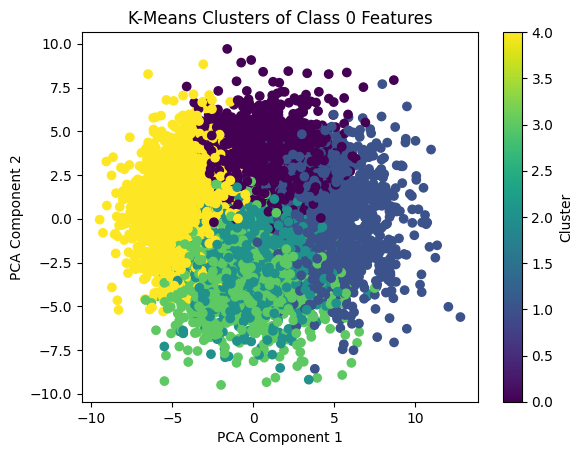

In [ ]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Reduce feature dimensions to 2 for visualization
pca = PCA(n_components=2)
reduced_features = pca.fit_transform(feature_matrix)

# Plot clusters
plt.scatter(reduced_features[:, 0], reduced_features[:, 1], c=cluster_labels, cmap='viridis')
plt.colorbar(label='Cluster')
plt.title('K-Means Clusters of Class 0 Features')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.show()


**Save results**

In [ ]:
import pandas as pd

cluster_results = pd.DataFrame({'Image': filenames, 'Cluster': cluster_labels})
cluster_results.to_csv('/content/drive/MyDrive/kaggle_dataset/cluster_results.csv', index=False)
print("Cluster assignments saved to cluster_results.csv")


Cluster assignments saved to cluster_results.csv


**Group images by cluster**

In [ ]:
import os
import shutil
from PIL import Image
import matplotlib.pyplot as plt

# Assuming `filenames` and `cluster_labels` are already defined
# Map filenames to their respective clusters
clusters = {}
for filename, label in zip(filenames, cluster_labels):
    if label not in clusters:
        clusters[label] = []
    clusters[label].append(filename)

# Print the number of images in each cluster
for cluster_id, images in clusters.items():
    print(f"Cluster {cluster_id}: {len(images)} images")


Cluster 0: 1997 images
Cluster 4: 2170 images
Cluster 2: 2104 images
Cluster 3: 1484 images
Cluster 1: 1623 images


class 0:


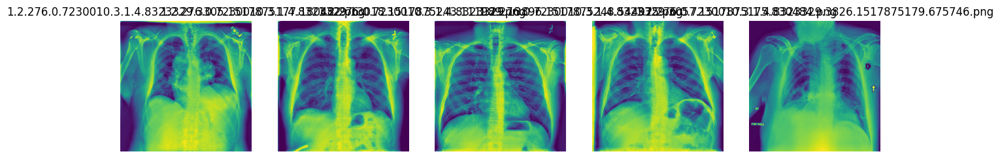

class 1:


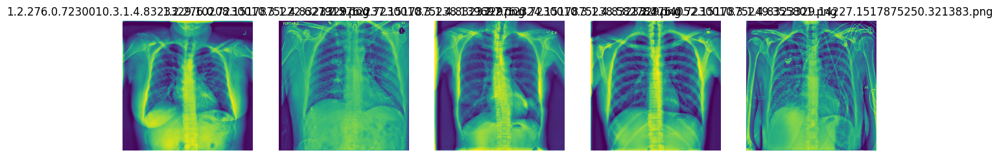

class 2:


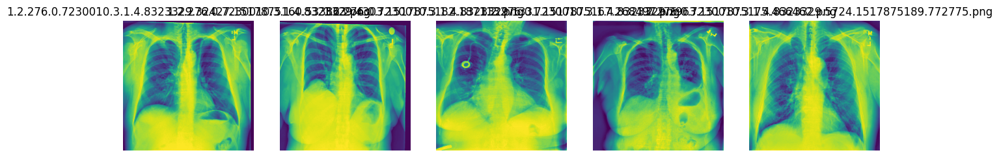

class 3:


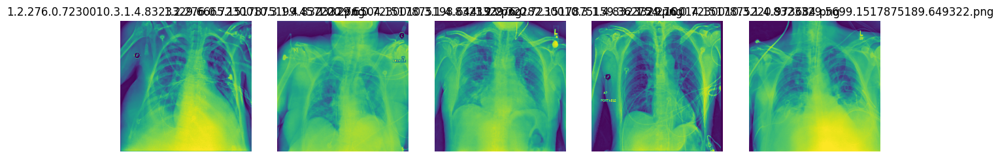

class 4:


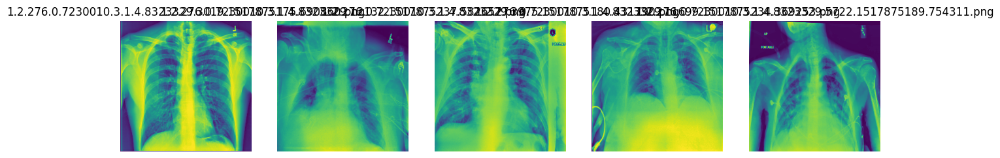

In [ ]:
import os
import random
from PIL import Image
import matplotlib.pyplot as plt

def display_random_images_from_class(class_label, folder_path, n=5):
    """
    Display `n` random images from the given folder with a specific class label.
    """
    # Collect all image paths in the folder
    image_files = [os.path.join(folder_path, f) for f in os.listdir(folder_path) if f.endswith('.png')]

    if len(image_files) == 0:
        print(f"No images found in {folder_path}")
        return

    # Ensure there are enough images to display
    if len(image_files) < n:
        print(f"Not enough images in {folder_path}. Displaying {len(image_files)} images instead.")
        n = len(image_files)

    # Randomly select `n` images
    selected_images = random.sample(image_files, n)

    # Display the images
    print(f"class {class_label}:")
    plt.figure(figsize=(15, 10))
    for i, img_path in enumerate(selected_images):
        image = Image.open(img_path)  # Open the image
        plt.subplot(1, n, i + 1)
        plt.imshow(image)  # Display in original color (no colormap applied)
        plt.axis('off')
        plt.title(os.path.basename(img_path))
    plt.show()

# Paths to the cluster folders
cluster_paths = {
    0: '/content/drive/MyDrive/kaggle_dataset/clustered_images/cluster_0',
    1: '/content/drive/MyDrive/kaggle_dataset/clustered_images/cluster_1',
    2: '/content/drive/MyDrive/kaggle_dataset/clustered_images/cluster_2',
    3: '/content/drive/MyDrive/kaggle_dataset/clustered_images/cluster_3',
    4: '/content/drive/MyDrive/kaggle_dataset/clustered_images/cluster_4',
}

# Display random images from each cluster
for class_label, folder_path in cluster_paths.items():
    display_random_images_from_class(class_label, folder_path, n=5)


In [ ]:
import os
import shutil
from math import floor

# Directory to save selected images
selected_images_dir = '/content/drive/MyDrive/kaggle_dataset/selected_class_0'
os.makedirs(selected_images_dir, exist_ok=True)

# Clustered image directories
cluster_dirs = {
    0: '/content/drive/MyDrive/kaggle_dataset/clustered_images/cluster_0',
    1: '/content/drive/MyDrive/kaggle_dataset/clustered_images/cluster_1',
    2: '/content/drive/MyDrive/kaggle_dataset/clustered_images/cluster_2',
    3: '/content/drive/MyDrive/kaggle_dataset/clustered_images/cluster_3',
    4: '/content/drive/MyDrive/kaggle_dataset/clustered_images/cluster_4',
}

# Fractions of images to select from each cluster
total_images = 2669
cluster_fractions = {
    0: (4 / 17) * total_images,
    1: (5 / 17) * total_images,
    2: (3 / 17) * total_images,
    3: (2 / 17) * total_images,
    4: (3 / 17) * total_images,
}

# Select images from each cluster
for cluster_id, cluster_path in cluster_dirs.items():
    num_images_to_select = floor(cluster_fractions[cluster_id])  # Calculate the number of images to select
    print(f"Selecting {num_images_to_select} images from Cluster {cluster_id}")

    # Get all images in the cluster directory
    image_list = [f for f in os.listdir(cluster_path) if f.endswith('.png')]

    # Ensure we don't exceed the available number of images
    if num_images_to_select > len(image_list):
        print(f"Not enough images in Cluster {cluster_id}. Only {len(image_list)} images available.")
        num_images_to_select = len(image_list)

    # Select the first `num_images_to_select` images
    selected_images = image_list[:num_images_to_select]

    # Copy the selected images to the output directory
    for image_name in selected_images:
        src_path = os.path.join(cluster_path, image_name)
        dest_path = os.path.join(selected_images_dir, image_name)  # Keep the original file name
        shutil.copy(src_path, dest_path)

print(f"Selected images saved to {selected_images_dir}")


Selecting 628 images from Cluster 0
Selecting 785 images from Cluster 1
Selecting 471 images from Cluster 2
Selecting 314 images from Cluster 3
Selecting 471 images from Cluster 4
Selected images saved to /content/drive/MyDrive/kaggle_dataset/selected_class_0


In [ ]:
import os

# Define the directory
selected_images_dir = '/content/drive/MyDrive/kaggle_dataset/selected_class_0'

# Count the number of image files
image_count = len([f for f in os.listdir(selected_images_dir) if f.endswith('.png')])

# Print the result
print(f"Total number of images in '{selected_images_dir}': {image_count}")


Total number of images in '/content/drive/MyDrive/kaggle_dataset/selected_class_0': 2669
